In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF

from wordcloud import WordCloud

import nltk
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import contractions

# 1. Exploration du jeu de données

In [17]:
DATASET_FILE = "./dataset.csv"

In [18]:
dataset_df = pd.read_csv(DATASET_FILE)
dataset_df

,text,stars
0,I've only had food from here once and it wasn'...,1
1,I will never return here again. Ever. I was ...,1
2,I wish my experience was great as others. I di...,1
3,Are the rosemary grapefruit scones supposed to...,1
4,Our takeout order was half wrong. Food was mis...,1
...,...,...
24995,I was a loyal fan of Aroy before the ownership...,5
24996,Stopped here for a bite while wandering around...,5
24997,"A quiet place with excellent food, great music...",5
24998,Super delicious food. Awesome vibe. I suffered...,5


## 1.1 Répartition des avis clients en fonction du nombre d'étoiles

In [4]:
stars_columns = dataset_df.stars
stars_columns

0        1
1        1
2        1
3        1
4        1
        ..
24995    5
24996    5
24997    5
24998    5
24999    5
Name: stars, Length: 25000, dtype: int64

In [5]:
dataset_df.stars.unique()

array([1, 2, 3, 4, 5], dtype=int64)

In [6]:
stars_columns.value_counts()

1    5000
2    5000
3    5000
4    5000
5    5000
Name: stars, dtype: int64

<AxesSubplot:ylabel='stars'>

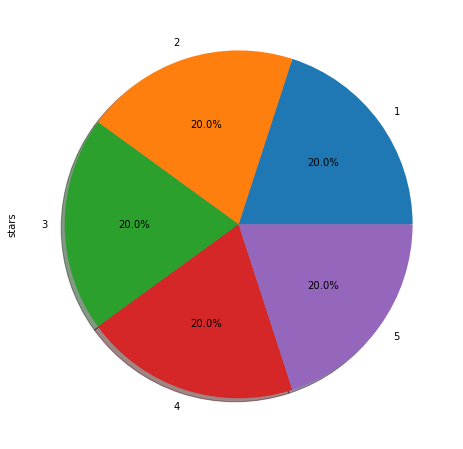

In [7]:
stars_columns.value_counts().plot(kind="pie", figsize=(10, 8), autopct="%1.1f%%", shadow=True)

## 1.2 Distribution de la longueur (nombre de mots) des avis clients

In [8]:
dataset_df["length"] = dataset_df["text"].apply(lambda x: len(x.split()))
dataset_df

,text,stars,length
0,I've only had food from here once and it wasn'...,1,68
1,I will never return here again. Ever. I was ...,1,87
2,I wish my experience was great as others. I di...,1,166
3,Are the rosemary grapefruit scones supposed to...,1,81
4,Our takeout order was half wrong. Food was mis...,1,32
...,...,...,...
24995,I was a loyal fan of Aroy before the ownership...,5,75
24996,Stopped here for a bite while wandering around...,5,55
24997,"A quiet place with excellent food, great music...",5,32
24998,Super delicious food. Awesome vibe. I suffered...,5,41


<AxesSubplot:ylabel='Frequency'>

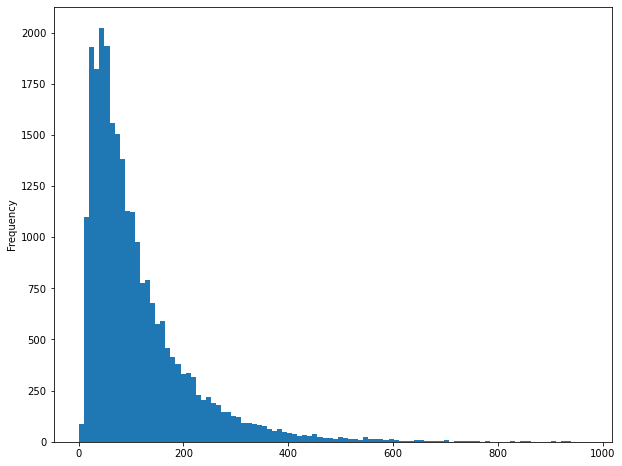

In [9]:
dataset_df.length.plot(kind="hist", bins=100, figsize=(10, 8))

## 1.3 Distribution de la longueur des avis clients en fonction du nombre d'étoiles des avis

Text(0.5, 1.0, "Répartition des longueurs des avis en fonction du nombre d'étoiles")

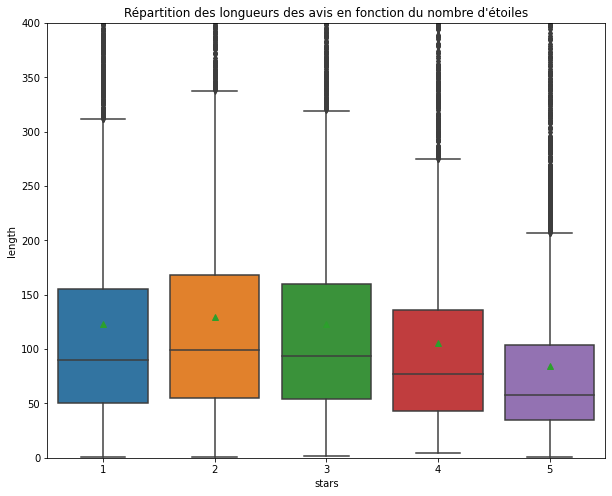

In [10]:
plt.figure(figsize=(10, 8))

ax = sns.boxplot(x=dataset_df.stars ,
            y=dataset_df.length,
            showmeans=True,
            )
ax.set_ylim(0, 400)

ax.set_title("Répartition des longueurs des avis en fonction du nombre d'étoiles")

# 2. Pré-traitement du jeu de données

In [19]:
text_ligne= dataset_df.text
text_ligne

0        I've only had food from here once and it wasn'...
1        I will never return here again.  Ever.  I was ...
2        I wish my experience was great as others. I di...
3        Are the rosemary grapefruit scones supposed to...
4        Our takeout order was half wrong. Food was mis...
                               ...                        
24995    I was a loyal fan of Aroy before the ownership...
24996    Stopped here for a bite while wandering around...
24997    A quiet place with excellent food, great music...
24998    Super delicious food. Awesome vibe. I suffered...
24999    I have a lot of dietary restrictions and this ...
Name: text, Length: 25000, dtype: object

## faire la contraction

In [20]:
#z=contractions.fix(dataset_df.text[i])
for i in range(len(dataset_df)): 
    z=contractions.fix(dataset_df.text[i])
    # print(z)
    dataset_df.text[i] = z


C:\Users\USER\AppData\Local\Temp\ipykernel_13488\1668664288.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_df.text[i] = z


In [21]:
dataset_df

,text,stars
0,I have only had food from here once and it was...,1
1,I will never return here again. Ever. I was ...,1
2,I wish my experience was great as others. I di...,1
3,Are the rosemary grapefruit scones supposed to...,1
4,Our takeout order was half wrong. Food was mis...,1
...,...,...
24995,I was a loyal fan of Aroy before the ownership...,5
24996,Stopped here for a bite while wandering around...,5
24997,"A quiet place with excellent food, great music...",5
24998,Super delicious food. Awesome vibe. I suffered...,5


## ajouter _neg au mot negative

In [22]:
def tag_words(sentence):
    import re
    # up to punctuation as in punct, put tags for words
    # following a negative word
    # find punctuation in the sentence
    punct = re.findall(r'[.:;!?]',sentence)[0]
    # create word set from sentence
    wordSet = { x for x in re.split("[.:;!?, ]",sentence) if x }
    keywordSet = {"never", "nothing", "nowhere", "noone", "none", "not"}
   
    # find negative words in sentence
    neg_words = wordSet & keywordSet
    if neg_words:
        for word in neg_words:
            start_to_w = sentence[:sentence.find(word)+len(word)]
            # put tags to words after the negative word
            w_to_punct =  re.sub(r'\b([A-Za-z\']+)\b',r'\1_not',
                               sentence[sentence.find(word)+len(word):sentence.find(punct)])
            punct_to_end = sentence[sentence.find(punct):]
            return(start_to_w + w_to_punct + punct_to_end)
    else :
        return sentence

In [23]:
import re
def txt_conversion(sentence):
    #Getting only the letters from the tweets
    sentence=re.sub(r'[^a-zA-Z ]','',sentence)
    #Converting them to lowercase
    sentence=sentence.lower()
    #split based on space to remove multiple spaces
    words=sentence.split()
    #combining to form sentence
    return (" ".join(words)).strip()

In [24]:
dataset_df['text']=dataset_df['text'].apply(lambda x: txt_conversion(x))

In [25]:
dataset_df

,text,stars
0,i have only had food from here once and it was...,1
1,i will never return here again ever i was sitt...,1
2,i wish my experience was great as others i din...,1
3,are the rosemary grapefruit scones supposed to...,1
4,our takeout order was half wrong food was miss...,1
...,...,...
24995,i was a loyal fan of aroy before the ownership...,5
24996,stopped here for a bite while wandering around...,5
24997,a quiet place with excellent food great music ...,5
24998,super delicious food awesome vibe i suffered t...,5


In [26]:
for i in range(len(dataset_df)): 
    #dataset_df.reset_index(inplace=True, drop=True)
    x=tag_words(dataset_df.text[i])
    print(x)
    dataset_df.text[i] = x

IndexError: list index out of range

In [67]:
#from nltk.tokenize import word_tokenize
#
#text_ligne = text_ligne.apply(word_tokenize)
#text_ligne.head()

In [ ]:
#dataset_df.text = text_ligne

# lemmatization et stopwords

In [27]:
from nltk.stem import WordNetLemmatizer
import nltk
nltk.download('omw-1.4')
def stop_wrds_lemma_convert(sentence):
    stop_words=nltk.corpus.stopwords.words('english')
    
    lemmatizer=WordNetLemmatizer()


    tokens = [w for w in sentence.split() if not w in stop_words] #stopwords removal
    newString=''
    for i in tokens:                                                 
        newString=newString+lemmatizer.lemmatize(i)+' '    #converting words to lemma                               
    return newString.strip() 

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [28]:
dataset_df['text']=dataset_df['text'].apply(lambda x: stop_wrds_lemma_convert(x))


In [29]:
dataset_df

,text,stars
0,food memorable panang curry balance flavor lik...,1
1,never return ever sitting booth waiting dinner...,1
2,wish experience great others dined wednesday n...,1
3,rosemary grapefruit scone supposed taste like ...,1
4,takeout order half wrong food missing portion ...,1
...,...,...
24995,loyal fan aroy ownership change apprehensive v...,5
24996,stopped bite wandering around faneuil hall ple...,5
24997,quiet place excellent food great music helpful...,5
24998,super delicious food awesome vibe suffered dis...,5


## faire la tokenization

In [30]:
from nltk.tokenize import word_tokenize
for i in range(len(dataset_df)): 
    x=word_tokenize(dataset_df.text[i])
    print(x)
    dataset_df.text[i] = x


['food', 'memorable', 'panang', 'curry', 'balance', 'flavor', 'like', 'taste', 'coconut', 'lemongrass', 'lime', 'lacking', 'east', 'asia', 'offering', 'way', 'sweet', 'care', 'owner', 'thai', 'eat', 'anything', 'cooked', 'well', 'place', 'claim', 'serve', 'thai', 'food']
['never', 'return', 'ever', 'sitting', 'booth', 'waiting', 'dinner', 'come', 'scurried', 'mouse', 'booth', 'dining', 'room', 'immediately', 'getting', 'leave', 'informed', 'front', 'desk', 'issue', 'blew', 'nothing', 'said', 'oh', 'ya', 'mouse', 'problem', 'big', 'deal', 'certainly', 'reporting', 'department', 'health', 'disgusting']
['wish', 'experience', 'great', 'others', 'dined', 'wednesday', 'night', 'week', 'ago', 'say', 'least', 'meal', 'horrible', 'jerk', 'chicken', 'entree', 'date', 'seafood', 'coconut', 'entree', 'presentation', 'nice', 'seafood', 'coconut', 'however', 'date', 'displeased', 'literally', 'bite', 'food', 'couple', 'bite', 'mine', 'mess', 'jerk', 'chicken', 'could', 'finish', 'also', 'expecting'

C:\Users\USER\AppData\Local\Temp\ipykernel_13488\2749135427.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_df.text[i] = x


['horrible', 'love', 'red', 'robin', 'worst', 'experience', 'waited', 'min', 'server', 'take', 'drink', 'order', 'min', 'later', 'came', 'got', 'food', 'orderstill', 'drink', 'finally', 'received', 'drink', 'food', 'came', 'waited', 'min', 'last', 'kid', 'food', 'come', 'mini', 'corn', 'dog', 'extremely', 'burnt', 'manager', 'said', 'nothing', 'could', 'since', 'oil', 'needed', 'changed', 'future', 'corn', 'dog', 'would', 'come', 'waited', 'refill', 'asked', 'passing', 'waiter', 'since', 'waitress', 'mia', 'never', 'received', 'party', 'min', 'waiting', 'someone', 'get', 'check', 'pay', 'kid', 'adult', 'went', 'outside', 'wait', 'took', 'min', 'longer', 'pay', 'ridiculous', 'always', 'talk', 'place', 'family', 'dinner', 'anymore']
['like', 'pet', 'friendly', 'reastaurant', 'go', 'walk', 'forever', 'bottom', 'low', 'lake', 'confronted', 'sign', 'say', 'dog', 'even', 'service', 'dog', 'ask', 'save', 'gas']
['one', 'dirtiest', 'mcdonalds', 'ever', 'slow', 'service', 'table', 'disgusting',

['food', 'pretty', 'good', 'however', 'service', 'incredibly', 'shitty', 'seated', 'approached', 'anything', 'flag', 'people', 'take', 'order', 'bring', 'u', 'water', 'restaurant', 'busy', 'might', 'understanding', 'however', 'half', 'empty', 'finished', 'meal', 'also', 'noticed', 'table', 'got', 'complimentary', 'bread', 'ask', 'receive', 'bread', 'ask', 'bring', 'finished', 'meal', 'never', 'coming', 'back']
['save', 'hard', 'earned', 'money', 'keep', 'yelping', 'next', 'mexican', 'food', 'restaurant', 'bland', 'overpriced', 'clean', 'bathroom', 'spanish', 'music', 'either', 'sorely', 'disappointed', 'back']
['could', 'give', 'star', 'would', 'terrible', 'customer', 'service', 'ordered', 'told', 'hour', 'wait', 'waiting', 'hour', 'half', 'gave', 'call', 'told', 'still', 'waiting', 'informed', 'delivery', 'live', 'min', 'away', 'min', 'pas', 'still', 'nothing', 'call', 'manager', 'say', 'thing', 'way', 'say', 'traffic', 'mile', 'lot', 'traffic', 'get', 'stuck', 'finally', 'arrives', '

['manager', 'absolutely', 'awful', 'like', 'job', 'manager', 'customer', 'service', 'skill', 'extremely', 'poor', 'evergoing', 'back', 'location', 'simply']
['honestly', 'really', 'high', 'expectation', 'goin', 'friend', 'seems', 'love', 'disappointed', 'thai', 'spicy', 'noodle', 'soup', 'water', 'used', 'lot', 'marination', 'food', 'place']
['giving', 'place', 'one', 'star', 'mainly', 'customer', 'service', 'terrible', 'ordered', 'delivery', 'month', 'back', 'told', 'driver', 'door', 'located', 'back', 'access', 'front', 'refused', 'come', 'back', 'even', 'though', 'already', 'pre', 'paid', 'order', 'credit', 'card', 'walked', 'stair', 'signed', 'food', 'gave', 'ungrateful', 'driver', 'tip', 'told', 'came', 'back', 'door', 'would', 'gave', 'mean', 'rude', 'giving', 'pro', 'tip', 'maximize', 'tip', 'giving', 'customer', 'best', 'experience', 'possible', 'go', 'swears', 'racial', 'slur', 'told', 'could', 'get', 'delivery', 'post', 'review', 'today', 'could', 'even', 'order', 'pick', 'la

['ordered', 'late', 'night', 'delivery', 'pretty', 'sure', 'sent', 'donut', 'going', 'throw', 'away', 'stale', 'tasted', 'similar', 'surprisingly', 'probably', 'go', 'back']
['went', 'location', 'ordered', 'limited', 'time', 'menu', 'item', 'advertised', 'across', 'store', 'several', 'sign', 'store', 'listed', 'ingredient', 'employee', 'know', 'make', 'store', 'apparently', 'even', 'carrying', 'special', 'ingredient', 'make', 'item', 'something', 'caught', 'employee', 'halfway', 'making', 'bowl', 'orderedon', 'would', 'probably', 'star', 'probably', 'indictment', 'moes', 'whole', 'rather', 'location', 'specifically', 'however', 'reach', 'store', 'manager', 'experience', 'website', 'completely', 'ignored', 'way', 'acknowledge', 'customer']
['call', 'yuk', 'yukkier', 'really', 'hated', 'ever', 'kind', 'goop', 'served', 'today', 'ever', 'asian', 'favor', 'pack', 'sandwich', 'show', 'great', 'food', 'park', 'lot', 'desired']
['food', 'used', 'goto', 'weekend', 'breakfast', 'spot', 'quality

['rude', 'server', 'baby', 'friendly', 'restaurant', 'recommend', 'restaurant', 'baby', 'le', 'year', 'old', 'accommodating', 'food', 'average', 'nothing', 'special']
['beignet', 'hollow', 'piping', 'hot', 'grease', 'middle', 'expect', 'fluffy', 'beignet', 'like', 'get', 'cafe', 'du', 'monde', 'burnt', 'half', 'mouth', 'grease', 'flowing', 'buy', 'mix', 'fair', 'better']
['boyfriend', 'went', 'saturday', 'night', 'little', 'dinner', 'rush', 'server', 'audrey', 'even', 'greet', 'u', 'podium', 'enthusiastically', 'said', 'hi', 'ignored', 'walked', 'u', 'table', 'gave', 'u', 'menu', 'walked', 'come', 'back', 'take', 'drink', 'order', 'never', 'ihop', 'idea', 'fountain', 'drink', 'hot', 'tea', 'bottled', 'water', 'etc', 'asked', 'drink', 'offer', 'huff', 'grab', 'menu', 'turned', 'drink', 'menu', 'instead', 'telling', 'drink', 'incredibly', 'rude', 'attentive', 'whatsoever', 'also', 'overheard', 'complain', 'wanting', 'wait', 'anymore', 'table', 'pretty', 'unprofessional', 'definitely', 'c

['wish', 'could', 'give', 'negative', 'star', 'ordered', 'pizza', 'bread', 'first', 'order', 'came', 'burnt', 'fact', 'even', 'plated', 'something', 'terribly', 'burned', 'sad', 'took', 'forever', 'cook', 'another', 'time', 'order', 'half', 'size', 'first', 'burnt', 'time', 'tried', 'remove', 'burnt', 'piece', 'can', 'not', 'remove', 'burnt', 'taste', 'never', 'go', 'back', 'obviously', 'care']
['heard', 'wonderful', 'thing', 'coquine', 'really', 'looking', 'forward', 'lunch', 'initially', 'surprised', 'extremely', 'small', 'portion', 'prefer', 'small', 'portion', 'usually', 'order', 'appetizer', 'small', 'plate', 'main', 'dish', 'orrcichiette', 'pasta', 'half', 'cup', 'serving', 'ridiculously', 'small', 'porchetta', 'sandwich', 'looked', 'reasonable', 'one', 'layer', 'thin', 'meat', 'bunch', 'cabbage', 'shared', 'friend', 'tiny', 'size', 'pasta', 'dish', 'ordered', 'creme', 'fraiche', 'ice', 'cream', 'shocked', 'single', 'melon', 'ball', 'size', 'scoop', 'point', 'felt', 'insulted', '

['called', 'make', 'guaranteed', 'reservation', 'people', 'people', 'staying', 'hotel', 'people', 'coming', 'mission', 'new', 'westminster', 'would', 'accommodate', 'told', 'call', 'back', 'minute', 'time', 'want', 'see', 'table', 'definitely', 'multiple', 'separate', 'table', 'around', 'restaurant', 'call', 'around', 'place', 'see', 'get', 'table', 'math', 'people', 'plate', 'plus', 'drinksplus', 'maybe', 'alcoholic', 'drink', 'plus', 'tax', 'add', 'tip', 'dollar', 'mind', 'turning', 'type', 'business', 'away', 'poor', 'executive', 'decision', 'management']
['price', 'high', 'get', 'asked', 'substitute', 'steamed', 'rice', 'fried', 'rice', 'dinner', 'said', 'would', 'get', 'separate', 'side', 'also', 'come', 'soup', 'egg', 'roll', 'small', 'portion']
['fairly', 'predictable', 'little', 'dive', 'least', 'thought', 'boyfriend', 'sitting', 'bar', 'around', 'midnight', 'saturday', 'night', 'staring', 'others', 'eye', 'kissing', 'bartender', 'came', 'u', 'said', 'appreciate', 'guy', 'like'

['customer', 'oltorf', 'long', 'time', 'never', 'problem', 'tonight', 'decided', 'carry', 'big', 'mistake', 'live', 'southwest', 'austin', 'drive', 'short', 'opened', 'entree', 'sesame', 'chicken', 'long', 'as', 'red', 'hair', 'twisted', 'broccoli', 'chicken', 'called', 'inform', 'supervisor', 'said', 'lying', 'people', 'time', 'good', 'know', 'treat', 'customer', 'end', 'said', 'manager', 'review', 'complaint', 'later', 'date']
['bother', 'customer', 'service', 'ridiculous', 'appreciate', 'business', 'took', 'minute', 'one', 'three', 'employee', 'acknowledge', 'presence', 'busy', 'five', 'occupied', 'table', 'waiter', 'think', 'funny', 'can', 'not', 'complete', 'sentence', 'without', 'inserting', 'stupid', 'comment', 'jingle']
['came', 'group', 'woman', 'celebrating', 'bachelorette', 'weekend', 'intrigued', 'idea', 'live', 'band', 'great', 'service', 'deplorable', 'service', 'slow', 'food', 'came', 'wave', 'took', 'hour', 'delivered', 'u', 'someone', 'boston', 'appalled', 'overall', '

['place', 'crazy', 'kid', 'got', 'push', 'stuff', 'stolen', 'pizza', 'ok', 'cold', 'time', 'got', 'half', 'stuff', 'ticket', 'took', 'kid', 'spent', 'realize', 'gettong', 'ticket', 'would', 'recommend']
['worst', 'service', 'entire', 'life', 'think', 'waiter', 'wagering', 'could', 'make', 'patron', 'maddest', 'took', 'minute', 'get', 'order', 'taken', 'another', 'show', 'pack', 'lunch', 'go', 'long', 'past', 'hour', 'see', 'food', 'front', 'food', 'little', 'better', 'dorm', 'food', 'salty', 'tastelessthe', 'service', 'worst', 'ever', 'experienced', 'know', 'already', 'said']
['probably', 'worst', 'kristy', 'kreme', 'city', 'worker', 'slow', 'molasses', 'always', 'line', 'wrapped', 'around', 'building', 'donut', 'wonderful', 'productivity', 'efficiency', 'staff', 'would', 'recommend', 'patronize', 'another', 'store', 'possible', 'risk', 'late', 'work', 'line', 'least', 'min']
['terrible', 'slipped', 'menu', 'hotel', 'door', 'called', 'order', 'jerk', 'asks', 'figure', 'street', 'hotel'

['good', 'oyster', 'dozen', 'husband', 'got', 'bad', 'one', 'afraid', 'eat', 'rest', 'dungeness', 'crab', 'avocado', 'tower', 'crab', 'bad', 'notice', 'smell', 'served', 'beyond', 'granddaughter', 'burger', 'awful', 'fry', 'good', 'drink', 'good', 'waitress', 'apologetic', 'comped', 'u', 'oyster', 'crab', 'gave', 'u', 'free', 'dessert', 'shame', 'bad', 'cool', 'location', 'going', 'back', 'next', 'time', 'come', 'portland']
['french', 'toast', 'came', 'hair', 'replacement', 'one', 'le', 'piece', 'cooked', 'way', 'even', 'offer', 'take', 'bill', 'compensate', 'way']
['sure', 'hype', 'restaurant', 'maybe', 'went', 'bad', 'day', 'experience', 'definitely', 'worst', 'sushi', 'service', 'ever', 'big', 'sushi', 'lover', 'know', 'high', 'quality', 'sushi', 'taste', 'like', 'experience', 'restaurant', 'go', 'roll', 'volcano', 'roll', 'could', 'believe', 'saw', 'put', 'plate', 'wish', 'took', 'picture', 'describe', 'looked', 'like', 'someone', 'either', 'took', 'ingredient', 'ground', 'blender'

['saturday', 'jessica', 'server', 'leave', 'warned', 'sat', 'restaurant', 'pm', 'ordered', 'food', 'pm', 'half', 'food', 'served', 'pm', 'half', 'table', 'never', 'received', 'order', 'asked', 'jessica', 'cancel', 'order', 'patron', 'sat', 'u', 'received', 'entire', 'order', 'u', 'table', 'completely', 'finished', 'eating', 'ordered', 'maduros', 'go', 'every', 'table', 'around', 'u', 'received', 'order', 'cuban', 'sandwich', 'shrimp', 'take', 'hour', 'asked', 'jessica', 'wait', 'replied', 'cook', 'food', 'rather', 'check', 'manager', 'came', 'help', 'awful', 'service']
['good', 'experience', 'food', 'par', 'would', 'get', 'mall', 'food', 'court', 'add', 'gluten', 'allergy', 'informed', 'waiter', 'give', 'nongluten', 'free', 'food', 'first', 'time', 'finally', 'gave', 'food', 'second', 'time', 'table', 'finished', 'eating', 'waiting', 'check', 'add', 'came', 'home', 'got', 'sick', 'assuming', 'gluten', 'fun', 'time', 'disappointing']
['want', 'start', 'saying', 'food', 'good', 'macnchee

['mediocre', 'meal', 'poorly', 'made', 'drink', 'lost', 'credit', 'card', 'server', 'help', 'locate', 'thought', 'funny', 'minute', 'terror', 'found', 'bar', 'manager', 'came', 'table', 'left', 'free', 'dessert', 'purchase', 'coupon', 'bill', 'folder', 'satisfied', 'manager', 'rude', 'understanding', 'impatient', 'talking', 'minute', 'rip', 'ticket', 'sarcastic', 'manner', 'table', 'walking', 'huff', 'vowed', 'never', 'go', 'back', 'never', 'ever', 'go', 'pay', 'cash', 'risk', 'credit', 'card', 'security']
['one', 'worse', 'experience', 'shake', 'shack', 'date', 'probably', 'credited', 'horrible', 'staffi', 'came', 'ordered', 'around', 'pm', 'probably', 'people', 'ordered', 'though', 'number', 'generous', 'probably', 'around', 'people', 'sat', 'waited', 'people', 'ordered', 'later', 'getting', 'order', 'first', 'kept', 'waiting', 'received', 'order', 'minutesthe', 'long', 'wait', 'would', 'bad', 'fact', 'shake', 'shack', 'got', 'order', 'completely', 'wrong', 'ordered', 'double', 'smok

['worth', 'admission', 'crowded', 'eleven', 'three', 'time', 'many', 'always', 'keep', 'asking', 'dance', 'floor', 'small', 'people', 'always', 'pushing', 'elbowing', 'try', 'get', 'washroom', 'time', 'music', 'good', 'want', 'dance', 'can', 'not', 'time', 'music', 'suck', 'loud', 'quiet', 'never']
['ordered', 'twice', 'first', 'time', 'order', 'late', 'wing', 'small', 'dry', 'without', 'flavor', 'fry', 'alright', 'tasted', 'reheated', 'last', 'time', 'ordered', 'burger', 'awful', 'plain', 'awful', 'tasted', 'like', 'middle', 'school', 'regret', 'better', 'cheese', 'rangoon', 'panda', 'express', 'ordering', 'waste', 'money']
['effort', 'evacuate', 'miami', 'hurricane', 'irma', 'drove', 'north', 'orlando', 'literally', 'place', 'town', 'occupancy', 'available', 'room', 'dated', 'much', 'need', 'renovation', 'would', 'stay', 'room', 'fine', 'especially', 'circumstance', 'lucky', 'find', 'anything', 'reason', 'one', 'star', 'rating', 'originally', 'booked', 'room', 'thursday', 'monday', '

['worst', 'experience', 'tried', 'first', 'time', 'last', 'waitress', 'coordinated', 'kept', 'bringing', 'wrong', 'order', 'different', 'table', 'valerie', 'believe', 'name', 'n', 'wife', 'correct', 'multiple', 'time', 'taking', 'order', 'would', 'blame', 'kitchen', 'staff', 'saying', 'fault', 'never', 'coming', 'back']
['crappy', 'customer', 'service', 'mean', 'even', 'mad', 'suppose', 'deserve', 'bad', 'treatment', 'choosing', 'patronize', 'business', 'fellow', 'countrymeni', 'came', 'friend', 'get', 'menu', 'minute', 'later', 'literally', 'wave', 'waiter', 'get', 'u', 'one', 'patron', 'caucasian', 'mean', 'stereotypically', 'known', 'tip', 'really', 'well', 'deserve', 'vip', 'service', 'regular', 'african', 'right', 'hahaha', 'came', 'u', 'already', 'given', 'menu', 'order', 'taken', 'food', 'coming', 'already', 'yes', 'finally', 'brings', 'u', 'menu', 'proceeds', 'disappear', 'patiently', 'wait', 'another', 'minute', 'friend', 'decided', 'preserve', 'whatever', 'dignity', 'left', '

['terrible', 'food', 'subpar', 'noodle', 'stuff', 'stale', 'pork', 'stale', 'gyoza', 'partially', 'frozen', 'inside', 'service', 'also', 'terrible', 'wait', 'staff', 'aimlessly', 'wander', 'around', 'like', 'can', 'not', 'wait', 'go', 'home', 'nothing', 'without', 'flagged', 'waited', 'minute', 'someone', 'came', 'even', 'take', 'drink', 'order', 'pattern', 'anytime', 'needed', 'anything', 'else', 'might', 'well', 'install', 'buzzer', 'button', 'table', 'since', 'staff', 'apparently', 'nothing', 'told']
['family', 'gathering', 'pn', 'september', 'decided', 'order', 'sushi', 'called', 'order', 'pm', 'could', 'ready', 'pick', 'pm', 'arrived', 'pm', 'employee', 'told', 'u', 'order', 'ready', 'said', 'busy', 'lot', 'large', 'order', 'say', 'family', 'restaurant', 'business', 'year', 'ever', 'treated', 'customer', 'like', 'would', 'never', 'survived', 'fyi', 'reason', 'ordered', 'food', 'early', 'day', 'would', 'wait', 'order', 'coming', 'dinner', 'rush', 'bad', 'customer', 'service', 'retu

['terrible', 'terrible', 'service', 'food', 'great', 'either', 'wing', 'mediocre', 'even', 'though', 'supposed', 'best', 'thing', 'took', 'forever', 'flag', 'server', 'would', 'return']
['last', 'trip', 'made', 'reservation', 'started', 'servicing', 'u', 'eaten', 'holiday', 'always', 'served', 'lunch', 'lunch', 'price', 'today', 'served', 'dinner', 'dinner', 'price', 'lunch', 'called', 'make', 'reservation', 'informed', 'paying', 'party', 'big', 'deal', 'known', 'would', 'changed', 'plan', 'left', 'mother', 'day', 'would', 'gotten', 'table', 'elsewherethe', 'owner', 'argument', 'table', 'chef', 'ordered', 'chicken', 'ounce', 'chicken', 'would', 'thought', 'lost', 'million', 'dollar', 'order', 'chickenour', 'chef', 'nice', 'thing', 'wonderfulwhen', 'check', 'came', 'much', 'correct', 'itif', 'want', 'keep', 'customer', 'coming', 'back', 'way']
['seaworld', 'orlando', 'phasing', 'best', 'thing', 'yo', 'niece', 'saw', 'pet', 'show', 'trained', 'ordinary', 'rescue', 'pet', 'pretty', 'extra

['ordered', 'chai', 'tea', 'latte', 'ended', 'waste', 'watery', 'tasted', 'like', 'milk', 'friend', 'ordered', 'breakfast', 'sandwich', 'go', 'waited', 'minute', 'asked', 'much', 'longer', 'woman', 'said', 'know', 'gave', 'u', 'refund', 'never', 'go', 'back', 'serious', 'waste', 'time']
['arrived', 'observed', 'multiple', 'table', 'unoccupied', 'yet', 'wait', 'list', 'worked', 'industry', 'year', 'asked', 'host', 'table', 'oh', 'well', 'server', 'got', 'satwhich', 'make', 'sense', 'section', 'full', 'irrelevant', 'guest', 'punished', 'neither', 'server', 'pocket', 'messed', 'another', 'server', 'section', 'full', 'part', 'business', 'get', 'guest', 'sat', 'table', 'filled']
['waiting', 'staff', 'rude', 'rushed', 'u', 'whole', 'meal', 'give', 'u', 'time', 'order', 'drink', 'fly', 'soup', 'asked', 'help', 'busboy', 'told', 'walk', 'front', 'get', 'help', 'walked', 'straight', 'front', 'door']
['beginmy', 'girlfriend', 'ordered', 'coffee', 'bagel', 'vegetable', 'cream', 'cheese', 'portabe

['ordered', 'delivery', 'told', 'would', 'minute', 'hour', 'minute', 'called', 'check', 'status', 'woman', 'answered', 'phone', 'unbelievably', 'rude', 'cut', 'say', 'well', 'told', 'hour', 'half', 'best', 'ever', 'proceeded', 'hang', 'shocked', 'wing', 'came', 'minute', 'later', 'get', 'someone', 'better', 'manner', 'answer', 'phone', 'order']
['find', 'food', 'iffy', 'claim', 'best', 'mole', 'world', 'famous', 'remeber', 'correctly', 'well', 'world', 'best', 'bad', 'mediocre', 'plain', 'bad', 'oily', 'chalky', 'nice', 'spice', 'would', 'call', 'meal', 'also', 'lacking', 'amount', 'meat', 'supposed', 'chicken', 'must', 'flown', 'awaythe', 'salsa', 'bar', 'lot', 'stuff', 'going', 'anything', 'could', 'get', 'taste', 'bud', 'like', 'went', 'hot', 'day', 'last', 'summer', 'water', 'wait', 'minute', 'get', 'water', 'canister', 'filled']
['love', 'banh', 'mi', 'sandwich', 'shop', 'close', 'home', 'easy', 'stop', 'way', 'picnic', 'sellwood', 'park', 'problem', 'food', 'terrible', 'daughter'

['even', 'remember', 'sub', 'wait', 'way', 'long', 'late', 'getting', 'back', 'work', 'minute', 'away', 'purely', 'chaotic', 'hard', 'move', 'around', 'table', 'set', 'well']
['went', 'brother', 'sisterinlaw', 'tuna', 'steak', 'small', 'portion', 'cooked', 'well', 'done', 'ordered', 'sent', 'back', 'came', 'back', 'slightly', 'cooked', 'still', 'raw', 'center', 'rather', 'send', 'back', 'burn', 'ate', 'trying', 'avoid', 'uncooked', 'part', 'big', 'mistake', 'got', 'food', 'poisoning', 'threw', 'night', 'needle', 'say', 'never', 'going', 'back', 'beware', 'food', 'contaminated', 'also', 'tried', 'making', 'reservation', 'person', 'phone', 'said', 'necessary', 'get', 'minute', 'wait', 'reservation']
['going', 'riverwalk', 'pizzeria', 'couple', 'year', 'yesterday', 'far', 'worse', 'pizza', 'ever', 'served', 'ordered', 'go', 'overcooked', 'dry', 'never', 'even', 'bothered', 'eat', 'called', 'complain', 'matter', 'one', 'answered', 'pm', 'ended', 'ordering', 'mellow', 'mushroom', 'instead',

['wish', 'checked', 'yelp', 'ordering', 'place', 'got', 'take', 'even', 'dog', 'would', 'eat', 'meatball', 'sub', 'saturated', 'watery', 'marinara', 'bread', 'soggy', 'inedible', 'meatball', 'burnt', 'boyfriend', 'asked', 'mayo', 'tomato', 'burger', 'completely', 'ignored', 'called', 'talk', 'manager', 'rude', 'care', 'food', 'inedible', 'order', 'waste', 'money']
['horrible', 'experience', 'waiting', 'minute', 'table', 'outside', 'busy', 'wanted', 'sit', 'outside', 'smoke', 'finally', 'received', 'table', 'informed', 'allowed', 'manager', 'duty', 'care', 'told', 'u', 'duty', 'inform', 'could', 'tell', 'u', 'ahead', 'time', 'highly', 'unprofessionalwhile', 'waiting', 'table', 'ordered', 'queso', 'forgotten', 'kitchen', 'staff', 'took', 'minute', 'arrive', 'par', 'wait', 'entree', 'later', 'ordered', 'took', 'minute', 'show', 'upi', 'never', 'go', 'back', 'establishment', 'food', 'mediocre', 'management', 'kitchen', 'long', 'way', 'go', 'feel', 'sorry', 'waitstaff', 'attentive', 'could'

['like', 'another', 'reviewer', 'pain', 'write', 'review', 'every', 'time', 'think', 'experience', 'frogmore', 'feel', 'irked', 'excited', 'restaurant', 'come', 'neighborhood', 'disappointed', 'turned', 'decor', 'cute', 'definitely', 'upgrade', 'sanctuary', 'outdoor', 'patio', 'nice', 'cocktail', 'fine', 'sadly', 'good', 'end', 'shocked', 'rave', 'review', 'food', 'found', 'overpriced', 'bland', 'call', 'elevated', 'low', 'country', 'setting', 'aside', 'contradiction', 'seems', 'like', 'elevated', 'mean', 'food', 'low', 'flavor', 'offered', 'itsy', 'bitsy', 'portion', 'first', 'love', 'love', 'love', 'hushpuppy', 'hushpuppy', 'meh', 'soft', 'light', 'slightly', 'sweet', 'nice', 'crispy', 'exterior', 'like', 'really', 'tasteless', 'next', 'little', 'ramekin', 'hoppin', 'john', 'totally', 'outrageous', 'black', 'eyed', 'pea', 'rice', 'nearly', 'wellcooked', 'deep', 'flavor', 'real', 'version', 'get', 'south', 'big', 'bowl', 'worse', 'frogmore', 'stew', 'low', 'country', 'boil', 'get', 'b

['unfortunately', 'place', 'miss', 'mark', 'food', 'overpriced', 'service', 'slow', 'live', 'town', 'extremely', 'disappointed', 'high', 'hope', 'tavern', 'return']
['understaffed', 'food', 'slow', 'af', 'nothing', 'clean', 'restaurant', 'worst', 'little', 'piece', 'rock', 'dumpling', 'never', 'come']
['excited', 'find', 'ayce', 'sushi', 'bar', 'ordered', 'thought', 'eat', 'menu', 'said', 'could', 'eat', 'top', 'told', 'waitress', 'ordered', 'qualify', 'eat', 'also', 'waitress', 'really', 'rude', 'gave', 'attention', 'assume', 'friend', 'hardly', 'gave', 'u', 'attention', 'hardly', 'even', 'acknowledged', 'existence', 'sushi', 'subpar', 'deceptive', 'pricing', 'stay', 'away']
['want', 'shit', 'day', 'long', 'vomit', 'spewing', 'nose', 'bonfire', 'place', 'eat', 'unfortunately', 'went', 'bonfire', 'last', 'night', 'spouse', 'boy', 'treat', 'woken', 'crawled', 'bed', 'vomit', 'shit', 'shit', 'vomit', 'sending', 'thanks', 'ask', 'try', 'taste', 'food', 'ordered', 'skirt', 'steak', 'taco',

['never', 'eaten', 'anything', 'rosies', 'never', 'complaint', 'customer', 'service', 'ordered', 'online', 'delivery', 'cake', 'tried', 'immediately', 'cancel', 'order', 'saw', 'shipping', 'within', 'cambridge', 'address', 'several', 'block', 'away', 'dollar', 'tried', 'call', 'cancel', 'closed', 'filled', 'online', 'customer', 'service', 'request', 'immediately', 'cancel', 'never', 'cancelled', 'order', 'however', 'still', 'charged', 'cake', 'delivery', 'day', 'late', 'anyway', 'called', 'today', 'get', 'delivery', 'fee', 'refunded', 'employee', 'told', 'get', 'email', 'message', 'late', 'cancel', 'order', 'contact', 'know', 'employee', 'told', 'would', 'call', 'store', 'directly', 'get', 'refund', 'delivery', 'fee', 'said', 'would', 'call', 'would', 'get', 'call', 'back', 'right', 'away', 'nobody', 'called', 'back', 'horrible', 'customer', 'serviceupdate', 'forgot', 'mention', 'cake', 'going', 'delivered', 'got', 'call', 'unidentified', 'person', 'saying', 'going', 'receive', 'packag

['never', 'truly', 'mean', 'never', 'stayed', 'worse', 'hotel', 'life', 'probably', 'would', 'angry', 'paying', 'night', 'paid', 'three', 'night', 'literally', 'walked', 'room', 'dirty', 'sheet', 'wet', 'towel', 'bathroom', 'floor', 'working', 'light', 'rustydirty', 'lightslamps', 'generally', 'dirtydusty', 'room', 'sagging', 'mattress', 'chipped', 'furniture', 'painti', 'went', 'front', 'desk', 'show', 'staff', 'replied', 'clean', 'one', 'bad', 'thing', 'another', 'hold', 'card', 'incidental', 'billed', 'credit', 'card', 'twice', 'room', 'service', 'wi', 'fi', 'wil', 'disconnect', 'every', 'minute', 'positive', 'say', 'staff', 'nice', 'seem', 'try', 'kind', 'place', 'run', 'poorly', 'guess', 'stay', 'business', 'proximity', 'universal', 'place', 'beat', 'truly', 'need', 'full', 'overhaul', 'new', 'management', 'would', 'never', 'ever', 'recommend', 'place']
['used', 'love', 'place', 'several', 'reason', 'right', 'street', 'good', 'food', 'good', 'beer', 'great', 'tv', 'set', 'watching

['read', 'review', 'going', 'white', 'friend', 'mine', 'recommended', 'clearly', 'know', 'nothing', 'good', 'dim', 'sumfirst', 'place', 'small', 'cramp', 'enough', 'room', 'push', 'cart', 'hand', 'deliver', 'stuff', 'tray', 'interior', 'outdated', 'crampy', 'low', 'ceiling', 'need', 'serious', 'upgraded', 'restaurant', 'except', 'dumpling', 'food', 'generally', 'cold', 'hot', 'like', 'steamer', 'fun', 'roll', 'powdery', 'pork', 'rib', 'coffee', 'sauce', 'sounded', 'interesting', 'tried', 'combo', 'work', 'know', 'chef', 'thinkingfor', 'wife', 'bill', 'mind', 'paying', 'good', 'dim', 'sum', 'food', 'atmosphere', 'work', 'place', 'come', 'close', 'getting', 'atmospherei', 'fooled', 'long', 'line', 'place', 'explain', 'wait', 'long', 'line', 'clearly', 'white', 'people', 'know', 'good', 'dim', 'sum', 'asian', 'well', 'guessing', 'trying', 'like', 'live', 'near', 'area', 'want', 'drive', 'tnssave', 'money', 'go', 'tn']
['want', 'try', 'keep', 'place', 'like', 'business', 'clearly', 'intere

['terrible', 'can', 'not', 'keep', 'service', 'even', 'crowd', 'slow', 'need', 'shut', 'fire', 'everybody', 'start']
['writing', 'behalf', 'father', 'stayed', 'week', 'agohe', 'wife', 'stayed', 'night', 'terrible', 'experience', 'room', 'cut', 'chase', 'quality', 'mattress', 'apparently', 'poor', 'use', 'plywood', 'board', 'support', 'underneath', 'discover', 'board', 'last', 'night', 'unfortunately', 'complete', 'misery', 'exactly', 'would', 'expect', 'hotel', 'charging', 'night']
['horrible', 'culture', 'employee', 'made', 'interacted', 'several', 'annoyed', 'attitude', 'frequent', 'another', 'mod', 'nothing', 'like', 'see', 'employee', 'cell', 'gloved', 'make', 'pizza', 'show', 'simply', 'care', 'success', 'establishment']
['star', 'service', 'ordered', 'lunch', 'special', 'came', 'soup', 'handed', 'bag', 'entree', 'soup', 'ask', 'soup', 'caused', 'price', 'shoot', 'asked', 'also', 'yelled', 'asking', 'pretty', 'sure', 'spoken', 'would', 'leaving', 'part', 'mealfor', 'hot', 'sour', 

['horrible', 'experience', 'decided', 'stop', 'one', 'person', 'front', 'waiting', 'line', 'rush', 'two', 'guy', 'working', 'took', 'sweet', 'time', 'moving', 'slowly', 'urgency', 'took', 'ten', 'minute', 'ring', 'person', 'front', 'could', 'tell', 'even', 'annoyed', 'got', 'mini', 'pretzel', 'dog', 'bottom', 'burnt', 'upset', 'proceeded', 'try', 'give', 'friend', 'broken', 'pretzel', 'guy', 'looked', 'like', 'smoked', 'joint', 'clocked', 'job', 'service', 'unacceptable']
['eat', 'come', 'one', 'night', 'friend', 'st', 'birthday', 'party', 'would', 'never', 'want', 'eat', 'hot', 'sticky', 'upstairs', 'drunk', 'people', 'everywhere', 'course', 'drunk', 'karaoke', 'oh', 'gosh', 'terrible', 'could', 'imagine', 'even', 'dreaming', 'eating', 'place', 'cool', 'thing', 'bartender', 'took', 'birthday', 'shot', 'friend', 'went', 'downstairs', 'bar', 'closed', 'carribean', 'club', 'open', 'go', 'stair', 'get', 'drink', 'top', 'owner', 'decided', 'come', 'downstairs', 'watch', 'dance', 'jerk', 'd

['food', 'bug', 'send', 'back', 'bug', 'removed', 'plate', 'brought', 'back', 'told', 'burned', 'rice', 'mexican', 'cooking', 'rice', 'year', 'know', 'burn', 'rice', 'look', 'likeplease', 'b']
['san', 'diego', 'recently', 'moved', 'boston', 'looking', 'decent', 'taqueria', 'time', 'search', 'continues', 'pollo', 'asado', 'looked', 'like', 'strip', 'frozen', 'chicken', 'heated', 'put', 'taco', 'smothered', 'type', 'tomato', 'sour', 'cream', 'mix', 'burrito', 'husband', 'bland', 'bean', 'completely', 'done', 'rice', 'mexican', 'rice', 'accustomed', 'california', 'boston', 'please', 'get', 'together', 'mexican', 'food', 'soon']
['never', 'write', 'review', 'thing', 'last', 'night', 'much', 'write', 'something', 'restaurant', 'something', 'one', 'star', 'food', 'star', 'terrible', 'service', 'server', 'young', 'chinese', 'guy', 'long', 'brown', 'dyed', 'hair', 'horribly', 'rude', 'disrespectful', 'private', 'space', 'know', 'meaning', 'service', 'friend', 'went', 'eat', 'expecting', 'fun',

['credit', 'card', 'fraud', 'go', 'went', 'place', 'dec', 'th', 'food', 'okay', 'average', 'level', 'chinese', 'hot', 'pot', 'pay', 'check', 'waiter', 'took', 'away', 'credit', 'card', 'came', 'back', 'long', 'time', 'like', 'five', 'minute', 'two', 'hour', 'ate', 'got', 'call', 'chase', 'fraud', 'department', 'said', 'someone', 'tried', 'use', 'card', 'buy', 'online', 'game', 'coin', 'european', 'website', 'pretty', 'sure', 'fraud', 'kept', 'card', 'wallet', 'time', 'used', 'card', 'least', 'ten', 'day', 'went', 'also', 'present', 'card', 'anyone', 'else', 'make', 'transaction', 'swiped', 'card', 'people', 'plz', 'stay', 'away', 'restaurant', 'eat', 'use', 'cash']
['going', 'downwardwe', 'paid', 'small', 'denver', 'steak', 'return', 'minute', 'chewing', 'would', 'break', 'enough', 'swallowed', 'exaggeration', 'quite', 'tasteless', 'cut', 'awful', 'offered', 'bring', 'u', 'next', 'higher', 'quality', 'steak', 'agreeing', 'instead', 'giving', 'u', 'price', 'informed', 'would', 'next', '

['disappointing', 'stopped', 'columbus', 'day', 'holiday', 'yes', 'town', 'busy', 'tourist', 'restaurant', 'server', 'actually', 'standing', 'entrance', 'trying', 'convince', 'people', 'come', 'well', 'decide', 'stop', 'ordered', 'beer', 'looked', 'basic', 'menu', 'wife', 'wanted', 'try', 'turkey', 'club', 'tomato', 'server', 'said', 'absolutely', 'substitution', 'per', 'chef', 'questioned', 'allergy', 'well', 'take', 'le', 'food', 'le', 'work', 'accomodating', 'place', 'close', 'soon', 'understand', 'customer', 'service', 'sad', 'nice', 'location', 'left', 'immediately', 'without', 'ordering', 'way', 'host', 'door', 'said', 'fast', 'one', 'caring']
['terrible', 'foodwe', 'went', 'try', 'since', 'shabusen', 'closed', 'location', 'kyo', 'concept', 'food', 'quality', 'differentnormally', 'think', 'weekend', 'seafood', 'fresh', 'salmon', 'fishy', 'taste', 'teriyaki', 'beef', 'swimming', 'liquid', 'sauce', 'rib', 'fat', 'never', 'go', 'back', 'restaurant']
['last', 'visit', 'rating', 'star

['can', 'not', 'rate', 'food', 'waited', 'minute', 'bar', 'ignored', 'ordered', 'drink', 'min', 'given', 'menu', 'one', 'ever', 'asked', 'order', 'eye', 'contact', 'bartender', 'several', 'occasion', 'passed', 'finally', 'asked', 'check', 'left', 'back']
['eat', 'chicken', 'flavorless', 'small', 'side', 'cold', 'taste', 'like', 'came', 'box', 'soda', 'flat', 'maryland', 'fried', 'chicken', 'need', 'close', 'roll', 'give', 'old', 'small', 'hankering', 'hospital', 'food', 'place', 'would', 'give', 'zero', 'star', 'option']
['ohhh', 'yelp', 'badly', 'wish', 'star', 'option', 'place', 'worst', 'urge', 'read', 'thinking', 'applying', 'taking', 'job', 'establishment', 'please', 'favor', 'go', 'gm', 'total', 'psychopath', 'degrade', 'make', 'life', 'miserable', 'fire', 'people', 'next', 'nothing', 'matter', 'hard', 'work', 'everyone', 'afraid', 'lose', 'job', 'daily', 'turn', 'rate', 'worst', 'ever', 'seen', 'psycho', 'crazy', 'manager', 'bad', 'treat', 'staff', 'like', 'dirt', 'feel', 'like'

['regular', 'server', 'make', 'break', 'experience', 'several', 'great', 'server', 'including', 'katie', 'ty', 'lindsey', 'others', 'avoided', 'cost', 'tonight', 'michelle', 'served', 'incorrect', 'drink', 'incorrect', 'entree', 'argued', 'customer', 'reported', 'allergy', 'asked', 'substitution', 'reallyto', 'make', 'matter', 'worse', 'never', 'apologized', 'error']
['took', 'wife', 'young', 'son', 'saturday', 'afternoon', 'weekend', 'ago', 'family', 'lunch', 'looked', 'like', 'nice', 'place', 'outside', 'thought', 'would', 'give', 'try', 'seemed', 'major', 'attitude', 'problem', 'u', 'soon', 'stepped', 'foot', 'door', 'preppy', 'bartendermanager', 'say', 'hello', 'anything', 'u', 'female', 'employee', 'standing', 'beside', 'behind', 'bar', 'kind', 'stood', 'finally', 'hostess', 'seated', 'u', 'ironically', 'waiting', 'food', 'come', 'took', 'forever', 'noticed', 'staff', 'member', 'behind', 'bar', 'break', 'neck', 'greet', 'seat', 'guest', 'opinion', 'looked', 'like', 'waitress', 'ho

['family', 'staying', 'hampton', 'inn', 'family', 'event', 'went', 'kennedy', 'steakhouse', 'dinner', 'good', 'experiencesome', 'positive', 'great', 'clam', 'chowder', 'food', 'pretty', 'good', 'price', 'reasonable', 'hotel', 'restaurant', 'offer', 'couple', 'local', 'beer', 'although', 'waitstaff', 'knew', 'nothing', 'gave', 'beer', 'ordered', 'wrong', 'people', 'firstsomething', 'weird', 'guacamole', 'make', 'bacon', 'bleu', 'cheese', 'love', 'bacon', 'love', 'bleu', 'cheese', 'even', 'though', 'live', 'la', 'open', 'minded', 'enough', 'try', 'weird', 'doctored', 'guac', 'workthe', 'bad', 'restaurant', 'extremely', 'loud', 'much', 'difficult', 'talk', 'restaurant', 'full', 'kitchen', 'seem', 'careful', 'food', 'served', 'way', 'described', 'menu', 'example', 'mom', 'quesadilla', 'supposed', 'come', 'cheese', 'waitress', 'friendly', 'incompetent', 'felt', 'bad', 'like', 'way', 'head', 'trying', 'hard', 'idea', 'perhaps', 'new', 'needed', 'trainingthe', 'really', 'bad', 'kennedy', 'men

['horrible', 'service', 'served', 'except', 'little', 'granddaughter', 'wait', 'waitress', 'said', 'sorry', 'training', 'excuse', 'brought', 'kid', 'water', 'asked', 'three', 'little', 'granddaughter', 'wait', 'water', 'pie', 'great', 'bad', 'servicethen', 'coupon', 'adult', 'three', 'child', 'told', 'take', 'coupon', 'sunday', 'even', 'shari', 'take', 'coupon', 'sunday', 'pie', 'much', 'better', 'tooplace', 'dirty', 'never', 'come', 'back', 'herei', 'hate', 'writing', 'bad', 'review', 'however', 'would', 'disservice', 'let', 'everyone', 'know', 'terrible', 'service', 'food', 'atmosphere']
['terrible', 'tried', 'sell', 'pizza', 'spinach', 'thrown', 'top', 'completely', 'unacceptable']
['server', 'making', 'pizza', 'extremely', 'rude', 'really', 'arrogant', 'put', 'barely', 'topping', 'asked', 'cheese', 'extremely', 'rude', 'changed', 'tone', 'awful', 'customer', 'service', 'returning', 'blaze']
['almost', 'walked', 'waited', 'long', 'receive', 'food', 'friendly', 'server', 'plastic', '

['ordering', 'usual', 'tofu', 'rice', 'bowl', 'waiting', 'man', 'ahead', 'finish', 'paying', 'eyed', 'bag', 'chip', 'resting', 'counter', 'mine', 'begin', 'chip', 'coming', 'bag', 'resting', 'le', 'spotless', 'counter', 'secondly', 'cashier', 'finished', 'customer', 'ahead', 'handed', 'change', 'used', 'ungloved', 'hand', 'shove', 'chip', 'disgusting', 'counter', 'bag', 'truly', 'looked', 'moment', 'wondering', 'real', 'indeed', 'sharply', 'informed', 'price', 'meal', 'asked', 'mind', 'getting', 'another', 'bag', 'chip', 'touched', 'hand', 'handling', 'money', 'immune', 'deficiency', 'get', 'sick', 'quite', 'easily', 'mouth', 'opened', 'disbelief', 'replied', 'can', 'not', 'get', 'chip', 'without', 'touching', 'hand', 'refused', 'pushover', 'usually', 'asked', 'nifty', 'shovellike', 'tool', 'seen', 'employee', 'use', 'exaggerated', 'slowness', 'huge', 'puff', 'air', 'emitting', 'exasperated', 'sigh', 'used', 'scoop', 'previously', 'mentioned', 'maintaining', 'put', 'upon', 'expression'

['service', 'cashier', 'far', 'rudest', 'florida', 'bacon', 'cheese', 'burger', 'absolute', 'worst', 'burger', 'ever', 'eaten', 'mcdonalds', 'even', 'rate', 'higher', 'positive', 'thing', 'milkshake', 'good']
['minute', 'wait', 'togo', 'wing', 'okay', 'technically', 'min', 'order', 'getting', 'bag', 'non', 'crowded', 'night', 'celery', 'forgotten', 'wing', 'came', 'even', 'hot', 'ordered', 'wing', 'came', 'technically', 'received', 'wing', 'know', 'place', 'new', 'manager', 'busy', 'watching', 'game', 'even', 'notice', 'going', 'extra', 'frustrating', 'try', 'improves', 'back', 'update', 'review']
['always', 'loved', 'baguettecos', 'pastry', 'gone', 'kit', 'davie', 'store', 'many', 'time', 'complaint', 'today', 'terrible', 'experience', 'main', 'street', 'storewe', 'ordered', 'americanos', 'weak', 'hot', 'water', 'basically', 'normally', 'complain', 'really', 'wanted', 'tasty', 'coffee', 'politely', 'explained', 'weak', 'would', 'like', 'new', 'onesthey', 'said', 'extra', 'shot', 'woul

['could', 'leave', 'zero', 'star', 'would', 'reality', 'pizza', 'good', 'great', 'lamb', 'skewer', 'excellentliterally', 'waited', 'minute', 'get', 'freaking', 'cheese', 'pizza', 'table', 'came', 'u', 'got', 'served', 'variety', 'different', 'pizza', 'pepperoni', 'white', 'garlic', 'u', 'excuse', 'different', 'place', 'order', 'pizza', 'versus', 'cheese', 'pizza', 'come', 'freaking', 'kidding', 'lamb', 'take', 'longer', 'cook', 'pizza', 'waitress', 'scolding', 'making', 'stink', 'people', 'rethink', 'place', 'rated', 'take', 'back', 'regina']
['really', 'looking', 'forward', 'great', 'chicken', 'based', 'reviewseven', 'found', 'burbs', 'realize', 'fried', 'chicken', 'easiest', 'cooktiming', 'frying', 'right', 'keep', 'coating', 'golden', 'allowing', 'enough', 'time', 'chicken', 'cook', 'challenge', 'chicken', 'breast', 'got', 'breast', 'legsthighs', 'seemed', 'like', 'boiled', 'microwaved', 'prior', 'coating', 'frying', 'coating', 'flavorful', 'crisp', 'chicken', 'dry', 'rubbery', 'tex

['rude', 'waiter', 'laughed', 'dropped', 'cellphonehad', 'poor', 'experience', 'closed', 'boathouse', 'horseshoe', 'bay', 'well']
['usually', 'go', 'place', 'like', 'chili', 'pretty', 'low', 'expectation', 'worked', 'chili', 'many', 'year', 'understand', 'food', 'quality', 'expect', 'place', 'like', 'sure', 'location', 'franchise', 'horrible', 'service', 'food', 'presentation', 'taste', 'ew', 'always', 'order', 'margarita', 'queso', 'dip', 'quesadilla', 'explosion', 'salad', 'always', 'order', 'come', 'know', 'expect', 'meal', 'almost', 'seemed', 'like', 'someone', 'trying', 'replicate', 'unsuccessfully', 'chili', 'recipe', 'queso', 'dip', 'like', 'warm', 'thick', 'consistency', 'grainy', 'instead', 'creamy', 'taste', 'good', 'quesadilla', 'salad', 'thrown', 'onto', 'place', 'looked', 'like', 'someone', 'bumped', 'plate', 'almost', 'dropped', 'something', 'chicken', 'thick', 'rubbery', 'know', 'place', 'tourist', 'central', 'maybe', 'pay', 'much', 'attention', 'quality', 'account', 'pe

['awful', 'service', 'would', 'recommend', 'place', 'unless', 'like', 'ignored', 'left']
['popped', 'night', 'cap', 'saturday', 'night', 'bar', 'staff', 'ok', 'especially', 'welcoming', 'late', 'shift', 'sowe', 'understand', 'butterrible', 'pint', 'guinness', 'neighborhood', 'especially', 'quality', 'pour', 'guinness', 'would', 'asset', 'need', 'line', 'gas', 'proper', 'temperature', 'especially', 'right', 'proper', 'guinness', 'pint', 'glass', 'know', 'ask', 'beer', 'distributor', 'give', 'beer', 'stale', 'metallic', 'taste', 'guinness', 'head', 'based', 'tonight', 'experience', 'alone', 'star']
['first', 'last', 'time', 'restaurant', 'ordered', 'wing', 'boneless', 'wing', 'order', 'boneless', 'piece', 'would', 'hardly', 'call', 'got', 'boneless', 'wing', 'three', 'half', 'nugget', 'smaller', 'tater', 'tot', 'basically', 'fried', 'breading', 'would', 'get', 'twice', 'much', 'chicken', 'one', 'piece', 'order', 'chicken', 'mcnuggets', 'mcdonalds', 'le', 'first', 'thought', 'joke', 'rest

['good', 'crepe', 'vietnemeesecoffee', 'sadly', 'first', 'time', 'la', 'friend', 'purse', 'stolen', 'location', 'keep', 'belonging', 'next', 'time', 'shady', 'individual', 'roll']
['wow', 'hard', 'imagine', 'worse', 'super', 'slow', 'poor', 'service', 'hard', 'bread', 'fresh', 'receipt', 'ask', 'twice', 'water', 'kicker', 'cooky', 'husband', 'ordered', 'raisin', 'one', 'chic', 'chip', 'cookie', 'first', 'told', 'raisin', 'cooky', 'even', 'though', 'could', 'see', 'nodded', 'pointed', 'sold', 'u', 'two', 'cooky', 'immediately', 'turned', 'around', 'dumped', 'rest', 'cooky', 'tray', 'trash', 'seriously']
['unfortunately', 'restaurant', 'open', 'sunday', 'good', 'thing', 'three', 'friend', 'ordered', 'breakfast', 'simple', 'order', 'waffle', 'egg', 'took', 'minute', 'table', 'others', 'arrived', 'u', 'served', 'first', 'place', 'practically', 'empty', 'everything', 'looked', 'premade', 'except', 'egg', 'served', 'prepackaged', 'syrup', 'entirely', 'high', 'fructose', 'corn', 'syrup', 'car

['friend', 'read', 'many', 'rave', 'review', 'yelp', 'life', 'know', 'restaurant', 'people', 'talking', 'staff', 'ambiance', 'drink', 'great', 'food', 'completely', 'underwhelming', 'compare', 'dining', 'experience', 'fine', 'dining', 'fixed', 'price', 'dinner', 'seattle', 'san', 'francisco', 'vancouver', 'see', 'hype', 'exceeds', 'get', 'dining', 'experience', 'reminds', 'childrens', 'story', 'emperor', 'new', 'clothes', 'average', 'bland', 'nobody', 'want', 'say', 'spending', 'kind', 'money', 'dinner', 'see', 'return']
['epically', 'slow', 'service', 'employee', 'appear', 'super', 'slo', 'motion', 'clear', 'direction', 'lack', 'leadership']
['asian', 'stick', 'ordering', 'take', 'dined', 'several', 'time', 'get', 'experience', 'every', 'time', 'everyone', 'else', 'receives', 'first', 'class', 'service', 'waiting', 'roughly', 'min', 'place', 'order', 'waitress', 'walk', 'away', 'mid', 'sentence', 'take', 'two', 'people', 'better', 'get', 'comfortable', 'check', 'another', 'finishing',

['place', 'world', 'famous', 'majority', 'people', 'gone', 'love', 'taste', 'fryer', 'oil', 'honestly', 'think', 'people', 'go', 'free', 'greasy', 'hushpuppy', 'covered', 'powdered', 'sugar', 'admit', 'awful', 'little', 'oily', 'hush', 'puppy', 'taste', 'like', 'everything', 'else', 'dipped', 'fryer', 'past', 'month', 'covered', 'powdered', 'sugar', 'beware', 'fried', 'anythingturned', 'taste', 'burned', 'fishy', 'grease', 'ordered', 'grilled', 'shrimp', 'salad', 'shrimp', 'rubbery', 'covered', 'much', 'old', 'bay', 'seasoning', 'ended', 'scraping', 'shrimp', 'good', 'five', 'minute', 'chewed', 'obviously', 'fresh', 'shrimp', 'salad', 'aokthe', 'outdated', 'decor', 'scream', 'love', 'early', 'sa', 'probably', 'original', 'ripped', 'vinyl', 'booth', 'sat', 'sadly', 'taped', 'attempt', 'keep', 'another', 'year', 'remember', 'coming', 'kid', 'grandparent', 'wholly', 'impressed', 'year', 'older', 'can', 'not', 'seem', 'figure', 'cool', 'place', 'patio', 'feed', 'fish', 'probably', 'inside'

['get', 'wrong', 'food', 'good', 'ambiance', 'really', 'decatur', 'incredibly', 'annoying', 'habit', 'dealing', 'delivery', 'get', 'busy', 'basically', 'shut', 'phone', 'call', 'get', 'normal', 'hour', 'recorded', 'message', 'ever', 'get', 'really', 'frustrated', 'many', 'time', 'complained', 'many', 'time', 'one', 'year', 'period', 'basic', 'answer', 'shrug', 'hence', 'review', 'tonight', 'last', 'straw', 'go', 'zifty', 'find', 'several', 'pizza', 'place', 'happy', 'take', 'order', 'deliver', 'busy', 'avellinos', 'want', 'talk', 'talk', 'spend', 'money']
['visited', 'flip', 'burger', 'thursday', 'evening', 'dinner', 'upon', 'entering', 'one', 'get', 'u', 'seated', 'waited', 'five', 'minute', 'went', 'bar', 'figure', 'need', 'grab', 'table', 'finally', 'found', 'someone', 'walked', 'u', 'table', 'decided', 'sitting', 'outside', 'perfect', 'summer', 'evening', 'service', 'extremely', 'poor', 'fact', 'first', 'minute', 'one', 'even', 'checked', 'see', 'wanted', 'order', 'drink', 'appetiz

['writing', 'couple', 'day', 'ago', 'post', 'would', 'quite', 'different', 'unfortunately', 'two', 'different', 'experience', 'trying', 'figure', 'business', 'run', 'first', 'good', 'couple', 'day', 'ago', 'daughter', 'greeted', 'two', 'sweet', 'woman', 'happy', 'help', 'u', 'continued', 'pleasant', 'personable', 'whole', 'experience', 'today', 'since', 'great', 'experience', 'went', 'back', 'greeted', 'walked', 'counter', 'basically', 'ignored', 'everyone', 'continued', 'working', 'finally', 'announced', 'wanted', 'order', 'juice', 'woman', 'answered', 'ok', 'want', 'felt', 'like', 'putting', 'could', 'bothered', 'u', 'perhaps', 'suppose', 'get', 'pre', 'made', 'juice', 'anyway', 'write', 'anything', 'order', 'wrong', 'terribly', 'wrong', 'wrong', 'guy', 'behind', 'register', 'seemed', 'almost', 'apologetic', 'told', 'wrong', 'attitude', 'told', 'never', 'told', 'mint', 'never', 'wrote', 'wound', 'leaving', 'room', 'girl', 'finished', 'juice', 'almost', 'walked', 'would', 'kept', 'try

['sorry', 'say', 'scummy', 'menu', 'tattered', 'fingerprint', 'body', 'oil', 'obvious', 'around', 'edge', 'waitress', 'ill', 'kept', 'make', 'plastered', 'face', 'problem', 'leaning', 'right', 'get', 'remaining', 'menu', 'whatever', 'else', 'wanted', 'table', 'may', 'good', 'food', 'can', 'not', 'say', 'got', 'left', 'good', 'restaurant', 'food', 'think', 'rated', 'hick', 'population', 'florida', 'likely', 'good', 'get']
['love', 'papa', 'ginos', 'pizza', 'thin', 'crust', 'tasty', 'sauce', 'happy', 'see', 'one', 'close', 'new', 'residence', 'gave', 'chance', 'month', 'period', 'one', 'time', 'get', 'right', 'soggy', 'crust', 'nasty', 'smell', 'even', 'used', 'papa', 'ginos', 'know', 'going', 'behind', 'scene', 'location', 'something', 'definitely', 'right']
['ordered', 'called', 'find', 'order', 'lady', 'said', 'going', 'door', 'called', 'got', 'busy', 'signal', 'tried', 'around', 'lady', 'said', 'driver', 'way', 'pressed', 'exact', 'time', 'long', 'would', 'take', 'said', 'maybe', 'mi

['service', 'burger', 'king', 'worst', 'drive', 'took', 'minuteto', 'get', 'food', 'cooked', 'ice', 'drink', 'told', 'people', 'working', 'hard', 'even', 'said', 'thank', 'think', 'would', 'better', 'close', 'know', 'go', 'back']
['went', 'two', 'time', 'terrible', 'experienceboth', 'time', 'food', 'way', 'overpriced', 'cook', 'could', 'hit', 'proper', 'temperature', 'save', 'life', 'first', 'time', 'food', 'came', 'second', 'ordered', 'made', 'feel', 'like', 'paying', 'fast', 'food', 'suspected', 'food', 'coldall', 'sent', 'breakfast', 'ham', 'deli', 'meat', 'back', 'replaced', 'sausagethe', 'sausage', 'pink', 'raw', 'decided', 'go', 'give', 'second', 'try', 'calling', 'talking', 'manager', 'assured', 'unacceptable', 'would', 'take', 'care', 'next', 'time', 'town', 'next', 'time', 'boston', 'stopped', 'checking', 'room', 'ordered', 'burger', 'medium', 'came', 'rare', 'manager', 'stopped', 'asked', 'everything', 'told', 'last', 'experience', 'asked', 'manager', 'spoke', 'phone', 'said'

['place', 'suck', 'food', 'preparation', 'oven', 'use', 'pizza', 'awful', 'get', 'better', 'taste', 'eating', 'pizza', 'boxthe', 'arbys', 'pizza']
['lucky', 'enough', 'waffle', 'house', 'within', 'like', 'mile', 'house', 'needle', 'say', 'returning', 'particular', 'one', 'stopped', 'late', 'monday', 'night', 'busy', 'guy', 'behind', 'line', 'seemed', 'nice', 'enough', 'first', 'told', 'u', 'would', 'right', 'u', 'disappeared', 'like', 'minute', 'finally', 'returned', 'ordered', 'food', 'go', 'patty', 'melt', 'sandwich', 'meal', 'hashbrowns', 'soda', 'came', 'time', 'pay', 'husband', 'questioned', 'price', 'menu', 'patty', 'melt', 'meal', 'would', 'one', 'meal', 'plus', 'one', 'sandwich', 'equal', 'much', 'guy', 'seemed', 'immediately', 'defense', 'signing', 'credit', 'card', 'receipt', 'pulled', 'itemized', 'receipt', 'stapled', 'said', 'husband', 'itemized', 'receipt', 'look', 'guy', 'reached', 'rudely', 'snatched', 'hand', 'said', 'receipt', 'would', 'even', 'let', 'look', 'proceed',

['slow', 'service', 'get', 'served', 'food', 'rest', 'group', 'compensation', 'everyone', 'group', 'wait', 'finish', 'since', 'get', 'order', 'practically', 'finished', 'food', 'fair', 'greeted', 'upon', 'arrival', 'even', 'busy']
['went', 'recommendation', 'bad', 'sushi', 'sashimi', 'fresh', 'service', 'lackingfirst', 'maki', 'selection', 'flair', 'abysmal', 'plain', 'odd', 'ranging', 'mango', 'salsa', 'bananathe', 'sashimi', 'fresh', 'tuna', 'sour', 'salmon', 'slimy', 'white', 'tuna', 'soggy', 'placed', 'directly', 'icewould', 'recommend', 'going', 'forward']
['first', 'speak', 'customer', 'service', 'weather', 'nice', 'family', 'wanted', 'sit', 'outside', 'asked', 'hostess', 'tauria', 'something', 'close', 'name', 'sit', 'outside', 'stated', 'wait', 'rudely', 'say', 'smile', 'sit', 'inside', 'sits', 'u', 'table', 'indoors', 'kid', 'want', 'make', 'scene', 'rude', 'secondly', 'food', 'average', 'like', 'free', 'breakfast', 'courtyard', 'except', 'per', 'adult', 'per', 'child', 'free'

['ordered', 'place', 'second', 'time', 'evening', 'got', 'entree', 'egg', 'roll', 'total', 'cost', 'food', 'tasted', 'good', 'hour', 'later', 'stomach', 'begin', 'cramping', 'get', 'sick', 'throw', 'lot', 'leftover', 'got', 'tossed', 'straight', 'trash', 'order', 'place']
['told', 'prime', 'rib', 'border', 'line', 'medium', 'rare', 'like', 'medium', 'ordered', 'came', 'disappointment', 'take', 'one', 'bite', 'another', 'approx', 'price', 'keg', 'quality', 'worse', 'making', 'home', 'used', 'enjoy', 'milestone', 'casual', 'dinner', 'place', 'know', 'happened', 'price', 'find', 'many', 'place', 'eat', 'especially', 'vancouver', 'mentioned', 'cooked', 'chose', 'ignore', 'want', 'create', 'scene', 'decided', 'walk', 'half', 'empty', 'stomach', 'might', 'good', 'place', 'drink', 'snack', 'dinner', 'thanks']
['went', 'lunch', 'good', 'seems', 'red', 'lobster', 'continues', 'serve', 'poor', 'quality', 'food', 'reasonable', 'price', 'ordered', 'blackened', 'catfish', 'ceasur', 'salad', 'rice',

['omg', 'anyone', 'say', 'place', 'good', 'burger', 'know', 'food', 'place', 'clearly', 'reality', 'tv', 'tourist', 'trap', 'hoping', 'see', 'wahlburger', 'donny', 'came', 'douche', 'even', 'nice', 'word', 'observed', 'several', 'people', 'attempt', 'talk', 'acted', 'like', 'trash', 'sad', 'see', 'someone', 'think', 'much', 'better', 'u', 'regular', 'folk', 'burger', 'terrible', 'could', 'gone', 'wendys', 'got', 'better', 'meal', 'clearly', 'wahlburgs', 'lost', 'way', 'money']
['bad', 'food', 'bad', 'service', 'extremely', 'unhappy', 'rude', 'staff', 'even', 'get', 'started', 'bathroom', 'even', 'dirtier', 'boston', 'public', 'library', 'good', 'thing', 'place', 'open', 'sitting', 'area', 'newbury', 'street', 'staff', 'attitude', 'make', 'feel', 'like', 'saying', 'madam', 'please', 'take', 'sit', 'let', 'serve', 'lol']
['two', 'hour', 'ordering', 'pizza', 'call', 'told', 'yeah', 'can', 'not', 'hung', 'lie', 'even', 'look', 'place', 'thinking', 'ordering', 'pizza', 'deserve', 'considera

['used', 'app', 'place', 'order', 'food', 'ready', 'point', 'app', 'still', 'going', 'wait', 'long', 'linesside', 'note', 'late', 'night', 'staff', 'worst', 'manager', 'duty', 'basically', 'running', 'day', 'car']
['would', 'recommend', 'place', 'crepe', 'dry', 'rushed', 'service', 'first', 'last', 'time', 'looking', 'sit', 'table', 'service', 'traditional', 'crepe', 'place']
['location', 'would', 'march', 'calendar', 'worst', 'hooter', 'americaprior', 'tin', 'lizzys', 'moving', 'across', 'street', 'undisputed', 'champion', 'bad', 'service', 'downtown', 'tin', 'lizzys', 'moved', 'spiked', 'football', 'awfulness', 'food', 'suck', 'probably', 'knowcredit', 'credit', 'due', 'reasonable', 'beer', 'price', 'compared', 'rest', 'local', 'competition']
['reviewed', 'open', 'sunday', 'went', 'friend', 'closest', 'thai', 'spot', 'proximity', 'u', 'drove', 'way', 'closed', 'need', 'update', 'information']
['greasy', 'expensive', 'feta', 'spinach', 'omelette', 'oily', 'pancake', 'flavorless', 'hom

['fast', 'food', 'place', 'ethiopian', 'menu', 'desta', 'expected', 'classy', 'establishment', 'instead', 'found', 'tourist', 'attraction', 'style', 'golden', 'corral']
['loudsy', 'please', 'go', 'worst', 'service', 'badly', 'prepared', 'food', 'price', 'would', 'simply', 'take', 'money', 'elsewherewe', 'waited', 'hr', 'table', 'wide', 'open', 'everywhere', 'one', 'say', 'anything', 'u', 'decided', 'sit', 'beside', 'bar', 'chased', 'aways', 'bar', 'staff', 'mentioning', 'table', 'reserved', 'restaurantfood', 'came', 'burnt', 'poorly', 'season', 'spoke', 'manager', 'said', 'speak', 'staff', 'even', 'return', 'waiter', 'young', 'well', 'trained', 'perhaps', 'halloween', 'care', 'le', 'retuning', 'guest', 'would', 'return', 'poorly', 'serviced', 'trained', 'staff']
['min', 'wait', 'place', 'order', 'nd', 'line', 'wait', 'min', 'go', 'panini', 'waiting', 'heard', 'order', 'done', 'incorrectly', 'least', 'impression', 'got', 'manager', 'seemed', 'trying', 'hard', 'get', 'folk', 'job', 'avai

['way', 'give', 'zero', 'star', 'third', 'time', 'given', 'u', 'chicken', 'irrespective', 'u', 'identifying', 'vegetarian', 'service', 'worse']
['food', 'great', 'seems', 'like', 'reheated', 'definitely', 'overpriced', 'get', 'tried', 'ravioli', 'disappointed']
['eden', 'east', 'one', 'thing', 'well', 'ambience', 'beautiful', 'setting', 'surrounded', 'farm', 'star', 'tasteful', 'decor', 'humming', 'active', 'service', 'unfortunately', 'food', 'awful', 'sure', 'kitchen', 'ever', 'actually', 'tasted', 'anything', 'served', 'seven', 'course', 'took', 'two', 'hour', 'fortyfive', 'minute', 'first', 'course', 'petite', 'sausage', 'reminiscent', 'cold', 'leftover', 'ballpark', 'food', 'except', 'particularly', 'tasty', 'second', 'course', 'lima', 'pate', 'grainy', 'mushy', 'lacking', 'flavor', 'third', 'course', 'smoked', 'smelt', 'smoky', 'salty', 'fishy', 'enough', 'mediocre', 'fourth', 'course', 'fried', 'eggplant', 'zucchini', 'well', 'presented', 'nothing', 'burnt', 'potato', 'chip', 'fi

['went', 'chili', 'first', 'time', 'best', 'friend', 'everything', 'horrible', 'silverware', 'came', 'dirty', 'plate', 'wet', 'food', 'extremely', 'salty', 'came', 'wrong', 'completely', 'mislabeled', 'menu', 'beer', 'battered', 'chicken', 'best', 'friend', 'steak', 'came', 'horrible', 'sweet', 'tea', 'watered', 'employee', 'acted', 'want', 'also', 'put', 'arm', 'front', 'reached', 'across', 'table', 'fill', 'glass', 'disgusting', 'never', 'want', 'go']
['insofar', 'terrible', 'bar', 'furthermore', 'assert', 'friend', 'shall', 'exiled', 'premise']
['cold', 'pizza', 'minute', 'late', 'unwilling', 'refund', 'last', 'time', 'order']
['afraid', 'midget', 'would', 'rather', 'wrestled', 'wicked', 'little', 'bastard', 'covered', 'mayonnaise', 'eat', 'lung', 'fung']
['offended', 'annoyed', 'staff', 'member', 'blue', 'fin', 'fiancee', 'got', 'married', 'day', 'ago', 'tonight', 'went', 'blue', 'fin', 'wonderful', 'time', 'reminiscing', 'honeymoon', 'laughing', 'grumpy', 'woman', 'came', 'u', 'as

['really', 'disappointing', 'experience', 'reading', 'great', 'review', 'thought', 'would', 'give', 'place', 'shot', 'first', 'place', 'like', 'small', 'basement', 'crammed', 'people', 'almost', 'space', 'walk', 'around', 'understand', 'people', 'find', 'romantic', 'could', 'even', 'conversation', 'fiance', 'loud', 'waiter', 'sat', 'u', 'corner', 'table', 'dark', 'could', 'even', 'see', 'eating', 'actually', 'entire', 'place', 'dark', 'like', 'dungeonthe', 'food', 'bland', 'get', 'salad', 'contains', 'leaf', 'spinach', 'beet', 'cut', 'filled', 'cheese', 'chicken', 'dry', 'pasta', 'like', 'chewing', 'plastic', 'fixed', 'price', 'scarf', 'dessert', 'decent', 'though', 'enjoyed', 'reason', 'giving', 'place', 'one', 'star']
['terrible', 'customer', 'service', 'sent', 'wife', 'pick', 'pizza', 'credit', 'card', 'name', 'would', 'take', 'understandable', 'girl', 'counter', 'rude', 'loud', 'spoke', 'called', 'manager', 'least', 'bit', 'concerned', 'please', 'hire', 'people', 'professional', 'w

['busy', 'lunch', 'needed', 'grab', 'something', 'quick', 'pulled', 'drive', 'asked', 'wait', 'minute', 'asked', 'ready', 'order', 'told', 'keep', 'waiting', 'finally', 'took', 'order', 'read', 'back', 'wrong', 'said', 'diet', 'coke', 'watching', 'inside', 'pulled', 'window', 'people', 'register', 'waiting', 'order', 'absolutely', 'organization', 'among', 'staff', 'several', 'minute', 'got', 'meal', 'although', 'forgot', 'drink', 'looked', 'inside', 'bag', 'see', 'upsidedown', 'fry', 'container', 'spilt', 'fry', 'everywhere', 'able', 'stop', 'eat', 'though', 'discovered', 'gotten', 'order', 'completely', 'wrong', 'quite', 'disappointed']
['personally', 'loved', 'restaurant', 'always', 'take', 'twenty', 'minute', 'uber', 'eat', 'food', 'order', 'roast', 'fish', 'every', 'time', 'time', 'texture', 'fish', 'feel', 'strange', 'fresh', 'extremely', 'spicy', 'think', 'went', 'home', 'loose', 'bowel', 'know', 'chief', 'intended', 'sell', 'u', 'stale', 'fish', 'also', 'explain', 'today', 'fish

['overwhelmed', 'imaptient', 'unprofessional', 'waiter', 'take', 'spoil', 'evening', 'food', 'ok', 'back']
['visited', 'location', 'lunch', 'recently', 'say', 'disgusting', 'meal', 'ever', 'seen', 'tilapia', 'skin', 'still', 'stench', 'fish', 'horrible', 'salad', 'requested', 'tomato', 'covered', 'covered', 'tomato', 'wait', 'staff', 'seemed', 'bothered', 'request', 'additional', 'drinksbe', 'warned']
['place', 'full', 'bar', 'cool', 'bartender', 'refused', 'make', 'mojitos', 'handful', 'customer', 'wait', 'offered', 'cliche', 'margarita', 'instead', 'soso', 'expected', 'tip', 'unless', 'want', 'bottle', 'beer', 'attitude', 'skip', 'place', 'th', 'street', 'used']
['worst', 'indian', 'restaurant', 'ever', 'visited', 'naan', 'actually', 'pita', 'bread', 'biryani', 'disgusting', 'looked', 'like', 'put', 'achar', 'instead', 'type', 'masala', 'overpriced', 'home', 'quality', 'food', 'also', 'separated', 'seating', 'rest', 'family', 'top', 'wanted', 'charge', 'u', 'extra', 'service', 'fee']

['everyone', 'know', 'recommended', 'place', 'ordered', 'california', 'roll', 'seaweed', 'salad', 'spicy', 'salmon', 'sashimi', 'seaweed', 'salad', 'ok', 'sadly', 'best', 'part', 'whole', 'order', 'california', 'mushy', 'tasteless', 'threw', 'normally', 'salmon', 'sashimi', 'order', 'often', 'possible', 'time', 'around', 'big', 'mistake', 'salmon', 'greyish', 'colour', 'cut', 'awkwardly', 'tasted', 'bit', 'honest', 'spicy', 'part', 'weird', 'sauce', 'flavour', 'definitely', 'spicy', 'piece', 'threw', 'ended', 'trash']
['pho', 'broth', 'thick', 'layer', 'oil', 'top', 'serving', 'size', 'large', 'like', 'small', 'service', 'mediocre', 'food', 'lacked', 'flavouring']
['gross', 'waffle', 'clearly', 'baked', 'made', 'hour', 'ago', 'baconcheeseavocado', 'sweet', 'base', 'kind', 'cheese', 'cold', 'dry', 'even', 'meltedthe', 'banana', 'nutella', 'saturated', 'soggy', 'cold', 'carried', 'x', 'amount', 'whipped', 'cream', 'volume', 'waffle', 'also', 'counter', 'girl', 'rude', 'sullen', 'made', '

['like', 'great', 'past', 'present', 'memory', 'catacomb', 'open', 'minded', 'excited', 'see', 'new', 'remodel', 'recently', 'left', 'one', 'beer', 'knowing', 'would', 'never', 'back', 'horrible', 'lack', 'vision', 'design', 'awkward', 'unfriendly', 'remodel', 'agree', 'joshua', 'b', 'new', 'staff', 'turn', 'male', 'bartender', 'back', 'bar', 'tool', 'lacked', 'level', 'professionalism', 'required', 'good', 'bartender']
['recommended', 'place', 'idea', 'flavorless', 'waitress', 'rude', 'overall', 'average', 'restaurant']
['gone', 'birthday', 'dinner', 'restaurant', 'nice', 'decor', 'food', 'including', 'appetizer', 'bland', 'tasteless', 'also', 'limited', 'portion', 'almost', 'ridiculous', 'price', 'would', 'never', 'eat', 'price', 'simply', 'outrageous']
['understand', 'review', 'worst', 'breakfast', 'ever', 'wife', 'omelette', 'napkin', 'absorb', 'grease', 'fruit', 'brown', 'everything', 'tasted', 'like', 'grease', 'hard', 'believe', 'franchise', 'one', 'bit', 'food', 'acceptable', '

['let', 'start', 'saying', 'panera', 'fan', 'however', 'location', 'bad', 'staff', 'inexperienced', 'goofing', 'entire', 'time', 'hour', 'till', 'dining', 'room', 'restroom', 'dirty', 'ordered', 'broccoli', 'cheddar', 'soup', 'napa', 'chicken', 'salad', 'sandwich', 'food', 'tasted', 'fine', 'care', 'way', 'served', 'soup', 'plate', 'going', 'back', 'location']
['drove', 'mile', 'family', 'dinner', 'find', 'closed', 'pm', 'good', 'reason', 'big', 'waste', 'time']
['review', 'delivery', 'late', 'min', 'original', 'wait', 'time', 'already', 'min', 'never', 'call', 'apology', 'lied', 'said', 'system', 'gave', 'wrong', 'number', 'doublechecked', 'gave', 'correct', 'number', 'slip', 'order', 'detail', 'bag', 'correct', 'number', 'lastly', 'left', 'food', 'downstairs', 'never', 'order', 'would', 'recommend', 'anyone', 'want', 'reliable', 'food', 'delivery']
['okay', 'food', 'worse', 'customer', 'service', 'use', 'go', 'eat', 'one', 'day', 'anything', 'eat', 'sitting', 'co', 'worker', 'dinning

['place', 'nasty', 'please', 'save', 'money', 'got', 'drink', 'dirty', 'glass', 'wait', 'stuff', 'rude', 'want', 'management', 'better', 'bathroom', 'floor', 'sticky', 'nasty', 'stinky', 'wait', 'ridiculous', 'called', 'get', 'table', 'told', 'minute', 'told', 'minute', 'okay', 'got', 'still', 'wait', 'got', 'table', 'minute', 'later', 'brought', 'drink', 'dirty', 'class', 'food', 'plate', 'look', 'like', 'put', 'someone', 'el', 'left', 'plate', 'ordered', 'traditional', 'buffalo', 'wing', 'plate', 'boneless', 'wing', 'bottom', 'bbq', 'sauce', 'plate', 'instead', 'buffalo', 'ask', 'pretzel', 'unsalted', 'salt', 'plate', 'glass', 'thrown', 'wait', 'stuff', 'lot', 'broken', 'glass', 'place', 'trash']
['exceptionally', 'awful', 'food', 'almost', 'entirely', 'unlike', 'mexican', 'food', 'husband', 'love', 'sopapillas', 'sopapillas', 'really', 'fried', 'tortilla', 'cinnamon', 'sugar', 'salsa', 'horrible', 'creamy', 'orange', 'sauce', 'lot', 'people', 'work', 'well', 'lot', 'people', 'employ

['one', 'star', 'sometimes', 'pretty', 'bang', 'good', 'today', 'whole', 'thing', 'thrown', 'garbage', 'today', 'ordered', 'pad', 'thai', 'beef', 'mushroom', 'disgusting', 'experience', 'noodle', 'clumped', 'together', 'charge', 'extra', 'mushroom', 'maybe', 'whole', 'box', 'asked', 'medium', 'spice', 'extremely', 'spice', 'dry', 'little', 'sauce', 'hot', 'sauce', 'burning', 'tounge', 'great', 'job', 'keep', 'shitty', 'work']
['everytime', 'make', 'move', 'check', 'yelp', 'first', 'regret', 'time', 'differenti', 'chose', 'spot', 'grub', 'hub', 'delivery', 'delivery', 'option', 'quite', 'limited', 'new', 'neighborhood', 'could', 'believe', 'luck', 'read', 'menu', 'place', 'thought', 'must', 'dreaming', 'read', 'delicious', 'sounding', 'item', 'triple', 'checked', 'make', 'sure', 'delivered', 'reasonably', 'priced', 'open', 'great', 'place', 'order', 'hour', 'later', 'food', 'call', 'young', 'lady', 'say', 'coming', 'wth', 'protest', 'offer', 'lemonade', 'blank', 'stare', 'go', 'figure',

['good', 'convinced', 'chicken', 'tandoor', 'reheated', 'chicken', 'lunch', 'buffet', 'avoid']
['save', 'time', 'money', 'friend', 'arrived', 'dinner', 'empty', 'decided', 'sit', 'bar', 'since', 'going', 'show', 'later', 'bar', 'lit', 'like', 'bar', 'last', 'call', 'nice', 'bartender', 'positive', 'friendly', 'recommended', 'gator', 'bite', 'app', 'ordered', 'buffalo', 'burger', 'gator', 'bite', 'ok', 'portion', 'one', 'person', 'group', 'app', 'minute', 'finishing', 'gator', 'bite', 'waiter', 'come', 'u', 'say', 'anymore', 'angus', 'burger', 'since', 'ordered', 'buffalo', 'burger', 'bit', 'confused', 'said', 'never', 'mind', 'left', 'minute', 'go', 'host', 'come', 'tell', 'u', 'buffalo', 'burger', 'either', 'ask', 'took', 'minute', 'figure', 'answer', 'say', 'rush', 'order', 'hard', 'since', 'time', 'still', 'people', 'entire', 'place', 'order', 'meatloaf', 'steak', 'salad', 'thinking', 'easy', 'make', 'meatloaf', 'ok', 'made', 'veal', 'buffalo', 'strange', 'veal', 'buffalo', 'could',

['came', 'birthday', 'dinner', 'friend', 'neglected', 'taking', 'order', 'see', 'waitress', 'quesadilla', 'cold', 'cheese', 'hard', 'definitely', 'sitting', 'done', 'manager', 'brought', 'new', 'meal', 'complained', 'cold', 'chicken', 'quesadilla', 'chicken', 'whole', 'lot', 'mozzarella', 'even', 'taste', 'seasoned', 'ugh', 'bean', 'tasted', 'like', 'school', 'lunch', 'rice', 'dry', 'ask', 'waitress', 'bean', 'refried', 'mushy', 'honestly', 'end', 'meal', 'joking', 'ate', 'dog', 'food', 'apologized', 'slow', 'service', 'decency', 'explain', 'kitchen', 'backed', 'although', 'restaurant', 'empty', 'cook', 'uniform', 'sitting', 'booth', 'next', 'u', 'literally', 'feeding', 'family', 'maybe', 'took', 'long', 'knowsalso', 'waiter', 'walking', 'around', 'introducing', 'john', 'doe', 'tell', 'table', 'bearer', 'bad', 'news', 'overall', 'wonderful', 'birthday', 'dinner', 'fun', 'watching', 'place', 'goofyi', 'hate', 'bearer', 'bad', 'newsjohn', 'doe']
['could', 'give', 'zero', 'star', 'would',

['unless', 'local', 'bother', 'checkin', 'list', 'joke', 'skip', 'people', 'recognize', 'waited', 'hour', 'seeing', 'multiple', 'people', 'party', 'two', 'seated', 'party', 'two', 'huge', 'joke', 'might', 'well', 'add', 'secret', 'password', 'nonlocals', 'left', 'hanging']
['cold', 'foodtried', 'charge', 'extra', 'packet', 'bbq', 'sauce', 'cold', 'hard', 'chicken', 'tendersi', 'realize', 'fast', 'food', 'cold', 'food', 'unacceptable']
['skipper', 'changed', 'breading', 'feature', 'strange', 'wrongheaded', 'putting', 'spice', 'go', 'back', 'avoid']
['thank', 'business', 'associate', 'made', 'reservation', 'group', 'experience', 'even', 'know', 'startmy', 'first', 'tipoff', 'interesting', 'evening', 'visual', 'assessment', 'gender', 'makeup', 'patron', 'male', 'pm', 'house', 'light', 'went', 'stayed', 'downwhy', 'mood', 'needed', 'set', 'belly', 'dancer', 'wait', 'like', 'belly', 'dancer', 'wait', 'belly', 'dancing', 'employee', 'heave', 'stack', 'stack', 'stack', 'white', 'cocktail', 'n

['lesson', 'learned', 'first', 'trip', 'particular', 'house', 'blue', 'recent', 'belle', 'sebastian', 'show', 'writing', 'see', 'right', 'another', 'review', 'basically', 'saying', 'exactly', 'bother', 'going', 'get', 'second', 'floor', 'mezzanine', 'pay', 'bunch', 'money', 'per', 'ticket', 'case', 'watch', 'show', 'large', 'tv', 'sell', 'way', 'many', 'ticket', 'level', 'even', 'arriving', 'minute', 'starttime', 'around', 'rail', 'filled', 'meaning', 'view', 'light', 'stage', 'one', 'row', 'people', 'front', 'u', 'finally', 'gave', 'went', 'beer', 'crowd', 'behind', 'u', 'row', 'deep', 'could', 'see', 'thing', 'needle', 'say', 'lead', 'people', 'getting', 'testy', 'trying', 'push', 'forward', 'nowhere', 'go', 'people', 'give', 'start', 'talking', 'sure', 'floor', 'ga', 'fine', 'though', 'expensive', 'absolute', 'worst', 'place', 'ever', 'seen', 'show', 'return', 'regardless', 'principle', 'wanted', 'see', 'belle', 'sebastian', 'year', 'sounded', 'great', 'guess', 'wait', 'another', 's

['place', 'good', 'quantity', 'presentation', 'quality', 'bland', 'sashimi', 'frozen', 'made', 'teeth', 'sensitive', 'reason', 'get', 'star', 'rather', 'two', 'chicken', 'teriyaki', 'horrible', 'can', 'not', 'make', 'chicken', 'teriyaki', 'taste', 'good', 'business', 'lucky', 'starving', 'service', 'junk', 'overall', 'disappointed']
['got', 'yelp', 'account', 'say', 'worst', 'thai', 'food', 'ever', 'little', 'overpriced']
['one', 'worst', 'place', 'ever', 'never', 'go', 'back', 'staff', 'rude', 'argued', 'order', 'placed', 'separate', 'person', 'left', 'went', 'break', 'manager', 'even', 'know', 'give', 'money', 'back', 'get', 'help', 'cashier']
['wish', 'could', 'give', 'starsembarrassed', 'pod', 'know', 'sum', 'outraged', 'would', 'perfect', 'year', 'ago', 'went', 'time', 'management', 'like', 'bill', 'rand', 'staff', 'knew', 'run', 'placei', 'would', 'never', 'recommend', 'place', 'nowrecently', 'maybe', 'month', 'ago', 'mayjunei', 'brought', 'family', 'life', 'another', 'state', 'n

['wow', 'would', 'think', 'manager', 'would', 'take', 'opportunity', 'respond', 'apologize', 'poor', 'behavior', 'bad', 'service', 'serving', 'u', 'food', 'made', 'many', 'u', 'sick', 'instead', 'writes', 'horrible', 'response', 'many', 'fact', 'list', 'even', 'true', 'smart', 'especially', 'since', 'restaurant', 'guide', 'book', 'authormy', 'friend', 'still', 'refer', 'worst', 'meal', 'ever', 'eat', 'lot', 'way', 'participate', 'coupon', 'deal', 'prepared', 'honor', 'deal', 'written']
['used', 'really', 'like', 'maggianosfell', 'love', 'vega', 'one', 'appreciated', 'one', 'woodland', 'hill', 'ca', 'super', 'excited', 'found', 'one', 'boston', 'showed', 'last', 'night', 'saturday', 'encountered', 'far', 'away', 'rudest', 'hostess', 'ever', 'met', 'restaurant', 'ever', 'yes', 'two', 'hostess', 'gentleman', 'could', 'tell', 'waiter', 'manager', 'standing', 'gossipingwhy', 'need', 'people', 'seat', 'customer', 'restaurant', 'even', 'want', 'evidenced', 'following', 'encounter', 'beyond', 

['deserve', 'north', 'end', 'customer', 'service', 'awful', 'food', 'subpar', 'frozen', 'seafood', 'undercooked', 'pasta', 'go', 'elsewhere']
['called', 'today', 'pm', 'ask', 'late', 'open', 'dinner', 'guy', 'say', 'come', 'pm', 'show', 'today', 'pm', 'young', 'daughter', 'closed', 'sign', 'door', 'knocked', 'guy', 'come', 'open', 'door', 'say', 'closed', 'told', 'called', 'afternoon', 'said', 'open', 'pm', 'laughed', 'never', 'coming', 'back', 'unprofessional', 'place']
['hurry', 'would', 'suggest', 'going', 'herethe', 'wait', 'long', 'food', 'even', 'good', 'even', 'hurry', 'go', 'different', 'restaurant', 'wait', 'least', 'minute', 'almost', 'took', 'hour', 'food', 'come', 'even', 'waitress', 'rudeand', 'forgot', 'refill', 'mentionmy', 'brother', 'full', 'glass', 'water', 'waitress', 'careless', 'gave', 'another', 'glass', 'full', 'glass', 'water', 'looking', 'place', 'dine', 'would', 'suggest', 'pfchangs']
['last', 'time', 'went', 'last', 'despite', 'telling', 'server', 'wanted', '

['angry', 'write', 'sitting', 'patio', 'food', 'sitting', 'ordering', 'minute', 'ago', 'sat', 'min', 'ago', 'told', 'ticket', 'lost', 'comp', 'drink', 'bring', 'u', 'food', 'even', 'try', 'sorry', 'grill', 'full', 'maybe', 'bring', 'fry', 'fry', 'came', 'would', 'like', 'say', 'never', 'bad', 'experience', 'mint', 'year', 'ago', 'glass', 'silverware', 'half', 'food', 'came', 'pissed', 'leaving', 'concert', 'empty', 'stomach', 'free', 'cocktail', 'thanks', 'hangover', 'mint']
['hate', 'say', 'leave', 'food', 'warmer', 'heated', 'soggy', 'like', 'lot', 'people', 'pm', 'christ', 'people', 'eating', 'paid', 'yup', 'soggy', 'string', 'bean', 'broccoli', 'yuck', 'better', 'job', 'please']
['stopped', 'february', 'found', 'place', 'exist', 'went', 'mall', 'customer', 'service', 'desk', 'told', 'went', 'business', 'november']
['place', 'area', 'charge', 'togo', 'order', 'delivery', 'simple', 'order', 'go', 'business', 'otherwise', 'would', 'miss', 'completely', 'claim', 'pay', 'container', 'ho

['get', 'one', 'star', 'view', 'came', 'brunch', 'convenience', 'staying', 'hotel', 'coffee', 'burnt', 'egg', 'terrible', 'even', 'bacon', 'mediocre', 'would', 'bad', 'quarter', 'price', 'suppose', 'get', 'breakfast', 'touristy', 'spot', 'hotel']
['food', 'americanized', 'two', 'three', 'nonspicy', 'dish', 'simply', 'sweet', 'chinese', 'would', 'recommend']
['star', 'horrible', 'strawberry', 'mocktail', 'akin', 'like', 'strawberry', 'mojito', 'salty', 'caused', 'headache', 'dry', 'tongue', 'tasteless', 'even', 'made', 'properly', 'another', 'complaint', 'generally', 'dark', 'washroom', 'perimeter', 'nearly', 'walking', 'hallway', 'mirror', 'could', 'see', 'anything', 'general', 'front', 'washroom', 'mirrori', 'told', 'requested', 'le', 'ice', 'automatically', 'pour', 'gingerale', 'le', 'puree', 'actually', 'soda', 'water', 'tasteless', 'le', 'strawberry', 'puree', 'actually', 'salty', 'pink', 'liquid', 'friend', 'glass', 'almost', 'entirely', 'ice', 'exclaimed', 'thanks', 'glass', 'ice

['decent', 'food', 'horrible', 'servicei', 'picked', 'takeout', 'aloha', 'grill', 'tonight', 'among', 'family', 'dinner', 'order', 'chicken', 'katsu', 'breaded', 'fried', 'chicken', 'cutlet', 'tonkatsu', 'sauce', 'upon', 'getting', 'home', 'astonished', 'find', 'chicken', 'katsu', 'order', 'merely', 'chicken', 'sauce', 'included', 'frustrated', 'drove', 'back', 'restaurant', 'get', 'rest', 'dinner', 'waiting', 'awkwardly', 'number', 'minute', 'asked', 'container', 'sauce', 'accompany', 'rest', 'dinner', 'instead', 'receiving', 'apology', 'omission', 'katsu', 'sauce', 'explained', 'customer', 'like', 'included', 'even', 'sidehow', 'hawaiian', 'restaurant', 'come', 'conclusion', 'chicken', 'katsu', 'best', 'served', 'sanskatsu', 'beyond', 'needle', 'say', 'back']
['wow', 'went', 'restaurant', 'drink', 'appies', 'good', 'part', 'bad', 'part', 'manager', 'fight', 'customer', 'poor', 'service', 'delivered', 'kitchen', 'wait', 'staff', 'read', 'rude', 'comment', 'management', 'patron', 'amaz

['worst', 'hostess', 'ever', 'lady', 'blonde', 'hair', 'grabbed', 'menu', 'walked', 'passed', 'u', 'yelled', 'said', 'follow', 'smile', 'hello', 'nothing', 'requested', 'sit', 'booth', 'rolled', 'eye', 'turn', 'around', 'waved', 'arm', 'said', 'want', 'sit', 'rude', 'tone', 'get', 'people', 'like', 'allowed', 'first', 'face', 'see', 'walk', 'ruined', 'entire', 'meal', 'irritating', 'people', 'unable', 'act', 'professional']
['take', 'review', 'grain', 'salt', 'first', 'time', 'th', 'julytable', 'two', 'minhr', 'wait', 'ended', 'like', 'hour', 'min', 'outside', 'degree', 'weathermaybe', 'water', 'cooler', 'would', 'helpedafter', 'seated', 'least', 'min', 'server', 'approached', 'uswe', 'asked', 'water', 'bloody', 'marysabout', 'min', 'later', 'got', 'wateranother', 'min', 'later', 'got', 'drink', 'ordered', 'food', 'asked', 'benny', 'goodman', 'version', 'lox', 'benedictdo', 'order', 'dishabout', 'felt', 'like', 'another', 'hour', 'prob', 'like', 'min', 'got', 'looked', 'like', 'two', '

['notion', 'guy', 'rating', 'mind', 'blowing', 'owner', 'disgusting', 'crook', 'know', 'nothing', 'cuisine', 'customer', 'service', 'today', 'purchased', 'meat', 'year', 'half', 'expired', 'returned', 'argued', 'fresh', 'even', 'though', 'expired', 'freezer', 'refused', 'refund', 'item', 'said', 'pick', 'another', 'one', 'except', 'expiredi', 'ate', 'prior', 'food', 'bland', 'acidic', 'dry', 'point', 'made', 'u', 'sick', 'interior', 'crammed', 'table', 'without', 'logic', 'owner', 'disgusting', 'sleazy', 'man']
['could', 'place', 'negative', 'star', 'would', 'place', 'well', 'originally', 'peru', 'happened', 'visiting', 'orlando', 'miami', 'started', 'craving', 'peruvian', 'food', 'found', 'place', 'reading', 'review', 'thought', 'good', 'big', 'mistake', 'spent', 'mediocre', 'food', 'know', 'start', 'lomo', 'saltado', 'tasted', 'yuck', 'ceviche', 'tasted', 'bitter', 'small', 'portion', 'aguadito', 'de', 'mariscos', 'good', 'side', 'bean', 'greasy', 'taste', 'like', 'regular', 'bean', 

['fan', 'stanford', 'location', 'long', 'time', 'unfortunately', 'visited', 'location', 'recently', 'terrible', 'experience', 'first', 'seated', 'table', 'filthy', 'table', 'look', 'like', 'even', 'wiped', 'previous', 'customer', 'seat', 'also', 'felt', 'dirty', 'food', 'item', 'foot', 'service', 'slow', 'given', 'one', 'glass', 'water', 'never', 'refilled', 'receive', 'order', 'regular', 'chicken', 'rather', 'buffalo', 'chicken', 'specifically', 'ordered', 'waiting', 'long', 'time', 'ate', 'item', 'order', 'server', 'finally', 'stopped', 'mentioned', 'error', 'told', 'quickly', 'credit', 'given', 'item', 'consumed', 'looking', 'free', 'food', 'acknowledgement', 'apology', 'mistake', 'mix', 'plan', 'visit', 'hope', 'isolated', 'bad', 'experience']
['shittiest', 'cane', 'ever', 'chicken', 'batter', 'always', 'done', 'smaller', 'portion', 'chicken', 'strip', 'anywhere', 'else', 'complete', 'rip']
['went', 'birthday', 'disappointment', 'blue', 'berry', 'french', 'toast', 'frozen', 'made',

['going', 'junior', 'year', 'worked', 'food', 'service', 'industry', 'decade', 'going', 'junior', 'anymore', 'food', 'coffee', 'great', 'service', 'staff', 'absolutely', 'ungrateful', 'customer', 'enjoy', 'job', 'take', 'youi', 'consistently', 'tip', 'met', 'sheer', 'disgust', 'whenever', 'request', 'refill', 'coffee', 'place', 'order', 'better', 'expect', 'charm', 'smile', 'staff', 'place', 'order', 'shut', 'motto', 'far', 'tell', 'absolutely', 'ridiculous', 'attitude', 'love', 'get', 'bad', 'service', 'worse', 'attitude', 'place', 'yousnotty', 'lazy', 'spiteful', 'hipster', 'unite']
['food', 'awful', 'girlfriend', 'l', 'send', 'plate', 'backwe', 'got', 'ribeye', 'waitress', 'seemed', 'interested', 'tip', 'serving', 'table', 'waited', 'good', 'minute', 'returned', 'table', 'return', 'dinner', 'kitchen', 'manager', 'kind', 'enough', 'comp', 'u', 'drink', 'service', 'horrible', 'could', 'even', 'eat', 'filet', 'brought', 'replacement', 'due', 'sauce', 'never']
['wish', 'could', 'agree',

['boston', 'market', 'long', 'time', 'tonight', 'experience', 'remember', 'customer', 'service', 'location', 'deplorable', 'friend', 'ordered', 'deal', 'promoting', 'friend', 'ordered', 'meatloaf', 'stuffing', 'squash', 'casserole', 'ordered', 'chicken', 'pot', 'pie', 'woman', 'taking', 'order', 'sure', 'pot', 'pie', 'included', 'asked', 'someone', 'headset', 'told', 'told', 'side', 'wanted', 'emphatically', 'said', 'come', 'side', 'person', 'even', 'know', 'pot', 'pie', 'included', 'deal', 'reminded', 'sign', 'counter', 'said', 'meal', 'come', 'main', 'course', 'option', 'two', 'classic', 'side', 'cornbread', 'said', 'pot', 'pie', 'never', 'came', 'side', 'ordered', 'turkey', 'instead', 'squash', 'casserole', 'sweet', 'potato', 'casserole', 'said', 'would', 'take', 'minute', 'turkey', 'got', 'drink', 'unsweetened', 'tea', 'go', 'back', 'counter', 'get', 'sweet', 'n', 'low', 'none', 'next', 'fountain', 'another', 'woman', 'handed', 'equal', 'asked', 'sweet', 'n', 'low', 'said', 'sweete

['already', 'big', 'fan', 'wendys', 'went', 'today', 'father', 'stood', 'cash', 'register', 'least', 'minute', 'one', 'worker', 'stared', 'u', 'bother', 'take', 'order', 'get', 'another', 'employee', 'help', 'u', 'decided', 'leave', 'watched', 'u', 'walk', 'door', 'without', 'saying', 'word', 'awful', 'costumer', 'service']
['never', 'going', 'ordered', 'dish', 'scallop', 'thought', 'tasted', 'bit', 'got', 'food', 'poisoning', 'later', 'night', 'food', 'refuse', 'eat']
['could', 'negative', 'star', 'would', 'last', 'night', 'called', 'order', 'pm', 'two', 'large', 'pizza', 'girl', 'phone', 'polite', 'repeated', 'order', 'said', 'would', 'take', 'minute', 'arrived', 'pick', 'record', 'order', 'apology', 'nothing', 'told', 'young', 'man', 'called', 'wait', 'another', 'minute', 'female', 'manager', 'started', 'questioning', 'called', 'correct', 'store', 'told', 'yes', 'going', 'year', 'young', 'man', 'helping', 'even', 'told', 'contact', 'information', 'computer', 'proceeded', 'take', 'or

['service', 'slow', 'waited', 'minute', 'two', 'beer', 'ended', 'paying', 'leaving', 'one', 'drink', 'went', 'rick', 'cafe', 'walked', 'busy', 'still', 'got', 'drink', 'right', 'away', 'love', 'place', 'going', 'new', 'hang']
['cheap', 'mexican', 'food', 'food', 'good', 'probably', 'tell', 'place', 'always', 'empty', 'waiter', 'sat', 'u', 'smelly', 'table', 'coupled', 'smelly', 'menu', 'disgusting', 'thing', 'going', 'place', 'cheap', 'price']
['please', 'save', 'money', 'indian', 'food', 'fake', 'started', 'madras', 'soup', 'case', 'soup', 'gravy', 'came', 'main', 'course', 'including', 'dal', 'naan', 'malai', 'kofta', 'malai', 'kebab', 'seriously', 'tasting', 'got', 'walked', 'fact', 'road', 'whole', 'day', 'thus', 'hungry', 'may', 'sunday', 'main', 'chef', 'day', 'whatever', 'may', 'case', 'foodhas', 'pathetic', 'miserable', 'today', 'know', 'tomorrow', 'day']
['came', 'work', 'last', 'night', 'super', 'sick', 'excited', 'try', 'japanese', 'pan', 'noodle', 'placed', 'order', 'waited

['terrible', 'fact', 'embarrassing', 'service', 'family', 'orlando', 'tried', 'restaurant', 'kid', 'embarrassed', 'left', 'wife', 'embarrassed', 'angry', 'happened', 'arrived', 'came', 'epcot', 'wanted', 'water', 'soda', 'seemed', 'started', 'waitress', 'mean', 'attitude', 'poor', 'service', 'water', 'came', 'see', 'anyone', 'clear', 'table', 'empty', 'plate', 'five', 'six', 'table', 'thanked', 'finally', 'someone', 'came', 'clear', 'response', 'speak', 'english', 'bill', 'came', 'charged', 'u', 'four', 'adult', 'kid', 'checked', 'website', 'came', 'charged', 'child', 'normally', 'would', 'make', 'fuss', 'due', 'making', 'difficult', 'u', 'bad', 'attitude', 'service', 'insisted', 'charge', 'daughter', 'child', 'rate', 'waitress', 'said', 'sorry', 'five', 'foot', 'tall', 'charged', 'adult', 'know', 'five', 'foot', 'physical', 'long', 'story', 'short', 'two', 'measurement', 'honestly', 'kidding', 'measured', 'twice', 'manager', 'involvement', 'charged', 'child', 'eat']
['worse', 'service

['good', 'service', 'lacking', 'food', 'average', 'many', 'decent', 'choice', 'area', 'italian', 'feeling', 'place', 'like', 'bar', 'afterthought', 'try', 'serve', 'italian', 'food', 'back']
['place', 'worst', 'place', 'ever', 'first', 'one', 'item', 'meau', 'price', 'lady', 'rude', 'enough', 'ask', 'assist', 'seat', 'anything', 'thought', 'place', 'would', 'good', 'since', 'good', 'review', 'yelp', 'oh', 'boy', 'dead', 'wrong', 'recommend', 'place', 'unless', 'like', 'get', 'rip']
['burger', 'king', 'get', 'big', 'fat', 'zero', 'bathroom', 'filthy', 'franchise', 'need', 'inspect', 'place', 'close', 'deplorable', 'sanitary', 'condition']
['arrived', 'seat', 'bar', 'tonight', 'pm', 'waited', 'minute', 'acknowledged', 'staff', 'placed', 'order', 'beer', 'nacho', 'never', 'asked', 'meal', 'needing', 'anything', 'eventually', 'flagged', 'blonde', 'disconnected', 'asked', 'glass', 'water', 'came', 'time', 'pay', 'billcould', 'gain', 'attention', 'three', 'wait', 'staff', 'behind', 'bar', 'f

['food', 'couple', 'time', 'far', 'enjoyed', 'food', 'main', 'issue', 'place', 'woman', 'taking', 'order', 'really', 'rude', 'couple', 'delivery', 'order', 'kept', 'receiving', 'rude', 'woman', 'taking', 'order', 'way', 'treated', 'coworkers', 'reached', 'point', 'longer', 'plan', 'eating', 'making', 'delivery', 'order', 'need', 'treat', 'customer', 'little', 'better']
['nasty', 'look', 'recent', 'review', 'delivery', 'take', 'hour', 'c', 'shitty', 'curt', 'fine', 'delivery', 'guy', 'qualm', 'reminding', 'add', 'tip', 'though', 'even', 'got', 'receipt', 'sign', 'food', 'awfulwhat', 'received', 'look', 'nothing', 'like', 'picture', 'posted', 'chicken', 'parmesan', 'look', 'like', 'precooked', 'chicken', 'patty', 'mozerralla', 'noodle', 'tomato', 'sauce', 'water', 'leaving', 'bottom', 'patty', 'soggy', 'noodle', 'bare', 'flavorless', 'entire', 'meal', 'flavor', 'delivered', 'luke', 'warm', 'best', 'never', 'pasta', 'dish', 'void', 'flavor', 'pizza', 'nasty', 'burned', 'bottom', 'whole', 

['placed', 'order', 'post', 'mate', 'delivered', 'ordered', 'mahi', 'mahi', 'sandwich', 'lobster', 'roll', 'expectation', 'high', 'since', 'read', 'great', 'review', 'great', 'review', 'food', 'meet', 'mark', 'meal', 'honestly', 'worst', 'meal', 'long', 'time', 'took', 'one', 'bite', 'everything', 'threw', 'rest', 'lobster', 'roll', 'still', 'frozen', 'spot', 'one', 'side', 'mac', 'cheese', 'mashed', 'potato', 'potato', 'salad', 'zucchini', 'even', 'slightest', 'hint', 'flavor', 'boyfriend', 'enjoyed', 'mahi', 'mahi', 'sandwich', 'would', 'enjoyed', 'much', 'made', 'correctly', 'missing', 'everything', 'typically', 'come', 'sandwich', 'also', 'bug', 'take', 'container', 'price', 'point', 'way', 'high', 'quality', 'would', 'recommend', 'literally', 'anywhere', 'else', 'place']
['good', 'experience', 'vancouver', 'veggie', 'pizza', 'main', 'st', 'struggle', 'get', 'order', 'one', 'order', 'denied', 'make', 'even', 'though', 'got', 'website', 'took', 'five', 'minute', 'get', 'done', 'regi

['economic', 'analysis', 'place', 'sucksthe', 'cover', 'charge', 'good', 'stream', 'bonus', 'revenue', 'bar', 'however', 'existence', 'cover', 'charge', 'amount', 'always', 'linked', 'supply', 'demand', 'demand', 'high', 'seems', 'like', 'establishment', 'issue', 'reaching', 'full', 'capacity', 'cover', 'charge', 'make', 'sense', 'form', 'price', 'discrimination', 'additional', 'revenuehowever', 'pm', 'bar', 'capacity', 'make', 'sense', 'implement', 'cover', 'charge', 'potential', 'customer', 'would', 'easily', 'balk', 'price', 'walk', 'away', 'course', 'pure', 'profit', 'customer', 'consumes', 'drink', 'course', 'night', 'would', 'drive', 'revenue', 'assuming', 'conservative', 'gross', 'margin', 'know', 'margin', 'alcohol', 'much', 'greater', 'would', 'made', 'gross', 'profit', 'cover', 'chargeof', 'course', 'catch', 'potential', 'customer', 'can', 'not', 'see', 'going', 'upstairs', 'walk', 'customer', 'like', 'take', 'risk', 'pay', 'upfront', 'fee', 'go', 'customer', 'reluctantly', '

['denmark', 'charged', 'shot', 'fernet', 'get', 'shot', 'fernet', 'country', 'denmark', 'sure', 'bar', 'trying', 'pull', 'way', 'touch', 'name', 'make', 'absolutely', 'sense', 'nothing', 'danish', 'place']
['whole', 'restaurant', 'food', 'floor', 'clearly', 'sitting', 'day']
['walked', 'staff', 'looked', 'like', 'five', 'head', 'told', 'ladyfriend', 'let', 'u', 'go']
['first', 'experience', 'oba', 'service', 'great', 'however', 'food', 'pretty', 'bad', 'break', 'gotappetizers', 'octopus', 'squid', 'dish', 'forgot', 'name', 'flavored', 'decent', 'dish', 'cooked', 'way', 'saucy', 'presentation', 'zero', 'yucatan', 'pork', 'arepas', 'braised', 'pork', 'dishit', 'sounded', 'really', 'great', 'recommended', 'waitress', 'mixture', 'oddnot', 'personal', 'favorite', 'boyfriend', 'liked', 'though', 'everyone', 'main', 'course', 'paella', 'de', 'oba', 'ordered', 'enjoy', 'savory', 'prawn', 'actually', 'decent', 'sized', 'tasty', 'however', 'disappointed', 'small', 'potion', 'match', 'price', 'ta

['main', 'reason', 'came', 'friend', 'town', 'wanted', 'sit', 'fireplace', 'dinner', 'request', 'made', 'around', 'sunday', 'night', 'could', 'find', 'whole', 'lot', 'option', 'settled', 'matador', 'thought', 'would', 'good', 'chance', 'snagging', 'one', 'seat', 'fire', 'however', 'happiness', 'shortlived', 'music', 'effing', 'loud', 'literally', 'ruined', 'possible', 'enjoyment', 'meal', 'even', 'pm', 'sunday', 'night', 'yet', 'volume', 'set', 'bar', 'twentysomething', 'saturday', 'night', 'know', 'showing', 'age', 'still', 'came', 'meal', 'eardrum', 'battered', 'could', 'even', 'talk', 'friend', 'without', 'yelling', 'even', 'though', 'right', 'next', 'course', 'could', 'lower', 'volume', 'level', 'set', 'corporate', 'yet', 'one', 'reason', 'try', 'avoid', 'eating', 'corporate', 'owned', 'restaurant', 'care', 'food', 'drink', 'good', 'dining', 'experience', 'completely', 'ruined', 'audio', 'assault', 'ugh', 'fireplace', 'worth', 'torture']
['excited', 'take', 'sister', 'restaurant', 

['rebuilt', 'fire', 'bar', 'scene', 'coolbut', 'dinner', 'imminently', 'forgettable', 'host', 'apologizing', 'choice', 'stillthe', 'flank', 'steak', 'strange', 'little', 'smokey', 'gummy', 'corn', 'pudding', 'one', 'party', 'experienced', 'dirty', 'squirties', 'suspect', 'steak', 'duck', 'presented', 'cold', 'cooked', 'light', 'bulb', 'versus', 'wood', 'firego', 'bar', 'scene', 'elsewhere', 'dinner', 'sad', 'sad', 'sadtodd', 'english', 'ashamed']
['drive', 'right', 'go', 'elsewhere', 'service', 'food', 'qualityhas', 'consistently', 'poormenu', 'seems', 'stuck', 'reason', 'people', 'go', 'location', 'easier', 'stop', 'dinner', 'sit', 'route', 'traffic', 'perhaps']
['horrible', 'service', 'slow', 'service', 'dirty', 'like', 'getting', 'ignored', 'come', 'waitress', 'waiter', 'care', 'mango', 'pudding', 'like', 'yellow', 'water']
['terrible', 'gone', 'lot', 'trouble', 'post', 'hopefully', 'heed', 'warning', 'ordered', 'orange', 'chicken', 'steamed', 'rice', 'atrocious', 'piece', 'chicken'

['would', 'loved', 'eat', 'last', 'night', 'much', 'like', 'fiasco', 'sweet', 'rice', 'could', 'bothered', 'serve', 'got', 'menu', 'table', 'waited', 'waited', 'waited', 'sure', 'trivia', 'night', 'one', 'person', 'paying', 'customer', 'tip', 'well', 'hungry', 'hell', 'place', 'tried', 'sweet', 'rice', 'result', 'thought', 'maybe', 'invisible', 'said', 'screw', 'ordered', 'pizza', 'papa', 'ginos', 'would', 'much', 'preferred', 'burger', 'beer', 'unimpressed', 'charlestown']
['ordered', 'pizza', 'around', 'pm', 'arrived', 'around', 'pm', 'told', 'would', 'arrive', 'minute', 'driver', 'appeared', 'door', 'rudei', 'beaverton', 'business', 'good', 'impression', 'garlic', 'jims', 'oregon', 'hospitality', 'pizza', 'average', 'best', 'cold', 'f']
['place', 'good', 'place', 'go', 'eat', 'drink', 'yesbut', 'eatno', 'service', 'horrible', 'first', 'time', 'went', 'waitress', 'forgot', 'remind', 'herthe', 'second', 'time', 'service', 'bad', 'pulled', 'pork', 'sandwich', 'pretty', 'nasty', 'could'

['created', 'yelp', 'account', 'review', 'place', 'worst', 'experience', 'ever', 'couple', 'hour', 'ago', 'food', 'ok', 'service', 'horrible', 'server', 'acted', 'like', 'exist', 'waited', 'long', 'time', 'food', 'come', 'ask', 'worst', 'part', 'bill', 'people', 'included', 'tip', 'deserve', 'go', 'loconte', 'go', 'familia', 'giorgios', 'right', 'next', 'door']
['disappointed', 'chicken', 'rapini', 'stir', 'fry', 'much', 'spicy', 'salty', 'rapini', 'bitter', 'taste', 'wokcharred', 'oodon', 'noodle', 'also', 'much', 'spicy', 'hardly', 'ate', 'food', 'go', 'back']
['would', 'love', 'review', 'food', 'place', 'would', 'seat', 'u', 'even', 'though', 'list', 'hour', 'yelp', 'closing', 'pm', 'arrived', 'pm', 'told', 'u', 'kitchen', 'closed', 'politely', 'pointed', 'manager', 'hour', 'posted', 'incorrectly', 'hoping', 'would', 'take', 'pity', 'empty', 'stomach', 'sad', 'face', 'point', 'next', 'week', 'open', 'pm', 'gee', 'thanks', 'nothing', 'eating', 'elsewhere', 'next', 'week', 'even', 'tr

['could', 'worse', 'accommodating', 'group', 'needed', 'extra', 'chair', 'happy', 'hour', 'told', 'way', 'accommodate', 'u', 'front', 'desk', 'simply', 'stood', 'trying', 'ask', 'anyway', 'would', 'able', 'couple', 'item', 'bar', 'menu', 'dinning', 'room', 'wanted', 'able', 'sit', 'together', 'called', 'manager', 'pretty', 'much', 'told', 'bad', 'every', 'birthday', 'anniversary', 'wanted', 'show', 'people', 'talking', 'know', 'older', 'much', 'disposable', 'income', 'rest', 'end', 'happy', 'hour', 'going', 'get', 'lobster', 'claw', 'order', 'steak', 'ended', 'getting', 'good', 'meal', 'night', 'happened', 'across', 'street', 'made', 'sure', 'place', 'sit', 'think', 'last', 'time', 'eat', 'especially', 'call', 'manager', 'yielded', 'come', 'earlier']
['know', 'hell', 'happened', 'today', 'went', 'quick', 'lunch', 'took', 'try', 'get', 'roast', 'beef', 'wrap', 'onion', 'ring', 'right', 'waitress', 'space', 'case', 'made', 'effort', 'apologize', 'screwing', 'everything', 'left', 'lunch',

['worst', 'fish', 'chip', 'ever', 'life', 'first', 'french', 'fry', 'steak', 'fry', 'everything', 'way', 'cooked']
['food', 'good', 'occasion', 'try', 'support', 'place', 'food', 'fresh', 'many', 'dish', 'homemade', 'taste', 'packaging', 'mention', 'found', 'way', 'make', 'dish', 'sweet']
['vegetarian', 'entree', 'bad', 'good', 'location', 'go', 'group', 'want', 'seafood', 'go', 'east', 'coast', 'grill', 'legal', 'great', 'veggie', 'option', 'come', 'cambridgeupdate', 'email', 'lack', 'vegetarian', 'choice', 'emailed', 'several', 'year', 'ago', 'going', 'add', 'veggie', 'option', 'menu', 'never', 'happened', 'menu', 'still', 'lack', 'real', 'veggie', 'entree', 'one', 'vegetarian', 'party', 'six', 'enough', 'warrent', 'finding', 'restaurant', 'handle', 'everyone', 'check', 'local', 'restaurant', 'specialize', 'sort', 'food', 'fish', 'rib', 'whatever', 'created', 'well', 'thought', 'veggie', 'option', 'check', 'two', 'mentioned', 'would', 'one', 'thing', 'insisting', 'kosherglutonfreeraw

['ordered', 'chinese', 'food', 'sick', 'day', 'afterwards', 'two', 'week', 'later', 'midtown', 'patch', 'published', 'health', 'inspection', 'scored', 'low', 'worked', 'restaurant', 'business', 'everything', 'domino', 'four', 'star', 'restaurant', 'excuse', 'experience', 'never']
['couple', 'time', 'first', 'one', 'impressed', 'decor', 'improvement', 'shabusen', 'however', 'food', 'especially', 'sushi', 'awful', 'rice', 'cooked', 'absolutely', 'flavor', 'ever', 'bad', 'really', 'badwe', 'left', 'disappointed', 'decided', 'give', 'another', 'chance', 'got', 'bad', 'sushi', 'never', 'go', 'aware', 'go', 'eat', 'quality', 'great', 'however', 'sushi', 'roll', 'somewhat', 'ok', 'well', 'kyo', 'definitely', 'change', 'sushi', 'chef', 'bad', 'bad', 'badi', 'advice', 'stay', 'away', 'save', 'money']
['waited', 'hour', 'delivery', 'calling', 'restaurant', 'said', 'driver', 'went', 'wrong', 'address', 'cell', 'phone', 'could', 'called', 'time', 'lost', 'food', 'cold', 'wrong', 'satisfactory', 'a

['say', 'r', 'open', 'really', 'close', 'warned', 'total', 'crap']
['worst', 'chai', 'latte', 'ever', 'tasted', 'like', 'boiled', 'puke', 'waternever']
['came', 'breakfast', 'buffet', 'cheaper', 'usual', 'place', 'phillips', 'colony', 'house', 'dorchester', 'definitely', 'get', 'pay', 'however', 'prime', 'rib', 'bad', 'tender', 'made', 'betterthe', 'waiter', 'slow', 'ask', 'hostess', 'find', 'waiter', 'seated', 'min', 'time', 'already', 'gotten', 'foodthe', 'buffet', 'nothing', 'worth', 'mentioningthis', 'place', 'towards', 'elderly', 'lot', 'definitely', 'coming', 'back', 'unless', 'retire', 'maybe']
['ordered', 'fish', 'chip', 'friend', 'dryi', 'send', 'backthe', 'fish', 'chipsmore', 'batter', 'fishbit', 'disappointed', 'going', 'whitespot', 'year', 'plus', 'bill', 'terrible', 'dining', 'experiencei', 'jaded']
['worst', 'place', 'ever', 'waited', 'minute', 'food', 'place', 'even', 'busy', 'returning', 'rude', 'worker', 'also', 'food', 'came', 'ice', 'cold', 'rated', 'star']
['excited

['terrible', 'vegetarian', 'place', 'lying', 'vegetarian', 'year', 'turn', 'make', 'soup', 'curry', 'shrimp', 'paste', 'except', 'yellow', 'currythis', 'fraudulent', 'shameful', 'conduct', 'reminiscent', 'mcdonalds', 'putting', 'beef', 'french', 'fry', 'flavoringboycott', 'thai', 'noongo', 'siam', 'society', 'next', 'door', 'instead', 'dedicated', 'vegetarian', 'menu', 'food', 'excellent']
['roach', 'regular', 'diner', 'austin', 'like', 'make', 'round', 'find', 'true', 'gem', 'quality', 'prepared', 'meal', 'decided', 'check', 'place', 'lunch', 'buffet', 'week', 'place', 'absolutely', 'avoided', 'clean', 'insect', 'problem', 'get', 'better', 'restaurant', 'inspection', 'score', 'week', 'went', 'three', 'four', 'table', 'people', 'place', 'empty', 'good', 'sign', 'went', 'buffet', 'checked', 'item', 'looked', 'smelled', 'okay', 'glance', 'plated', 'food', 'sat', 'looking', 'forward', 'great', 'meal', 'two', 'bite', 'food', 'two', 'roach', 'run', 'away', 'plate', 'sure', 'one', 'food', 'i

['place', 'worst', 'customer', 'service', 'ever', 'seen', 'experienced', 'recommend', 'guest', 'list', 'connection', 'worker', 'low', 'chance', 'getting', 'waited', 'line', 'hour', 'asked', 'know', 'chance', 'getting', 'staff', 'rude', 'disrespectful', 'said', 'zero', 'percent', 'chance', 'hour', 'wait', 'notify', 'people', 'waiting', 'waste', 'time', 'coming', 'place', 'certainly', 'recommend']
['por', 'favor', 'vayan', 'este', 'lugar', 'e', 'de', 'lo', 'peor', 'los', 'trabajadores', 'son', 'tan', 'lentos', 'parece', 'que', 'saben', 'lo', 'que', 'estn', 'haciendo', 'fui', 'por', 'una', 'libra', 'de', 'de', 'lengua', 'cobraron', 'por', 'una', 'medium', 'constante', 'se', 'tardaron', 'una', 'eternidad', 'para', 'darme', 'una', 'simple', 'orden', 'lengua', 'que', 'psimo', 'servicio', 'un', 'total', 'desastre', 'chaos', 'please', 'avoid', 'place', 'time', 'filthy', 'dirty', 'staff', 'slow', 'never', 'seem', 'know', 'ordered', 'pound', 'lengua', 'got', 'charged', 'pond', 'half', 'honestly'

['slow', 'seat', 'despite', 'ample', 'seating', 'available', 'slow', 'serve', 'despite', 'busy', 'poorly', 'managed', 'restaurant', 'better', 'option', 'area']
['waitress', 'bad', 'mood', 'even', 'separate', 'check', 'force', 'u', 'pay', 'one', 'bill']
['explosive', 'diarrhea', 'eating', 'mexican', 'monstrosity', 'absolutely', 'shocking', 'bad', 'mid', 'way', 'meal', 'thought', 'killing']
['white', 'spot', 'really', 'gone', 'downhill', 'food', 'quality', 'really', 'bad', 'service', 'slow', 'waitress', 'still', 'brings', 'food', 'even', 'though', 'edible', 'would', 'recommend', 'chain', 'anyone']
['bloc', 'okay', 'place', 'sandwich', 'expensive', 'smaller', 'le', 'charming', 'alternative', 'diesel', 'owned', 'people', 'friend', 'robert', 'b', 'informative', 'review', 'point', 'named', 'auschwitz', 'owner', 'refuse', 'change', 'name', 'claiming', 'ignorance', 'defense', 'chutzpah', 'use', 'word', 'would', 'get', 'shot', 'bloc', 'know', 'adorno', 'say', 'sandwich', 'made', 'unwashed', 'co

['always', 'closed', 'weekend', 'weekday', 'afternoon', 'evening', 'late', 'night', 'matter', 'never', 'open', 'understaffed', 'restaurant', 'ever', 'seen', 'honestly', 'idea', 'closed', 'already']
['restaurant', 'extremely', 'slow', 'atmosphere', 'eclectic', 'people', 'may', 'enjoy', 'ken', 'ramblings', 'somewhere', 'go', 'want', 'quick', 'food', 'good', 'service', 'food', 'adequate', 'though', 'ken', 'need', 'hear', 'speak', 'probably', 'ruin', 'lunch', 'friend', 'worst', 'part', 'experience', 'went', 'time', 'lived', 'nearby', 'wanted', 'like', 'husband', 'wife', 'worked', 'fought', 'constantly', 'disgusting', 'staff', 'woman', 'demanding', 'know', 'made', 'worker', 'cry', 'yet', 'aim', 'appear', 'unhappy', 'life', 'would', 'go']
['considering', 'fact', 'location', 'le', 'minute', 'away', 'ordering', 'spot', 'biggest', 'inconvenience', 'ever', 'like', 'hour', 'even', 'calling', 'see', 'taking', 'long', 'left', 'hold', 'minute', 'ordered', 'pizza', 'pm', 'pizza', 'delivered', 'pm', '

['descent', 'food', 'appalling', 'service', 'kimberly', 'disrespectful', 'slow', 'rude', 'asked', 'correct', 'order', 'came', 'incorrectly', 'manager', 'equally', 'awful', 'never', 'going', 'location', 'unimpressed']
['place', 'like', 'make', 'wish', 'yelp', 'option', 'star', 'place', 'suck', 'every', 'way', 'even', 'want', 'waste', 'time', 'going', 'sake', 'keep', 'simple', 'asked', 'wifi', 'needed', 'conference', 'call', 'needed', 'access', 'web', 'needed', 'lunch', 'well', 'asked', 'wifi', 'said', 'yes', 'well', 'order', 'lunch', 'bc', 'said', 'wifi', 'soon', 'sit', 'sign', 'behind', 'say', 'may', 'turn', 'wifi', 'accommodate', 'customer', 'wtf', 'thanks', 'telling', 'wifi', 'dick', 'scarf', 'shitty', 'overpriced', 'lunch', 'min', 'could', 'drive', 'across', 'street', 'lamb', 'sit', 'parking', 'lot', 'could', 'make', 'conference', 'call', 'decided', 'give', 'place', 'another', 'try', 'reluctantly', 'went', 'order', 'breakfast', 'taco', 'wanted', 'egg', 'white', 'rather', 'regular', 

['window', 'staff', 'completely', 'rudei', 'asked', 'receipt', 'rolled', 'eye', 'mereally', 'standard', 'given', 'purchase', 'asked', 'manager', 'rude', 'tooi', 'visit', 'location']
['yelp', 'removed', 'old', 'review', 'mentioned', 'particular', 'type', 'basil', 'review', 'apparently', 'particular', 'type', 'southern', 'asian', 'cuisine', 'use', 'mentioned', 'restaurant', 'name', 'sake', 'said', 'herb', 'review', 'removed', 'specific', 'barley', 'swine', 'restaurant', 'intelligent', 'enough', 'click', 'review', 'barley', 'swine', 'served', 'ungodly', 'amount', 'said', 'herb', 'fiance', 'prefix', 'fiance', 'still', 'can', 'not', 'eat', 'said', 'herb', 'barley', 'swine', 'restaurant', 'reviewing', 'make', 'sad', 'enjoy', 'said', 'herb', 'cuisine', 'southern', 'asian', 'country', 'barley', 'swine']
['reservation', 'pm', 'meg', 'server', 'friendly', 'ask', 'extra', 'setting', 'entree', 'took', 'one', 'hour', 'minute', 'come', 'slow', 'apps', 'wine', 'took', 'come', 'busboy', 'friendly', 's

['something', 'timing', 'hour', 'joint', 'every', 'time', 'think', 'good', 'time', 'try', 'food', 'damn', 'place', 'closed', 'hell', 'finally', 'day', 'made', 'order', 'special', 'board', 'disorganized', 'best', 'staff', 'unhelpful', 'even', 'look', 'totally', 'lost', 'start', 'rummaging', 'crap', 'little', 'counter', 'search', 'legit', 'menu', 'finally', 'procured', 'menu', 'perused', 'settled', 'something', 'would', 'bring', 'mandatory', 'credit', 'card', 'minimum', 'took', 'long', 'as', 'time', 'get', 'attention', 'lady', 'order', 'silent', 'awkward', 'people', 'dining', 'area', 'even', 'hard', 'hearing', 'felt', 'part', 'conversation', 'also', 'could', 'hear', 'people', 'kitchen', 'amazed', 'celtic', 'pretty', 'wife', 'open', 'cut', 'lady', 'arm', 'reason', 'would', 'pull', 'food', 'oven', 'ew', 'wrong', 'bringing', 'ipod', 'work', 'making', 'le', 'hushed', 'atmosphere', 'nothing', 'opinion', 'got', 'slice', 'got', 'home', 'saw', 'two', 'plate', 'stutter', 'serve', 'two', 'one', 's

['truly', 'terrible', 'experience', 'establishment', 'main', 'street', 'reading', 'last', 'night', 'october', 'pm', 'crew', 'incredibly', 'unprofessional', 'yelling', 'screaming', 'swearing', 'one', 'another', 'especially', 'large', 'woman', 'purple', 'shirt', 'assume', 'manager', 'intimidating', 'horrible', 'woman', 'even', 'yelled', 'fword', 'right', 'front', 'u', 'two', 'child', 'age', 'addition', 'crew', 'super', 'rude', 'right', 'tin', 'front', 'customer', 'chatting', 'inappropriate', 'thing', 'among', 'talking', 'phone', 'eating', 'front', 'end', 'register', 'area', 'etc', 'restaurant', 'restroom', 'filthy', 'dirty', 'customer', 'literally', 'ignored', 'first', 'bad', 'experience', 'last', 'time', 'scenario', 'total', 'lack', 'professionalism', 'young', 'employee', 'gone', 'outside', 'smoke', 'cigarette', 'right', 'front', 'ht', 'front', 'door', 'restaurant', 'resting', 'alongside', 'fence', 'kid', 'playground', 'child', 'playing', 'know', 'mcdonalds', 'meant', 'finedining', 'sta

['mal', 'servicio', 'respetan', 'el', 'orden', 'de', 'llegada', 'mucho', 'tiempo', 'de', 'espera', 'para', 'el', 'servcio', 'ma', 'de', 'min', 'de', 'espera', 'servian', 'gente', 'que', 'llego', 'despues', 'hacen', 'esperar', 'recomendable']
['advertise', 'service', 'late', 'true', 'sat', 'order', 'window', 'waiting', 'minute', 'service', 'advertised', 'open', 'late', 'open', 'late', 'ignoring', 'drive', 'thru', 'last', 'minute', 'make', 'place', 'one', 'come', 'horrible']
['order', 'place', 'time', 'become', 'lame', 'late', 'unfortunate', 'experience', 'first', 'time', 'order', 'wrong', 'owner', 'feel', 'like', 'helping', 'u', 'yelled', 'phone', 'hung', 'go', 'delivery', 'guy', 'get', 'order', 'right', 'gave', 'good', 'tip', 'helping', 'u', 'next', 'decided', 'give', 'second', 'chance', 'since', 'like', 'food', 'burger', 'order', 'usually', 'get', 'jumbo', 'burger', 'split', 'since', 'huge', 'time', 'patty', 'small', 'cooked', 'tasted', 'old', 'customer', 'service', 'skill', 'subpar',

['went', 'tuesday', 'night', 'exact', 'two', 'guy', 'front', 'extremely', 'rude', 'unprofessional', 'extremely', 'disrespectful', 'great', 'place', 'bowl', 'fun', 'kind', 'customer', 'service', 'made', 'want', 'return', 'horrible', 'experience', 'clue', 'great', 'place', 'hired', 'people', 'poor', 'customer', 'service']
['please', 'listen', 'review', 'avoid', 'placebesides', 'ghetto', 'setup', 'paper', 'plate', 'plastic', 'utensil', 'really', 'got', 'rock', 'brought', 'u', 'two', 'sorry', 'looking', 'lobster', 'rock', 'supposed', 'use', 'rock', 'instead', 'lobster', 'cracker', 'yes', 'like', 'goddamn', 'monkey', 'stone', 'age', 'sit', 'attempt', 'crack', 'lobster', 'rock', 'get', 'bunch', 'lobster', 'gut', 'bunch', 'fall', 'floor', 'asked', 'lobster', 'cracker', 'sorry', 'couple', 'floating', 'around', 'goddamn', 'seafood', 'restaurant', 'right', 'couple', 'cracker', 'floating', 'around', 'bathroom', 'paper', 'towel', 'probably', 'bathroom', 'paper', 'towel', 'table', 'right', 'get', '

['zero', 'star', 'possible', 'first', 'trip', 'several', 'piece', 'chicken', 'meal', 'raw', 'second', 'trip', 'sunday', 'dinner', 'white', 'rice', 'possible', 'chinese', 'restaurant', 'said', 'would', 'wait', 'take', 'minute', 'steam', 'rice', 'cashier', 'said', 'would', 'least', 'hour', 'freaking', 'chinese', 'restaurantneeds', 'new', 'manager', 'cook', 'like', 'mcdonalds', 'burger']
['horrible', 'disgusting', 'tourist', 'trap', 'way', 'hot', 'sunny', 'day', 'smell', 'like', 'food', 'serve', 'rotten', 'know', 'fact', 'seafood', 'frozen', 'shipped', 'place', 'despite', 'location', 'right', 'water', 'also', 'know', 'giant', 'lobster', 'often', 'served', 'long', 'dead', 'embarrassment', 'boston', 'seafood', 'go', 'legals']
['salad', 'size', 'shrank', 'lot', 'asked', 'two', 'slice', 'ever', 'meat', 'got', 'two', 'slice', 'combined', 'nickel', 'sized', 'single', 'slice', 'sausage', 'would', 'complained', 'salad', 'shrinking', 'never', 'return', 'encourage', 'eat', 'one', 'surrounding', 'pl

['super', 'stoked', 'go', 'give', 'place', 'try', 'pas', 'time', 'always', 'packed', 'today', 'pretty', 'much', 'empty', 'ducked', 'lunch', 'first', 'meal', 'day', 'receive', 'slacker', 'service', 'took', 'good', 'solid', 'minute', 'sat', 'menu', 'got', 'cup', 'water', 'sticky', 'need', 'good', 'wash', 'food', 'overtly', 'salty', 'got', 'stomach', 'churning', 'main', 'course', 'came', 'good', 'point', 'great', 'location', 'huge', 'window', 'pretty', 'quick', 'appies', 'howeverthe', 'place', 'hot', 'smelled', 'stuffy', 'place', 'dirty', 'overall', 'couple', 'fly', 'hung', 'around', 'food', 'couple', 'hour', 'later', 'reviewing', 'place', 'food', 'poisoning']
['great', 'party', 'dinner', 'forgotten', 'u', 'got', 'silverware', 'time', 'coworker', 'found', 'hair', 'food', 'impressed', 'service', 'taste', 'dish', 'returning', 'recommend', 'many', 'better', 'option']
['happened', 'p', 'f', 'chang', 'used', 'love', 'location', 'ate', 'month', 'ago', 'four', 'folk', 'party', 'terrible', 'diarr

['walked', 'boyfriend', 'waited', 'seated', 'restaurant', 'small', 'enough', 'every', 'server', 'saw', 'u', 'walk', 'ignored', 'u', 'one', 'server', 'walked', 'u', 'bus', 'table', 'said', 'nothing', 'whether', 'someone', 'would', 'able', 'help', 'u', 'bartender', 'walked', 'said', 'nothing', 'worker', 'held', 'pow', 'wow', 'glanced', 'u', 'kept', 'talking', 'corner', 'saw', 'couple', 'sat', 'empty', 'glass', 'menu', 'front', 'looking', 'around', 'waiter', 'similar', 'look', 'frustration', 'figured', 'much', 'trouble', 'getting', 'table', 'would', 'probably', 'much', 'trouble', 'actually', 'getting', 'order', 'taken', 'disappointed', 'could', 'get', 'ramen', 'fix', 'luckily', 'rain', 'couple', 'foot', 'away', 'willing', 'seat', 'serve', 'u', 'reasonable', 'amount', 'time']
['menu', 'food', 'quality', 'changed', 'getting', 'worse', 'poor', 'service', 'quality', 'server', 'friendly', 'experience', 'enough', 'work', 'upsetting']
['write', 'review', 'often', 'chose', 'write', 'restaurant', 

['quite', 'possibly', 'worst', 'pie', 'ever', 'sorry', 'going', 'claim', 'pie', 'house', 'least', 'better', 'cheapest', 'grocery', 'store', 'pie', 'maybe', 'food', 'good', 'experience']
['extremely', 'long', 'delivery', 'time', 'consistently', 'incomplete', 'order', 'lack', 'concern', 'planning', 'order']
['matter', 'try', 'food', 'terrible', 'miss', 'geos', 'bad', 'riverwalk', 'took', 'spot', 'two', 'terrible', 'restaurant']
['service', 'decent', 'pizza', 'crust', 'done', 'hard', 'like', 'cardboard', 'cheese', 'completely', 'evaporated', 'worst', 'pizza', 'experience', 'restaurant', 'recommend']
['yet', 'receive', 'order', 'can', 'not', 'vouch', 'food', 'impressed', 'service', 'received', 'far', 'town', 'staying', 'hotel', 'requested', 'called', 'met', 'lobby', 'hotel', 'delivery', 'person', 'arrived', 'called', 'back', 'told', 'can', 'not', 'call', 'upon', 'arrival', 'fine', 'asked', 'person', 'meet', 'lobby', 'hotel', 'front', 'desk', 'call', 'come', 'asked', 'told', 'would', 'easie

['went', 'eat', 'family', 'recently', 'father', 'served', 'partially', 'uncooked', 'fish', 'notice', 'raw', 'ate', 'cooked', 'portion', 'started', 'dig', 'flesh', 'still', 'congealed', 'easily', 'cut', 'let', 'waitress', 'know', 'apologetic', 'took', 'back', 'kitchen', 'manager', 'came', 'apologized', 'well', 'almost', 'skeptical', 'attitude', 'towards', 'u', 'charge', 'u', 'meal', 'gave', 'u', 'gift', 'card', 'manager', 'walk', 'away', 'say', 'smile', 'maybe', 'next', 'time', 'let', 'u', 'know', 'raw', 'eat', 'lucky', 'father', 'get', 'sick', 'something', 'good', 'look']
['bakery', 'show', 'shop', 'minute', 'open', 'zero', 'baked', 'goodzero', 'baked', 'good', 'bakery', 'foh']
['two', 'year', 'ago', 'first', 'tried', 'mels', 'surprisingly', 'good', 'came', 'back', 'year', 'awful', 'food', 'like', 'high', 'school', 'lunch', 'tasteless', 'bland', 'expensive', 'little', 'food', 'get', 'staff', 'rude', 'uncaring', 'disappointing']
['went', 'back', 'felt', 'bloated', 'got', 'bad', 'headack

['experience', 'suckedi', 'come', 'location', 'often', 'prefer', 'highland', 'site', 'scoutmob', 'place', 'first', 'understand', 'heather', 'n', 'comment', 'le', 'warm', 'reception', 'guy', 'register', 'pretty', 'gruff', 'bitter', 'bought', 'two', 'coffee', 'piece', 'cake', 'showed', 'scoutmob', 'receipt', 'came', 'friend', 'asked', 'scoutmob', 'gruff', 'guy', 'said', 'yes', 'ummmokay', 'gruff', 'guy', 'disappeared', 'back', 'come', 'like', 'minute', 'later', 'looked', 'menu', 'saw', 'way', 'bill', 'could', 'scoutmob', 'nice', 'lady', 'also', 'worked', 'change', 'period', 'time', 'one', 'front', 'register', 'employee', 'could', 'found', 'also', 'frappe', 'good', 'generally', 'love', 'san', 'fran', 'iced', 'coffee', 'frappe', 'need', 'work', 'taste', 'like', 'gently', 'flavored', 'ice', 'also', 'mexican', 'hot', 'chocolate', 'tasted', 'weird', 'weird', 'dirty', 'dish', 'towel', 'aftertaste', 'thinking', 'make', 'little', 'nauseousi', 'never', 'coming', 'back', 'location']
['made', 'mist

['get', 'card', 'student', 'late', 'show', 'argentinean', 'id', 'told', 'must', 'passport', 'seriously', 'requires', 'passport']
['horrible', 'disappointed', 'drove', 'seattle', 'place', 'excited', 'let', 'food', 'horrific', 'worst', 'seafood', 'ever', 'overcooked', 'fish', 'crab', 'prawn', 'wish', 'could', 'attach', 'picture', 'nasty', 'appetizer', 'looked', 'nothing', 'like', 'suppose', 'sort', 'cream', 'cheese', 'slop', 'claimed', 'crab', 'couple', 'fry', 'positive', 'reason', 'got', 'one', 'star', 'server', 'also', 'bartender', 'people', 'ridiculous', 'contacted', 'management', 'thinking', 'day', 'horrible', 'customer', 'service', 'yet', 'even', 'get', 'call', 'back']
['thought', 'service', 'awful', 'food', 'must', 'great', 'nahhhhhhhhh', 'pounded', 'yam', 'spoilt', 'literally', 'spoil', 'egusi', 'soup', 'watery', 'palm', 'butter', 'sauce', 'mention', 'taste', 'good', 'definitely', 'authentic', 'drove', 'way', 'nh', 'boston', 'get', 'food', 'super', 'disappointed', 'tasted', 'food'

['case', 'would', 'corporate', 'tell', 'offer', 'le', 'charge', 'make', 'sense', 'furthermore', 'worked', 'franchised', 'company', 'albeit', 'food', 'industry', 'dealt', 'corporate', 'many', 'level', 'regional', 'manager', 'head', 'corporate', 'franchise', 'know', 'franchise', 'workright', 'monthly', 'franchise', 'fee', 'franchised', 'company', 'expect', 'allacross', 'board', 'governed', 'wrong', 'perhaps', 'missing', 'something']
['first', 'th', 'birthday', 'family', 'decided', 'celebrate', 'trying', 'make', 'reservation', 'called', 'time', 'one', 'answered', 'called', 'fifth', 'time', 'answered', 'made', 'reservation', 'headed', 'way', 'arrived', 'ordered', 'food', 'came', 'mom', 'got', 'salad', 'salad', 'dressed', 'asked', 'another', 'one', 'got', 'another', 'dressing', 'extremely', 'salty', 'second', 'salad', 'got', 'sweet', 'pecan', 'weird', 'crunchy', 'thing', 'dad', 'ordered', 'prime', 'rib', 'side', 'mushroom', 'onion', 'baked', 'potato', 'prime', 'rib', 'fatty', 'also', 'cold'

['poor', 'best', 'bbq', 'would', 'considered', 'weak', 'anywhere', 'u', 'roll', 'austin', 'weak', 'flavorless', 'side', 'edible', 'better', 'quality', 'meat', 'love', 'bbq', 'find', 'something', 'good', 'even', 'simple', 'bbq', 'made', 'someone', 'never', 'tried', 'terry', 'black', 'tried', 'can', 'not', 'find', 'anything', 'significantly', 'redeeming', 'say', 'oh', 'quality', 'meat', 'terrible', 'mention', 'really', 'positive', 'tender', 'flavorless', 'brisket', 'tender', 'flavorless', 'beef', 'rib', 'tried', 'even', 'pepper', 'coated', 'meat', 'thickly', 'yielded', 'single', 'pop', 'peppery', 'flavor', 'sauce', 'also', 'weak', 'hint', 'could', 'feel', 'like', 'made', 'someone', 'may', 'remembered', 'recipe', 'ingredient', 'proportion', 'cost', 'comparable', 'bbq', 'place', 'dinner']
['want', 'give', 'star', 'place', 'used', 'half', 'decent', 'gone', 'pit', 'ordered', 'rice', 'noodle', 'soup', 'bbq', 'duck', 'little', 'piece', 'duck', 'little', 'noodle', 'got', 'told', 'always', 'seri

['couple', 'time', 'bad', 'today', 'went', 'wife', 'lunch', 'nobody', 'front', 'desk', 'wait', 'like', 'minute', 'seated', 'asked', 'bbq', 'rib', 'cold', 'server', 'never', 'went', 'table', 'see', 'everything', 'ok', 'rude', 'service', 'bad', 'quality', 'food', 'never', 'come']
['went', 'sunday', 'charged', 'drink', 'brought', 'wrong', 'food', 'making', 'aware', 'server', 'said', 'told', 'manager', 'sorry', 'fix', 'thing', 'customer', 'service', 'horrible', 'many', 'option', 'available', 'would', 'go']
['preface', 'review', 'much', 'enjoyed', 'old', 'establishment', 'tavern', 'many', 'time', 'enjoy', 'cocktail', 'amazing', 'view', 'occasion', 'appetizer', 'never', 'full', 'meal', 'tavern', 'loved', 'tavern', 'friend', 'asked', 'u', 'dinner', 'past', 'week', 'try', 'restaurant', 'replaced', 'tavern', 'pier', 'happy', 'hear', 'restaurant', 'opened', 'great', 'piece', 'property', 'excited', 'see', 'renovation', 'say', 'look', 'great', 'new', 'floor', 'bar', 'stool', 'decor', 'wednesday', 

['two', 'hour', 'never', 'received', 'pizza', 'received', 'explanation', 'refund', 'money', 'offered', 'service', 'recovery', 'place', 'extremely', 'dirty', 'specifically', 'table', 'floor', 'drink', 'area', 'salad', 'bar', 'going', 'buy', 'salad', 'bar', 'looked', 'dirty', 'unkept', 'two', 'plus', 'though', 'shock', 'top', 'draft', 'decent', 'price', 'still', 'spent', 'quality', 'time', 'little', 'girl']
['taking', 'minute', 'every', 'single', 'time', 'deliver', 'sandwich', 'right', 'street', 'even', 'close', 'freaky', 'fast', 'update', 'time', 'took', 'hour', 'deliver', 'sandwich', 'called', 'ask', 'way', 'told', 'one', 'driver', 'hung', 'one', 'driver', 'maybe', 'manager', 'tried', 'someone', 'else', 'cover', 'something', 'also', 'hang', 'customer', 'already', 'delivering', 'terrible', 'service', 'go', 'jimmy', 'john', 'choose', 'one']
['pricy', 'seafood', 'fresh', 'used', 'lot', 'spice', 'cover', 'shrimp', 'example', 'soft', 'lost', 'bounciness', 'crawfish', 'waa', 'treated', 'clea

['ehhhhit', 'airport', 'food', 'breakfast', 'taco', 'pitiful', 'sausage', 'offering', 'pretty', 'much', 'hot', 'dog', 'tortilla', 'coffee', 'good', 'either', 'hey', 'hungry', 'go']
['first', 'order', 'took', 'hour', 'arrive', 'wrong', 'order', 'delivered', 'got', 'pizza', 'right', 'forgot', 'drink', 'manager', 'said', 'busy', 'night', 'store', 'gave', 'breaksecond', 'order', 'found', 'silverish', 'bug', 'baked', 'cheese', 'pizzaneedless', 'say', 'never', 'eating']
['discriminating', 'nightclub', 'city', 'boston', 'witnessed', 'victim', 'race', 'class', 'discrimination', 'owner', 'unprofessional', 'bouncer', 'recommend', 'place', 'condones', 'behavior', 'good', 'time']
['butter', 'everywhere', 'corn', 'bread', 'overly', 'buttery', 'green', 'bean', 'soaking', 'butter', 'vanilla', 'bean', 'creme', 'brulee', 'tasted', 'like', 'cold', 'sweetened', 'butter', 'custard', 'sitting', 'writing', 'review', 'feel', 'like', 'coating', 'butter', 'around', 'mouthi', 'high', 'hope', 'coming', 'mood', '

['called', 'pizza', 'pick', 'well', 'hour', 'ago', 'kind', 'crazy', 'fianc', 'still', 'sitting', 'outside', 'establishment', 'despite', 'serving', 'food', 'place', 'filled', 'cigarette', 'smoke', 'waiting', 'pizza']
['le', 'star', 'worst', 'experience', 'watched', 'everyone', 'came', 'u', 'get', 'food', 'finish', 'got', 'waited', 'almost', 'hour', 'food', 'u', 'special', 'order', 'communication', 'apology', 'brought', 'wrong', 'food', 'go', 'order', 'correct', 'brought', 'totally', 'different', 'meal', 'husband', 'order', 'barely', 'even', 'apologized', 'offer', 'take', 'anything', 'bill', 'oh', 'nonwhite', 'family', 'wonder', 'got', 'treated', 'like', 'matter', 'never', 'going', 'horrible', 'happy', 'holiday']
['year', 'ago', 'place', 'use', 'known', 'hand', 'best', 'margarita', 'boston', 'use', 'give', 'good', 'amount', 'alcohol', 'sad', 'thing', 'thing', 'past', 'food', 'gone', 'hill', 'bar', 'tending', 'gone', 'crapper', 'ironically', 'place', 'smell', 'like', 'inside', 'nowadays',

['eat', 'order', 'goi', 'guess', 'major', 'cultural', 'difference', 'used', 'really', 'putting', 'first', 'come', 'pointed', 'towards', 'general', 'area', 'sit', 'walked', 'table', 'second', 'flipping', 'menu', 'asked', 'ready', 'order', 'different', 'server', 'every', 'second', 'finally', 'decide', 'start', 'get', 'rubbed', 'wrong', 'waythird', 'son', 'ordered', 'sweet', 'tea', 'brought', 'table', 'spit', 'weird', 'liquid', 'bottom', 'glass', 'called', 'server', 'ask', 'said', 'syrup', 'grabbed', 'chopstick', 'plate', 'started', 'rapidly', 'stirring', 'clear', 'gelatinous', 'syrup', 'bottom', 'cup', 'spilling', 'ice', 'everywhere', 'said', 'okay', 'try', 'put', 'chopstick', 'back', 'onto', 'plate', 'use', 'watching', 'gelatinous', 'goo', 'settle', 'back', 'bottom', 'cup']
['first', 'want', 'say', 'usually', 'take', 'time', 'write', 'review', 'exceptionally', 'good', 'exceptionally', 'bad', 'unfortunately', 'instance', 'latter', 'case', 'staff', 'made', 'feel', 'extremely', 'undermined

['thrilled', 'experience', 'sitting', 'looking', 'empty', 'water', 'glass', 'plate', 'croquette', 'started', 'cold', 'middle', 'never', 'cleared', 'table', 'dressed', 'salad', 'rushed', 'salty', 'beef', 'bourguignon', 'match', 'menu', 'descriptionmaybe', 'luck', 'better']
['first', 'time', 'sandwich', 'pretty', 'good', 'good', 'though', 'bos', 'picked', 'u', 'lunch', 'alot', 'eatery', 'area', 'well', 'decided', 'go', 'last', 'week', 'ordered', 'chicken', 'wrap', 'girl', 'making', 'hair', 'face', 'working', 'around', 'food', 'appropriote', 'style', 'felt', 'uncomfortable', 'stringy', 'red', 'hair', 'swinging', 'food', 'shook', 'tried', 'think', 'two', 'choice', 'soda', 'vending', 'machineok', 'small', 'business', 'figured', 'complain', 'understand', 'small', 'place', 'paid', 'left', 'got', 'back', 'work', 'opened', 'wrap', 'find', 'tortilla', 'extremely', 'burnt', 'edge', 'peel', 'entire', 'edge', 'tortilla', 'wrap', 'sloppy', 'stringy', 'lettuceyuck', 'felt', 'grossed', 'stringy', 'let

['food', 'good', 'service', 'vey', 'slow', 'held', 'charity', 'event', 'cinco', 'de', 'mayo', 'constituted', 'majority', 'business', 'night', 'never', 'got', 'donation', 'check', 'agreed', 'donate', 'spent', 'night', 'almost', 'month', 'later', 'heard', 'definitely', 'partnering', 'going', 'back', 'good', 'luck']
['never', 'written', 'bad', 'really', 'bad', 'restaurant', 'review', 'write', 'many', 'review', 'general', 'although', 'eat', 'quite', 'bit', 'usually', 'write', 'something', 'really', 'really', 'like', 'place', 'meal', 'felt', 'last', 'night', 'theater', 'without', 'doubt', 'worst', 'meal', 'ever', 'paid', 'outside', 'home', 'really', 'first', 'good', 'news', 'felt', 'server', 'taylor', 'fabulous', 'totally', 'attentive', 'even', 'though', 'table', 'maitre', 'really', 'one', 'befuddled', 'guy', 'clue', 'taylor', 'brought', 'u', 'ordinary', 'drink', 'heard', 'really', 'cocktail', 'menu', 'ordered', 'burger', 'veggie', 'burger', 'black', 'indistinguishable', 'turkey', 'burger',

['sure', 'food', 'would', 'good', 'guilted', 'u', 'leaving', 'first', 'heard', 'quesarrito', 'secret', 'menu', 'item', 'friend', 'already', 'two', 'location', 'ravingso', 'literally', 'turned', 'quality', 'free', 'meal', 'go', 'tried', 'order', 'two', 'quesarritos', 'scoffed', 'bitterfaced', 'guy', 'back', 'made', 'snobby', 'comment', 'wanted', 'could', 'go', 'street', 'taco', 'bell', 'employee', 'place', 'reaction', 'one', 'said', 'make', 'location', 'said', 'first', 'yet', 'another', 'said', 'make', 'back', 'line', 'open', 'finally', 'reluctantly', 'agreed', 'warning', 'u', 'would', 'money', 'concern', 'told', 'would', 'wait', 'long', 'needed', 'proceeded', 'go', 'back', 'forth', 'nobody', 'even', 'attempted', 'start', 'making', 'anything', 'minute', 'whole', 'time', 'saying', 'thing', 'like', 'problem', 'say', 'inevitably', 'halfhearted', 'mean', 'normally', 'notbut', 'super', 'inconvenientbut', 'worrybut', 'annoying', 'finally', 'super', 'bothered', 'lady', 'came', 'see', 'wanted',

['delivery', 'order', 'got', 'mixed', 'called', 'asking', 'man', 'picked', 'rudest', 'nastiest', 'person', 'ever', 'spoken', 'food', 'order', 'impatient', 'tone', 'disgusting', 'hung', 'saying', 'still', 'pay', 'ordered', 'even', 'though', 'said', 'paying', 'cash', 'make', 'sense', 'actually', 'shame', 'looking', 'forward', 'trying', 'food', 'currently', 'resident', 'mission', 'hill', 'look', 'like', 'stepping', 'time', 'soon', 'unless', 'criticize', 'poor', 'customer', 'service', 'fuming', 'shock', 'incredibly', 'rude', 'man']
['want', 'get', 'food', 'reasonable', 'amount', 'time', 'would', 'suggest', 'talking', 'extra', 'time', 'go', 'well', 'known', 'mexican', 'chain', 'mall', 'across', 'street', 'take', 'forever', 'get', 'order', 'done', 'like', 'everyone', 'working', 'first', 'day', 'food', 'fair', 'price', 'high', 'mexican']
['vacation', 'ate', 'yesterday', 'husband', 'found', 'hair', 'food', 'definitely', 'touch', 'food', 'poisoning', 'vacation', 'took', 'back', 'place', 'stayin

['terrible', 'pizza', 'poor', 'service', 'grilled', 'chicken', 'caesar', 'good', 'think', 'place', 'one', 'way', 'boston', 'put', 'one', 'unsuspecting', 'new', 'yorkers', 'pizza', 'even', 'close', 'good', 'traditional', 'ny', 'pizza', 'ny', 'sue']
['absolute', 'worst', 'waffle', 'house', 'experience', 'ever', 'begin', 'consistently', 'charge', 'food', 'reason', 'go', 'ahead', 'chalk', 'either', 'dim', 'witted', 'employee', 'trying', 'take', 'advantage', 'late', 'night', 'crowd', 'recent', 'example', 'charged', 'cent', 'extra', 'slice', 'cheese', 'item', 'come', 'cheese', 'hell', 'idiot', 'straight', 'criminal', 'also', 'charged', 'grilled', 'onion', 'supposed', 'come', 'cheeseburger', 'handed', 'packet', 'waffle', 'house', 'sauce', 'blatantly', 'split', 'oozing', 'sauce', 'handing', 'back', 'employee', 'stared', 'said', 'nothing', 'order', 'consistently', 'wrong', 'sense', 'urgency', 'care', 'staff', 'simply', 'hassle', 'deal', 'actually', 'called', 'corporate', 'location', 'spoke', 's

['avoid', 'place', 'cost', 'excited', 'place', 'awful', 'yet', 'positive', 'experience', 'staff', 'absolutely', 'awful', 'even', 'greet', 'come', 'want', 'waited', 'minute', 'without', 'single', 'word', 'hard', 'would', 'say', 'hello', 'right', 'someone', 'waiting', 'long', 'rude', 'although', 'can', 'not', 'really', 'blame', 'work', 'environment', 'seems', 'bad', 'owner', 'clearly', 'care', 'gave', 'old', 'bagel', 'right', 'ordered', 'went', 'eat', 'soggy', 'gross', 'came', 'quick', 'think', 'could', 'one', 'ordered', 'want', 'cause', 'scene', 'imagine', 'would', 'really', 'give', 'something', 'old', 'gross', 'waited', 'long', 'place', 'look', 'packed', 'really', 'people', 'waiting', 'minute', 'bagel', 'really', 'shame', 'really', 'demand', 'place', 'like', 'andrew', 'square', 'people', 'business', 'running', 'cafe', 'care', 'customer', 'avoid', 'cost']
['app', 'like', 'yelp', 'tough', 'either', 'get', 'star', 'lot', 'time', 'liked', 'spot', 'lot', 'always', 'seemed', 'go', 'suggestio

['ordered', 'sushi', 'bar', 'much', 'selection', 'cocktail', 'first', 'time', 'sat', 'bar', 'choice', 'vodka', 'smirnoff', 'something', 'plastic', 'bottle', 'hence', 'tap', 'water', 'drink', 'choicesalmon', 'sashimi', 'fresh', 'vibrant', 'color', 'lost', 'salmon', 'taste', 'spicy', 'tuna', 'maki', 'really', 'taste', 'fish', 'though', 'see', 'bit', 'tuna', 'unagi', 'pretty', 'dry', 'much', 'meat', 'sauce', 'subpar', 'tobiko', 'soso', 'worst', 'definitely', 'better', 'tasting', 'one', 'ika', 'sashimi', 'bleh', 'sprinkled', 'black', 'pepper', 'point', 'finish', 'plate', 'sushi', 'could', 'bring', 'eat', 'everything', 'orderedthe', 'light', 'fixture', 'bar', 'counter', 'partially', 'block', 'view', 'tv', 'seat', 'comfie', 'foot', 'pretty', 'uncomfie', 'hitting', 'counter', 'wall', 'give', 'much', 'leg', 'room']
['cafe', 'suck', 'butt', 'really', 'bad', 'customer', 'service', 'never', 'drink']
['even', 'know', 'give', 'starhere', 'storyi', 'went', 'two', 'friend', 'dine', 'texas', 'de', 'br

['worst', 'service', 'ever', 'pray', 'sit', 'bri', 'worst', 'attitude', 'ever', 'encountered', 'server']
['beyond', 'terrible', 'clue', 'stay', 'open', 'pizza', 'bad', 'sub', 'awful', 'well']
['almost', 'worst', 'meal', 'ever', 'spent', 'food', 'adult', 'salmon', 'burnt', 'steak', 'consisted', 'small', 'slice', 'sole', 'greasy', 'tastless', 'actually', 'made', 'comment', 'waitress', 'small', 'done', 'serving', 'steamed', 'spinach', 'mushroom', 'gladly', 'made', 'u', 'another', 'serving', 'turn', 'salty', 'unedible', 'usually', 'would', 'complained', 'feeling', 'get']
['first', 'time', 'htown', 'vacation', 'service', 'michelle', 'nice', 'attentive', 'food', 'need', 'improvement', 'came', 'advertisement', 'coupon', 'meal', 'paid', 'per', 'meal', 'wdrink', 'mac', 'n', 'cheez', 'looked', 'put', 'plain', 'macaroni', 'bowl', 'threw', 'cheese', 'zapped', 'microwave', 'heat', 'cheese', 'overheated', 'crummy', 'presentation', 'think', 'head', 'back', 'texas', 'food', 'much', 'better']
['never',

['called', 'ordered', 'pizza', 'mushroom', 'half', 'sausage', 'wife', 'vegetarian', 'went', 'minute', 'way', 'pick', 'upwent', 'got', 'home', 'found', 'pizza', 'covered', 'sausage', 'mushroom', 'wife', 'angry', 'little', 'bit', 'sausage', 'scattered', 'across', 'every', 'slice', 'moreover', 'pizza', 'salty', 'sausage', 'gristly', 'lesson', 'learned', 'peabody', 'santarpios', 'quality', 'phone', 'service', 'can', 'not', 'take', 'instruction', 'pizza', 'lousy', 'overpriced']
['worst', 'chinese', 'restaurant', 'ever', 'vancouverthe', 'shreaded', 'pork', 'mushroom', 'full', 'messagethe', 'lion', 'head', 'full', 'corn', 'starchthe', 'fish', 'freshwe', 'wait', 'minute', 'dessert', 'eventually', 'cancelled', 'thee', 'orderyou', 'blind', 'folded', 'bump', 'better', 'chinese', 'restaurant', 'vancouverservice', 'slow', 'attitude', 'chef', 'managed', 'screw', 'every', 'dish', 'ordered', 'angry', 'said', 'would', 'write', 'yelp', 'response', 'loyal', 'chinese', 'customer', 'use', 'yelp', 'wt']
['a

['horrible', 'signed', 'take', 'tour', 'exchange', 'would', 'give', 'u', 'discounted', 'ticket', 'universal', 'studio', 'arrived', 'tell', 'u', 'shuttled', 'another', 'property', 'would', 'taken', 'whole', 'morning', 'instead', 'asked', 'refund', 'money', 'like', 'woman', 'desk', 'bad', 'attitude', 'recommend', 'dealing', 'pay', 'ticket', 'worth', 'hassle']
['first', 'bucas', 'experience', 'year', 'ago', 'seattle', 'location', 'trip', 'visit', 'friend', 'awesome', 'never', 'heard', 'pleasantly', 'surprised', 'fun', 'concept', 'amazing', 'food', 'great', 'service', 'abundant', 'wine', 'lamented', 'going', 'back', 'new', 'home', 'columbus', 'however', 'overjoyed', 'found', 'location', 'mile', 'short', 'north', 'apartment', 'soon', 'regular', 'found', 'eating', 'garlicky', 'bruschetta', 'marghertia', 'pizza', 'glass', 'rose', 'often', 'could', 'graduate', 'student', 'budget', 'visit', 'trailed', 'bit', 'year', 'started', 'notice', 'number', 'little', 'change', 'culminated', 'recent', 'bad

['lipstick', 'pig', 'waste', 'horrible', 'experience', 'ever', 'resort', 'stayed', 'two', 'boy', 'impressed', 'picture', 'website', 'experience', 'switch', 'bate', 'room', 'got', 'much', 'older', 'dated', 'one', 'picture', 'check', 'process', 'min', 'b', 'found', 'ant', 'kitchen', 'bathroom', 'sent', 'pest', 'control', 'get', 'back', 'ant', 'still', 'room', 'directly', 'worst', 'decorated', 'room', 'ever', 'paid', 'per', 'night', 'c', 'moved', 'u', 'different', 'room', 'exchange', 'process', 'took', 'hour', 'one', 'point', 'waiting', 'street', 'min', 'bellman', 'getting', 'new', 'key', 'came', 'back', 'informing', 'u', 'kid', 'stuck', 'room', 'another', 'guest', 'locked', 'common', 'door', 'maybe', 'take', 'lock', 'checking', 'miscalculated', 'discount', 'another', 'min', 'wait', 'till', 'manager', 'finally', 'resolved', 'issue', 'honestly', 'per', 'night', 'much', 'better', 'going', 'call', 'corporate', 'office', 'tuesday', 'let', 'u', 'see', 'say', 'fourfive', 'star', 'fake', 'paid',

['worst', 'dining', 'experience', 'yearsworst', 'waitress', 'ever', 'replaced', 'complained', 'hostess', 'complained', 'manager', 'lol', 'heck', 'kind', 'excuse', 'can', 'not', 'replace', 'waitress', 'b', 'complain', 'manager', 'steakhit', 'miss', 'okay', 'people', 'table', 'day', 'one', 'u', 'ever', 'come', 'back', 'place', 'replace', 'waitress', 'afterwards', 'damage', 'already', 'done', 'would', 'ever', 'bring', 'anyone', 'place', 'againedit', 'owner', 'restaurant', 'spoke', 'truthful', 'first', 'time', 'someone', 'looking', 'yelp', 'review', 'actually', 'responded', 'nice', 'gesture', 'apologize', 'phone', 'definitely', 'something', 'think', 'maybe', 'give', 'fleming', 'another', 'visit', 'another', 'review']
['know', 'folk', 'wentmediocre', 'service', 'could', 'get', 'order', 'right', 'several', 'folk', 'including', 'twice', 'coming', 'back', 'best', 'burger', 'atlanta', 'place', 'pretentious', 'underserved', 'truly', 'overrated']
['sushi', 'great', 'service', 'much', 'last', 'two

['good', 'experience', 'menu', 'dirty', 'table', 'dirty', 'freezing', 'waitress', 'clueless', 'know', 'tuesday', 'breakfast', 'mention', 'funcky', 'smell', 'walked', 'doorall', 'terrible', 'never', 'ever', 'go', 'back', 'terrible', 'experience']
['went', 'quiet', 'dinner', 'sunday', 'night', 'nobody', 'front', 'desk', 'table', 'main', 'dining', 'area', 'seated', 'seated', 'bar', 'dirty', 'top', 'table', 'bar', 'waited', 'couple', 'minute', 'front', 'desk', 'finally', 'went', 'bar', 'asked', 'open', 'seating', 'said', 'yes', 'sat', 'already', 'thinking', 'probably', 'going', 'good', 'sitting', 'mintues', 'older', 'heavy', 'woman', 'assume', 'manager', 'walked', 'twice', 'stopped', 'talk', 'bar', 'tender', 'bartender', 'moving', 'slowly', 'handling', 'wine', 'glass', 'top', 'rim', 'ughhh', 'decided', 'go', 'elsewhere', 'biz', 'well', 'know', 'in', 'out', 'def', 'food', 'ok', 'great', 'wanted', 'fettucine', 'tonite']
['recovering', 'loss', 'appetite', 'finally', 'regained', 'decided', 'so

['made', 'reservation', 'arrived', 'scheduled', 'time', 'table', 'available', 'told', 'would', 'next', 'one', 'seated', 'checked', 'multiple', 'time', 'hostess', 'many', 'party', 'seated', 'minute', 'later', 'finally', 'offered', 'table', 'could', 'even', 'fit', 'party', 'apology', 'made', 'error', 'kept', 'calling', 'u', 'party', 'people', 'acting', 'typical', 'service', 'food', 'good', 'waitress', 'friendly', 'hostess', 'entirely', 'unprofessional', 'unable', 'job', 'properly']
['service', 'terrible', 'waitress', 'major', 'attitude', 'acted', 'like', 'busy', 'something', 'else', 'besides', 'provide', 'service', 'get', 'food', 'manager', 'came', 'asked', 'wanted', 'water', 'left', 'never', 'came', 'back', 'worst', 'experience', 'ever', 'yard', 'house', 'felt', 'like', 'house', 'run', 'fast', 'away', 'place', 'go', 'anticos', 'way', 'better', 'time', 'way', 'better', 'food', 'service', 'rip', 'yardpoop']
['southern', 'fried', 'chicken', 'salad', 'good', 'menu', 'say', 'chicken', 'breas

['hate', 'idea', 'leaving', 'star', 'review', 'issue', 'flyrite', 'something', 'could', 'talk', 'manager', 'fix', 'personal', 'preference', 'experience', 'overall', 'walking', 'parking', 'lot', 'could', 'tell', 'way', 'line', 'queued', 'know', 'waiting', 'end', 'beginning', 'front', 'anything', 'else', 'though', 'rated', 'star', 'would', 'eat', 'chicken', 'way', 'salty', 'pricy', 'sauce', 'got', 'avocado', 'salsa', 'ranch', 'salty', 'seasoned', 'unfortunately', 'important', 'part', 'wanting', 'eat', 'restaurant', 'taste', 'food', 'overpowered', 'fact', 'facility', 'pretty', 'nice', 'seat', 'comfortable', 'staff', 'friendly', 'chicken', 'nice', 'moist', 'easy', 'parking', 'pretty', 'good', 'bathroom', 'natural', 'ingredient', 'sorry', 'flyrite', 'hope', 'great', 'success']
['first', 'time', 'ever', 'visited', 'engine', 'house', 'busy', 'night', 'parade', 'salem', 'could', 'completely', 'understand', 'extent', 'simple', 'order', 'slice', 'pepperoni', 'pizza', 'could', 'get', 'lost', 'amo

['well', 'tried', 'talk', 'john', 'manager', 'grat', 'added', 'go', 'tab', 'unhelpful', 'guess', 'plan', 'drink', 'friend', 'order', 'go', 'table', 'call', 'hostess', 'cell', 'phone', 'take', 'order', 'charged', 'grat', 'bill', 'lame', 'whole', 'go', 'system', 'lame']
['never', 'taken', 'social', 'medium', 'review', 'salem', 'location', 'terrible', 'customer', 'service', 'livid', 'treatment', 'day', 'ago', 'order', 'hour', 'late', 'arrived', 'cold', 'driver', 'forgot', 'receipt', 'trouble', 'told', 'next', 'order', 'would', 'free', 'phoned', 'take', 'told', 'credit', 'system', 'failed', 'location', 'take', 'business', 'elsewhere', 'support', 'local', 'mom', 'pop', 'pizza', 'place', 'getting', 'mistreated', 'big', 'business', 'shame', 'ashley', 'mismanagement', 'situation', 'deplorable', 'free', 'side', 'order', 'good', 'enough', 'disabled', 'housebound', 'woman', 'lost', 'source', 'meal', 'today', 'never', 'experienced', 'deplorable', 'service', 'domino', 'loyal', 'customer', 'year', '

['worst', 'customer', 'service', 'wait', 'get', 'sat', 'many', 'table', 'open', 'finally', 'get', 'sat', 'server', 'plus', 'minute', 'never', 'go', 'back', 'really', 'wanted', 'blooming', 'onion']
['resort', 'nice', 'lot', 'amenity', 'activity', 'disappointing', 'marketplace', 'gas', 'station', 'store', 'bike', 'rental', 'can', 'not', 'even', 'take', 'outside', 'resort', 'shuttle', 'service', 'extremely', 'limited', 'boyfriend', 'made', 'mistake', 'taking', 'time', 'share', 'presentation', 'one', 'hour', 'presentation', 'turned', 'four', 'longest', 'hour', 'life', 'ended', 'using', 'discount', 'ticket', 'cheaper', 'strip', 'reason', 'took', 'presentation', 'missed', 'shuttle', 'bus', 'park', 'due', 'presentation', 'ended', 'paying', 'two', 'mile', 'cab', 'ride', 'sale', 'guy', 'would', 'let', 'u', 'leave', 'kept', 'insisting', 'u', 'buy', 'something', 'amount', 'pressure', 'put', 'u', 'overwhelming', 'extremely', 'uncomfortableended', 'buying', 'vacation', 'package', 'night', 'look', '

['pork', 'sparerib', 'good', 'kind', 'cold', 'payed', 'dollar', 'extra', 'mac', 'cheese', 'biggest', 'disappointment', 'mcdonalds', 'probably', 'better', 'think', 'sell', 'mac', 'cheese', 'cheese', 'looked', 'curdled', 'looked', 'like', 'made', 'week', 'advance', 'corn', 'bread', 'really', 'dry', 'lemonade', 'mostly', 'sugar', 'sorry', 'snoop', 'uncle', 'need', 'care', 'lot', 'food', 'people', 'need', 'waste', 'hard', 'earned', 'money', 'ashame', 'would', 'go', 'back', 'recommended']
['place', 'suck', 'ordered', 'classic', 'pizza', 'came', 'undercooked', 'called', 'ask', 'dude', 'basically', 'said', 'bad', 'ordered', 'somewhere', 'else', 'however', 'positive', 'experience', 'grub', 'hub', 'customer', 'service', 'turned', 'experience', 'positive', 'one', 'end']
['got', 'worst', 'sandwich', 'ever', 'like', 'burnt', 'croutonupdate', 'dissatisfied', 'called', 'shop', 'spoke', 'owner', 'genuinely', 'apologetic', 'quickly', 'sent', 'refund', 'give', 'another', 'chance']
['enjoyed', 'eating',

['place', 'stink', 'used', 'go', 'frequently', 'two', 'year', 'ago', 'excellent', 'went', 'day', 'town', 'friend', 'lunch', 'horrible', 'seen', 'red', 'flag', 'two', 'people', 'restaurant', 'service', 'slow', 'server', 'busy', 'entire', 'time', 'talking', 'another', 'server', 'menu', 'limited', 'everything', 'flavorless', 'four', 'u', 'ended', 'leaving', 'half', 'food', 'plate', 'never', 'go', 'back']
['bad', 'service', 'food', 'served', 'cold', 'take', 'order', 'time', 'serve', 'time', 'even', 'beer', 'late', 'served', 'appetizer', 'visiting', 'california', 'never', 'experienced', 'poor', 'service', 'like']
['go', 'first', 'review', 'honestly', 'unhappy', 'decision', 'coming', 'friday', 'restaurant', 'half', 'empty', 'still', 'wait', 'minuet', 'manager', 'front', 'playing', 'host', 'boy', 'oh', 'boy', 'bad', 'man', 'lady', 'rude', 'seems', 'like', 'hated', 'job', 'know', 'want', 'thereafter', 'sat', 'waited', 'another', 'till', 'one', 'got', 'order', 'waitress', 'half', 'bad', 'seemed

['thought', 'give', 'place', 'another', 'try', 'prove', 'location', 'always', 'stuff', 'last', 'post', 'long', 'time', 'shocked', 'see', 'complained', 'past', 'ice', 'cream', 'machine', 'come', 'order', 'coney', 'chili', 'cheese', 'tot', 'told', 'cheese', 'melted', 'ok', 'mean', 'cheese', 'melt', 'heat', 'food', 'mean', 'cold', 'food', 'odds', 'something', 'last', 'time', 'arrived', 'truly', 'amazing', 'proof', 'worst', 'sonic', 'areato', 'bad', 'live', 'close']
['great', 'coffee', 'pastry', 'baristas', 'excellent', 'staff', 'sooooo', 'lost', 'vacant']
['went', 'tuesday', 'night', 'pm', 'two', 'girlfriend', 'took', 'fourty', 'minute', 'waitress', 'get', 'drink', 'u', 'ordered', 'meal', 'arrived', 'waitress', 'proceeded', 'avoid', 'u', 'said', 'time', 'finally', 'pinned', 'asking', 'meal', 'reply', 'allow', 'go', 'kitchen', 'ask', 'cook', 'manager', 'checking', 'wthsaid', 'manager', 'came', 'introduce', 'asking', 'get', 'lady', 'another', 'drink', 'full', 'drink', 'sitting', 'front', 'u

['two', 'kind', 'bean', 'one', 'said', 'lard', 'lard', 'took', 'lard', 'vegetarian', 'minuscule', 'piece', 'kind', 'meat', 'product', 'really', 'disappointed', 'impression', 'vegetarian', 'bean', 'vegetarian', 'beware', 'place']
['great', 'time', 'staff', 'may', 'surround', 'reason', 'escort', 'happened', 'guy', 'next', 'dropped', 'drink', 'floor', 'staff', 'sprinted', 'like', 'someone', 'yelled', 'bomb', 'airplane', 'getting', 'kicked', 'fine', 'whatever', 'staff', 'talk', 'shit', 'way', 'cherry', 'top', 'ultimately', 'made', 'wake', 'next', 'day', 'write', 'sorryass', 'review', 'favor', 'go', 'hereedit', 'actually', 'read', 'another', 'review', 'said', 'asked', 'leave', 'upper', 'management', 'saw', 'happen', 'time', 'seems', 'line', 'get', 'long', 'staff', 'let', 'new', 'people', 'kicking', 'people', 'reason', 'like', 'said', 'come', 'go', 'scholar']
['ordered', 'lamb', 'kamora', 'chicken', 'curry', 'mango', 'lassi', 'two', 'day', 'ago', 'thought', 'great', 'food', 'turned', 'make',

['never', 'live', 'grandview', 'face', 'buckeye', 'hall', 'fame', 'day', 'treadmill', 'urban', 'active', 'finally', 'gave', 'try', 'around', 'pm', 'sunday', 'walked', 'hostess', 'asked', 'u', 'attitude', 'made', 'reservation', 'explained', 'think', 'necesary', 'inbetween', 'time', 'told', 'u', 'sit', 'bar', 'big', 'deal', 'waited', 'table', 'patience', 'food', 'industry', 'know', 'stressful', 'experience', 'went', 'beyond', 'reasonable', 'customer', 'would', 'tolerate', 'bar', 'clearly', 'short', 'staffed', 'completely', 'full', 'bartender', 'serving', 'entire', 'area', 'exaggerating', 'say', 'took', 'minute', 'even', 'acknolwedged', 'reached', 'bar', 'grabbed', 'menu', 'surefire', 'way', 'piss', 'bartender', 'recently', 'went', 'glutenfree', 'took', 'another', 'decent', 'chunk', 'time', 'flag', 'bartender', 'ask', 'gluten', 'free', 'menu', 'first', 'told', 'one', 'asked', 'waitress', 'brought', 'one', 'unacceptable', 'day', 'food', 'allergy', 'increasingly', 'prevalent', 'later', 'ove

['love', 'pretty', 'much', 'anything', 'pie', 'crust', 'savory', 'sweet', 'naturally', 'excited', 'find', 'place', 'fairly', 'close', 'home', 'read', 'ohmygodyouhavetotryit', 'yelp', 'review', 'experience', 'however', 'greati', 'bought', 'apple', 'pie', 'expensive', 'sweetie', 'birthday', 'dinner', 'december', 'took', 'home', 'sliced', 'served', 'family', 'ugh', 'pie', 'undercooked', 'talking', 'wet', 'doughundercooked', 'center', 'addition', 'pie', 'lacked', 'flavor', 'need', 'overwhelming', 'amount', 'sugar', 'spice', 'apple', 'pie', 'one', 'barely', 'anything', 'applesi', 'returned', 'pie', 'next', 'day', 'showed', 'counter', 'person', 'crustdough', 'offered', 'refund', 'visa', 'fine', 'ok', 'right', 'thing', 'apology', 'surprisedisappointment', 'expressed', 'offer', 'exchange', 'pie', 'goodwill', 'gesture', 'slice', 'house', 'mean', 'would', 'one', 'thing', 'returned', 'pie', 'like', 'flavor', 'pie', 'even', 'cooked', 'pretty', 'obviousfor', 'kind', 'expect', 'better', 'product', '

['place', 'bill', 'even', 'food', 'delivered', 'beware', 'delivery', 'guy', 'also', 'super', 'rude', 'guy', 'legit', 'yelled', 'handing', 'food', 'give', 'food', 'walk', 'away', 'seriously', 'terrible', 'attitude', 'motivated', 'leave', 'bad', 'review']
['poorly', 'mismanaged', 'waste', 'money', 'place', 'total', 'miss', 'every', 'point']
['terrible', 'customer', 'service', 'came', 'back', 'waiting', 'line', 'roxys', 'set', 'order', 'two', 'people', 'front', 'u', 'happened', 'attractive', 'woman', 'guy', 'taking', 'order', 'window', 'flirting', 'away', 'girl', 'standing', 'right', 'behind', 'kept', 'trying', 'make', 'eye', 'contact', 'definitely', 'preoccupied', 'thing', 'could', 'take', 'eye', 'couple', 'minute', 'asked', 'wanted', 'money', 'walked', 'away', 'comeback', 'terrible', 'attitude', 'want', 'bro', 'step', 'upas', 'redblooded', 'american', 'male', 'totally', 'get', 'desire', 'flirt', 'beautiful', 'girl', 'get', 'acknowledging', 'customer', 'verbally', 'least', 'eye', 'waitin

['know', 'people', 'order', 'dunkin', 'regulah', 'sometimes', 'water', 'half', 'container', 'cream', 'tsp', 'sugar', 'taste', 'like', 'burnt', 'assdo', 'get', 'wrong', 'starbucks', 'snob', 'occassional', 'dd', 'kick', 'like', 'coffee', 'black', 'time', 'swallow', 'dunkin', 'black', 'super', 'high', 'turnover', 'shop', 'every', 'sip', 'look', 'like', 'httpffmediaigncomfilmforceimagearticlestrangerswithcandyjpglast', 'night', 'definitely', 'swc', 'zone', 'place', 'needed', 'caffeine', 'needed', 'taste', 'bud', 'dumped', 'moved', 'onblech']
['may', 'approximately', 'pm', 'husband', 'came', 'across', 'bluehour', 'outdoor', 'seating', 'area', 'looking', 'forward', 'snack', 'drink', 'since', 'small', 'well', 'behaved', 'dog', 'leash', 'sat', 'one', 'table', 'last', 'one', 'row', 'seemed', 'one', 'waiter', 'middle', 'aged', 'white', 'seemed', 'preoccupied', 'table', 'end', 'row', 'never', 'acknowledged', 'u', 'greeted', 'u', 'made', 'eye', 'contact', 'u', 'also', 'helped', 'another', 'couple'

['impressed', 'first', 'time', 'love', 'italian', 'close', 'figured', 'would', 'give', 'another', 'shot', 'wish', 'waited', 'patiently', 'someone', 'acknowledge', 'nothing', 'nada', 'knew', 'wanted', 'walked', 'yet', 'sat', 'watched', 'table', 'came', 'get', 'waited', 'waitress', 'approached', 'third', 'table', 'seated', 'joke', 'second', 'prior', 'caught', 'eye', 'asked', 'anyone', 'waiting', 'section', 'awhile', 'ready', 'order', 'claimed', 'see', 'made', 'attempt', 'apologize', 'offer', 'drink', 'needle', 'say', 'left', 'went', 'somewhere', 'else', 'immediately', 'waited', 'happily', 'drinking', 'eating', 'record', 'former', 'waitress', 'normally', 'understanding', 'patient', 'willing', 'give', 'place', 'second', 'shot', 'third', 'one']
['ordered', 'meal', 'waited', 'minute', 'got', 'home', 'incomplete', 'meal', 'found', 'hair', 'meal', 'called', 'restaurant', 'promised', 'credit', 'decided', 'try', 'better', 'judgment', 'spoke', 'vicki', 'disrespectful', 'rude', 'horrible', 'experi

['never', 'wanted', 'leave', 'le', 'star', 'establishment', 'minute', 'drive', 'home', 'husband', 'honestly', 'tried', 'remember', 'worse', 'meal', 'ever', 'life', 'could', 'ordered', 'fish', 'chip', 'ordered', 'realistic', 'expectation', 'cod', 'would', 'frozen', 'gourmet', 'fresh', 'catch', 'day', 'menu', 'describes', 'cod', 'filet', 'see', 'photo', 'posted', 'actually', 'fish', 'stick', 'could', 'dealt', 'bit', 'respective', 'fish', 'stick', 'describe', 'fish', 'stick', 'dry', 'rubbery', 'inedible', 'would', 'grand', 'understatement', 'imaginable', 'please', 'see', 'detail', 'photo', 'interior', 'fish', 'stick', 'get', 'idea', 'dry', 'rubbery', 'fish', 'convinced', 'threw', 'floor', 'would', 'bounced', 'previous', 'reviewer', 'commented', 'long', 'john', 'silver', 'would', 'improvement', 'would', 'drastic', 'improvement', 'like', 'gordons', 'fish', 'stick', 'someone', 'froze', 'decade', 'put', 'microwave', 'minute', 'deep', 'fried', 'even', 'know', 'convey', 'sheer', 'ridiculousness

['joined', 'yelp', 'right', 'read', 'review', 'watershed', 'could', 'review', 'decor', 'wonderful', 'expected', 'downtown', 'decatur', 'menu', 'selection', 'poor', 'order', 'argula', 'salad', 'mountain', 'argula', 'little', 'none', 'oil', 'dressing', 'could', 'even', 'tackle', 'salad', 'coworkers', 'bos', 'heard', 'fried', 'chicken', 'maybe', 'try', 'however', 'scared', 'first', 'visit', 'make', 'repeat']
['terrible', 'experience', 'made', 'husband', 'puke', 'lady', 'coughing', 'sneezing', 'pouring', 'water', 'vegan', 'egg', 'roll', 'dark', 'brown', 'extremely', 'greasy', 'burnt', 'got', 'different', 'soup', 'ordered', 'smelled', 'like', 'mold', 'foot', 'tasted', 'like', 'something', 'went', 'bad', 'bad', 'also', 'noodle', 'soup', 'looked', 'tasted', 'like', 'spaghetti', 'noodle', 'yuckwe', 'leave', 'immediately', 'getting', 'food', 'considered', 'payed', 'donation', 'monk', 'definitely', 'never', 'going', 'backupdate', 'got', 'home', 'husband', 'complaining', 'stomach', 'felt', 'queas

['qdoba', 'offer', 'typical', 'mexiamerican', 'fare', 'really', 'disappointed', 'cost', 'got', 'burrito', 'bowl', 'whatever', 'officially', 'called', 'left', 'dairy', 'bean', 'allergic', 'adding', 'bit', 'guacamole', 'literally', 'spoonful', 'ended', 'scoop', 'rice', 'scoop', 'chicken', 'spoonful', 'salsa', 'bit', 'lettuce', 'cost', 'paid', 'le', 'way', 'food', 'similar', 'restaurant', 'dozen', 'option', 'food', 'within', 'walking', 'distance', 'nearby', 'definitely', 'would', 'pay', 'get']
['customer', 'service', 'lacking', 'guess', 'trend', 'minority', 'business', 'well', 'running', 'item', 'food', 'decent', 'best', 'worst', 'ordered', 'worth', 'food', 'feed', 'adult', 'small', 'child', 'agreed', 'food', 'meh', 'one', 'felt', 'like', 'going', 'stone', 'mountain', 'area', 'get', 'familiar', 'food', 'notice', 'food', 'score', 'like', 'b', 'time', 'went', 'paid', 'food', 'would', 'saw', 'hand', 'would', 'walked', 'sad', 'wendys', 'steak', 'n', 'shake', 'score', 'higher', 'food', 'score'

['place', 'awful', 'puking', 'eat', 'bought', 'taco', 'one', 'tasted', 'good', 'see', 'people', 'like', 'place']
['went', 'group', 'folk', 'friday', 'night', 'short', 'bearded', 'bartender', 'squinty', 'eye', 'insanely', 'rude', 'seemingly', 'reason', 'people', 'group', 'bartender', 'patient', 'polite', 'knew', 'wanted', 'order', 'money', 'ready', 'every', 'order', 'met', 'scoff', 'andor', 'eyeroll', 'felt', 'like', 'dick', 'last', 'resort', 'gimmick', 'every', 'interaction', 'included', 'snarky', 'passiveaggressive', 'remark', 'insult', 'appalled', 'furious', 'ordered', 'one', 'drink', 'left', 'could', 'understand', 'short', 'u', 'slightly', 'rude', 'busy', 'maybe', 'people', 'bar', 'two', 'bartender', 'working', 'seems', 'regular', 'welcome', 'never', 'back']
['realize', 'location', 'somewhat', 'new', 'working', 'retailfood', 'service', 'generally', 'patient', 'understanding', 'mistake', 'got', 'home', 'opened', 'bag', 'reached', 'grabbed', 'burrito', 'hardly', 'wrapped', 'rice', 'be

['nothing', 'stay', 'past', 'weekend', 'would', 'merit', 'star', 'could', 'give', 'half', 'star', 'negative', 'star', 'would', 'startcalled', 'ahead', 'stay', 'ask', 'parking', 'included', 'told', 'yes', 'would', 'included', 'stay', 'lot', 'close', 'hotel', 'true', 'staff', 'uninformed', 'parking', 'lot', 'block', 'least', 'covered', 'walkwaywe', 'wedding', 'room', 'reserved', 'wedding', 'party', 'name', 'hotel', 'stayed', 'wedding', 'quite', 'mind', 'booked', 'area', 'floor', 'spread', 'throughout', 'hotel', 'database', 'hardduring', 'checkin', 'learned', 'convention', 'area', 'teenager', 'many', 'staying', 'hotel', 'ok', 'problem', 'however', 'booked', 'floor', 'elevator', 'working', 'teenager', 'holding', 'elevator', 'certain', 'floor', 'pushing', 'way', 'people', 'waiting', 'elevator', 'go', 'room', 'took', 'u', 'nearly', 'minute', 'get', 'lobby', 'floor', 'excuse', 'see', 'teenager', 'get', 'roomthe', 'room', 'found', 'room', 'sub', 'par', 'four', 'star', 'hotel', 'finish', 'batht

['sorry', 'say', 'front', 'desk', 'person', 'wash', 'hand', 'pee', 'breakfood', 'good', 'wasassortment', 'dim', 'sum', 'dima', 'group', 'table', 'break', 'themwhat', 'happenedi', 'barely', 'worth', 'pricecheck', 'review', 'proper', 'link', 'belowhttpwwwyelpcabizkingbuffetrichmond']
['dd', 'absolute', 'worst', 'every', 'single', 'time', 'come', 'always', 'normal', 'thing', 'actually', 'thing', 'stock', 'take', 'forever', 'get', 'order']
['location', 'possibly', 'worst', 'hamburger', 'ever', 'served', 'exception', 'place', 'lloyd', 'center', 'asked', 'fruit', 'salad', 'option', 'wretched', 'smelled', 'tasted', 'musty', 'explain', 'like', 'old', 'closet', 'filled', 'old', 'boot', 'sock', 'exchanged', 'broccoli', 'musty', 'old', 'garbage', 'fruit', 'salad', 'vegetable', 'form', 'husband', 'food', 'good', 'either', 'fry', 'mushy', 'cold', 'nothing', 'done', 'remedy', 'anything', 'except', 'waitress', 'said', 'like', 'fruit', 'salad', 'either', 'ohand', 'took', 'cent', 'bill', 'fruit', 'sala

['honestly', 'food', 'pretty', 'bland', 'tasting', 'expensive', 'quality', 'received', 'father', 'mentioned', 'waiter', 'meal', 'bland', 'completely', 'ignored', 'asked', 'kind', 'soup', 'salad', 'wanted', 'mentioning', 'part', 'meal', 'would', 'come', 'think', 'need', 'improve', 'lot']
['another', 'side', 'note', 'requested', 'refund', 'food', 'never', 'received', 'course', 'card', 'never', 'refunded', 'place', 'unbelievable', 'call', 'health', 'department', 'made']
['couple', 'friend', 'decided', 'try', 'place', 'hearing', 'good', 'sunday', 'came', 'bit', 'early', 'opened', 'min', 'people', 'waiting', 'well', 'someone', 'came', 'unlocked', 'door', 'opening', 'walked', 'away', 'opening', 'greeting', 'everyone', 'commented', 'wow', 'hello', 'come', 'ok', 'big', 'issue', 'grabbed', 'menu', 'sat', 'promptly', 'ordered', 'coffee', 'desert', 'came', 'pretty', 'fast', 'desert', 'tasty', 'small', 'price', 'place', 'full', 'time', 'sometime', 'check', 'never', 'came', 'waitress', 'scarce', 's

['would', 'give', 'bertuccis', 'zero', 'star', 'could', 'meat', 'seafood', 'clearly', 'frozen', 'none', 'food', 'fresh', 'service', 'terrible', 'bertuccis', 'time', 'location', 'every', 'time', 'server', 'completely', 'incompetent', 'almost', 'positive', 'every', 'single', 'person', 'work', 'intoxicated', 'every', 'time', 'come', 'work', 'bad', 'experience', 'food', 'terrible', 'price', 'charge', 'caesar', 'salad', 'way', 'much', 'dressing', 'pasta', 'dish', 'overcooked', 'somewhat', 'burnt', 'pizza', 'seemed', 'made', 'sloppily', 'without', 'care', 'sauce', 'spread', 'onto', 'entire', 'pizza', 'topping', 'far', 'evenly', 'spread', 'least', 'decent', 'pizza', 'saw', 'leave', 'pizza', 'dough', 'open', 'dry', 'long', 'time', 'least', 'hour', 'wonder', 'tasted', 'stale', 'also', 'contrary', 'claim', 'brick', 'oven', 'pizza', 'looked', 'pizza', 'oven', 'one', 'point', 'certainly', 'brick', 'oven', 'worked', 'pizza', 'restaurant', 'long', 'time', 'ago', 'actual', 'brick', 'oven', 'definitel

['worst', 'experience', 'ever', 'restaurant', 'start', 'drink', 'order', 'came', 'incorrectly', 'big', 'deal', 'table', 'sat', 'minute', 'u', 'food', 'came', 'went', 'ask', 'going', 'onthe', 'waitermanager', 'extremely', 'rude', 'told', 'come', 'come', 'seriously', 'snippy', 'said', 'sayhe', 'said', 'yup', 'turned', 'walked', 'away', 'apology', 'nothingwe', 'enough', 'fighting', 'yellow', 'jacket', 'constantly', 'landed', 'drink', 'table', 'uswe', 'paid', 'drink', 'took', 'business', 'elsewhere', 'steer', 'clear', 'spot', 'far', 'many', 'restaurant', 'decatur', 'treated', 'like', 'would', 'give', 'star', 'could']
['probably', 'worst', 'waffle', 'house', 'service', 'ever', 'waited', 'minute', 'three', 'others', 'table', 'hear', 'would', 'minute', 'would', 'start', 'cooking', 'food']
['bought', 'chocolate', 'peanut', 'butter', 'pie', 'multilayered', 'combo', 'instant', 'pudding', 'store', 'bought', 'crust', 'strange', 'peanut', 'butter', 'custard', 'big', 'gelatinous', 'mush', 'one', 'us

['waited', 'hour', 'half', 'table', 'never', 'seated', 'saw', 'group', 'arrived', 'u', 'seated', 'ahead', 'u', 'kept', 'checking', 'desk', 'see', 'going', 'kept', 'getting', 'runaround', 'table', 'ready', 'u', 'finally', 'leave', 'one', 'party', 'get', 'work', 'starving', 'least', 'got', 'free', 'coffee', 'water']
['given', 'place', 'several', 'try', 'would', 'give', 'could', 'slow', 'staff', 'even', 'place', 'empty', 'went', 'day', 'guy', 'wasted', 'lunch', 'break', 'left', 'offered', 'something', 'quickthat', 'went', 'something', 'cold', 'nobody', 'front', 'one', 'person', 'place', 'lunch', 'time', 'still', 'screwed', 'guess', 'reason', 'place', 'empty']
['juicy', 'pork', 'dumpling', 'decent', 'thing', 'order', 'would', 'recommend', 'place']
['ordered', 'dukboki', 'cheese', 'shred', 'mine', 'without', 'cheese']
['take', 'lot', 'drive', 'inspired', 'write', 'either', 'positive', 'critical', 'review', 'first', 'visit', 'palio', 'spurred', 'recount', 'experience', 'palio', 'lovely', 'sp

['went', 'late', 'last', 'night', 'probably', 'around', 'live', 'nearby', 'stopped', 'drink', 'vibe', 'startlingly', 'weird', 'dark', 'people', 'young', 'dancing', 'oddly', 'drink', 'fine', 'atmosphere', 'strange', 'better', 'going', 'flip', 'flop', 'great', 'vibe', 'wonderful', 'daiquiri', 'right', 'road', 'place']
['bad', 'service', 'willnever', 'come', 'back', 'black', 'lady', 'holding', 'door', 'empty', 'inside', 'putting', 'people', 'front', 'st']
['absolutely', 'loved', 'margarita', 'served', 'pineapple', 'amazing', 'taste', 'ordered', 'appetizer', 'choriqueso', 'tasted', 'great', 'super', 'tiny', 'expensive', 'definitely', 'enough', 'share', 'anyone', 'waitress', 'nice', 'either', 'bigger', 'party', 'people', 'said', 'would', 'split', 'check', 'way', 'continued', 'say', 'going', 'take', 'people', 'card', 'pay', 'going', 'accept', 'also', 'felt', 'like', 'would', 'forget', 'u', 'would', 'forget', 'bring', 'u', 'water', 'would', 'never', 'come', 'see', 'needed', 'anything', 'manag

['wow', 'understand', 'people', 'rate', 'place', 'high', 'new', 'boston', 'yet', 'find', 'really', 'god', 'thai', 'yes', 'place', 'cheap', 'large', 'quantity', 'food', 'ordered', 'takeout', 'actually', 'call', 'back', 'got', 'home', 'ask', 'forgot', 'include', 'sauce', 'dry', 'massaman', 'spicy', 'coconut', 'curry', 'phad', 'thai', 'tased', 'like', 'made', 'day', 'advancewhat', 'else', 'really', 'weird', 'something', 'wrong', 'one', 'feel', 'need', 'salt', 'thai', 'food', 'eeekkkkkkk']
['worst', 'delivery', 'service', 'ever', 'experienced', 'mediocre', 'food', 'best', 'food', 'arrived', 'hour', 'ordered', 'wrote', 'wrong', 'address', 'blamed', 'u', 'charged', 'u', 'delivery', 'twice', 'location', 'split', 'order', 'two', 'check', 'food', 'bland', 'terriblenever', 'order', 'place']
['know', 'hype', 'place', 'average', 'pizza', 'even', 'lower', 'service', 'water', 'offered', 'drink', 'poor', 'service', 'went', 'tandoori', 'chicken', 'pizza', 'disappointed']
['could', 'give', 'zero', 'wou

['worst', 'service', 'ever', 'husband', 'went', 'place', 'first', 'time', 'life', 'walked', 'restaurant', 'wait', 'minute', 'flag', 'busboy', 'coffee', 'minute', 'could', 'get', 'answer', 'two', 'people', 'egg', 'would', 'take', 'long', 'cook', 'food', 'arrived', 'wrong', 'orderwe', 'walked', 'big', 'writing', 'opinion', 'thought', 'appropriate', 'warn', 'fellow', 'diner']
['asked', 'avocado', 'usual', 'rice', 'chicken', 'etc', 'meal', 'server', 'give', 'rotten', 'avocado', 'change', 'another', 'half', 'rotten', 'avocado', 'noticed', 'starting', 'eat', 'asked', 'refund', 'avocado', 'since', 'eat', 'rotten', 'food', 'server', 'manager', 'got', 'heated', 'argument', 'front', 'customer', 'pic', 'rotten', 'avocado', 'keep', 'fridge', 'serve', 'customer']
['past', 'friday', 'arrived', 'promptly', 'gave', 'name', 'hostess', 'party', 'advised', 'u', 'would', 'take', 'minute', 'went', 'outside', 'waited', 'went', 'back', 'inside', 'check', 'minute', 'passed', 'assured', 'couple', 'front', 'u',

['watch', 'okura', 'taste', 'like', 'phlegm', 'stand', 'pale', 'comparison', 'one', 'street', 'high', 'energy', 'always', 'bustling', 'went', 'one', 'server', 'look', 'happy', 'working']
['place', 'horrible', 'everything', 'taste', 'fake', 'andor', 'premade', 'cheapest', 'wholesale', 'store', 'could', 'find', 'tried', 'pizza', 'asian', 'fare', 'threw', 'away', 'think', 'review', 'must', 'friend', 'owner', 'possibly', 'posted', 'wrong', 'restaurant', 'please', 'heed', 'warning', 'learn', 'mistake', 'fall', 'novelty', 'fusion', 'single', 'taste', 'bud', 'mouth', 'regret']
['come', 'slow', 'get', 'treated', 'like', 'king', 'get', 'customer', 'hostess', 'decide', 'need']
['dude', 'honestly', 'worst', 'service', 'ever', 'server', 'big', 'table', 'got', 'right', 'pm', 'first', 'one', 'seated', 'ordered', 'right', 'away', 'case', 'table', 'filled', 'shortly', 'check', 'last', 'one', 'get', 'food', 'came', 'little', 'little', 'like', 'expected', 'platebeef', 'wsnow', 'pea', 'never', 'brought',

['live', 'sw', 'park', 'block', 'inside', 'portland', 'state', 'campus', 'year', 'able', 'order', 'delivery', 'pizza', 'hut', 'sw', 'barbur', 'blvd', 'last', 'week', 'surprised', 'initiated', 'delivery', 'order', 'online', 'noticed', 'would', 'instead', 'directed', 'se', 'powell', 'blvd', 'location', 'even', 'surprised', 'could', 'complete', 'order', 'said', 'se', 'powell', 'location', 'closed', 'option', 'change', 'different', 'locationso', 'called', 'sw', 'barbur', 'pizza', 'hut', 'said', 'se', 'powell', 'location', 'would', 'closed', 'relocating', 'manager', 'told', 'could', 'accept', 'delivery', 'order', 'people', 'whose', 'address', 'previously', 'served', 'se', 'powell', 'location', 'mean', 'pizza', 'hut', 'delivery', 'denselypopulated', 'area', 'portland', 'includes', 'thousand', 'hungry', 'college', 'student', 'year', 'reallyi', 'asked', 'please', 'go', 'check', 'disappeared', 'phone', 'line', 'although', 'might', 'done', 'car', 'salesperson', 'trick', 'supposedly', 'go', 'back

['manager', 'bit', 'disconnected', 'tonight', 'closed', 'tab', 'tossed', 'change', 'word', 'shared', 'thanks', 'stopping', 'tonight']
['made', 'reservation', 'one', 'month', 'ago', 'party', 'asked', 'specifically', 'sit', 'together', 'told', 'possible', 'confirmed', 'patio', 'checking', 'party', 'directed', 'two', 'booth', 'inside', 'asked', 'patio', 'told', 'bought', 'never', 'told', 'bought', 'given', 'warning', 'otherwise', 'could', 'made', 'arrangement', 'disappointed', 'party', 'bumped', 'making', 'arrangement', 'well', 'advance', 'without', 'communication', 'review', 'food', 'left', 'soon']
['place', 'gross', 'year', 'old', 'niece', 'make', 'better', 'pancake', 'shithole']
['offered', 'table', 'bar', 'area', 'problem', 'table', 'referring', 'still', 'dirtywhen', 'said', 'wait', 'clear', 'said', 'worrythey', 'would', 'come', 'clear', 'sooni', 'said', 'could', 'wait', 'asked', 'wanted', 'clear', 'table', 'sure', 'would', 'askleft', 'point']
['corporate', 'cfa', 'embarrassed', 'plac

['one', 'star', 'steamy', 'toasted', 'bread', 'butter', 'pathetic', 'would', 'pair', 'perfect', 'bread', 'prepacked', 'boring', 'butter', 'would', 'use', 'kind', 'butter', 'seafood', 'dishesproblem', 'half', 'hour', 'spend', 'dinner', 'flight', 'asked', 'hostess', 'possible', 'get', 'food', 'quickly', 'enough', 'hostess', 'said', 'yes', 'tried', 'take', 'u', 'table', 'slowly', 'wandered', 'around', 'confused', 'unsure', 'table', 'seat', 'u', 'asked', 'booth', 'seemed', 'relieved', 'conundrum', 'solved', 'told', 'u', 'server', 'would', 'u', 'shortly', 'server', 'waited', 'minute', 'server', 'showed', 'menu', 'excitedly', 'picked', 'item', 'try', 'flagged', 'nearest', 'server', 'take', 'menubus', 'boy', 'turn', 'bus', 'boy', 'told', 'u', 'server', 'u', 'shortly', 'asked', 'water', 'nodded', 'headsilverware', 'looked', 'silverware', 'imagining', 'delicious', 'food', 'friend', 'told', 'u', 'saw', 'brown', 'mm', 'x', 'mm', 'piece', 'food', 'stuck', 'knife', 'friend', 'flagged', 'bus', 'boy'

['overall', 'tea', 'set', 'fine', 'dislike', 'petal', 'table', 'look', 'like', 'rubbish', 'even', 'though', 'real', 'petal', 'serve', 'bad', 'waiter', 'ignore', 'need', 'except', 'guy', 'severs', 'table', 'hardly', 'find', 'guy', 'waste', 'lot', 'time', 'take', 'extra', 'dollar', 'card', 'without', 'permission', 'want', 'go']
['place', 'suck', 'gross', 'cheap', 'fast', 'food', 'priced', 'sure', 'know', 'kid', 'remember', 'place', 'better', 'quality', 'anymore', 'back', 'ever']
['bad', 'sushi', 'wanted', 'little', 'bite', 'ordered', 'one', 'yam', 'tempura', 'roll', 'miso', 'soup', 'miso', 'soup', 'okay', 'much', 'tofu', 'yam', 'tempura', 'part', 'roll', 'soggy', 'mushy', 'think', 'yam', 'tempura', 'think', 'think', 'fresh', 'hot', 'crunchy', 'yam', 'also', 'roll', 'far', 'bigger', 'yam', 'roll', 'aka', 'much', 'rice', 'besides', 'avocado', 'roll', 'brown', 'everything', 'tasted', 'opposite', 'fresh', 'almost', 'wanting', 'vomit', 'exaggeration', 'told', 'waitress', 'could', 'take', 'bac

['sure', 'hype', 'definitely', 'backatmosphere', 'alrightfood', 'definitely', 'parordered', 'regular', 'burger', 'definitely', 'regular', 'bakery', 'bread', 'sweet', 'burger', 'way', 'small', 'bread', 'salmon', 'burger', 'smallness', 'thinness', 'fishy', 'smelling', 'onion', 'string', 'oniony', 'fry', 'nothing', 'special', 'could', 'used', 'bit', 'salt', 'tater', 'tot', 'best', 'crunchywarning', 'waste', 'go', 'wild', 'wilys', 'instead', 'burger', 'fry', 'ring', 'buck', 'lot', 'tastier']
['worst', 'duffys', 'ever', 'return', 'ordered', 'basket', 'sweet', 'potato', 'fry', 'came', 'cold', 'stuck', 'greece', 'came', 'shriveled', 'hard', 'eight', 'dollar', 'bloody', 'mary', 'hamburger', 'liquor', 'olive', 'pictured', 'guess', 'used', 'serving', 'tourist', 'think', 'return', 'cut', 'corner', 'come', 'orlando', 'quite', 'often', 'return', 'location', 'service', 'good', 'make', 'kitchen', 'bar']
['eaten', 'fine', 'time', 'meat', 'steak', 'taste', 'fresh', 'definitely', 'tasted', 'rancid', 'be

['went', 'couple', 'day', 'ago', 'initially', 'entry', 'reminded', 'typical', 'cheesy', 'lobster', 'place', 'every', 'town', 'one', 'cut', 'red', 'lobster', 'finish', 'dining', 'portland', 'hoped', 'would', 'surprise', 'notthough', 'price', 'par', 'best', 'restaurant', 'town', 'service', 'mediocre', 'surf', 'turf', 'ordered', 'came', 'piece', 'steak', 'came', 'first', 'seemed', 'like', 'frozen', 'unevenly', 'cooked', 'cold', 'rare', 'center', 'ordered', 'medium', 'lobster', 'came', 'minute', 'later', 'cooked', 'tough', 'want', 'well', 'prepared', 'quality', 'meal', 'go', 'almost', 'anywhere', 'else']
['horrible', 'service', 'waitress', 'took', 'twenty', 'min', 'bring', 'cup', 'water', 'plastic', 'cup', 'one', 'cup', 'ice', 'one', 'cup', 'ice', 'even', 'place', 'front', 'u', 'put', 'one', 'top', 'table', 'spilled', 'one', 'front', 'multiple', 'time', 'rest', 'party', 'received', 'glass', 'ice', 'lemon', 'side', 'nearly', 'problem', 'party', 'people', 'order', 'taken', 'separately', 'spl

['came', 'minute', 'closing', 'ordered', 'number', 'threequater', 'pounder', 'everything', 'except', 'pickle', 'burger', 'came', 'cheese', 'mushy', 'raw', 'needle', 'say', 'eat', 'seeing', 'pink', 'flap', 'raw', 'meeting', 'hanging', 'side', 'never', 'yelp', 'mcdonalds', 'feel', 'like', 'know', 'place', 'usually', 'serf', 'latenight', 'food', 'drunk', 'people', 'honestly', 'anymore', 'drunk', 'probably', 'would', 'cared', 'eaten', 'woken', 'food', 'poisoning', 'tomorrow', 'morning', 'ew']
['group', 'ordered', 'appetizer', 'entree', 'shortly', 'burger', 'mother', 'well', 'done', 'requested', 'quickly', 'took', 'back', 'instructed', 'u', 'would', 'minute', 'cook', 'receive', 'ordered', 'around', 'told', 'staff', 'time', 'food', 'way', 'food', 'delivered', 'simultaneously', 'cleared', 'plate', 'people', 'finished', 'eating', 'felt', 'sick', 'since', 'leaving', 'another', 'person', 'party', 'sadly', 'would', 'advise', 'avoid', 'staff', 'kind', 'stomach', 'pain', 'wait', 'time', 'worth']
['

['absolutely', 'one', 'worst', 'place', 'ever', 'experienced', 'since', 'living', 'boston', 'area', 'host', 'took', 'minute', 'acknowledge', 'trying', 'get', 'table', 'minute', 'ordering', 'asked', 'update', 'found', 'start', 'cooking', 'manager', 'told', 'noting', 'would', 'come', 'back', 'food', 'even', 'either']
['disappointed', 'sea', 'level', 'party', 'seven', 'fatherinlaw', 'son', 'got', 'clam', 'platei', 'got', 'combination', 'plateall', 'clam', 'cooked', 'burnt', 'well', 'shrimp', 'complain', 'staff', 'turn', 'brought', 'second', 'batch', 'clam', 'bad', 'firstthey', 'take', 'clam', 'bill', 'pat', 'whitley', 'recommended', 'place', 'see', 'business']
['first', 'time', 'ever', 'took', 'time', 'sign', 'yelp', 'review', 'used', 'favorite', 'restaurant', 'company', 'owns', 'red', 'lobster', 'bought', 'eddy', 'concerned', 'next', 'four', 'five', 'time', 'went', 'still', 'great', 'last', 'two', 'time', 'good', 'tasteless', 'shrimp', 'steak', 'horrible', 'scallop', 'make', 'worse', 'fo

['loooveee', 'mediterranean', 'food', 'also', 'give', 'almost', 'restaurant', 'second', 'chance', 'yalla', 'horrendous', 'went', 'really', 'early', 'day', 'thanksgiving', 'actually', 'place', 'open', 'eggplant', 'pita', 'thing', 'date', 'said', 'poorly', 'curated', 'nothing', 'mixed', 'inside', 'flavor', 'go', 'well', 'felt', 'way', 'schwarma', 'wrap', 'much', 'say', 'beyond', 'tagline', 'well', 'curatedplus', 'ordering', 'unnecessarily', 'stressful', 'elongated', 'girl', 'front', 'bouncing', 'around', 'job', 'job', 'can', 'not', 'see', 'topping', 'order', 'think', 'poor', 'setup', 'unclear', 'get', 'add', 'topping', 'check', 'hella', 'expensive', 'mean', 'really', 'bad', 'expensive', 'thanks', 'date', 'also', 'tried', 'soda', 'similarly', 'poorly', 'curated', 'well', 'mixed', 'like', 'flavor', 'close', 'house', 'shame', 'sorry', 'yalla', 'never', 'going', 'back']
['sorry', 'disappointed', 'american', 'people', 'french', 'born', 'raised', 'french', 'food', 'ok', 'reproduction', 'somewh

['waitress', 'passed', 'table', 'three', 'time', 'waited', 'people', 'came', 'u', 'ignored', 'u', 'asked', 'menu', 'africanamericans', 'racist', 'establishment', 'avoid']
['money', 'went', 'thinking', 'would', 'spend', 'good', 'u', 'dollar', 'evening', 'dinner', 'movie', 'website', 'said', 'premium', 'seat', 'available', 'picked', 'got', 'learned', 'plenty', 'ultra', 'premium', 'seat', 'premium', 'seat', 'get', 'food', 'drink', 'service', 'waited', 'line', 'food', 'way', 'expectation', 'note', 'self', 'never', 'ever', 'stray', 'alamomuch', 'better', 'food', 'service', 'great', 'atmosphere']
['worst', 'pizza', 'ever', 'pepperoni', 'like', 'shoe', 'leather', 'returned', 'mgr', 'apologized', 'replaced', 'slice', 'cheese', 'tough', 'dried', 'terrible', 'pizza', 'see', 'place', 'stay', 'open', 'pg', 'used', 'pretty', 'good', 'hope', 'location', 'bad']
['ordered', 'ahead', 'told', 'minute', 'arrive', 'minute', 'mark', 'told', 'minute', 'ten', 'minute', 'later', 'ask', 'waitress', 'much', 'lo

['really', 'really', 'bad', 'ordered', 'chicago', 'combo', 'cold', 'squishy', 'bun', 'barely', 'warm', 'dog', 'icecold', 'relish', 'tomato', 'pickle', 'could', 'find', 'sport', 'pepper', 'fry', 'limp', 'cool', 'ate', 'third', 'tossed', 'diet', 'pepsi', 'pretty', 'good', 'though']
['say', 'place', 'priced', 'staffed', 'complete', 'jerk', 'service', 'slow', 'say', 'disappointed', 'would', 'understatement', 'going', 'get', 'specific', 'kind', 'place', 'worth', 'time', 'wasted', 'lunch', 'time', 'going', 'give', 'another', 'minute', 'except', 'say', 'much', 'better', 'time', 'meal', 'go', 'coney', 'island', 'worcester']
['find', 'jillians', 'tiresome', 'go', 'appreciate', 'combination', 'following', 'thing', 'pool', 'b', 'bowling', 'c', 'arcade', 'game', 'high', 'school', 'agelooking', 'waitress', 'wearing', 'handkerchief', 'sized', 'skirt', 'tall', 'black', 'boot', 'e', 'bad', 'food', 'service', 'f', 'gigantic', 'cavernous', 'casino', 'decor', 'g', 'window', 'h', 'getting', 'lost']
['frie

['given', 'place', 'several', 'opportunity', 'story', 'time', 'dinner', 'time', 'people', 'always', 'minute', 'wait', 'chicken', 'every', 'time', 'time', 'straight', 'never', 'close', 'location', 'change', 'kfc']
['sadist', 'excuse', 'mexican', 'food', 'seem', 'felt', 'uncomfortable', 'soon', 'walked', 'place', 'customer', 'service', 'horrible', 'father', 'food', 'allergy', 'would', 'change', 'alter', 'way', 'make', 'food', 'seriously', 'place', 'part', 'trip', 'left', 'feeling', 'disrespected', 'discriminate']
['went', 'inside', 'get', 'coffee', 'ended', 'waiting', 'minute', 'line', 'place', 'order', 'another', 'minute', 'coffee', 'got', 'hot', 'beyond', 'pissed', 'right', 'hr', 'drive', 'stop', 'try', 'find', 'another', 'hot', 'cup', 'coffee', 'nd', 'mcdonalds', 'gone', 'morning', 'drive', 'thrus', 'backed', 'p']
['day', 'sending', 'complaint', 'dunkin', 'dounuts', 'received', 'email', 'manager', 'location', 'form', 'letter', 'full', 'typo', 'blank', 'subject', 'line', 'clear', 'loca

['even', 'get', 'eat', 'sat', 'ten', 'min', 'three', 'server', 'working', 'area', 'one', 'stopped', 'lift', 'finger', 'take', 'order', 'manager', 'standing', 'foot', 'away', 'oblivious', 'fact', 'sitting', 'service', 'rating', 'food', 'rating', 'unknown', 'stay', 'away']
['waste', 'staff', 'help', 'sell', 'place', 'indicating', 'nearly', 'everything', 'hard', 'make', 'fish', 'spread', 'kept', 'telling', 'u', 'would', 'tomorrow', 'mean', 'supposed', 'come', 'back', 'tomorrow', 'limited', 'menu', 'would', 'limit', 'desire', 'come', 'back', 'also', 'know', 'make', 'peel', 'eat', 'shrimp', 'came', 'covered', 'sauce', 'side', 'drawn', 'butter', 'know', 'answer', 'phonethere', 'knowledge', 'beer', 'despite', 'fact', 'space', 'square', 'foot', 'one', 'could', 'practice', 'memorizing', 'itthe', 'selling', 'point', 'location', 'quaint', 'brick', 'alley', 'order', 'peril']
['order', 'combo', 'come', 'drink', 'french', 'fry', 'can', 'not', 'believe', 'unsanitary', 'place', 'handed', 'drink', 'str

['woman', 'working', 'driving', 'thru', 'started', 'yelling', 'pulled', 'speaker', 'hello', 'hello', 'hellooo', 'hello', 'wtf', 'kind', 'person', 'speaks', 'people', 'like', 'never', 'going', 'back', 'place', 'today', 'regular', 'lunch', 'spot']
['food', 'amazing', 'service', 'butsaw', 'bartender', 'break', 'glass', 'ice', 'clean', 'bin', 'could', 'see', 'vantage', 'point', 'would', 'cleaned', 'safe']
['chipotle', 'suck', 'slow', 'service', 'place', 'always', 'mess', 'staff', 'could', 'care', 'le', 'product', 'always', 'packed', 'zero', 'urgency', 'woman', 'front', 'wanted', 'fajita', 'veggie', 'burrito', 'course', 'instead', 'moving', 'line', 'along', 'letting', 'woman', 'wait', 'veggie', 'entire', 'line', 'held', 'minute', 'waited', 'veggie', 'chip', 'always', 'stale', 'always']
['place', 'gross', 'looking', 'one', 'best', 'rice', 'undercooked', 'guacamole', 'brown', 'like', 'sitting', 'since', 'last', 'week', 'food', 'good', 'also', 'need', 'clean', 'counter', 'make', 'food', 'often

['ufi', 'almost', 'never', 'give', 'low', 'review', 'apologize', 'owner', 'sad', 'reviewa', 'promising', 'location', 'next', 'busy', 'chikfila', 'simple', 'easy', 'menu', 'drivethru', 'lit', 'nextdoor', 'account', 'place', 'openedlines', 'around', 'block', 'hard', 'get', 'long', 'wait', 'hit', 'thoughtand', 'reality', 'set', 'experienced', 'restauranteur', 'p', 'terry', 'blew', 'anticipate', 'demand', 'hey', 'look', 'next', 'door', 'chikfila', 'perhaps', 'food', 'worthy', 'waiting', 'long', 'line', 'remember', 'burger', 'king', 'nary', 'diner', 'sight', 'chikfila', 'doubled', 'drivethru', 'capacity', 'busy', 'timefor', 'day', 'food', 'ran', 'place', 'temporarily', 'close', 'pm', 'supposed', 'open', 'strange', 'place', 'trouble', 'can', 'not', 'even', 'stay', 'open', 'regular', 'hour', 'menu', 'limited', 'new', 'concept', 'run', 'experienced', 'chainso', 'week', 'crowd', 'died', 'thought', 'would', 'give', 'whirl', 'despite', 'many', 'negative', 'review', 'pulled', 'right', 'easily', 'g

['milano', 'cozy', 'atmosphere', 'good', 'appetizer', 'kitchen', 'however', 'seems', 'buffetstyle', 'food', 'came', 'little', 'quick', 'noodle', 'rubbery', 'meat', 'overcooked', 'mushroom', 'canned', 'price', 'expected', 'far', 'better', 'sure', 'great', 'place', 'dessert', 'drink', 'eating', 'dinner']
['ingredient', 'tasty', 'enough', 'pie', 'mess', 'hardly', 'cheese', 'two', 'three', 'three', 'dry', 'checked', 'long', 'boot', 'three', 'eight', 'inch', 'personal', 'pizza', 'ran', 'u', 'ridiculously', 'overpriced', 'poorly', 'prepared', 'think', 'back']
['rude', 'blonde', 'young', 'hostess', 'need', 'work', 'people', 'skill', 'understand', 'summer', 'busy', 'could', 'said', 'two', 'word', 'answer', 'question', 'little', 'politely', 'maybe', 'smile', 'job', 'would', 'want', 'person', 'representing', 'establishment']
['asked', 'adding', 'gooey', 'half', 'boiled', 'egg', 'would', 'able', 'get', 'ramen', 'place', 'serve', 'hard', 'boiled', 'egg', 'seemed', 'extremely', 'weird', 'u', 'owner

['business', 'refuse', 'offer', 'nationallyadvertised', 'deal', 'lame', 'avoid']
['hoping', 'great', 'restaurant', 'many', 'good', 'review', 'place', 'actually', 'gave', 'place', 'try', 'first', 'time', 'remember', 'said', 'never', 'ala', 'decided', 'final', 'try', 'since', 'close', 'u', 'table', 'taken', 'got', 'would', 'think', 'server', 'would', 'polite', 'totally', 'opposite', 'think', 'annoyed', 'ritas', 'tequila', 'waste', 'unless', 'want', 'fruity', 'slushy', 'queso', 'great', 'like', 'salsa', 'brought', 'green', 'potential', 'much', 'beanlike', 'taste', 'itthe', 'food', 'brought', 'super', 'fast', 'great', 'sadly', 'like', 'either', 'dish', 'partner', 'steak', 'nacho', 'blah', 'chicken', 'la', 'mexicana', 'great', 'either']
['connecticut', 'chili', 'location', 'definitely', 'connecticut', 'standard', 'food', 'atrocious', 'service', 'nonexistent', 'table', 'sticky', 'still', 'left', 'tip', 'avoid', 'place', 'cost']
['service', 'awful', 'food', 'bad', 'poor', 'quality', 'dirty', 

['one', 'worst', 'subway', 'along', 'others', 'disappointing', 'every', 'time', 'go', 'never', 'soup', 'lady', 'always', 'rushing', 'worst', 'attitude', 'even', 'say', 'hi', 'thank', 'acknowledge', 'started', 'driving', 'another', 'subway', 'get', 'cup', 'soup', 'prepared', 'better', 'service']
['fodd', 'awful', 'service', 'poor', 'beer', 'warm', 'flat', 'di', 'change', 'telvision', 'channel', 'asked', 'maybe', 'place', 'good', 'big', 'game', 'dead', 'beware']
['waiting', 'hour', 'order', 'called', 'complain', 'told', 'coming', 'coming', 'minute', 'minuteshorrible', 'customer', 'service']
['given', 'place', 'many', 'opportunity', 'show', 'offer', 'time', 'major', 'disappointment', 'anything', 'bug', 'food', 'crappy', 'chip', 'salsa', 'gross', 'way', 'overpriced', 'main', 'entree', 'know', 'mexican', 'food', 'boulder', 'good', 'supposed', 'bad']
['visiting', 'california', 'walked', 'inside', 'party', 'five', 'child', 'server', 'told', 'u', 'alone', 'could', 'serve', 'u', 'boy', 'busines

['rudest', 'owner', 'ever', 'run', 'went', 'watch', 'baseball', 'game', 'seated', 'table', 'could', 'barely', 'see', 'tv', 'decided', 'would', 'make', 'fuss', 'plugged', 'phone', 'nearby', 'socket', 'could', 'see', 'score', 'game', 'phone', 'dead', 'one', 'else', 'corner', 'restaurant', 'got', 'several', 'time', 'check', 'score', 'minute', 'got', 'get', 'popcorn', 'saw', 'moved', 'back', 'row', 'could', 'see', 'game', 'better', 'moved', 'owner', 'came', 'unplugged', 'phone', 'started', 'take', 'away', 'told', 'phone', 'threw', 'table', 'told', 'rude', 'take', 'three', 'table', 'plug', 'phone', 'say', 'anything', 'left', 'came', 'back', 'minute', 'proceeded', 'tell', 'rude', 'perplexed', 'calmly', 'told', 'one', 'rude', 'got', 'go', 'pay', 'bill', 'leave', 'followed', 'said', 'spilled', 'popcorn', 'floor', 'wanted', 'go', 'pick', 'said', 'leaving', 'left', 'went', 'back', 'picked', 'popcorn', 'followed', 'car', 'tried', 'throw', 'popcorn', 'car', 'think', 'guy', 'like', 'deserves', 'get

['appreciate', 'charge', 'charge', 'horrible', 'cheap', 'silverware', 'must', 'match', 'waffle', 'house', 'silverware', 'better', 'place', 'waitress', 'nice', 'attentive', 'going', 'back']
['one', 'star', 'can', 'not', 'give', 'still', 'hour', 'get', 'food', 'last', 'drink', 'replacement', 'water', 'talk', 'anyone', 'bar', 'reply', 'get', 'bartender', 'sure', 'place', 'still', 'open']
['steven', 'remarkably', 'unhelpful', 'basically', 'showed', 'thursday', 'night', 'rain', 'plenty', 'space', 'hang', 'bar', 'drink', 'howeversteven', 'literally', 'kicked', 'u', 'street', 'unable', 'enjoy', 'cocktail', 'instead', 'forced', 'go', 'next', 'door', 'grab', 'real', 'drink', 'sad', 'night']
['used', 'love', 'bugaboo', 'little', 'one', 'watertown', 'closed', 'pretty', 'disappointed', 'imagine', 'happiness', 'found', 'one', 'still', 'open', 'braintree', 'unfortunatelyit', 'pretty', 'awful', 'bread', 'serve', 'okay', 'clearly', 'trying', 'outback', 'bread', 'infamously', 'good', 'cheap', 'imitatio

['missed', 'mark', 'food', 'overpriced', 'tasted', 'frozen', 'took', 'forever', 'come', 'top', 'get', 'ant', 'sugar', 'salt', 'deliciousnot']
['made', 'reservation', 'party', 'get', 'seated', 'finally', 'seated', 'seated', 'bar', 'next', 'group', 'obnoxious', 'hipster', 'loudly', 'making', 'fun', 'everyone', 'order', 'drink', 'meal', 'twice', 'due', 'incompetent', 'waitstaff', 'food', 'average', 'season', 'food', 'suggest', 'going', 'another', 'location', 'area', 'suggest', 'another', 'restaurant']
['eat', 'chicken', 'came', 'raw', 'bloody', 'brought', 'back', 'give', 'another', 'plate', 'red', 'still', 'made', 'sick', 'bathroom', 'night', 'wife', 'chicken', 'sick', 'night', 'friend', 'meat', 'loaf', 'sick', 'night', 'beware', 'never', 'go', 'back']
['visited', 'family', 'probably', 'backthe', 'food', 'good', 'panera', 'usually', 'staff', 'completely', 'unprofessional', 'plain', 'annoying', 'first', 'order', 'included', 'ham', 'swiss', 'rye', 'received', 'turkey', 'sandwich', 'instead'

['recommend', 'going', 'telling', 'hear', 'great', 'thing', 'sprite', 'may', 'use', 'brand', 'name', 'vodka', 'tonic', 'quickly', 'see', 'get', 'signature', 'lemonyflavored', 'soda', 'discernable', 'vodka', 'sure', 'know', 'enjoy', 'good', 'joke', 'customer', 'expense', 'fun']
['stopped', 'truck', 'trail', 'light', 'got', 'waylon', 'willie', 'husband', 'got', 'aborning', 'mac', 'fresh', 'passed', 'sandwich', 'immediately', 'upon', 'ordering', 'bread', 'stale', 'filling', 'sitting', 'sandwich', 'soggy', 'stale', 'tasteless', 'mess', 'spent', 'think', 'disappointed', 'fact', 'austin', 'known', 'food', 'truck', 'first', 'experience', 'wasted', 'something', 'disgusting']
['came', 'thinking', 'good', 'food', 'seeing', 'many', 'good', 'review', 'come', 'close', 'good', 'thai', 'food', 'thai', 'level', 'spice', 'spicy', 'shape', 'form', 'messed', 'order', 'staff', 'friendly', 'though', 'good', 'customer', 'service', 'despite', 'mix']
['place', 'street', 'really', 'convenient', 'grab', 'breakf

['property', 'absolutely', 'beautiful', 'husband', 'honeymoon', 'everything', 'clean', 'well', 'kept', 'however', 'customer', 'service', 'terrible', 'company', 'intentionally', 'misrepresented', 'package', 'including', 'two', 'free', 'one', 'day', 'pass', 'disney', 'website', 'newly', 'wed', 'really', 'excited', 'chance', 'visit', 'disney', 'cancelled', 'previous', 'reservation', 'original', 'hotel', 'came', 'receiving', 'confirmation', 'husband', 'got', 'second', 'phone', 'call', 'everything', 'changed', 'disney', 'ticket', 'talk', 'disappointment', 'make', 'matter', 'worse', 'completely', 'disregarded', 'customer', 'service', 'agent', 'helped', 'rude', 'young', 'lady', 'jessica', 'yesterday', 'evening', 'put', 'u', 'hold', 'forgot', 'hit', 'hold', 'button', 'listened', 'laugh', 'conversation', 'still', 'hold', 'never', 'came', 'back', 'phone', 'hung', 'moral', 'story', 'reserve', 'package', 'online', 'beware', 'bait', 'switch', 'record', 'interaction', 'agent']
['meal', 'missing', 'm

['got', 'cheese', 'burger', 'delicious', 'got', 'something', 'wrapped', 'around', 'tongue', 'tonsil', 'inch', 'long', 'hair', 'called', 'say', 'something', 'laughed', 'hung', 'guy', 'answered', 'phone', 'email', 'corporate', 'waiting', 'hear', 'maybe', 'new', 'recipe', 'gross']
['sitting', 'minute', 'one', 'come', 'serve', 'u', 'food', 'better', 'good', 'one', 'even', 'checked', 'u', 'customer', 'service', 'wack']
['awful', 'experience', 'occurred', 'group', 'friend', 'decided', 'go', 'faneuil', 'hall', 'first', 'stop', 'henneseys', 'much', 'misfortune', 'friend', 'went', 'getting', 'carded', 'paid', 'cover', 'fee', 'one', 'gave', 'bouncer', 'vertical', 'license', 'let', 'without', 'blink', 'eye', 'handed', 'bouncer', 'license', 'gave', 'good', 'hard', 'look', 'year', 'old', 'korean', 'woman', 'looked', 'back', 'id', 'back', 'annoyed', 'composed', 'told', 'difference', 'dyed', 'hair', 'started', 'asking', 'question', 'told', 'dob', 'even', 'high', 'school', 'grad', 'year', 'asked', 'se

['came', 'wednesday', 'posted', 'hour', 'door', 'state', 'close', 'pm', 'like', 'yelp', 'however', 'door', 'locked', 'employee', 'watched', 'u', 'try', 'door', 'stand', 'without', 'letting', 'u', 'guess', 'like', 'business', 'back']
['last', 'time', 'family', 'visit', 'establishment', 'place', 'offered', 'worst', 'customer', 'service', 'experienced', 'long', 'time', 'seated', 'booth', 'wife', 'sleeping', 'infant', 'daughter', 'motherinlaw', 'took', 'roughly', 'minute', 'waiter', 'stop', 'gather', 'drink', 'order', 'excuse', 'waiter', 'stopping', 'help', 'allison', 'waitress', 'busy', 'okay', 'coolso', 'come', 'drop', 'drink', 'time', 'ready', 'order', 'look', 'nervous', 'quickly', 'bail', 'situation', 'time', 'say', 'ready', 'order', 'nowso', 'waiting', 'waiting', 'still', 'sign', 'mystery', 'waitress', 'told', 'u', 'come', 'back', 'take', 'order', 'hungry', 'got', 'calamari', 'appetizer', 'shrug', 'long', 'wait', 'give', 'benefit', 'doubt', 'maybe', 'understaffed', 'overwhelmed', 'fin

['watch', 'eat', 'alamo', 'drafthouseon', 'went', 'see', 'hell', 'high', 'water', 'south', 'lamar', 'location', 'friend', 'ordered', 'grilled', 'chicken', 'salad', 'unfortunately', 'bit', 'construction', 'nail', 'yes', 'steel', 'coil', 'nail', 'lost', 'tooth', 'replacement', 'put', 'letter', 'waitress', 'k', 'past', 'bill', 'thousand', 'future', 'dental', 'bill', 'root', 'canal', 'crown', 'due', 'negligence']
['spent', 'six', 'week', 'india', 'vacation', 'familiar', 'indian', 'food', 'thought', 'food', 'okay', 'paid', 'unhappy', 'got', 'takeout', 'received', 'small', 'portion', 'big', 'bill', 'money', 'would', 'rather', 'go', 'two', 'indian', 'restaurant', 'brooklinealso', 'interior', 'place', 'yucky', 'drove', 'around', 'back', 'restaurant', 'exit', 'much', 'junk', 'afraid', 'getting', 'flat', 'tire', 'bad', 'impression', 'dirty', 'messy', 'would', 'never', 'go', 'place', 'priced', 'small', 'portion']
['worst', 'wendys', 'ever', 'unorganized', 'waited', 'min', 'food', 'asking', 'every

['wife', 'dinning', 'maudies', 'four', 'half', 'year', 'however', 'service', 'quality', 'food', 'steadily', 'declining', 'past', 'six', 'month', 'order', 'rockin', 'ruthanns', 'steak', 'fajita', 'meat', 'extra', 'raw', 'onion', 'last', 'four', 'visit', 'order', 'either', 'delivered', 'table', 'wrong', 'hamburger', 'chicken', 'onion', 'one', 'case', 'order', 'submitted', 'manager', 'always', 'quick', 'offer', 'reduced', 'cost', 'gift', 'card', 'point', 'always', 'insisted', 'paying', 'meal', 'want', 'address', 'can', 'not', 'get', 'order', 'straight', 'return', 'kind', 'restaurant', 'used']
['terrible', 'place', 'would', 'never', 'go', 'back', 'told', 'u', 'line', 'waiting', 'line', 'min', 'change', 'price', 'get', 'front', 'extremely', 'rude', 'terrible', 'customer', 'service', 'back']
['worst', 'restaurant', 'ever', 'service', 'bad', 'one', 'taking', 'order', 'serving', 'drink']
['eaten', 'lucilles', 'handful', 'time', 'say', 'food', 'unique', 'always', 'good', 'said', 'though', 'wait

['ordered', 'several', 'time', 'husband', 'really', 'enjoys', 'roast', 'beef', 'sandwich', 'happy', 'recent', 'salad', 'order', 'ordered', 'greek', 'salad', 'chicken', 'asked', 'extra', 'olive', 'salad', 'half', 'tablespoon', 'feta', 'cheese', 'olive', 'tiny', 'piece', 'onion']
['called', 'first', 'time', 'check', 'menu', 'man', 'answered', 'phonecall', 'replied', 'go', 'online', 'menu', 'hang', 'rudelythis', 'kind', 'service', 'even', 'deserve', 'one', 'star']
['pizza', 'hut', 'le', 'mile', 'home', 'second', 'time', 'received', 'cold', 'pizza', 'even', 'warm', 'cold', 'pizza', 'first', 'time', 'ok', 'whatever', 'thing', 'happen', 'second', 'time', 'five', 'minute', 'ago', 'thrilled', 'took', 'almost', 'hour', 'delivered', 'showed', 'cold', 'ordered', 'time', 'like', 'peak', 'busy', 'hour', 'delivery', 'said', 'would', 'minute', 'took', 'almost', 'hour', 'like', 'said', 'cold', 'food', 'good', 'sure', 'pepsi', 'ordered', 'cold', 'suppose', 'win', 'asked', 'wanted', 'credit', 'another',

['used', 'best', 'mcdonalds', 'area', 'staff', 'used', 'great', 'friendly', 'special', 'order', 'always', 'right', 'past', 'year', 'noticed', 'lot', 'change', 'regular', 'gone', 'replaced', 'guysgirls', 'appear', 'salvation', 'army', 'rehab', 'center', 'clueless', 'unfriendly', 'almost', 'always', 'mess', 'u', 'order', 'mention', 'fry', 'nugget', 'food', 'cold', 'fresh', 'used', 'plan', 'visiting', 'anymore', 'perhaps', 'concentrate', 'food', 'service', 'disney', 'character', 'face', 'painting', 'one', 'go', 'chuck', 'e', 'cheese']
['understand', 'two', 'location', 'vastly', 'different', 'quality', 'food', 'follow', 'franchise', 'quidelinesin', 'short', 'casselberry', 'branch', 'vastly', 'superior', 'e', 'colonial', 'drive', 'branch', 'came', 'dinner', 'wife', 'child', 'pork', 'tenderloin', 'initially', 'ordered', 'sent', 'back', 'due', 'unrecognizable', 'tiny', 'mess', 'otherwise', 'completely', 'bare', 'plate', 'ordered', 'full', 'rack', 'st', 'louis', 'style', 'rib', 'swapped', 'son

['wow', 'decided', 'try', 'rr', 'hamburger', 'good', 'idea', 'also', 'tried', 'spinach', 'dip', 'ok', 'nothing', 'write', 'home', 'ate', 'hamburger', 'night', 'sick', 'still', 'ill', 'next', 'day', 'know', 'meat', 'spice', 'first', 'time', 'last', 'time', 'going', 'recommend']
['horrible', 'service', 'dirty', 'menu', 'food', 'non', 'smoker', 'everyone', 'around', 'u', 'smoking']
['well', 'expected', 'could', 'made', 'better', 'choice', 'salad', 'word', 'karen', 'walker', 'shoulda', 'coulda', 'prada', 'waitstaff', 'extremely', 'rude', 'restaurant', 'dirty', 'inside', 'salad', 'good', 'even', 'though', 'choose', 'adventure', 'type', 'salad', 'got', 'decide', 'put', 'top', 'cross', 'one', 'offone', 'fifty', 'bazillion', 'go', 'atlanta']
['disappointed', 'coming', 'ever', 'pitcher', 'beerpizza', 'special', 'send', 'pizza', 'back', 'n', 'came', 'back', 'sauce', 'pizza', 'mushy', 'basically', 'glorified', 'cheesy', 'bread', 'manager', 'came', 'listened', 'really', 'care', 'told', 'would', 'b

['wish', 'never', 'experience', 'awful', 'servicei', 'location', 'several', 'time', 'always', 'enjoyed', 'itbut', 'time', 'different', 'celebrating', 'birthday', 'husband', 'friend', 'waiter', 'took', 'forever', 'take', 'drink', 'order', 'finally', 'come', 'table', 'never', 'introduce', 'another', 'server', 'kind', 'enough', 'help', 'taking', 'order', 'since', 'large', 'party', 'drink', 'order', 'taken', 'took', 'minute', 'started', 'taking', 'app', 'order', 'husband', 'asked', 'come', 'back', 'u', 'everyone', 'else', 'placed', 'order', 'never', 'came', 'back', 'u', 'looked', 'around', 'get', 'attention', 'could', 'place', 'order', 'apps', 'arrived', 'minute', 'flew', 'apps', 'dropped', 'attention', 'place', 'order', 'apps', 'arrived', 'everyone', 'else', 'finished', 'upset', 'longer', 'mood', 'decided', 'order', 'entree', 'ask', 'bill', 'waited', 'minute', 'check', 'waiter', 'excuse', 'different', 'guest', 'wanted', 'pay', 'certain', 'item', 'unable', 'separate', 'item', 'drop', 'chec

['worst', 'service', 'ever', 'keep', 'rushing', 'ignoring', 'u', 'decided', 'leave', 'table', 'get', 'check', 'front', 'desk', 'waited', 'minute', 'pay', 'leave']
['sweet', 'version', 'pad', 'thai', 'enjoy', 'trace', 'amount', 'peanut', 'probably', 'enhance', 'dish', 'sweetness', 'literally', 'four', 'piece', 'soggy', 'green', 'onion', 'tofu', 'tasted', 'old', 'cooked', 'previously', 'sat', 'around', 'loooong', 'time', 'reheated', 'order', 'one', 'thing', 'like', 'size', 'noodle']
['long', 'piece', 'hair', 'rolled', 'sushi', 'nice', 'huh', 'manager', 'nice', 'something', 'said', 'stuck', 'hey', 'happens', 'happens', 'often', 'happen', 'nice', 'restaurant', 'cheap', 'higher', 'expectation', 'actually', 'excited', 'try', 'oh', 'even', 'bad', 'part', 'experience', 'server', 'ignored', 'u', 'part', 'even', 'hair', 'incident', 'took', 'forever', 'get', 'drink', 'order', 'ran', 'old', 'coworker', 'walking', 'forgot', 'actually', 'working', 'took', 'forever', 'put', 'food', 'order', 'food', '

['place', 'awful', 'szechuan', 'chicken', 'spicy', 'good', 'sort', 'way', 'even', 'could', 'better', 'job', 'hate', 'cookingmy', 'boyfriend', 'lived', 'china', 'fyi', 'left', 'unimpressed', 'called', 'authentic', 'szechuan', 'dish', 'even', 'try', 'favor', 'go', 'somewhere', 'else', 'food', 'tasteless', 'staff', 'overbearing', 'incompetent', 'waitress', 'forgot', 'bfs', 'rice', 'order', 'asked', 'said', 'ordered', 'ok', 'fine', 'rather', 'wait', 'shared', 'small', 'order', 'rice', 'halfway', 'meal', 'come', 'rice', 'oops', 'forgotten', 'left', 'soo', 'dissatisfied', 'went', 'street', 'hifi', 'pizza', 'called', 'night', 'yeah', 'badalso', 'cash', 'suck']
['location', 'going', 'downhill', 'fast', 'arrived', 'tonight', 'customer', 'inside', 'lot', 'server', 'milling', 'none', 'came', 'table', 'even', 'sat', 'nearly', 'minute', 'finally', 'walked', 'ate', 'elsewhere']
['disappointing', 'arrived', 'around', 'pm', 'party', 'three', 'told', 'would', 'minute', 'wait', 'told', 'hostess', 'would

['could', 'give', 'star', 'would', 'took', 'kid', 'moving', 'ballpark', 'apts', 'first', 'water', 'floor', 'really', 'careful', 'slipaccident', 'waiting', 'happen', 'placed', 'order', 'waited', 'minute', 'got', 'food', 'mixed', 'spicy', 'chicken', 'wrong', 'side', 'asked', 'butter', 'honey', 'biscuit', 'said', 'offer', 'need', 'go', 'box', 'stood', 'counter', 'minute', 'saw', 'would', 'come', 'help', 'finally', 'pepsi', 'guy', 'walked', 'thru', 'asked', 'hand', 'box', 'extremely', 'unprofessional', 'rude', 'kid', 'working', 'give', 'business']
['entered', 'place', 'smelled', 'horrible', 'bathroom', 'ran', 'away', 'came', 'take', 'order']
['chef', 'hungs', 'beef', 'noodle', 'including', 'two', 'beijing', 'food', 'one', 'westbrook', 'village', 'quite', 'nice', 'service', 'horrible', 'especially', 'male', 'manager', 'rude', 'dismissive', 'time', 'anyone', 'want', 'try', 'beef', 'noodle', 'better', 'watch', 'guy', 'seems', 'male', 'employee', 'girl', 'super', 'nice', 'though']
['chinese', 

['recommendaton', 'friend', 'fiance', 'decided', 'give', 'place', 'gohorrific', 'service', 'said', 'would', 'take', 'minute', 'deliver', 'took', 'hour', 'called', 'check', 'food', 'hung', 'twice', 'also', 'told', 'problem', 'busyupon', 'arrival', 'food', 'cold', 'noticed', 'even', 'ordered', 'called', 'place', 'said', 'could', 'either', 'refund', 'ten', 'buck', 'order', 'wait', 'another', 'hour', 'made', 'new', 'order', 'already', 'pm', 'called', 'next', 'day', 'get', 'full', 'refund', 'deserved', 'refused', 'rude', 'terrible', 'service', 'long', 'wait', 'time', 'terrible', 'experience', 'never', 'order']
['disappointed', 'restaurant', 'boyfriend', 'dad', 'arrived', 'pm', 'rainy', 'monday', 'evening', 'walked', 'one', 'greeted', 'u', 'asked', 'server', 'could', 'sit', 'anywhere', 'said', 'someone', 'would', 'u', 'shortly', 'min', 'awkwardly', 'standing', 'around', 'told', 'minute', 'wait', 'although', 'counted', 'empty', 'table', 'finally', 'seated', 'server', 'came', 'introduce', 'sta

['sure', 'managed', 'let', 'friend', 'talk', 'going', 'restaurant', 'want', 'go', 'back', 'probably', 'worst', 'dining', 'experience', 'ever', 'food', 'taste', 'stale', 'starter', 'could', 'easily', 'make', 'every', 'single', 'item', 'menu', 'home', 'would', 'probably', 'taste', 'better', 'secondly', 'thinking', 'ordering', 'food', 'go', 'want', 'take', 'leftover', 'home', 'goodie', 'bag', 'owner', 'restaurant', 'older', 'asian', 'woman', 'berates', 'yell', 'employee', 'running', 'ragged', 'barely', 'time', 'ask', 'meal', 'could', 'give', 'star', 'restaurant', 'review', 'would', 'terrible']
['went', 'sunday', 'brunch', 'plenty', 'food', 'buffet', 'one', 'would', 'expect', 'food', 'cold', 'tasteless', 'better', 'dinner', 'brunch', 'experience']
['second', 'time', 'moes', 'first', 'time', 'like', 'year', 'ago', 'hated', 'itwell', 'went', 'friend', 'stopped', 'near', 'work', 'big', 'mexican', 'food', 'guy', 'like', 'taco', 'bell', 'price', 'timesi', 'ordered', 'two', 'taco', 'hard', 'soft

['sad', 'place', 'bf', 'going', 'year', 'used', 'soo', 'tasty', 'cheap', 'good', 'beer', 'price', 'dropped', 'changed', 'product', 'sure', 'afford', 'lower', 'price', 'would', 'still', 'go', 'despite', 'fact', 'space', 'always', 'feel', 'like', 'go', 'business', 'management', 'ownership', 'know', 'organizing', 'placeno', 'one', 'gotten', 'progressively', 'worse', 'girl', 'working', 'nice', 'dealt', 'tough', 'hand', 'restaurantbar', 'beer', 'tap', 'last', 'month', 'last', 'visited', 'almost', 'can', 'tried', 'order', 'every', 'kind', 'aioli', 'major', 'menu', 'point', 'except', 'chipotle', 'burger', 'bun', 'stale', 'came', 'large', 'salad', 'ordered', 'came', 'small', 'fry', 'bowl', 'extremely', 'salty', 'mush', 'forgot', 'make', 'bfs', 'burger', 'awkwardly', 'ate', 'one', 'time', 'sad', 'see', 'place', 'disintegrate', 'used', 'great', 'think', 'able', 'go', 'back', 'rip', 'stackhouse']
['salad', 'wilted', 'pita', 'stale', 'edge', 'picked', 'bad', 'lettuce', 'could', 'see']
['highly', '

['bartender', 'wrote', 'tip', 'attended', 'wedding', 'venue', 'august', 'th', 'food', 'good', 'slightly', 'small', 'quantity', 'good', 'tasting', 'food', 'strange', 'thing', 'bar', 'wedding', 'everyone', 'went', 'bar', 'course', 'one', 'bar', 'tender', 'people', 'wait', 'line', 'get', 'beverage', 'strange', 'part', 'accept', 'cash', 'right', 'ordered', 'mixed', 'drink', 'wife', 'told', 'pay', 'credit', 'card', 'offered', 'cash', 'told', 'accept', 'cash', 'really', 'give', 'bar', 'tender', 'card', 'left', 'back', 'bar', 'credit', 'card', 'placed', 'tip', 'bar', 'went', 'back', 'forth', 'get', 'drink', 'several', 'people', 'thing', 'small', 'pile', 'cash', 'bar', 'tip', 'went', 'pay', 'bill', 'end', 'night', 'bartender', 'asked', 'color', 'credit', 'card', 'pulled', 'card', 'swipe', 'saw', 'master', 'card', 'used', 'american', 'express', 'read', 'name', 'wrong', 'finally', 'found', 'right', 'card', 'swiped', 'register', 'bill', 'little', 'expected', 'going', 'look', 'amount', 'drink', 'g

['ok', 'tried', 'place', 'third', 'last', 'time', 'go', 'back', 'ordered', 'italian', 'sausage', 'linguini', 'dish', 'arrives', 'salsiccia', 'con', 'pepperoni', 'bowl', 'sans', 'linguini', 'try', 'little', 'looking', 'linguiniit', 'taste', 'good', 'linguini', 'finally', 'flag', 'server', 'explain', 'menu', 'say', 'linguine', 'actually', 'pulled', 'cell', 'phone', 'look', 'perplexed', 'go', 'get', 'menu', 'point', 'menu', 'mention', 'linguini', 'notice', 'antipasti', 'section', 'make', 'turn', 'entree', 'section', 'wa', 'la', 'dish', 'apologizes', 'say', 'correct', 'point', 'ok', 'mistake', 'happen', 'even', 'though', 'know', 'dish', 'listed', 'name', 'menu', 'two', 'different', 'place', 'would', 'assume', 'want', 'antipasti', 'entree', 'known', 'menu', 'clarified', 'go', 'souththey', 'bring', 'dish', 'eat', 'brings', 'bill', 'state', 'would', 'charge', 'antipasti', 'need', 'ate', 'entree', 'nice', 'gesture', 'bill', 'come', 'charge', 'entree', 'argue', 'want', 'leave', 'almost', 'hour'

['went', 'go', 'back', 'ordered', 'blueberry', 'snow', 'boba', 'tasted', 'like', 'grape', 'ew', 'way', 'sweet', 'asked', 'pump', 'girl', 'squirted', 'shot', 'drink', 'said', 'sugar', 'water', 'yea', 'right', 'really', 'high', 'fructose', 'corn', 'syrup', 'mochi', 'ice', 'cream', 'definately', 'something', 'buy', 'asian', 'market', 'little', 'cheaper']
['terrible', 'sandwich', 'bread', 'super', 'stale', 'probably', 'baked', 'early', 'tofu', 'must', 'prepared', 'week', 'prior', 'avoid', 'place', 'cost']
['tired', 'cheap', 'service', 'ordered', 'sub', 'avocado', 'apparently', 'mean', 'infinitesimal', 'spread', 'olive', 'oil', 'given', 'place', 'multiple', 'chance', 'final', 'straw', 'many', 'option', 'area', 'settle', 'place', 'prey', 'college', 'student']
['food', 'great', 'service', 'horrible', 'start', 'manager', 'horrible', 'manner', 'hostess', 'rude']
['adobo', 'chicken', 'one', 'best', 'dish', 'downtown', 'consistently', 'excellent', 'taco', 'sandwich', 'quesadilla', 'review', 'base

['worse', 'food', 'ever', 'haddo', 'go', 'food', 'joke', 'look', 'unsafe', 'really', 'wish', 'health', 'inspection', 'check', 'place', 'scary', 'eat', 'place']
['wanted', 'like', 'place', 'can', 'not', 'chorizo', 'taco', 'gross', 'pastor', 'failed', 'steak', 'tacoburrito', 'quality', 'expected', 'catfish', 'taco', 'ok', 'salsa', 'dip', 'probably', 'favorite', 'part', 'disappointed']
['rarely', 'beer', 'beer', 'list', 'ready', 'wait', 'long', 'long', 'time', 'served', 'food', 'mediocre', 'way', 'overpriced', 'understand', 'going', 'experience', 'getting', 'case', 'fail', 'deliver', 'either', 'tried', 'several', 'time', 'looking', 'good', 'ambience', 'water', 'fresh', 'seafood', 'every', 'time', 'left', 'hungry', 'unsatisfied']
['stopped', 'saturday', 'night', 'around', 'ordered', 'drink', 'starving', 'ordered', 'food', 'also', 'fish', 'chip', 'quite', 'tasty', 'sangrianot', 'much', 'fruit', 'flavor', 'whatsoever', 'muddled', 'unfortunately', 'thing', 'stood', 'terrible', 'customer', 'se

['bad', 'managment', 'front', 'desk', 'manager', 'threaten', 'sue', 'put', 'negative', 'blog', 'complaint', 'roach', 'room', 'stayed', 'night', 'last', 'day', 'found', 'cockroach', 'room', 'complain', 'front', 'desk', 'told', 'send', 'somebody', 'spray', 'told', 'moving', 'next', 'morning', 'need', 'chemical', 'sprayed', 'room', 'staying', 'came', 'back', 'night', 'already', 'sprayed', 'room', 'chemical', 'course', 'call', 'front', 'desk', 'talk', 'manager', 'duty', 'complain', 'told', 'put', 'negative', 'review', 'internet', 'hotel', 'thretened', 'strong', 'lawers', 'sue', 'put', 'negative', 'review', 'hotel', 'thrasher', 'also', 'refused', 'give', 'name', 'white']
['ordered', 'food', 'hour', 'half', 'later', 'show', 'called', 'eta', 'said', 'shortly', 'maybe', 'min', 'hour', 'said', 'would', 'refund', 'order', 'u', 'min', 'half', 'hour', 'called', 'said', 'never', 'order', 'even', 'though', 'looked', 'order', 'first', 'time', 'called', 'would', 'send', 'food', 'paid', 'half', 'hour',

['time', 'first', 'time', 'nice', 'albeit', 'slightly', 'expensive', 'went', 'third', 'time', 'september', 'terrible', 'bread', 'clearly', 'day', 'old', 'crumbly', 'dry', 'duck', 'tortellini', 'bone', 'sharp', 'bone', 'god', 'forbid', 'kid', 'eating', 'girlfriend', 'angel', 'hair', 'bolognese', 'special', 'entirely', 'bland', 'absolutely', 'flavor', 'character', 'dishthe', 'positive', 'aspect', 'meal', 'waiter', 'professional', 'friendly', 'understanding', 'showed', 'bone', 'tortellini', 'comped', 'dish', 'seems', 'like', 'serious', 'management', 'issue', 'restaurant']
['please', 'waste', 'time', 'concord', 'massachusetts', 'location', 'chicken', 'parmigiana', 'eggplant', 'parmigiana', 'accentuated', 'ragulike', 'sauce', 'garlic', 'bread', 'mushy', 'tasteless', 'came', 'year', 'ago', 'live', 'close', 'sorry', 'say', 'improved', 'since', 'brought', 'second', 'order', 'garlic', 'bread', 'crust', 'little', 'crunchy', 'told', 'well', 'leave', 'bread', 'oven', 'day', 'seemed', 'microwaved']

['worse', 'place', 'ever', 'stayed', 'disgusting', 'dirty', 'soon', 'walked', 'room', 'first', 'day', 'smelled', 'like', 'urine', 'pubic', 'hair', 'bed', 'sheet', 'pubic', 'hair', 'bathroom', 'dead', 'roach', 'sink', 'stayed', 'duration', 'vacation', 'even', 'hair', 'shower', 'found', 'hair', 'behind', 'toilet', 'like', 'cleaning', 'people', 'sweep', 'everything', 'behind', 'toilet', 'tell', 'vacuum', 'mention', 'none', 'damn', 'room', 'light', 'worked', 'except', 'restroom', 'light', 'wtf', 'wrong', 'staff', 'terrible', 'never', 'like', 'top', 'anything', 'anyone', 'went', 'go', 'complain', 'felt', 'like', 'management', 'purposely', 'trying', 'avoid', 'keep', 'hearing', 'unhappy', 'usually', 'read', 'bad', 'review', 'check', 'place', 'bad', 'people', 'saybut', 'damn', 'review', 'hotel', 'lying', 'bad', 'waste', 'money']
['gave', 'two', 'chance', 'slow', 'service', 'time', 'everyone', 'left', 'upset', 'stomach', 'time']
['bad', 'service', 'good', 'latte', 'instead', 'playing', 'phone',

['pub', 'food', 'hard', 'screw', 'right', 'place', 'truly', 'truly', 'awful', 'fake', 'irish', 'pub', 'went', 'dinner', 'friday', 'night', 'tipped', 'fact', 'besides', 'one', 'table', 'diner', 'restaurant', 'seated', 'next', 'bathroom', 'wafting', 'toilet', 'aroma', 'served', 'precursor', 'crap', 'served', 'started', 'buffalo', 'wing', 'clearly', 'came', 'right', 'costco', 'bag', 'deep', 'fried', 'rather', 'warmed', 'oven', 'resulting', 'chewy', 'disgusting', 'mess', 'shepherd', 'pie', 'bore', 'virtually', 'resemblance', 'classic', 'british', 'dish', 'instead', 'looked', 'like', 'baby', 'vomit', 'atop', 'pile', 'instant', 'potato', 'dining', 'companion', 'got', 'bite', 'burger', 'likewise', 'came', 'bag', 'frozen', 'patty', 'cheese', 'option', 'american', 'whole', 'ordeal', 'cost', 'two', 'stay', 'away']
['agree', 'bill', 'coworkers', 'always', 'raved', 'place', 'finally', 'went', 'service', 'completely', 'awfulthe', 'woman', 'decided', 'need', 'write', 'order', 'huge', 'mistake', 'too

['ac', 'broken', 'food', 'ok', 'one', 'people', 'working', 'told', 'air', 'broken', 'almost', 'week', 'go', 'back', 'ac', 'fix', 'rd', 'world', 'country', 'get', 'third', 'world', 'price']
['yelp', 'usually', 'right', 'one', 'wrong', 'wrong', 'wrong', 'glad', 'taste', 'pizza', 'tonight', 'limited', 'get', 'slice', 'pizza', 'instead', 'ordering', 'whole', 'pie', 'best', 'thing', 'could', 'ever', 'done', 'ordered', 'something', 'simple', 'slice', 'cheese', 'pizza', 'slice', 'pepperoni', 'pizza', 'trying', 'fulfill', 'comfort', 'food', 'craving', 'tonight', 'can', 'not', 'believe', 'drove', 'past', 'pizza', 'salon', 'get', 'one', 'make', 'cheese', 'pizza', 'greasy', 'greasy', 'greasy', 'understand', 'pepperoni', 'w', 'oil', 'coming', 'meat', 'guess', 'put', 'kind', 'oil', 'w', 'tomato', 'sauce', 'went', 'grand', 'central', 'east', 'atlanta', 'pizza', 'good', 'mean', 'really', 'cheese', 'pizza', 'bad', 'others', 'good', 'guess', 'personal', 'taste', 'like', 'salty', 'greasy', 'thin', 'crus

['horrible', 'minute', 'wait', 'big', 'deal', 'friday', 'night', 'atlanta', 'nba', 'final', 'took', 'minute', 'server', 'assist', 'u', 'minute', 'get', 'drink', 'minute', 'get', 'wing', 'beer', 'warm', 'first', 'one', 'second', 'one', 'drink', 'either', 'homeless', 'people', 'coming', 'inside', 'beg', 'food', 'money', 'restaurant', 'visibly', 'understaff', 'patron', 'sitting', 'consuming', 'watching', 'game']
['spicy', 'tonkotsulunch', 'time', 'packed', 'get', 'back', 'work', 'got', 'togo', 'ramen', 'one', 'better', 'one', 'austin', 'star', 'dishonesty', 'waitress', 'partnoticed', 'credit', 'card', 'bill', 'felt', 'like', 'sneaking', 'tip', 'take', 'ordernot', 'cool', 'even', 'worth', 'trying', 'get', 'backif', 'eat', 'watch', 'credit', 'card', 'bill']
['go', 'super', 'expensive', 'good', 'food', 'portion', 'really', 'small', 'price']
['never', 'effing', 'againnever', 'ever', 'greeeeessyyyyy', 'placed', 'togo', 'order', 'saturday', 'afternoon', 'around', 'get', 'around', 'get', 'lunch'

['based', 'pizza', 'would', 'star', 'went', 'wife', 'minekids', 'everyone', 'got', 'salad', 'ordered', 'pizza', 'steak', 'tip', 'pizza', 'steak', 'tip', 'great', 'server', 'say', 'order', 'taker', 'miserable', 'took', 'order', 'got', 'drink', 'disappeared', 'rest', 'meal', 'bused', 'table', 'room', 'pizza', 'asked', 'remaining', 'pizza', 'wrapped', 'like', 'asking', 'break', 'rock', 'parking', 'lot', 'never', 'checked', 'see', 'everything', 'ok', 'know', 'maybe', 'water', 'something', 'back', 'unless', 'getting', 'take', 'everyone', 'seemed', 'pissed']
['like', 'lauren', 'b', 'said', 'horrible', 'decision', 'based', 'weather', 'lack', 'place', 'nearby', 'walk', 'hunger', 'hostess', 'forgot', 'usforgot', 'give', 'u', 'beeper', 'lost', 'first', 'table', 'waitress', 'come', 'minute', 'drink', 'already', 'thought', 'taken', 'care', 'knife', 'table', 'fork', 'eachmy', 'fry', 'came', 'cold', 'forgot', 'person', 'side', 'order', 'messed', 'another', 'person', 'order', 'seemed', 'like', 'first

['beautiful', 'restaurant', 'enjoy', 'meal', 'got', 'beef', 'carpaccio', 'beet', 'salad', 'lobster', 'roll', 'everything', 'seasoned', 'taste', 'good', 'expect', 'nice', 'restaurant', 'park', 'avenue', 'going', 'back', 'blu']
['whyyyyyycrappy', 'priced', 'drink', 'mediocre', 'music', 'small', 'dance', 'floor', 'seemingly', 'complete', 'idiot', 'working', 'could', 'anyone', 'forget', 'flight', 'stair', 'oh', 'fun', 'inch', 'heel', 'rolled', 'last', 'weekend', 'group', 'newb', 'felt', 'round', 'downstairs', 'headed', 'towards', 'club', 'begin', 'worst', 'game', 'chuttes', 'ladder', 'everup', 'flight', 'stair', 'second', 'floor', 'pay', 'buck', 'ridiculous', 'go', 'club', 'whatever', 'pay', 'girl', 'skiddadle', 'meet', 'group', 'already', 'th', 'floor', 'needed', 'lady', 'room', 'stop', 'flight', 'stairsexcept', 'third', 'floor', 'one', 'bouncer', 'stop', 'miss', 'need', 'pay', 'get', 'right', 'kitty', 'claw', 'come', 'long', 'explanation', 'already', 'paid', 'bimbo', 'downstairs', 'gave'

['chill', 'winston', 'worst', 'food', 'service', 'ever', 'experienced', 'staff', 'inattentive', 'rude', 'food', 'took', 'hour', 'make', 'mediocre', 'probably', 'could', 'made', 'minute', 'mention', 'bill', 'ridiculously', 'high', 'reccomend', 'anyone', 'go', 'restaurant', 'upset', 'family', 'vacation', 'hope', 'get', 'shut', 'soon', 'fire', 'serving', 'staff', 'absolutely', 'awful']
['met', 'friend', 'work', 'last', 'night', 'regular', 'love', 'food', 'disappointingly', 'enough', 'found', 'red', 'roach', 'underneath', 'booth', 'seated', 'immediately', 'left', 'might', 'lost', 'regular', 'customer', 'good', 'time']
['love', 'chipotle', 'usually', 'frequent', 'one', 'braintree', 'come', 'location', 'several', 'time', 'time', 'go', 'always', 'disappointeds', 'employee', 'rude', 'interested', 'customer', 'food', 'usually', 'way', 'seasoned', 'cold', 'hope', 'corporate', 'something', 'location', 'imagine', 'many', 'customer', 'lost', 'already', 'location']
['nastyfrom', 'interior', 'horribl

['joke', 'cigar', 'friendly', 'bar', 'allow', 'bring', 'cigar', 'even', 'ordering', 'drink', 'food', 'cigarette', 'allowed', 'personal', 'cigar', 'real', 'cigar', 'atmosphere']
['ordered', 'hot', 'grass', 'jelly', 'milk', 'tea', 'luke', 'warm', 'drink', 'piece', 'grass', 'jelly', 'worth', 'paid', 'come', 'recomanded']
['worst', 'food', 'quality', 'servicefound', 'dead', 'bug', 'foodbe', 'aware', 'seems', 'keep', 'kitchen', 'clean', 'food', 'fresh', 'please', 'check', 'cctv', 'september', 'th', 'around', 'pm']
['dined', 'nyeve', 'say', 'shocked', 'dreadful', 'service', 'received', 'evening', 'took', 'minute', 'get', 'wine', 'apps', 'food', 'cold', 'overall', 'helton', 'server', 'place', 'word', 'management', 'get', 'support', 'staff', 'customer', 'ever', 'go', 'mess', 'ever']
['place', 'blow', 'service', 'terrible', 'always', 'claim', 'take', 'card', 'night', 'convenient', 'tell', 'work', 'overnight', 'shift', 'mickey', 'd', 'chose', 'god', 'damn', 'job', 'fine', 'folk', 'taco', 'bell',

['came', 'around', 'pm', 'asked', 'wait', 'minute', 'cool', 'problem', 'except', 'plenty', 'seat', 'open', 'people', 'many', 'people', 'came', 'acknowledge', 'standing', 'awkwardly', 'trying', 'seated', 'come', 'back', 'location']
['place', 'pit', 'used', 'visit', 'frequently', 'last', 'five', 'visit', 'consistently', 'disappointing', 'service', 'basically', 'nonexistent', 'problem', 'every', 'order', 'table', 'issue', 'somewhat', 'corrected', 'apology', 'offered', 'food', 'underwhelming', 'served', 'cold', 'decided', 'despite', 'proximity', 'house', 'returning']
['watch', 'receipt', 'went', 'birthday', 'friend', 'september', 'th', 'around', 'pm', 'charge', 'fiance', 'extra', 'taco', 'order', 'went', 'correct', 'cashier', 'handed', 'friend', 'receipt', 'instead', 'corrected', 'one', 'seemed', 'sketchy', 'swore', 'corrected', 'handed', 'corrected', 'receipt', 'checked', 'credit', 'card', 'statement', 'double', 'charged', 'subpar', 'taco', 'might', 'add', 'yup', 'stood', 'correcting', 'r

['came', 'bishop', 'seeing', 'great', 'review', 'get', 'treated', 'well', 'visit', 'partner', 'service', 'okay', 'food', 'good', 'expected', 'management', 'piss', 'poor', 'turning', 'money', 'small', 'rip', 'bill', 'knowledge', 'illegal', 'turn', 'legal', 'tender', 'worked', 'numerous', 'fine', 'dining', 'restaurant', 'never', 'heard', 'policy', 'told', 'money', 'good', 'enough', 'defiantly', 'need', 'better', 'management', 'dirty', 'dyke']
['went', 'drive', 'thru', 'napkin', 'straw', 'receipt', 'cold', 'fry', 'need', 'window', 'one', 'pay', 'one', 'get', 'food', 'third', 'get', 'order', 'fixed']
['absolute', 'crap', 'could', 'make', 'better', 'sandwich', 'home', 'soup', 'suck', 'service', 'suck', 'clam', 'chowder', 'fishy', 'sandwich', 'dry', 'coffee', 'barely', 'passable', 'wonder', 'stay', 'business', 'luckily', 'vino', 'vino', 'opened', 'next', 'door', 'maybe', 'might', 'get', 'another', 'victim', 'two', 'motto', 'ban', 'bland', 'well', 'guess', 'mean', 'ban', 'new', 'world', 'deli

['probably', 'worst', 'customer', 'service', 'vancouver', 'woman', 'got', 'order', 'wrong', 'insisting', 'used', 'language', 'menu', 'reticent', 'eating', 'said', 'go', 'ahead', 'leave', 'busy', 'without', 'appalled', 'walked', 'two', 'block', 'much', 'better', 'greek', 'place', 'would', 'give', 'place', 'penny']
['food', 'suck', 'tried', 'sashimi', 'nigiri', 'sushi', 'gyoza', 'fried', 'chicken', 'poor', 'quality', 'poor', 'ingredient', 'rice', 'hard', 'rock', 'grain', 'sushi', 'sashimi', 'thin', 'could', 'see', 'fried', 'chicken', 'fat', 'meat', 'accept', 'amex', 'simply', 'put', 'never', 'coming', 'back', 'recommend']
['predisposed', 'long', 'review', 'find', 'somewhat', 'speechless', 'regard', 'place', 'granted', 'eaten', 'think', 'safe', 'say', 'neither', 'member', 'ambiguously', 'foodie', 'duo', 'think', 'place', 'much', 'potentialthe', 'pizza', 'bland', 'hell', 'chain', 'expect', 'change', 'write', 'participant', 'chance', 'share', 'thoughtsas', 'said', 'great', 'meal', 'bad', 'f

['one', 'star', 'option', 'worse', 'rating', 'day', 'family', 'fun', 'turned', 'terrible', 'one', 'dolphin', 'show', 'able', 'see', 'two', 'four', 'ride', 'closed', 'know', 'wrong', 'merrygoround', 'also', 'closed', 'tested', 'day', 'sad', 'one', 'childrens', 'th', 'birthday', 'overall', 'terrible', 'experience', 'never']
['highlight', 'meal', 'breadwas', 'disappointed', 'bolognese', 'margarita', 'pizza', 'lacked', 'sort', 'flavor', 'would', 'recommend', 'different', 'italian', 'restaurant', 'area', 'posto']
['terrible', 'worst', 'applebees', 'state', 'georgia', 'thing', 'good', 'beer', 'food', 'terrible', 'stay', 'away', 'place', 'waste', 'money', 'waste', 'time', 'aka', 'nasty', 'used', 'okay', 'place', 'back', 'day', 'used', 'drive', 'way', 'around', 'building', 'last', 'something', 'year', 'fell', 'way', 'bottom', 'never', 'kind', 'good', 'cook', 'clue', 'know', 'grill', 'medium', 'well', 'steak', 'grill', 'chicken', 'breast', 'without', 'burning', 'hell', 'need', 'get', 'kitchen',

['would', 'give', 'star', 'could', 'currently', 'hour', 'minute', 'ordering', 'told', 'meal', 'ordered', 'another', 'minute', 'later', 'still', 'received', 'food']
['one', 'favorite', 'place', 'order', 'past', 'year', 'last', 'three', 'order', 'mistake', 'poor', 'quality', 'grilled', 'chicken', 'sub', 'became', 'fried', 'chicken', 'sub', 'one', 'order', 'another', 'time', 'grilled', 'chicken', 'became', 'heavily', 'coated', 'cajun', 'chicken', 'called', 'let', 'know', 'exchange', 'order', 'made', 'incorrectly', 'second', 'time', 'third', 'strike', 'gave', 'last', 'chance', 'chicken', 'kebab', 'salad', 'showed', 'tiny', 'piece', 'chicken', 'appeared', 'frozen', 'still', 'undercooked', 'pita', 'bread', 'even', 'given', 'time', 'used', 'really', 'good', 'pita', 'bread', 'past', 'really', 'sad', 'see', 'another', 'local', 'business', 'go', 'drain', 'go', 'back']
['rating', 'solely', 'dancing', 'aspect', 'cover', 'easy', 'parking', 'lot', 'bartender', 'place', 'packed', 'hard', 'dance', 'li

['ok', 'thing', 'live', 'near', 'palio', 'used', 'go', 'quite', 'often', 'however', 'got', 'say', 'one', 'baristas', 'start', 'following', 'people', 'around', 'belittling', 'people', 'belief', 'fluoride', 'bit', 'much', 'get', 'tension', 'high', 'jesus', 'christ', 'people', 'can', 'not', 'super', 'aggressive', 'year', 'old', 'girl', 'say', 'vote', 'fluoride', 'running', 'coffee', 'shop', 'work', 'people', 'super', 'nice', 'though', 'others', 'seem', 'angry', 'ordering', 'drip', 'coffee', 'cookie', 'varies', 'overall', 'good', 'place', 'study', 'fact', 'owner', 'watching', 'borderline', 'bullying', 'much']
['outdoor', 'patio', 'bar', 'stay', 'away', 'bartender', 'angry', 'face', 'say', 'hello', 'thank', 'help', 'one', 'recognize', 'summer', 'ago', 'beyond', 'still', 'job', 'worst', 'service', 'ever', 'actually', 'hard', 'explain', 'bad']
['use', 'go', 'alot', 'biting', 'fried', 'rice', 'finding', 'small', 'rock', 'stone', 'food', 'cracking', 'tooth', 'returning', 'happen', 'two', 'seper

['came', 'casino', 'decided', 'dinner', 'buffet', 'reason', 'give', 'place', 'star', 'close', 'casino', 'otherwise', 'food', 'terrible', 'bad', 'tasty', 'know', 'place', 'chef', 'line', 'cook', 'need', 'replaced', 'quick', 'service', 'much', 'better', 'occupied', 'talking', 'paying', 'attention', 'customer', 'every', 'time', 'got', 'go', 'buffet', 'assumed', 'left', 'however', 'paying', 'pp', 'kept', 'trying', 'find', 'something', 'eatable', 'try', 'bbq', 'dry', 'fresh', 'tasty', 'try', 'butter', 'chicken', 'chicken', 'old', 'apparently', 'hard', 'sauce', 'ok', 'left', 'beef', 'broccoli', 'plate', 'good', 'meat', 'vegetable', 'cooked', 'sushi', 'joke', 'get', 'bad', 'sushi', 'richmond', 'really', 'challenge', 'even', 'salad', 'say', 'tired', 'tasty', 'hoped', 'large', 'selection', 'sweet', 'help', 'bad', 'taste', 'food', 'exception', 'profiterole', 'cream', 'filled', 'probably', 'done', 'elsewhere', 'result', 'tasty', 'aware', 'river', 'rock', 'casinohotelresort', 'enjoyed', 'much', 'p

['wow', 'two', 'thumb', 'expecting', 'gourmet', 'mealjust', 'wanted', 'quick', 'sandwich', 'ordered', 'club', 'got', 'single', 'slice', 'turkey', 'barely', 'two', 'slice', 'bacon', 'wilted', 'lettuce', 'slice', 'tomato', 'white', 'hard', 'bread', 'never', 'even', 'free']
['walked', 'early', 'solo', 'lunch', 'restaurant', 'deserted', 'refused', 'seat', 'banquette', 'insisting', 'reserved', 'could', 'sit', 'bar', 'even', 'though', 'would', 'probably', 'within', 'hour', 'much', 'hospitality']
['food', 'review', 'arrived', 'pm', 'friday', 'refused', 'seat', 'u', 'lunch', 'close', 'pm', 'yelp', 'mention', 'unfortunately', 'web', 'site', 'say', 'last', 'call', 'made', 'minute', 'prior', 'scheduled', 'closing', 'time', 'everyday', 'even', 'though', 'got', 'minute', 'closing', 'denied', 'loss', 'folk', 'excellent', 'pho', 'couple', 'door']
['see', 'update', 'original', 'posti', 'disappointed', 'folk', 'clark', 'lewis', 'quite', 'know', 'return', 'happened', 'portland', 'since', 'rarely', 'neve

['ordered', 'delivery', 'food', 'came', 'minute', 'later', 'time', 'said', 'cold', 'order', 'also', 'wrong', 'called', 'complain', 'basically', 'told', 'ordered', 'wrong', 'wtf', 'food', 'disgusting', 'never', 'order', 'disappointment', 'waste']
['today', 'first', 'last', 'time', 'service', 'food', 'awful', 'mother', 'would', 'gotten', 'ugly', 'rude', 'server']
['family', 'frequent', 'location', 'quite', 'bit', 'last', 'two', 'visit', 'le', 'desirable', 'visit', 'waited', 'minute', 'server', 'ever', 'came', 'let', 'u', 'know', 'helping', 'u', 'tonight', 'server', 'brushed', 'placed', 'napkin', 'table', 'barely', 'saying', 'right', 'return', 'another', 'minute', 'glance', 'back', 'tshirt', 'catch', 'name', 'said', 'blake', 'failed', 'introduce', 'time', 'already', 'placed', 'order', 'another', 'server', 'turned', 'decentwe', 'definitely', 'patron', 'ever']
['big', 'fan', 'pie', 'decided', 'great', 'dinner', 'friend', 'station', 'could', 'try', 'since', 'coffee', 'also', 'pie', 'looked',

['theme', 'seems', 'create', 'summer', 'party', 'lowcountry', 'boil', 'type', 'atmosphere', 'side', 'sealed', 'concrete', 'warehouse', 'might', 'good', 'way', 'try', 'summer', 'experience', 'cambridge', 'middle', 'winteri', 'like', 'seafood', 'right', 'side', 'terribleovercooked', 'waitstaff', 'low', 'end', 'sport', 'bar', 'tgif', 'kind', 'attitude', 'also', 'quite', 'expensive', 'fair', 'raw', 'bar', 'great', 'qualityalso', 'might', 'great', 'place', 'town', 'office', 'partyyou', 'could', 'reasonably', 'expect', 'seat', 'people', 'justlike', 'park', 'outside', 'freeit', 'also', 'strange', 'celebrity', 'chef', 'restaurantnothing', 'onthe', 'menu', 'requires', 'skill', 'gourmet', 'chefboiled', 'ffried', 'raw', 'seafood']
['horrible', 'gone', 'twice', 'terrible', 'experience', 'never', 'ever', 'go', 'back', 'went', 'lunch', 'today', 'lunch', 'hour', 'u', 'walked', 'opened', 'first', 'customer', 'young', 'man', 'hostess', 'stand', 'greeted', 'u', 'asked', 'many', 'party', 'told', 'turned'

['heard', 'great', 'thing', 'duffys', 'visited', 'mall', 'millennium', 'location', 'first', 'time', 'went', 'great', 'one', 'day', 'girlfriend', 'decided', 'take', 'get', 'food', 'home', 'awful', 'buffalo', 'chicken', 'sandwich', 'tasted', 'like', 'sponge', 'soaked', 'cheap', 'buffalo', 'sauce', 'bite', 'worse', 'one', 'girlfriend', 'pork', 'chop', 'needed', 'katana', 'sword', 'cut', 'thru', 'tough', 'plus', 'mashed', 'potato', 'gravy', 'gravy', 'gave', 'looked', 'like', 'grease', 'backwash', 'gravy', 'hated', 'meal', 'bad', 'yea', 'affordable', 'regret', 'spending', 'money', 'regret', 'stomach', 'experience', 'food', 'go', 'mall', 'millennium', 'location', 'regret']
['worst', 'experience', 'ever', 'drink', 'took', 'min', 'come', 'food', 'took', 'another', 'hour', 'half', 'revive', 'refill', 'drink', 'well', 'missing', 'food', 'revived', 'food', 'order', 'waited', 'long', 'side', 'dish', 'still', 'coming', 'even', 'finished', 'main', 'mealnever', 'revisit', 'restaurant', 'sign', 'resta

['got', 'reuben', 'sandwich', 'turkey', 'sandwich', 'combo', 'pm', 'mehbread', 'awful', 'dry', 'went', 'refill', 'soda', 'bastard', 'closed', 'shop', 'already', 'definitely', 'going', 'back']
['food', 'decent', 'turkey', 'burger', 'man', 'steak', 'properly', 'cooked', 'served', 'hot', 'say', 'beer', 'also', 'resonably', 'priced', 'delightfulother', 'whilst', 'sit', 'waiting', 'decent', 'burger', 'steak', 'arrive', 'properly', 'cooked', 'served', 'hot', 'forced', 'breathe', 'stale', 'beer', 'vomit', 'smell', 'night', 'obviously', 'place', 'turn', 'nightlife', 'hotspot', 'least', 'take', 'time', 'bleach', 'absolutely', 'nauseating', 'sitting', 'escalated', 'ate', 'dinner', 'crowded', 'place', 'became', 'perhaps', 'selfdiscovered', 'puke', 'smell', 'came', 'yes', 'didthe', 'heating', 'grate', 'dried', 'substance', 'heated', 'scent', 'vomit', 'wafted', 'throughout', 'room', 'point', 'can', 'not', 'type', 'anything', 'redeem', 'think', 'get', 'pukey', 'picturesorry', 'hope', 'eating', 'revi

['went', 'husband', 'sat', 'bar', 'environment', 'weird', 'bartender', 'rude', 'paid', 'left']
['family', 'reservation', 'today', 'got', 'seated', 'recieved', 'water', 'salad', 'table', 'next', 'u', 'received', 'entree', 'seated', 'minute', 'u', 'point', 'going', 'end', 'review', 'leaving', 'never', 'back']
['never', 'called', 'number', 'rush', 'waited', 'almost', 'hour', 'two', 'chicken', 'bowl', 'late', 'work', 'looked', 'like', 'come', 'larger', 'order', 'never', 'called']
['twice', 'time', 'awful', 'experience', 'staff', 'unfriendly', 'bowling', 'overpriced', 'drink', 'good', 'came', 'back', 'second', 'time', 'thinking', 'first', 'time', 'bad', 'night', 'guess', 'bouncer', 'bunch', 'little', 'punk', 'think', 'superman', 'honestly', 'kind', 'comical', 'place', 'suck', 'go', 'king', 'somewhere', 'better', 'want', 'bowl', 'drink']
['slow', 'service', 'multiple', 'apology', 'mediocre', 'food', 'paper', 'thin', 'baconyou', 'find', 'better']
['place', 'half', 'full', 'told', 'u', 'minute

['year', 'ago', 'bette', 'davis', 'uttered', 'memorable', 'phrase', 'dump', 'liz', 'taylor', 'used', 'phrase', 'year', 'later', 'two', 'accompanied', 'morning', 'panaderia', 'know', 'would', 'said', 'unison', 'however', 'would', 'even', 'bring', 'prisoner', 'salvation', 'army', 'hereonly', 'one', 'woman', 'sitting', 'table', 'stood', 'counter', 'waiting', 'someone', 'acknowledge', 'follow', 'lead', 'lot', 'yelpers', 'detailing', 'often', 'offend', 'turn', 'lone', 'woman', 'employee', 'spoke', 'ingles', 'coffee', 'baked', 'sugar', 'topped', 'bread', 'like', 'thing', 'various', 'shape', 'bought', 'four', 'discovered', 'similar', 'hamburger', 'roll', 'sugar', 'glad', 'never', 'returnwhat', 'dump']
['disgusting', 'service', 'horrible', 'food', 'vegetarian', 'friendly', 'clue', 'ingredient', 'using', 'whether', 'dish', 'fish', 'sauce', 'etc', 'owner', 'rude', 'unaccommodating', 'visit', 'place']
['went', 'last', 'nightwe', 'outside', 'patio', 'good', 'view', 'ambiance', 'good', 'food', 'man

['never', 'sick', 'hearing', 'great', 'place', 'pizza', 'decent', 'ny', 'style', 'people', 'austin', 'ever', 'experience', 'rest', 'world', 'around', 'themafter', 'waiting', 'minute', 'slice', 'pepperoni', 'want', 'reheated', 'first', 'place', 'returning', 'slice', 'never', 'got', 'soda', 'left', 'counter', 'frustration', 'tip', 'service', 'never', 'gotand', 'even', 'offer', 'correct', 'situationthis', 'place', 'touristsand']
['one', 'worst', 'experience', 'ever', 'restaurant', 'walked', 'place', 'empty', 'buffet', 'stocked', 'worst', 'indian', 'food', 'ever', 'eaten', 'life', 'everything', 'watered', 'way', 'spiced', 'cover', 'lack', 'quality', 'chicken', 'rubbery', 'flavorless', 'naan', 'brought', 'tasted', 'taken', 'package', 'warmed', 'microwave', 'avoid', 'place', 'like', 'plague']
['ac', 'chipotle', 'broken', 'pretty', 'hot', 'day', 'apologize', 'inconvenience', 'may', 'cause', 'costumer', 'ate', 'one', 'bit', 'food', 'gone', 'could', 'deal', 'heat', 'one', 'day', 'week', 'could'

['happened', 'arrogant', 'almost', 'dismissive', 'owner', 'hostess', 'service', 'matter', 'fact', 'food', 'much', 'better', 'previous', 'visit', 'acceptable', 'think', 'time', 'hyperfreshen', 'retire', 'nolongernuevo', 'factory', 'going', 'wait', 'attitude', 'adjustment', 'restaurant', 'buzzing', 'city', 'longer', 'recommendation', 'list']
['ugh', 'place', 'dirty', 'understaffed', 'le', 'enthusiastic', 'getting', 'thing', 'done', 'lunch', 'hour', 'sure', 'seems', 'need', 'least', 'one', 'additional', 'person', 'since', 'order', 'taker', 'dude', 'also', 'salad', 'sandwichmaker', 'dude', 'line', 'grew', 'grew', 'time', 'sped', 'byi', 'usually', 'get', 'fresh', 'mixed', 'salad', 'cumberland', 'location', 'setup', 'look', 'sloppy', 'passed', 'opted', 'lunch', 'special', 'buffalo', 'chicken', 'wrap', 'crouton', 'wrap', 'chicken', 'overall', 'place', 'dirty', 'nasty', 'say', 'dirty', 'pas', 'joint']
['first', 'timer', 'ordered', 'one', 'thing', 'received', 'inedible', 'piece', 'paid', 'much'

['placed', 'order', 'pizza', 'hut', 'buford', 'highway', 'atlanta', 'large', 'pan', 'pizza', 'pretzel', 'crust', 'various', 'meat', 'topping', 'medium', 'regular', 'crust', 'pizza', 'meat', 'ordered', 'arrived', 'contacted', 'store', 'asked', 'correct', 'order', 'sent', 'hour', 'passed', 'correct', 'pizza', 'arrived', 'called', 'back', 'one', 'answered', 'contacted', 'pizza', 'hut', 'corporate', 'customer', 'service', 'customer', 'service', 'agent', 'unable', 'assist', 'way', 'asked', 'refund', 'told', 'contact', 'store', 'informed', 'picking', 'told', 'drive', 'store', 'work', 'time', 'drive', 'several', 'mile', 'atlanta', 'traffic', 'deal', 'finally', 'able', 'contact', 'store', 'regard', 'pizza', 'stated', 'delivery', 'driver', 'bringing', 'order', 'several', 'delivery', 'first', 'would', 'get', 'order', 'requested', 'refund', 'person', 'answered', 'phone', 'said', 'would', 'process', 'refund', 'within', 'day', 'simply', 'hung', 'ordering', 'pizza', 'hut', 'hand', 'absolute', 'worst

['gave', 'place', 'one', 'star', 'think', 'generous', 'dining', 'experience', 'last', 'night', 'seated', 'ordered', 'apps', 'drink', 'entree', 'time', 'took', 'half', 'hour', 'server', 'come', 'drink', 'even', 'though', 'took', 'long', 'drink', 'least', 'tasty', 'ask', 'bread', 'hungry', 'little', 'hour', 'appetizer', 'came', 'beef', 'carpacio', 'prob', 'spelled', 'wrong', 'well', 'done', 'tasty', 'another', 'min', 'got', 'entree', 'one', 'seafood', 'risotto', 'fungi', 'pizza', 'seated', 'got', 'entree', 'point', 'walk', 'server', 'avoiding', 'checking', 'u', 'food', 'ready', 'got', 'food', 'pretty', 'bland', 'disappointing', 'would', 'recommend', 'place', 'unless', 'purely', 'going', 'drink', 'food', 'worth', 'service', 'disappointing']
['trying', 'get', 'mailing', 'list', 'month', 'written', 'several', 'time', 'keep', 'getting', 'unsolicited', 'email', 'sure', 'food', 'lovely', 'illegal', 'working', 'unsubscribe', 'option', 'unsolicited', 'email']
['never', 'husband', 'throw', 'somet

['dancing', 'goat', 'decatur', 'understaffed', 'cared', 'feel', 'like', 'owner', 'care', 'customer', 'bare', 'minimum', 'get', 'bywe', 'wait', 'line', 'one', 'register', 'open', 'sunday', 'morning', 'morning', 'mean', 'time', 'drink', 'coffee', 'time', 'norm', 'population', 'shop', 'dirty', 'employee', 'inattentive', 'lacked', 'customer', 'service', 'actually', 'giving', 'fair', 'chance', 'thought', 'first', 'cup', 'hey', 'going', 'give', 'another', 'cup', 'try', 'well', 'went', 'line', 'even', 'longer', 'therefore', 'deterring', 'thought', 'spend', 'money', 'probably', 'another', 'average', 'round', 'service']
['food', 'definitely', 'le', 'japanese', 'asianamerican', 'necessarily', 'bad', 'thing', 'picky', 'eater', 'fan', 'spicesseafood', 'definitely', 'authentic', 'fare', 'despite', 'moderate', 'price', 'large', 'menu', 'interestinglydecorated', 'interior', 'food', 'lacking', 'flavor', 'friedgreasyuncreative', 'sushi', 'pretty', 'standard', 'fish', 'taste', 'particularly', 'fresh', '

['used', 'pro', 'rice', 'entree', 'con', 'many', 'seem', 'pad', 'tab', 'customer', 'service', 'pit', 'agree', 'another', 'said', 'batter', 'chicken', 'finger', 'grosstoo', 'bad', 'chinese', 'area', 'suck', 'thing', 'pretty', 'darn', 'good', 'worth', 'hassle', 'unappreciative', 'staffbusiness']
['ehhh', 'fan', 'place', 'gave', 'try', 'yelped', 'one', 'miss']
['took', 'dad', 'brother', 'girlfriend', 'heading', 'fenway', 'red', 'sox', 'game', 'recently', 'brother', 'lady', 'suggested', 'fire', 'ice', 'go', 'every', 'time', 'boston', 'go', 'ahead', 'make', 'fun', 'country', 'folk', 'think', 'fire', 'ice', 'fancy', 'must', 'browbeat', 'trying', 'someplace', 'different', 'father', 'perked', 'mention', 'barbecue', 'went', 'whiskey', 'part', 'time', 'ok', 'part', 'good', 'adding', 'experience', 'worthy', 'meh', 'arrived', 'nearly', 'empty', 'restaurant', 'early', 'dinnerlate', 'lunch', 'greeted', 'first', 'large', 'pirate', 'statue', 'chickiepoo', 'hostess', 'brought', 'u', 'table', 'hot', 're

['gave', 'two', 'star', 'bartender', 'michelle', 'good', 'food', 'however', 'horrible', 'disappointing', 'got', 'takeout', 'threw', 'away']
['fantastic', 'ambiance', 'okay', 'coffee', 'terrible', 'food', 'depressing', 'service', 'smile', 'promise', 'tell', 'ruin', 'broody', 'vibe', 'spinach', 'strawberry', 'salad', 'fairness', 'salad', 'okay', 'anybody', 'dump', 'spinach', 'leaf', 'plate', 'slice', 'strawberry', 'add', 'walnut', 'feta', 'splurge', 'chicken', 'spent', 'minute', 'stewing', 'awful', 'chicken', 'salad', 'entirely', 'convinced', 'chicken', 'one', 'point', 'concluded', 'grilled', 'trout', 'chicken', 'fish', 'translucent', 'know', 'shall', 'remain', 'one', 'life', 'big', 'mystery', 'worth', 'chicken', 'overall', 'feel', 'like', 'identity', 'crisis', 'place', 'bigger', 'chicken', 'v', 'trout', 'debacle', 'want', 'coffee', 'shop', 'bar', 'restaurant', 'choose', 'one', 'choose', 'excel', 'rather', 'mediocre', 'three']
['goodness', 'thought', 'cheeseburger', 'could', 'terrible', 

['ordered', 'really', 'nice', 'vegetarian', 'platter', 'hummus', 'baba', 'ganouj', 'grape', 'leaf', 'rice', 'salad', 'falafel', 'bad', 'wait', 'get', 'scowling', 'server', 'attention', 'get', 'bread', 'serf', 'hummus', 'baba', 'without', 'pita', 'seemed', 'surprised', 'wanted', 'left', 'realized', 'fattoush', 'even', 'though', 'listed', 'menumy', 'two', 'dining', 'companion', 'ordered', 'skewer', 'pleased', 'bread', 'table', 'stickydirty', 'server', 'engaging', 'really', 'showed', 'pleasure', 'personality', 'altogether', 'food', 'ok', 'overpriced', 'atmosphere', 'get', 'zero', 'go', 'eat', 'much', 'looking', 'would', 'balk', 'price', 'place', 'actually', 'clean', 'presentable', 'case', 'heresometimes', 'restaurant', 'start', 'offering', 'groupons', 'living', 'social', 'deal', 'etc', 'sign', 'desperation', 'certainly', 'case', 'sure', 'restaurant', 'day', 'numbered']
['ok', 'really', 'enjoy', 'three', 'flavor', 'picked', 'way', 'could', 'justify', 'spending', 'much', 'mediocre', 'donut'

['good', 'food', 'bad', 'service', 'said', 'thanks', 'never', 'heard', 'back', 'really', 'arrogant', 'owner']
['impressed', 'food', 'quality', 'pricing', 'mind', 'paying', 'great', 'burger', 'far', 'got', 'avocado', 'bacon', 'blue', 'cheese', 'burger', 'cooked', 'dry', 'avocado', 'basically', 'non', 'existent', 'blue', 'cheese', 'bacon', 'descent', 'thoughthe', 'interior', 'restaurant', 'nice', 'complaint', 'waitstaff', 'friendly', 'parking', 'miserable', 'degree', 'place', 'park', 'fancy', 'place', 'across', 'streetalma', 'whole', 'area', 'lockdown', 'everytime', 'tried', 'park', 'would', 'run', 'tell', 'take', 'valet', 'parking', 'total', 'crap', 'sign', 'anywhere', 'returning', 'unless', 'massive', 'coupon', 'somewhere']
['driving', 'trip', 'arizona', 'texas', 'dietary', 'restriction', 'dairy', 'sugar', 'grain', 'kind', 'search', 'restaurant', 'good', 'protein', 'veggie', 'picked', 'wrong', 'one', 'four', 'party', 'one', 'picked', 'steak', 'full', 'fat', 'gristle', 'one', 'picked', 

['vancouver', 'one', 'bigger', 'biggest', 'chinatowns', 'canada', 'looking', 'forward', 'coming', 'tasting', 'ware', 'floata', 'biggest', 'dim', 'sum', 'restaurant', 'town', 'asking', 'one', 'local', 'area', 'said', 'dim', 'sum', 'floata', 'okay', 'biggest', 'restaurant', 'area', 'tell', 'u', 'wanted', 'better', 'food', 'head', 'richmondas', 'richmond', 'quite', 'far', 'away', 'decided', 'head', 'floata', 'anyhow', 'typical', 'cart', 'service', 'food', 'le', 'spectacular', 'used', 'accustomed', 'eating', 'dim', 'sum', 'restaurant', 'char', 'sui', 'bao', 'overly', 'sweet', 'strange', 'yet', 'unfamiliar', 'taste', 'xlb', 'soup', 'dumpling', 'minimal', 'amount', 'soup', 'thick', 'skin', 'filling', 'almost', 'tasted', 'like', 'uncooked', 'rotting', 'pork', 'siu', 'mai', 'one', 'better', 'dish', 'still', 'nothing', 'spectacularthe', 'best', 'thing', 'egg', 'custard', 'tart', 'probably', 'best', 'ever', 'pastry', 'light', 'flaky', 'custard', 'barely', 'set', 'come', 'oven', 'overly', 'sweet'

['placed', 'order', 'pick', 'told', 'minute', 'minute', 'later', 'still', 'waiting', 'guy', 'counter', 'tell', 'alot', 'people', 'ordered', 'time', 'put', 'sticker', 'taco', 'um', 'good', 'excuse', 'way', 'late', 'work', 'sorry', 'torcheys', 'love', 'let', 'today']
['see', 'hubbub', 'place', 'twice', 'nd', 'time', 'yesterday', 'morning', 'usual', 'breakfast', 'spot', 'ob', 'closed', 'renovastions', 'came', 'ordered', 'simple', 'egg', 'bacon', 'home', 'fry', 'issue', 'undercooked', 'home', 'always', 'ask', 'well', 'done', 'server', 'said', 'see', 'askedwe', 'see', 'fuck', 'mean', 'tell', 'waterhead', 'behind', 'grill', 'can', 'not', 'keep', 'potato', 'said', 'grill', 'minute', 'give', 'freaking', 'breakand', 'course', 'meal', 'come', 'potato', 'shock', 'white', 'touch', 'grill', 'goddamned', 'laziness', 'egg', 'barely', 'cooked', 'reason', 'place', 'always', 'mobbed', 'can', 'not', 'figure', 'ob', 'much', 'better']
['although', 'place', 'look', 'nice', 'service', 'nice', 'waitress', 'ki

['sad', 'daily', 'cafe', 'anymore', 'f', 'b', 'pale', 'comparisonthe', 'quality', 'food', 'selection', 'good', 'although', 'closest', 'convenient', 'option', 'lunch', 'workplace', 'stopped', 'patronizing', 'due', 'meatheavy', 'menu', 'much', 'ask', 'make', 'soup', 'quiche', 'meat']
['good', 'food', 'shockingly', 'rude', 'service', 'husband', 'uncomfortable', 'bad', 'mood', 'girl', 'maybe', 'stayed', 'home', 'today']
['came', 'long', 'opened', 'back', 'summer', 'friday', 'night', 'place', 'zoo', 'reservation', 'told', 'looking', 'hour', 'wait', 'party', 'congregated', 'around', 'bar', 'tried', 'order', 'drink', 'obviously', 'busy', 'bartender', 'fair', 'pretty', 'good', 'job', 'keeping', 'everyone', 'happy', 'given', 'crazy', 'amount', 'people', 'waving', 'order', 'nose', 'hour', 'pass', 'check', 'reservation', 'told', 'going', 'another', 'hour', 'back', 'bar', 'order', 'drink', 'apps', 'look', 'like', 'long', 'haul', 'another', 'hour', 'pass', 'half', 'party', 'leave', 'wait', 'bartaco

['day', 'hearing', 'ad', 'radio', 'wtks', 'exclaming', 'great', 'place', 'went', 'impressed', 'cheese', 'steak', 'decent', 'hold', 'candle', 'others', 'enjoyed', 'place', 'casselberry', 'fl', 'called', 'amelia', 'closed', 'best', 'cheese', 'steak', 'ever', 'skibos', 'clean', 'neat', 'person', 'behind', 'counter', 'neither', 'serve', 'three', 'size', 'sub', 'hot', 'cold', 'offer', 'small', 'cup', 'macaroni', 'salad', 'potato', 'salad', 'side', 'deal', 'price', 'sub', 'get', 'drink', 'chip', 'cookie', 'friend', 'husband', 'tried', 'potato', 'salad', 'said', 'mediocrethis', 'restaurant', 'sobiks', 'spelled', 'backwards', 'realized', 'probably', 'would', 'gone', 'maybe', 'trying', 'reinvent', 'themselvesthanks', 'wtks', 'radio', 'sure', 'business', 'improved', 'curiosity', 'place', 'go', 'away', 'another', 'sub', 'shop']
['impressive', 'thing', 'avas', 'location', 'coffee', 'good', 'disappointed', 'herbal', 'iced', 'tea', 'also', 'expensive', 'oz', 'iced', 'tea', 'basic', 'hummus', 'plate'

['ive', 'never', 'impresed', 'maggianos', 'think', 'ill', 'revisit', 'food', 'boring', 'seems', 'like', 'sauce', 'outofthecan', 'nature', 'service', 'great', 'though', 'funniest', 'yet', 'unobtrusive', 'prompt', 'waiter', 'last', 'visit']
['better', 'service', 'waffle', 'house', 'overpriced', 'mediocre', 'food', 'sushi', 'fan', 'overall', 'underwhelmed']
['place', 'cleanchicken', 'shawarma', 'goodtheir', 'tamarind', 'juice', 'horriblei', 'wanted', 'try', 'place', 'coupon', 'however', 'accept', 'coupon', 'featured', 'site', 'use', 'apologize', 'either']
['wish', 'rating', 'higher', 'currently', 'sitting', 'waiting', 'food', 'service', 'lack', 'luster', 'asked', 'water', 'lemon', 'got', 'water', 'may', 'please', 'lemon', 'came', 'rd', 'time', 'ordered', 'strawberry', 'margarita', 'got', 'strawberry', 'daquris', 'explication', 'specialize', 'frozen', 'drink', 'next', 'sangavesi', 'say', 'good', 'however', 'server', 'plopped', 'table', 'could', 'assist', 'table', 'getting', 'drink', 'still

['mad', 'eat', 'restauranti', 'safely', 'say', 'pleased', 'eat', 'eaten', 'greek', 'food', 'athens', 'mikonos', 'city', 'world', 'tell', 'representative', 'delicious', 'greek', 'food', 'begin', 'ambience', 'darkgreek', 'city', 'full', 'energy', 'color', 'feel', 'refreshed', 'walk', 'instead', 'feel', 'like', 'restaurant', 'tv', 'show', 'kitchen', 'nightmare', 'clean', 'paint', 'redecoratethe', 'appetizer', 'platter', 'look', 'appetizing', 'alland', 'taste', 'far', 'behind', 'need', 'work', 'hummus', 'bland', 'calamari', 'frozen', 'calamari', 'item', 'also', 'worth', 'eating', 'left', 'plattermy', 'order', 'chicken', 'souvlaki', 'chicken', 'tasteless', 'potato', 'decent', 'little', 'dry', 'felt', 'old', 'rice', 'pilaf', 'little', 'hard', 'greek', 'salad', 'lacked', 'fresh', 'feta', 'cheeseand', 'finish', 'baklava', 'sweet', 'much', 'cinnamon', 'clovethe', 'waitress', 'really', 'nice', 'attentive', 'least', 'service', 'goodbottomline', 'mad', 'greek', 'need', 'sanity', 'check']
['wing', 

['neighborhood', 'went', 'lunch', 'decor', 'modern', 'tapa', 'mediocre', 'waitress', 'service', 'great', 'ordered', 'eight', 'tapasjam', 'manchego', 'croquette', 'truffle', 'bikini', 'good', 'farm', 'egg', 'apple', 'pancake', 'shrimp', 'monk', 'fish', 'average', 'grilled', 'hanger', 'steak', 'prawn', 'horrible', 'hanger', 'steak', 'need', 'technique', 'cook', 'delicious', 'sorry', 'say', 'chef', 'one', 'worst', 'hanger', 'steak', 'ever', 'prawn', 'fresh', 'one', 'piece', 'want', 'eat', 'anymorelater', 'checked', 'restaurant', 'website', 'found', 'chain', 'restaurant', 'like', 'chain', 'restaurant', 'food', 'soul', 'character', 'mediocre', 'true', 'food', 'feel', 'chef', 'energy', 'without', 'meeting', 'chef', 'person', 'definitely', 'come', 'back']
['used', 'love', 'shit', 'kid', 'driving', 'time', 'got', 'excited', 'thinking', 'good', 'well', 'think', 'year', 'old', 'tom', 'lot', 'le', 'discerning', 'year', 'old', 'tom', 'little', 'caesarsis', 'gross', 'keep', 'mind', 'hotnready', 'sh

['jp', 'standby', 'year', 'plus', 'going', 'bukhara', 'fallen', 'acceptable', 'neighborhood', 'spot', 'plain', 'bad']
['new', 'york', 'style', 'pizzai', 'guess', 'frill', 'wthis', 'place', 'pizza', 'meh', 'service', 'blind', 'datea', 'new', 'yorker', 'picked', 'spot', 'claiming', 'pizza', 'lived', 'brooklynwhen', 'think', 'pizza', 'place', 'never', 'cross', 'mind', 'needle', 'say', 'highly', 'doubt', 'would', 'return']
['got', 'say', 'like', 'bar', 'heard', 'great', 'thing', 'place', 'truth', 'told', 'really', 'think', 'alternative', 'punk', 'hipster', 'croud', 'obnoxious', 'pretty', 'cheap', 'beer', 'though', 'mind', 'scene', 'hipster', 'model', 'cafe']
['vino', 'volo', 'pretty', 'good', 'idea', 'wine', 'tasting', 'bar', 'right', 'yvr', 'departure', 'area', 'value', 'poor', 'even', 'airport', 'standard', 'give', 'star', 'tiny', 'cheese', 'plate', 'like', 'teensy', 'one', 'glass', 'wine', 'cut', 'also', 'ice', 'water', 'available', 'door', 'kitchen', 'propped', 'open', 'convenience', '

['good', 'example', 'day', 'inn', 'uncomfortable', 'bed', 'small', 'room', 'fan', 'bathroom', 'run', 'airplane', 'motor', 'linked', 'light', 'bed', 'worst', 'room', 'clean', 'would', 'like', 'never']
['initially', 'came', 'thinking', 'different', 'mexican', 'place', 'meant', 'go', 'el', 'pelon', 'taqueria', 'wanted', 'fish', 'taco', 'quality', 'freshness', 'ingredient', 'seemed', 'pretty', 'good', 'gave', 'vegetable', 'taco', 'ordered', 'fish', 'taco', 'paid', 'complained', 'think', 'understood', 'told', 'fish', 'taco', 'would', 'nice', 'know', 'served', 'mebang', 'buck', 'taco', 'would', 'probably', 'walked', 'chipotle', 'went', 'little', 'farther', 'el', 'pelon', 'taqueria', 'much', 'better', 'food', 'imho']
['look', 'outside', 'expect', 'see', 'found', 'inside', 'restaurant', 'comfy', 'chill', 'romantic', 'inviting', 'decor', 'target', 'wine', 'delicious', 'bread', 'butter', 'fav', 'ordered', 'lamb', 'chop', 'entree', 'came', 'two', 'thrilled', 'tough', 'fat', 'chewy', 'part', 'mash

['enjoy', 'hot', 'pancake', 'place', 'mine', 'came', 'pretty', 'much', 'room', 'temperature', 'cold', 'enough', 'even', 'melt', 'butter', 'attempted', 'spread', 'reluctantly', 'complained', 'put', 'one', 'hot', 'pancake', 'top', 'stack', 'three', 'left', 'two', 'cold', 'one', 'underneath', 'plus', 'side', 'actor', 'vampire', 'diary', 'sitting', 'next', 'u', 'star', 'like', 'u', 'fall', 'overhyped', 'yelp', 'review']
['show', 'good', 'wish', 'could', 'say', 'service', 'ordered', 'fried', 'zucchini', 'come', 'till', 'almost', 'end', 'show', 'cold', 'brought', 'wrong', 'sauce', 'little', 'much', 'flour', 'also', 'everyone', 'else', 'got', 'order', 'show', 'even', 'started', 'ticket', 'waitress', 'apologetic', 'told', 'talked', 'manager', 'said', 'would', 'give', 'fried', 'zucchini', 'half', 'price', 'complained', 'brought', 'wrong', 'sauce', 'food', 'cold', 'waitress', 'said', 'would', 'talk', 'manager', 'see', 'could', 'zucchini', 'comped', 'went', 'back', 'adjust', 'tab', 'end', 'show',

['everyone', 'say', 'titaya', 'best', 'thai', 'town', 'average', 'say', 'least', 'last', 'night', 'expressly', 'told', 'waitress', 'arrived', 'party', 'show', 'go', 'leave', 'pm', 'latestat', 'food', 'still', 'arrived', 'inquired', 'casually', 'said', 'order', 'ahead', 'u', 'case', 'said', 'cancelling', 'order', 'leaving', 'right', 'appetizer', 'suddenly', 'within', 'minute', 'brings', 'u', 'plate', 'place', 'crowded', 'enough', 'wait', 'staff', 'kitchen', 'seemed', 'disarray', 'two', 'u', 'ordered', 'pad', 'ginger', 'shrimp', 'bland', 'say', 'least', 'even', 'one', 'chile', 'menu', 'indicating', 'heat', 'redeeming', 'taste', 'value', 'beef', 'fried', 'rice', 'better', 'frankly', 'fried', 'rice', 'something', 'get', 'local', 'chinese', 'takeaway', 'anyone', 'cook', 'thatanother', 'friend', 'ordered', 'chicken', 'pad', 'thai', 'staple', 'thai', 'restaurant', 'par']
['let', 'say', 'star', 'come', 'delicious', 'fresh', 'oyster', 'expertly', 'chucked', 'hard', 'working', 'guy', 'bar', 'cra

['ever', 'good', 'bubble', 'tea', 'find', 'boston', 'tea', 'stop', 'horribly', 'disappointing', 'first', 'bubble', 'tea', 'amazed', 'spending', 'time', 'california', 'bbt', 'barely', 'recognizeablefor', 'firsttimers', 'may', 'seem', 'good', 'urge', 'try', 'bubble', 'tea', 'ny', 'san', 'francisco']
['torn', 'herei', 'wanted', 'like', 'place', 'really', 'didbut', 'damn', 'yo', 'happy', 'woman', 'favor', 'taking', 'moneygot', 'order', 'wrong', 'argued', 'even', 'showed', 'receiptand', 'completely', 'forgot', 'food', 'altogetherwaited', 'minute', 'extremely', 'underwhelmingthe', 'food', 'get', 'bad', 'mean', 'exceptionalit', 'fine', 'best']
['disappointing', 'really', 'wanted', 'like', 'place', 'fell', 'awfully', 'short', 'came', 'saturday', 'evening', 'around', 'whole', 'restaurant', 'one', 'table', 'occupied', 'clue', 'know', 'first', 'good', 'server', 'lovely', 'attentive', 'throughout', 'unfortunately', 'far', 'good', 'ordered', 'different', 'dish', 'one', 'u', 'somewhat', 'happy', 'or

['food', 'nearly', 'good', 'hotel', 'shame', 'place', 'right', 'water', 'beautiful', 'insidei', 'lunch', 'one', 'day', 'french', 'onion', 'soup', 'weird', 'meat', 'tasted', 'ok', 'french', 'baguette', 'served', 'u', 'abysmal', 'dry', 'fresh', 'french', 'place', 'would', 'think', 'could', 'serve', 'good', 'breadhad', 'brunch', 'another', 'time', 'memorable', 'nothing', 'interesting', 'ordinary', 'smoked', 'salmon', 'egg', 'benedict', 'salmon', 'good', 'egg', 'way', 'cooked', 'hollandaise', 'drying', 'sparse', 'nowhere', 'near', 'special', 'look', 'restaurant', 'would', 'leave', 'hope']
['chocolate', 'cupcake', 'friend', 'whoopee', 'pie', 'personally', 'like', 'whoopee', 'pie', 'judging', 'moot', 'point', 'say', 'service', 'lovely', 'everything', 'looked', 'really', 'good', 'would', 'definitely', 'go', 'back', 'try', 'something', 'else', 'cupcake', 'huge', 'nice', 'icing', 'pretty', 'lackluster', 'sweet', 'taste', 'like', 'chocolate', 'cake', 'portion', 'really', 'moist', 'lacking', 'fla

['lobster', 'roll', 'nothing', 'write', 'home', 'almost', 'flavour', 'cabinlike', 'place', 'bug', 'plus', 'right', 'water', 'view', 'wonderful', 'would', 'go', 'though']
['place', 'pretty', 'small', 'sport', 'bar', 'expect', 'exciting', 'atmosphere', 'game', 'day', 'said', 'tv', 'nice', 'plentiful', 'sound', 'game', 'speaker', 'system', 'crisp', 'doubt', 'place', 'get', 'full', 'weekend', 'looking', 'watch', 'game', 'house', 'want', 'wait', 'jr', 'cricket', 'might', 'youthe', 'food', 'le', 'satisfactory', 'portion', 'small', 'price', 'seem', 'like', 'anything', 'fresh', 'vegetable', 'bet', 'everything', 'cooked', 'order', 'right', 'freezer', 'rebecca', 'r', 'ordered', 'buffalo', 'finger', 'ordered', 'buffalo', 'chicken', 'sandwich', 'buffalo', 'finger', 'buffalo', 'finger', 'platter', 'seriously', 'pretty', 'sure', 'order', 'kid', 'menu', 'bread', 'sandwich', 'tasteless', 'attempted', 'toast', 'bun', 'could', 'used', 'lot', 'time', 'flattop', 'chicken', 'breast', 'fairly', 'small', 'bu

['rarely', 'one', 'think', 'server', 'rude', 'guy', 'register', 'definitely', 'even', 'busy', 'food', 'ok', 'hope', 'better', 'next', 'time']
['great', 'food', 'cashier', 'condescending', 'encountered', 'several', 'lady', 'treat', 'u', 'unprofessionally', 'overall', 'friendly', 'place', 'hope', 'training', 'provided', 'personnel']
['disclaimer', 'ramen', 'place', 'tradition', 'japanese', 'ramen', 'thinking', 'technically', 'ramen', 'translated', 'chinese', 'mean', 'pulled', 'noodle', 'came', 'try', 'friend', 'friend', 'said', 'quite', 'good', 'five', 'people', 'sat', 'u', 'table', 'four', 'obvious', 'table', 'six', 'back', 'crammed', 'people', 'around', 'u', 'really', 'make', 'fuss', 'took', 'give', 'u', 'menu', 'seems', 'like', 'rush', 'even', 'though', 'fully', 'packed', 'lady', 'took', 'order', 'told', 'u', 'soup', 'ramen', 'okay', 'got', 'tomato', 'egg', 'ramen', 'surprise', 'everyone', 'food', 'came', 'bowl', 'mine', 'served', 'plate', 'soup', 'noodle', 'served', 'plate', 'made', 

['really', 'disappointed', 'say', 'least', 'saw', 'really', 'great', 'yelp', 'review', 'great', 'one', 'went', 'open', 'mind', 'hoping', 'find', 'new', 'spot', 'date', 'nightmy', 'boyfriend', 'wanted', 'try', 'finally', 'chance', 'come', 'saturday', 'night', 'around', 'pm', 'bar', 'people', 'packed', 'seated', 'dining', 'room', 'pretty', 'empty', 'saturday', 'nightour', 'waitress', 'slow', 'inattentive', 'took', 'minute', 'come', 'ask', 'u', 'order', 'drink', 'sign', 'thing', 'come', 'tried', 'give', 'benefit', 'doubt', 'ordered', 'drink', 'bar', 'took', 'around', 'minute', 'server', 'deliver', 'drink', 'soon', 'drink', 'delivered', 'quickly', 'scurried', 'away', 'another', 'table', 'without', 'even', 'offering', 'take', 'dinner', 'order', 'later', 'returned', 'plate', 'bread', 'olive', 'pretty', 'good', 'nice', 'flavor', 'ordered', 'appetizer', 'burrata', 'pugliese', 'also', 'caesar', 'salad', 'appetizer', 'good', 'complaint', 'caesar', 'salad', 'nicely', 'presented', 'made', 'fresh',

['visiting', 'boston', 'everyone', 'mentioned', 'check', 'barking', 'crab', 'right', 'behind', 'hotel', 'walked', 'sadly', 'patio', 'closed', 'private', 'party', 'sat', 'inside', 'bar', 'service', 'atmosphere', 'good', 'sangria', 'super', 'sweet', 'food', 'ok', 'many', 'option', 'gluten', 'free', 'could', 'lobster', 'roll', 'famous', 'may', 'skew', 'review', 'paid', 'oyster', 'appetizer', 'returning']
['waited', 'drive', 'thru', 'line', 'long', 'time', 'paid', 'money', 'food', 'food', 'even', 'fresh', 'granted', 'busy', 'wait', 'food', 'fine', 'fry', 'fresh', 'barely', 'salty', 'borderline', 'cold', 'fry', 'even', 'filled', 'completely', 'wait', 'damn', 'long', 'food', 'want', 'fresh']
['hype', 'cute', 'theme', 'child', 'sibling', 'recite', 'line', 'breakfast', 'club', 'movie', 'annoyed', 'put', 'much', 'energy', 'wanting', 'come', 'true', 'foodie', 'place', 'youi', 'distracted', 'phone', 'call', 'toddler', 'daughter', 'ended', 'ordering', 'wrong', 'breakfast', 'omelet', 'instead', 'or

['menu', 'disaster', 'difficult', 'read', 'strange', 'font', 'feel', 'like', 'scene', 'beetlejuice', 'little', 'done', 'chane', 'mcalisters', 'deli', 'previously', 'food', 'average', 'italian', 'grinder', 'sandwich', 'iced', 'tea', 'tax', 'lunchthe', 'sandwich', 'toasted', 'french', 'bread', 'mustard', 'chopped', 'meat', 'lettuce', 'tomato', 'every', 'grinder', 'sandwich', 'hollowed', 'piece', 'bread', 'meat', 'cheese', 'inside', 'much', 'better', 'plank', 'sorry', 'concept', 'miss', 'everything', 'restaurant', 'beit', 'first', 'last', 'visit', 'sure', 'miss', 'mcalisters', 'deli', 'location', 'better', 'food', 'larger', 'portion', 'price']
['hey', 'love', 'kays', 'long', 'term', 'customer', 'however', 'somebody', 'need', 'give', 'bartender', 'server', 'reality', 'check', 'terrible', 'terrible', 'service', 'literally', 'acknowledgement', 'presence', 'followed', 'tepid', 'service', 'zero', 'check', 'like', 'food', 'would', 'like', 'another', 'drink', 'service', 'smile', 'hellllll', 'wou

['nancy', 'hole', 'wall', 'type', 'place', 'walk', 'seat', 'either', 'horseshoe', 'bar', 'type', 'table', 'circle', 'table', 'front', 'one', 'seater', 'table', 'back', 'seating', 'walked', 'today', 'around', 'able', 'find', 'seat', 'immediately', 'nice', 'note', 'weekend', 'breakfast', 'menu', 'lunch', 'ie', 'burgersthe', 'decor', 'mixture', 'osu', 'nostalgia', 'steelers', 'memorabilia', 'wall', 'run', 'waiter', 'cook', 'basically', 'cook', 'everything', 'flattop', 'see', 'right', 'right', 'walk', 'frill', 'come', 'sit', 'order', 'eat', 'get', 'outtheir', 'menu', 'limited', 'little', 'imagination', 'fine', 'going', 'limit', 'menu', 'breakfast', 'essential', 'able', 'execute', 'well', 'ala', 'happy', 'food', 'came', 'relatively', 'quickly', 'appreciate', 'long', 'piece', 'hair', 'omelet', 'sitting', 'top', 'assume', 'waitress', 'hair', 'still', 'kind', 'gross', 'omelet', 'fair', 'size', 'rather', 'average', 'sized', 'plate', 'likely', 'inch', 'standard', 'plate', 'overcooked', 'greasy',

['beer', 'good', 'food', 'good', 'ordered', 'food', 'pm', 'got', 'delivered', 'pm', 'pm', 'staggered', 'delivery', 'bit', 'annoying', 'especially', 'since', 'already', 'took', 'minute', 'people', 'next', 'u', 'sat', 'minute', 'u', 'got', 'food', 'first', 'also', 'messed', 'order', 'apologize', 'explain', 'happened', 'reason', 'star', 'review', 'sure', 'come', 'back']
['got', 'regular', 'size', 'pizza', 'little', 'smaller', 'regular', 'small', 'pizza', 'anywhere', 'else', 'soggy', 'could', 'eat', 'half', 'cost']
['located', 'site', 'former', 'bar', 'known', 't', 'pub', 'people', 'come', 'meet', 'trying', 'hard', 'restaurantbar', 'named', 'number', 'specifically', 'address', 'coworker', 'decided', 'check', 'since', 'loved', 't', 'pub', 'much', 'especially', 'jim', 'clownbartender', 'noticed', 'much', 'visibly', 'changed', 'little', 'thing', 'skeleton', 't', 'still', 'barware', 'lighting', 'change', 'color', 'tequilamargarita', 'machine', 'gone', 'bar', 'stool', 'updated', 'flat', 'screen

['bagel', 'much', 'feel', 'ripped', 'tiny', 'sandwich', 'small', 'soup', 'tiny', 'apple', 'juice', 'quality', 'bagel', 'cream', 'cheese', 'nice', 'really', 'consider', 'appropriate', 'pricing', 'portion']
['food', 'decent', 'service', 'however', 'pardon', 'frencha', 'st', 'show', 'enough', 'said', 'even', 'feel', 'like', 'spending', 'energy', 'write', 'review']
['overly', 'priced', 'lacking', 'finesse', 'stopped', 'cart', 'day', 'walked', 'person', 'running', 'sitting', 'table', 'smoking', 'sign', 'cart', 'touting', 'brisket', 'ordered', 'brisket', 'sandwich', 'unusually', 'high', 'food', 'cart', 'price', 'expecting', 'something', 'pretty', 'fantastic', 'got', 'instead', 'tube', 'shaped', 'piece', 'tin', 'foil', 'bread', 'overly', 'thin', 'beef', 'inside', 'nothing', 'else', 'chip', 'side', 'drink', 'sauce', 'put', 'sandwich', 'pretty', 'good', 'bread', 'better', 'average', 'brisket', 'way', 'average', 'flavorless', 'rubbery', 'texture', 'definitely', 'would', 'go', 'back', 'would', 'r

['friend', 'brought', 'hudson', 'grill', 'watch', 'final', 'match', 'world', 'cup', 'arrived', 'minute', 'prior', 'game', 'start', 'still', 'sit', 'despite', 'place', 'huge', 'problem', 'put', 'name', 'moved', 'bar', 'area', 'also', 'full', 'luckily', 'people', 'got', 'able', 'snag', 'chair', 'bar', 'minute', 'called', 'hostess', 'got', 'fooddrinks', 'hand', 'walked', 'hostess', 'stand', 'reason', 'table', 'going', 'give', 'u', 'taken', 'people', 'decided', 'wanted', 'sit', 'hostess', 'think', 'needed', 'tell', 'get', 'unacceptable', 'different', 'reason', 'left', 'bar', 'seat', 'would', 'fine', 'people', 'standing', 'around', 'holding', 'plate', 'food', 'letting', 'food', 'get', 'cold', 'sitafter', 'minute', 'manager', 'came', 'hostess', 'stand', 'explained', 'happened', 'luckily', 'minute', 'table', 'got', 'able', 'seat', 'u', 'said', 'would', 'comp', 'fooddrinks', 'happy', 'food', 'decent', 'bar', 'service', 'okay', 'super', 'busy', 'hostess', 'staff', 'severely', 'incompetent', 're

['food', 'drink', 'decent', 'wood', 'given', 'place', 'star', 'poor', 'customer', 'service', 'place', 'empty', 'closing', 'tab', 'drink', 'bar', 'never', 'took', 'check', 'card', 'seated', 'one', 'came', 'serve', 'u', 'even', 'bring', 'water', 'least', 'minute', 'know', 'food', 'good', 'enough', 'make', 'service', 'lack', 'service', 'really']
['location', 'great', 'food', 'service', 'mediocre', 'place', 'maybe', 'drink', 'happy', 'hour', 'recommend', 'place', 'steakhouse', 'unless', 'budget', 'everything', 'really', 'cheap', 'seems', 'attract', 'young', 'crowd', 'staff', 'seem', 'irritated', 'actually', 'chose', 'place', 'lot', 'better', 'choice']
['food', 'star', 'three', 'u', 'split', 'big', 'dumpling', 'platter', 'fine', 'nothing', 'dramatically', 'flavorful', 'dumpling', 'beef', 'particularly', 'bland', 'beef', 'dumpling', 'always', 'know', 'anyone', 'make', 'themservice', 'star', 'host', 'server', 'extremely', 'nice', 'terribly', 'adept', 'dealing', 'anything', 'beyond', 'seating'

['completely', 'terrible', 'authentic', 'flavor', 'item', 'tasted', 'microwaved', 'rubber', 'feel', 'empanada', 'bitter', 'taste', 'like', 'reuse', 'oil', 'deep', 'fry', 'something', 'place', 'cute', 'server', 'pleasant', 'entree', 'bottom', 'line', 'back']
['huge', 'fan', 'deep', 'dish', 'pizza', 'possible', 'found', 'good', 'one', 'yet', 'price', 'quality', 'food', 'can', 'not', 'give', 'review', 'higher', 'pas', 'never', 'even', 'think', 'eating', 'even', 'occur', 'meif', 'want', 'pizza', 'go', 'elsewhere', 'make', 'home']
['bar', 'always', 'lively', 'dining', 'room', 'always', 'empty', 'reason', 'food', 'gone', 'way', 'hill', 'expensive', 'great', 'got', 'watery', 'chicken', 'piccata', 'service', 'bla', 'one', 'seems', 'care', 'staff', 'bad', 'food', 'bad', 'service', 'good', 'bar', 'decor', 'nice', 'dark', 'super', 'spot', 'bring', 'kid', 'people', 'place', 'couple', 'lot', 'better', 'option', 'sudbury', 'wayland', 'great', 'choice', 'better', 'choice', 'close']
['ok', 'tried', 'm

['place', 'recommended', 'associate', 'never', 'phillythey', 'two', 'cheesesteaks', 'item', 'menu', 'one', 'plain', 'one', 'pepper', 'mushroomsi', 'asked', 'xtra', 'xtra', 'onion', 'got', 'spade', 'generous', 'chopped', 'mixed', 'together', 'add', 'insult', 'melted', 'cheese', 'top', 'onion', 'notso', 'took', 'fork', 'flipped', 'roll', 'get', 'cheese', 'next', 'roll', 'better', 'roll', 'toasted', 'ugh', 'bad', 'shut', 'eat', 'also', 'suspect', 'using', 'roast', 'beef', 'can', 'not', 'prove', 'look', 'like', 'started', 'raw', 'touched', 'nice', 'olive', 'oil', 'grease', 'cookingi', 'belatedly', 'asked', 'marinara', 'sauce', 'handed', 'good', 'sauce', 'packed', 'little', 'container', 'condiment', 'asked', 'second', 'time', 'obliged', 'nice', 'peoplethis', 'place', 'columbia', 'lombard', 'google', 'map', 'icon', 'show', 'columbia', 'address', 'list', 'lombard', 'ypcom']
['never', 'like', 'posting', 'poor', 'review', 'expected', 'much', 'better', 'experience', 'review', 'read', 'probably',

['sure', 'filtered', 'original', 'review', 'used', 'groupon', 'though', 'food', 'good', 'lacklustre', 'service', 'man', 'worth', 'visit', 'got', 'pm', 'ordered', 'two', 'savoury', 'crepe', 'soup', 'day', 'coffee', 'get', 'crepe', 'pm', 'nearly', 'one', 'hour', 'later', 'time', 'waited', 'patiently', 'half', 'hour', 'bring', 'crepe', 'asked', 'would', 'ready', 'told', 'u', 'next', 'next', 'twenty', 'minute', 'guy', 'continued', 'bringing', 'food', 'customer', 'arrived', 'u', 'complained', 'servercashier', 'shrugged', 'said', 'could', 'anything', 'others', 'serving', 'well', 'many', 'great', 'cafesbakeries', 'around', 'town', 'waste', 'time']
['building', 'really', 'cool', 'cheese', 'stick', 'awesome', 'pizza', 'taste', 'like', 'pizza', 'kit', 'could', 'pick', 'walmart', 'wait', 'staff', 'cool', 'super', 'nice', 'main', 'thing', 'come', 'pizza', 'bad']
['called', 'ahead', 'see', 'offered', 'vegan', 'food', 'assured', 'indeed', 'quite', 'item', 'menu', 'vegan', 'headed', 'couple', 'long',

['food', 'decent', 'worth', 'minute', 'wait', 'another', 'hour', 'wait', 'foodoverrated', 'waste', 'time']
['priced', 'mediocre', 'indian', 'food', 'thing', 'worth', 'chaat', 'drink']
['decent', 'pub', 'food', 'college', 'atmosphere', 'came', 'long', 'day', 'travel', 'nerve', 'bit', 'testy', 'normal', 'help', 'waiter', 'falling', 'asleep', 'front', 'u', 'lacked', 'trace', 'personality', 'energyi', 'ordered', 'grilled', 'portabella', 'sandwich', 'asian', 'marinated', 'came', 'tomato', 'jam', 'fuck', 'tomato', 'jam', 'call', 'ketchup', 'boston', 'anyways', 'sandwich', 'fry', 'tomato', 'jam', 'better', 'could', 'find', 'airport', 'would', 'rather', 'served', 'menopausal', 'flight', 'attendant']
['food', 'used', 'awesome', 'especially', 'pho', 'last', 'time', 'went', 'tasted', 'like', 'either', 'cooked', 'leftover', 'another', 'bowl', 'noodle', 'broken', 'tasted', 'nasty', 'gone', 'back', 'since', 'spring', 'roll', 'delish', 'thai', 'iced', 'tea', 'bomb', 'hopefully', 'fixed', 'noodle', 's

['always', 'thought', 'sushi', 'land', 'pretty', 'good', 'cheap', 'sushi', 'restaurant', 'gone', 'downhill', 'rice', 'inconsistent', 'day', 'really', 'good', 'day', 'either', 'hard', 'mushy', 'fish', 'taste', 'like', 'left', 'night', 'order', 'take', 'bother', 'coming', 'min', 'later', 'give', 'hour', 'long', 'waited', 'mention', 'hardly', 'anyone', 'good', 'part', 'place', 'waiterswaitresswith', 'exception', 'one', 'two', 'either', 'high', 'really', 'convincing', 'rbf', 'server', 'usually', 'nice', 'friendly', 'overall', 'would', 'pay', 'newly', 'raised', 'price', 'quality', 'sushi', 'offer']
['decent', 'food', 'nothing', 'write', 'home', 'overpriced', 'got', 'appetizer', 'salad', 'one', 'bowl', 'shrimp', 'grit', 'drink', 'side', 'sp', 'tot', 'cost', 'would', 'minded', 'price', 'much', 'tasted', 'better', 'would', 'rathered', 'order', 'fried', 'green', 'tomato', 'apps', 'two', 'order', 'southwest', 'eggrolls', 'called', 'day', 'appetizer', 'better', 'entree', 'wait', 'staff', 'fine', 

['copelands', 'love', 'hate', 'stop', 'toying', 'emotionsfigure', 'identity', 'supposed', 'upscale', 'new', 'orleans', 'restaurant', 'started', 'guy', 'given', 'u', 'popeyes', 'chicken', 'thank', 'keep', 'flailing', 'trying', 'something', 'going', 'new', 'orleans', 'restaurant', 'tell', 'break', 'upi', 'love', 'blackened', 'pork', 'laboucherie', 'menu', 'back', 'would', 'take', 'steak', 'menu', 'can', 'not', 'order', 'consistentlyi', 'loved', 'location', 'back', 'since', 'tried', 'nightclub', 'thing', 'last', 'time', 'went', 'group', 'friend', 'waited', 'forever', 'bad', 'drink', 'usually', 'drink', 'great', 'bartender', 'skilled', 'arrived', 'dj', 'started', 'set', 'massive', 'speaker', 'working', 'sound', 'check', 'paid', 'undrinkable', 'drink', 'left', 'placing', 'order', 'drove', 'closed', 'north', 'point', 'location', 'tease', 'hear', 'lunch', 'buffet', 'friend', 'lamenting', 'loss', 'north', 'point', 'lunch', 'buffet', 'come', 'teasing', 'going', 'break', 'heart', 'going', 'step'

['ate', 'evening', 'impressed', 'ordered', 'arabian', 'breeze', 'vegan', 'mezza', 'none', 'food', 'tasted', 'fresh', 'fact', 'tahini', 'sauce', 'tasted', 'spoiled', 'everything', 'cold', 'except', 'pita', 'mean', 'warm', 'even', 'room', 'temp', 'actually', 'cold', 'atmosphere', 'ok', 'wait', 'staff', 'mediocre', 'year', 'ago', 'like', 'thought', 'would', 'try', 'see', 'improved', 'new', 'nameit', 'save', 'palate', 'danger', 'spend', 'couple', 'buck', 'go', 'eat', 'ya', 'hala', 'instead', 'want', 'good', 'lebanese', 'food', 'portland']
['went', 'dinner', 'three', 'u', 'wednesday', 'night', 'place', 'packed', 'table', 'view', 'river', 'complimentary', 'bread', 'okay', 'nothing', 'special', 'table', 'ordered', 'clam', 'chowder', 'pork', 'shank', 'halibut', 'chip', 'razor', 'clam', 'salted', 'caramel', 'cheesecake', 'chowder', 'best', 'mixed', 'vegetable', 'served', 'pork', 'clam', 'way', 'sweet', 'razor', 'clam', 'breaking', 'gummy', 'thicki', 'cook', 'better', 'razor', 'clam', 'served', 

['food', 'ok', 'really', 'excited', 'prospect', 'gourmet', 'grilled', 'cheese', 'place', 'sadly', 'let', 'service', 'terrible', 'refused', 'put', 'ice', 'soda', 'machine', 'even', 'though', 'making', 'beverage', 'flat', 'really', 'slow', 'people', 'restaurant', 'pretty', 'disappointed', 'chedds']
['thing', 'changing', 'ristorante', 'good', 'reliable', 'tasty', 'menu', 'item', 'removed', 'replaced', 'le', 'attractive', 'dish', 'price', 'increased', 'point', 'decide', 'go', 'elsewhere', 'service', 'fine', 'many', 'server', 'left', 'always', 'considered', 'great', 'neighborhood', 'restaurant', 'losing', 'appeal', 'owner', 'manager', 'listen', 'customer', 'le']
['company', 'called', 'taco', 'mac', 'taco', 'terrible', 'paid', 'taco', 'force', 'eat', 'people', 'want', 'make', 'scene', 'first', 'last', 'time', 'place', 'would', 'recommend', 'giving', 'star', 'okay', 'service']
['flavor', 'good', 'pad', 'seeew', 'carrot', 'broccoli', 'stalk', 'greasy', 'detracts', 'sweet', 'black', 'sauce', 's

['sweet', 'tomato', 'offer', 'mediumsized', 'salad', 'bar', 'half', 'dozen', 'soup', 'baked', 'potato', 'baked', 'bread', 'couple', 'pasta', 'along', 'dessert', 'really', 'want', 'like', 'visit', 'honest', 'salad', 'dressing', 'average', 'soup', 'oddly', 'sweet', 'spicy', 'dessert', 'unimpressive', 'apparently', 'made', 'sugary', 'biscuitlike', 'batter', 'soft', 'serve', 'ice', 'cream', 'disappointed', 'well', 'sugary', 'flavorless', 'fluff', 'price', 'go', 'golden', 'corral', 'salad', 'bar', 'much', 'much', 'bigger', 'get', 'bonus', 'hearty', 'savory', 'food', 'dessert', 'never']
['roscoes', 'middleoftheroad', 'bar', 'located', 'montavilla', 'neither', 'upscale', 'dive', 'bar', 'comfy', 'dark', 'pub', 'enjoy', 'good', 'beer', 'bar', 'food', 'pool', 'tap', 'selection', 'pretty', 'spectacular', 'service', 'spoton', 'also', 'like', 'start', 'tab', 'bar', 'swipe', 'card', 'give', 'back', 'avoid', 'someone', 'throwing', 'back', 'many', 'walking', 'without', 'card', 'leaving', 'bar', 'unfin

['located', 'close', 'mueller', 'park', 'thinkery', 'hoping', 'new', 'alamo', 'going', 'kidparent', 'friendly', 'nope', 'saturday', 'morning', 'friend', 'brought', 'three', 'five', 'year', 'old', 'see', 'beauty', 'beast', 'showing', 'sparsely', 'attended', 'twenty', 'patron', 'third', 'child', 'friend', 'kept', 'close', 'eye', 'three', 'girl', 'sitting', 'together', 'row', 'behind', 'u', 'returning', 'bathroom', 'followed', 'back', 'theater', 'sour', 'faced', 'manager', 'watched', 'took', 'opportunity', 'walk', 'row', 'girl', 'commend', 'still', 'quiet', 'apparently', 'thought', 'five', 'second', 'whispering', 'much', 'interrupting', 'artistic', 'integrity', 'latest', 'disney', 'remake', 'chastened', 'saying', 'can', 'not', 'check', 'daughter', 'talking', 'allowed', 'took', 'upturned', 'food', 'order', 'person', 'sitting', 'next', 'incorrectly', 'charged', 'food', 'type', 'rabiddog', 'management', 'absolutely', 'ridiculous', 'utterly', 'uncalled', 'disney', 'matinee', 'populated', 'pri

['ordered', 'combo', 'dinner', 'two', 'spring', 'roll', 'chicken', 'satays', 'curry', 'choice', 'meat', 'shrimp', 'broccoli', 'ricevalue', 'generous', 'portion', 'food', 'also', 'pickuptaste', 'curry', 'thin', 'term', 'consistency', 'flavour', 'lot', 'sauce', 'eggplant', 'tasty', 'fried', 'nicely', 'skimpy', 'overall', 'vegetable', 'tofu', 'curry', 'softer', 'kind', 'kind', 'lost', 'shape', 'broccoli', 'stirfry', 'also', 'thin', 'runny', 'spicysweet', 'sauce', 'spring', 'roll', 'greasy', 'chicken', 'satays', 'made', 'chicken', 'breast', 'little', 'tough', 'peanut', 'sauce', 'taste', 'rightlocationservice', 'located', 'next', 'heavy', 'machinery', 'store', 'restaurant', 'empty', 'arrived', 'pickup', 'foodservice', 'woman', 'behind', 'counter', 'polite', 'efficient', 'phone', 'personstill', 'lookout', 'consistent', 'authentic', 'thai', 'food', 'tricities']
['bartender', 'rude', 'sarcastic', 'douche', 'waiting', 'sitting', 'bar', 'table', 'finally', 'asks', 'want', 'drink', 'told', 'want'

['stop', 'showing', 'damn', 'commercial', 'savannah', 'nearest', 'one', 'hour', 'away', 'damn', 'miss', 'atlanta']
['get', 'sexually', 'implicit', 'waitress', 'seem', 'serve', 'one', 'purpose', 'entertain', 'straight', 'financial', 'male', 'drink', 'taste', 'rightif', 'going', 'extensive', 'menu', 'delicious', 'sounding', 'drink', 'taking', 'risk', 'try', 'cutting', 'option', 'mastering', 'select', 'overpriced', 'disappointing', 'food', 'possible', 'mess', 'grilled', 'honey', 'mustard', 'chicken', 'sandwich', 'honey', 'mustard', 'like', 'water', 'think', 'dog', 'would', 'even', 'eat', 'eats', 'poop', 'poor', 'form', 'tell', 'take', 'reservation', 'callbecause', 'clearly', 'saw', 'table', 'reserved', 'sign', 'came', 'put', 'company', 'name', 'waiting', 'list', 'poor', 'hosting', 'hostess', 'said', 'would', 'take', 'minute', 'setup', 'table', 'took', 'well', 'half', 'hour', 'mind', 'poor', 'service', 'server', 'bring', 'food', 'people', 'yet', 'still', 'got', 'drink', 'wrong', 'still', '

['conflicted', 'cactus', 'club', 'used', 'love', 'hate', 'running', 'lovethe', 'price', 'gotten', 'silly', 'would', 'understand', 'made', 'decision', 'go', 'upscale', 'elevated', 'pub', 'foodin', 'term', 'location', 'recently', 'redesigned', 'taken', 'away', 'cool', 'bit', 'neon', 'nonsequiturs', 'gigantic', 'lichtensteininspired', 'canvas', 'nothing', 'quirky', 'sad', 'part', 'think', 'starting', 'take', 'seriously', 'really', 'suck']
['dream', 'place', 'crushed', 'finally', 'many', 'good', 'review', 'ala', 'par', 'general', 'tsos', 'worst', 'long', 'time', 'chicken', 'almost', 'breading', 'never', 'good', 'sign', 'probably', 'give', 'second', 'shot', 'many', 'others', 'say', 'good', 'think', 'opinion', 'going', 'changebelow', 'average', 'cheap', 'chinese', 'food', 'cheap', 'price', 'cheap', 'tasting', 'food']
['regret', 'write', 'review', 'lived', 'miami', 'several', 'year', 'loved', 'cuban', 'food', 'even', 'learned', 'make', 'several', 'dish', 'cafe', 'cubano', 'come', 'handy', 'si

['food', 'fresh', 'good', 'though', 'order', 'oden', 'hot', 'pot', 'thought', 'going', 'something', 'special', 'inside', 'turn', 'ingrdient', 'inside', 'buy', 'supermarket', 'overall', 'pricey', 'dissapointed']
['patty', 'tasted', 'like', 'underbakked', 'chicken', 'filling', 'patty', 'tasted', 'like', 'chicken', 'pot', 'pie', 'veggie', 'stew', 'chicken', 'lunch', 'plate', 'pure', 'bone', 'small', 'big', 'many', 'jamaican', 'restaurant', 'area', 'would', 'great', 'travel', 'convenience', 'greatly', 'cooked', 'meal', 'gave', 'chance', 'chance', 'thinking', 'bad', 'day', 'good', 'attempt', 'patty', 'basic', 'jamaican', 'cuisine', 'friendy', 'people', 'food', 'mediocre']
['food', 'average', 'best', 'service', 'terrible', 'heard', 'great', 'thing', 'place', 'highly', 'disappointed', 'one', 'family', 'eat']
['probably', 'ate', 'two', 'three', 'time', 'month', 'last', 'couple', 'year', 'favorite', 'lamb', 'burger', 'kafta', 'kabob', 'dinner', 'plate', 'food', 'greasy', 'keep', 'coming', 'back

['pizza', 'usually', 'good', 'flavor', 'great', 'unfortunately', 'ordered', 'delivery', 'pizza', 'arrive', 'half', 'topping', 'cheese', 'half', 'pizza', 'box', 'think', 'order', 'awhile', 'maybe', 'different', 'location', 'better', 'quality']
['go', 'check', 'vault', 'back', 'pretty', 'cool', 'maybe', 'grab', 'baked', 'good', 'go', 'cooky', 'hit', 'spot', 'weather', 'get', 'good', 'maybe', 'stay', 'eat', 'outsideas', 'long', 'cold', 'stay', 'inside', 'fly', 'crumb', 'lack', 'wifi', 'mediocre', 'coffee', 'hot', 'chocolate', 'help', 'either', 'returning', 'hear', 'improvement', 'wifi', 'cleanliness']
['impressed', 'took', 'hour', 'sitting', 'food', 'brought', 'u', 'uncrowned', 'restaurant', 'monday', 'night', 'hour', 'seemed', 'long', 'wait', 'food', 'decent', 'nothing', 'special', 'bolognese', 'toughest', 'short', 'rib', 'meat', 'ever', 'otherwise', 'ok', 'bf', 'steak', 'good', 'accompanying', 'potato', 'brussel', 'sprout', 'life', 'cooked', 'shining', 'star', 'evening', 'orange', 'oliv

['poor', 'excuse', 'gengis', 'remake', 'food', 'tasted', 'burnt', 'sauce', 'ewwww', 'bean', 'sprout', 'star', 'waitress', 'nice', 'apologized', 'everything', 'asked', 'sad', 'grove', 'city', 'got', 'gyped', 'sigh']
['ordered', 'item', 'cent', 'short', 'added', 'th', 'item', 'tax', 'brought', 'approx', 'asparagus', 'large', 'carrot', 'tasteless', 'dressing', 'caesar', 'salad', 'unbearable', 'caesar', 'dressing', 'creamed', 'spinach', 'half', 'inch', 'water', 'container', 'cream', 'sauce', 'orleans', 'jambalaya', 'unbearable', 'amount', 'pepper', 'masked', 'content', 'linguine', 'clam', 'marvelous', 'pasta', 'questionable', 'old', 'clam', 'texture', 'still', 'really', 'need', 'hot', 'meal', 'delivery', 'service', 'anyone', 'recommend', 'one', 'one']
['let', 'new', 'building', 'fool', 'employee', 'inside', 'rotten', 'ever', 'food', 'subpar', 'service', 'ridiculous', 'felt', 'like', 'downtown', 'mexico', 'city', 'offense', 'one', 'speaking', 'english', 'except', 'lady', 'taking', 'order', 

['worth', 'money', 'food', 'mediocre', 'crab', 'cake', 'tasteless', 'friend', 'halibut', 'send', 'back', 'cold', 'plate', 'view', 'nice', 'might', 'better', 'meal', 'grille', 'downstairs', 'would', 'saved', 'major']
['went', 'friend', 'last', 'week', 'naengmyun', 'korean', 'icy', 'noodle', 'deepfried', 'chicken', 'first', 'service', 'slow', 'remind', 'waitress', 'water', 'banchan', 'korean', 'side', 'dish', 'condiment', 'vinegar', 'mustardwhen', 'food', 'came', 'mool', 'naengmyun', 'cold', 'noodle', 'soup', 'tasted', 'alright', 'soup', 'sour', 'sweet', 'mind', 'meat', 'slice', 'topping', 'dry', 'good', 'waitress', 'helped', 'cutting', 'noodle', 'twice', 'ended', 'scooping', 'noodle', 'rush', 'think', 'boneless', 'chicken', 'lukewarm', 'hot', 'crispy', 'first', 'bite', 'impress', 'meas', 'price', 'naengmyun', 'costed', 'much', 'boneless', 'chicken', 'worth', 'price', 'rather', 'go', 'elsewhere']
['really', 'want', 'place', 'successful', 'waiter', 'nice', 'fair', 'share', 'hot', 'pot', '

['rusty', 'bucket', 'rare', 'stop', 'u', 'wanted', 'change', 'thing', 'night', 'really', 'disappointed', 'service', 'sat', 'bar', 'waited', 'table', 'took', 'minute', 'bartender', 'got', 'u', 'busy', 'four', 'people', 'working', 'behind', 'bar', 'eventually', 'cornered', 'one', 'ordered', 'beer', 'got', 'one', 'full', 'bartender', 'said', 'changing', 'keg', 'would', 'top', 'replaced', 'ten', 'minute', 'later', 'got', 'table', 'never', 'got', 'topoffwe', 'got', 'table', 'probably', 'minute', 'within', 'expected', 'time', 'frame', 'ordered', 'fish', 'chip', 'fish', 'quite', 'tasty', 'chip', 'standard', 'french', 'fry', 'good', 'color', 'pretty', 'limp', 'somewhat', 'soggy', 'pedestrian', 'price', 'fish', 'chip', 'cost', 'bag', 'nail', 'max', 'ermas', 'smaller', 'serving', 'size', 'mind', 'smaller', 'size', 'value', 'wife', 'got', 'pasta', 'plate', 'said', 'good', 'split', 'bread', 'pudding', 'dessert', 'made', 'sticky', 'bun', 'tasty', 'service', 'service', 'lacking', 'night', 'server', 

['place', 'bum', 'much', 'food', 'deliciousall', 'taco', 'inhouse', 'made', 'tortilla', 'salsa', 'pretty', 'great', 'consistently', 'kept', 'butchering', 'order', 'much', 'stop', 'coming', 'love', 'food', 'staff', 'friendly', 'almost', 'always', 'taco', 'would', 'missing', 'order', 'got', 'item', 'would', 'missing', 'would', 'completely', 'scrambled', 'like', 'got', 'wrong', 'order', 'goto', 'breakfast', 'place', 'eventually', 'give', 'could', 'fix', 'issue', 'would', 'star', 'review']
['aesthetic', 'place', 'cute', 'however', 'disappointed', 'service', 'guest', 'seated', 'wait', 'ten', 'minute', 'cluelessly', 'wondering', 'waiter', 'ask', 'waiter', 'never', 'came', 'settle', 'ordering', 'go', 'order']
['food', 'uninspired', 'price', 'everything', 'tried', 'tasted', 'like', 'whipped', 'kitchen', 'good', 'also', 'tried', 'beer', 'nothing', 'write', 'home', 'either', 'money', 'spend', 'go', 'somewhere', 'else', 'get', 'something', 'taste', 'like', 'actual', 'cook', 'prepared']
['sorry', 

['found', 'place', 'little', 'pompous', 'food', 'pretty', 'good', 'attitude', 'crowd', 'seems', 'type', 'really', 'interested', 'anything', 'looking', 'nice', 'place', 'cocktail', 'friend', 'place', 'fine', 'gay', 'friendly', 'venue']
['boyfriend', 'went', 'night', 'theatre', 'conveniently', 'located', 'huntington', 'ave', 'since', 'famished', 'thought', 'give', 'tryi', 'wish', 'would', 'gone', 'elsewhere', 'busy', 'wait', 'table', 'hard', 'time', 'communicating', 'waitress', 'wanted', 'language', 'barrier', 'took', 'forever', 'get', 'food', 'food', 'although', 'good', 'taste', 'mediocre', 'best', 'beef', 'dish', 'rather', 'hard', 'chew', 'portion', 'big', 'also', 'took', 'bit', 'get', 'check', 'even', 'though', 'busy', 'decor', 'restaurant', 'chic', 'made', 'time', 'waiting', 'meal', 'check', 'bearablei', 'going', 'back', 'boston', 'full', 'better', 'restaurant', 'superior', 'service']
['ethiopian', 'cuisine', 'never', 'tried', 'ethiopian', 'food', 'first', 'time', 'maybe', 'last', 'i

['great', 'review', 'noche', 'led', 'u', 'book', 'reservation', 'restaurant', 'week', 'first', 'thought', 'walked', 'stair', 'restaurant', 'smelled', 'bit', 'like', 'basement', 'musty', 'host', 'friendly', 'quick', 'get', 'u', 'seated', 'server', 'equally', 'friendly', 'attentive', 'hope', 'high', 'cocktail', 'great', 'food', 'mixed', 'bag', 'chilled', 'chayote', 'squash', 'soup', 'stuffed', 'tomato', 'churros', 'soup', 'disappointing', 'literally', 'tasted', 'like', 'nothing', 'could', 'pick', 'single', 'flavor', 'two', 'people', 'table', 'tried', 'said', 'thing', 'tomato', 'great', 'complaint', 'never', 'really', 'go', 'wrong', 'churrosbut', 'two', 'people', 'party', 'ordered', 'smoked', 'pork', 'duo', 'main', 'course', 'shocked', 'amount', 'fat', 'meat', 'portion', 'small', 'begin', 'majority', 'fat', 'leaving', 'virutally', 'meat', 'much', 'fat', 'really', 'could', 'believe', 'served', 'pork', 'served', 'plantain', 'side', 'one', 'plate', 'great', 'way', 'overcooked', 'dry', 'overa

['way', 'genuine', 'jewish', 'deli', 'serve', 'beef', 'brisket', 'forget']
['place', 'real', 'bbq', 'pulled', 'pork', 'tub', 'probably', 'bought', 'costcosams', 'etcthe', 'sausage', 'elgin', 'sausage', 'good', 'get', 'elgin', 'meat', 'market', 'prepacked', 'stuffed', 'steamer', 'oven', 'asked', 'green', 'bean', 'side', 'got', 'soupy', 'water', 'downed', 'green', 'bean', 'casaole', 'crock', 'pot', 'people', 'rushed', 'line', 'lunch', 'time', 'cashier', 'raising', 'voice', 'talking', 'people', 'ordered', 'drinking', 'type', 'bread', 'etclooked', 'like', 'scene', 'food', 'served', 'prisoner', 'moviesalthough', 'co', 'worker', 'nice', 'looked', 'like', 'could', 'nice', 'atmospherethe', 'food', 'good', 'tasted', 'like', 'left', 'reheated', 'fast', 'food', 'bbq']
['strange', 'dining', 'experience', 'ordered', 'lasagna', 'half', 'hour', 'told', 'got', 'pasta', 'dish', 'tasted', 'like', 'hamburger', 'helper', 'bad', 'good', 'manager', 'came', 'table', 'told', 'try', 'best', 'comped', 'u', 'des

['sub', 'par', 'best', 'ordered', 'two', 'dinner', 'special', 'mongolian', 'chicken', 'sesame', 'chicken', 'pretty', 'good', 'hot', 'sour', 'soup', 'egg', 'drop', 'flavorless', 'fried', 'rice', 'nothing', 'write', 'home', 'way', 'salty', 'egg', 'roll', 'good', 'thing', 'good', 'say', 'decent', 'amount', 'food', 'price']
['reason', 'restaurant', 'get', 'star', 'diner', 'terrible', 'reception', 'staff', 'table', 'ready', 'still', 'dirty', 'bench', 'unidentified', 'liquid', 'salsa', 'jar', 'fresh', 'chip', 'stale', 'cuban', 'dish', 'tasteless', 'unauthentic', 'reason', 'star', 'server', 'courteous']
['late', 'meat', 'fat', 'service', 'terrible', 'never', 'give', 'price', 'reader', 'board', 'know', 'budget', 'whatnot', 'food', 'good', 'earlier', 'year', 'overall', 'would', 'probably', 'still', 'come', 'find', 'suitable', 'replacement', 'late', 'night', 'burrito', 'need', 'also', 'bit', 'frustrating', 'spend', 'minute', 'car', 'running', 'waiting', 'food', 'problem', 'wait', 'would', 'nice'

['tourist', 'destination', 'plain', 'simple', 'barking', 'crab', 'big', 'loud', 'place', 'go', 'beyond', 'divey', 'approachthe', 'lobster', 'priced', 'fairly', 'high', 'considering', 'mass', 'production', 'lobster', 'dish', 'soul', 'foodpros', 'waiter', 'awesome', 'super', 'polite', 'pushy', 'forgot', 'bring', 'clam', 'chowder', 'knock', 'seriously', 'way', 'could', 'fit', 'chowder', 'belly', 'lobster', 'like', 'wavelength', 'almost', 'like', 'anticipated', 'itcons', 'wait', 'terriblepeeve', 'bathroom', 'disgusting', 'also', 'walk', 'past', 'kitchen', 'floor', 'mat', 'soaked', 'grease', 'butter', 'made', 'slippery', 'walk', 'back', 'tip', 'two', 'side', 'place', 'patio', 'dining', 'room', 'put', 'name', 'patio', 'seated', 'dining', 'viceversus', 'busy', 'night', 'want', 'first', 'available', 'one', 'person', 'party', 'put', 'name', 'dining', 'room', 'list', 'different', 'put', 'name', 'patio', 'list', 'way', 'get', 'whichever', 'come', 'first']
['boogalou', 'four', 'time', 'much', 'wou

['one', 'previous', 'review', 'raved', 'similar', 'meat', 'three', 'kind', 'place', 'one', 'friend', 'insisted', 'try', 'way', 'swearing', 'better', 'maybe', 'hit', 'way', 'bad', 'day', 'got', 'disagree', 'ordered', 'salisbury', 'steak', 'butter', 'bean', 'macaroni', 'cheese', 'creamed', 'corn', 'macaroni', 'cheese', 'pretty', 'great', 'hence', 'two', 'star', 'rest', 'ranged', 'good', 'okay', 'tack', 'fact', 'really', 'hot', 'inside', 'bathroom', 'smelled', 'really', 'bad', 'pleasant', 'dining', 'experience', 'doubt', 'back', 'might', 'give', 'second', 'chance', 'sunday', 'p', 'told', 'ever', 'fried', 'chicken', 'menu']
['shangrila', 'okay', 'maybe', 'made', 'situation', 'worse', 'food', 'expected', 'totally', 'different', 'expected', 'nonetheless', 'believe', 'picky', 'eater', 'base', 'restaurant', 'service', 'food', 'qualilty', 'rather', 'style', 'cooking', 'would', 'ridiculous', 'go', 'restaurant', 'stylei', 'believe', 'went', 'party', 'advertised', 'thai', 'dim', 'sum', 'seem', 'li

['hour', 'half', 'deliver', 'salad', 'slice', 'pizza', 'pizza', 'ice', 'cold', 'salad', 'wilted', 'maybe', 'day', 'impressed']
['sissy', 'ksfriday', 'night', 'pm', 'arrive', 'pay', 'get', 'inside', 'dirty', 'crowded', 'sport', 'bar', 'bald', 'man', 'singing', 'gin', 'blossom', 'typical', 'tune', 'round', 'drink', 'group', 'four', 'trying', 'catch', 'end', 'game', 'one', 'many', 'screen', 'pm', 'tired', 'standing', 'man', 'singing', 'make', 'way', 'club', 'area', 'find', 'empty', 'table', 'near', 'dance', 'floor', 'two', 'chair', 'decide', 'throw', 'stuff', 'take', 'turn', 'sitting', 'pm', 'dance', 'floor', 'oddly', 'reminiscent', 'middle', 'school', 'guido', 'guy', 'creepin', 'beer', 'one', 'side', 'room', 'slutty', 'girl', 'orange', 'makeup', 'sparkly', 'minidresses', 'place', 'get', 'busy', 'bachelorette', 'party', 'men', 'hoping', 'meet', 'lonely', 'drunk', 'bridewannabe', 'dance', 'floorour', 'group', 'ended', 'magnifying', 'friend', 'joined', 'u', 'good', 'time', 'dancing', 'withi

['place', 'gone', 'far', 'downhill', 'always', 'understaffed', 'come', 'ton', 'open', 'table', 'long', 'wait', 'ridiculous']
['disappointed', 'place', 'went', 'around', 'noon', 'lunch', 'time', 'pretty', 'busy', 'parking', 'limited', 'getting', 'lot', 'unreasonably', 'problematic', 'finally', 'grabbing', 'spot', 'someone', 'else', 'left', 'went', 'inside', 'order', 'hibachi', 'lunch', 'special', 'got', 'chicken', 'steak', 'came', 'initially', 'price', 'seem', 'bad', 'food', 'arrived', 'different', 'story', 'chicken', 'cut', 'itty', 'bitty', 'piece', 'steak', 'left', 'huge', 'chunk', 'chicken', 'piece', 'gristly', 'inedible', 'steak', 'medium', 'cooked', 'chewy', 'fried', 'rice', 'sad', 'dry', 'sorry', 'say', 'meal', 'got', 'worse', 'ate', 'end', 'taste', 'bud', 'drowning', 'mixture', 'salt', 'blandness', 'get', 'try', 'boba', 'tea', 'probably', 'would', 'disappointing', 'returning']
['longtime', 'customer', 'starbucks', 'general', 'especially', 'happy', 'finally', 'place', 'go', 'coupl

['happy', 'hour', 'margarita', 'mix', 'bartender', 'seemed', 'miserable', 'left', 'one', 'drink', 'food', 'looked', 'pretty', 'generic', 'huge', 'portion', 'satisfy', 'tourist', 'clientele']
['burger', 'okay', 'fry', 'sucked', 'smallest', 'menu', 'ever', 'seen', 'gave', 'small', 'drink', 'orderdid', 'like', 'staff', 'friendly', 'people', 'hype', 'place', 'much']
['ate', 'today', 'service', 'beyondddd', 'slow', 'wow', 'although', 'burger', 'ok', 'still', 'hungry', 'place', 'get', 'star', 'price', 'nice', 'service', 'slow', 'waitress', 'looked', 'like', 'sleeping', 'cook', 'slower', 'turtle', 'know', 'back', 'hey', 'mind', 'slowness', 'give', 'try']
['unimpressive', 'pub', 'empty', 'service', 'slow', 'turtle', 'vancouver', 'wayyyyy', 'many', 'awesome', 'place', 'guilt', 'co', 'go', 'back', 'place', 'walking', 'street', 'keep', 'walking', 'friend']
['short', 'sweet', 'pointgo', 'thereburgers', 'greasy', 'burger', 'sweet', 'potater', 'tot', 'hmmmm', 'let', 'downfrap', 'thick', 'suggestion'

['okay', 'living', 'boston', 'month', 'one', 'night', 'saw', 'massive', 'line', 'outside', 'halal', 'guy', 'today', 'work', 'went', 'try', 'like', 'chipotle', 'line', 'system', 'thought', 'flavorful', 'enough', 'make', 'write', 'review', 'writing', 'review', 'way', 'home', 'work', 'stomach', 'started', 'hurting', 'feel', 'sick', 'stomach', 'saying', 'lot', 'coming', 'stomach', 'steel', 'would', 'recommend', 'anyone', 'love', 'mediterranean', 'food', 'plenty', 'better', 'place', 'eat', 'price', 'boston', 'falafel', 'king', 'worth', 'checking', 'fantastic', 'tabouli', 'falafel', 'salad', 'perfect', 'chicken', 'much', 'price', 'delish']
['picturesque', 'style', 'food', 'good', 'think', 'little', 'overpriced', 'consider', 'serve', 'location', 'good', 'place', 'like', 'informal', 'atmosphere', 'eat', 'typical', 'new', 'england', 'food']
['ever', 'feel', 'bad', 'drinking', 'day', 'cactus', 'club', 'certainly', 'place', 'hang', 'amongst', 'people', 'sit', 'next', 'college', 'kid', 'waking', '

['sad', 'give', 'low', 'review', 'pizza', 'actually', 'pretty', 'good', 'doughy', 'greasy', 'cheesy', 'service', 'ridiculously', 'bad', 'let', 'go', 'first', 'couple', 'time', 'kept', 'going', 'back', 'going', 'back', 'think', 'great', 'employ', 'young', 'kid', 'really', 'train', 'polite', 'rude', 'employee', 'think', 'ever', 'encountered', 'melrose', 'many', 'pizza', 'place', 'spend', 'money', 'one', 'rude']
['great', 'food', 'wait', 'staff', 'excellent', 'still', 'westside', 'expect', 'see', 'point', 'grey', 'type', 'jag', 'partied', 'front', 'pretentious', 'vibe', 'live', 'hood', 'good', 'luck', 'getting', 'reservation', 'special', 'occasionwould', 'love', 'give', 'higher', 'rating']
['review', 'based', 'service', 'experiencecame', 'conference', 'wait', 'min', 'past', 'reservation', 'time', 'told', 'could', 'sit', 'outside', 'stormshowever', 'prediction', 'rain', 'single', 'cloud', 'area', 'wanted', 'draft', 'beer', 'single', 'draft', 'option', 'available', 'manager', 'u', 'round', 

['incase', 'want', 'read', 'rantprosavocado', 'margarita', 'con', 'everything', 'elseservice', 'terriblesalsa', 'sampler', 'disgustingtook', 'friend', 'town', 'wanted', 'try', 'avocado', 'margarita', 'awesome', 'definitely', 'recommend', 'incase', 'wondering', 'however', 'service', 'horrible', 'sat', 'bar', 'waiting', 'table', 'bartender', 'took', 'minute', 'get', 'margs', 'u', 'chit', 'chatting', 'staff', 'sat', 'ordered', 'salsa', 'sampler', 'disgusting', 'let', 'picture', 'fool', 'like', 'half', 'salsa', 'sweet', 'taste', 'like', 'barbecue', 'sauce', 'mixed', 'jger', 'cinnamon', 'remind', 'waiter', 'bring', 'sampler', 'minute', 'waiting', 'food', 'alright', 'could', 'get', 'service', 'water', 'never', 'got', 'refilled', 'flag', 'different', 'waiter', 'everything', 'needed', 'back', 'service', 'terrible', 'avocado', 'margs', 'something', 'special']
['really', 'want', 'like', 'place', 'can', 'not', 'get', 'past', 'horrible', 'water', 'taste', 'lack', 'attention', 'provided', 'server',

['saturday', 'night', 'valentine', 'day', 'weekend', 'call', 'ahead', 'told', 'new', 'change', 'reservation', 'call', 'ahead', 'seating', 'wait', 'pm', 'min', 'bar', 'staff', 'friendly', 'accomodating', 'considering', 'would', 'rather', 'fill', 'chair', 'dinner', 'drink', 'check', 'noticed', 'patron', 'leaving', 'cent', 'tab', 'table', 'ready', 'please', 'tip', 'staff', 'accordingly', 'taxed', 'total', 'sale', 'evening', 'big', 'fan', 'hitop', 'table', 'largest', 'dining', 'area', 'converted', 'could', 'turn', 'head', 'without', 'seeing', 'least', 'tv', 'front', 'music', 'acceptable', 'really', 'neede', 'lowered', 'good', 'greif', 'grown', 'old', 'person', 'say', 'loud', 'many', 'restaurant', 'play', 'tv', 'volume', 'compensate', 'choice', 'music', 'remember', 'place', 'channel', 'selector', 'box', 'table', 'let', 'choose', 'wanted', 'hear', 'baby', 'back', 'rib', 'st', 'louis', 'style', 'used', 'come', 'table', 'open', 'bag', 'rib', 'bone', 'explain', 'sauce', 'ask', 'need', 'anything

['enping', 'association', 'dinner', 'family', 'people', 'booked', 'entire', 'restaurantpros', 'dish', 'pretty', 'delicious', 'able', 'stay', 'dish', 'one', 'found', 'tasty', 'enough', 'review', 'chinese', 'black', 'hair', 'like', 'fungus', 'bok', 'choy', 'mushroom', 'soooooo', 'delicious', 'salty', 'mushroom', 'really', 'smooth', 'firm', 'feeling', 'bitten', 'bok', 'choy', 'perfect', 'amount', 'crunch', 'strongly', 'recommend', 'ordering', 'eat', 'herecons', 'could', 'probably', 'go', 'hour', 'griping', 'venting', 'list', 'con', 'place', 'however', 'limit', 'poor', 'service', 'mean', 'really', 'poor', 'service', 'understand', 'huge', 'event', 'however', 'certain', 'built', 'restaurant', 'seat', 'many', 'people', 'would', 'expect', 'enough', 'staff', 'service', 'many', 'people', 'asked', 'hot', 'sauce', 'x', 'different', 'people', 'period', 'min', 'finally', 'got', 'expected', 'asked', 'lady', 'red', 'chili', 'paste', 'kind', 'told', 'chinese', 'restaurant', 'understand', 'certain', 'cu

['salad', 'oily', 'unimpressive', 'leaf', 'covered', 'oil', 'would', 'advise', 'staying', 'away', 'ordering', 'grilled', 'chicken', 'salad', 'go']
['price', 'paid', 'people', 'food', 'soso', 'service', 'awful', 'waitress', 'sounded', 'like', 'robot', 'grab', 'another', 'waiter', 'several', 'time', 'never', 'came', 'back', 'check', 'u', 'food', 'came', 'looked', 'like', 'sitting', 'back', 'barely', 'warm', 'film', 'formed', 'top', 'ravioli', 'overall', 'unimpressed', 'think', 'would', 'go', 'back', 'recommend', 'location', 'friend']
['ordered', 'couple', 'sandwich', 'side', 'online', 'online', 'ordering', 'site', 'caviar', 'tot', 'menu', 'available', 'location', 'big', 'deal', 'got', 'call', 'delivery', 'guy', 'put', 'phone', 'someone', 'bunk', 'asked', 'could', 'get', 'refund', 'side', 'availableguy', 'phone', 'said', 'ok', 'passed', 'phone', 'back', 'delivery', 'guy', 'however', 'overheard', 'bunk', 'employee', 'call', 'hostile', 'wownext', 'time', 'make', 'sure', 'phone', 'hung', 'ta

['ordered', 'version', 'stuffed', 'hash', 'brown', 'went', 'sour', 'cream', 'tasted', 'like', 'nail', 'polish', 'could', 'finish', 'food']
['sigh', 'another', 'failed', 'attempt', 'finding', 'decent', 'nonstarbucks', 'coffee', 'shopbloc', 'cool', 'atmosphere', 'decent', 'list', 'baked', 'good', 'coffee', 'simple', 'cup', 'joe', 'love', 'simply', 'good', 'bitter', 'aftertaste', 'even', 'cool', 'vault', 'back', 'make', 'want', 'come', 'back', 'also', 'wifi', 'complete', 'bummer', 'try', 'another', 'cafe', 'come', 'one', 'desperate']
['eat', 'lunch', 'every', 'tuesday', 'boyfriend', 'love', 'clean', 'environment', 'friendly', 'staff', 'one', 'thing', 'would', 'like', 'mention', 'last', 'time', 'one', 'lady', 'working', 'mopping', 'dining', 'area', 'fabuloso', 'made', 'room', 'smell', 'like', 'public', 'bathroom', 'even', 'say', 'excuse', 'mopped', 'right', 'table', 'strong', 'smell', 'cleaner', 'ruined', 'appetite', 'take', 'food', 'go', 'love', 'salsa', 'barwent', 'lunch', 'around', 'lad

['walked', 'husband', 'greeted', 'told', 'sit', 'anywhere', 'chose', 'hightop', 'middle', 'restaurant', 'made', 'eye', 'contact', 'several', 'server', 'never', 'spoken', 'sadly', 'around', 'five', 'minute', 'decided', 'walk', 'felt', 'compelled', 'write', 'review', 'would', 'waited', 'longer', 'someone', 'acknowledged', 'existence', 'could', 'possibly', 'given', 'star', 'never', 'know', 'anything', 'place']
['bb', 'king', 'blue', 'clubreally', 'name', 'great', 'expectation', 'disappointedly', 'let', 'wait', 'ridiculous', 'waited', 'get', 'table', 'even', 'though', 'restaurant', 'mostly', 'empty', 'waited', 'get', 'drink', 'order', 'waited', 'get', 'drink', 'mostly', 'water', 'waited', 'get', 'food', 'order', 'waited', 'get', 'foodnot', 'mention', 'food', 'came', 'uneven', 'temperature', 'one', 'part', 'meal', 'cold', 'another', 'part', 'hot', 'rib', 'cold', 'baked', 'bean', 'hot', 'waited', 'get', 'bill', 'waited', 'pay', 'waited', 'get', 'card', 'back', 'much', 'waiting', 'took', 'hou

['super', 'priced', 'ordered', 'grilled', 'cheese', 'sanwich', 'son', 'cost', 'buck', 'cheese', 'bread']
['really', 'wanted', 'like', 'place', 'get', 'sucked', 'hypepersonally', 'dislike', 'waiting', 'line', 'occasion', 'willing', 'wait', 'line', 'delicious', 'food', 'unfortunately', 'waiting', 'dinner', 'one', 'occasion', 'regret', 'doingthere', 'small', 'waiting', 'area', 'everyone', 'cramped', 'corner', 'forced', 'leave', 'restaurant', 'come', 'back', 'around', 'time', 'table', 'ready', 'waited', 'almost', 'hour', 'get', 'seated', 'even', 'worst', 'part', 'worst', 'part', 'underwhelming', 'food', 'drink', 'overpriced', 'fusionwe', 'ordered', 'hot', 'szechuan', 'dan', 'dan', 'noodle', 'twice', 'cooked', 'lamb', 'stir', 'fry', 'drink', 'quite', 'sure', 'dish', 'fusion', 'get', 'something', 'like', 'chinese', 'restaurant', 'chinatown', 'half', 'price', 'skip', 'wait', 'service', 'good', 'either', 'server', 'never', 'really', 'around', 'ever', 'area', 'would', 'choose', 'go', 'restauran

['high', 'hope', 'hopdoddy', 'heard', 'wonderful', 'thing', 'say', 'hand', 'food', 'delicious', 'appreciate', 'attention', 'supporting', 'local', 'business', 'fresh', 'ingredient', 'burger', 'good', 'quality', 'option', 'topping', 'burger', 'great', 'also', 'price', 'item', 'seems', 'appropriatehowever', 'bad', 'experience', 'customer', 'service', 'bit', 'nd', 'last', 'bite', 'burger', 'began', 'chew', 'felt', 'something', 'weird', 'picked', 'mouth', 'realized', 'piece', 'cardboard', 'paper', 'towel', 'know', 'thing', 'happen', 'mistake', 'made', 'thankfully', 'clump', 'hair', 'chicken', 'head', 'anything', 'else', 'gross', 'still', 'really', 'disappointed', 'urging', 'companion', 'caught', 'attention', 'man', 'appeared', 'manager', 'assistant', 'manager', 'told', 'happened', 'trying', 'nice', 'stink', 'needed', 'know', 'first', 'response', 'sure', 'looked', 'napkin', 'lap', 'insinuating', 'eaten', 'napkin', 'realized', 'sorry', 'customer', 'always', 'right', 'know', 'eat', 'napkin', '

['around', 'corner', 'house', 'often', 'goto', 'would', 'say', 'craving', 'run', 'mill', 'texmex', 'waitstaff', 'le', 'excited', 'hide', 'try', 'sit', 'booth', 'whatever', 'reason', 'service', 'decline', 'along', 'wall', 'needle', 'say', 'easy', 'place', 'go', 'never', 'encounter', 'wait', 'food', 'always', 'consistent', 'believe', 'monday', 'night', 'happy', 'hour', 'drink', 'food', 'always', 'plus']
['difficult', 'find', 'decent', 'food', 'around', 'disney', 'decided', 'price', 'going', 'issue', 'read', 'menu', 'line', 'food', 'sounded', 'interesting', 'actually', 'horribly', 'expensive', 'let', 'u', 'say', 'written', 'word', 'far', 'better', 'actual', 'mealtheir', 'wine', 'priced', 'glass', 'almost', 'order', 'day', 'disney', 'felt', 'deserved', 'one', 'server', 'probably', 'one', 'worst', 'long', 'time', 'interested', 'chatting', 'table', 'young', 'lady', 'could', 'spot', 'walli', 'ravioli', 'dish', 'composed', 'three', 'huge', 'ravioli', 'little', 'stuffing', 'husband', 'pasta', '

['nice', 'establishment', 'parking', 'rough', 'like', 'fish', 'hope', 'even', 'general', 'tsos', 'tasted', 'like', 'waitress', 'nice', 'though']
['unfortunately', 'location', 'slow', 'look', 'dirty', 'would', 'believe', 'heathrowlake', 'mary']
['saturday', 'ground', 'beef', 'staple', 'little', 'disappointed', 'horribly', 'distraught', 'least', 'get', 'taco', 'bell']
['food', 'god', 'awful', 'good', 'service', 'ordered', 'curras', 'molletes', 'going', 'honest', 'basically', 'hot', 'dog', 'bun', 'wolf', 'brand', 'chili', 'cheese', 'top', 'baked', 'sent', 'back', 'immediately', 'ordered', 'cochinita', 'pibil', 'love', 'cochinita', 'pibil', 'dish', 'fan', 'bit', 'sour', 'side', 'boyfriend', 'ordered', 'special', 'basically', 'chimichanga', 'nothing', 'special', 'avocado', 'margarita', 'okay', 'overall', 'expensive', 'sit', 'well']
['know', 'pretty', 'bad', 'wing', 'better', 'bbq', 'came', 'sunday', 'busy', 'nephew', 'ordered', 'cheeseburger', 'fry', 'cold', 'brother', 'ordered', 'three', '

['go', 'drink', 'bar', 'food', 'mediocre', 'service', 'match', 'quality', 'food']
['service', 'horrible', 'food', 'simple', 'bar', 'food', 'nothing', 'amazing', 'frequent', 'place', 'kid', 'like', 'simple', 'kid', 'care', 'one', 'way', 'food', 'quality', 'go', 'watch', 'game', 'one', 'many', 'tv']
['first', 'last', 'time', 'going', 'service', 'slow', 'saturday', 'night', 'handful', 'people', 'take', 'min', 'present', 'meal', 'busy', 'would', 'understandable', 'little', 'ridiculous', 'price', 'food', 'also', 'pretty', 'high', 'meal', 'okay', 'desert', 'pretty', 'good', 'get', 'find', 'place', 'eat', 'elsewhere', 'cost', 'significantly', 'le']
['wanted', 'like', 'placeit', 'cool', 'little', 'spot', 'get', 'bite', 'outdoor', 'seating', 'lot', 'people', 'around', 'food', 'depth', 'flavor', 'hoping', 'better', 'spot', 'found']
['meh', 'quote', 'menu', 'two', 'guy', 'brooklyn', 'say', 'betta', 'good', 'thatneverhappenedordered', 'cheese', 'pizza', 'like', 'place', 'exploiting', 'ny', 'refere

['food', 'poisoning', 'wanted', 'badly', 'like', 'place', 'recent', 'visit', 'everyone', 'group', 'soup', 'ended', 'plumbing', 'issue', 'day', 'soup', 'fine', 'dosas', 'top', 'notch', 'taste', 'presentation', 'super', 'hard', 'trust', 'quality', 'control', 'given', 'result', 'suspicious', 'level', 'cleanliness', 'restaurant', 'dingysketchy', 'looking', 'bathroom', 'sorely', 'disappointed', 'emphasis', 'sore']
['really', 'expecting', 'great', 'joint', 'portland', 'one', 'supposed', 'blow', 'away', 'near', 'top', 'list', 'unfortunatelynot', 'going', 'happen', 'walk', 'decor', 'first', 'team', 'portland', 'immediately', 'thinking', 'could', 'fun', 'however', 'unique', 'thing', 'ate', 'night', 'crouton', 'group', 'eight', 'last', 'night', 'seated', 'pm', 'important', 'remember', 'waitress', 'rocking', 'cool', 'personality', 'plus', 'helpful', 'wine', 'flowing', 'started', 'appetizer', 'ate', 'brouschetta', 'calamari', 'salad', 'thought', 'food', 'okay', 'badbut', 'great', 'calamari', 'litt

['floata', 'twice', 'defense', 'time', 'massive', 'person', 'event', 'obviously', 'tremendously', 'easy', 'event', 'coordinate', 'second', 'visit', 'offer', 'cent', 'event', 'people', 'please', 'run', 'bar', 'manned', 'employee', 'whatever', 'reason', 'able', 'get', 'enough', 'staff', 'event', 'please', 'put', 'oldest', 'slowest', 'employee', 'one', 'two', 'position', 'understand', 'hard', 'manage', 'many', 'guest', 'especially', 'event', 'involve', 'lot', 'moving', 'around', 'socializing', 'case', 'going', 'run', 'second', 'satellite', 'bar', 'first', 'minute', 'please', 'put', 'right', 'front', 'entrance', 'causing', 'congestionthe', 'food', 'good', 'considering', 'quantity', 'produced']
['overall', 'best', 'falafeli', 'stopped', 'lunch', 'ordered', 'falafel', 'pita', 'love', 'falafel', 'ordered', 'pita', 'pit', 'location', 'without', 'complaint', 'location', 'falafel', 'tasted', 'old', 'fresh', 'next', 'time', 'try', 'something', 'else']
['know', 'pizza', 'gone', 'hill', 'last', 'ti

['usually', 'come', 'happy', 'hour', 'pretty', 'decent', 'wing', 'mood', 'artisanal', 'fare', 'place', 'bar', 'food', 'well', 'unfortunately', 'last', 'tuesday', 'computer', 'system', 'told', 'wait', 'minute', 'would', 'set', 'unfortunately', 'minute', 'passed', 'waited', 'whole', 'without', 'offered', 'table', 'drink', 'leaving', 'finding', 'something', 'else', 'whole', 'fam', 'pretty', 'disappointed', 'usually', 'service', 'food', 'much', 'better']
['hungry', 'hell', 'found', 'place', 'going', 'get', 'sandwich', 'market', 'basket', 'normally', 'hungry', 'almost', 'anything', 'taste', 'good', 'total', 'disappointment', 'ordered', 'beef', 'shrimp', 'salty', 'overly', 'peppered', 'asked', 'white', 'rice', 'sushi', 'rice', 'food', 'also', 'greasy', 'everyone', 'way', 'busy', 'looking', 'phone', 'give', 'place', 'star', 'cleanliness', 'fast', 'service']
['ordered', 'blue', 'ox', 'burger', 'tiny', 'whatever', 'menu', 'said', 'pound', 'fault', 'getting', 'waitress', 'told', 'something', 'ki

['waiting', 'thirty', 'minute', 'watching', 'people', 'arrived', 'u', 'seated', 'u', 'learned', 'failed', 'add', 'name', 'list', 'confronted', 'laughed', 'immediately', 'seated', 'u', 'guess', 'found', 'room', 'u']
['went', 'rice', 'box', 'couple', 'time', 'food', 'really', 'americanized', 'chinese', 'food', 'impressive', 'think', 'closed', 'going', 'taiwanese', 'restaurant', 'soon', 'growing', 'taiwan', 'really', 'looking', 'forward', 'opening']
['place', 'offer', 'good', 'mexican', 'food', 'best', 'stuff', 'tasty', 'waist', 'money', 'almost', 'everything', 'menu', 'guarantee', 'give', 'stomach', 'ache', 'couple', 'day']
['finally', 'decided', 'give', 'place', 'try', 'despite', 'three', 'star', 'average', 'rating', 'let', 'u', 'say', 'reason', 'star', 'service', 'great', 'place', 'close', 'house', 'really', 'wanted', 'like', 'itit', 'difficult', 'mess', 'breakfast', 'food', 'overall', 'okay', 'spending', 'breakfast', 'three', 'kid', 'two', 'adult', 'tested', 'better', 'overall', 'food

['impressed', 'comparison', 'park', 'sea', 'otter', 'dog', 'show', 'cheesy', 'dolphin', 'show', 'best', 'shamu', 'nd', 'best', 'food', 'service', 'terrible', 'park', 'wide', 'worth', 'ticket', 'cost', 'skip', 'local', 'aquarium']
['start', 'camarones', 'al', 'ajillo', 'gf', 'plate', 'greasy', 'bland', 'sad', 'shrimp', 'prepared', 'perfection', 'yellow', 'rice', 'clumpy', 'greasy', 'also', 'bland', 'fried', 'yuka', 'greasy', 'bland', 'empanadas', 'omg', 'one', 'dece', 'argentinan', 'one', 'rest', 'greasy', 'hollow', 'however', 'fried', 'plaintains', 'delicious', 'house', 'juice', 'bit', 'sweet', 'realy', 'good', 'mixed', 'guava', 'passion', 'fruit', 'worker', 'kind', 'needle', 'say', 'ever', 'come', 'back', 'florida', 'place', 'would', 'hell', 'u', 'sorry', 'guy', 'got', 'keep', 'real', 'guy', 'know', 'people', 'ate', 'cuz', 'sont', 'see', 'got', 'star']
['oh', 'hay', 'luckily', 'metropolis', 'portland', 'seem', 'appreciation', 'thai', 'food', 'maybe', 'food', 'anyway', 'place', 'get', 

['get', 'always', 'great', 'time', 'even', 'waiting', 'hour', 'table', 'lavaca', 'location', 'much', 'closer', 'easier', 'access', 'home', 'big', 'let', 'came', 'around', 'pm', 'wednesday', 'wait', 'overcrowd', 'people', 'brought', 'family', 'talking', 'great', 'quality', 'sushi', 'kept', 'apologize', 'le', 'subpar', 'food', 'service', 'soso', 'mind', 'lack', 'service', 'long', 'food', 'make', 'usually', 'can', 'not', 'stop', 'stuffing', 'face', 'time', 'could', 'order', 'round', 'would', 'rather', 'drive', 'crazy', 'traffic', 'next', 'time', 'original', 'location', 'one', 'junais', 'usual', 'wowand', 'time', 'limit', 'ordering', 'jeez', 'way', 'put', 'customer', 'make', 'feel', 'like', 'riffraff', 'need', 'kept', 'leash', 'understand', 'increase', 'price', 'popularity', 'mean', 'customer', 'feel', 'rushed', 'like', 'cattle', 'restaurant']
['like', 'many', 'others', 'mentioned', 'service', 'terrible', 'warned', 'price', 'fair', 'eat', 'food', 'decent', 'place', 'average', 'best', 'like

['parish', 'cafe', 'location', 'always', 'one', 'favorite', 'spot', 'boston', 'utterly', 'disappointed', 'today', 'food', 'still', 'good', 'special', 'benny', 'like', 'vietnamese', 'bahn', 'mi', 'husband', 'nicoise', 'salad', 'tuna', 'sushi', 'grade', 'though', 'service', 'ridiculous', 'seemed', 'like', 'staff', 'programmed', 'get', 'people', 'turn', 'table', 'like', 'fast', 'food', 'joint', 'one', 'waitress', 'asked', 'wanted', 'another', 'iced', 'tea', 'told', 'ok', 'tried', 'take', 'glass', 'still', 'full', 'still', 'drinking', 'perhaps', 'location', 'table', 'seated', 'right', 'across', 'wait', 'staff', 'station', 'kept', 'hovering', 'u', 'repeatedly', 'tried', 'take', 'everything', 'away', 'even', 'though', 'literally', 'le', 'hour', 'plenty', 'empty', 'table', 'definitely', 'relaxing', 'ambiance', 'enjoy', 'food', 'drink', 'hope', 'fluke', 'restaurant', 'staffed', 'b', 'team', 'sunday', 'definitely', 'le', 'satisfactory', 'experience', 'today']
['excited', 'sushi', 'noodle', 'end

['went', 'year', 'ago', 'th', 'birthday', 'party', 'felt', 'food', 'okay', 'came', 'lunch', 'today', 'confirmed', 'probably', 'never', 'go', 'service', 'fine', 'food', 'good', 'discriminating', 'eater', 'pretty', 'high', 'standard', 'probably', 'parent', 'amazing', 'cook', 'owned', 'chinese', 'takeout', 'business', 'keen', 'sense', 'taste', 'certainly', 'tell', 'super', 'fresh', 'homemade', 'notsofresh', 'processed', 'food', 'really', 'irks', 'place', 'red', 'sauce', 'look', 'artificial', 'know', 'give', 'awful', 'reddishorange', 'color', 'definitely', 'turn', 'also', 'stuffed', 'mushroom', 'much', 'flavor', 'butter', 'slighted', 'burnt', 'bread', 'crumb', 'texture', 'rigatoni', 'pasta', 'also', 'disappointing', 'thing', 'really', 'worth', 'mentioning', 'olive', 'oil', 'used', 'bread', 'truly', 'tasty']
['highend', 'american', 'high', 'price', 'unimpressive', 'service', 'taste', 'better', 'harvard', 'square', 'try', 'upstairs', 'square', 'instead']
['went', 'saw', 'place', 'tv', 'phant

['ok', 'food', 'poorly', 'put', 'together', 'include', 'fry', 'good', 'thing', 'burger', 'also', 'took', 'minute']
['work', 'area', 'eaten', 'time', 'first', 'two', 'time', 'pad', 'thai', 'lunch', 'decent', 'best', 'pad', 'thai', 'portion', 'good', 'food', 'seems', 'fresh', 'dinner', 'recently', 'ordered', 'mango', 'fried', 'rice', 'flavor', 'spice', 'perfect', 'chicken', 'rice', 'tasty', 'mango', 'fresh', 'butthe', 'carrot', 'pea', 'clearly', 'bag', 'ridiculous', 'put', 'effort', 'carving', 'vegetable', 'pretty', 'garnish', 'yet', 'can', 'not', 'even', 'use', 'fresh', 'veggie', 'dish', 'also', 'ordered', 'veggie', 'spring', 'roll', 'decent', 'overall', 'better', 'thai', 'restaurant', 'area', 'unfortunately', 'dinner', 'experience', 'baggedfrozen', 'vegetable', 'think', 'likely', 'return', 'add', 'service', 'always', 'friendly', 'attentive']
['buffet', 'expect', 'quality', 'food', 'becareful', 'pick', 'give', 'huge', 'portion', 'cheap', 'item', 'food', 'small', 'portion', 'expensive', 

['impressed', 'stopped', 'quick', 'drink', 'saturday', 'night', 'found', 'bar', 'crowded', 'pretentious', 'plus', 'well', 'drink', 'way', 'service', 'good', 'can', 'not', 'imagine', 'going', 'back']
['going', 'qualify', 'review', 'stating', 'type', 'place', 'really', 'wheelhouse', 'went', 'thursday', 'night', 'found', 'far', 'loud', 'far', 'busy', 'like', 'loud', 'busy', 'guess', 'fine', 'cup', 'tea', 'one', 'thing', 'restaurant', 'loud', 'conversation', 'music', 'volume', 'rise', 'like', 'club', 'food', 'good', 'good', 'good', 'enough', 'endure', 'cacophony', 'plus', 'local', 'familyowned', 'tapa', 'place', 'far', 'better', 'local', 'place', 'chain', 'would', 'much', 'rather', 'give', 'money', 'little', 'guy', 'shame', 'see', 'chain', 'restaurant', 'south', 'end', 'thing', 'really', 'got', 'methe', 'wine', 'good', 'tried', 'different', 'wine', 'one', 'chalky', 'dry', 'much', 'anise', 'powering', 'another', 'note', 'sangria', 'good', 'also']
['trendy', 'atmosphere', 'cocktail', 'bar', 

['sadly', 'review', 'lowest', 'review', 'ever', 'given', 'love', 'indian', 'food', 'tried', 'punjab', 'tonight', 'visit', 'boston', 'ordered', 'delivery', 'punjab', 'get', 'two', 'star', 'quick', 'food', 'prep', 'go', 'along', 'uber', 'eats', 'order', 'delivery', 'minute', 'excited', 'husband', 'eat', 'excitement', 'wore', 'soon', 'unwrapped', 'food', 'ordered', 'chicken', 'tikka', 'misala', 'garlic', 'naan', 'pershwary', 'naan', 'chicken', 'tikka', 'masala', 'oil', 'layered', 'top', 'tried', 'mix', 'back', 'consistency', 'sauce', 'like', 'nothing', 'ever', 'seen', 'would', 'mix', 'next', 'normallydelicious', 'sauce', 'nothing', 'like', 'place', 'tried', 'appetizing', 'seasoning', 'hugely', 'lacking', 'next', 'chicken', 'tiny', 'piece', 'ended', 'taking', 'eating', 'chicken', 'get', 'protein', 'sauce', 'naan', 'bread', 'terrible', 'disappointment', 'bland', 'cold', 'flat', 'literally', 'nothing', 'positive', 'order', 'finally', 'though', 'least', 'important', 'single', 'napkin', 'dish'

['admit', 'heard', 'bad', 'review', 'site', 'always', 'thought', 'building', 'looked', 'depressing', 'driving', 'rt', 'friend', 'suggested', 'fresh', 'idea', 'agreed', 'worst', 'place', 'really', 'think', 'biggest', 'problem', 'place', 'completely', 'phone', 'food', 'mediocre', 'price', 'quite', 'high', 'feel', 'quite', 'sad', 'family', 'come', 'worse', 'tourist', 'think', 'real', 'seafood', 'got', 'clam', 'roll', 'also', 'ordered', 'steamer', 'fine', 'place', 'loud', 'host', 'could', 'seem', 'figure', 'flashy', 'coaster', 'contraption', 'meaning', 'kept', 'calling', 'wrong', 'people', 'good', 'wait', 'place', 'decent', 'option', 'nearby', 'would', 'doomed', 'doomed', 'place', 'reminds', 'summer', 'eating', 'sandwich', 'full', 'sand', 'getting', 'incredibly', 'bad', 'sunburn', 'kind', 'summer', 'pas']
['went', 'sunday', 'pm', 'place', 'still', 'packed', 'order', 'shrimp', 'grit', 'tasty', 'something', 'knocked', 'foot', 'friend', 'order', 'ultimate', 'pancake', 'sausage', 'egg', 'good'

['late', 'lunch', 'sunday', 'thanksgiving', 'waitress', 'forgot', 'bring', 'u', 'appetizer', 'beer', 'one', 'party', 'slow', 'refill', 'water', 'food', 'okay', 'great', 'much', 'better', 'meal', 'north', 'end', 'expect', 'higher', 'quality', 'service', 'north', 'end', 'environment', 'authentic', 'playing', 'country', 'modern', 'music', 'large', 'screen', 'tv', 'sport', 'hoping', 'would', 'recommend', 'restaurant', 'great', 'north', 'end', 'experience']
['well', 'wanted', 'like', 'place', 'pretty', 'disappointed', 'got', 'pm', 'saturday', 'wanting', 'get', 'crowd', 'kid', 'price', 'high', 'lane', 'knew', 'front', 'desk', 'staff', 'helpful', 'explained', 'worked', 'informative', 'explained', 'would', 'pay', 'everything', 'server', 'mentioned', 'would', 'get', 'excellent', 'service', 'noting', 'server', 'paid', 'low', 'think', 'regular', 'restaurant', 'server', 'well', 'service', 'bad', 'place', 'busy', 'took', 'minute', 'get', 'draft', 'beer', 'ordered', 'waitress', 'eager', 'help', 'tab

['came', 'transition', 'recall', 'food', 'good', 'surprise', 'lunch', 'date', 'hubby', 'decided', 'curry', 'would', 'nice', 'cold', 'sunny', 'day', 'drive', 'man', 'disappointed', 'lunch', 'special', 'butter', 'chicken', 'chickpea', 'dish', 'ordered', 'extra', 'naan', 'decided', 'split', 'ugh', 'portion', 'good', 'size', 'chickpea', 'tasty', 'butter', 'chicken', 'bland', 'bland', 'bland', 'taste', 'like', 'much', 'anything', 'worst', 'part', 'naan', 'weirdly', 'hard', 'thin', 'suspect', 'precooked', 'reheated', 'overall', 'good', 'like', 'lunch', 'special', 'either', 'dish', 'plus', 'extra', 'naan', 'sorry', 'wasted', 'lunch', 'date', 'food', 'even', 'hit', 'average', 'mark']
['first', 'time', 'brewhouse', 'atmosphere', 'nice', 'service', 'great', 'reason', 'giving', 'two', 'star', 'food', 'horrible', 'ordered', 'nacho', 'chip', 'burnt', 'cheese', 'melted', 'even', 'wing', 'completely', 'burnt', 'well', 'french', 'onion', 'soup', 'get', 'started', 'waitress', 'took', 'bill', 'nice', 'w

['first', 'table', 'service', 'great', 'attentive', 'great', 'place', 'kill', 'time', 'waiting', 'flight', 'wine', 'flight', 'good', 'great', 'variety', 'different', 'price', 'point', 'ordered', 'cheese', 'plate', 'satisfied', 'order', 'brie', 'prosciutto', 'sandwich', 'point', 'vino', 'volo', 'built', 'washed', 'away', 'good', 'ingredient', 'would', 'microwave', 'sandwich', 'toast', 'broil', 'bread', 'make', 'sandwich', 'least', 'somewhat', 'worth', 'started', 'high', 'hope', 'left', 'lighter', 'wallet', 'disappointed', 'stomach']
['hate', 'downer', 'really', 'understand', 'hype', 'review', 'boyfriend', 'driving', 'home', 'disney', 'looked', 'yelp', 'phone', 'anything', 'eat', 'review', 'place', 'good', 'pas', 'review', 'experience', 'keep', 'mind', 'weekend', 'lunch', 'time', 'get', 'lunch', 'buffet', 'free', 'champagnethe', 'positive', 'majority', 'available', 'vegetarian', 'vegetarian', 'boyfriend', 'texan', 'aka', 'vegetarian', 'happy', 'half', 'happy', 'garbanzo', 'bean', 'thing'

['rd', 'time', 'back', 'happy', 'leaving', 'previous', 'time', 'guac', 'delicious', 'neither', 'food', 'seems', 'like', 'gone', 'downhill', 'past', 'year']
['husband', 'met', 'chinatown', 'lunch', 'day', 'impressed', 'ton', 'soup', 'tasteless', 'tasted', 'burnt', 'ton', 'cooked', 'way', 'still', 'chewy', 'biggest', 'disappointment', 'quality', 'chicken', 'entree', 'general', 'tsos', 'chicken', 'filled', 'lowest', 'quality', 'piece', 'chicken', 'mostly', 'dark', 'meat', 'gristle', 'breading', 'really', 'thick', 'well', 'maybe', 'try', 'hide', 'low', 'quality', 'chicken', 'asked', 'pay', 'lunch', 'portion', 'food', 'expect', 'get', 'least', 'couple', 'bite', 'white', 'meat', 'gristle', 'attached']
['jillians', 'fun', 'bus', 'predictable', 'go', 'really', 'idea', 'yes', 'game', 'fun', 'math', 'expensive', 'pool', 'table', 'pool', 'table', 'nothing', 'special', 'never', 'done', 'bowling', 'would', 'venture', 'guess', 'would', 'better', 'financially', 'bowling', 'elsewhere', 'food', 'medioc

['honestly', 'considered', 'japanese', 'shabu', 'shabu', 'definitely', 'chinese', 'style', 'shabu', 'shabu', 'chinese', 'broth', 'food', 'ok', 'however', 'service', 'worstwe', 'read', 'yelp', 'review', 'went', 'first', 'time', 'restaurant', 'asked', 'many', 'question', 'regarding', 'order', 'combination', 'waitress', 'impatient', 'u', 'feel', 'wanted', 'finish', 'job', 'never', 'came', 'refill', 'water', 'broth', 'asked', 'anything', 'finally', 'need', 'ask', 'another', 'waiter', 'service', 'u', 'need', 'collect', 'bill', 'finally', 'shown', 'smile', 'thank']
['disappointing', 'drink', 'service', 'good', 'food', 'good', 'crew', 'mix', 'paleo', 'vegan', 'gluten', 'free', 'good', 'old', 'everythingeaters', 'chip', 'guacamole', 'chip', 'thick', 'salty', 'guac', 'good', 'give', 'u', 'enough', 'chip', 'never', 'happened', 'ran', 'chip', 'guac', 'salsa', 'anything', 'specialmy', 'kale', 'caesar', 'salad', 'actually', 'bad', 'kale', 'giant', 'bowl', 'chopped', 'romaine', 'lettuce', 'piece', '

['went', 'slightly', 'way', 'try', 'thaitation', 'quaint', 'clean', 'place', 'nice', 'ambience', 'left', 'feeling', 'completely', 'unimpressed', 'foodthe', 'service', 'decent', 'somehow', 'two', 'server', 'seemed', 'swamped', 'despite', 'fact', 'le', 'people', 'restaurant', 'seem', 'wellcoordinated', 'one', 'took', 'order', 'asked', 'order', 'taken', 'moment', 'lateri', 'ordered', 'massaman', 'curry', 'tad', 'perplexed', 'waitress', 'asked', 'wanted', 'rice', 'guessed', 'people', 'like', 'rice', 'curry', 'anyhow', 'excited', 'seen', 'dish', 'come', 'served', 'heaping', 'portionsthat', 'said', 'definitely', 'felt', 'let', 'dish', 'came', 'entire', 'thing', 'moderatelysized', 'looked', 'nothing', 'like', 'massaman', 'curry', 'sauce', 'pale', 'consistency', 'broth', 'veggie', 'seem', 'fully', 'cooked', 'potato', 'tasted', 'tad', 'sour', 'like', 'started', 'go', 'bad', 'chicken', 'boiled', 'dry', 'appeared', 'none', 'element', 'cooked', 'together', 'mean', 'nothing', 'covered', 'sauce', 's

['review', 'weekend', 'brunch', 'never', 'tried', 'beer', 'food', 'decided', 'stop', 'bc', 'usual', 'brunch', 'place', 'packed', 'price', 'really', 'reasonable', 'limited', 'brunch', 'menu', 'seated', 'manager', 'give', 'u', 'lunch', 'menu', 'never', 'checked', 'back', 'u', 'actually', 'whole', 'time', 'looked', 'like', 'pissed', 'mood', 'ordered', 'french', 'toast', 'good', 'disappointed', 'number', 'small', 'thing', 'first', 'ordered', 'coffee', 'cream', 'came', 'little', 'individual', 'serving', 'like', 'would', 'get', 'gas', 'station', 'sort', 'lame', 'restaurant', 'server', 'brought', 'handful', 'uhm', 'ok', 'second', 'friend', 'asked', 'butter', 'thing', 'little', 'individual', 'serving', 'placed', 'table', 'handful', 'think', 'server', 'new', 'ok', 'could', 'close', 'mouth', 'thing', 'made', 'look', 'sort', 'ditzy', 'blond', 'hair', 'help', 'seriously', 'bringing', 'stuff', 'handful', 'sort', 'ruined', 'experience', 'dining', 'lastly', 'syrup', 'french', 'toast', 'came', 'plasti

['beverage', 'looking', 'forward', 'breaking', 'bread', 'nice', 'sitting', 'outside', 'sunday', 'spring', 'arrives', 'torn', 'fried', 'chicken', 'something', 'else', 'waiter', 'whole', 'heartedly', 'endorsed', 'fried', 'chicken', 'said', 'better', 'grandmother', 'alabama', 'guided', 'bubble', 'perfect', 'compliment', 'perhaps', 'expectation', 'high', 'disappointed', 'chicken', 'flavorless', 'even', 'doggie', 'bag', 'piece', 'day', 'later', 'get', 'better', 'mashed', 'potato', 'also', 'blah', 'hope', 'night', 'generally', 'care', 'collard', 'cava', 'saving', 'grace', 'meal']
['earth', 'place', 'stay', 'open', 'within', 'block', 'haymaker', 'better', 'drink', 'food', 'every', 'way', 'imaginablethe', 'reason', 'star', 'review', 'decor', 'cute', 'lot', 'school', 'supply', 'around', 'beer', 'selection', 'relatively', 'small', 'semiobscure', 'beer', 'always', 'appreciate', 'however', 'food', 'ordered', 'awful', 'special', 'nacho', 'ordinary', 'poutine', 'ingredient', 'sounded', 'great', 'des

['shirakawa', 'beautiful', 'restaurant', 'design', 'ambiance', 'lot', 'draw', 'friend', 'lunch', 'food', 'tasty', 'ordinary', 'safe', 'acquaintance', 'tell', 'dinner', 'menu', 'much', 'better', 'nevertheless', 'open', 'lunch', 'world', 'experience']
['liked', 'beer', 'selection', 'cobbler', 'alright', 'bbq', 'disappointment', 'heard', 'lot', 'food', 'let', 'great', 'location', 'south', 'austin', 'sad', 'food', 'can', 'not', 'match']
['ordered', 'wet', 'cappuccino', 'got', 'almost', 'foam', 'top', 'drank', 'maybe', 'drink', 'called', 'quits', 'espresso', 'slightly', 'bitter', 'bad', 'coffee', 'snob', 'coming', 'none', 'baristas', 'hair', 'tied', 'back', 'think', 'food', 'service', 'know', 'health', 'code', 'law', 'maybe', 'coffee', 'shop', 'staff', 'polite', 'atmosphere', 'awesome', 'great', 'place', 'sit', 'chill', 'think', 'going', 'coffee', 'shop', 'coffee', 'point', 'espresso', 'seems', 'lack', 'luster']
['disappointed', 'wanted', 'try', 'pisces', 'rising', 'long', 'timebut', 'disap

['go', 'close', 'toy', 'houseyesterday', 'maybe', 'last', 'time', 'goi', 'love', 'place', 'staff', 'everyone', 'friendly', 'felt', 'like', 'lubys', 'thetilapia', 'ordered', 'turned', 'catfish', 'know', 'heck', 'dothere', 'seasoning', 'ever', 'either', 'catfish', 'green', 'bean', 'granted', 'tatercrusted', 'fish', 'left', 'fryer', 'long', 'whatever', 'however', 'cooked', 'came', 'fish', 'thanks', 'thanks']
['place', 'several', 'time', 'like', 'idea', 'everything', 'one', 'roof', 'grocery', 'store', 'good', 'happy', 'restaurant', 'two', 'starsthe', 'price', 'food', 'restaurant', 'downstairs', 'proportionate', 'especially', 'icecream', 'side', 'food', 'bar', 'seems', 'like', 'mercy', 'guy', 'counter', 'seems', 'totally', 'inexperienced', 'come', 'combo', 'price', 'really', 'put', 'display', 'detailed', 'list', 'combo', 'also', 'say', 'food', 'priced', 'per', 'pound', 'fill', 'box', 'sell', 'valuable', 'lesson', 'learnt', 'know', 'buy', 'place', 'buy']
['tried', 'place', 'recently', 'unfor

['first', 'walked', 'place', 'seemed', 'really', 'busy', 'thought', 'would', 'swing', 'way', 'back', 'went', 'walked', 'cash', 'place', 'take', 'order', 'seen', 'menu', 'taped', 'wall', 'outside', 'however', 'give', 'one', 'went', 'asked', 'wanted', 'said', 'sub', 'roll', 'pictured', 'menu', 'quizzed', 'kind', 'roll', 'could', 'get', 'menu', 'maybe', 'could', 'tell', 'called', 'hand', 'menu', 'oh', 'thank', 'proceed', 'home', 'waiting', 'close', 'min', 'sub', 'tiny', 'roll', 'much', 'smaller', 'picture', 'love', 'good', 'vietnamese', 'sub', 'one', 'bit', 'sure', 'texture', 'sauce', 'maybe', 'pho', 'lunch', 'far']
['excited', 'noche', 'second', 'read', 'herald', 'month', 'back', 'new', 'restolounge', 'south', 'end', 'served', 'tasty', 'italian', 'fare', 'served', 'food', 'late', 'inwhen', 'finally', 'made', 'noche', 'visual', 'sens', 'stimulated', 'light', 'mirror', 'leather', 'blend', 'beautiful', 'create', 'sultry', 'sexy', 'locale', 'long', 'gone', 'navy', 'burgandy', 'club', 'chair'

['star', 'service', 'great', 'service', 'issue', 'supposed', 'nice', 'place', 'park', 'ave', 'super', 'disappointed', 'food', 'quality', 'presentation', 'boyfriend', 'sent', 'good', 'back', 'lobster', 'roll', 'smelled', 'incredibly', 'fishy', 'look', 'like', 'sandwich', 'pay', 'expensive', 'food', 'day', 'restaurant', 'let', 'plus', 'wine', 'list', 'extensive', 'moscato', 'good', 'lobster', 'grilled', 'cheese', 'lobster', 'chewy', 'menu', 'said', 'brioche', 'bread', 'lookedtasted', 'like', 'walmart', 'brand']
['assuming', 'review', 'best', 'donut', 'ever', 'made', 'hence', 'second', 'star', 'arrived', 'minute', 'opening', 'line', 'appears', 'minute', 'order', 'get', 'donut', 'fine', 'must', 'great', 'right', 'low', 'score', 'bottle', 'neck', 'one', 'person', 'pulling', 'order', 'seems', 'confused', 'super', 'super', 'slow', 'line', 'need', 'longit', 'designed', 'inat', 'least', 'today', 'could', 'happen', 'display', 'breathtaking', 'level', 'managerial', 'distain', 'customer', 'end', '

['review', 'based', 'solely', 'service', 'lack', 'thereof', 'sadly', 'can', 'not', 'even', 'remember', 'date', 'ate', 'although', 'think', 'pretty', 'good', 'taking', 'step', 'back', 'originally', 'excited', 'experience', 'burnside', 'brewing', 'friend', 'sent', 'pic', 'pork', 'chop', 'potato', 'dinner', 'looked', 'crazygourmet', 'took', 'surprise', 'bc', 'business', 'name', 'said', 'impressed', 'wtaste', 'pricethe', 'joint', 'loaded', 'wpersonality', 'offstreet', 'parking', 'dining', 'inside', 'joint', 'fairly', 'hopping', 'wa', 'variety', 'folk', 'hipster', 'family', 'waitress', 'friendly', 'ooooh', 'soooooo', 'sloooooow', 'going', 'say', 'anything', 'tried', 'smokehouse', 'tavern', 'week', 'later', 'experienced', 'situation', 'excellent', 'food', 'fine', 'establishment', 'subpar', 'service', 'sincerely', 'hope', 'trendwhen', 'say', 'waitress', 'slow', 'includes', 'greeting', 'taking', 'order', 'apparently', 'biggest', 'gripe', 'producing', 'check', 'may', 'server', 'support', 'staff

['came', 'brunch', 'got', 'substance', 'included', 'two', 'egg', 'crispy', 'potato', 'choice', 'toast', 'choice', 'bacon', 'tasso', 'ham', 'sausage', 'pork', 'chicken', 'choice', 'coffee', 'juice', 'server', 'attentive', 'food', 'alright', 'spending', 'normal', 'breakfast', 'could', 'get', 'local', 'diner', 'le', 'third', 'cost', 'worth']
['mediocre', 'food', 'slow', 'service', 'make', 'overpriced', 'disappointing', 'disney', 'dining', 'experience', 'would', 'recommend', 'come', 'againthe', 'bison', 'worse', 'poorly', 'done', 'tough', 'chewy', 'sirloin', 'advertised']
['seriously', 'eat', 'anything', 'try', 'oncethis', 'one', 'place', 'main', 'draw', 'kind', 'dish', 'resembles', 'large', 'pancake', 'cook', 'slowly', 'grill', 'one', 'side', 'flip', 'bunch', 'mayo', 'come', 'kind', 'sauce', 'nice', 'try', 'righti', 'couple', 'time', 'impressed', 'second', 'time', 'heater', 'working', 'probably', 'figured', 'last', 'week', 'cold', 'sushi', 'good', 'vancouver', 'standard', 'nice', 'enough'

['rd', 'visit', 'place', 'wait', 'got', 'even', 'longer', 'waited', 'minute', 'taco', 'take', 'busy', 'girl', 'register', 'steak', 'taco', 'dry', 'soso', 'worth', 'wait', 'money', 'sorry', 'say']
['hakka', 'noodle', 'bland', 'flavorless', 'tasted', 'grainy', 'indian', 'food', 'taste', 'exactly', 'way', 'spicy', 'rice', 'biryani', 'undercooked', 'asked', 'two', 'mango', 'lassis', 'coupon', 'second', 'lassi', 'never', 'came', 'done', 'meal', 'asked', 'lassi', 'fifth', 'time', 'told', 'manager', 'blender', 'broken', 'can', 'not', 'give', 'u', 'told', 'second', 'third', 'time', 'asked', 'ambience', 'nice', 'waitstaff', 'new', 'friendly']
['waste', 'money', 'unless', 'got', 'reason', 'went', 'see', 'dejas', 'several', 'thursday', 'night', 'many', 'thing', 'wrong', 'even', 'know', 'start', 'removed', 'almost', 'table', 'nowhere', 'sit', 'eat', 'drink', 'watching', 'play', 'find', 'place', 'sit', 'outdoors', 'can', 'not', 'get', 'service', 'short', 'begging', 'get', 'food', 'great', 'halfpric

['discouraged', 'pretty', 'regular', 'customer', 'went', 'today', 'late', 'afternoon', 'mashed', 'potato', 'salty', 'could', 'eat', 'green', 'bean', 'carrot', 'used', 'great', 'overlooked', 'way', 'salted', 'ny', 'strip', 'asked', 'med', 'got', 'well', 'done', 'full', 'grisel', 'sp', 'sure', 'back', 'anytime', 'soon']
['generally', 'use', 'pru', 'indoor', 'path', 'get', 'huntington', 'copley', 'eat', 'cheesecake', 'factory', 'walk', 'around', 'sony', 'style', 'store', 'never', 'buy', 'anything', 'overpriced', 'overcrowded', 'usually', 'overheated', 'building', 'manager', 'know', 'people', 'wear', 'heavy', 'coat', 'winter', 'maybe', 'trying', 'get', 'u', 'use', 'coat', 'check']
['great', 'atmosphere', 'nice', 'waiter', 'hated', 'took', 'nearly', 'hour', 'get', 'food', 'ordered', 'another', 'min', 'desert', 'never', 'remember', 'waiting', 'long']
['arrived', 'p', 'completely', 'empty', 'quiet', 'inside', 'aside', 'one', 'table', 'waiting', 'patron', 'took', 'menu', 'sat', 'sign', 'said',

['food', 'good', 'little', 'flavor', 'plain', 'blah', 'service', 'ok', 'hot', 'sour', 'soup', 'made', 'gelled', 'mix', 'served', 'big', 'gel', 'blob', 'uncooked', 'bottom', 'bowl', 'still', 'waiting', 'decent', 'chinese', 'joint', 'open', 'lake', 'nowhere']
['bos', 'took', 'staff', 'boathouse', 'going', 'away', 'party', 'one', 'coworkers', 'u', 'u', 'enjoyed', 'meal', 'loved', 'appetizer', 'kind', 'prawn', 'thing', 'really', 'good', 'actual', 'meal', 'bland', 'boring', 'month', 'ago', 'unfortunately', 'forget', 'got', 'obviously', 'memorable', 'bos', 'said', 'fish', 'cold', 'cooked', 'others', 'happy', 'way', 'meat', 'cooked', 'service', 'ok', 'view', 'nice', 'restaurant', 'louder', 'expected', 'pretty', 'full', 'anyway', 'overall', 'find', 'amazing', 'everyone', 'always', 'tell', 'excited', 'go', 'thought', 'expensive', 'fancy', 'classy', 'place', 'delicious', 'food', 'actually', 'mediocre', 'boring', 'worth', 'price', 'pay', 'anyway', 'bad', 'review', 'know', 'basically', 'waste', 't

['great', 'read', 'portlandeater', 'good', 'brunch', 'spot', 'went', 'big', 'group', 'waited', 'hour', 'fed', 'drink', 'offer', 'service', 'comically', 'poor', 'think', 'care', 'hungover', 'short', 'staffed', 'food', 'ok', 'portland', 'many', 'great', 'foodie', 'restaurant', 'one']
['went', 'sangria', 'girlfriend', 'two', 'drink', 'shocked', 'bill', 'came', 'dollar', 'possibly', 'used', 'top', 'shelf', 'warning', 'would', 'nice', 'went', 'back', 'knowing', 'get', 'sangria', 'dinner', 'month', 'later', 'read', 'menu', 'took', 'pride', 'regional', 'fish', 'recipies', 'ordered', 'veriety', 'fish', 'option', 'fish', 'taco', 'day', 'crab', 'epenadas', 'ceveche', 'dinner', 'salad', 'share', 'ceveche', 'fishy', 'old', 'came', 'chip', 'really', 'needed', 'salt', 'chip', 'possibly', 'next', 'epenadas', 'came', 'breadding', 'good', 'also', 'needed', 'salt', 'badly', 'drenched', 'bottom', 'creamy', 'sauce', 'ruined', 'crispness', 'could', 'taco', 'also', 'bit', 'old', 'tasting', 'little', 'flavor

['checked', 'told', 'would', 'hour', 'wait', 'entered', 'phone', 'number', 'paging', 'system', 'message', 'said', 'notified', 'table', 'ready', 'hour', 'later', 'noticed', 'people', 'showed', 'seated', 'approached', 'hostess', 'ask', 'status', 'record', 'reservation', 'showed', 'message', 'asked', 'name', 'minute', 'seated', 'u', 'apology', 'waitress', 'kim', 'good', 'food', 'bit', 'pricy', 'average']
['love', 'disney', 'love', 'trying', 'different', 'restaurant', 'tried', 'dozen', 'eaten', 'many', 'including', 'flying', 'fish', 'review', 'latest', 'visitthe', 'flying', 'fish', 'located', 'disney', 'boardwalk', 'theming', 'great', 'well', 'done', 'disney', 'always', 'reservation', 'time', 'waiter', 'attentive', 'salad', 'bread', 'good', 'everything', 'wonderful', 'steak', 'arrived', 'sauce', 'tasty', 'meat', 'quality', 'par', 'ponderosa', 'sizzler', 'tough', 'much', 'flavor', 'ny', 'strip', 'steak', 'dinner', 'party', 'would', 'expect', 'decent', 'piece', 'meati', 'commenting', 'steak'

['used', 'really', 'like', 'deserve', 'star', 'food', 'alone', 'also', 'usually', 'straight', 'say', 'go', 'place', 'instead', 'go', 'tacomex', 'street', 'way', 'better', 'cheaper', 'also', 'much', 'quicker', 'sick', 'waiting', 'long', 'time', 'okay', 'taco', 'go', 'tacomex', 'street', 'swear', 'work', 'lol', 'go', 'already']
['good', 'food', 'pretty', 'pricy', 'little', 'snobby', 'eclectic', 'may', 'return', 'soon', 'owner', 'seemed', 'friendly', 'server', 'could', 'care', 'le']
['poor', 'quality', 'lunch', 'eat', 'tempura', 'fresh', 'bbq', 'chicken', 'bad', 'recommend']
['liked', 'coffee', 'hated', 'service', 'guy', 'took', 'order', 'rude', 'asked', 'whipped', 'cream', 'latte', 'sorry', 'asking', 'man', 'ripped', 'head', 'asking', 'apparently', 'serve', 'whipped', 'cream', 'drink', 'yikes', 'make', 'mistake', 'ordering', 'made', 'fun', 'coworker', 'saying', 'caramel', 'latte', 'whip', 'completely', 'sarcastic', 'rude', 'voice', 'also', 'made', 'two', 'drink', 'first', 'people', 'behi

['really', 'trying', 'give', 'place', 'chance', 'get', 'better', 'service', 'atrocious', 'remember', 'sitting', 'food', 'mediocre', 'best', 'ordered', 'chicken', 'wing', 'beef', 'signature', 'dish', 'always', 'le', 'memorable', 'ask', 'extra', 'crispy', 'come', 'straight', 'microwave', 'burger', 'bland', 'dull', 'salad', 'overpriced', 'leavesthe', 'reason', 'gave', 'star', 'good', 'selection', 'draft', 'beer', 'think', 'want', 'sit', 'bar', 'drink', 'okay', 'order', 'food']
['really', 'like', 'restaurant', 'however', 'last', 'experience', 'disappointingthe', 'waitress', 'par', 'supposedly', 'high', 'end', 'restaurant', 'slow', 'quiet', 'little', 'personality', 'knowledge', 'dish', 'would', 'added', 'another', 'star', 'brings', 'main', 'course', 'ordered', 'ahi', 'warning', 'tuna', 'served', 'bed', 'bean', 'salty', 'pesto', 'bad', 'combination', 'hoped', 'chef', 'tasted', 'serving', 'guess', 'presentation', 'looked', 'like', 'fish', 'bed', 'green', 'gerber', 'bean', 'drink', 'delicious'

['lot', 'tv', 'inside', 'outdoor', 'seating', 'far', 'better', 'place', 'watch', 'game', 'atlanta', 'decent', 'food', 'priced', 'would', 'go', 'back', 'convenient', 'plan']
['went', 'happy', 'hour', 'disappointed', 'happy', 'hour', 'menu', 'limited', 'wine', 'cocktail', 'snack', 'food', 'olivesetc', 'red', 'wine', 'ok', 'ordered', 'drink', 'rose', 'top', 'forgot', 'name', 'initially', 'saw', 'yelp', 'thought', 'beautiful', 'drink', 'ordered', 'disgusting', 'like', 'flavor', 'order', 'food', 'fried', 'enjoyed', 'shrimp', 'love', 'atmosphere', 'patio', 'open', 'great', 'nice', 'day', 'waiter', 'really', 'cool', 'attentive', 'would', 'come', 'back']
['mediocre', 'best', 'higher', 'price', 'tag', 'one', 'would', 'want', 'cuisine', 'good', 'thing', 'place', 'portion', 'size', 'take', 'whole', 'meal', 'home', 'eat', 'lunch', 'next', 'day', 'would', 'want', 'chicken', 'marsala', 'forgettable', 'understatement', 'side', 'pasta', 'flavorless', 'filet', 'risotto', 'dinner', 'date', 'equally', 'l

['live', 'north', 'portland', 'past', 'year', 'eaten', 'fishwife', 'numerous', 'time', 'never', 'dissappointed', 'particularly', 'impressed', 'actually', 'would', 'say', 'fried', 'fish', 'basket', 'better', 'deal', 'recently', 'wild', 'salmon', 'prepared', 'grilled', 'came', 'small', 'house', 'salad', 'includes', 'two', 'slice', 'beet', 'red', 'potato', 'two', 'small', 'one', 'serving', 'snow', 'pea', 'price', 'though', 'enjoyed', 'meal', 'believe', 'expensive', 'received', 'simplicity', 'preperation', 'problem', 'preperation', 'eaten', 'many', 'restaurant', 'portland', 'entree', 'price', 'point', 'felt', 'much', 'better', 'valuethat', 'said', 'fishwife', 'seems', 'always', 'busy', 'must', 'plenty', 'people', 'different', 'opinion', 'money', 'poor', 'value', 'usually', 'venture', 'part', 'town', 'dine', 'restaurant', 'feel', 'value', 'money']
['hate', 'give', 'restaurant', 'two', 'star', 'food', 'fantastic', 'service', 'bad', 'think', 'would', 'return', 'went', 'friend', 'ordered', 'et

['reason', 'giving', 'star', 'kind', 'work', 'opening', 'week', 'kink', 'restaurant', 'huge', 'comprehensive', 'menu', 'lot', 'option', 'water', 'polite', 'efficient', 'despite', 'appearing', 'bit', 'frazzled', 'running', 'around', 'started', 'sweet', 'bbq', 'wing', 'came', 'quickly', 'tasty', 'friend', 'asked', 'waiter', 'marinated', 'feta', 'salad', 'raved', 'explaining', 'feta', 'marinated', 'herb', 'least', 'day', 'advance', 'decided', 'order', 'salad', 'bland', 'feta', 'tasted', 'appeared', 'plain', 'marinated', 'ordered', 'burger', 'ordered', 'side', 'sweet', 'potato', 'fry', 'burger', 'decent', 'nothing', 'spectacular', 'got', 'waffle', 'fry', 'instead', 'sweet', 'potato', 'alerted', 'waiter', 'said', 'would', 'bring', 'sweet', 'potato', 'fry', 'right', 'u', 'actually', 'come', 'ready', 'bill', 'packed', 'gobut', 'real', 'kicker', 'delivering', 'food', 'different', 'waiter', 'accidentally', 'knocked', 'full', 'glass', 'ice', 'cold', 'coke', 'directly', 'lap', 'soaking', 'shirt',

['well', 'good', 'coffee', 'branch', 'price', 'samebut', 'relatively', 'fewer', 'chair', 'table', 'branch', 'sofa', 'comfortable', 'chair', 'quick', 'drink', 'bite', 'go', 'get', 'day', 'started']
['reason', 'place', 'getting', 'two', 'star', 'instead', 'one', 'bc', 'fairdecent', 'mexican', 'food', 'boston', 'restaurant', 'anywhere', 'else', 'would', 'give', 'star', 'chip', 'cold', 'salsa', 'kick', 'runny', 'chunk', 'tomato', 'onion', 'sangria', 'realize', 'really', 'authentic', 'mex', 'good', 'fruit', 'entirely', 'sweet', 'could', 'see', 'sangria', 'translucent', 'opaque', 'last', 'biggest', 'offense', 'fair', 'middlin', 'mexican', 'food', 'place', 'pretty', 'steep', 'price', 'many', 'entree', 'honesty', 'given', 'choice', 'taco', 'bell', 'place', 'would', 'probably', 'choose', 'taco', 'bellthe', 'good', 'outdoor', 'seating', 'nice', 'enough', 'service', 'location', 'friendly', 'larger', 'groupsi', 'suggest', 'trying', 'taqueria', 'mexico', 'waltham', 'instead']
['like', 'small', 'pla

['place', 'trip', 'late', 'night', 'bad', 'place', 'get', 'pizza', 'people', 'watching', 'one', 'set', 'expectation', 'orderingyour', 'likely', 'love', 'place', 'young', 'poor', 'price', 'trump', 'want', 'get', 'pizza', 'care', 'sanitation', 'drunk', 'andor', 'highyour', 'likely', 'enjoy', 'place', 'care', 'ingredient', 'quality', 'enjoy', 'wait', 'service', 'soberall', 'joke', 'side', 'pizza', 'taste', 'pretty', 'good', 'although', 'taste', 'terrible', 'next', 'day', 'going', 'quite', 'experience', 'eat', 'waited', 'minute', 'table', 'employee', 'work', 'ethic', 'well', 'college', 'drop', 'out', 'working', 'pizza', 'joint', 'middle', 'night', 'act', 'surprised', 'middle', 'night', 'staff', 'excited', 'serve', 'many', 'fun', 'night', 'closing', 'barside', 'thought', 'crack', 'hipster', 'friend', 'care', 'organic', 'locally', 'sourced', 'food', 'go', 'get', 'drunk', 'eat', 'pizza', 'anything', 'organic', 'food', 'service', 'decore', 'people', 'watching', 'late', 'night']
['always', 'say

['ted', 'many', 'time', 'last', 'trip', 'disappointing', 'changed', 'bun', 'burger', 'new', 'bun', 'worse', 'mcdonalds', 'bison', 'burger', 'also', 'seem', 'diet', 'small', 'price', 'would', 'expect', 'burger', 'bun', 'tedteds', 'used', 'one', 'favorite', 'restaurant', 'decatur', 'doubt', 'return', 'service', 'averagefood', 'averageprice', 'high', 'quality']
['columbus', 'year', 'finally', 'made', 'way', 'wellspokenfor', 'wolf', 'ridge', 'brew', 'nothing', 'short', 'exemplary', 'expected', 'much', 'dining', 'experiencethe', 'atmosphere', 'beautiful', 'quaint', 'humble', 'countryside', 'feel', 'family', 'ranch', 'table', 'cute', 'little', 'wheatbarely', 'centerpiece', 'table', 'high', 'rise', 'ceiling', 'glass', 'garage', 'panel', 'make', 'dining', 'area', 'extremely', 'spacious', 'well', 'lit', 'imagine', 'even', 'room', 'crowded', 'would', 'feel', 'waythe', 'floor', 'busy', 'least', 'even', 'sunday', 'brunch', 'plenty', 'open', 'tablesafter', 'seated', 'greeted', 'server', 'receiving'

['well', 'read', 'great', 'review', 'yelp', 'place', 'said', 'got', 'try', 'husband', 'experienced', 'nothing', 'interesting', 'even', 'especially', 'good', 'though', 'expensive', 'lunch', 'lunch', 'item', 'lunch', 'vermicelli', 'platter', 'grilled', 'shrimp', 'steak', 'agreed', 'actual', 'shrimp', 'beef', 'piece', 'excellent', 'everything', 'bland', 'point', 'tasteless', 'side', 'sauce', 'syrupy', 'sweet', 'sauce', 'red', 'peppery', 'sauce', 'suppose', 'supposed', 'help', 'though', 'nothing', 'would', 'call', 'bad', 'nothing', 'good', 'flavorful', 'menu', 'said', 'egg', 'roll', 'included', 'turned', 'small', 'first', 'missed', 'cut', 'two', 'barely', 'bite', 'sized', 'piece', 'buried', 'inside', 'salad', 'basically', 'main', 'dish', 'big', 'bow', 'green', 'plain', 'unsauced', 'noodle', 'could', 'like', 'withsay', 'oyster', 'sauce', 'somethingalso', 'originally', 'ordered', 'glass', 'pinot', 'grigio', 'obviously', 'oxidized', 'upon', 'smelling', 'tasting', 'server', 'willingly', 'repla

['went', 'thaitation', 'dinner', 'night', 'perfectly', 'adequate', 'thai', 'food', 'explicit', 'complaint', 'particularly', 'stand', 'nice', 'job', 'serving', 'enough', 'vegetable', 'dish', 'always', 'assumption', 'portion', 'good', 'size', 'good', 'greatwe', 'new', 'neighborhood', 'making', 'round', 'checking', 'different', 'spot', 'keep', 'looking', 'thai', 'food']
['like', 'mile', 'wing', 'internet', 'suck', 'can', 'not', 'get', 'fixed', 'might', 'eaten', 'last', 'wing', 'hooter']
['want', 'try', 'suggest', 'quick', 'think', 'make', 'long', 'haul', 'atmosphere', 'acceptable', 'takeout', 'eat', 'feel', 'like', 'gas', 'station', 'dining', 'area', 'food', 'bordered', 'good', 'food', 'obviously', 'precooked', 'sitting', 'cold', 'storage', 'ordered', 'korean', 'spiced', 'pulled', 'pork', 'taco', 'wife', 'kind', 'chicken', 'dish', 'taco', 'served', 'almost', 'warm', 'flavor', 'drown', 'heavy', 'handed', 'seasoning', 'almost', 'always', 'sign', 'hiding', 'poorly', 'prepared', 'main', 'ingr

['went', 'dinner', 'friend', 'hoping', 'good', 'thai', 'food', 'disappointment', 'food', 'served', 'authentic', 'thai', 'food']
['bar', 'okay', 'best', 'photobooth', 'favorite', 'thing', 'live', 'sound', 'always', 'way', 'distortedloud', 'even', 'ear', 'plug', 'year', 'still', 'sound', 'bad', 'weak', 'drink', 'use', 'profit', 'invest', 'better', 'sound', 'system', 'soundperson', 'know', 'whythe', 'food', 'improved', 'little', 'still', 'pretty', 'subpar', 'heavily', 'salted', 'generally', 'unhealthythe', 'drink', 'almost', 'always', 'served', 'weak', 'said', 'aboveone', 'owner', 'cut', 'one', 'beer', 'first', 'night', 'simply', 'saw', 'spill', 'half', 'beer', 'walking', 'onestep', 'ledge', 'upstairs', 'little', 'cornercove', 'told', 'clearly', 'soberly', 'missed', 'step', 'see', 'itseriously', 'big', 'deal', 'humanand', 'door', 'guy', 'recognize', 'matter', 'many', 'time', 'go', 'even', 'second', 'later', 'need', 'id', 'really', 'paying', 'attention', 'anything', 'buddiesoverrated', 'sn

['unfriendly', 'service', 'take', 'american', 'express', 'bread', 'stale', 'like', 'made', 'day', 'ago', 'good', 'place', 'study', 'music', 'loud']
['gross', 'would', 'recommend', 'used', 'better', 'saturday', 'night', 'food', 'cold', 'unflavorful', 'honestly', 'single', 'dish', 'appetizing', 'large', 'selection', 'though']
['ice', 'dream', 'nightmare', 'anything', 'middle', 'center', 'cup', 'empty', 'mistake', 'one', 'visit']
['could', 'ordered', 'wrong', 'maybe', 'grilled', 'cheese', 'snob', 'sure', 'say', 'one', 'thing', 'excited', 'try', 'place', 'heading', 'seaport', 'area', 'concertafter', 'arriving', 'south', 'station', 'via', 'red', 'line', 'making', 'way', 'train', 'terminal', 'food', 'stand', 'share', 'space', 'cheeseboy', 'pretty', 'easy', 'spot', 'right', 'near', 'middle', 'open', 'space', 'feature', 'pretty', 'sleek', 'decor', 'bright', 'orange', 'clean', 'look', 'great', 'food', 'affordable', 'healthy', 'melt', 'multigrain', 'bread', 'light', 'swiss', 'cheese', 'made', 'o

['good', 'much', 'fun', 'however', 'open', 'sunday', 'morning', 'nice', 'cappuccino', 'best', 'part', 'food', 'ambiance', 'worst', 'boring', 'many', 'choice', 'like', 'mother', 'morningstar', 'kind', 'nerdy']
['okay', 'going', 'get', 'bad', 'way', 'first', 'never', 'restaurant', 'nonalcoholic', 'beverage', 'listed', 'page', 'boozy', 'drink', 'even', 'hint', 'nonbooze', 'offering', 'maybe', 'would', 'shown', 'kid', 'stroller', 'would', 'gotten', 'nonalcoholic', 'offering', 'probably', 'would', 'gotten', 'bent', 'shape', 'waiter', 'little', 'taken', 'aback', 'asked', 'onto', 'food', 'ordered', 'burger', 'part', 'happy', 'choice', 'aunt', 'patty', 'tasty', 'boyfriend', 'bodacious', 'bacon', 'burger', 'dad', 'got', 'texas', 'ranger', 'loved', 'mom', 'basic', 'burger', 'nice', 'burger', 'issue', 'none', 'came', 'cooked', 'ordered', 'cooked', 'well', 'done', 'medium', 'mediumwell', 'group', 'would', 'kicked', 'review', 'cooked', 'stuff', 'order', 'plenty', 'me', 'town', 'thing', 'consistentl

['ordered', 'egg', 'salad', 'matzo', 'ball', 'soup', 'go', 'food', 'good', 'doubt', 'bit', 'overpriced', 'reason', 'giving', 'place', 'star', 'waited', 'minute', 'bowl', 'matzo', 'ball', 'soup', 'go', 'wait', 'ate', 'entire', 'lunch', 'break', 'ask', 'twice', 'soup', 'minute', 'experience', 'told', 'soup', 'coming', 'something', 'really', 'happy', 'way', 'place', 'handled', 'service']
['former', 'restaurant', 'sky', 'step', 'food', 'inconsistent', 'potential', 'overpriced', 'redeeming', 'feature', 'establishment', 'bar', 'bartender', 'friendly', 'extremely', 'accommodating', 'management', 'ownership', 'stated', 'review', 'unwelcoming', 'abrasive']
['bad', 'went', 'opened', 'sushi', 'ready', 'odd', 'eaten', 'many', 'japanese', 'place', 'past', 'never', 'seen', 'japanese', 'restaurant', 'sushi', 'ready', 'open', 'got', 'chicken', 'rice', 'veggie', 'bad', 'bit', 'oilyhad', 'dumpling', 'soggy', 'ok', 'cheap', 'yes', 'guess', 'get', 'pay', 'bad', 'though', 'many', 'friend', 'go', 'couple', 

['came', 'first', 'time', 'one', 'evening', 'lake', 'travis', 'area', 'becaue', 'wanting', 'try', 'since', 'couple', 'beer', 'bar', 'disappointed', 'oasis', 'since', 'place', 'opened', 'happy', 'give', 'try', 'open', 'layout', 'course', 'can', 'not', 'beat', 'view', 'also', 'kind', 'patio', 'area', 'loungey', 'couch', 'firepit', 'think', 'would', 'better', 'choice', 'sitting', 'railing', 'gotten', 'eaten', 'alive', 'mosquito', 'therei', 'sad', 'say', 'impressed', 'beer', 'staff', 'came', 'sunday', 'evening', 'tapped', 'lot', 'stuff', 'could', 'even', 'flight', 'gal', 'took', 'order', 'abrupt', 'seemed', 'like', 'time', 'question', 'ended', 'beer', 'style', 'usually', 'like', 'limited', 'selection', 'friend', 'usually', 'fan', 'hopped', 'beer', 'enjoy', 'beer', 'either', 'also', 'thought', 'bit', 'pricey', 'inhouse', 'beer', 'two', 'pint', 'usually', 'get', 'much', 'better', 'beer', 'know', 'pay', 'rent', 'honestly', 'think', 'back', 'regardless', 'oneoff', 'bad', 'experience', 'really'

['lamb', 'meatball', 'microwave', 'longtough', 'bland', 'ate', 'half', 'one', 'gave', 'server', 'expressed', 'interest', 'dish', 'returned', 'uneaten', 'wine', 'skew', 'light', 'fruity', 'would', 'like', 'see', 'complex', 'offering', 'staff', 'friendly', 'uninformed', 'regarding', 'wine', 'selection', 'several', 'branch', 'chain', 'better', 'one']
['used', 'love', 'pizza', 'tonight', 'pizza', 'fell', 'short', 'expectation', 'know', 'new', 'management', 'budget', 'issue', 'pizza', 'close', 'used']
['chip', 'stale', 'wetmargs', 'strongfood', 'dece', 'cheapmargs', 'expensiveif', 'want', 'fajitas', 'go', 'border', 'cafekristas', 'plankin']
['mediocre', 'sushi', 'like', 'eat', 'raw', 'sushi', 'place', 'lot', 'cooked', 'one', 'look', 'closely', 'menu', 'roll', 'pretty', 'much', 'thing', 'appetizer', 'pretty', 'standard', 'sushi', 'bar', 'gyoza', 'really', 'fried', 'vegetable', 'tempura', 'cauliflower', 'never', 'japanese', 'restaurant', 'ken', 'great', 'though', 'attentive', 'girl', 'running

['used', 'go', 'lot', 'coffee', 'inconsistent', 'also', 'hit', 'miss', 'pasty', 'might', 'great', 'might', 'stale', 'depending', 'working', 'get', 'great', 'service', 'ignoredthis', 'walkto', 'place', 'directly', 'across', 'front', 'old', 'north', 'church']
['baby', 'karaoke', 'night', 'tuesday', 'wednesday', 'thursday', 'pm', 'sometimes', 'peak', 'hour', 'completely', 'run', 'parking', 'circled', 'lot', 'minute', 'couple', 'time', 'finally', 'snagging', 'someone', 'spot', 'leftit', 'also', 'baby', 'going', 'go', 'definitely', 'skip', 'location', 'go', 'one', 'stonelake', 'barton', 'spring']
['soi', 'know', 'place', 'gotten', 'lot', 'good', 'reviewsbut', 'must', 'admit', 'came', 'patently', 'unimpressedwe', 'sushi', 'sashimi', 'appetizer', 'bit', 'unusual', 'fishy', 'odor', 'goodnot', 'good', 'indeed', 'main', 'course', 'lamb', 'seared', 'tuna', 'decent', 'price', 'worth', 'dessertcreme', 'bruleeunimpressiveour', 'server', 'attentive', 'attentive', 'hardly', 'enough', 'time', 'chat', '

['ordered', 'delivery', 'restaurant', 'saw', 'gluten', 'free', 'option', 'got', 'smallest', 'option', 'topping', 'dollar', 'fee', 'gf', 'pizza', 'charged', 'dollar', 'delivery', 'fee', 'dollar', 'service', 'fee', 'ended', 'paying', 'one', 'medium', 'pizza', 'pizza', 'way', 'pretty', 'good', 'management', 'reconsider', 'extra', 'dollar', 'one', 'menu', 'item', 'ridiculous', 'would', 'order']
['seafood', 'platter', 'ordered', 'came', 'hot', 'good', 'sauce', 'ok', 'worth', 'know', 'captive', 'audience', 'service', 'adequate']
['excited', 'try', 'place', 'premovie', 'super', 'nice', 'staff', 'waitstaff', 'overpriced', 'really', 'disliked', 'food', 'glass', 'wine', 'mine', 'nongenerous', 'pour', 'got', 'shrimp', 'fried', 'mozzarella', 'apps', 'shrimp', 'bread', 'soaked', 'sickly', 'sweet', 'oil', 'got', 'pasta', 'ate', 'one', 'bite', 'past', 'perfectly', 'cooked', 'al', 'dente', 'soaked', 'oil', 'inedible', 'took', 'go', 'polite', 'dumped', 'trash', 'way', 'prefer', 'shake', 'shack', 'acros

['sat', 'booth', 'twenty', 'minute', 'three', 'people', 'restaurant', 'never', 'asked', 'drink', 'request', 'stopped', 'order']
['food', 'ok', 'service', 'slow', 'restaurant', 'crowded', 'good', 'waiting', 'area', 'go', 'mostly', 'slow']
['went', 'yesterday', 'informed', 'soft', 'opening', 'restaurant', 'busy', 'open', 'table', 'many', 'seat', 'open', 'bar', 'ordered', 'salmon', 'ball', 'highly', 'recommended', 'bartender', 'combo', 'order', 'wing', 'edamame', 'waited', 'food', 'watched', 'flow', 'people', 'finish', 'meal', 'opened', 'table', 'yet', 'mob', 'waiting', 'seated', 'minute', 'minute', 'wing', 'finally', 'came', 'sign', 'salmon', 'ball', 'edamame', 'half', 'way', 'wing', 'asked', 'salmon', 'ball', 'edamame', 'edamame', 'finally', 'came', 'cold', 'least', 'min', 'ordered', 'finally', 'got', 'salmon', 'ball', 'much', 'anticipation', 'still', 'quite', 'sure', 'expect', 'huge', 'disappointment', 'cold', 'outside', 'inside', 'positive', 'note', 'wing', 'amazing', 'much', 'improve

['service', 'spot', 'onabsolutely', 'nothing', 'complain', 'aboutpeople', 'compared', 'restaurant', 'morettis', 'honest', 'food', 'olive', 'garden', 'quality', 'bestthe', 'homemade', 'noodle', 'nothing', 'yolk', 'noodle', 'bought', 'kroger', 'definitely', 'going', 'backthe', 'reason', 'giving', 'star', 'loved', 'waitresssave', 'go', 'morettis', 'well', 'worth', 'inconvenience', 'driving', 'sawmill']
['moved', 'austin', 'month', 'ago', 'ordered', 'delivery', 'couple', 'time', 'mostly', 'good', 'portion', 'quality', 'usually', 'orange', 'chicken', 'gotten', 'le', 'le', 'went', 'usually', 'order', 'orange', 'chicken', 'could', 'meal', 'last', 'night', 'ordered', 'last', 'couple', 'time', 'barely', 'enough', 'pay', 'delivery', 'il', 'find', 'another', 'chinese', 'restaurant', 'consistent', 'fair', 'price', 'cutting', 'portion', 'ridiculous']
['wife', 'wanted', 'like', 'place', 'got', 'gift', 'card', 'went', 'otherwise', 'instinct', 'avoid', 'would', 'correctthe', 'atmosphere', 'general', '

['sooo', 'went', 'around', 'curry', 'chicken', 'wtf', 'piece', 'chicken', 'literally', 'cold', 'cool', 'luke', 'warm', 'cold', 'assume', 'rewarming', 'food', 'probably', 'go', 'back']
['service', 'bad', 'thursday', 'margarita', 'tasted', 'like', 'melted', 'snocones', 'beer', 'cold', 'salsa', 'spicy', 'sampler', 'plate', 'left', 'something', 'lacking', 'greasythe', 'margarita', 'kicked', 'right', 'timei', 'would', 'willing', 'try', 'one', 'companion', 'said', 'time', 'maybe', 'life', 'close', 'food', 'looked', 'halfdecent', 'time', 'short', 'maybe', 'update', 'soon', 'maybe']
['went', 'brunch', 'today', 'maybe', 'min', 'wait', 'table', 'outside', 'waiting', 'took', 'menu', 'looking', 'server', 'came', 'literally', 'took', 'hand', 'said', 'follow', 'umthanks', 'protein', 'scramble', 'best', 'part', 'wasthe', 'bowl', 'fruit', 'dish', 'lacked', 'flavor', 'seasoning', 'man', 'friend', 'local', 'omelette', 'better', 'dish', 'chase', 'server', 'orange', 'juice', 'since', 'still', 'min', 'orde

['first', 'thing', 'first', 'sip', 'delicious', 'smoothy', 'love', 'regularly', 'indulge', 'incredible', 'hulk', 'heaven', 'mason', 'jar', 'however', 'customer', 'service', 'fuggedaboutit', 'people', 'work', 'sip', 'least', 'seem', 'hate', 'making', 'drink', 'possibly', 'human', 'race', 'sorry', 'ordering', 'smoothie', 'sorry', 'interrupt', 'oh', 'oops', 'job', 'mistakeseriously', 'though', 'place', 'would', 'love', 'able', 'patronize', 'regularly', 'feel', 'afraid', 'go', 'lest', 'incur', 'wrath', 'sip', 'angry', 'workforce', 'went', 'today', 'left', 'bad', 'taste', 'mouth', 'due', 'anything', 'drank']
['excited', 'place', 'til', 'actually', 'went', 'many', 'option', 'food', 'comparable', 'taco', 'cabana', 'maybe', 'good', 'gave', 'two', 'star', 'customer', 'service', 'good', 'say', 'taco', 'capital', 'need', 'revamp', 'menu', 'many', 'better', 'taco', 'option', 'elsewhere', 'austin', 'tried', 'stay', 'revisit']
['ordered', 'kathi', 'roll', 'go', 'undercooked', 'veggie', 'almost', 'ra

['reason', 'gave', 'star', 'service', 'fast', 'bad', 'food', 'good', 'today', 'worse', 'cuban', 'sandwich', 'ever', 'return', 'restaurant', 'funny', 'smell', 'way', 'would', 'back']
['ordered', 'dish', 'first', 'dozen', 'oyster', 'oyster', 'good', 'borderline', 'ridiculous', 'amount', 'condiment', 'gave', 'u', 'small', 'oyster', 'received', 'sample', 'tabasco', 'bottle', 'little', 'bowl', 'horseradish', 'sauce', 'little', 'bowl', 'cocktail', 'sauce', 'little', 'bowl', 'mayo', 'little', 'bowl', 'talking', 'least', 'tablespoon', 'six', 'oyster', 'waste', 'seriouslyok', 'moving', 'tuna', 'tartar', 'good', 'sauce', 'wayyy', 'salty', 'fois', 'gras', 'pate', 'big', 'fois', 'gras', 'eater', 'pseudo', 'vegetarian', 'friend', 'said', 'better', 'would', 'buy', 'specialty', 'market', 'wanted', 'splurge', 'pan', 'seared', 'lobster', 'sounded', 'good', 'price', 'figured', 'would', 'pretty', 'good', 'right', 'wrong', 'first', 'told', 'u', 'lb', 'lobster', 'clearly', 'nd', 'meat', 'tasted', 'tinny', 

['food', 'got', 'ok', 'except', 'calamari', 'truly', 'horrific', 'soft', 'soggy', 'bland', 'fishy', 'pretty', 'much', 'everything', 'could', 'go', 'wrong']
['want', 'love', 'place', 'back', 'three', 'time', 'visit', 'last', 'friday', 'definitely', 'last', 'mom', 'town', 'wisconsin', 'wanted', 'take', 'somewhere', 'nice', 'food', 'good', 'definitely', 'recommend', 'chicken', 'parm', 'service', 'atrocious', 'guy', 'refilling', 'water', 'whatnot', 'great', 'waiter', 'probably', 'worst', 'ever', 'come', 'back', 'check', 'u', 'despite', 'fact', 'literally', 'people', 'restaurant', 'gave', 'asking', 'salt', 'finished', 'meal', 'surly', 'rude', 'totally', 'ruined', 'experience']
['early', 'beer', 'sticky', 'floorand', 'found', 'special', 'someone', 'go', 'home', 'nightjust', 'stick', 'around', 'till', 'light', 'come', 'round', 'like', 'free']
['twice', 'first', 'time', 'good', 'bartender', 'took', 'really', 'long', 'bring', 'u', 'check', 'considering', 'ate', 'bar', 'plain', 'view', 'went', '

['bummed', 'updating', 'former', 'review', 'sure', 'happened', 'couple', 'thing', 'seem', 'went', 'hilli', 'visited', 'twice', 'past', 'week', 'first', 'time', 'year', 'lackluster', 'gelato', 'time', 'tonight', 'ordered', 'scoop', 'cup', 'laugh', 'walked', 'store', 'full', 'scoop', 'pistachio', 'joe', 'like', 'half', 'scoop', 'nutella', 'two', 'different', 'people', 'scooped', 'gelato', 'clearly', 'much', 'different', 'opinion', 'constitutes', 'scoop', 'joe', 'got', 'seriously', 'scammed', 'barely', 'childrens', 'scoop', 'thatnext', 'flavour', 'pistachio', 'sweet', 'real', 'taste', 'nutella', 'likewise', 'sweet', 'blindfolded', 'could', 'pistachio', 'longer', 'dependable', 'gelato', 'shop', 'nearby', 'summer', 'going', 'suck', 'year']
['place', 'twice', 'come', 'back', 'rd', 'time', 'know', 'kitchen', 'staff', 'suck', 'waited', 'hour', 'bacon', 'egg', 'paid', 'meal', 'noticed', 'check', 'charged', 'add', 'cheese', 'egg', 'server', 'time', 'nice', 'pleasant', 'came', 'eat', 'manager', '

['typical', 'mediocre', 'overpriced', 'wharf', 'type', 'restaurant', 'totally', 'fine', 'overpaying', 'ambience', 'location', 'little', 'respect', 'plating', 'preparation', 'seafood', 'dish']
['perhaps', 'good', 'compare', 'restaurant', 'previous', 'business', 'occupied', 'space', 'said', 'went', 'market', 'last', 'night', 'attending', 'show', 'keller', 'auditorium', 'across', 'street', 'disappointed', 'beloved', 'carafe', 'sat', 'experience', 'market', 'offerstanding', 'impressive', 'experience', 'food', 'overpriced', 'meager', 'portion', 'received', 'gnocchi', 'entree', 'sauce', 'delicious', 'truly', 'appetizer', 'portion', 'service', 'decent', 'can', 'not', 'fault', 'got', 'u', 'barely', 'across', 'street', 'showi', 'hurry', 'go', 'back', 'would', 'recommend', 'faintest', 'enthusiasm']
['came', 'wdw', 'vacation', 'googled', 'found', 'restaurant', 'along', 'good', 'review', 'decided', 'check', 'website', 'mentioned', 'cuisine', 'authentic', 'chinese', 'went', 'ahead', 'made', 'reserv

['lot', 'hidden', 'fee', 'hotel', 'make', 'sure', 'pay', 'attention', 'using', 'amenity', 'worst', 'part', 'front', 'desk', 'people', 'tell', 'check', 'charged', 'shuttle', 'service', 'even', 'though', 'use', 'service', 'even', 'given', 'stub', 'service', 'room', 'sub', 'par', 'using', 'much', 'extension', 'chord', 'multiple', 'plug', 'plugged', 'top', 'plug', 'however', 'housekeeper', 'good', 'job']
['rated', 'due', 'inconsistency', 'came', 'got', 'average', 'slightly', 'average', 'service', 'nothing', 'complain', 'came', 'second', 'time', 'wednesday', 'night', 'horrible', 'service', 'probably', 'worst', 'service', 'gotten', 'year', 'service', 'based', 'establishment', 'came', 'one', 'friend', 'line', 'hostess', 'came', 'u', 'said', 'rude', 'tone', 'packed', 'wait', 'hour', 'stay', 'leave', 'said', 'ok', 'started', 'putting', 'coat', 'another', 'hostess', 'said', 'helped', 'many', 'people', 'said', 'two', 'came', 'back', 'got', 'u', 'seat', 'incredibly', 'rude', 'waitress', 'seemed', 

['super', 'awkward', 'experience', 'front', 'counter', 'female', 'employee', 'seemed', 'complain', 'asked', 'dish', 'something', 'saying', 'sixth', 'time', 'sixth', 'made', 'drink', 'sort', 'weirded', 'conversation', 'standing', 'paying', 'drink', 'blew', 'got', 'americano', 'bad', 'disappointing', 'front', 'compared', 'previous', 'experience', 'maybe', 'employee', 'day', 'wanted', 'delicious', 'espresso']
['formerly', 'favorite', 'first', 'service', 'cleanliness', 'fallen', 'badlylike', 'reviewer', 'formerly', 'enjoyed', 'azul', 'tequila', 'much', 'visited', 'weekly', 'biweekly', 'enjoy', 'menu', 'intriguing', 'balance', 'traditional', 'texmex', 'deeperinmexico', 'dish', 'however', 'last', 'six', 'month', 'slipped', 'badlyservice', 'deteriorated', 'point', 'waiter', 'even', 'bother', 'wait', 'answer', 'question', 'everything', 'need', 'anything', 'instead', 'last', 'two', 'time', 'dined', 'waiter', 'threw', 'question', 'dropping', 'envelope', 'mailbox', 'kept', 'walking', 'without', '

['ambiance', 'nice', 'girl', 'night', 'food', 'soso', 'apparently', 'happy', 'hour', 'chacuterie', 'plate', 'different', 'one', 'give', 'dinner', 'service', 'would', 'nice', 'know', 'ordered', 'thought', 'getting', 'standard', 'meat', 'plate', 'instead', 'surprised', 'salmon', 'mousse', 'okay', 'expectingi', 'would', 'come', 'back', 'drink', 'food']
['fine', 'overrated', 'however', 'pinch', 'take', 'credit', 'card', 'best', 'place', 'neighborhood', 'mike']
['year', 'back', 'guy', 'offered', 'take', 'breakfast', 'ill', 'give', 'two', 'star', 'better', 'walk', 'shame', 'miss', 'college']
['slowest', 'food', 'truck', 'ever', 'even', 'heard', 'minute', 'wait', 'never', 'offended', 'even', 'brought', 'go', 'care', 'wait', 'wait', 'wait', 'even', 'busy']
['cute', 'spot', 'hippie', 'chic', 'vibe', 'hookah', 'cumfy', 'couch', 'favorite', 'food', 'greasy']
['recommended', 'place', 'yelp', 'drug', 'rep', 'decided', 'take', 'mom', 'eat', 'got', 'first', 'opened', 'dinner', 'got', 'miso', 'soup', 

['good', 'pizzacalzones', 'highly', 'recommend', 'honey', 'bbq', 'steak', 'tip', 'sub', 'long', 'catch', 'good', 'day']
['combine', 'overpriced', 'yet', 'insipid', 'food', 'frankly', 'indifferent', 'bordering', 'hostile', 'service', 'winner']
['summary', 'restaurant', 'nickel', 'dime', 'offer', 'smaller', 'portion', 'compared', 'mexmextexmex', 'restaurant', 'area', 'food', 'soso', 'margarita', 'weak', 'service', 'le', 'averagehave', 'given', 'azul', 'tequila', 'business', 'handful', 'time', 'wife', 'time', 'left', 'rather', 'puzzled', 'place', 'seems', 'popular', 'enough', 'yelp', 'due', 'respect', 'fellow', 'yelpers', 'disagree', 'place', 'deserves', 'high', 'rating', 'tried', 'interior', 'mexican', 'cuisine', 'texmex', 'appetizer', 'entres', 'food', 'bland', 'none', 'worth', 'ordering', 'term', 'flavor', 'value', 'serving', 'size', 'overall', 'satisfaction', 'margarita', 'compared', 'texmexmexmex', 'restaurant', 'austin', 'weaker', 'tequila', 'tasted', 'cheap', 'surprising', 'restaur

['first', 'get', 'door', 'take', 'card', 'cashit', 'first', 'time', 'going', 'realize', 'importance', 'getting', 'table', 'reserve', 'table', 'stand', 'sit', 'chair', 'inconvenience', 'wanted', 'order', 'somethingalso', 'two', 'drink', 'wanted', 'tilapiamost', 'everything', 'ob', 'menu', 'included', 'tilapia', 'nevertheless', 'host', 'cool', 'little', 'much', 'cussing', 'talkingthe', 'dj', 'nice', 'performer', 'horrible', 'open', 'mouse', 'life', 'cat', 'real', 'talent', 'good', 'people', 'overall', 'way', 'kong', 'got', 'left', 'still', 'like', 'performer', 'better', 'performer', 'despite', 'inconvenience', 'could', 'rate', 'impress', 'also', 'take', 'american', 'express']
['got', 'pretty', 'basic', 'standard', 'ordergeneral', 'tsossweet', 'sour', 'chickenwor', 'su', 'gai', 'wonton', 'soup', 'egg', 'roll', 'porkrangoonsthe', 'service', 'great', 'super', 'friendly', 'food', 'ready', 'piping', 'hot', 'unfortunately', 'nothing', 'good', 'egg', 'roll', 'bright', 'pink', 'inside', 'differe

['come', 'every', 'year', 'regret', 'every', 'time', 'always', 'forget', 'place', 'suck', 'must', 'grease', 'stained', 'menu', 'gross', 'ball', 'park', 'food', 'lady', 'raspy', 'voice', 'end', 'everything', 'deer', 'fml', 'maybe', 'even', 'bartender', 'pours', 'every', 'beer', 'like', 'another', 'hour', 'live', 'pizza', 'come', 'fantastic', 'can', 'not', 'screw', 'beer', 'pizza', 'p', 'something', 'smell', 'like', 'urine', 'place', 'might', 'old', 'people', 'diaper']
['disappointment', 'since', 'favorite', 'restaurant', 'across', 'street', 'closed', 'decided', 'try', 'cafe', 'rio', 'never', 'salad', 'listed', 'calorie', 'first', 'warning', 'came', 'thick', 'greasy', 'tortilla', 'much', 'rice', 'flavorless', 'black', 'bean', 'guacamole', 'bland', 'salsa', 'soggy', 'though', 'tomatillo', 'ranch', 'dressing', 'tasty', 'could', 'finish', 'felt', 'unwell', 'afterwards', 'look', 'fresh', 'taste', 'find']
['ordered', 'largest', 'sized', 'pizza', 'bad', 'little', 'expensive', 'side', 'sounded'

['dying', 'try', 'cafe', 'rio', 'since', 'saw', 'sign', 'go', 'month', 'ago', 'finally', 'chance', 'week', 'unfortunately', 'amazing', 'fresh', 'food', 'mexican', 'joint', 'expecting', 'food', 'fresh', 'get', 'wrong', 'flavor', 'meh', 'would', 'spend', 'another', 'burrito', 'meh', 'service', 'soso', 'know', 'opened', 'recently', 'best', 'employee', 'happy', 'friendly', 'willing', 'help', 'cafe', 'rio', 'staff', 'ignores', 'conversation', 'staff', 'member', 'thanks']
['lunch', 'break', 'work', 'stopped', 'grab', 'salad', 'togo', 'woman', 'working', 'counter', 'took', 'order', 'ordered', 'chef', 'salad', 'first', 'asked', 'kind', 'meat', 'cheese', 'salad', 'woman', 'sure', 'went', 'ask', 'man', 'working', 'back', 'assumed', 'chef', 'came', 'back', 'answer', 'question', 'paid', 'waited', 'lunch', 'counter', 'woman', 'turned', 'around', 'proceeded', 'make', 'salad', 'seemed', 'odd', 'person', 'making', 'salad', 'know', 'ingredient', 'moment', 'prioranywho', 'finished', 'making', 'salad', '

['second', 'visit', 'food', 'good', 'overpicedthis', 'medford', 'view', 'mystic', 'river', 'boston', 'waterfront', 'returning']
['wall', 'lined', 'autographed', 'picture', 'every', 'celebrity', 'ever', 'drug', 'place', 'plenty', 'make', 'feel', 'good', 'paying', 'ridiculous', 'money', 'breakfast', 'average', 'good', 'day', 'eat', 'breakfast', 'many', 'dayit', 'like', 'set', 'sitcom', 'left', 'studio', 'back', 'lot', 'forgot', 'tell', 'extra', 'go', 'home', 'year', 'later', 'still', 'serving', 'heaping', 'spoonful', 'sugar', 'yallyea', 'know', 'atlanta', 'institution', 'hospital', 'prison', 'see', 'going', 'right']
['food', 'would', 'expect', 'baja', 'fresh', 'problem', 'missed', 'half', 'ingredient', 'ordered', 'roasted', 'veggie', 'burrito', 'chicken', 'come', 'bean', 'rice', 'forgot', 'rice', 'chicken', 'said', 'veggie', 'good']
['one', 'breakfast', 'cooked', 'egg', 'rubbery', 'burger', 'served', 'cold', 'sent', 'back', 'expensive', 'bad', 'food']
['came', 'dinner', 'sat', 'night', '

['native', 'atlantan', 'never', 'place', 'couple', 'texan', 'suggest', 'give', 'try', 'care', 'really', 'try', 'fried', 'chicken', 'found', 'underseasoned', 'already', 'warned', 'macaroni', 'cheese', 'quite', 'terrible', 'grease', 'city', 'come', 'also', 'serving', 'candied', 'yam', 'uncandied', 'quite', 'yammy', 'meaning', 'bitter', 'chunky', 'stringy', 'shiver', 'tea', 'okay', 'sweet', 'enough', 'maybe', 'since', 'improved', 'service', 'swift', 'place', 'quite', 'small', 'cramped', 'quite', 'packed', 'visit', 'sat', 'facing', 'front', 'contend', 'ambiance', 'several', 'onlooker', 'irritated', 'wait', 'table', 'either', 'stare', 'plate', 'try', 'keep', 'eye', 'transfixed', 'company', 'every', 'time', 'made', 'furtive', 'glance', 'toward', 'front', 'onetoilet', 'restroom', 'got', 'make', 'world', 'book', 'record', 'tiniest', 'planet', 'stunned', 'size', 'think', 'phone', 'booth', 'actually', 'forgot', 'first', 'place', 'lady', 'couple', 'helpful', 'hint', 'take', 'purse', 'restroom', '

['overpriced', 'much', 'frufruvery', 'noisy', 'good', 'selection', 'lunchtoo', 'expensive', 'spicedtried', 'four', 'tome', 'nut', 'still', 'disappointedseasons', 'much', 'better']
['finished', 'dinner', 'experience', 'ranch', 'water', 'margarita', 'nice', 'enjoyed', 'food', 'two', 'apps', 'cesar', 'salad', 'calamari', 'fried', 'oyster', 'main', 'course', 'ribeye', 'enchilada', 'also', 'like', 'issue', 'waitress', 'never', 'brought', 'side', 'three', 'u', 'order', 'ribeye', 'enchilada', 'none', 'use', 'got', 'side', 'ever', 'come', 'check', 'see', 'food', 'ok', 'finished', 'main', 'course', 'without', 'side', 'waitress', 'showed', 'told', 'never', 'brought', 'side', 'said', 'would', 'see', 'could', 'discounting', 'meal', 'asked', 'could', 'replace', 'side', 'dessert', 'said', 'yes', 'could', 'said', 'cool', 'got', 'bill', 'charged', 'dessert', 'party', 'bill', 'totaled', 'added', 'gratuity', 'paid', 'bill', 'without', 'saying', 'anything', 'back', 'disappointing', 'experience', 'first',

['place', 'service', 'horrible', 'food', 'good', 'price', 'great', 'went', 'one', 'saturday', 'said', 'serve', 'running', 'late', 'cook', 'serving', 'food', 'dirty', 'apron', 'unprofessional', 'say', 'shrimp', 'grit', 'delicious']
['heard', 'lot', 'hype', 'local', 'gave', 'try', 'seems', 'like', 'theme', 'night', 'every', 'night', 'ie', 'trivia', 'imrpov', 'like', 'impressed', 'setup', 'let', 'go', 'started', 'focus', 'food', 'heard', 'wing', 'really', 'good', 'found', 'inconsistent', 'flavor', 'really', 'par']
['restaurant', 'time', 'happy', 'hour', 'event', 'liked', 'review', 'specifically', 'last', 'time', 'went', 'totally', 'ruined', 'experience', 'last', 'time', 'visit', 'would', 'given', 'pace', 'solid', 'star', 'seafood', 'ok', 'mostly', 'happy', 'hour', 'good', 'lot', 'choice', 'drink', 'great', 'appies', 'great', 'value', 'trendy', 'place', 'last', 'time', 'came', 'different', 'story', 'booked', 'happy', 'hour', 'friend', 'stagette', 'could', 'come', 'drink', 'appies', 'going'

['gave', 'two', 'star', 'soup', 'day', 'fried', 'mozzarella', 'good', 'main', 'dish', 'pizza', 'bland', 'taste', 'cheese', 'used', 'salty', 'pizza', 'falling', 'apart', 'try', 'grab', 'bite', 'embarrassed', 'used', 'fork', 'eat', 'slice', 'pizza', 'fork', 'pizza', 'slice', 'nono', 'back', 'sure', 'bad', 'really', 'thought', 'going', 'good', 'brick', 'oven', 'hmmm']
['completely', 'unremarkable', 'experience', 'menu', 'extensive', 'difficult', 'finding', 'anything', 'interesting', 'eat', 'tried', 'tuna', 'salad', 'sandwich', 'boring', 'waitress', 'annoying', 'kept', 'trying', 'upsell', 'additional', 'appetizer', 'absurd', 'given', 'portion', 'sizedefinitely', 'go', 'back']
['night', 'hitting', 'bar', 'club', 'excited', 'friend', 'paul', 'jeremiah', 'jarrod', 'wanted', 'eat', 'bamboo', 'luau', 'finally', 'something', 'diner', 'waffle', 'house', 'walking', 'everything', 'looked', 'promising', 'packed', 'table', 'speedy', 'service', 'came', 'foodi', 'really', 'disappointedusually', 'drink'

['staff', 'friendly', 'prompted', 'service', 'food', 'however', 'par', 'service', 'ordered', 'calamari', 'appetizer', 'cooked', 'pretty', 'thinly', 'cut', 'marinara', 'bland', 'much', 'flavor', 'think', 'calamari', 'mia', 'bella', 'mccormick', 'schmicks', 'much', 'better', 'burger', 'suppose', 'cooked', 'medium', 'well', 'brought', 'little', 'pink', 'like', 'surprisingly', 'actually', 'dry', 'beef', 'lacked', 'seasoning', 'fry', 'came', 'burger', 'ok', 'piece', 'tasted', 'old', 'stale', 'odd', 'reason', 'side', 'sweet', 'potato', 'fry', 'ordered', 'burnt', 'tasted', 'burnt', 'beef', 'taco', 'good', 'thin', 'corn', 'tortilla', 'nuked', 'microwave', 'weird', 'chewy', 'texture', 'one', 'really', 'complain', 'want', 'difficult', 'returning', 'customer']
['bad', 'also', 'fantastic', 'gnochi', 'bolognese', 'tasty', 'nothing', 'knock', 'sock', 'hit', 'spot', 'pinch', 'would', 'go', 'way']
['reach', 'classy', 'american', 'manages', 'make', 'far', 'well', 'charge', 'lot', 'semicomplicated', 'en

['sushi', 'great', 'menu', 'limited', 'compared', 'sushi', 'train', 'restaurant', 'price', 'expensive', 'cheap', 'however', 'location', 'great', 'fast', 'always', 'experienced', 'good', 'service', 'wish', 'would', 'option', 'menu']
['waiting', 'min', 'child', 'e', 'empty', 'table', 'bar', 'terrible', 'customer', 'service']
['review', 'market', 'place', 'food', 'good', 'gotten', 'chicken', 'parm', 'panini', 'good', 'however', 'light', 'sauce', 'huge', 'fan', 'red', 'sauce', 'even', 'found', 'buying', 'extra', 'without', 'sandwich', 'little', 'dry', 'still', 'good', 'best', 'part', 'homemade', 'potato', 'chip', 'rosemary', 'come', 'made', 'point', 'even', 'ask', 'could', 'buy', 'bag', 'separately', 'future', 'told', 'could', 'one', 'night', 'bought', 'sandwich', 'go', 'fam', 'severely', 'disappointed', 'embarrassed', 'take', 'girl', 'put', 'chip', 'bag', 'sandwich', 'even', 'though', 'tell', 'come', 'sandwich', 'know', 'little', 'thing', 'obsessed', 'really', 'looking', 'forward', 'enjoy

['would', 'recommend', 'clam', 'chowder', 'unless', 'like', 'big', 'piece', 'potato', 'skin', 'seafood', 'pie', 'heavy', 'cracker', 'light', 'seafood', 'drink', 'good', 'service', 'good', 'location', 'excellent']
['food', 'okay', 'issue', 'place', 'always', 'dirty', 'staff', 'rarely', 'come', 'clean', 'table', 'clean', 'table', 'person', 'finally', 'cleaned', 'table', 'near', 'left', 'food', 'floor', 'next', 'disappointed', 'leave', 'two', 'star', 'kid', 'enjoyed', 'grilled', 'wing']
['couple', 'time', 'brunch', 'time', 'expecting', 'food', 'ok', 'nothing', 'write', 'home', 'seeing', 'usually', 'long', 'wait', 'brunch', 'really', 'expect', 'betteri', 'discovering', 'lot', 'restaurant', 'soco', 'really', 'overrated', 'overpriced', 'looking', 'gueros', 'overrated', 'restaurant', 'austin', 'wayit', 'bad', 'place', 'brunch', 'wait', 'would', 'head', 'elsewhere']
['food', 'solid', 'salmon', 'basil', 'roll', 'grilled', 'flounder', 'curry', 'sauce', 'full', 'flavor', 'tasted', 'healthyfresh',

['get', 'ok', 'fan', 'sport', 'bar', 'stimulating', 'wall', 'television', 'really', 'need', 'beer', 'tap', 'flexible', 'come', 'eating', 'except', 'mayonnaise', 'course', 'preference', 'food', 'absolutely', 'pay', 'top', 'dollar', 'top', 'notch', 'food', 'seriously', 'could', 'eat', 'anywhere', 'everything', 'normal', 'expected', 'chef', 'owner', 'take', 'chance', 'special', 'recycled', 'sauce', 'terrible', 'waste', 'time', 'money', 'live', 'vast', 'multicultural', 'expanse', 'delicious', 'nook', 'cranny', 'doraville', 'griffin', 'would', 'easily', 'recommend', 'getting', 'back', 'marta', 'train', 'lindbergh', 'center', 'simply', 'go', 'elsewhere']
['u', 'took', 'quick', 'lunch', 'break', 'figured', 'panda', 'something', 'ugh', 'kept', 'driving', 'food', 'either', 'cold', 'dried', 'egg', 'roll', 'slimy', 'filling', 'soda', 'machine', 'four', 'flavor', 'syrup', 'sorry', 'panda', 'getting', 'money']
['restaurant', 'self', 'gorgeous', 'inside', 'great', 'decor', 'food', 'different', 'stor

['nice', 'atmosphere', 'limited', 'weird', 'menu', 'can', 'not', 'even', 'get', 'regular', 'saladwatermelon', 'peach', 'really', 'anyone', 'counting', 'calorie', 'cocktail', 'flat', 'sent', 'back', 'gave', 'flat', 'drink', 'would', 'go', 'back']
['burger', 'good', 'low', 'review', 'due', 'manager', 'looking', 'dead', 'eye', 'several', 'time', 'speaking', 'spoke', 'family', 'booth', 'beside', 'party', 'seriously', 'limited', 'amount', 'greeting', 'day', 'jul', 'pm']
['extremely', 'average', 'experience', 'ordered', 'gnocchi', 'extremely', 'bland', 'even', 'soda', 'flat', 'definitely', 'worth', 'price']
['great', 'food', 'rarely', 'open', 'inconsistent', 'hour', 'inquired', 'told', 'call', 'come', 'like', 'know', 'craving', 'something', 'good', 'count', 'favorite', 'place', 'open']
['decided', 'visit', 'restaurant', 'based', 'excellent', 'review', 'sadly', 'disappointed', 'food', 'good', 'make', 'awful', 'service', 'experience', 'seated', 'waited', 'minute', 'server', 'even', 'acknowledg

['high', 'expectation', 'coming', 'previous', 'great', 'review', 'pretty', 'disappointed', 'review', 'raved', 'oshi', 'sushi', 'good', 'better', 'miku', 'case', 'rice', 'hard', 'packed', 'tight', 'break', 'chunk', 'soon', 'pick', 'bad', 'hyped', 'price', 'cheap', 'either', 'compare', 'restaurant', 'serving', 'good', 'oshi', 'sushi', 'like', 'suika', 'ebisu', 'however', 'sushi', 'decent', 'compared', 'cooked', 'food', 'enjoy', 'cooked', 'dish', 'ordered', 'yuzu', 'duck', 'udon', 'first', 'noodle', 'even', 'udon', 'similar', 'taiwanese', 'thin', 'noodle', 'soup', 'bland', 'duck', 'meat', 'toughalso', 'fried', 'mozzarella', 'cheese', 'dashi', 'soggy', 'oily', 'mess', 'could', 'finishif', 'come', 'suggest', 'sticking', 'sushi', 'better', 'option', 'around', 'town', 'understand', 'busy']
['green', 'onion', 'pancake', 'bad', 'definitely', 'best', 'beef', 'noodle', 'soup', 'good', 'best', 'hadoverall', 'food', 'alright', 'go', 'dinner', 'rush', 'ended', 'wait', 'almost', 'hour', 'food', 'take

['felt', 'menu', 'limited', 'regional', 'fare', 'made', 'gourmet', 'style', 'order', 'justify', 'small', 'portion', 'reasonably', 'high', 'price', 'actual', 'food', 'well', 'prepared', 'tasty', 'reallytwo', 'small', 'fish', 'taco', 'accoutrement', 'entree', 'austin', 'husband', 'entree', 'piece', 'chicken', 'period', 'side', 'separate', 'quality', 'good', 'peanut', 'went', 'would', 'left', 'hungry', 'also', 'thought', 'menu', 'limited']
['food', 'ok', 'thought', 'rice', 'best', 'got', 'orange', 'general', 'chicken', 'potstickers', 'little', 'better', 'average', 'like', 'heavily', 'fried', 'huge', 'piece', 'meat', 'like']
['mediocre', 'food', 'interest', 'seems', 'reason', 'place', 'one', 'inertia', 'bad', 'decoration', 'huge', 'menu', 'without', 'clear', 'focus', 'uninspired', 'food', 'make', 'poor', 'use', 'nice', 'space']
['extremely', 'disappointed', 'restaurant', 'ordered', 'steak', 'sweet', 'potato', 'via', 'caviar', 'arrived', 'order', 'sitting', 'bench', 'waiting', 'area', 'addi

['star', 'great', 'variety', 'would', 'given', 'star', 'removed', 'failure', 'integrity', 'customer', 'oriented', 'business', 'shop', 'big', 'recently', 'since', 'october', 'moved', 'location', 'close', 'moody', 'street', 'started', 'shop', 'customer', 'loathes', 'return', 'thing', 'almost', 'never', 'yr', 'shopping', 'market', 'basket', 'yr', 'whole', 'food', 'time', 'wrong', 'item', 'bought', 'incident', 'early', 'bought', 'snack', 'gone', 'bad', 'called', 'right', 'away', 'went', 'back', 'little', 'fuss', 'young', 'boy', 'took', 'back', 'admonished', 'said', 'fault', 'incident', 'sweet', 'famous', 'region', 'recently', 'made', 'sold', 'u', 'bought', 'earlier', 'ny', 'excellent', 'seeing', 'store', 'bought', 'two', 'box', 'upon', 'opening', 'first', 'found', 'tasted', 'awful', 'weird', 'taste', 'earlier', 'experience', 'hesitant', 'bring', 'guy', 'cash', 'counter', 'said', 'take', 'back', 'sweet', 'sealed', 'frozen', 'ok', 'got', 'rid', 'cheap', 'incident', 'two', 'part', 'bear', 'as

['always', 'hoping', 'find', 'good', 'new', 'restaurant', 'west', 'portland', 'extremely', 'disappointed', 'degarios', 'service', 'simply', 'terrible', 'drink', 'order', 'taken', 'arrived', 'timely', 'manner', 'waiter', 'took', 'order', 'appetizer', 'dinner', 'entree', 'sadly', 'waited', 'almost', 'hour', 'see', 'food', 'nothing', 'explanation', 'bread', 'compensation', 'slow', 'kitchen', 'finally', 'arrived', 'food', 'okay', 'definitely', 'exceptional', 'sense', 'waiter', 'kitchen', 'inexperienced', 'task', 'managing', 'good', 'restaurant', 'hopefully', 'improve', 'time', 'reviewer', 'said', 'italian', 'restaurant', 'area', 'try', 'pasta', 'pronto']
['went', 'tonight', 'nice', 'dinner', 'girlfriend', 'whole', 'dinner', 'ended', 'bad', 'worst', 'customer', 'service', 'ever', 'manager', 'bad', 'manner', 'lied', 'u', 'restaurantcom', 'certificate', 'work', 'everything', 'else', 'food', 'used', 'good', 'seems', 'getting', 'worse', 'day', 'day', 'good', 'thing', 'creme', 'mushroom', 'servi

['thing', 'cold', 'restaurant', 'food', 'thing', 'think', 'standing', 'ridiculously', 'long', 'line', 'would', 'anyone', 'right', 'mind', 'ever', 'want', 'come', 'godforsaken', 'place', 'clearly', 'college', 'education', 'pay', 'mcdonalds', 'right', 'street', 'save']
['craving', 'army', 'stew', 'stopped', 'jang', 'mo', 'jib', 'banchan', 'good', 'defnitely', 'fresh', 'tasting', 'army', 'stew', 'mediocre', 'best', 'much', 'flavour', 'price', 'expensive', 'like', 'korean', 'restaurant', 'service', 'okay', 'would', 'repeat', 'recommend']
['terrible', 'moment', 'arrived', 'hostess', 'terrible', 'never', 'say', 'hi', 'anything', 'make', 'feel', 'unwelcomed', 'especially', 'go', 'weekend', 'understand', 'busy', 'could', 'bit', 'friendlier', 'visit', 'often', 'server', 'excellent', 'make', 'lack', 'courtesy', 'hostess', 'weekend', 'talking', 'seem', 'bit', 'lost', 'food', 'unfortunately', 'terribly', 'overcooked', 'husband', 'chicken', 'biscuit', 'burned', 'salmon', 'taco', 'overcooked', 'well

['came', 'birthday', 'fan', 'seated', 'poorly', 'despite', 'open', 'area', 'offered', 'people', 'afterward', 'could', 'easily', 'hear', 'right', 'next', 'door', 'drink', 'come', 'time', 'despite', 'neither', 'cocktail', 'never', 'sure', 'server', 'saw', 'different', 'people', 'though', 'ordered', 'half', 'dozen', 'oyster', 'decided', 'go', 'past', 'appetizer', 'based', 'initial', 'experience', 'took', 'min', 'come', 'neither', 'companion', 'willing', 'eat', 'particularly', 'milky', 'one', 'disappointing', 'considering', 'price', 'point', 'back', 'thing', 'save', 'one', 'star', 'fact', 'staff', 'nice']
['beau', 'stopped', 'brunch', 'saturday', 'afternoon', 'sxsw', 'going', 'restaurant', 'full', 'mean', 'packed', 'inside', 'hostbartender', 'friendly', 'seated', 'promptly', 'told', 'waiter', 'would', 'shortly', 'minute', 'passed', 'one', 'appeared', 'antsy', 'point', 'finally', 'got', 'water', 'waitress', 'appeared', 'say', 'know', 'waited', 'yet', 'table', 'would', 'happy', 'take', 'orde

['food', 'ok', 'service', 'un', 'organized', 'restaurant', 'ever', 'finally', 'brought', 'u', 'plate', 'bread', 'two', 'second', 'later', 'someone', 'else', 'picked', 'zero', 'customer', 'cognizance', 'concern', 'mistake', 'save', 'money', 'go', 'outback']
['gotten', 'pizza', 'fine', 'abnormally', 'huge', 'slice', 'great', 'drunk', 'etc', 'first', 'chicken', 'parm', 'grinder', 'today', 'say', 'never', 'go', 'back', 'almost', 'edible', 'could', 'even', 'bite', 'multiple', 'piece', 'chicken', 'definitely', 'trust', 'anymore']
['place', 'sketchy', 'hell', 'menu', 'beyond', 'insane', 'orange', 'chicken', 'burrito', 'sushi', 'mozzarella', 'stick', 'menu', 'one', 'leave', 'everyone', 'door', 'neighborhood', 'contains', 'address', 'longest', 'time', 'pictured', 'skeevy', 'operation', 'next', 'meth', 'lab', 'someone', 'basementthe', 'first', 'time', 'ordered', 'food', 'great', 'however', 'recent', 'time', 'food', 'consistently', 'pretty', 'bad', 'icannoteveneatthis', 'bad', 'like', 'thisisonly

['food', 'amazing', 'cooky', 'fantastic', 'would', 'give', 'full', 'star', 'every', 'time', 'go', 'mainly', 'cooky', 'either', 'work', 'home', 'work', 'mall', 'customer', 'service', 'terrible', 'short', 'rude', 'last', 'time', 'went', 'asked', 'kind', 'tomato', 'soup', 'soup', 'got', 'know', 'soup', 'tomato', 'cheese', 'nothing', 'else', 'went', 'ahead', 'got', 'take', 'second', 'ask', 'employee', 'also', 'witnessed', 'talk', 'one', 'another', 'customer', 'still', 'front', 'saying', 'ugh', 'tell', 'today', 'going', 'long', 'day', 'would', 'recommend', 'place', 'food', 'service', 'terrible', 'would', 'say', 'well']
['new', 'mexican', 'restaurant', 'neighborhood', 'give', 'shot', 'unfortunately', 'food', 'bad', 'service', 'mediocre', 'twice', 'cost', 'mexican', 'restaurant', 'area', 'strongly', 'recommend', 'avoid', 'wasting', 'time', 'money']
['portion', 'service', 'respectable', 'food', 'aweful', 'group', 'u', 'people', 'ordered', 'plate', 'served', 'family', 'style', 'ate', 'large', '

['damned', 'fault', 'ordering', 'fisherman', 'platter', 'thought', 'back', 'back', 'college', 'mid', 'west', 'saw', 'huge', 'pile', 'fried', 'stuff', 'front', 'managed', 'eat', 'almost', 'half', 'say', 'stomach', 'tip', 'top', 'condition', 'used', 'also', 'supposed', 'calamari', 'either', 'indistinguishable', 'fried', 'clam', 'scallop', 'pretty', 'decent', 'fish', 'fairly', 'flavorless', 'rest', 'basically', 'grease', 'say', 'fry', 'however', 'excellentone', 'thing', 'absolutely', 'must', 'said', 'music', 'way', 'loud', 'can', 'not', 'talk', 'person', 'next', 'without', 'shoutingi', 'also', 'pretty', 'disappointed', 'beer', 'selection', 'weird', 'taste', 'come', 'beeri', 'lot', 'similar', 'far', 'better', 'place', 'san', 'francisco']
['service', 'fine', 'lady', 'took', 'order', 'friendly', 'plenty', 'seating', 'placing', 'order', 'clean', 'restaurant', 'ordered', 'tonkatsu', 'ramen', 'broth', 'great', 'noodle', 'solid', 'reason', 'low', 'rating', 'small', 'amount', 'pork', 'even', 'sur

['looking', 'decent', 'pizza', 'place', 'take', 'cash', 'treat', 'customer', 'little', 'respect', 'delivers', 'pizza', 'minute', 'order', 'placed', 'place', 'pizza', 'fine', 'call', 'ahead', 'get', 'go', 'steak', 'tip', 'could', 'tougher', 'flavorless', 'would', 'rather', 'go', 'papa', 'ginos']
['ordered', 'twice', 'month', 'time', 'got', 'order', 'wrong', 'yesterday', 'order', 'wrong', 'took', 'hr', 'min', 'le', 'min', 'away', 'ordering']
['feel', 'though', 'position', 'even', 'rate', 'placei', 'love', 'nepalese', 'food', 'crave', 'dream', 'taste', 'motherland', 'heard', 'place', 'excited', 'randomly', 'closed', 'went', 'second', 'time', 'tuesday', 'closed', 'went', 'closed', 'private', 'event', 'anyones', 'fault', 'ill', 'never', 'back', 'gave', 'chance', 'turned', 'away', 'empty', 'stomach', 'three', 'time']
['beautiful', 'setting', 'patio', 'area', 'great', 'date', 'night', 'however', 'felt', 'place', 'ordered', 'truffle', 'fry', 'shishito', 'pepper', 'impressed', 'also', 'ordered'

['shoddy', 'service', 'merely', 'decent', 'food', 'neighborhood', 'great', 'restaurant', 'would', 'eat']
['party', 'arrived', 'first', 'sat', 'glass', 'wine', 'took', 'look', 'around', 'decor', 'nice', 'trendy', 'paid', 'attention', 'music', 'unedited', 'rap', 'song', 'filled', 'racial', 'epithet', 'ummmexcuse', 'granted', 'listen', 'kind', 'knucklehead', 'music', 'private', 'space', 'damn', 'sure', 'hell', 'want', 'hear', 'nword', 'blasted', 'supposed', 'high', 'end', 'restaurant', 'bring', 'server', 'attention', 'giggled', 'like', 'kidding', 'finally', 'look', 'face', 'registered', 'scurried', 'tell', 'someone', 'needle', 'say', 'music', 'changed', 'really', 'actually', 'point', 'sighnowthe', 'food', 'mentioned', 'u', 'thing', 'ordered', 'barely', 'got', 'bite', 'everyone', 'else', 'already', 'said', 'serving', 'size', 'pitifully', 'tiny', 'pasta', 'pig', 'ear', 'dish', 'way', 'salted', 'kind', 'enough', 'remove', 'bill', 'zucchini', 'laughablea', 'thick', 'slice', 'believe', 'could'

['sure', 'food', 'good', 'need', 'reservation', 'weekend', 'get', 'tell', 'anywhere', 'site', 'wife', 'arrived', 'right', 'opening', 'car', 'parking', 'lot', 'told', 'seating', 'available', 'walk', 'in', 'michelin', 'star', 'plan', 'table', 'available', 'walk', 'diner', 'weekend', 'need', 'communicated', 'later', 'night', 'sure', 'make', 'sense', 'car', 'table', 'available', 'bad', 'management']
['little', 'overview', 'stay', 'nice', 'hotel', 'worth', 'price', 'usually', 'writing', 'review', 'place', 'wanted', 'inform', 'others', 'thing', 'cautious', 'visited', 'hotel', 'weekend', 'january', 'th', 'thrilled', 'start', 'miscommunication', 'front', 'desk', 'part', 'reserving', 'room', 'ruby', 'manager', 'helpful', 'take', 'care', 'problem', 'grateful', 'finally', 'got', 'room', 'ac', 'musty', 'smell', 'turned', 'unit', 'took', 'care', 'problem', 'minute', 'air', 'circulating', 'long', 'day', 'wanted', 'jump', 'shower', 'soon', 'opened', 'door', 'bathroom', 'noticed', 'outdated', 'disco',

['going', 'go', 'ahead', 'little', 'harsh', 'herethe', 'wait', 'table', 'min', 'decided', 'sit', 'bar', 'order', 'make', 'restaurant', 'timely', 'way', 'ordered', 'special', 'drink', 'parrot', 'mimosa', 'peach', 'champagne', 'told', 'could', 'glass', 'ceramic', 'parrot', 'free', 'ordered', 'two', 'drink', 'um', 'thanks', 'think', 'start', 'onethings', 'seemed', 'nicer', 'half', 'drink', 'still', 'disturbed', 'occasional', 'whiff', 'stale', 'beer', 'tough', 'time', 'deciding', 'get', 'went', 'omlettepancake', 'combo', 'odd', 'mix', 'neither', 'dish', 'good', 'quantity', 'lot', 'quality', 'muchi', 'might', 'go', 'back', 'johnny', 'd', 'drink', 'night', 'brunch']
['apprehensive', 'going', 'place', 'loved', 'avalon', 'although', 'used', 'go', 'show', 'young', 'drink', 'thus', 'could', 'discouraged', 'expensive', 'drink', 'price', 'time', 'spent', 'lansdowne', 'attending', 'gay', 'night', 'either', 'avalon', 'axis', 'embassy', 'mostly', 'embassy', 'mainstream', 'gay', 'scene', 'boston', 'mo

['can', 'not', 'even', 'describe', 'customer', 'service', 'herewow', 'worst', 'food', 'ok', 'headed', 'mango', 'next', 'time']
['apparently', 'making', 'grilled', 'cheese', 'sandwich', 'house', 'record', 'breaking', 'time', 'year', 'place', 'almost', 'empty', 'yet', 'took', 'like', 'almost', 'thirty', 'minute', 'expensive', 'grilled', 'cheese', 'sandwich', 'also', 'forgot', 'tomato']
['excited', 'return', 'mccrays', 'tavern', 'wonderful', 'st', 'experience', 'nd', 'wonderful', 'friend', 'sat', 'patio', 'ordered', 'couple', 'beer', 'app', 'finally', 'received', 'mine', 'multiple', 'try', 'friend', 'however', 'received', 'look', 'got', 'mine', 'dead', 'fruit', 'fly', 'beer', 'floating', 'top', 'moving', 'showed', 'server', 'said', 'think', 'could', 'anything', 'would', 'check', 'instead', 'brought', 'back', 'spoon', 'coaster', 'nothing', 'could', 'shocked', 'stated', 'obviously', 'fruit', 'fly', 'usually', 'indoors', 'around', 'bar', 'said', 'bar', 'fruit', 'fly', 'finished', 'food', 'le

['food', 'average', 'best', 'thai', 'food', 'orlando', 'tried', 'orchid', 'two', 'occasion', 'appetizer', 'meal', 'food', 'inedible', 'would', 'recommend', 'anyone', 'looking', 'good', 'meal', 'great', 'location', 'park', 'avenue', 'flavor', 'memorable', 'item', 'quite', 'honestly', 'bland', 'thai', 'food', 'exploding', 'flavor', 'sadly', 'dish', 'tried', 'average']
['place', 'big', 'disappointment', 'second', 'day', 'visiting', 'boston', 'since', 'pouring', 'headed', 'straight', 'mamalehs', 'fill', 'stomach', 'venturing', 'walk', 'around', 'rainy', 'boston', 'got', 'right', 'apparently', 'table', 'service', 'began', 'took', 'seat', 'bar', 'waited', 'turn', 'could', 'place', 'order', 'service', 'bit', 'slow', 'server', 'kindi', 'ordered', 'sesame', 'bagel', 'cream', 'cheese', 'well', 'kid', 'portion', 'latke', 'seems', 'bagel', 'latke', 'popular', 'item', 'unfortunately', 'disappointment', 'first', 'time', 'trying', 'latke', 'like', 'potato', 'onion', 'pancake', 'definitely', 'way', 's

['onion', 'tangle', 'appetizer', 'came', 'inch', 'oil', 'bottom', 'plate', 'wing', 'overdone', 'really', 'salty', 'service', 'mediocre', 'drink', 'refilled', 'timely', 'manner', 'otherwise', 'slow', 'definitely', 'worse', 'hooter', 'ever']
['ambience', 'seating', 'good', 'stuffbut', 'sushi', 'different', 'storygyozathe', 'service', 'ok', 'need', 'improve']
['nd', 'visit', 'since', 'reopening', 'remodeling', 'decided', 'meal', 'good', 'place', 'chipssalsa', 'nacho', 'else', 'st', 'trip', 'took', 'hour', 'get', 'food', 'appeared', 'food', 'coming', 'kitchen', 'began', 'talking', 'table', 'frustratedthen', 'went', 'recently', 'th', 'weekend', 'thinking', 'maybe', 'needed', 'work', 'kink', 'reopening', 'fish', 'order', 'cooked', 'raw', 'center', 'sent', 'back', 'cook', 'bit', 'nd', 'try', 'came', 'right', 'wow', 'fast', 'cut', 'still', 'raw', 'center', 'ended', 'asking', 'burger', 'came', 'exceptionally', 'fast', 'see', 'reason', 'fully', 'cooked', 'shame', 'since', 'coming', 'since', 'sha

['summary', 'although', 'really', 'hate', 'food', 'well', 'expectation', 'set', 'prior', 'experience', 'similar', 'fine', 'dining', 'establishment', 'beast', 'going', 'back', 'beast', 'next', 'finedining', 'outing', 'done', 'time', 'wellreviewi', 'sure', 'add', 'much', 'negativish', 'review', 'let', 'start', 'saying', 'rating', 'small', 'portion', 'high', 'price', 'wife', 'prixfixe', 'menu', 'amount', 'food', 'served', 'adequate', 'price', 'similar', 'fine', 'dining', 'establishment', 'one', 'can', 'not', 'really', 'complain', 'specifically', 'castagna', 'service', 'reasonable', 'although', 'thought', 'gap', 'appetizer', 'course', 'entree', 'little', 'long', 'also', 'could', 'always', 'follow', 'server', 'remark', 'food', 'seemed', 'hurry', 'drop', 'food', 'go', 'script', 'move', 'food', 'though', 'fairly', 'underwhelming', 'total', 'item', 'served', 'throughout', 'meal', 'none', 'would', 'go', 'back', 'second', 'serving', 'best', 'say', 'food', 'interesting', 'necessarily', 'positive'

['great', 'atmosphere', 'location', 'service', 'great', 'wait', 'table', 'reasonable', 'food', 'tasted', 'fine', 'unfortunately', 'spent', 'night', 'writhing', 'food', 'poisoning']
['understand', 'food', 'dineout', 'really', 'would', 'experience', 'time', 'year', 'bad', 'give', 'good', 'rating', 'themi', 'visited', 'chewies', 'kitsilano', 'st', 'january', 'day', 'last', 'day', 'dineout', 'vancouver', 'place', 'full', 'people', 'people', 'holding', 'drink', 'talking', 'middle', 'hallway', 'loud', 'talk', 'companion', 'sitting', 'across', 'table', 'since', 'first', 'visit', 'server', 'introduced', 'place', 'great', 'food', 'bad', 'service', 'partially', 'true', 'overall', 'food', 'either', 'sweet', 'greasy', 'however', 'well', 'fried', 'grilled', 'eat', 'would', 'say', 'food', 'okay', 'greatbut', 'service', 'awful', 'regret', 'paying', 'tip', 'disappointing', 'service', 'one', 'waiter', 'took', 'appetizer', 'plate', 'even', 'finished', 'main', 'entree', 'came', 'like', 'second', 'appetiz

['today', 'uber', 'driver', 'told', 'would', 'enjoy', 'hong', 'kong', 'music', 'good', 'dancing', 'karaoke', 'chicken', 'skewer', 'wish', 'could', 'call', 'tell', 'wrong', 'friend', 'knew', 'song', 'chicken', 'skewer', 'smelled', 'good', 'trust', 'enjoy', 'place', 'drink', 'reasonable', 'good', 'price', 'good', 'taste', 'nothing', 'amazing', 'reason', 'place', 'even', 'get', 'star', 'let', 'tell', 'resttwo', 'girl', 'fight', 'ensued', 'eye', 'time', 'security', 'let', 'girl', 'started', 'stay', 'bar', 'one', 'server', 'even', 'gave', 'one', 'girl', 'free', 'beer', 'way', 'ended', 'friend', 'told', 'security', 'guard', 'threw', 'drink', 'guy', 'half', 'drink', 'ended', 'security', 'guard', 'care', 'cleaning', 'went', 'another', 'security', 'guard', 'told', 'taken', 'bar', 'allowing', 'anyone', 'associated', 'fight', 'stay', 'bar', 'plain', 'stupid', 'place', 'shit', 'show', 'blame', 'bar', 'fight', 'starting', 'blame', 'allowing', 'anyone', 'associated', 'fight', 'stay', 'bar', 'unbelie

['take', 'like', 'many', 'reviewer', 'feeling', 'meat', 'market', 'service', 'poor', 'location', 'german', 'village', 'much', 'better', 'like', 'lounge', 'place', 'pick', 'people']
['hotel', 'okay', 'hotel', 'pro', 'con', 'see', 'wrongprosvery', 'relaxing', 'comfortable', 'easy', 'access', 'poolscons', 'wifi', 'bad', 'enough', 'parking', 'space', 'enough', 'restaurantsshops', 'enough', 'bedroomsthanks', 'ever', 'responds']
['ordered', 'couple', 'time', 'time', 'left', 'utterly', 'disappointed', 'sweet', 'sour', 'chicken', 'general', 'gaus', 'chicken', 'atrocious', 'food', 'taste', 'eating', 'chicken', 'felt', 'like', 'chewing', 'rubber', 'ended', 'throwing', 'away', 'timesthe', 'reason', 'giving', 'star', 'soup', 'good']
['tldr', 'give', 'place', 'miss', 'came', 'groupon', 'restaurant', 'busy', 'service', 'prompt', 'manager', 'running', 'place', 'seemed', 'pretty', 'grumpy', 'waitress', 'super', 'friendly', 'friendly', 'fact', 'kept', 'making', 'sure', 'every', 'patron', 'around', 'u',

['bad', 'good', 'either', 'paying', 'find', 'selection', 'bland', 'uninspired', 'also', 'find', 'service', 'slow', 'careless', 'allyoucaneat', 'place', 'careful', 'order', 'minimize', 'waste', 'good', 'accuracy', 'better', 'place', 'go', 'though', 'find', 'easy', 'choice', 'due', 'proximity', 'skytrain', 'seating']
['weird', 'fun', 'guess', 'place', 'expensive', 'amount', 'food', 'get', 'fettuccine', 'alfredo', 'add', 'lot', 'shrimp', 'chicken', 'owner', 'nice', 'older', 'gentleman', 'little', 'touchy', 'feely', 'familiar', 'u', 'brought', 'piece', 'parmesean', 'cheese', 'table', 'dropped', 'plate', 'put', 'bread', 'olive', 'plate', 'top', 'water', 'carafe', 'needed', 'pour', 'drinking', 'water', 'spilled', 'water', 'flower', 'everything', 'leaned', 'table', 'far', 'lost', 'balance', 'accident', 'sure', 'refilled', 'flower', 'vase', 'water', 'carafe', 'also', 'love', 'imitating', 'drink', 'glass', 'pouring', 'pepper', 'grinder', 'corner', 'table', 'saying', 'tell', 'stop', 'also', 'bit

['atx', 'breakfast', 'taco', 'tour', 'continues', 'unfortunately', 'big', 'breakfast', 'taco', 'ate', 'two', 'suicide', 'everything', 'bean', 'potato', 'egg', 'cheese', 'salsa', 'bacon', 'sausage', 'big', 'tasteless', 'lukewarm', 'mess', 'barabcoa', 'much', 'taste', 'either', 'hate', 'say', 'even', 'taco', 'cabana', 'barbacoa', 'breakfast', 'taco', 'superior', 'certainly', 'rudys', 'variation', 'temperature', 'food', 'also', 'annoyed', 'wife', 'side', 'bacon', 'seemed', 'cooked', 'sometime', 'complained', 'suicide', 'taco', 'temperature', 'say', 'biscuit', 'gravy', 'saw', 'another', 'table', 'look', 'interesting', 'two', 'biscuit', 'sausage', 'sandwich', 'smothered', 'creamy', 'gravy', 'maybe', 'andor', 'eggsausage', 'breakfast', 'taco', 'would', 'consider', 'going', 'dinner', 'area']
['honestly', 'hate', 'leaving', 'bad', 'review', 'one', 'great', 'honestwent', 'hot', 'chocolate', 'festone', 'flavour', 'tried', 'actually', 'really', 'bad', 'ok', 'honest', 'maybe', 'cup', 'teahowever',

['review', 'white', 'spot', 'located', 'richmond', 'center', 'mallwhat', 'started', 'good', 'expectation', 'meal', 'turned', 'good', 'niece', 'japanese', 'food', 'critique', 'good', 'memy', 'niece', 'wanted', 'try', 'chicken', 'pot', 'pie', 'recommended', 'friend', 'side', 'caesar', 'salad', 'water', 'happy', 'meal', 'overall', 'experience', 'happy', 'get', 'outside', 'dine', 'usour', 'food', 'critique', 'equally', 'surprising', 'good', 'meal', 'held', 'white', 'spot', 'standard', 'nibble', 'yes', 'pasta', 'shabbyi', 'wanted', 'chicken', 'wing', 'hot', 'wing', 'exact', 'side', 'saladthe', 'wing', 'came', 'expected', 'salad', 'way', 'many', 'rotten', 'green', 'leaf', 'gross', 'waiter', 'maybe', 'night', 'manager', 'regular', 'server', 'came', 'u', 'asked', 'take', 'salad', 'away', 'noticed', 'picking', 'rotten', 'salad', 'leaf', 'disgust', 'listening', 'got', 'replacement', 'salad', 'equally', 'bad', 'could', 'smell', 'bad', 'soggy', 'slimy', 'leavesi', 'asked', 'take', 'away', 'request

['hate', 'place', 'mean', 'really', 'really', 'hate', 'place', 'reason', 'getting', 'two', 'star', 'people', 'working', 'nice', 'place', 'crazy', 'packed', 'time', 'people', 'probably', 'good', 'indication', 'food', 'delicious', 'truly', 'feel', 'like', 'sardine', 'place', 'smell', 'terrible', 'like', 'smell', 'herbal', 'chinese', 'smell', 'make', 'sick', 'kind', 'hot', 'pot', 'place', 'offer', 'kimchi', 'tom', 'yum', 'broth', 'understand', 'even', 'sauce', 'like', 'bbq', 'sauce', 'chili', 'pepper', 'scallion', 'garlic', 'terrible', 'give', 'bowl', 'undefined', 'brown', 'liquid', 'nothing', 'appealing', 'reason', 'people', 'obsessed', 'place', 'love', 'buffet', 'love', 'eat', 'simply', 'love', 'reason', 'reason', 'veggie', 'little', 'hole', 'look', 'fresh', 'appealing', 'wish', 'keep', 'going', 'wish', 'go', 'even', 'enough', 'know', 'lot', 'cheap', 'people', 'unfortunately', 'always', 'endure']
['expensive', 'food', 'servewait', 'tine', 'normally', 'hournot', 'goodthey', 'tell', 'minu

['miso', 'soup', 'good', 'rest', 'terrible', 'ordered', 'house', 'special', 'noodle', 'mark', 'must', 'try', 'salty', 'overcooked', 'tasted', 'really', 'bad', 'sushi', 'ok', 'one', 'thing', 'didt', 'like', 'brought', 'food', 'min', 'earlier', 'husband', 'could', 'eat', 'together']
['first', 'night', 'dining', 'vancouver', 'highly', 'recommended', 'close', 'friend', 'recommend', 'dining', 'experience', 'choose', 'food', 'whoever', 'go', 'rice', 'hard', 'cook', 'well', 'cold', 'service', 'seems', 'good', 'limited', 'visit', 'attention', 'due', 'full', 'house', 'customer', 'curry', 'impressive', 'flavour', 'average', 'simply', 'thai', 'house', 'small', 'potion', 'people', 'basically', 'served', 'people', 'one', 'portion', 'food', 'feel', 'embarrassing', 'limited', 'food', 'people', 'since', 'invited', 'good', 'friend', 'knowing', 'long', 'time', 'deep', 'fried', 'pork', 'belly', 'taste', 'ok', 'however', 'fried', 'part', 'pork', 'chewing', 'back', 'sure', 'kind', 'food', 'worth', 'per', '

['love', 'pizza', 'buffet', 'driving', 'nut', 'place', 'busy', 'came', 'really', 'replenishing', 'buffet', 'walked', 'three', 'cinnamon', 'twist', 'basket', 'minute', 'later', 'basket', 'empty', 'brought', 'new', 'one', 'cheese', 'bread', 'salad', 'bar', 'le', 'stuff', 'le', 'variety', 'remodel', 'disappointing', 'really', 'yummy', 'pizza', 'would', 'say', 'need', 'check', 'buffet', 'communicate', 'kitchen']
['wish', 'could', 'give', 'star', 'since', 'pick', 'would', 'definitely', 'round', 'arrived', 'little', 'wednesday', 'night', 'told', 'wait', 'sit', 'outside', 'waiting', 'min', 'escorted', 'outside', 'hostess', 'said', 'could', 'pick', 'wanted', 'sit', 'least', 'table', 'option', 'long', 'waitafter', 'sat', 'waited', 'least', 'min', 'see', 'server', 'since', 'caught', 'might', 'bit', 'delay', 'service', 'ordered', 'appetizer', 'right', 'away', 'drink', 'got', 'drink', 'min', 'later', 'got', 'drink', 'ordered', 'dinner', 'since', 'close', 'mosquito', 'full', 'force', 'restaurant', 

['lady', 'behind', 'counter', 'nice', 'friendly', 'nice', 'enough', 'make', 'sadder', 'give', 'low', 'star', 'rating', 'went', 'get', 'togo', 'order', 'asked', 'could', 'order', 'dish', 'without', 'message', 'told', 'yes', 'yay', 'bit', 'wait', 'nothing', 'outlandish', 'far', 'goodi', 'really', 'wanted', 'like', 'meet', 'expectation', 'would', 'even', 'never', 'read', 'stellar', 'reviewsi', 'ordered', 'sesame', 'tofu', 'got', 'lunch', 'deal', 'could', 'try', 'hot', 'sour', 'soup', 'eggroll', 'paid', 'extra', 'rice', 'fried', 'riceresults', 'eggroll', 'bad', 'greasy', 'went', 'trash', 'given', 'cup', 'fried', 'rice', 'even', 'though', 'paid', 'extra', 'fried', 'rather', 'steamed', 'rice', 'definitely', 'enough', 'rice', 'go', 'sesame', 'tofu', 'deserved', 'least', 'one', 'small', 'scoop', 'rice', 'extra', 'dollar', 'think', 'little', 'tasted', 'good', 'disappointed', 'teenniney', 'portion', 'ricethe', 'sesame', 'tofu', 'tasted', 'good', 'though', 'bit', 'sweet', 'taste', 'would', 'regis

['shanes', 'great', 'bbq', 'joint', 'pulled', 'pork', 'taste', 'frozen', 'lack', 'flavor', 'service', 'location', 'poor', 'compared', 'location']
['usually', 'happy', 'marlows', 'recent', 'visit', 'prado', 'location', 'disappointing', 'took', 'quite', 'time', 'server', 'take', 'drink', 'order', 'get', 'drink', 'u', 'take', 'food', 'order', 'took', 'minute', 'get', 'food', 'least', 'one', 'table', 'seated', 'u', 'got', 'food', 'minute', 'u', 'getting', 'ready', 'walk', 'complained', 'server', 'sent', 'manager', 'explained', 'several', 'noshows', 'staff', 'night', 'couple', 'item', 'ordered', 'prepared', 'requested', 'sent', 'back', 'food', 'good', 'usual', 'finally', 'arrived', 'manager', 'comp', 'meal', 'without', 'asked', 'ironically', 'called', 'ahead', 'check', 'wait', 'assured', 'one', 'case', 'except', 'seated', 'restaurant', 'would', 'better', 'served', 'letting', 'patron', 'know', 'front', 'shortstaffed', 'service', 'may', 'bit', 'slow', 'maybe', 'offer', 'free', 'appetizer', 'h

['went', 'last', 'night', 'friend', 'mine', 'restaurant', 'week', 'menu', 'dine', 'lot', 'around', 'boston', 'pretty', 'excited', 'try', 'bonfire', 'first', 'time', 'especially', 'since', 'todd', 'english', 'restaurant', 'overall', 'disappointed', 'sure', 'serving', 'crappy', 'food', 'restaurant', 'week', 'food', 'really', 'suck', 'app', 'raw', 'tomato', 'plate', 'drenched', 'oil', 'couple', 'tiny', 'piece', 'mozzarella', 'cheese', 'got', 'shrimp', 'chorizo', 'app', 'pretty', 'decent', 'got', 'chicken', 'dish', 'entree', 'boring', 'forgettablei', 'even', 'made', 'better', 'good', 'thing', 'plate', 'fry', 'flat', 'iron', 'steak', 'cooked', 'medium', 'tough', 'chewy', 'chocolate', 'mouse', 'dessert', 'tasted', 'like', 'came', 'freezer', 'apple', 'tart', 'ok', 'thing', 'complain', 'drink', 'plating', 'food', 'would', 'much', 'rather', 'gone', 'tremont', 'simple', 'burger', 'fry', 'raspberry', 'gimlet', 'fact', 'talking', 'going', 'dinner', 'realized', 'kitchen', 'would', 'already', 'close

['friend', 'went', 'genie', 'reading', 'raving', 'yelp', 'review', 'last', 'year', 'quite', 'experience', 'seated', 'immediately', 'great', 'waitress', 'disappeared', 'return', 'lengthy', 'wait', 'time', 'needed', 'something', 'menu', 'water', 'order', 'placed', 'food', 'check', 'think', 'ever', 'spent', 'much', 'time', 'restaurant', 'simply', 'waiting', 'next', 'part', 'process', 'happen', 'get', 'food', 'mediocre', 'standard', 'egg', 'potato', 'mixture', 'egg', 'good', 'potato', 'awful', 'also', 'aware', 'even', 'though', 'huge', 'parking', 'lot', 'right', 'next', 'something', 'else', 'need', 'drive', 'back', 'block', 'suburban', 'neighborhood', 'park', 'lucky', 'enough', 'get', 'one', 'scant', 'place', 'right', 'outside']
['food', 'okay', 'worth', 'enchilada', 'even', 'bean', 'rice', 'also', 'worst', 'offense', 'free', 'chip', 'salsa', 'visited', 'cha', 'taqueria', 'sunday', 'night', 'outdoor', 'seating', 'busy', 'inside', 'pretty', 'empty', 'service', 'sooooooo', 'incredibly', 'slo

['great', 'place', 'entertaining', 'food', 'good', 'great', 'may', 'think', 'gumbo', 'fair', 'red', 'snapper', 'wrap', 'potato', 'fish', 'would', 'better', 'grilled', 'greco', 'style', 'prep']
['well', 'would', 'read', 'messing', 'order', 'figured', 'people', 'saying', 'would', 'make', 'extra', 'effort', 'get', 'order', 'right', 'wrongi', 'suspected', 'man', 'counter', 'engrossed', 'calculator', 'next', 'realized', 'come', 'would', 'mention', 'name', 'name', 'tag', 'bother', 'give', 'receipt', 'credit', 'card', 'slipwhen', 'finally', 'took', 'order', 'apparent', 'focused', 'quickly', 'went', 'back', 'done', 'behavior', 'actually', 'rude', 'think', 'itanyway', 'sure', 'enough', 'got', 'order', 'wrong', 'giving', 'wrong', 'side', 'think', 'lady', 'put', 'order', 'togethers', 'fault', 'get', 'receipt', 'can', 'not', 'say', 'sure', 'course', 'home', 'drive', 'back', 'manager', 'owner', 'popeyes', 'really', 'got', 'something', 'give', 'bad', 'nameoh', 'give', 'one', 'starit', 'popeyes', 'be

['food', 'tasty', 'atmosphere', 'cozy', 'warm', 'took', 'young', 'daughter', 'dinner', 'sat', 'u', 'next', 'couple', 'ended', 'making', 'table', 'dessert', 'kind', 'uncomfortable', 'waiter', 'tried', 'make', 'giving', 'u', 'bottle', 'sparkling', 'water', 'one', 'ever', 'spoke', 'couple', 'tone', 'husband', 'ordered', 'cod', 'dish', 'extremely', 'small', 'maybe', 'pd', 'cod', 'complained', 'manager', 'size', 'cod', 'told', 'look', 'bright', 'side', 'room', 'dessert', 'like', 'comment', 'order', 'dessert', 'daughter', 'got', 'salmon', 'burger', 'quinoa', 'burger', 'tasty', 'also', 'ordered', 'roasted', 'beet', 'salad', 'smoked', 'kale', 'chip', 'could', 'barely', 'find', 'kale', 'chip', 'plate', 'place', 'would', 'better', 'portion', 'size', 'bigger', 'taste', 'size', 'probabbly', 'go', 'back', 'would', 'happier', 'spoke', 'couple', 'next', 'u', 'stop', 'making', 'offered', 'u', 'free', 'dessert', 'make', 'extremely', 'small', 'cod', 'would', 'great', 'get', 'appropriate', 'size', 'cod',

['lunch', 'family', 'pizza', 'nice', 'thin', 'crust', 'smell', 'parmesan', 'cheese', 'pizza', 'overwhelming', 'pizza', 'smelly', 'ok', 'service', 'rushed', 'diet', 'coke', 'real', 'diet', 'cola', 'butter', 'available', 'kid', 'pasta', 'olive', 'oil', 'return']
['reason', 'full', 'two', 'star', 'left', 'end', 'evening', 'groupwe', 'went', 'jp', 'morgan', 'corporate', 'challenge', 'grab', 'beer', 'apps', 'packed', 'went', 'actually', 'sat', 'two', 'table', 'separate', 'otherthe', 'waitress', 'came', 'right', 'took', 'drink', 'order', 'beer', 'came', 'pretty', 'fast', 'became', 'challenge', 'get', 'food', 'order', 'one', 'party', 'wanted', 'pay', 'single', 'beer', 'could', 'head', 'home', 'waitress', 'openly', 'critical', 'fact', 'could', 'understand', 'norway', 'listen', 'carefully', 'sometimes', 'catch', 'saying', 'even', 'botherwhati', 'even', 'know', 'talking', 'abouti', 'know', 'going', 'walked', 'away', 'wow', 'imagine', 'family', 'member', 'speech', 'impediment', 'something', 'woul

['came', 'coworkers', 'conference', 'eaten', 'ruth', 'chris', 'morton', 'two', 'day', 'maybe', 'make', 'review', 'bias', 'burger', 'fry', 'okay', 'disappointed', 'allowed', 'use', 'restaurant', 'gift', 'certificate', 'unless', 'emailed', 'manager', 'really', 'need', 'move', 'current', 'let', 'use', 'app', 'phone', 'overpriced', 'without', 'gift', 'certificate', 'go', 'ruth', 'chris', 'morton', 'instead', 'stay', 'band', 'maybe', 'would', 'made', 'feel', 'better', 'place']
['cafe', 'looked', 'nice', 'sidewalk', 'since', 'little', 'child', 'relative', 'u', 'thought', 'place', 'looked', 'kind', 'inviting', 'sure', 'experience', 'could', 'gotten', 'better', 'review', 'waitress', 'clearly', 'showed', 'like', 'u', 'sat', 'waiting', 'minute', 'order', 'even', 'trying', 'call', 'purposely', 'ignored', 'u', 'got', 'another', 'kind', 'waitress', 'take', 'order', 'obviously', 'pissed', 'original', 'waitress', 'kept', 'giving', 'u', 'dirty', 'look', 'throughout', 'meal', 'food', 'alright', 'nothin

['start', 'food', 'came', 'separate', 'time', 'one', 'order', 'make', 'asked', 'came', 'wrong', 'taken', 'bill', 'nobody', 'seemed', 'concerned', 'including', 'manager', 'disappointing', 'experience', 'stl', 'phoenix', 'etc', 'always', 'good', 'taken', 'nice', 'upscale', 'fast', 'casual', 'crummy', 'fast', 'food', 'joint']
['went', 'today', 'first', 'time', 'passing', 'way', 'home', 'work', 'past', 'year', 'got', 'two', 'chopped', 'bbq', 'sandwich', 'side', 'hush', 'puppy', 'pork', 'dry', 'taste', 'fresh', 'worst', 'certainly', 'better', 'worse', 'sandwich', 'hushpuppy', 'really', 'bad', 'fully', 'cooked', 'inside', 'would', 'suggest', 'old', 'south', 'bbq', 'take', 'lesson', 'north', 'carolinathey', 'best', 'hushpuppy', 'die', 'two', 'star', 'old', 'south', 'bbqthey', 'better']
['first', 'time', 'helpful', 'friendly', 'cashier', 'lulu', 'think', 'said', 'name', 'ordered', 'two', 'burger', 'chocolate', 'shake', 'although', 'burger', 'good', 'flavor', 'bread', 'wrapper', 'soaked', 'grea

['sell', 'much', 'seafood', 'paella', 'rice', 'undercooked', 'bit', 'complicated', 'way', 'clean', 'hand', 'cleaning', 'mussel', 'cooked', 'unshelled', 'shrimp', 'put', 'shell', 'except', 'plate', 'eating', 'table', 'awkward', 'purchased', 'bottle', 'wine', 'tapa', 'plate', 'large', 'paella', 'apparently', 'meet', 'disapproval', 'staff', 'enough', 'waitress', 'snooty', 'looked', 'u', 'early', 'evening', 'disaster', 'good', 'try', 'p', 'serve', 'tapa', 'spain', 'like', 'waitress', 'explained', 'american', 'version', 'tapaswhat']
['wing', 'burger', 'point', 'problem', 'draft', 'beer', 'sam', 'adam', 'price', 'per', 'beer', 'yep', 'per', 'beer', 'draft', 'beer', 'hell', 'pay', 'draft', 'beer', 'six', 'draft', 'beer', 'back', 'ripoff']
['yuk', 'inconsistent', 'can', 'not', 'make', 'italian', 'sub', 'even', 'instruction', 'carry', 'provolone', 'cheese', 'give', 'pizza', 'cheese', 'instead', 'like', 'sub', 'oven', 'cheese', 'falling', 'sub', 'order', 'pickle', 'onion', 'oil', 'oil', 'covered

['wife', 'dined', 'relax', 'grill', 'slow', 'friday', 'night', 'crowd', 'able', 'walk', 'pick', 'several', 'open', 'table', 'waited', 'min', 'waitress', 'acknowledge', 'u', 'another', 'hour', 'entree', 'service', 'awful', 'food', 'good']
['came', 'month', 'backthe', 'inside', 'nice', 'good', 'decor', 'comfortable', 'seatingthe', 'staff', 'pleasant', 'helpful', 'throughout', 'mealunfortuantely', 'food', 'good', 'best', 'part', 'chip', 'salsa', 'food', 'bland', 'portion', 'small', 'afar', 'quality', 'food', 'served', 'seem', 'high', 'drink', 'good', 'frozen', 'margarita', 'recommeded', 'bartender', 'greatin', 'closing', 'much', 'better', 'option', 'term', 'mexican', 'food', 'area', 'chose', 'come', 'would', 'recommend', 'grabbing', 'drink', 'two', 'bar', 'maybe', 'appetizer']
['chuys', 'land', 'bland', 'chip', 'bland', 'taste', 'thin', 'blah', 'salsa', 'water', 'tomato', 'jalapeo', 'ranch', 'taste', 'like', 'ranch', 'lime', 'messed', 'drink', 'order', 'different', 'time', 'something', 'd

['must', 'admit', 'never', 'cuban', 'first', 'experience', 'one', 'papis', 'underwhelming', 'combination', 'meat', 'weird', 'foul', 'taste', 'waitress', 'nice', 'enough', 'replace', 'cuban', 'talapia', 'fish', 'sandwich', 'also', 'underwhelming', 'breadlettuce', 'cheese', 'nothing', 'special']
['place', 'many', 'different', 'place', 'year', 'identity', 'bathroom', 'filthy', 'staff', 'best', 'part', 'place', 'although', 'large', 'outdoor', 'patio', 'nice', 'well', 'get', 'expect', 'college', 'town', 'dive', 'bar']
['honestly', 'stoked', 'go', 'reading', 'review', 'customer', 'service', 'friendly', 'eating', 'area', 'bit', 'ghetto', 'totally', 'fine', 'food', 'really', 'sub', 'par', 'usually', 'get', 'ordered', 'el', 'pilon', 'downtown', 'thought', 'would', 'change', 'definitely', 'best', 'decision', 'neither', 'one', 'u', 'finished', 'food', 'would', 'come', 'back', 'sorry', 'cup', 'tea']
['five', 'u', 'arrived', 'thursday', 'morning', 'got', 'seated', 'quickly', 'service', 'drink', 'or

['came', 'ebo', 'guest', 'business', 'dinner', 'nonevent', 'weekday', 'evening', 'restaurant', 'almost', 'empty', 'took', 'minute', 'someone', 'come', 'greet', 'u', 'entrance', 'host', 'gracious', 'friendly', 'brought', 'u', 'table', 'end', 'good', 'serviceour', 'waiter', 'uninterested', 'unfriendly', 'try', 'make', 'dining', 'experience', 'pleasurable', 'memorable', 'introduce', 'tell', 'u', 'special', 'check', 'see', 'food', 'arrived', 'brought', 'ice', 'drink', 'specifically', 'asked', 'general', 'demeanor', 'unprofessional', 'expected', 'restaurant', 'aiming', 'fine', 'dininggiven', 'price', 'food', 'merit', 'memorable', 'unique', 'menu', 'many', 'better', 'option', 'price', 'would', 'recommend', 'ebo']
['place', 'live', 'expectation', 'pizza', 'beer', 'ridiculous', 'better', 'ordering', 'whole', 'pizza', 'rather', 'slice', 'name', 'drew', 'frankly', 'could', 'go', 'th', 'st', 'kind', 'pizza', 'service']
['tried', 'chicken', 'tandoori', 'goat', 'curry', 'one', 'evening', 'chicken',

['oh', 'return', 'summer', 'shack', 'think', 'ambience', 'fun', 'quintessentially', 'new', 'england', 'casual', 'enough', 'go', 'long', 'day', 'working', 'yard', 'long', 'week', 'work', 'plenty', 'parkingwhy', 'remember', 'food', 'pretty', 'much', 'sucksi', 'get', 'reason', 'restaurant', 'able', 'get', 'right', 'everything', 'going', 'great', 'space', 'good', 'routine', 'getting', 'fresh', 'catch', 'go', 'daily', 'price', 'amply', 'provide', 'good', 'chef', 'kitchen', 'gone', 'summer', 'shack', 'year', 'always', 'hope', 'time', 'fulfill', 'measure', 'creation', 'every', 'time', 'leave', 'big', 'regret', 'many', 'fewer', 'dollar', 'wallet', 'vowing', 'never', 'make', 'mistake', 'againmediocre', 'mediocre', 'mediocrestarting', 'bread', 'basket', 'collection', 'grocery', 'storequality', 'white', 'roll', 'dry', 'square', 'cornbread', 'taste', 'like', 'made', 'mix', 'bertuccis', 'betterthe', 'tomato', 'corn', 'salad', 'bitter', 'tasted', 'refrigerator', 'wilted', 'skin', 'tomato', 'price', 

['ordered', 'salmon', 'w', 'mashed', 'potato', 'great', 'tasty', 'flavorful', 'tender', 'also', 'ordered', 'cod', 'fish', 'chip', 'cod', 'chewy', 'husband', 'ordered', 'crab', 'sandwich', 'impressed', 'server', 'attentive', 'without', 'water', 'refill', 'minute', 'bread', 'brought', 'knife', 'butter', 'brought', 'fish', 'chip', 'brought', 'lemon', 'tarter', 'sauce', 'brought', 'even', 'though', 'salmon', 'really', 'good', 'seems', 'like', 'hit', 'miss', 'place', 'food', 'first', 'time', 'sure', 'expectation', 'service', 'supposed', 'portland', 'think', 'great']
['really', 'pretty', 'poor', 'upon', 'entry', 'angry', 'cave', 'troll', 'initially', 'scared', 'u', 'away', 'club', 'chang', 'long', 'resisted', 'urge', 'run', 'know', 'harsh', 'really', 'bad', 'every', 'hostess', 'unfriendly', 'point', 'mean', 'fair', 'place', 'mad', 'house', 'excuse', 'scowling', 'letting', 'known', 'happy', 'customer', 'seated', 'thing', 'get', 'much', 'better', 'clearly', 'overworked', 'waitress', 'came', 'g

['ordered', 'delivery', 'timing', 'accurate', 'however', 'pizza', 'almost', 'cold', 'time', 'got', 'door', 'also', 'asked', 'italian', 'sausage', 'one', 'topping', 'piece', 'acceptable']
['mediocre', 'tried', 'twice', 'hate', 'say', 'pizza', 'sitting', 'rotating', 'warmer', 'gas', 'station', 'might', 'better']
['think', 'muumuu', 'remember', 'good', 'food', 'warm', 'atmosphere', 'get', 'reminded', 'customer', 'service', 'usually', 'tastiness', 'food', 'help', 'forget', 'irate', 'get', 'sitting', 'waiting', 'someone', 'even', 'greet', 'mei', 'last', 'night', 'waiting', 'boyfriend', 'waited', 'min', 'took', 'sign', 'suggestion', 'go', 'bar', 'order', 'busy', 'look', 'busy', 'hungry', 'tired', 'waiting', 'hello', 'stood', 'bar', 'staff', 'made', 'eye', 'contact', 'one', 'finally', 'acknowledged', 'u', 'dj', 'vu', 'way', 'asked', 'sitting', 'booth', 'said', 'asked', 'u', 'go', 'back', 'seat', 'would', 'come', 'u', 'back', 'seat', 'proceeded', 'wait', 'another', 'min', 'watching', 'chat', '

['actually', 'house', 'blue', 'page', 'want', 'comment', 'outstanding', 'behavior', 'employee', 'named', 'liz', 'seeing', 'knife', 'friend', 'unfairly', 'unrightfully', 'ejected', 'venue', 'courteously', 'held', 'drink', 'person', 'mere', 'second', 'security', 'guard', 'mistook', 'person', 'minor', 'immediately', 'proceeded', 'kick', 'liz', 'security', 'guardticketer', 'helped', 'u', 'exiting', 'venue', 'find', 'friend', 'worked', 'get', 'back', 'club', 'succeeded', 'liz', 'made', 'sure', 'right', 'customer', 'fulfilled', 'looked', 'safety', 'enjoyment', 'well', 'warm', 'welcoming', 'attitude', 'entire', 'time', 'liz', 'shining', 'example', 'every', 'employee', 'everywhere', 'liz', 'hob']
['want', 'like', 'place', 'always', 'leave', 'feeling', 'ripped', 'tiny', 'burger', 'bottomless', 'fry', 'never', 'got', 'refill', 'drink', 'fry', 'better', 'elsewhere']
['food', 'bad', 'old', 'redneck', 'fellow', 'working', 'front', 'lack', 'home', 'training', 'probably', 'top', 'ten', 'jerk', 'town'

['vegetable', 'use', 'noodle', 'fresh', 'overprice', 'kind', 'quality', 'pork', 'gzoya', 'taste', 'fine', 'nothing', 'impressive']
['pretty', 'disappointing', 'actually', 'gene', 'decidedly', 'mediterranean', 'taste', 'bud', 'usually', 'love', 'green', 'middle', 'eastern', 'food', 'eaten', 'lot', 'gyro', 'many', 'gyro', 'couple', 'time', 'gyro', 'meat', 'seems', 'underseasoned', 'flavorless', 'got', 'access', 'wealth', 'spice', 'seasoning', 'civilization', 'used', 'fight', 'war', 'let', 'u', 'take', 'advantage', 'can', 'not', 'really', 'speak', 'authenticity', 'found', 'meat', 'lacking', 'even', 'compared', 'shop', 'state', 'let', 'alone', 'place', 'istanbulthe', 'greek', 'salad', 'point', 'though', 'pretty', 'hard', 'screw', 'feta', 'cheese', 'still', 'might', 'worth', 'checking', 'especially', 'want', 'try', 'scoutmob', 'since', 'conveniently', 'located', 'piedmont', 'park']
['cozy', 'corner', 'cozy', 'tucked', 'next', 'door', 'took', 'forever', 'get', 'service', 'even', 'coffee', 'p

['pho', 'better', 'price', 'really', 'meh', 'compared', 'place', 'much', 'smaller', 'portion', 'size', 'subpar', 'service', 'ordered', 'vegetarian', 'pho', 'well', 'veggie', 'banh', 'mi', 'friend', 'order', 'one', 'many', 'beef', 'phos', 'usually', 'get', 'small', 'since', 'never', 'finish', 'without', 'stuffing', 'anyways', 'time', 'well', 'veggie', 'banh', 'mi', 'share', 'lot', 'managed', 'finish', 'small', 'pho', 'still', 'feel', 'hungry', 'able', 'gobble', 'half', 'banh', 'mi', 'pretty', 'quickly', 'veggie', 'banh', 'mi', 'good', 'whole', 'lot', 'nothing', 'veg', 'pho', 'came', 'cold', 'veggie', 'top', 'thankfully', 'soup', 'coldfor', 'two', 'pho', 'order', 'got', 'one', 'set', 'bean', 'sprout', 'kind', 'disappointing', 'considering', 'usually', 'portion', 'per', 'pho', 'restaurant', 'difficult', 'flag', 'waiter', 'want', 'additionally', 'order', 'ask', 'question', 'would', 'come', 'back', 'convenient', 'location', 'skytrain', 'station', 'desperate', 'otherwise', 'pho', 'place', 'm

['lost', 'food', 'mojo', 'like', 'joes', 'really', 'tired', 'crab', 'mushy', 'taco', 'sat', 'best', 'joes', 'food', 'experience', 'staff', 'really', 'nice']
['used', 'come', 'regularly', 'sometimes', 'week', 'brunch', 'ever', 'since', 'reopened', 'service', 'great', 'always', 'seems', 'new', 'staff', 'shame', 'staff', 'revamp', 'great', 'food', 'also', 'worse', 'since', 'change', 'even', 'dish', 'stayed', 'quality', 'taste', 'twice', 'since', 'switch', 'definitely', 'regular']
['went', 'frogmore', 'dinner', 'recent', 'saturday', 'night', 'reading', 'good', 'thing', 'room', 'quite', 'nice', 'hanging', 'plant', 'chandelier', 'make', 'feel', 'like', 'somewhere', 'jp', 'food', 'really', 'goodwe', 'crawfish', 'gumbo', 'shrimp', 'grit', 'start', 'gumbo', 'closer', 'bad', 'jambalaya', 'dish', 'full', 'white', 'rice', 'moistened', 'light', 'broth', 'topped', 'lot', 'okra', 'crawfish', 'definitely', 'roux', 'involvedthe', 'shrimp', 'grit', 'bad', 'really', 'lacking', 'flavor', 'bucket', 'fried'

['chose', 'eat', 'one', 'afternoon', 'lunch', 'saw', 'sign', 'said', 'fine', 'foodsi', 'really', 'know', 'fine', 'generic', 'tasting', 'cafeteria', 'food', 'portion', 'gave', 'small', 'considering', 'charging', 'impressed', 'many', 'place', 'atlanta', 'get', 'southern', 'country', 'cuisine', 'cooked', 'flavor', 'even', 'le', 'cost']
['waitstaff', 'attractive', 'ineffectual', 'everything', 'pricey', 'got', 'sandwich', 'today', 'dollar', 'bunch', 'green', 'icecream', 'scoop', 'full', 'lackluster', 'curried', 'tofu', 'thanks', 'spilled', 'accident', 'felt', 'judged', 'customer', 'want', 'sit', 'vault', 'looked', 'scary', 'woman', 'poorlyperforming', 'card', 'trick', 'corner', 'table', 'everything', 'place', 'weird', 'plus', 'pay', 'buttload', 'use', 'wifi', 'would', 'rather', 'sit', 'starbucks', 'suffer', 'chattiness', 'crappy', 'coffee', 'least', 'getting', 'good', 'deal', 'therethe', 'coffee', 'ok', 'pastry', 'look', 'enticing', 'almost', 'would', 'bought', 'one', 'cashier', 'made', 'fi

['meh', 'would', 'kind', 'average', 'sushi', 'wildly', 'overpriced', 'better', 'asian', 'supermarket', 'food', 'court', 'though', 'least', 'service', 'disinterested', 'harvard', 'square']
['good', 'food', 'split', 'card', 'checkswithout', 'getting', 'big', 'trouble', 'split', 'check']
['mint', 'total', 'letdown', 'vibe', 'place', 'seems', 'cool', 'typical', 'portland', 'food', 'total', 'joke', 'got', 'appetizer', 'enough', 'let', 'u', 'know', 'would', 'never', 'come', 'back', 'tortilla', 'ripping', 'pork', 'taco', 'tasted', 'like', 'bbq', 'dry', 'hell', 'messy', 'presentation', 'sweet', 'potato', 'fry', 'clearly', 'frozen', 'bag', 'tiny', 'piece', 'sauce', 'serve', 'good', 'bland', 'mayo', 'concoction', 'glad', 'spend', 'crab', 'cake', 'taco', 'fry', 'like', 'step', 'game', 'go', 'home', 'mint']
['finally', 'got', 'try', 'hot', 'pot', 'day', 'le', 'impressed', 'server', 'adequately', 'explain', 'supposed', 'still', 'get', 'sauce', 'bar', 'even', 'asking', 'another', 'server', 'maybe', 

['visit', 'month', 'last', 'time', 'drove', 'mother', 'amazing', 'experience', 'last', 'time', 'definitely', 'wanted', 'return', 'share', 'trip', 'birthday', 'weekend', 'arrived', 'lot', 'busier', 'last', 'time', 'grabbed', 'menu', 'waiting', 'line', 'maybe', 'minute', 'decided', 'wanted', 'wanted', 'pollo', 'la', 'brasa', 'told', 'decided', 'getting', 'pollo', 'la', 'plancha', 'big', 'deal', 'flavor', 'difference', 'really', 'still', 'good', 'partner', 'mom', 'wanted', 'yellow', 'rice', 'red', 'bean', 'course', 'salad', 'come', 'wanted', 'yellow', 'rice', 'red', 'bean', 'yuca', 'salad', 'paid', 'got', 'drink', 'sat', 'min', 'later', 'noticed', 'people', 'arrived', 'sat', 'ordering', 'got', 'food', 'ate', 'leaving', 'get', 'anything', 'yet', 'restaurant', 'patron', 'dwindled', 'u', 'maybe', 'people', 'asked', 'one', 'young', 'lady', 'check', 'long', 'time', 'came', 'back', 'min', 'later', 'confirm', 'plate', 'food', 'said', 'pulled', 'receipt', 'noticed', 'rang', 'plate', 'drink', 'sai

['place', 'horrible', 'service', 'went', 'friday', 'midmorning', 'get', 'something', 'go', 'sat', 'counter', 'sat', 'sat', 'greeting', 'shortly', 'acknowledgement', 'ever', 'employee', 'walking', 'back', 'forth', 'front', 'last', 'time', 'went', 'month', 'ago', 'placed', 'go', 'order', 'forgot', 'order', 'time', 'maybe', 'patron', 'restaurant', 'definitely', 'busy', 'last', 'visit', 'employee', 'month', 'kailyn', 'kristin', 'something', 'even', 'stood', 'right', 'counter', 'front', 'making', 'drink', 'facing', 'side', 'towards', 'back', 'could', 'see', 'still', 'without', 'acknowledging', 'stood', 'minute', 'finally', 'left', 'continue', 'drive', 'distance', 'go', 'deland', 'location']
['tacky', 'ambiance', 'poor', 'food', 'poor', 'servicealthough', 'review', 'thus', 'far', 'positive', 'star', 'star', 'star', 'review', 'gf', 'poor', 'experience', 'relate', 'ambiance', 'star', 'ernies', 'quaint', 'charming', 'tacky', 'thing', 'wall', 'dark', 'depressing', 'exceedingly', 'cramped', 'seat

['unfortunately', 'best', 'part', 'meal', 'wine', 'everything', 'else', 'mediocre', 'even', 'bread', 'stick', 'disappointing', 'entree', 'meh', 'marinara', 'tasted', 'like', 'bbq', 'server', 'inattentive', 'ask', 'refill', 'soda', 'several', 'time', 'seated', 'right', 'away', 'nice', 'next', 'loud', 'group', 'parking', 'ok', 'would', 'come', 'back']
['going', 'go', 'grain', 'say', 'found', 'journeyman', 'let', 'number', 'front', 'would', 'coveting', 'meal', 'time', 'excited', 'try', 'area', 'take', 'highconcept', 'dining', 'regularly', 'drop', 'kind', 'money', 'meal', 'known', 'dabble', 'exorbitant', 'food', 'stuff', 'fortunate', 'truly', 'excellent', 'meal', 'comparable', 'restaurant', 'journeyman', 'excelled', 'ambiance', 'atmosphere', 'fell', 'far', 'short', 'novelty', 'taste', 'execution', 'given', 'spent', 'four', 'u', 'two', 'member', 'party', 'seven', 'course', 'tasting', 'menu', 'kind', 'bad', 'food', 'real', 'ranking', 'probably', 'food', 'five', 'course', 'omnivore', 'boyfrie

['know', 'happened', 'first', 'time', 'came', 'loved', 'maybe', 'ordered', 'shrimp', 'scampi', 'loved', 'time', 'tortellini', 'tomato', 'sauce', 'bland', 'also', 'fried', 'calamari', 'tasted', 'like', 'fresh', 'box', 'chewiness', 'good', 'oil', 'soaked', 'soggy', 'well', 'waitress', 'left', 'u', 'alone', 'entire', 'time', 'know', 'busy', 'people', 'restaurant', 'came', 'back', 'ask', 'done', 'take', 'plate', 'away', 'know', 'happened']
['want', 'preface', 'saying', 'eaten', 'lot', 'food', 'company', 'generally', 'pretty', 'good', 'stuff', 'going', 'give', 'star', 'said', 'company', 'issue', 'delivering', 'order', 'time', 'know', 'handle', 'situation', 'recent', 'circumstance', 'today', 'made', 'order', 'today', 'pm', 'general', 'tsos', 'chicken', 'egg', 'drop', 'soup', 'fried', 'dumpling', 'eatsince', 'busy', 'working', 'notice', 'time', 'already', 'order', 'still', 'nearly', 'hour', 'contacted', 'eat', 'via', 'chat', 'point', 'waited', 'another', 'minute', 'tech', 'reached', 'restaura

['place', 'damn', 'joke', 'first', 'took', 'forever', 'server', 'come', 'table', 'introduce', 'ask', 'u', 'drink', 'waiting', 'come', 'table', 'friend', 'encountered', 'toooooo', 'many', 'mosquito', 'table', 'biting', 'u', 'finally', 'come', 'server', 'literally', 'running', 'took', 'drink', 'food', 'order', 'crowd', 'restaurant', 'friend', 'veggie', 'pizza', 'beer', 'really', 'really', 'good', 'another', 'friend', 'cheese', 'burger', 'came', 'onion', 'ringscurly', 'fry', 'really', 'enjoyed', 'food', 'service', 'super', 'bad', 'made', 'entire', 'experience', 'drag', 'duh', 'cut', 'tip', 'half', 'star', 'food', 'delicious', 'price', 'super', 'cheap']
['guy', 'want', 'hear', 'good', 'joke', 'caesar', 'salad', 'pf', 'chang', 'location', 'natick', 'mall', 'weighed', 'added', 'dressing', 'entire', 'salad', 'weighed', 'oz', 'per', 'pound', 'clearly', 'tell', 'story', 'company', 'closing', 'location', 'alarming', 'rate', 'done', 'supporting', 'establishment', 'take', 'business', 'elsewhere', 

['ha', 'bajado', 'mucho', 'la', 'calidad', 'de', 'comidaslos', 'sushi', 'son', 'muy', 'simple', 'la', 'frituras', 'son', 'pura', 'masa', 'se', 'siente', 'que', 'tiene', 'dentro', 'ya', 'e', 'como', 'aos', 'atras', 'que', 'si', 'era', 'para', 'repetir', 'varias', 'veces', 'bueno', 'en', 'busca', 'de', 'otro', 'sitio', 'mejor']
['order', 'pastrami', 'combo', 'worst', 'deal', 'town', 'almost', 'pastrami', 'dog', 'also', 'swiss', 'cheese', 'available', 'cheese', 'available', 'liked', 'honey', 'mustard', 'though']
['service', 'great', 'fast', 'quality', 'food', 'terrible', 'ordered', 'pizza', 'broccoli', 'spinach', 'mushroom', 'chicken', 'greek', 'salad', 'salad', 'iceberg', 'lettuce', 'barely', 'veges', 'like', 'olive', 'piece', 'tomato', 'drowning', 'feta', 'cheese', 'dressing', 'come', 'packet', 'high', 'fructose', 'corn', 'syrupthe', 'pizza', 'crust', 'terrible', 'quality', 'like', 'thin', 'weak', 'tasting', 'stale', 'white', 'bread', 'sauce', 'tasteless', 'vegetable', 'overcooked', 'ch

['poor', 'poor', 'food', 'infinitely', 'worse', 'service', 'think', 'kitchen', 'may', 'well', 'remember', 'key', 'ingredient', 'spice', 'staff', 'could', 'use', 'lesson', 'le', 'lazy']
['went', 'april', 'year', 'sister', 'ordered', 'mussel', 'sent', 'back', 'grit', 'sister', 'ordered', 'tuna', 'tartare', 'tuna', 'looked', 'brownish', 'freshi', 'ordered', 'fish', 'taco', 'okay', 'went', 'tripadvisor', 'recommended', 'place', 'price', 'charged', 'disappointed', 'quality', 'least', 'charge', 'mussel']
['like', 'burren', 'close', 'area', 'food', 'expensive', 'good', 'selection', 'pintshowever', 'hard', 'find', 'seat', 'place', 'tuft', 'session', 'sure', 'easier', 'summer', 'hopefulthe', 'written', 'however', 'went', 'last', 'night', 'man', 'suck', 'sat', 'bar', 'minute', 'getting', 'asked', 'wanted', 'drink', 'put', 'order', 'asked', 'dinner', 'menuanother', 'minute', 'later', 'got', 'three', 'half', 'hour', 'later', 'still', 'asked', 'wanted', 'order', 'despite', 'trying', 'get', 'waitres

['dropped', 'bar', 'louie', 'taking', 'daughter', 'airport', 'walked', 'multiple', 'table', 'full', 'dishesfood', 'cleared', 'yet', 'told', 'wife', 'good', 'sign', 'since', 'seen', 'many', 'bar', 'rescue', 'show', 'proceeded', 'bar', 'sat', 'table', 'near', 'window', 'wait', 'long', 'young', 'lady', 'stopped', 'took', 'order', 'lucky', 'waitress', 'noticed', 'two', 'table', 'get', 'find', 'server', 'bar', 'stacked', 'dirty', 'drink', 'ware', 'server', 'putting', 'fruit', 'drink', 'three', 'table', 'bar', 'cleaned', 'hour', 'nacho', 'chicken', 'bad', 'close', 'picture', 'menu', 'shortage', 'wait', 'staff', 'shortage', 'taking', 'care', 'business', 'john', 'tapper', 'pay', 'visit', 'franchise', 'owner', 'pay', 'attention', 'business', 'might', 'show', 'bar', 'rescue']
['review', 'going', 'short', 'much', 'say', 'leaky', 'roof', 'price', 'correlate', 'quality', 'food', 'amount', 'price', 'high', 'staff', 'welcoming', 'nice', 'reason', 'giving', 'two', 'star']
['food', 'sushi', 'average', 

['ordered', 'pizza', 'pickup', 'pizza', 'craving', 'first', 'time', 'would', 'gone', 'pizza', 'okay', 'place', 'seemed', 'dirty', 'certainly', 'cluttered', 'feeling', 'well', 'maybe', 'influenced', 'perspective', 'sure', 'give', 'second', 'chance']
['came', 'boston', 'business', 'checked', 'place', 'lunch', 'order', 'two', 'beer', 'tap', 'fried', 'oyster', 'sandwich', 'fried', 'shrimp', 'sandwich', 'totaled', 'around', 'beer', 'good', 'however', 'sandwich', 'bread', 'dry', 'fried', 'seafood', 'alittle', 'bland', 'still', 'place', 'might', 'make', 'good', 'lunch', 'spot', 'except', 'order', 'beer', 'choose', 'something', 'sandwich']
['good', 'sashimi', 'went', 'lunch', 'sashimi', 'plate', 'portion', 'huge', 'guess', 'expected', 'since', 'piece', 'fish', 'thick', 'seem', 'nice', 'fresh', 'service', 'little', 'inattentive', 'guy', 'seemed', 'little', 'pretentious', 'place', 'would', 'go', 'though']
['drove', 'last', 'weekend', 'decided', 'give', 'try', 'picked', 'cooky', 'came', 'little',

['recently', 'remodeled', 'gone', 'traditional', 'chili', 'table', 'booth', 'new', 'dining', 'room', 'lack', 'intimacy', 'feel', 'like', 'cafeteria', 'additionally', 'terrible', 'waitress', 'treated', 'u', 'like', 'inconvenience', 'serve', 'u', 'think', 'back', 'food', 'fine', 'choice', 'area', 'would', 'want', 'bad', 'service', 'poor', 'ambience']
['service', 'simply', 'atrocious', 'zero', 'star', 'food', 'saving', 'grace']
['service', 'ok', 'able', 'get', 'served', 'despite', 'restaurant', 'extremely', 'packedthe', 'food', 'bland', 'pretty', 'sure', 'soy', 'sauce', 'watered', 'would', 'maybe', 'given', 'three', 'never', 'even', 'gave', 'appetizer', 'one', 'table', 'get', 'onethe', 'filet', 'ok', 'rice', 'little', 'le', 'ok', 'vegetable', 'place', 'right', 'middle', 'downtown', 'tourist', 'probably', 'get', 'away', 'low', 'quality', 'food']
['average', 'food', 'atmosphere', 'good', 'service', 'basic', 'asian', 'food', 'ramen', 'nothing', 'special', 'although', 'noodle', 'good', 'proba

['mozart', 'clean', 'staff', 'friendly', 'oreo', 'cake', 'flat', 'particularly', 'moist', 'unimpressive', 'americano', 'however', 'better', 'mediocre']
['think', 'place', 'great', 'unless', 'like', 'drinking', 'plastic', 'cup', 'food', 'served', 'paper', 'plate', 'eating', 'picnic', 'table', 'stranger', 'would', 'never', 'return', 'recommend', 'style']
['meh', 'half', 'sold', 'place', 'find', 'literally', 'saying', 'meh', 'experienced', 'better', 'venue', 'get', 'star', 'well', 'phrase', 'right', 'star', 'reviewsi', 'twice', 'neither', 'thrilled', 'hating', 'kind', 'blah', 'methe', 'good', 'spring', 'roll', 'place', 'town', 'make', 'tofu', 'spring', 'roll', 'mint', 'supposed', 'made', 'two', 'however', 'make', 'want', 'go', 'somewhere', 'add', 'mint', 'myselfthe', 'venue', 'trendy', 'hip', 'really', 'great', 'vibe', 'food', 'presentation', 'also', 'pretty', 'greatthe', 'badit', 'plain', 'crowded', 'loud', 'time', 'booth', 'going', 'likely', 'seated', 'close', 'another', 'table', 'conve

['honestly', 'expected', 'lot', 'ok', 'server', 'kept', 'saying', 'coolbeans', 'always', 'drive', 'nut', 'spoke', 'fast', 'could', 'understand', 'special', 'even', 'asking', 'repeat', 'food', 'anything', 'special', 'asked', 'known', 'chickpea', 'soup', 'undercooked', 'taste', 'earn', 'price', 'bummer']
['nice', 'asian', 'restaurant', 'inside', 'disney', 'animal', 'kingdom', 'full', 'bar', 'wonton', 'soup', 'ok', 'could', 'flavor', 'dim', 'sum', 'basket', 'barely', 'warm', 'one', 'might', 'say', 'actually', 'cold', 'sat', 'bar', 'would', 'thought', 'food', 'would', 'hot', 'considering', 'busy', 'first', 'time', 'first', 'review', 'hope', 'next', 'time', 'come', 'back', 'better']
['excited', 'try', 'new', 'restaurant', 'barrio', 'think', 'expensive', 'relation', 'got', 'term', 'quality', 'ingredient', 'sub', 'par', 'local', 'organic', 'fresh', 'meat', 'patty', 'way', 'salty', 'know', 'came', 'fake', 'mcdonalds', 'yellow', 'cheese', 'fry', 'tasted', 'really', 'weird', 'would', 'come', 'ba

['seems', 'hole', 'decent', 'sushi', 'stretch', 'kingsway', 'headed', 'home', 'craving', 'japanese', 'goodness', 'option', 'ordered', 'combo', 'piece', 'tuna', 'salmon', 'tamago', 'sushi', 'yam', 'roll', 'spicy', 'tuna', 'roll', 'combo', 'e', 'piece', 'tuna', 'sushi', 'salmon', 'sushi', 'tuna', 'maki', 'salmon', 'maki', 'sushi', 'serviceable', 'choice', 'go', 'somewhere', 'else', 'would', 'suggest', 'going', 'somewhere', 'else', 'rice', 'fish', 'ratio', 'way', 'much', 'densely', 'packed', 'rice', 'roll']
['usually', 'solid', 'place', 'take', 'family', 'tonight', 'fail', 'slow', 'nobody', 'seemed', 'care']
['octopus', 'corn', 'came', 'barely', 'octopus', 'waitress', 'nice', 'service', 'slow', 'white', 'rice', 'surprisingly', 'par', 'know', 'could', 'wrong', 'fried', 'rice', 'taste', 'like', 'crotch', 'cramped', 'returning']
['disappointed', 'probably', 'best', 'way', 'sum', 'experience', 'looking', 'forward', 'trying', 'place', 'quite', 'time', 'finally', 'bit', 'bullet', 'husband', 'bi

['came', 'coworkers', 'lunch', 'service', 'mostly', 'bad', 'one', 'acknowledged', 'u', 'went', 'host', 'stand', 'though', 'many', 'employee', 'walked', 'u', 'unfriendly', 'hostess', 'ordered', 'northwest', 'salmon', 'saut', 'bland', 'green', 'bean', 'delicious', 'thoughmy', 'biggest', 'gripe', 'rotting', 'disgusting', 'raspberry', 'top', 'food', 'made', 'question', 'freshness', 'rest', 'food', 'plate', 'reason', 'giving', 'star', 'bathroom', 'acceptable', 'can', 'not', 'restaurant', 'full', 'length', 'mirror', 'trash', 'near', 'door']
['service', 'ok', 'amount', 'meat', 'roast', 'beef', 'sandwich', 'weak', 'cool', 'building', 'though']
['average', 'mexican', 'food', 'honestly', 'like', 'mexican', 'much', 'predictable']
['unimpressedi', 'ordered', 'steak', 'served', 'already', 'cut', 'juice', 'completely', 'leaked', 'onto', 'plate', 'leaving', 'steak', 'dry', 'chewy', 'know', 'could', 'mess', 'skirt', 'steak', 'throw', 'grill', 'forget', 'side', 'dish', 'bad', 'nothing', 'special', 'sim

['warning', 'rant', 'follow', 'apologize', 'length', 'dropping', 'potbelly', 'couple', 'star', 'based', 'experience', 'monday', 'really', 'wanted', 'go', 'whole', 'food', 'burger', 'different', 'review', 'burger', 'solid', 'sustainable', 'organic', 'delicious', 'mom', 'said', 'princess', 'really', 'want', 'broccoli', 'soup', 'milkshake', 'ok', 'potbelly', 'guess', 'excited', 'forfeiting', 'burger', 'want', 'broccoli', 'day', 'wanting', 'pho', 'mean', 'day', 'could', 'promise', 'broccoli', 'soup', 'whole', 'food', 'rotate', 'soup', 'pm', 'parking', 'lot', 'pretty', 'empty', 'veteran', 'dayusually', 'lot', 'nut', 'handful', 'people', 'outside', 'table', 'couple', 'inside', 'stumble', 'give', 'order', 'girl', 'counter', 'order', 'chocolate', 'shake', 'first', 'take', 'longest', 'bowl', 'soup', 'chicken', 'salad', 'sandwich', 'wheat', 'multigrain', 'say', 'pick', 'pop', 'chip', 'head', 'register', 'madam', 'sandwich', 'order', 'againchicken', 'salad', 'oh', 'ok', 'say', 'register', 'sandwi

['ordered', 'primetime', 'cost', 'around', 'hope', 'eat', 'something', 'great', 'burger', 'small', 'meat', 'special', 'taste', 'think', 'fine', 'worth', 'money', 'pay']
['alright', 'charge', 'way', 'much', 'get', 'sushi', 'even', 'fresh', 'atmosphere', 'service', 'sort', 'awkward']
['mexican', 'foodcorazon', 'serf', 'blend', 'americantexmexnouvelle', 'cuisine', 'went', 'date', 'night', 'wife', 'last', 'night', 'location', 'great', 'problem', 'parking', 'got', 'seated', 'right', 'away', 'server', 'attentive', 'friendly', 'decor', 'charming', 'unique', 'far', 'good', 'ok', 'even', 'mojito', 'ok', 'arrived', 'appetizer', 'problem', 'foodmy', 'wife', 'ordered', 'cup', 'pozole', 'disappointment', 'served', 'mild', 'salsa', 'hominy', 'meat', 'called', 'pozole', 'tomato', 'bisque', 'simply', 'okthe', 'empanadas', 'mild', 'flavor', 'tasted', 'nothing', 'like', 'empanada', 'form', 'latin', 'america', 'go', 'buenos', 'aire', 'cafe', 'want', 'good', 'empanada', 'sauce', 'accompanied', 'mild', 'au

['food', 'ok', 'chicken', 'entree', 'impressive', 'french', 'dip', 'good', 'nacho', 'good', 'without', 'fail', 'explicit', 'topping', 'want', 'stay', 'away', 'chicken', 'though', 'really', 'nothing', 'special', 'eating', 'place', 'best', 'late', 'night', 'becomes', 'sort', 'townie', 'meat', 'market']
['much', 'dressing', 'salad', 'much', 'bland', 'sauce', 'fettuccine', 'alfredo', 'everything', 'drowning', 'give', 'star', 'service', 'price', 'though']
['portion', 'size', 'good', 'staff', 'friendly', 'cool', 'atmosphere', 'ordered', 'goat', 'cheese', 'pasta', 'dish', 'like', 'milk', 'nutmeg', 'little', 'goat', 'cheese', 'flavor', 'runny', 'nutmeggy', 'ordered', 'regular', 'glass', 'cab', 'terrible', 'even', 'know', 'much', 'wine', 'overall', 'friend', 'le', 'desirable', 'experience', 'despite', 'lovely', 'atmosphere', 'writing', 'half', 'hour', 'later', 'sick', 'stomach', 'knot', 'feel', 'nauseated', 'go', 'sit', 'outside', 'order', 'pizza', 'something']
['review', 'one', 'star', 'give',

['server', 'like', 'reaaaally', 'spacey', 'food', 'tasted', 'fine', 'looked', 'kind', 'like', 'heated', 'instead', 'actually', 'prepared', 'way', 'expensive', 'spacey', 'server', 'ignore', 'u', 'eat', 'mediocre', 'food', 'save', 'trouble']
['luckily', 'got', 'good', 'deal', 'hotwire', 'stay', 'would', 'much', 'displeased', 'stay', 'go', 'every', 'detail', 'thing', 'saw', 'room', 'improvement', 'parking', 'garage', 'back', 'hotel', 'seriously', 'min', 'walk', 'get', 'elevator', 'car', 'try', 'pressure', 'valet', 'pop', 'sorry', 'would', 'rather', 'make', 'ridiculously', 'long', 'trek', 'pay', 'air', 'conditioner', 'room', 'never', 'stopped', 'got', 'le', 'cold', 'first', 'tried', 'turning', 'stopped', 'maybe', 'second', 'kicked', 'right', 'back', 'turned', 'avail', 'like', 'cold', 'really', 'loud', 'annoying', 'restaurant', 'hotel', 'close', 'know', 'long', 'day', 'park', 'wanted', 'come', 'back', 'take', 'shower', 'relax', 'feel', 'rushed', 'dinner', 'inevitably', 'night', 'late', 'tak

['love', 'vegan', 'ramen', 'must', 'ask', 'tomato', 'ball', 'wilted', 'spinach', 'noodle', 'good', 'real', 'flavor', 'elsewhere', 'better', 'ramen', 'around', 'town', 'sure']
['first', 'remark', 'food', 'great', 'saw', 'negative', 'review', 'food', 'probably', 'meat', 'eater', 'indeed', 'better', 'lamb', 'really', 'good', 'low', 'rating', 'food', 'goodwe', 'total', 'mixed', 'feeling', 'saturday', 'night', 'pm', 'entered', 'people', 'front', 'u', 'waiting', 'seated', 'party', 'patient', 'wait', 'time', 'told', 'u', 'approx', 'minsas', 'people', 'leaving', 'others', 'got', 'seated', 'finally', 'got', 'seated', 'min', 'waiting', 'atmosphere', 'relax', 'waitress', 'serving', 'talking', 'people', 'apologizing', 'longer', 'usual', 'wait', 'timewhen', 'got', 'seated', 'sit', 'table', 'clean', 'still', 'full', 'dish', 'cup', 'glass', 'big', 'mint', 'tea', 'pot', 'took', 'min', 'come', 'clean', 'table', 'already', 'arranged', 'dish', 'pretty', 'much', 'easier', 'clean', 'saw', 'overwhelmed', 'g

['crappy', 'service', 'thefirst', 'people', 'restaraunt', 'day', 'last', 'served', 'never', 'drink', 'refilled', 'ignored', 'whole', 'time']
['sorry', 'say', 'underwhelmed', 'place', 'ordered', 'pad', 'kee', 'mao', 'tom', 'kha', 'tasty', 'might', 'seattle', 'swing', 'stack', 'telephone', 'book', 'find', 'good', 'thai', 'place', 'food', 'spicy', 'lacked', 'lot', 'flavor', 'expecting', 'especially', 'tom', 'kha', 'maybe', 'night', 'lot', 'four', 'five', 'star', 'review', 'would', 'disagree', 'digging']
['blehhhhhhhhhhhhhh', 'eaten', 'buffett', 'hard', 'pinpoint', 'exactly', 'dish', 'basically', 'serving', 'various', 'flavor', 'slop', 'cream', 'flavored', 'slop', 'potato', 'based', 'slop', 'etc', 'get', 'picture', 'felt', 'like', 'eating', 'military', 'emcampment', 'mess', 'sergeant', 'kind', 'threw', 'every', 'thing', 'together', 'let', 'cook', 'together', 'hour', 'rang', 'dinner', 'bell', 'eat', 'graze', 'even', 'though', 'charged', 'like', 'buffett', 'pretty', 'sure', 'still', 'made', 

['decided', 'late', 'night', 'supper', 'saturday', 'ordered', 'pickup', 'place', 'around', 'corner', 'convenience', 'made', 'u', 'instantly', 'open', 'positive', 'impression', 'sure', 'discovered', 'definition', 'sushi', 'differed', 'expected', 'able', 'pick', 'individual', 'piece', 'chopstick', 'since', 'part', 'beautiful', 'experience', 'crafted', 'food', 'able', 'savor', 'handmade', 'treat', 'bitesizelike', 'instead', 'met', 'something', 'like', 'slab', 'rice', 'sliced', 'cucumber', 'crabsticks', 'squeezed', 'small', 'container', 'smeared', 'mayo', 'sprinkled', 'tempura', 'flake', 'top', 'could', 'pick', 'individual', 'piece', 'fairly', 'disappointed', 'mentioned', 'ripped', 'since', 'sushi', 'definitely', 'luxury']
['sad', 'can', 'not', 'write', 'good', 'review', 'restaurant', 'really', 'wanted', 'love', 'since', 'convenient', 'location', 'love', 'jamaican', 'food', 'young', 'lady', 'behind', 'counter', 'ruined', 'experience', 'like', 'pulling', 'teeth', 'tried', 'get', 'informatio

['irish', 'bar', 'davis', 'square', 'definitely', 'popular', 'place', 'weekend', 'college', 'crowd', 'decent', 'menu', 'good', 'beer', 'selection', 'make', 'good', 'choice', 'lunch', 'weeknight', 'dinner', 'front', 'bar', 'chill', 'irishfolk', 'band', 'sitting', 'around', 'table', 'playing', 'tin', 'whistle', 'fiddle', 'back', 'room', 'louder', 'music', 'weekend', 'burren', 'packed', 'frequent', 'line', 'get', 'plus', 'cover', 'charge', 'want', 'wait', 'line', 'pay', 'privilege', 'fighting', 'crowd', 'rowdy', 'college', 'dude', 'buy', 'beer', 'place', 'weekend']
['read', 'review', 'place', 'sounded', 'pretty', 'good', 'checked', 'online', 'menusounded', 'wonderful', 'purchased', 'groupon', 'ended', 'bad', 'deal', 'took', 'son', 'therei', 'disappointedi', 'can', 'not', 'begin', 'tell', 'small', 'place', 'ismaybe', 'dozen', 'table', 'foot', 'space', 'themyour', 'sitting', 'top', 'one', 'anothernow', 'know', 'one', 'review', 'meant', 'cozythe', 'waitress', 'sweetieshe', 'came', 'right', '

['beautiful', 'settinglovely', 'vibeamazingly', 'average', 'foodcrazily', 'overpricedheady', 'aspiration', 'without', 'soulful', 'execution']
['alice', 'live', 'anymore', 'neither', 'good', 'chefthe', 'food', 'truly', 'disappointing', 'selection', 'crowd', 'option', 'sitno', 'one', 'enjoyed', 'meal', 'menu', 'virtually', 'every', 'location', 'universal', 'except', 'harry', 'potter', 'location', 'pretty', 'much', 'themselvesuniversal', 'take', 'cue', 'run', 'restaurant', 'separate', 'creative', 'management', 'service', 'team', 'hold', 'restaurant', 'higher', 'standard', 'uniqueness', 'food', 'quality', 'variety', 'every', 'dining', 'spot', 'universal', 'feel', 'different', 'menu', 'choice', 'way', 'cooking', 'virtually', 'nothing', 'healthy', 'select', 'table', 'space', 'scarcei', 'avoided', 'meal', 'plan', 'trying', 'one', 'day', 'pay', 'far', 'convenience', 'option', 'timing']
['boston', 'lobster', 'feast', 'say', 'ever', 'real', 'lobster', 'feast', 'understand', 'place', 'know', 'eve

['pepperoni', 'used', 'fantastic', 'according', 'employee', 'changed', 'week', 'ago', 'cheesy', 'tiny', 'amount', 'pepperoni', 'instead', 'wide', 'thick', 'slice', 'thin', 'small', 'slice', 'longer', 'good', 'opinion', 'lost', 'yr', 'customer']
['need', 'vast', 'improvement', 'menu', 'beautiful', 'food', 'good', 'salty', 'appropriately', 'priced', 'good', 'service', 'left', 'much', 'desired', 'poor', 'bartender', 'tending', 'bar', 'waiting', 'table', 'great', 'promise', 'need', 'better', 'management']
['high', 'hope', 'ramen', 'place', 'sadly', 'disappointing', 'came', 'saturday', 'lunch', 'food', 'took', 'long', 'arrive', 'garlic', 'ramen', 'absolutely', 'flavor', 'noodle', 'thick', 'crammed', 'broth', 'pork', 'belly', 'ice', 'cold', 'tacoyaki', 'pretty', 'good', 'pig', 'ear', 'appetizer', 'bland', 'want', 'good', 'ramen', 'go', 'daruma']
['sorry', 'say', 'restaurant', 'big', 'disappointment', 'expecting', 'interesting', 'fresh', 'interpretation', 'asian', 'food', 'instead', 'overpric

['star', 'literally', 'quesowhat', 'crazy', 'went', 'last', 'week', 'first', 'opened', 'impressed', 'tostada', 'romaine', 'letter', 'cheese', 'finely', 'shreddedi', 'go', 'back', 'today', 'exaggeration', 'looked', 'like', 'taco', 'bell', 'tostada', 'cheap', 'lettuce', 'cheese']
['waited', 'almost', 'minute', 'plain', 'yep', 'plain', 'hot', 'dog', 'care', 'fancy', 'hot', 'dog', 'pretty', 'lame', 'asked', 'hot', 'dog', 'staff', 'said', 'forgot', 'leisurely', 'prepared', 'apology', 'nothing', 'sayin', 'can', 'not', 'get', 'forgotten', 'like', 'little', 'food', 'cart', 'think', 'going', 'run', 'bigger', 'venue', 'like', 'need', 'train', 'staff', 'accordingly']
['thrilled', 'togo', 'order', 'food', 'say', 'throw', 'soup', 'bland', 'food', 'bland', 'veggie', 'looked', 'maybe', 'way', 'overcooked']
['sure', 'romantic', 'establishment', 'sissy', 'k', 'fabulous', 'yes', 'facetious', 'donkey', 'sissy', 'constantly', 'consistantly', 'shadiest', 'place', 'know', 'faneuil', 'hall', 'area', 'reason'

['want', 'update', 'review', 'thing', 'little', 'different', 'went', 'last', 'week', 'price', 'went', 'portion', 'went', 'decor', 'including', 'sign', 'outside', 'became', 'ugly', 'cheap', 'opinion', 'another', 'thing', 'minor', 'stupid', 'bothered', 'methe', 'pasta', 'bowl', 'tacky', 'picture', 'macaroni', 'know', 'going', 'favorite', 'restaurant', 'need', 'image', 'consultant', 'big', 'time', 'food', 'still', 'great', 'porcinis', 'first', 'choice', 'anymore']
['want', 'like', 'quack', 'really', 'one', 'thing', 'really', 'handy', 'take', 'funky', 'homegrown', 'place', 'serving', 'real', 'food', 'fast', 'food', 'joint', 'chain', 'eatery', 'day', 'week', 'everything', 'seems', 'first', 'glance', 'like', 'good', 'keep', 'walking', 'away', 'disappointed', 'every', 'time', 'exception', 'part', 'would', 'call', 'staff', 'oblivious', 'indifferent', 'tired', 'waiting', 'finish', 'whatever', 'offer', 'take', 'order', 'mean', 'like', 'every', 'timei', 'tired', 'getting', 'bad', 'coffee', 'look'

['swung', 'hot', 'plate', 'one', 'afternoon', 'grab', 'food', 'togo', 'took', 'home', 'apartment', 'mile', 'away', 'ate', 'immediately', 'agreement', 'jj', 'j', 'seemed', 'like', 'would', 'reheated', 'leftover', 'prior', 'weeki', 'either', 'orange', 'chicken', 'sesame', 'chicken', 'remember', 'exactly', 'remember', 'soggy', 'nasty', 'restaurant', 'industry', 'would', 'referred', 'dead', 'obviously', 'sitting', 'discarded', 'let', 'pas', 'cheap', 'buffet', 'ordering', 'paying', 'bespoke', 'meal', 'flywhat', 'made', 'thing', 'even', 'worse', 'took', 'minute', 'get', 'food', 'ordering', 'place', 'empty', 'far', 'could', 'see', 'literally', 'customer', 'entire', 'restauranthonestly', 'better', 'going', 'nearby', 'safeway', 'deli', 'food', 'much', 'better', 'half', 'price', 'wait', 'minute']
['original', 'review', 'updating', 'star', 'rating', 'changing', 'three', 'time', 'second', 'time', 'got', 'chicken', 'sausage', 'sweet', 'potato', 'hash', 'fine', 'remarkable', 'though', 'service', 'su

['going', 'server', 'really', 'nice', 'food', 'tasteless', 'salad', 'main', 'entree', 'top', 'staff', 'turned', 'music', 'min', 'place', 'closed', 'started', 'eating', 'table', 'next', 'turned', 'really', 'awkward', 'experience', 'quickly', 'finished', 'food', 'leftwith', 'le', 'buck', 'oh', 'like', 'low', 'lighting', 'place', 'pretty', 'bright', 'go', 'romantic', 'date']
['drive', 'thru', 'come', 'north', 'drive', 'thrus', 'drive', 'thrus', 'occasionally', 'slow', 'day', 'never', 'like', 'everyday', 'jam', 'unless', 'car', 'stand', 'behind', 'name', 'drive', 'thru', 'seems', 'like', 'food', 'keep', 'everyone', 'waiting', 'ever', 'running', 'food', 'production', 'way', 'assuming', 'person', 'person', 'good', 'estimation', 'sad', 'thing', 'mcdonalds', 'sad']
['delicious', 'pizza', 'ordered', 'paid', 'p', 'eta', 'minute', 'currently', 'p', 'pizza', 'called', 'confirm', 'address', 'correct', 'told', 'given', 'eta', 'minute', 'minute', 'come', 'passed', 'disappointing', 'still', 'waiting']

['used', 'dine', 'regularly', 'wifey', 'forced', 'find', 'another', 'place', 'wife', 'drink', 'decaf', 'coffee', 'camino', 'real', 'made', 'packet', 'absolutely', 'awful', 'wife', 'began', 'bringing', 'decaf', 'coffee', 'coffee', 'bean', 'tea', 'leaf', 'street', 'twice', 'third', 'time', 'noticed', 'handwritten', 'sign', 'taped', 'front', 'door', 'forbidding', 'outside', 'food', 'drink', 'poured', 'coffee', 'unmarked', 'styrofoam', 'cup', 'went', 'inside', 'told', 'three', 'time', 'could', 'bring', 'outside', 'food', 'drink', 'explained', 'decaf', 'coffee', 'unacceptable', 'even', 'offered', 'pay', 'cup', 'coffee', 'care', 'would', 'rather', 'lose', 'two', 'longtime', 'customer', 'eating', 'weekly', 'year', 'guess', 'prerogative', 'forced', 'u', 'find', 'another', 'weekend', 'breakfast', 'place', 'fortunately', 'found', 'even', 'better', 'place', 'mexican', 'breakfast', 'juarez', 'mexican', 'bakery', 'round', 'rock', 'decaf', 'coffee', 'brewed', 'fresh', 'breakfast', 'taco', 'miga', 'p

['sobistro', 'cloclo', 'another', 'restaurant', 'name', 'front', 'restaurantweirdwe', 'yelped', 'restaurant', 'went', 'inthey', 'free', 'glass', 'wine', 'yelp', 'appwe', 'asked', 'waiter', 'free', 'glass', 'mom', 'delightedwe', 'ordered', 'turkey', 'brie', 'sandwich', 'french', 'friesit', 'okwhen', 'went', 'pay', 'glass', 'wine', 'check', 'told', 'server', 'got', 'manager', 'come', 'get', 'manager', 'name', 'tried', 'tell', 'u', 'longer', 'bistro', 'cloclo', 'pay', 'winei', 'think', 'bistro', 'cloclo', 'need', 'update', 'yelp', 'sitewill', 'go', 'back']
['disappointed', 'ok', 'first', 'time', 'went', 'left', 'say', 'best', 'hamburger', 'ever', 'second', 'time', 'good', 'good', 'first', 'time', 'third', 'time', 'went', 'today', 'kid', 'wait', 'bad', 'staff', 'super', 'friendly', 'brought', 'fry', 'early', 'luke', 'warm', 'cold', 'brought', 'u', 'milk', 'shake', 'great', 'minute', 'later', 'finally', 'brought', 'u', 'burger', 'problem', 'like', 'medium', 'burger', 'bit', 'chair', 'grill'

['bar', 'menuabbreviating', 'smuttynoses', 'old', 'brown', 'dog', 'obd', 'hiding', 'bottom', 'mediocre', 'wine', 'list', 'make', 'beer', 'drinker', 'feel', 'welcomed', 'totally', 'random', 'beer', 'stein', 'strike', 'onestorebought', 'flour', 'tortilla', 'lightly', 'peppered', 'underwhelming', 'oddly', 'fishy', 'tilapia', 'strike', 'twodried', 'puny', 'mussel', 'strike', 'three', 'granted', 'accompanying', 'broth', 'garlickly', 'delicious', 'really', 'wanted', 'soup', 'would', 'crack', 'campbellsnot', 'roll', 'swanky', 'joint', 'financial', 'districtthe', 'clam', 'flatbread', 'edible', 'portion', 'meal', 'attribute', 'generous', 'helping', 'cheese', 'portion', 'size', 'put', 'cheese', 'anything', 'good', 'maybe', 'place', 'considering', 'serving', 'mussel', 'hefty', 'helping', 'white', 'stuff', 'might', 'fighting', 'chanceambiance', 'pleasant', 'fill', 'belly']
['high', 'hope', 'placed', 'based', 'great', 'yelp', 'review', 'wife', 'sat', 'bar', 'area', 'happy', 'hour', 'service', 'slow

['came', 'work', 'buddy', 'ordered', 'oz', 'steak', 'seemed', 'smaller', 'oz', 'overdone', 'overdone', 'enough', 'send', 'back', 'overdone', 'enough', 'eat', 'disappointment', 'make', 'sense', 'nice', 'salty', 'crust', 'liked', 'clam', 'chowder', 'good', 'thick', 'heavy', 'like', 'used', 'still', 'full', 'flavour', 'service', 'pretty', 'slow', 'although', 'one', 'colleague', 'bit', 'wine', 'snob', 'could', 'difficult', 'deal', 'god', 'know', 'waitress', 'hella', 'lot', 'better', 'would', 'would', 'curled', 'back', 'refuse', 'come', 'kudos', 'still', 'slow', 'service', 'weak', 'food']
['place', 'look', 'beautiful', 'outdoor', 'seating', 'setting', 'nice', 'however', 'music', 'go', 'feel', 'place', 'speaker', 'placement', 'made', 'difficult', 'waitress', 'hear', 'waitress', 'seemed', 'like', 'bad', 'day', 'gave', 'benefit', 'doubt', 'seemed', 'nicer', 'attentive', 'guest', 'table', 'also', 'made', 'excuse', 'ceviche', 'oyster', 'good', 'crab', 'cocktail', 'quite', 'salty', 'inedible', 's

['mediocre', 'best', 'server', 'nice', 'attentive', 'think', 'name', 'ashley', 'restaurant', 'watch', 'st', 'half', 'green', 'bay', 'minnesota', 'game', 'restaurant', 'busy', 'sunday', 'evening', 'mozzarella', 'stick', 'ordered', 'appetizer', 'okay', 'clearly', 'frozen', 'item', 'wing', 'came', 'fresh', 'seasoned', 'properly', 'hot', 'sauce', 'however', 'ashley', 'return', 'table', 'refill', 'drink', 'water', 'ensure', 'order', 'alright', 'one', 'table', 'service', 'whole', 'restaurant', 'spent', 'rest', 'time', 'hanging', 'host', 'stand', 'would', 'recommend', 'location']
['food', 'great', 'taste', 'compared', 'previous', 'owner', 'even', 'month', 'ago', 'portion', 'smaller', 'expensive', 'came', 'every', 'monday', 'last', 'year', 'look', 'elsewhere', 'mediterranean', 'fix', 'ok', 'paying', 'small', 'pita', 'bread', 'small', 'strip', 'lamb', 'meat', 'go', 'know', 'nearby', 'someone', 'offer', 'larger', 'portion', 'price']
['family', 'coming', 'restaurant', 'generation', 'unfortunately

['learned', 'today', 'restaurant', 'call', 'bakeshop', 'maybe', 'stick', 'ordering', 'baked', 'good', 'instead', 'tried', 'chicken', 'salad', 'melt', 'sandwich', 'disappointing', 'pistachio', 'pot', 'de', 'creme', 'dessertthe', 'last', 'time', 'tried', 'bakeshop', 'part', 'sugarcoma', 'tour', 'january', 'bakeshop', 'butterscotch', 'pot', 'de', 'creme', 'ranked', 'favorite', 'memorable', 'dessert', 'tour', 'yes', 'probably', 'high', 'expectation', 'today', 'visit', 'came', 'lunch', 'got', 'chicken', 'salad', 'melt', 'based', 'staff', 'recommendation', 'description', 'sounded', 'good', 'roasted', 'chicken', 'green', 'candied', 'pecan', 'swiss', 'cheese', 'marble', 'rye', 'bread', 'however', 'green', 'candied', 'pecan', 'chicken', 'tasted', 'little', 'funny', 'fact', 'opened', 'sandwich', 'several', 'time', 'inspect', 'see', 'maybe', 'green', 'pecan', 'finely', 'chopped', 'something', 'find', 'chopped', 'grape', 'though', 'rather', 'bash', 'review', 'decided', 'let', 'know', 'could', 'fix

['went', 'quiet', 'sunday', 'evening', 'upon', 'entering', 'see', 'anyone', 'one', 'welcomed', 'u', 'finally', 'someone', 'came', 'asked', 'many', 'party', 'seated', 'side', 'room', 'forgotten', 'walk', 'bartender', 'ask', 'someone', 'take', 'order', 'thing', 'dropped', 'waiter', 'disappeared', 'tried', 'go', 'back', 'bar', 'request', 'ranch', 'later', 'extra', 'sauce', 'employee', 'walked', 'past', 'office', 'kitchen', 'without', 'anyone', 'asking', 'needed', 'something', 'bad', 'vibe', 'really', 'care', 'get', 'around', 'waiting', 'feel', 'like', 'food', 'wonderful', 'even', 'great', 'food', 'good', 'feeling', 'feel', 'invisible', 'uncared', 'take', 'time', 'choose', 'restaurant', 'eat', 'extremely', 'disappointing', 'need', 'new', 'focus', 'customer', 'service', 'making', 'people', 'feel', 'welcome', 'used', 'like']
['plus', 'side', 'huge', 'amount', 'large', 'tv', 'catch', 'sporting', 'event', 'pretty', 'good', 'selection', 'beer', 'tap', 'wing', 'mediocre', 'served', 'paper', 'pla

['disappointment', 'harvest', 'dad', 'birthday', 'venue', 'year', 'decor', 'suitably', 'manly', 'etc', 'etc', 'brunch', 'last', 'sunday', 'bad', 'menu', 'boring', 'food', 'looked', 'tired', 'tasted', 'dry', 'red', 'flannel', 'hash', 'particular', 'sent', 'back', 'drawing', 'board', 'big', 'chunk', 'undercooked', 'cold', 'potato', 'tough', 'meat', 'helping', 'watery', 'sour', 'beet', 'stuck', 'top', 'though', 'ingredient', 'shoveled', 'separate', 'tupperware', 'container', 'noticed', 'patron', 'looking', 'equally', 'skeptically', 'dad', 'one', 'egg', 'benedict', 'concoction', 'poached', 'egg', 'hard', 'daughter', 'burger', 'happy', 'one', 'might', 'hope', 'fruit', 'tart', 'nice', 'special', 'chocolate', 'tart', 'big', 'hunkadry', 'chocolate', 'pastry', 'base', 'service', 'gracious', 'usual', 'enough', 'make', 'expensive', 'dire', 'food', 'back', 'afraid']
['tonys', 'casual', 'place', 'crowded', 'family', 'happily', 'eating', 'fry', 'burger', 'checkered', 'tablecloth', 'got', 'seat', 'co

['really', 'want', 'like', 'place', 'service', 'need', 'help', 'every', 'time', 'gone', 'never', 'greeted', 'staff', 'seems', 'like', 'bother', 'put', 'phone', 'take', 'order', 'today', 'went', 'received', 'hello', 'girl', 'behind', 'counter', 'instead', 'greeted', 'still', 'muttered', 'maybe', 'two', 'word', 'ordered', 'chocolate', 'chip', 'cooky', 'cookie', 'dough', 'ice', 'cream', 'sandwich', 'even', 'get', 'right', 'ice', 'cream', 'notice', 'left', 'want', 'bother', 'going', 'back', 'napkin', 'table', 'including', 'front', 'sad', 'great', 'product', 'service', 'lack', 'much', 'ruin', 'whole', 'experience', 'hire', 'friendly', 'staff', 'actually', 'care', 'star', 'review']
['take', 'forever', 'drive', 'thru', 'today', 'visit', 'ordered', 'medium', 'diet', 'coke', 'sure', 'got', 'instead', 'diet', 'punched', 'lid', 'say', 'taste', 'like', 'either', 'regular', 'coke', 'coke', 'zero', 'ice', 'mcdonalds', 'restaurant', 'always', 'best', 'softdrinks', 'goto', 'need', 'stop', 'location', 

['ughworst', 'panera', 'think', 'ever', 'unfortunately', 'close', 'house', 'generally', 'like', 'panera', 'every', 'time', 'come', 'location', 'end', 'infuriated', 'lack', 'execution', 'supposed', 'fast', 'food', 'fast', 'casual', 'started', 'using', 'rapid', 'pick', 'option', 'give', 'time', 'order', 'ready', 'routinely', 'minute', 'behind', 'instance', 'minute', 'late', 'feel', 'like', 'would', 'faster', 'walk', 'order', 'register']
['husband', 'thought', 'would', 'give', 'place', 'shot', 'last', 'night', 'sad', 'say', 'pretty', 'disappointed', 'server', 'attentive', 'sat', 'table', 'good', 'minute', 'even', 'took', 'drink', 'order', 'kept', 'forgetting', 'bring', 'u', 'water', 'offered', 'u', 'free', 'soda', 'declined', 'granted', 'server', 'time', 'think', 'got', 'chicken', 'tender', 'mac', 'n', 'cheese', 'duck', 'fat', 'fry', 'husband', 'got', 'chicken', 'w', 'sauted', 'spinach', 'sweet', 'potato', 'fry', 'mac', 'n', 'cheese', 'ok', 'tender', 'ok', 'sauce', 'came', 'awful', 'fry',

['experience', 'last', 'night', 'updating', 'review', 'star', 'star', 'last', 'night', 'went', 'frontera', 'walked', 'hostess', 'greeted', 'u', 'friendly', 'enough', 'told', 'would', 'prefer', 'booth', 'table', 'hesitated', 'told', 'u', 'hold', 'checked', 'looking', 'around', 'restaurant', 'must', 'least', 'open', 'booth', 'walked', 'around', 'restaurant', 'returned', 'said', 'guess', 'booth', 'tone', 'pleasing', 'walked', 'u', 'booth', 'wiped', 'glass', 'previous', 'patron', 'sat', 'u', 'took', 'glass', 'table', 'never', 'returned', 'wipe', 'ended', 'sit', 'dirty', 'table', 'like', 'said', 'earlier', 'open', 'booth', 'clean', 'sat', 'u', 'dirty', 'one', 'server', 'good', 'star', 'star', 'review', 'took', 'order', 'made', 'sure', 'taken', 'care', 'hostess', 'frontera', 'need', 'check', 'wreck']
['girlfriend', 'decided', 'try', 'place', 'hearing', 'hype', 'arrived', 'saturday', 'wait', 'minutesthe', 'food', 'service', 'great', 'ambiance', 'seriously', 'took', 'away', 'experience', 'tabl

['like', 'thing', 'racist', 'oswego', 'high', 'priced', 'mediocre', 'quality', 'something', 'mostly', 'republican', 'community', 'boring', 'bland', 'food', 'go', 'together', 'like', 'trump', 'palin', 'seen', 'many', 'sign', 'herethe', 'space', 'adorable', 'concept', 'great', 'food', 'always', 'seems', 'miss', 'mark', 'time', 'yes', 'glutton', 'punishment', 'caveat', 'towner', 'want', 'come', 'thanks', 'yelp', 'making', 'suffer', 'land', 'high', 'price', 'low', 'quality', 'kidding', 'glad', 'people', 'like', 'lucky', 'case', 'can', 'not', 'cook', 'breakfast', 'potato', 'save', 'life', 'guess', 'strange', 'hate', 'undercooked', 'potato', 'egg', 'also', 'struggle', 'cooked', 'per', 'breakfast', 'entree', 'would', 'rather', 'hit', 'east', 'portland', 'stellar', 'breakfast', 'plus', 'adult', 'beverage', 'pretend', 'trump', 'lo', 'racism', 'ok', 'toleratei', 'say', 'drink', 'great', 'outside', 'patio', 'lovely', 'hence', 'star']
['pretty', 'disappointed', 'walked', 'restaurant', 'pretty', 'f

['weak', 'weak', 'hoagie', 'furious', 'paid', 'grilled', 'cheese', 'packaged', 'turkey', 'slice', 'sandwich', 'le', 'inch', 'tall', 'ripped']
['food', 'okay', 'overpriced', 'plus', 'got', 'charged', 'extra', 'carne', 'asada', 'quesadilla', 'even', 'though', 'menu', 'indicate', 'extra']
['old', 'restaurant', 'axiom', 'food', 'meh', 'lot', 'ordered', 'chicken', 'katsu', 'served', 'promptly', 'way', 'service', 'friendly', 'accommodating', 'chicken', 'katsu', 'came', 'iceberg', 'lettuce', 'salad', 'large', 'ice', 'cream', 'cone', 'scoop', 'white', 'rice', 'chicken', 'pounded', 'thin', 'give', 'illusion', 'quantity', 'cooked', 'least', 'chicken', 'dry', 'left', 'almost', 'half', 'uneaten', 'heresy', 'book', 'limited', 'menu', 'think', 'anyone', 'looking', 'quick', 'cheap', 'meal', 'satisfied', 'table', 'top', 'stickytacky', 'touch']
['begin', 'showed', 'pm', 'saturday', 'empty', 'mom', 'daughter', 'ordered', 'nothing', 'special', 'burger', 'mac', 'cheese', 'took', 'minute', 'get', 'food', '

['since', 'year', 'review', 'might', 'date', 'tried', 'lived', 'boston', 'due', 'rating', 'disappointed', 'bland', 'add', 'sooo', 'much', 'got', 'home', 'take', 'used', 'good', 'mexican', 'place', 'state', 'would', 'bother', 'going']
['utterly', 'appalled', 'recent', 'visit', 'woman', 'register', 'unpleasant', 'made', 'feel', 'unwelcome', 'even', 'busy', 'could', 'inconvenience', 'grossest', 'thing', 'four', 'employee', 'behind', 'counter', 'three', 'table', 'customer', 'counted', 'eleven', 'table', 'left', 'dirty', 'disgusting', 'one', 'employee', 'could', 'take', 'initiative', 'bus', 'table', 'boyfriend', 'even', 'told', 'went', 'bathroom', 'counted', 'another', 'five', 'table', 'back', 'add', 'list', 'dirty', 'table', 'say', 'something', 'left', 'someone', 'finally', 'cleaned', 'seriously', 'unprofessional', 'grotesque', 'eating', 'meal', 'four', 'dirty', 'table', 'within', 'peripheral', 'vision']
['quick', 'change', 'plan', 'valentine', 'day', 'found', 'lady', 'smallwares', 'found'

['must', 'go', 'order', 'cooked', 'foodpad', 'thai', 'basil', 'chickenetc', 'good', 'lunch', 'special', 'beware', 'miso', 'soupit', 'salty', 'fishy', 'bowl', 'liquid', 'ewww', 'think', 'miso', 'soup', 'could', 'done', 'wrong', 'apparently', 'canthere', 'reason', 'sushi', 'monday', 'goodone', 'step', 'refrigerated', 'grocery', 'store', 'roll']
['positive', 'side', 'restaurant', 'delivers', 'person', 'took', 'order', 'quite', 'nice', 'also', 'mother', 'say', 'little', 'piece', 'ox', 'tail', 'good', 'negative', 'side', 'purchased', 'large', 'jerk', 'chicken', 'portion', 'jerk', 'chicken', 'seemed', 'undersized', 'dry', 'overlooked', 'say', 'also', 'macaroni', 'cheese', 'seemed', 'like', 'boxed', 'certainly', 'home', 'made', 'finally', 'delivery', 'took', 'hour', 'oh', 'restaurant', 'cooked', 'vegetable', 'staple', 'jamaican', 'food', 'plate', 'good']
['overcooked', 'underseasoned', 'seemed', 'problem', 'burger', 'remaining', 'item', 'lacked', 'seasoning', 'well', 'remember', 'telling', 'w

['overpriced', 'get', 'seat', 'waiter', 'need', 'order', 'bar', 'give', 'buzzer', 'stand', 'middle', 'movie', 'go', 'get', 'food', 'ready', 'actually', 'slider', 'come', 'fry', 'end', 'expensive', 'place', 'poorer', 'experience', 'dinein', 'cinema', 'city']
['decided', 'give', 'place', 'another', 'opportunity', 'time', 'food', 'bad', 'wife', 'ordered', 'bacon', 'cheddar', 'burger', 'claw', 'chowder', 'hand', 'service', 'still', 'baf', 'rude', 'know', 'server', 'bad', 'day', 'every', 'time', 'asked', 'something', 'behavior', 'rude', 'guy', 'monitoring', 'best', 'staff', 'customer', 'service', 'food', 'soul', 'every', 'restaurant']
['year', 'since', 'went', 'used', 'good', 'tonight', 'easily', 'one', 'worst', 'taco', 'salad', 'chicken', 'ever', 'eaten', 'seasoning', 'dish', 'lettuce', 'seem', 'fresh', 'salad', 'taco', 'willbowl', 'placed', 'lopsided', 'onto', 'large', 'piece', 'lettuce', 'made', 'presentation', 'look', 'haphazard', 'mom', 'plate', 'ground', 'beef', 'enchilada', 'looked',

['went', 'green', 'leaf', 'sushi', 'weekday', 'friend', 'early', 'birthday', 'celebration', 'ordered', 'signature', 'aburi', 'platter', 'different', 'kind', 'aburi', 'came', 'faster', 'expected', 'like', 'minute', 'ordering', 'started', 'picking', 'sushi', 'fell', 'apart', 'immediately', 'pressed', 'hard', 'enough', 'rice', 'stick', 'together', 'realized', 'came', 'fast', 'basically', 'put', 'half', 'effort', 'well', 'presented', 'platter', 'half', 'topping', 'scattered', 'around', 'actual', 'sushi', 'half', 'sushi', 'falling', 'apart', 'tried', 'pick', 'chopstick', 'bit', 'disappointing', 'good', 'experience', 'green', 'leaf', 'sushi', 'past', 'sushi', 'quality', 'focus', 'quality', 'instead', 'quantity']
['second', 'time', 'come', 'breakfast', 'disappointed', 'food', 'apparently', 'breakfastbrunch', 'weekend', 'allyoucaneat', 'select', 'number', 'optionsthe', 'grit', 'ice', 'cold', 'bacon', 'greasy', 'toast', 'saharadry', 'sausage', 'pack', 'good', 'coffee', 'thin', 'coldwell', 'get'

['arguably', 'worst', 'food', 'human', 'history', 'hey', 'service', 'good', 'nice', 'offered', 'new', 'food', 'refund', 'whizz', 'ask', 'however', 'food', 'absolutely', 'dreadful', 'pasta', 'hard', 'rock', 'tasteless', 'mozzarella', 'dry', 'gooey', 'meatball', 'taste', 'like', 'flour', 'imitation', 'meat', 'bad']
['get', 'star', 'food', 'good', 'however', 'yet', 'get', 'order', 'correct', 'get', 'returning', 'shame']
['impressed', 'many', 'many', 'time', 'always', 'want', 'love', 'butthe', 'service', 'slow', 'food', 'great', 'longer', 'wait', 'minute', 'egg', 'sandwich', 'return', 'psa', 'menu', 'saying', 'service', 'slow', 'weekendsis', 'excuse']
['although', 'like', 'chicago', 'stuffed', 'pizza', 'personal', 'size', 'filling', 'last', 'couple', 'time', 'come', 'particular', 'site', 'service', 'waiter', 'walked', 'waited', 'door', 'sitting', 'booth', 'watching', 'another', 'female', 'staff', 'member', 'came', 'kitchen', 'told', 'take', 'seat', 'got', 'took', 'order', 'lacking', 'perso

['eat', 'week', 'overall', 'food', 'authentic', 'relatively', 'healthy', 'wish', 'barrestaurant', 'would', 'clean', 'huge', 'number', 'cigarette', 'butt', 'thrown', 'public', 'sidewalk', 'street', 'front', 'door', 'blight', 'salem', 'inexcusable', 'take', 'responsibility']
['several', 'time', 'service', 'hit', 'miss', 'today', 'waitress', 'busy', 'empty', 'drink', 'cup', 'manager', 'walked', 'asked', 'would', 'fill', 'said', 'sure', 'never', 'brought', 'u', 'drink', 'see', 'lapping', 'restaurant', 'looking', 'notify', 'good', 'manager', 'would', 'jumped', 'helped', 'staff', 'pure', 'laziness', 'great', 'waitress', 'poor', 'management']
['pho', 'hoa', 'trouble', 'slicing', 'meat', 'thickness', 'match', 'type', 'cut', 'example', 'rare', 'flank', 'steak', 'generally', 'pretty', 'thin', 'good', 'chance', 'cooking', 'sitting', 'soup', 'probably', 'shabuthin', 'bowl', 'pho', 'hoa', 'though', 'time', 'bowl', 'pho', 'served', 'lukewarm', 'rare', 'flank', 'able', 'cook', 'thoroughly', 'cut', 'w

['food', 'really', 'good', 'waitstaff', 'management', 'much', 'went', 'group', 'people', 'reservation', 'waited', 'hour', 'table', 'made', 'horrible', 'fact', 'ignored', 'waited', 'finally', 'sat', 'get', 'complimentary', 'bottle', 'champagne', 'sure', 'ever', 'go', 'back', 'place']
['staying', 'airbnb', 'area', 'place', 'closest', 'breakfast', 'spot', 'walking', 'distance', 'neat', 'looking', 'spot', 'trendy', 'feel', 'food', 'looked', 'good', 'plate', 'others', 'thru', 'window', 'entered', 'hostess', 'entrance', 'got', 'seated', 'immediately', 'min', 'visible', 'wait', 'staff', 'hostess', 'chatted', 'manager', 'finally', 'come', 'busing', 'table', 'dirty', 'dish', 'one', 'hand', 'take', 'drink', 'order', 'overworked', 'bubbly', 'waitress', 'eventually', 'surface', 'take', 'food', 'order', 'food', 'served', 'dig', 'ketchup', 'requested', 'onset', 'delivered', 'omelet', 'halfway', 'consumed', 'raw', 'sugar', 'coffee', 'grit', 'crouton', 'served', 'caesar', 'salad', 'wtf', 'several', 'l

['edit', 'appears', 'week', 'enough', 'thing', 'changed', 'possibly', 'friend', 'say', 'charged', 'maker', 'beefeatertonic', 'douchebags', 'abounded', 'can', 'not', 'nice', 'thing', 'bumped', 'two', 'star', 'get', 'worked', 'outi', 'love', 'place', 'rooftop', 'sybaritic', 'sunny', 'day', 'clientele', 'minimal', 'douchefactor', 'axesoaked', 'troglodyte', 'food', 'tasty', 'happy', 'hour', 'good', 'thai', 'food', 'delicious', 'owner', 'esan', 'thai', 'hawaiian', 'food', 'weekend', 'worthy', 'closerin', 'optionhowever', 'enthusiasm', 'curbed', 'cost', 'happy', 'hour', 'cocktail', 'well', 'drink', 'service', 'decor', 'place', 'fine', 'departureand', 'guy', 'gal', 'drink', 'specialsthe', 'place', 'crawling', 'people', 'week', 'friend', 'generally', 'avoid', 'place', 'price', 'reason', 'suspect', 'could', 'increase', 'volume', 'profit', 'half', 'tweak', 'drink', 'price']
['star', 'partner', 'loved', 'dish', 'able', 'take', 'go', 'also', 'service', 'super', 'friendly', 'sadly', 'absolutely', '

['used', 'good', 'service', 'suffered', 'three', 'year', 'going', 'inexperienced', 'untrained', 'rude', 'waiter', 'get', 'order', 'wrong', 'ignore', 'today', 'waitress', 'came', 'back', 'table', 'time', 'verify', 'order', 'came', 'forgot', 'half', 'keep', 'saying', 'never', 'going', 'back', 'sucker', 'punishment', 'seems']
['pizza', 'crust', 'sauce', 'good', 'disappointed', 'cheese', 'authentic', 'napolitana', 'pizza', 'cheese', 'unripened', 'cheese', 'fior', 'di', 'latte', 'buffalo', 'mozzarella', 'cheese', 'tasted', 'like', 'regular', 'mozzarella', 'get', 'kraft', 'cheese', 'package', 'service', 'good', 'though', 'price', 'reasonable']
['get', 'understand', 'people', 'tasting', 'tried', 'many', 'flavor', 'go', 'cloying', 'tasteless', 'recently', 'tried', 'vanilla', 'tasteless', 'like', 'putting', 'cold', 'cream', 'mouth', 'zero', 'flavor', 'seems', 'like', 'everything', 'assembly', 'row', 'exercise', 'mediocrity', 'shame']
['breakfast', 'underwhelmed', 'work', 'omelette', 'light', 'f

['pretty', 'room', 'good', 'service', 'lunch', 'brunch', 'found', 'food', 'le', 'expected', 'corn', 'beef', 'hash', 'chunked', 'style', 'fatty', 'seasoned', 'perhaps', 'little', 'done', 'make', 'vegetarian', 'omelet', 'exciting', 'much', 'cream', 'cheese', 'much', 'may', 'quiet', 'time', 'table', 'occupied', 'representative', 'circumstance', 'however', 'recommended', 'based', 'experience']
['year', 'gone', 'completely', 'hill', 'service', 'wretched', 'recently', 'went', 'going', 'almost', 'year', 'sat', 'bar', 'sunday', 'afternoon', 'bartender', 'quick', 'put', 'drink', 'order', 'aggressively', 'flag', 'minute', 'take', 'food', 'order', 'friend', 'ordered', 'two', 'soup', 'edamame', 'following', 'minute', 'watched', 'others', 'arrived', 'u', 'served', 'food', 'noticed', 'lot', 'yelling', 'one', 'manager', 'even', 'vocalized', 'xyz', 'case', 'fired', 'right', 'front', 'entrance', 'waiting', 'customer', 'bartender', 'saw', 'clearly', 'irritated', 'asked', 'two', 'separate', 'runner', 'ch

['understand', 'day', 'ridiculous', 'husband', 'son', 'decided', 'go', 'outback', 'previous', 'experience', 'good', 'however', 'today', 'server', 'attentive', 'took', 'u', 'minute', 'receive', 'drink', 'steak', 'came', 'rare', 'medium', 'well', 'like', 'asked', 'sad', 'outback', 'service', 'good', 'son', 'noticing', 'enjoying', 'guess', 'consider', 'paying', 'dollar', 'meal', 'receive', 'bad', 'service', 'feel', 'service', 'important']
['place', 'used', 'good', 'friend', 'ordered', 'regularly', 'case', 'year', 'ate', 'last', 'week', 'opinion', 'remains']
['many', 'already', 'said', 'bar', 'food', 'decent', 'bar', 'food', 'though', 'service', 'fact', 'sure', 'waitress', 'thought', 'wanted', 'actually', 'work', 'smile', 'might', 'refill', 'drink', 'nearly', 'done', 'meal', 'happen', 'hold', 'glass', 'remind', 'actually', 'heard', 'one', 'waitress', 'verbally', 'fighting', 'either', 'cook', 'manager', 'lunch', 'fact', 'everyone', 'heard', 'decent', 'food', 'substandard', 'service', 'buy',

['nothing', 'special', 'another', 'offering', 'ethnic', 'take', 'tapa', 'service', 'le', 'attentive', 'room', 'bit', 'tight', 'room', 'loudthe', 'food', 'fairly', 'good', 'even', 'peruvianthemed', 'menu', 'quality', 'execution', 'hundred', 'restaurant', 'city', 'seem', 'think', 'anything', 'particularly', 'special', 'offer', 'get', 'away', 'regular', 'haunt', 'indeed', 'citydweller', 'dine', 'frequently', 'safe', 'give', 'pas']
['maybe', 'taste', 'bud', 'get', 'hype', 'place', 'came', 'busy', 'tuesday', 'evening', 'ordered', 'go', 'lamb', 'rice', 'cabbage', 'came', 'faster', 'able', 'find', 'debit', 'card', 'bad', 'thing', 'umm', 'okay', 'saw', 'lamb', 'went', 'back', 'yelp', 'app', 'said', 'showed', 'lady', 'taking', 'order', 'wanted', 'lamb', 'red', 'sauce', 'told', 'asked', 'normally', 'charge', 'would', 'time', 'instead', 'treating', 'order', 'like', 'inandout', 'burger', 'take', 'time', 'ask', 'question', 'especially', 'first', 'timer', 'yes', 'knew', 'told', 'took', 'back', 'kitc

['lunch', 'today', 'deck', 'finally', 'waited', 'tried', 'wahoo', 'cocktail', 'sickly', 'sweet', 'awful', 'waiter', 'got', 'lost', 'somewhere', 'getting', 'bread', 'table', 'ordeal', 'food', 'adequate', 'good', 'view', 'sure', 'every', 'time', 'end', 'hoping', 'service', 'better', 'continue', 'leave', 'disappointed', 'returning']
['several', 'time', 'lunch', 'best', 'food', 'tried', 'breakfast', 'meal', 'rickety', 'table', 'uncomfortable', 'chair', 'getting', 'little', 'tired', 'appearance', 'experience', 'attitude', 'server', 'bored', 'disinterested', 'generally', 'seem', 'happy', 'either', 'server', 'perhaps', 'working', 'lucillesi', 'think', 'reason', 'place', 'still', 'business', 'consistent', 'breakfast', 'quality', 'fresh', 'huge', 'bread', 'product', 'biscuit', 'corn', 'bread']
['thought', 'would', 'try', 'special', 'administration', 'assistant', 'day', 'inattentive', 'waiter', 'cold', 'food', 'snow', 'crab', 'instead', 'alaska', 'king', 'crab', 'sure', 'return', 'nice', 'view',

['first', 'would', 'give', 'place', 'think', 'companion', 'would', 'give', 'tough', 'crowdi', 'two', 'people', 'ecuador', 'one', 'fantastic', 'home', 'cook', 'comparing', 'dish', 'make', 'probably', 'fair', 'overall', 'underwhelmed', 'ton', 'flavor', 'however', 'since', 'gone', 'back', 'one', 'thingthe', 'tamal', 'delicious', 'fantastic', 'cafe', 'con', 'leche', 'really', 'want', 'like', 'place', 'moremy', 'gf', 'loved', 'cuban', 'sandwichbut', 'maybe', 'ordered', 'poorly']
['family', 'function', 'last', 'weekend', 'picked', 'worth', 'food', 'bob', 'got', 'tray', 'steak', 'tip', 'rice', 'tip', 'dry', 'tough', 'also', 'got', 'tray', 'chicken', 'stir', 'fry', 'though', 'tasted', 'ok', 'seem', 'fresh', 'tray', 'eggplant', 'rollatini', 'gave', 'u', 'red', 'sauce', 'came', 'dry', 'made', 'sauce', 'bothered', 'rollatinis', 'horrible', 'tray', 'mix', 'finger', 'sandwich', 'steal', 'tasted', 'like', 'crap', 'salad', 'good', 'overall', 'feel', 'like', 'overpaid', 'good', 'bad', 'combo']
['one',

['food', 'order', 'drink', 'ordered', 'mellonberry', 'tasted', 'like', 'juice', 'could', 'taste', 'drop', 'alcohol', 'duh', 'never', 'drunk', 'still', 'wtfthe', 'ice', 'cream', 'cheap', 'portion', 'huge', 'guess', 'one', 'plus']
['went', 'saturday', 'night', 'themed', 'dj', 'obviously', 'used', 'crowd', 'people', 'chef', 'bar', 'making', 'drink', 'reason', 'seating', 'area', 'closed', 'past', 'bar', 'crowded', 'heard', 'several', 'people', 'leave', 'bartender', 'got', 'half', 'pouring', 'drink', 'weak', 'could', 'find', 'lime', 'drink', 'said', 'although', 'another', 'bartender', 'cutting', 'one', 'shortly', 'thought', 'overpriced', 'bad', 'service', 'definitely', 'overwhelmed', 'night']
['bun', 'tit', 'nuong', 'good', 'service', 'disjointed', 'good', 'place', 'dirty', 'fact', 'watching', 'baby', 'cockroach', 'crawling', 'across', 'table', 'prompted', 'write', 'review', 'feel', 'like', 'eating', 'saw']
['okay', 'cmon', 'people', 'know', 'bar', 'lame', 'full', 'sketchy', 'guy', 'idiot',

['generally', 'big', 'fan', 'izakayas', 'really', 'wanted', 'like', 'came', 'lunch', 'honestly', 'impressedi', 'buta', 'katsu', 'teishoku', 'dry', 'worse', 'sauce', 'far', 'much', 'alcohol', 'rather', 'sharp', 'unpleasant', 'result', 'enough', 'found', 'actively', 'trying', 'avoid', 'iton', 'plus', 'side', 'nice', 'space', 'service', 'perfectly', 'good', 'given', 'review', 'would', 'probably', 'willing', 'give', 'one', 'try', 'probably', 'dinner', 'rather', 'lunch', 'case', 'caught', 'day']
['man', 'went', 'different', 'location', 'came', 'saturday', 'evening', 'pm', 'barely', 'customer', 'took', 'awhile', 'good', 'come', 'food', 'came', 'everything', 'good', 'prompt', 'rating', 'lack', 'attention', 'given', 'dining', 'area', 'walked', 'around', 'looking', 'clean', 'table', 'lucky', 'find', 'one', 'whole', 'dinning', 'area', 'table', 'plus', 'employee', 'would', 'disappear', 'outside', 'delivering', 'order', 'past', 'place', 'bad', 'review', 'may', 'timing', 'hour', 'crewwho', 'know']


['taken', 'write', 'review', 'atlanta', 'staple', 'truly', 'wanted', 'like', 'well', 'goesgood', 'visited', 's', 'friday', 'around', 'pm', 'crowded', 'wait', 'well', 'mother', 'wait', 'minute', 'husband', 'arrivegreat', 'thing', 'would', 'consider', 'great', 'waitress', 'cashier', 'stickler', 'good', 'customer', 'service', 'lady', 'awesome', 'come', 'think', 'entire', 'staff', 'awesome', 'exception', 'creepy', 'dude', 'checkout', 'added', 'fictional', 'item', 'tab', 'bad', 'mentioned', 'mr', 'clean', 'bald', 'guy', 'ringing', 'order', 'personality', 'rock', 'added', 'item', 'receipt', 'removed', 'ring', 'drink', 'people', 'item', 'small', 'even', 'small', 'item', 'render', 'large', 'return', 'done', 'often', 'enough', 'please', 'review', 'receipt', 'prior', 'eating', 'always', 'astounded', 'restaurant', 'put', 'someone', 'lack', 'personality', 'contact', 'customer', 'even', 'staff', 'seemed', 'annoyed', 'presence', 'enough', 'creepy', 'dude', 'food', 'okay', 'doubt', 'return', 'sat', '

['wife', 'went', 'dinner', 'last', 'night', 'alright', 'ordered', 'new', 'york', 'strip', 'seafood', 'platter', 'good', 'steak', 'bit', 'cooked', 'tough', 'plus', 'came', 'green', 'bean', 'side', 'salad', 'mash', 'potato', 'extra', 'one', 'would', 'think', 'per', 'plate', 'steak', 'would', 'melt', 'mouth', 'would', 'come', 'choice', 'side', 'dish', 'spending', 'dinner', 'impressed', 'service', 'food', 'going', 'back']
['seriously', 'disappointedel', 'barrio', 'radar', 'finally', 'got', 'opportunity', 'drop', 'recently', 'long', 'day', 'work', 'talked', 'ordering', 'pitcher', 'sangria', 'unpalatable', 'best', 'tasted', 'extremely', 'tinny', 'stirred', 'around', 'bit', 'investigate', 'scant', 'minuscule', 'piece', 'fruit', 'deeply', 'stained', 'sitting', 'around', 'kind', 'drink', 'take', 'sip', 'cringe', 'follow', 'sip', 'water', 'probed', 'bit', 'server', 'said', 'presoak', 'fruit', 'could', 'really', 'explain', 'tinny', 'flavour', 'margarita', 'slight', 'improvement', 'food', 'however

['ramen', 'would', 'say', 'part', 'ingredient', 'served', 'cold', 'ramen', 'variety', 'different', 'place', 'never', 'ramen', 'served', 'half', 'hot', 'half', 'coldgyoza', 'typical', 'gyoza', 'super', 'nice', 'made', 'steamed', 'instead', 'friedservice', 'omg', 'waitressmanager', 'sooooo', 'pushy', 'came', 'u', 'million', 'time', 'stupid', 'question', 'nooooo', 'smile', 'face', 'super', 'impolite', 'asking', 'u', 'pay', 'cash', 'instead', 'card', 'angry', 'insisted', 'pay', 'card', 'one', 'thing', 'hate', 'waitress', 'come', 'back', 'check', 'circle', 'suggested', 'tip', 'amount', 'right', 'front', 'never', 'go', 'place']
['mediocre', 'way', 'much', 'food', 'overpriced', 'cheap', 'ingredient', 'ready', 'wait', 'line', 'way', 'long', 'nuff', 'said']
['let', 'u', 'start', 'saying', 'really', 'like', 'restaurant', 'tonight', 'meal', 'fell', 'really', 'short', 'got', 'brisket', 'sandwich', 'pepper', 'side', 'fire', 'roasted', 'cornthe', 'sandwich', 'barely', 'edible', 'tasted', 'grease', '

['hype', 'show', 'featured', 'food', 'network', 'disappointed', 'outcome', 'quaint', 'little', 'diner', 'get', 'basic', 'breakfast', 'food', 'made', 'well', 'great', 'hangover', 'late', 'night', 'help', 'wake', 'keep', 'going', 'day', 'felt', 'like', 'really', 'overpriced', 'quality', 'overall', 'simplicity', 'food', 'two', 'entree', 'side', 'grit', 'one', 'coffee', 'almost', 'tip', 'homemade', 'biscuit', 'best', 'ever', 'scrambled', 'egg', 'grit', 'bacon', 'make', 'thanks', 'unique', 'enough', 'make', 'hard', 'justify', 'kind', 'money', 'get', 'wrong', 'enjoy', 'country', 'breakfast', 'tv', 'appearance', 'autographed', 'photo', 'waiting', 'area', 'make', 'want', 'come', 'backnext', 'time', 'save', 'money', 'go', 'mile', 'street', 'west', 'egg', 'feel', 'like', 'money', 'better', 'spent', 'least', 'paying', 'creative', 'dish', 'fun', 'atmosphere', 'menu', 'option', 'make', 'drive', 'brookhaven', 'worth', 'mention', 'quality', 'service', 'similar', 'location']
['went', 'breakfast', 'spo

['month', 'ago', 'would', 'given', 'place', 'star', 'tandoori', 'chicken', 'shish', 'kebab', 'wrap', 'decreased', 'value', 'someone', 'leave', 'sauce', 'watereddown', 'wrap', 'unraveling', 'bite', 'disappointing', 'still', 'good', 'flavorful', 'think', 'spending', 'close', 'buck', 'anymorethe', 'falafel', 'wrap', 'vegetarian', 'new', 'fave', 'still', 'problem', 'breaking', 'piece', 'le', 'expensive', 'wrap', 'menuthe', 'salad', 'bar', 'definitely', 'intimidating', 'especially', 'first', 'timer', 'like', 'many', 'option', 'fuss', 'choose', 'protein', 'better', 'deal', 'au', 'bon', 'street', 'trying', 'similar', 'thing', 'charge', 'option']
['tasty', 'dessert', 'highly', 'quirky', 'fun', 'place', 'service', 'suck', 'pay', 'attention', 'guest', 'server', 'visibly', 'annoyed', 'serve', 'party', 'eight', 'notably', 'gratuity', 'included', 'bill', 'could', 'throttle', 'tip', 'result', 'impolite', 'service']
['first', 'arrived', 'atlanta', 'starving', 'started', 'ask', 'get', 'eat', 'could', 

['crab', 'burger', 'husband', 'wing', 'food', 'amazing', 'service', 'great', 'busy', 'leon', 'seemed', 'uber', 'annoyed', 'whole', 'weird', 'thing', 'server', 'overshadowed', 'good', 'food']
['really', 'excited', 'dumpling', 'house', 'near', 'food', 'tasted', 'good', 'everything', 'super', 'greasy', 'felt', 'sick', 'hour', 'worth', 'trying', 'want', 'dimsum', 'get', 'lazy', 'butt', 'chinatown']
['love', 'mexican', 'food', 'lately', 'venturing', 'looking', 'next', 'favorite', 'spot', 'want', 'fair', 'mexican', 'restaurant', 'around', 'tried', 'location', 'today', 'impressed', 'bad', 'star', 'indicatesmeh', 'experienced', 'better', 'service', 'good', 'seated', 'immediately', 'waitress', 'took', 'order', 'delivered', 'guac', 'margarita', 'cheese', 'dip', 'fried', 'tilapia', 'taco', 'issue', 'taco', 'delivered', 'hot', 'aforementioned', 'reason', 'giving', 'overall', 'star', 'food', 'taste', 'blahhh', 'nothing', 'sexy', 'exciting', 'make', 'want', 'return', 'location', 'cool', 'patio', 'se

['time', 'atmosphere', 'seems', 'nice', 'enough', 'amazing', 'patio', 'tonight', 'double', 'espresso', 'asked', 'short', 'pull', 'shot', 'got', 'appeared', 'standard', 'double', 'okay', 'little', 'bitter', 'generally', 'underwhelming', 'better', 'espresso', 'gotten', 'cup', 'joes', 'though', 'next', 'time', 'probably', 'opt', 'cup', 'drip']
['really', 'wanted', 'like', 'place', 'chicken', 'tikki', 'taco', 'ahi', 'poke', 'taco', 'sound', 'awesome', 'tikki', 'drenched', 'sauce', 'worst', 'tasting', 'tortilla', 'storebought', 'poke', 'tortilla', 'issue', 'wrapped', 'lettuce', 'took', 'one', 'bite', 'damned', 'thing', 'exploded', 'juice', 'started', 'squirting', 'everywhere', 'least', 'got', 'good', 'laugh', 'sonthen', 'tater', 'tot', 'heaven', 'come', 'awesome', 'miniature', 'spork', 'would', 'go', 'back', 'enough', 'calorie', 'full', 'meal']
['busy', 'bee', 'go', 'place', 'food', 'year', 'food', 'service', 'declined', 'food', 'get', 'bit', 'pricey']
['lot', 'lot', 'tv', 'let', 'reiterate

['food', 'great', 'atmosphere', 'cool', 'live', 'band', 'saturday', 'wait', 'ridiculous', 'make', 'sure', 'reservation', 'even', 'try', 'accommodate', 'reservation', 'tell', 'min', 'ever', 'follow', 'go', 'check', 'wait', 'told', 'u', 'another', 'min', 'ridiculous', 'eventually', 'sat', 'food', 'good', 'chicken', 'red', 'velvet', 'waffle', 'chicken', 'sandwich', 'fried', 'okra', 'biggest', 'problem', 'u', 'charge', 'person', 'entertainment', 'told', 'u', 'mention', 'band', 'even', 'playing', 'break', 'need', 'addressed', 'customer', 'sit', 'table', 'appreciate', 'paying', 'entertainment', 'get', 'small', 'spot', 'lot', 'going', 'decent', 'nonetheless']
['taco', 'platter', 'calamari', 'crispy', 'chicken', 'beef', 'good', 'none', 'would', 'say', 'great', 'dumpling', 'awesome', 'felt', 'like', 'inside', 'wetslimy', 'miso', 'soup', 'average', 'calamari', 'best', 'beef', 'chicken', 'kimchi', 'menu', 'really', 'disappointing', 'enough', 'place', 'around', 'try', 'option']
['got', 'chicken', 

['service', 'really', 'good', 'food', 'ok', 'bad', 'nothing', 'rave', 'went', 'brunch', 'maybe', 'meal', 'better', 'migas', 'diablo', 'found', 'hair', 'migas', 'thing', 'happen', 'wife', 'could', 'get', 'passed', 'diablo', 'ok']
['ok', 'mexican', 'joint', 'colorful', 'scream', 'mexico', 'two', 'margarita', 'strong', 'tasty', 'partner', 'bowl', 'little', 'bit', 'everything', 'big', 'bowl', 'veggie', 'combo', 'bean', 'burrito', 'tostada', 'everything', 'ok', 'nothing', 'special', 'better', 'bad', 'may', 'return']
['service', 'excellent', 'spinach', 'dip', 'dry', 'served', 'kettle', 'chip', 'good', 'pairing', 'wine', 'excellent']
['expectation', 'high', 'crab', 'enchilada', 'crap', 'seafood', 'taste', 'mix', 'well', 'enchilada', 'taste', 'also', 'carrot', 'cake', 'french', 'toast', 'good', 'sweet', 'one', 'people', 'got', 'egg', 'benedict', 'said', 'good', 'apparently', 'denver', 'omelet', 'really', 'good', 'service', 'pretty', 'good', 'although', 'take', 'reservation', 'instead', 'put', 

['food', 'good', 'bianca', 'hawaiian', 'fairly', 'spicy', 'sauce', 'meatball', 'taste', 'like', 'spaghetti', 'o', 'soda', 'fountain', 'pretty', 'cool', 'flavor', 'combo', 'biggest', 'issue', 'kind', 'surprised', 'cost']
['nearly', 'much', 'dive', 'anticipated', 'old', 'clean', 'like', 'place']
['first', 'time', 'apps', 'wine', 'friend', 'started', 'glass', 'red', 'wine', 'good', 'can', 'not', 'really', 'go', 'wrong', 'wine', 'appetizer', 'plate', 'dip', 'pretty', 'goodprices', 'seemed', 'kind', 'steep', 'portion', 'nice', 'size', 'park', 'avenue', 'relatively', 'higherpriced', 'area', 'would', 'come', 'back', 'try', 'entre', 'top', 'list', 'anytime', 'soon', 'overall', 'experience', 'ok']
['decent', 'food', 'reasonable', 'price', 'ambiance', 'odd', 'though']
['table', 'dirty', 'came', 'sit', 'customer', 'service', 'good', 'employee', 'nicefood', 'cooked', 'well', 'though', 'saw', 'broccoli', 'beef', 'looked', 'like', 'lmap', 'long']
['wendys', 'much', 'say', 'menu', 'every', 'wendys', 

['unfortunately', 'place', 'disappointed', 'went', 'dinner', 'date', 'ordered', 'american', 'general', 'tsos', 'chicken', 'said', 'really', 'poor', 'quality', 'meat', 'chajang', 'mien', 'dumpling', 'still', 'pretty', 'yummy', 'service', 'really', 'warm', 'koi', 'pond', 'cool', 'make', 'kind', 'weird', 'smell', 'inside', 'restaurant', 'probably', 'still', 'come', 'pickup', 'probably', 'go', 'fortune', 'cookie', 'get', 'chinese', 'food', 'fix']
['went', 'conference', 'fine', 'employee', 'pretty', 'good', 'hate', 'extra', 'fee', 'use', 'fitness', 'center', 'ran', 'around', 'pretty', 'busy', 'area', 'pm', 'path', 'chosen', 'help', 'staff', 'instead', 'could', 'believe', 'many', 'people', 'late', 'weeknight', 'expect', 'pay', 'parking', 'per', 'day', 'parking', 'unless', 'handicap', 'nice', 'right', 'along', 'bus', 'take', 'major', 'attraction', 'pool', 'also', 'look', 'amazing', 'sure', 'extra', 'fee', 'use', 'food', 'pretty', 'good', 'pricey']
['went', 'father', 'day', 'second', 'year', '

['know', 'make', 'chill', 'winstonwhat', 'specialty', 'identity', 'location', 'heart', 'gastown', 'got', 'really', 'stand', 'say', 'bar', 'really', 'well', 'come', 'hereand', 'notit', 'nice', 'enough', 'location', 'want', 'need', 'would', 'recommend', 'would', 'know', 'bathroom', 'cool', 'guess', 'bottled', 'draft', 'beer', 'selection', 'great', 'location', 'great', 'good', 'enough', 'alibi', 'room', 'steamworks', 'six', 'acre', 'etc', 'nearby', 'hell', 'even', 'shitty', 'donnelleys', 'pub', 'lamplighter', 'craft', 'beer', 'tapfor', 'location', 'enough', 'get', 'dollar', 'anywhere', 'else', 'would', 'sold', 'star', 'venue']
['food', 'pretty', 'good', 'enjoyed', 'fricassee', 'le', 'merguez', 'chicken', 'sandwich', 'longer', 'menu', 'think', 'course', 'waffle', 'also', 'tried', 'bouillabaise', 'menu', 'good', 'however', 'service', 'hit', 'missit', 'either', 'ok', 'ok', 'note', 'say', 'ever', 'great', 'rude', 'anything', 'though', 'one', 'guy', 'door', 'learn', 'say', 'hello', 'smile', 'w

['going', 'tossup', 'party', 'two', 'couple', 'experience', 'arriving', 'star', 'food', 'quite', 'good', 'told', 'steak', 'others', 'nearly', 'best', 'eaten', 'ever', 'prime', 'rib', 'lukewarmpotato', 'lukewarmbut', 'tasty', 'recommend', 'starting', 'reservation', 'get', 'likely', 'busy', 'night', 'long', 'time', 'better', 'yet', 'start', 'happy', 'hour', 'one', 'best', 'happy', 'hour', 'town', 'walk', 'drink', 'table', 'relax', 'seated', 'steak', 'indeed', 'look', 'fantastic', 'side', 'good', 'salad', 'house', 'good', 'split', 'super', 'good', 'piece', 'red', 'velvet', 'wine', 'list', 'nice', 'price', 'le', 'ruth', 'chris', 'little', 'service', 'food', 'better', 'seemed', 'friend', 'would', 'put', 'food', 'par', 'corrected', 'somewhat', 'manager', 'check', 'experience', 'star', 'told', 'minute', 'wait', 'minute', 'hanging', 'bar', 'rush', 'told', 'tried', 'contacting', 'explain', 'get', 'text', 'suddenly', 'table', 'knew', 'bar', 'handful', 'step', 'away', 'stand', 'minute', 'mark', '

['food', 'good', 'granted', 'service', 'way', 'reason', 'star', 'best', 'way', 'describe', 'server', 'absent', 'absentminded', 'start', 'made', 'trip', 'back', 'counter', 'kept', 'mixing', 'drink', 'order', 'orange', 'juice', 'coffee', 'water', 'never', 'present', 'anything', 'needed', 'meal', 'without', 'messed', 'bill', 'twice', 'already', 'absent', 'waitress', 'imagine', 'long', 'took', 'could', 'awesome', 'experience', 'turned', 'meh', 'good', 'thing', 'food', 'make']
['order', 'bagel', 'order', 'black', 'coffe', 'try', 'next', 'time', 'bt', 'like', 'people', 'nice', 'good', 'choice', 'music', 'also', 'place', 'kept', 'nice']
['waiting', 'quite', 'finally', 'check', 'place', 'would', 'lying', 'said', 'disappointed', 'miso', 'soup', 'bitter', 'something', 'experienced', 'shumai', 'tiny', 'lacking', 'flavorthe', 'dandan', 'noodle', 'delicious', 'though', 'beef', 'exceptionally', 'tender', 'red', 'chili', 'sauce', 'delicious', 'bummer', 'hand', 'pulled', 'noodle', 'overcooked', 'mushy

['tried', 'go', 'time', 'either', 'wait', 'closed', 'past', 'sunday', 'decided', 'brave', 'wait', 'see', 'fuss', 'abouti', 'sat', 'counter', 'woman', 'greeted', 'pleasant', 'quick', 'bring', 'beverage', 'woman', 'actually', 'took', 'order', 'however', 'le', 'militant', 'first', 'time', 'forgive', 'knowing', 'rule', 'wanted', 'version', 'egg', 'benedict', 'spinach', 'instead', 'meat', 'seeing', 'none', 'asked', 'omelet', 'side', 'hollandaise', 'sauce', 'nope', 'can', 'not', 'hollandaise', 'unless', 'order', 'egg', 'benedict', 'asked', 'without', 'meat', 'spinach', 'instead', 'nope', 'bacon', 'instead', 'canadian', 'bacon', 'much', 'trouble', 'give', 'bacon', 'give', 'spinach', 'allow', 'egg', 'scrambled', 'fine', 'bacon', 'side', 'spinach', 'nope', 'can', 'not', 'get', 'busy', 'asking', 'moon', 'spinach', 'menu', 'big', 'deal', 'give', 'side', 'itso', 'want', 'anything', 'special', 'go', 'somewhere', 'else', 'food', 'egg', 'fluffy', 'dense', 'good', 'clearly', 'made', 'order', 'sit', 'l

['fond', 'memory', 'bojangles', 'traveling', 'north', 'carolina', 'child', 'visit', 'family', 'lot', 'fast', 'food', 'taste', 'quite', 'good', 'bojangles', 'ok', 'occasional', 'visit', 'though', 'biscuit', 'pretty', 'good', 'always', 'brown', 'top', 'find', 'breakfast', 'much', 'enjoyable', 'meal', 'fried', 'chicken', 'ok', 'service', 'smidge', 'slow', 'sometimes', 'expected', 'place', 'location', 'far', 'highway', 'convenient', 'traveling', 'east', 'side', 'perimeter', 'try', 'seasoned', 'fry', 'may', 'nonbreakfast', 'highlight']
['flavorful', 'food', 'reasonable', 'quick', 'service', 'sure', 'ehtiopian', 'food', 'generally', 'served', 'cold', 'hot', 'would', 'happier']
['good', 'great', 'considering', 'heart', 'surrey', 'wide', 'choice', 'indian', 'restaurant', 'decor', 'better', 'typical', 'indian', 'restaurant', 'food', 'ok', 'considering', 'price', 'papdi', 'chaat', 'vegetable', 'pakoras', 'fish', 'kadahi', 'seemed', 'made', 'butter', 'chicken', 'gravymalai', 'kofta', 'way', 'much

['best', 'worst', 'laundry', 'mat', 'across', 'street', 'occasionally', 'laundry', 'therefore', 'may', 'go', 'occasionally', 'likely', 'service', 'help', 'much']
['live', 'right', 'eat', 'every', 'good', 'pasta', 'dish', 'great', 'place', 'wine', 'dine', 'went', 'brother', 'wife', 'took', 'date', 'two', 'pasta', 'pasta', 'going', 'hard', 'screw', 'among', 'italian', 'restaurant', 'great', 'job', 'bastas', 'literally', 'right', 'behind', 'lived', 'portland', 'really', 'nice', 'calm', 'dim', 'environment', 'classy', 'reasonably', 'priced', 'given', 'ambiance', 'best', 'memory', 'walking', 'restaurant', 'every', 'daymany', 'time', 'late', 'hour', 'evening', 'could', 'see', 'window', 'people', 'always', 'looked', 'like', 'deep', 'conversation', 'restaurant', 'succeeds', 'creating', 'warm', 'quiet', 'place', 'talk', 'decent', 'meal']
['service', 'great', 'thing', 'sucked', 'lack', 'flavor', 'crawfishcrabclams', 'etc', 'got', 'pound', 'crawfish', 'clam', 'got', 'hottest', 'level', 'heat', 's

['del', 'mae', 'enchilada', 'ceviche', 'flight', 'great', 'stay', 'away', 'salmon', 'taco', 'double', 'wrapped', 'fall', 'apart', 'reach', 'mouth']
['sighi', 'really', 'wanted', 'blown', 'away', 'place', 'heart', 'lockeober', 'tshirt', 'made', 'ready', 'printedbut', 'stop', 'press', 'food', 'good', 'horrendous', 'diseasecarrying', 'vomitinducing', 'far', 'anything', 'worth', 'tshirtchilled', 'almond', 'soup', 'lobster', 'cold', 'better', 'pack', 'lot', 'flavor', 'like', 'drinking', 'cold', 'chinese', 'soy', 'milk', 'without', 'thrilling', 'taste', 'soywhite', 'chowder', 'oversalted', 'someone', 'mistake', 'salt', 'shaker', 'another', 'flavoring', 'agentscottish', 'salmon', 'ducasse', 'like', 'idea', 'going', 'shoutout', 'mr', 'alain', 'ducasse', 'nice', 'bland', 'salmon', 'good', 'salmon', 'always', 'good', 'accompanying', 'whipped', 'potato', 'saltyboston', 'schrod', 'tried', 'bite', 'much', 'better', 'salmon', 'fish', 'meltinyourmouth', 'tender', 'much', 'flavorfulalmond', 'crisp', '

['husband', 'said', 'clam', 'chowder', 'excellent', 'meatloaf', 'mac', 'n', 'cheese', 'great', 'finished', 'every', 'bite', 'every', 'crumb']
['based', 'positive', 'review', 'read', 'food', 'trailer', 'bought', 'groupon', 'disappointed', 'food', 'red', 'curry', 'spring', 'roll', 'egg', 'roll', 'wife', 'enjoyed', 'thoroughlywhat', 'like', 'experience', 'lack', 'flexibility', 'part', 'counter', 'staff', 'wife', 'canada', 'like', 'experiment', 'new', 'restaurant', 'experience', 'using', 'groupons', 'canada', 'cost', 'u', 'small', 'fortune', 'roaming', 'data', 'service', 'cell', 'phone', 'buy', 'groupons', 'save', 'image', 'groupon', 'including', 'skubar', 'code', 'documented', 'restaurant', 'presented', 'image', 'dozen', 'different', 'restaurant', 'staff', 'simply', 'wrote', 'groupon', 'coupon', 'proceeded', 'transaction', 'trai', 'mai', 'thai', 'staff', 'refused', 'allow', 'use', 'groupon', 'unless', 'could', 'touch', 'screen', 'smartphone', 'mark', 'coupon', 'redeemed', 'explained', 're

['bravely', 'drove', 'waterford', 'lake', 'town', 'center', 'dine', 'cooper', 'hawk', 'girlfriend', 'thankfully', 'came', 'weekday', 'summer', 'deal', 'much', 'traffic', 'stress', 'excited', 'try', 'new', 'restaurant', 'first', 'time', 'happy', 'hour', 'ended', 'disappointed', 'seems', 'like', 'happy', 'hour', 'weekday', 'go', 'complimentary', 'small', 'glass', 'wine', 'chilean', 'red', 'made', 'hand', 'arrived', 'slightly', 'made', 'lack', 'lengthy', 'happy', 'hour', 'gift', 'shop', 'wine', 'tasting', 'bar', 'found', 'inside', 'right', 'walk', 'noticed', 'several', 'couple', 'sampling', 'wine', 'bar', 'prior', 'seated', 'inquired', 'wine', 'tasting', 'hostess', 'let', 'u', 'know', 'wine', 'tasting', 'allows', 'sample', 'several', 'one', 'ounce', 'pours', 'wine', 'great', 'idea', 'next', 'timedim', 'lighting', 'inside', 'set', 'calming', 'winedrinking', 'mood', 'seated', 'right', 'away', 'huge', 'booth', 'spacious', 'awkward', 'since', 'two', 'u', 'server', 'asked', 'dined', 'gave', 'u

['tldr', 'portion', 'endless', 'amount', 'glorious', 'quality', 'food', 'great', 'group', 'family', 'style', 'ftwpick', 'braised', 'beef', 'pappardelledetailed', 'review', 'came', 'group', 'quite', 'large', 'noisier', 'side', 'sure', 'would', 'come', 'date', 'decided', 'go', 'family', 'style', 'variety', 'huge', 'selection', 'choose', 'appetizer', 'pasta', 'entree', 'dessert', 'love', 'italian', 'food', 'heaven', 'service', 'took', 'slightly', 'longer', 'used', 'quite', 'busy', 'portion', 'knock', 'food', 'definitely', 'quantity', 'qualityfood', 'calamari', 'fritt', 'pretty', 'solid', 'overly', 'fried', 'much', 'breading', 'mushroom', 'ravioli', 'al', 'forno', 'one', 'faves', 'great', 'flavor', 'overly', 'creamy', 'grilled', 'salmon', 'lemon', 'herb', 'standard', 'fair', 'pet', 'peeve', 'dry', 'fish', 'case', 'braised', 'beef', 'pappardelle', 'absolute', 'favorite', 'hearty', 'bursting', 'flavor', 'beef', 'dry', 'moist', 'veal', 'parmesan', 'tender', 'flavorful', 'thumb', 'new', 'york'

['james', 'joyce', 'good', 'local', 'pub', 'pretty', 'decent', 'food', 'love', 'big', 'salad', 'recently', 'ordered', 'steak', 'tenderloin', 'rare', 'actually', 'served', 'small', 'round', 'disappointingly', 'chewy', 'covered', 'equally', 'disappointing', 'brown', 'sauce', 'stick', 'pub', 'food', 'much', 'happier', 'said', 'service', 'always', 'friendly', 'parking', 'relatively', 'easy', 'bumped', 'review', 'starsbe', 'warned', 'though', 'real', 'estate', 'business', 'right', 'james', 'joyce', 'towing', 'car', 'parking', 'lot', 'night', 'totally', 'lame', 'since', 'even', 'open', 'park', 'lot', 'left', 'restaurant']
['checked', 'hoping', 'one', 'vermicelli', 'dish', 'ended', 'getting', 'g', 'mango', 'salad', 'good', 'small', 'portion', 'appetizer']
['long', 'as', 'wait', 'small', 'portion', 'good', 'food', 'friendly', 'staff', 'go', 'call', 'good']
['worth', 'wait', 'honestly', 'might', 'okay', 'never', 'try', 'sidecar', 'irvine', 'pretty', 'much', 'disappointment', 'line', 'prob', 'li

['good', 'place', 'downtown', 'lunch', 'people', 'craving', 'spicy', 'dish', 'try', 'spicy', 'chicken', 'pot', 'ask', 'make', 'extra', 'hot']
['opinion', 'rusty', 'bucket', 'expensive', 'slightly', 'nicer', 'version', 'applebees', 'stopped', 'weekday', 'evening', 'work', 'space', 'inside', 'nice', 'appreciate', 'large', 'heated', 'patio', 'open', 'provide', 'additional', 'seating', 'ordered', 'fish', 'chip', 'boyfriend', 'ordered', 'green', 'chili', 'burger', 'coleslaw', 'fry', 'best', 'part', 'meal', 'breading', 'fish', 'sliding', 'made', 'difficult', 'eat', 'portion', 'small', 'price', 'boyfriend', 'liked', 'burger', 'would', 'try', 'something', 'else', 'came', 'backthe', 'food', 'bad', 'service', 'average', 'heard', 'recently', 'started', 'serving', 'brunch', 'weekend', 'may', 'worth', 'coming', 'back', 'try', 'brunch']
['stopped', 'lunch', 'chilean', 'sea', 'bass', 'bento', 'box', 'pretty', 'good', 'definitely', 'get', 'money', 'worth', 'got', 'lot', 'food', 'miso', 'soup', 'cold',

['pint', 'sized', 'mimosa', 'alright', 'size', 'place', 'mei', 'made', 'new', 'goal', 'try', 'restaurant', 'cafe', 'bistro', 'bakery', 'alberta', 'street', 'honor', 'new', 'place', 'residence', 'two', 'block', 'away', 'thus', 'street', 'tin', 'would', 'first', 'stop', 'wanted', 'breakfast', 'thought', 'place', 'line', 'waiting', 'hungry', 'hipster', 'outside', 'tricky', 'people', 'hide', 'line', 'back', 'yard', 'tease', 'taunt', 'delicious', 'mimosa', 'watch', 'everyone', 'table', 'receive', 'order', 'friday', 'morning', 'wait', 'horrible', 'wish', 'could', 'say', 'food', 'ordered', 'goat', 'boy', 'scramble', 'egg', 'spinach', 'sauted', 'portabella', 'mushroom', 'sundried', 'tomato', 'goat', 'cheese', 'sprinkled', 'top', 'holy', 'freaking', 'goat', 'cheese', 'batman', 'consider', 'huge', 'fan', 'thing', 'cheesy', 'cheese', 'placed', 'avoid', 'list', 'along', 'boyfriend', 'past', 'girlfriend', 'could', 'literally', 'taste', 'cheese', 'rest', 'flavor', 'lost', 'flavor', 'texture', 'boyfr

['went', 'lunch', 'super', 'busy', 'much', 'room', 'wait', 'food', 'food', 'took', 'little', 'wait', 'awhile', 'brew', 'put', 'fresh', 'black', 'tea', 'mom', 'ordered', 'salad', 'nice', 'fresh', 'food', 'different', 'average', 'meal', 'would', 'get', 'elsewhere']
['best', 'thing', 'sonic', 'drink', 'alright', 'near', 'work', 'food', 'taste', 'like', 'tater', 'tot', 'service', 'fine', 'quick', 'grab', 'go', 'fine', 'quick', 'bite', 'desert', 'bad', 'get', 'pay']
['go', 'place', 'order', 'togo', 'although', 'lately', 'togo', 'order', 'taking', 'lot', 'longer', 'usual', 'ready', 'tell', 'come', 'minute', 'really', 'ready', 'food', 'always', 'good', 'better', 'customer', 'service', 'would', 'helpful']
['starspasta', 'aappetizers', 'c', 'got', 'caprese', 'mozaarella', 'basil', 'tomato', 'maybe', 'fault', 'getting', 'seasonservice', 'bambience', 'b', 'would', 'better', 'ten', 'drunk', 'men', 'large', 'table', 'hard', 'surface', 'mean', 'noisywiine', 'list', 'bsausage', 'bbasicaly', 'really',

['new', 'returning', 'area', 'looking', 'good', 'indian', 'buffet', 'vegetarian', 'meat', 'eater', 'probably', 'different', 'experienceservice', 'shown', 'table', 'person', 'direct', 'u', 'point', 'lady', 'cleared', 'dish', 'course', 'asked', 'food', 'ok', 'checkout', 'someone', 'even', 'came', 'table', 'next', 'ask', 'two', 'indian', 'customer', 'meal', 'ok', 'failed', 'ask', 'usfood', 'ok', 'really', 'missed', 'mint', 'cilantro', 'chutney', 'offered', 'peanut', 'tomato', 'chutney', 'decent', 'buffet', 'managed', 'stocked', 'well', 'several', 'dish', 'tasty', 'worse', 'part', 'failure', 'bowl', 'used', 'styrofoam', 'cup', 'soup', 'unfortunately', 'ladle', 'larger', 'small', 'cup', 'difficult', 'get', 'messybuilding', 'seems', 'clean', 'orderlywe', 'may', 'check', 'back', 'future', 'one', 'seem', 'lot', 'option', 'area']
['start', 'saying', 'know', 'need', 'give', 'wolf', 'ridge', 'another', 'shot', 'tried', 'beer', 'spent', 'half', 'hour', 'tap', 'room', 'liked', 'beer', 'tried', 'par

['want', 'like', 'joes', 'little', 'bit', 'earned', 'quite', 'yet', 'said', 'giving', 'many', 'second', 'chance', 'went', 'second', 'time', 'yesterday', 'beautiful', 'spring', 'weekend', 'patio', 'super', 'packed', 'ended', 'inside', 'rather', 'standing', 'around', 'sure', 'enough', 'staff', 'hand', 'crowd', 'server', 'got', 'roped', 'helping', 'behind', 'bar', 'meant', 'waiting', 'little', 'get', 'drink', 'favorite', 'thing', 'world', 'food', 'fine', 'oh', 'god', 'must', 'bad', 'though', 'nacho', 'chip', 'appeared', 'orange', 'color', 'hope', 'looked', 'fluorescent', 'lighting', 'though', 'clearly', 'health', 'food', 'kind', 'day']
['looking', 'cheap', 'clean', 'place', 'stay', 'great', 'location', 'day', 'inn', 'downtown', 'booked', 'solely', 'place', 'sleep', 'night', 'left', 'cruise', 'worked', 'perfectly', 'u', 'walking', 'distance', 'everything', 'need', 'clean', 'front', 'desk', 'super', 'helpful', 'friendly', 'said', 'planning', 'spending', 'lot', 'time', 'room', 'place', 'room

['new', 'spot', 'good', 'burgerdrew', 'visited', 'restaurant', 'friday', 'july', 'th', 'initially', 'went', 'get', 'special', 'milkshake', 'serve', 'shake', 'little', 'alcohol', 'yes', 'little', 'alcoholthe', 'decor', 'grub', 'burger', 'modern', 'sleek', 'confused', 'first', 'arrived', 'server', 'came', 'explained', 'u', 'take', 'menu', 'order', 'back', 'drew', 'shared', 'front', 'porch', 'burger', 'regular', 'burger', 'lettuce', 'tomato', 'onion', 'etc', 'cooked', 'mediumwell', 'onion', 'ring', 'java', 'jitter', 'spiked', 'milkshakethe', 'front', 'porch', 'burger', 'delicious', 'meat', 'fresh', 'tasted', 'like', 'burger', 'taste', 'advertise', 'menu', 'hamburger', 'actually', 'brisket', 'ground', 'chuck', 'loved', 'bunthe', 'java', 'jitter', 'milkshake', 'sweet', 'really', 'like', 'big', 'straw', 'also', 'little', 'alcohol', 'prefer', 'grindhouse', 'milkshake', 'insteadthe', 'onion', 'ring', 'lacked', 'seasoning', 'blandthey', 'menu', 'item', 'different', 'burger', 'joint', 'like', 'b

['getting', 'lunch', 'friend', 'yesterday', 'decided', 'banh', 'mi', 'set', 'bring', 'mei', 'sum', 'say', 'oh', 'know', 'place', 'cambodian', 'irish', 'relinquish', 'choice', 'walk', 'mei', 'sum', 'point', 'oh', 'get', 'birthday', 'cake', 'say', 'reply', 'probably', 'getting', 'banh', 'mi', 'endeavor', 'street', 'place', 'reminds', 'immediately', 'new', 'saigon', 'walking', 'menu', 'similar', 'premade', 'plate', 'counter', 'similar', 'even', 'employee', 'work', 'station', 'similar', 'got', 'shredded', 'pork', 'sandwich', 'lychee', 'shake', 'hold', 'weird', 'bubble', 'k', 'thanks', 'shake', 'great', 'although', 'could', 'gone', 'without', 'seeing', 'make', 'lychee', 'looked', 'like', 'opened', 'long', 'time', 'ago', 'galaxy', 'far', 'far', 'away', 'sandwich', 'decent', 'esp', 'put', 'way', 'much', 'slightly', 'scary', 'mayo', 'andor', 'fish', 'sauce', 'bite', 'therefore', 'made', 'completely', 'unappealing', 'price', 'point', 'better', 'momogoosebon', 'quality', 'behind', 'two', 'going'

['smoking', 'patio', 'covered', 'heat', 'winter', 'food', 'good', 'band', 'always', 'great', 'saturday']
['food', 'decent', 'way', 'overpriced', 'ordering', 'overwhelming', 'experience', 'barely', 'room', 'sit', 'take', 'must', 'would', 'go', 'convenience', 'anything', 'get', 'better', 'food', 'cheaper', 'nicer', 'atmosphere', 'elsewhere']
['food', 'ok', 'definitely', 'southern', 'cuisine', 'northwest', 'cuisine', 'either', 'good', 'selection', 'drink', 'good', 'place', 'group', 'hang', 'try', 'get', 'large', 'table', 'back', 'lot', 'people']
['visited', 'sugarloop', 'around', 'pm', 'looking', 'place', 'play', 'couple', 'game', 'dart', 'somewhere', 'could', 'get', 'bubble', 'tea', 'sugarloop', 'perfect', 'place', 'occasion', 'busy', 'arrived', 'sat', 'counter', 'near', 'dart', 'machine', 'also', 'regular', 'table', 'want', 'sit', 'socialize', 'drink', 'ordered', 'pineapple', 'green', 'tea', 'half', 'sweet', 'le', 'sugar', 'tax', 'drink', 'size', 'really', 'cheap', 'however', 'drink', '

['spent', 'minute', 'husband', 'nursing', 'pint', 'double', 'mountain', 'microbrew', 'waited', 'table', 'open', 'busy', 'observatory', 'next', 'door', 'sat', 'bar', 'highly', 'entertained', 'sassy', 'server', 'well', 'weird', 'guy', 'sitting', 'next', 'u', 'sang', 'along', 'jukebox', 'nursing', 'hamms', 'tall', 'boy', 'also', 'enduring', 'epic', 'wait', 'table', 'observatory', 'may', 'bit', 'afraid', 'dive', 'bar', 'come', 'anyway', 'actually', 'pretty', 'friendly', 'place', 'impressive', 'selection', 'micros', 'tap', 'can', 'not', 'find', 'anywhere']
['fusion', 'tricky', 'thing', 'either', 'get', 'place', 'get', 'would', 'loved', 'got', 'consistently', 'time', 'totally', 'impressed', 'food', 'time', 'struggle', 'eat', 'dishand', 'test', 'theory', 'ordered', 'dish', 'time', 'period', 'two', 'month', 'proved', 'rightvery', 'friendly', 'staff', 'great', 'tasting', 'food', 'time', 'fairly', 'priced']
['update', 'returned', 'abo', 'today', 'disappointing', 'experience', 'last', 'fall', 're

['great', 'basic', 'like', 'bean', 'fried', 'plantain', 'pupusas', 'etcone', 'get', 'actual', 'entree', 'go', 'hillportions', 'small', 'seasoning', 'saltytried', 'staple', 'yuca', 'w', 'chicharron', 'salty', 'greasy', 'bad', 'kind', 'love', 'greasy', 'food', 'fat', 'must', 'meat', 'oil', 'cook', 'inoverall', 'underwhelming']
['like', 'place', 'love', 'coffee', 'outstanding', 'definitely', 'overpriced', 'got', 'breakfast', 'sandwich', 'weekend', 'ok', 'without', 'cheese', 'spent', 'coffee', 'breakfast', 'sandwich', 'like', 'comfy', 'chair', 'would', 'probably', 'go', 'gulu', 'front', 'street', 'aj', 'king', 'jaho', 'like', 'could', 'bring', 'dog', 'sit', 'outside', 'definite', 'plus']
['food', 'fine', 'something', 'seriously', 'wrong', 'bathroom', 'staff', 'approach', 'bathroom', 'maintenance', 'told', 'cashier', 'toilet', 'working', 'handed', 'big', 'cup', 'thought', 'meant', 'supposed', 'use', 'instead', 'toilet', 'confused', 'said', 'open', 'top', 'toilet', 'pour', 'water', 'still', 

['cute', 'comfortablegreat', 'food', 'expensive', 'also', 'heard', 'amazing', 'thing', 'pie', 'tried', 'look', 'really', 'goodand', 'dark', 'dark', 'dark', 'ro', 'make', 'sad']
['several', 'occasion', 'mixed', 'result', 'food', 'usually', 'good', 'reasonable', 'price', 'wise', 'drink', 'total', 'ripoff', 'mccallan', 'ridiculous', 'high', 'end', 'cigar', 'bar', 'charge', 'fail', 'see', 'store', 'survives', 'competitive', 'area', 'fact', 'great', 'location', 'must', 'something', 'place', 'packed', 'guess', 'business', 'overflow']
['dinner', 'friend', 'sulphite', 'allergy', 'joeys', 'helpful', 'maybe', 'little', 'cautious', 'variety', 'item', 'without', 'minor', 'possible', 'cross', 'contamination', 'sulphites', 'shared', 'spinach', 'artichoke', 'dip', 'ok', 'nothing', 'write', 'home', 'mainly', 'spinach', 'noticeable', 'artichoke', 'salsa', 'must', 'gave', 'freshness', 'needed', 'enough', 'salsa', 'go', 'dip', 'french', 'dip', 'great', 'flavourful', 'nice', 'tender', 'melted', 'mouth', '

['thought', 'would', 'give', 'new', 'restaurant', 'try', 'gift', 'cert', 'nice', 'atmosphere', 'friendly', 'staff', 'bartender', 'wonderful', 'great', 'drink', 'service', 'wish', 'could', 'say', 'food', 'food', 'came', 'undercooked', 'cold', 'waiting', 'seemed', 'like', 'long', 'time', 'manager', 'apologized', 'offered', 'u', 'another', 'plate', 'waiting', 'long', 'time', 'first', 'time', 'around', 'hungry', 'anymore', 'apps', 'drink', 'bad', 'high', 'hope', 'place']
['uniquely', 'seattle', 'beaverton', 'location', 'morrison', 'within', 'week', 'first', 'two', 'rocked', 'seattle', 'perfect', 'today', 'wife', 'stopped', 'ordered', 'veggie', 'burger', 'side', 'paying', 'told', 'one', 'veggie', 'burger', 'left', 'obviously', 'became', 'wife', 'going', 'line', 'figure', 'wanted', 'ordered', 'veggie', 'sandwich', 'tofu', 'skewer', 'pay', 'extra', 'dollar', 'usually', 'need', 'something', 'free', 'point', 'family', 'waiting', 'table', 'wondering', 'maybe', 'comping', 'difference', 'point', '

['pleasant', 'upscale', 'ambience', 'smooth', 'jazz', 'speaker', 'surprised', 'little', 'expecting', 'nice', 'respite', 'midst', 'drag', 'eatery', 'service', 'friendly', 'efficient', 'server', 'often', 'confused', 'request', 'customization', 'requesting', 'soba', 'noodle', 'v', 'udon', 'adding', 'removing', 'ingredient', 'requesting', 'extra', 'toppingsseasoning', 'etc', 'menu', 'offer', 'vast', 'array', 'choice', 'easier', 'digest', 'realize', 'noodle', 'lunch', 'menu', 'mostly', 'sushi', 'dinner', 'menu', 'also', 'many', 'noodle', 'dish', 'come', 'choice', 'two', 'size', 'u', 'smaller', 'portion', 'plentyour', 'group', 'tried', 'tempura', 'udon', 'tempura', 'shrimp', 'snap', 'pea', 'carrot', 'eggplant', 'sweet', 'potato', 'curry', 'udon', 'pork', 'belly', 'fried', 'tofu', 'green', 'onion', 'ideal', 'dish', 'would', 'curry', 'tempura', 'udon', 'could', 'create', 'tempura', 'udon', 'pretty', 'bland', 'needed', 'type', 'seasoning', 'preferably', 'chili', 'paste', 'sauce', 'curry', 'curr

['nice', 'place', 'small', 'place', 'high', 'loud', 'service', 'good', 'expensive']
['sunday', 'want', 'want', 'brunch', 'per', 'normal', 'thanks', 'yelpers', 'life', 'decide', 'finally', 'time', 'go', 'stella', 'try', 'everyone', 'raving', 'abouti', 'good', 'experience', 'telling', 'minus', 'one', 'thingmy', 'waiter', 'sucked', 'like', 'seriously', 'badwe', 'got', 'open', 'early', 'riser', 'place', 'dead', 'perfect', 'say', 'fight', 'others', 'wait', 'staff', 'attention', 'coffee', 'never', 'go', 'cold', 'order', 'quickly', 'fantastici', 'would', 'wrong', 'assumptiontook', 'minute', 'get', 'order', 'strike', 'onethe', 'waiter', 'spilled', 'coffee', 'allllll', 'leg', 'instead', 'apologizing', 'god', 'forbid', 'handing', 'napkin', 'get', 'scalding', 'liquid', 'skin', 'yes', 'capable', 'manage', 'save', 'third', 'degree', 'burn', 'instead', 'decided', 'ignore', 'ever', 'happened', 'set', 'dripping', 'cup', 'coffee', 'back', 'table', 'walked', 'away', 'strike', 'twodefinitely', 'ignored',

['ordered', 'classic', 'breakfast', 'tasty', 'hot', 'however', 'egg', 'freshly', 'made', 'quite', 'extensive', 'menu', 'sure', 'actually', 'kitchen', 'food', 'saw', 'made', 'precooked', 'restaurant', 'oven', 'used', 'complete', 'cookingthe', 'man', 'took', 'order', 'money', 'also', 'put', 'breakfast', 'together', 'without', 'wearing', 'glove', 'continued', 'watch', 'handling', 'food', 'without', 'ever', 'putting', 'glove', 'oni', 'think', 'back']
['hip', 'place', 'taco', 'super', 'creative', 'lot', 'flavor', 'much', 'salt', 'queso', 'anything', 'special', 'sure', 'go', 'back', 'maybe', 'rockrose', 'hanging', 'hungry', 'otherwise', 'going', 'way', 'eat', 'order', 'go']
['decided', 'try', 'something', 'new', 'found', 'troy', 'city', 'turkish', 'restaurant', 'northwest', 'austin', 'tried', 'sample', 'platter', 'beef', 'iskender', 'sample', 'platter', 'includes', 'beef', 'meatball', 'chicken', 'dish', 'shaved', 'beef', 'similar', 'gyro', 'meat', 'rice', 'chicken', 'flavorful', 'well', 'don

['yeah', 'experience', 'okay', 'liked', 'food', 'improve', 'eager', 'waitress', 'little', 'eager', 'match', 'ambiance', 'place', 'wanted', 'nice', 'little', 'lunch', 'break', 'ask', 'help', 'need', 'end', 'meal', 'annoying', 'questionnaire', 'make', 'automatically', 'sign', 'newsletter', 'send', 'almost', 'everyday', 'fan', 'wanted', 'give', 'feedbackthe', 'crab', 'cake', 'good', 'went', 'well', 'salad']
['first', 'foremost', 'say', 'pulled', 'pork', 'fingerlicking', 'good', 'pretty', 'sure', 'ate', 'without', 'bread', 'finger', 'best', 'way', 'eat', 'kind', 'bbq', 'foodany', 'side', 'swell', 'partial', 'potato', 'baked', 'fried', 'goooooood', 'happy', 'eating']
['several', 'year', 'ago', 'lived', 'orlando', 'use', 'eat', 'time', 'decided', 'stop', 'visiting', 'city', 'disappointed', 'place', 'looked', 'dingy', 'dark', 'hot', 'need', 'tlc', 'need', 'spruced', 'paint', 'light', 'new', 'furniture', 'decor', 'regret', 'eating', 'taken', 'food', 'go', 'food', 'however', 'delicious', 'ever'

['go', 'periodically', 'beer', 'sandwich', 'place', 'better', 'food', 'laurelwood', 'public', 'house', 'right', 'street', 'service', 'always', 'excellent']
['short', 'wait', 'great', 'service', 'prime', 'time', 'burger', 'delicious', 'parmesan', 'truffle', 'fry', 'nice', 'also', 'primarily', 'little', 'broken', 'bit', 'would', 'appreciated', 'fry', 'grander', 'size']
['chinese', 'food', 'served', 'steam', 'table', 'prepared', 'nonchinese', 'recipe', 'decent', 'want', 'something', 'quick', 'reasonably', 'priced', 'connoisseur', 'chinese', 'food']
['got', 'little', 'early', 'fri', 'night', 'belly', 'dancing', 'advised', 'long', 'could', 'sit', 'room', 'low', 'table', 'cushion', 'cozy', 'intimate', 'face', 'others', 'across', 'room', 'sometimes', 'locking', 'gaze', 'bit', 'awkward', 'since', 'close', 'enough', 'communicate', 'make', 'focus', 'suppose', 'server', 'outstanding', 'genuine', 'accomodating', 'got', 'generous', 'tip', 'disappointing', 'kitchen', 'can', 'not', 'back', 'kind', 's

['quite', 'get', 'everything', 'unexceptional', 'head', 'road', 'thailand', 'cafe', 'surprising', 'sichuan', 'menu']
['best', 'french', 'fry', 'town', 'must', 'say', 'mmmmmthis', 'time', 'special', 'ribeye', 'steak', 'smothered', 'swiss', 'cheese', 'mushroom', 'grilled', 'onion', 'last', 'time', 'chicken', 'fried', 'steak', 'disappointed', 'entree', 'time', 'went', 'cooked', 'ribeye', 'well', 'instead', 'medium', 'much', 'flavor', 'chicken', 'fried', 'steak', 'found', 'lacking', 'flavor', 'excitementgreat', 'atmosphere', 'great', 'waiterswaitresses', 'eaten', 'hyde', 'park', 'location', 'seemed', 'much', 'better', 'would', 'recommend', 'location', 'serious', 'eat']
['really', 'nice', 'service', 'sangria', 'great', 'shrimp', 'garlic', 'oil', 'ok', 'shrimp', 'overcooked', 'frozen', 'great', 'area', 'add', 'different', 'option']
['went', 'dinner', 'tonight', 'ordered', 'side', 'dish', 'shrimp', 'fry', 'food', 'good', 'large', 'portion', 'also', 'ordered', 'side', 'calamari', 'expect', 'sa

['sooo', 'excited', 'place', 'donut', 'everything', 'theory', 'best', 'idea', 'ever', 'reality', 'amazingthis', 'place', 'fantastic', 'dessert', 'went', 'back', 'would', 'get', 'dessert', 'donut', 'iced', 'coffee', 'perfect', 'place', 'got', 'sin', 'bomb', 'desserta', 'donut', 'topped', 'cream', 'cheese', 'icing', 'cinnamon', 'sugar', 'good', 'ordered', 'another', 'onethe', 'regular', 'entree', 'soso', 'got', 'saussy', 'cock', 'husband', 'got', 'ron', 'burgundy', 'like', 'said', 'everything', 'donut', 'theory', 'fantastic', 'reality', 'best', 'vehicle', 'sandwich', 'squeezed', 'together', 'take', 'bite', 'grease', 'seeped', 'onto', 'finger', 'donut', 'strong', 'enough', 'withstand', 'sauce', 'sandwich', 'would', 'preferred', 'toasted', 'sourdough', 'buffalo', 'chicken', 'style', 'sandwich', 'saving', 'donut', 'last', 'best', 'opinion', 'onion', 'ring', 'like', 'onion', 'string', 'bomb', 'creamed', 'corn', 'great', 'taste', 'like', 'corn', 'slowly', 'simmered', 'cream', 'tasted', 'like'

['eaten', 'breakfast', 'twice', 'food', 'good', 'spectacular', 'lot', 'pepper', 'like', 'like', 'pepper', 'sure', 'tell', 'server', 'complaint', 'service', 'sloooooooooow', 'waited', 'minute', 'first', 'time', 'minute', 'second', 'time', 'ordering', 'food', 'apology', 'even', 'food', 'finally', 'ready', 'brought', 'table', 'leisurely', 'pace', 'almost', 'gave', 'left', 'without', 'eating', 'really', 'hope', 'issue', 'addressed', 'soon', 'would', 'love', 'see', 'business', 'succeed', 'slowness', 'continues', 'evolve', 'coffee', 'shop', 'breakfast', 'place']
['attached', 'fashion', 'square', 'mall', 'location', 'easy', 'find', 'usually', 'plenty', 'parking', 'offering', 'one', 'expects', 'chain', 'ordering', 'pretty', 'quick', 'salad', 'solid', 'choice', 'sandwich', 'bit', 'toss', 'depending', 'maker', 'baked', 'good', 'touch', 'hit', 'miss', 'love', 'chocolate', 'chip', 'cooky', 'offer', 'made', 'right', 'sometimes', 'cooked', 'crunchy', 'super', 'disappointing', 'overall', 'busually', 

['takeout', 'thing', 'got', 'pepperoni', 'work', 'ok', 'crust', 'got', 'soggy', 'really', 'quick', 'eventhough', 'got', 'home', 'ate', 'right', 'away', 'best', 'pizza', 'think', 'need', 'try', 'dining', 'get', 'fresh', 'oven', 'taste', 'takehome', 'ill', 'order', 'papa', 'john', 'anyday']
['nicely', 'decorated', 'food', 'smelled', 'great', 'took', 'quite', 'u', 'place', 'drink', 'order', 'another', 'minute', 'got', 'someone', 'came', 'back', 'take', 'food', 'order', 'enough', 'time', 'cruise', 'yelp', 'pick', 'different', 'place', 'eat', 'dinner', 'ordered', 'coke', 'delivered', 'mexican', 'coke', 'bottle', 'surprise', 'cocktail', 'specialty', 'menu', 'although', 'cocktail', 'good', 'place', 'take', 'reservation', 'waiting', 'area', 'prepared', 'stand', 'door', 'looming', 'stranger', 'shoulder', 'finish', 'table', 'lot', 'book', 'around', 'novel', 'nothing', 'encourage', 'conversation', 'provide', 'visual', 'stimulation', 'somewhat', 'like', 'regular', 'portland', 'la', 'vega', 'price'

['highly', 'recommended', 'place', 'expected', 'love', 'especially', 'considering', 'much', 'loved', 'food', 'drink', 'found', 'okupon', 'receiving', 'menu', 'notified', 'multiple', 'item', 'lobster', 'bisque', 'one', 'crudo', 'something', 'else', 'can', 'not', 'remember', 'unavailable', 'saturday', 'seemed', 'strange', 'ordered', 'oyster', 'start', 'fresh', 'fried', 'fresh', 'mignonette', 'raw', 'oyster', 'great', 'also', 'liked', 'house', 'tartar', 'sauce', 'served', 'theory', 'oyster', 'served', 'pool', 'could', 'probably', 'reduce', 'halffor', 'main', 'meal', 'lobster', 'roll', 'lobster', 'roll', 'fine', 'lot', 'lobster', 'fresh', 'almost', 'little', 'simple', 'got', 'mixed', 'green', 'instead', 'fry', 'salty', 'really', 'strange', 'salty', 'salad', 'like', 'pickle', 'dining', 'companion', 'said', 'pickle', 'greatwe', 'asked', 'see', 'dessert', 'menu', 'informed', 'one', 'couple', 'dessert', 'item', 'also', 'unavailable', 'totally', 'get', 'limited', 'seasonal', 'menu', 'limited', 

['really', 'wanted', 'like', 'place', 'interior', 'modern', 'lovely', 'outdoor', 'table', 'set', 'impressed', 'lemon', 'tart', 'got', 'sweet', 'know', 'good', 'food', 'really', 'want', 'come', 'back', 'find']
['okay', 'written', 'review', 'compelled', 'start', 'writing', 'first', 'foremost', 'matter', 'whathow', 'many', 'people', 'say', 'definitely', 'tourist', 'trap', 'local', 'bostonian', 'go', 'well', 'pov', 'getting', 'great', 'food', 'good', 'value', 'said', 'good', 'pretty', 'good', 'atmosphere', 'friendly', 'attentive', 'waitstaff', 'plus', 'got', 'early', 'saturday', 'morning', 'brunchlunch', 'right', 'opened', 'wait', 'seating', 'would', 'definitely', 'suggest', 'getting', 'early', 'open', 'avoid', 'long', 'wait', 'okay', 'come', 'bad', 'parking', 'definitely', 'impossible', 'get', 'right', 'open', 'maybe', 'spot', 'available', 'next', 'restaurant', 'fill', 'pretty', 'quickly', 'next', 'best', 'bet', 'park', 'surrounding', 'areasstreets', 'take', 'minute', 'walk', 'would', 'su

['decided', 'give', 'place', 'try', 'walked', 'course', 'line', 'st', 'time', 'customer', 'therei', 'really', 'know', 'order', 'orderunfortunately', 'got', 'girl', 'seem', 'happy', 'also', 'polite', 'really', 'know', 'order', 'slow', 'could', 'hear', 'voice', 'bluntly', 'told', 'attitude', 'can', 'not', 'hear', 'youfood', 'wise', 'ordered', 'salmon', 'spicy', 'tuna', 'w', 'half', 'rice', 'salad', 'spiny', 'tuna', 'much', 'spicy', 'sauce', 'average', 'personal', 'liking', 'least', 'choice', 'goodand', 'think', 'price', 'slightly', 'cheaper', 'elsewhere', 'value', 'goodi', 'may', 'returnif', 'run', 'choice']
['think', 'best', 'way', 'describe', 'place', 'issafe', 'large', 'group', 'friend', 'looking', 'deal', 'generic', 'mildly', 'impressive', 'sushi', 'place', 'nothing', 'really', 'stood', 'memory', 'eating', 'except', 'ordering', 'piece', 'dinner', 'one', 'group', 'dinner', 'exposition', 'fish', 'decently', 'fresh', 'wellprepared', 'could', 'escape', 'generic', 'vibe', 'maybe', 'mefood

['ordered', 'chicken', 'waffle', 'meal', 'came', 'luke', 'warm', 'almost', 'room', 'temperature', 'chicken', 'tasted', 'good', 'service', 'great', 'place', 'southern', 'charm', 'mix', 'hipster', 'vibe']
['almost', 'never', 'go', 'cafe', 'dantonio', 'mainly', 'forget', 'consider', 'itwe', 'bit', 'worried', 'stood', 'inside', 'front', 'door', 'minute', 'one', 'greeted', 'u', 'though', 'clearly', 'staff', 'saw', 'u', 'passed', 'location', 'celebration', 'commanding', 'minute', 'wait', 'might', 'passed', 'ononce', 'seated', 'reasonably', 'priced', 'lunch', 'option', 'panini', 'perhaps', 'smallest', 'ever', 'seen', 'paired', 'included', 'pasta', 'salad', 'rightsize', 'lunch', 'option', 'ginormous', 'calzone', 'good', 'fabulousthis', 'time', 'eat', 'newly', 'remodeled', 'patio', 'enclosed', 'installed', 'window', 'slid', 'back', 'side', 'open', 'patio', 'air', 'nice', 'idea', 'window', 'closed', 'hard', 'surface', 'stucco', 'glass', 'metal', 'concrete', 'almost', 'impossible', 'hear', 'serve

['quaint', 'little', 'authentic', 'argentinan', 'restaurant', 'located', 'east', 'downtown', 'austin', 'close', 'enough', 'downtown', 'delicious', 'meat', 'spinach', 'empandas', 'type', 'argentinan', 'wine', 'choose', 'well', 'encompass', 'flavor', 'south', 'america', 'ordered', 'pork', 'tenderloin', 'dinner', 'gnocchi', 'loved', 'gnocchi', 'thought', 'good', 'dessert', 'chocolate', 'creme', 'brulee', 'delicious']
['daughter', 'love', 'place', 'quality', 'food', 'consistent', 'good', 'normally', 'get', 'fried', 'shrimp', 'get', 'shrimpcrab', 'leg', 'combo', 'never', 'disappointed', 'take', 'daughter', 'say', 'everyone', 'nice', 'time', 'gone', 'reason', 'give', 'star', 'best', 'food', 'ever', 'give', 'star']
['recent', 'opening', 'nd', 'week', 'dec', 'last', 'yeara', 'narrow', 'layout', 'busy', 'corner', 'one', 'take', 'pressure', 'alberni', 'one', 'block', 'awayopen', 'hrsnice', 'fireplace', 'area', 'lounge', 'seat', 'frontwindow', 'seating', 'backfriendly', 'service', 'usual']
['trie

['ordered', 'togo', 'minute', 'ago', 'whoever', 'took', 'order', 'buffalo', 'chicken', 'salad', 'friendly', 'read', 'back', 'order', 'everything', 'go', 'pick', 'surprised', 'dead', 'bar', 'one', 'sitting', 'waiting', 'bartender', 'greeted', 'rang', 'came', 'back', 'looked', 'see', 'tipped', 'himsigned', 'slip', 'left', 'drove', 'notice', 'get', 'napkin', 'silverware', 'mean', 'togo', 'order', 'would', 'think', 'would', 'nailed', 'last', 'bar', 'tending', 'serving', 'job', 'routine', 'add', 'togo', 'bag', 'get', 'location', 'sauce', 'side', 'like', 'asked', 'crouton', 'like', 'asked', 'wonder', 'one', 'mod', 'even', 'dressing', 'supposed', 'come', 'side', 'would', 'hate', 'order', 'location', 'busy', 'night', 'thing', 'handled', 'slow', 'afternoon', 'day', 'storm', 'going', 'outside', 'excuse', 'u', 'eat', 'dry', 'chicken', 'salad']
['liked', 'ambiance', 'service', 'fine', 'great', 'fine', 'mostly', 'gave', 'three', 'star', 'instead', 'thought', 'food', 'tasty', 'heckbut', 'little', 'd

['got', 'lobster', 'roll', 'served', 'cold', 'cold', 'daughter', 'got', 'lobster', 'mac', 'cheese', 'lobster', 'chewy', 'rubbery', 'service', 'ok', 'ask', 'water', 'time', 'minute', 'got', 'glass', 'refilled', 'bathroom', 'soapempty', 'container', 'sign', 'said', 'employee', 'must', 'wash', 'hand', 'uhm']
['homeslice', 'pretty', 'good', 'plenty', 'better', 'pie', 'town', 'hoeks', 'hoboken', 'east', 'side', 'pie', 'nikis', 'round', 'rock', 'stonys', 'best', 'little', 'deli', 'homeslice', 'can', 'not', 'compare']
['food', 'neatly', 'presented', 'compared', 'richmond', 'location', 'taste', 'still', 'good']
['alright', 'long', 'wait', 'average', 'burger', 'maybe', 'try', 'another', 'time']
['came', 'across', 'place', 'lunch', 'area', 'craving', 'vietnamese', 'food', 'bit', 'hesitant', 'try', 'place', 'appearance', 'outside', 'really', 'glad', 'went', 'small', 'space', 'inside', 'table', 'able', 'get', 'table', 'got', 'peak', 'lunchtime', 'one', 'part', 'menu', 'worded', 'unclearly', 'asked

['time', 'enjoy', 'curry', 'katsu', 'thing', 'much', 'service', 'good', 'back', 'place', 'first', 'opened', 'getting', 'food', 'erratic', 'appetizer', 'come', 'way', 'main', 'course', 'runner', 'bring', 'table', 'drop', 'take', 'last', 'visit', 'wife', 'food', 'came', 'significantly', 'mine', 'tried', 'wait', 'order', 'took', 'good', 'minute', 'kaarage', 'came', 'get', 'ramen', 'eat', 'together', 'despite', 'going', 'together', 'wife', 'hot', 'tea', 'never', 'come', 'offer', 'refill', 'sorely', 'disappointed', 'service', 'told', 'might', 'like', 'food', 'service', 'need', 'improve', 'u', 'continue', 'going']
['looking', 'forward', 'excellent', 'meal', 'girlfriend', 'birthday', 'local', 'heard', 'jack', 'read', 'review', 'looked', 'like', 'great', 'place', 'special', 'nightexcellent', 'staff', 'warm', 'kindunfortunately', 'food', 'match', 'servicei', 'sea', 'bass', 'cooked', 'could', 'tell', 'kind', 'f', 'fish', 'gf', 'seafood', 'caldron', 'cookedthey', 'finish', 'well', 'flourless', 'c

['food', 'great', 'server', 'always', 'rude', 'please', 'hire', 'manager', 'keep', 'service', 'standard']
['great', 'option', 'late', 'night', 'dining', 'open', 'starvingthe', 'wait', 'eternal', 'folksy', 'music', 'cute', 'one', 'waitress', 'abrasive', 'colleaguesnot', 'fun', 'watch', 'seated', 'close', 'register', 'ordered', 'duck', 'pa', 'nang', 'got', 'chicken', 'service', 'slow', 'offmy', 'observation', 'come', 'asian', 'friend', 'get', 'better', 'service', 'come', 'hungry', 'overrated']
['good', 'time', 'drink', 'fine', 'price', 'ok', 'friend', 'food', 'looked', 'good', 'atmosphere', 'nice', 'degree', 'evening', 'took', 'till', 'left', 'turn', 'air', 'conditioning', 'eventually', 'got', 'service', 'good', 'would', 'probably', 'go', 'back', 'neighborhood']
['ordered', 'drink', 'sent', 'one', 'back', 'pretty', 'sure', 'actual', 'bartender', 'waiter', 'cook', 'making', 'drink', 'waitress', 'nice', 'remaking', 'charging', 'u', 'ordered', 'fried', 'zucchini', 'ok', 'mostly', 'flavorles

['quie', 'time', 'birthday', 'back', 'game', 'work', 'often', 'since', 'become', 'kdbi', 'like', 'place', 'go', 'game', 'food', 'alright', 'drink', 'kind', 'pricey', 'get', 'drink', 'get', 'one', 'two', 'spent', 'dollar', 'ask', 'patron', 'margarita', 'rock', 'always', 'get', 'blendedmehbuuut', 'friend', 'good', 'time', 'like', 'hang', 'play', 'gamesi', 'enjoy', 'like', 'dj', 'weekend', 'poor', 'dude', 'always', 'look', 'bored', 'play', 'great', 'selection', 'music', 'opinioni', 'always', 'go', 'pm', 'adult', 'otherwise', 'deal', 'kid', 'everywhere', 'wellthat', 'something', 'care', 'deal', 'usually', 'everyone', 'bar', 'pm', 'play', 'game', 'heart', 'desire', 'wait', 'big', 'perk', 'mei', 'would', 'recommend', 'place']
['boyfriend', 'walked', 'restaurant', 'friday', 'evening', 'expecting', 'bit', 'got', 'staff', 'pretty', 'amateur', 'togetherslow', 'apatheticour', 'waiter', 'carrying', 'whole', 'experience', 'back', 'deserves', 'credit', 'food', 'alright', 'though', 'dish', 'missed', 

['doesnt', 'look', 'feel', 'like', 'standard', 'dennys', 'odd', 'vibe', 'weird', 'part', 'town', 'service', 'pretty', 'standard', 'normally', 'dont', 'wait', 'table', 'price', 'fair', 'food', 'ok', 'nothing', 'dennys', 'wow', 'bad', 'anyone', 'make', 'wait', 'little', 'long', 'bad', 'overall', 'could', 'definitely', 'server', 'one', 'number', 'place', 'end', 'consensus', 'eat', 'breakfast']
['place', 'decent', 'went', 'peer', 'recommendation', 'high', 'hope', 'donut', 'able', 'try', 'matcha', 'blueberry', 'creme', 'brle', 'donut', 'average', 'nothing', 'really', 'special', 'glad', 'able', 'try', 'would', 'go', 'way', 'return']
['atmosphere', 'chill', 'dim', 'light', 'television', 'great', 'company', 'like', 'three', 'thing', 'place', 'leave', 'full', 'least', 'one', 'friend', 'friendly', 'person', 'price', 'decent', 'however', 'paid', 'shrimp', 'appetizer', 'appetizing', 'shrimp', 'supposed', 'cajun', 'kindof', 'oily', 'reason', 'three', 'star', 'however', 'evening', 'belly', 'saved', 

['food', 'decent', 'worst', 'service', 'life', 'acknowledged', 'least', 'min', 'sitting', 'drink', 'took', 'arrive', 'ask', 'water', 'glass', 'time', 'took', 'hour', 'hot', 'afternoon', 'order', 'food', 'twice', 'would', 'come', 'back', 'unless', 'literally', 'trying', 'kill', 'hour', 'time']
['service', 'nice', 'extremely', 'slow', 'took', 'least', 'minute', 'get', 'mango', 'mochi', 'bubble', 'waffle', 'impressive', 'waffle', 'soggy', 'would', 'get', 'bubble', 'queen', 'richmond', 'definitely', 'time', 'better']
['really', 'wanted', 'try', 'new', 'capn', 'crunch', 'delight', 'reason', 'passed', 'oh', 'husband', 'love', 'cool', 'ranch', 'dorito', 'taco', 'luckily', 'line', 'drive', 'thru', 'much', 'taco', 'bell', 'hungover', 'day', 'difference', 'real', 'taco', 'bagged', 'taco', 'meat', 'ha']
['arrived', 'around', 'pm', 'decided', 'sit', 'bar', 'area', 'table', 'dirty', 'ask', 'service', 'expected', 'ruth', 'chris', 'finally', 'got', 'waitress', 'cordial', 'tried', 'make', 'shortfall',

['food', 'average', 'american', 'mexican', 'food', 'got', 'carne', 'asada', 'fish', 'taco', 'beef', 'taco', 'chicken', 'burrito', 'service', 'ok', 'issue', 'friendly', 'waiter', 'feel', 'rushed', 'tried', 'take', 'plate', 'finished', 'get', 'though', 'small', 'place', 'busy', 'place', 'would', 'revisit', 'drink', 'pretty', 'good']
['fast', 'service', 'clean', 'interior', 'usual', 'selection', 'food', 'also', 'conveniently', 'located', 'near', 'husband', 'office', 'always', 'pop', 'quick', 'snack', 'lunch', 'visiting', 'cashier', 'bit', 'rude', 'otherwise', 'complaint', 'usually', 'try', 'find', 'counter', 'seat', 'dining']
['junior', 'aok', 'se', 'breakfast', 'spot', 'vegan', 'smothered', 'spud', 'green', 'chile', 'sauteed', 'spinach', 'mushroom', 'fresh', 'herb', 'spicy', 'tofu', 'sauce', 'real', 'pile', 'breakfast', 'sheer', 'vegan', 'comfort', 'food', 'tasty', 'really', 'heavy', 'ended', 'eating', 'whole', 'thing', 'needed', 'nap', 'arrived', 'opening', 'service', 'good', 'restauran

['since', 'new', 'owner', 'took', 'even', 'said', 'everything', 'would', 'stay', 'new', 'owner', 'friendly', 'recipe', 'definitley', 'different', 'gave', 'multiple', 'chance', 'since', 'reopened', 'yes', 'menu', 'stayed', 'mostly', 'flavour', 'crab', 'paste', 'longer', 'taste', 'like', 'crab', 'taste', 'pork', 'lot', 'le', 'meat', 'banh', 'mi']
['star', 'friendly', 'local', 'vibe', 'staff', 'sat', 'tall', 'communal', 'table', 'chatting', 'exchanging', 'taste', 'neighbor', 'regular', 'next', 'time', 'order', 'mussel', 'sausage', 'amazing', 'black', 'pappardelle', 'blackened', 'shrimp', 'delish', 'lobster', 'bun', 'tasty', 'cottage', 'fry', 'overrated']
['visiting', 'portland', 'donut', 'hype', 'tried', 'disappointed', 'service', 'great', 'thankfully', 'line', 'long', 'live', 'ca', 'sidecar', 'much', 'better', 'compare', 'flavor', 'offering', 'sound', 'delicious', 'raised', 'donut', 'dry', 'chocolate', 'frosting', 'sweet', 'texture', 'like', 'thick', 'ganache', 'messy']
['played', 'conce

['wine', 'chicken', 'nothing', 'extraordinary', 'also', 'ordered', 'beef', 'tendon', 'noodle', 'deep', 'fried', 'pan', 'bunthe', 'bun', 'putter', 'part', 'bit', 'think', 'meat', 'inside', 'juicy', 'tasty', 'however', 'eat', 'many', 'much', 'flourthe', 'noodle', 'flavoured', 'done', 'portion', 'tendon', 'generous']
['food', 'always', 'tasty', 'last', 'couple', 'time', 'noticed', 'table', 'eat', 'orange', 'meal', 'waiter', 'kept', 'plate', 'orange', 'another', 'table', 'last', 'visit', 'saw', 'refilled', 'chicken', 'duck', 'bbq', 'kitchen', 'used', 'kind', 'big', 'tray', 'buzz', 'boy', 'us', 'put', 'dirty', 'dish', 'think', 'tray', 'food']
['friend', 'ate', 'dinner', 'couple', 'weekend', 'ago', 'sad', 'say', 'would', 'eat', 'againi', 'really', 'know', 'put', 'finger', 'explain', 'except', 'saying', 'really', 'blahmy', 'friend', 'ordered', 'ravioli', 'squid', 'satisfactory', 'however', 'bruschetta', 'ordered', 'starter', 'fact', 'cheesy', 'greasy', 'garlic', 'bread', 'bruschetta', 'would'

['area', 'heard', 'rave', 'review', 'pizza', 'average', 'best', 'pizza', 'spinach', 'roasted', 'red', 'pepper', 'green', 'olive', 'garlic', 'maybe', 'try', 'little', 'meat', 'next', 'time', 'edible', 'nothing', 'special', 'pizza']
['best', 'try', 'something', 'new', 'every', 'time', 'go', 'eat', 'one', 'thing', 'never', 'think', 'try', 'persian', 'food', 'drove', 'past', 'place', 'multiple', 'time', 'black', 'awning', 'small', 'print', 'easy', 'miss', 'bad', 'food', 'good', 'think', 'people', 'would', 'go', 'knew', 'bf', 'decided', 'try', 'place', 'lunch', 'busy', 'sat', 'right', 'away', 'serving', 'staff', 'super', 'nice', 'helpful', 'honest', 'love', 'ask', 'first', 'time', 'restaurant', 'response', 'yes', 'immediately', 'bring', 'picture', 'menu', 'awesome', 'clue', 'anything', 'iswe', 'decided', 'get', 'lamb', 'kabob', 'salmon', 'kabob', 'share', 'chose', 'different', 'rice', 'dish', 'waiter', 'kind', 'enough', 'tell', 'u', 'food', 'come', 'lot', 'rice', 'recommended', 'chose', 'ha

['mary', 'chung', 'somewhat', 'overrated', 'good', 'great', 'hot', 'sour', 'soup', 'benchmark', 'chinese', 'cuisine', 'decent', 'made', 'pretty', 'good', 'vinegar', 'pepper', 'table', 'work', 'hard', 'also', 'meat', 'hn', 'devolved', 'sadly', 'since', 'appearance', 'u', 'scene', 'year', 'ago', 'never', 'anything', 'bad', 'mostly', 'good', 'good', 'great', 'rarity']
['dude', 'ihop', 'every', 'place', 'waitress', 'attentive', 'friendly', 'talkative', 'food', 'cooked', 'ordered', 'place', 'clean', 'ask']
['waited', 'long', 'order', 'food', 'good', 'staff', 'friendly', 'place', 'neat', 'definitely', 'come', 'back', 'hoping', 'improvement', 'though']
['pretty', 'simple', 'way', 'winco', 'stop', 'dinner', 'never', 'went', 'piece', 'meal', 'rice', 'bean', 'decent', 'thing', 'write', 'home', 'tried', 'salsa', 'underwhelmed', 'much', 'hype', 'salsa', 'bar', 'expectation', 'little', 'high', 'keep', 'full', 'walking', 'endless', 'isle', 'winco']
['claim', 'hongkong', 'style', 'cafe', 'food', 'goo

['hankering', 'steak', 'checked', 'yelp', 'found', 'place', 'mixed', 'bag', 'dining', 'experiencefood', 'good', 'incredible', 'service', 'slow', 'pleasant', 'sure', 'would', 'bother', 'pretty', 'pricey', 'mediocre', 'experience']
['mostly', 'order', 'delivery', 'work', 'went', 'one', 'time', 'pick', 'order', 'happened', 'drive', 'looking', 'open', 'restaurant', 'food', 'christmas', 'almost', 'place', 'closed', 'bar', 'spacious', 'lady', 'took', 'order', 'trying', 'figure', 'ethnicity', 'ordered', 'food', 'think', 'trying', 'nice', 'appreciate', 'trying', 'chat', 'reason', 'really', 'feel', 'like', 'talking', 'anyway', 'like', 'lo', 'main', 'bit', 'greasy', 'finish', 'see', 'pile', 'oil', 'bottom', 'told', 'light', 'oil', 'yet', 'see', 'difference', 'bother', 'much', 'though', 'cuz', 'enjoy', 'lo', 'meinwhatsoever', 'soup', 'great', 'inconsistent', 'feel', 'like', 'drinking', 'water', 'beside', 'hot', 'sour', 'soup', 'h', 'soup', 'alright', 'like', 'put', 'mushroom', 'egg', 'drop', 'sou

['standard', 'starbucks', 'spacious', 'inside', 'lot', 'people', 'studying', 'want', 'table', 'space', 'come', 'early', 'part', 'baristas', 'friendly', 'twice', 'bad', 'interaction', 'one', 'woman', 'rude', 'make', 'want', 'come', 'back', 'past', 'time', 'another', 'barista', 'taking', 'order', 'asked', 'question', 'make', 'drink', 'iced', 'earl', 'grey', 'tea', 'latte', 'answered', 'confused', 'making', 'latte', 'iced', 'tea', 'steeped', 'told', 'brew', 'tea', 'hot', 'first', 'pour', 'ice', 'add', 'milk', 'sweetener', 'managerbarista', 'came', 'told', 'need', 'tell', 'job', 'every', 'experience', 'like', 'overall', 'love', 'starbucks', 'anyway', 'ordering', 'anything', 'woman', 'bar']
['best', 'middle', 'eastern', 'food', 'decent', 'food', 'reasonable', 'price', 'dish', 'around', 'recommend', 'ordering', 'side', 'hummus', 'ground', 'lamb', 'quite', 'gooda', 'couple', 'tipsin', 'order', 'pay', 'credit', 'card', 'need', 'spend', 'minimum', 'least', 'case', 'went', 'last', 'fallif', 'cra

['concept', 'great', 'mac', 'salad', 'decent', 'rice', 'well', 'done', 'let', 'mac', 'especially', 'given', 'rave', 'review', 'bamboo', 'grove', 'nohos', 'better', 'opinion', 'tried', 'three', 'flavor', 'wing', 'original', 'good', 'could', 'use', 'little', 'heat', 'thai', 'nice', 'slightly', 'fish', 'sauce', 'side', 'still', 'nice', 'japanese', 'super', 'bland', 'wing', 'way', 'battered', 'take', 'away', 'actual', 'wing', 'meat', 'decent', 'food', 'worth']
['much', 'potentialcould', 'get', 'star', 'little', 'efficient', 'lot', 'friendlier', 'wife', 'arrived', 'one', 'greeted', 'u', 'even', 'though', 'server', 'brushed', 'right', 'past', 'u', 'walked', 'counter', 'anyone', 'greeted', 'u', 'getting', 'table', 'server', 'dude', 'barely', 'spoke', 'word', 'smile', 'ask', 'first', 'visit', 'bother', 'discus', 'menu', 'anything', 'asked', 'would', 'like', 'drink', 'wait', 'food', 'minute', 'ordering', 'first', 'line', 'one', 'group', 'food', 'ordered', 'know', 'long', 'waited', 'server', 'ne

['ok', 'much', 'want', 'see', 'guy', 'well', 'really', 'need', 'chinese', 'delivery', 'little', 'neck', 'wood', 'floored', 'entree', 'go', 'back', 'egg', 'roll', 'dumpling', 'hope', 'broaden', 'menu', 'somewhat', 'mongolian', 'beef', 'nice', 'treatment', 'large', 'piece', 'steak', 'general', 'taso', 'chicken', 'favorite', 'tell', 'really', 'trying', 'elevate', 'normal', 'family', 'chinese', 'food', 'experience', 'flavor', 'hit', 'personally', 'admittedly', 'entree', 'may', 'authentic', 'guy', 'like', 'atlanta', 'might', 'realize', 'put', 'plug', 'icecream', 'side', 'house', 'kid', 'love', 'ask', 'go', 'back']
['dancing', 'goat', 'nice', 'quaint', 'extremely', 'busypopular', 'coffee', 'shop', 'downtown', 'decatur', 'however', 'big', 'fan', 'batdorf', 'bronson', 'coffee', 'supplied', 'local', 'atlanta', 'bb', 'coffee', 'roaster', 'coffee', 'extremely', 'bitter', 'tasting', 'honestly', 'make', 'better', 'home', 'much', 'smooth', 'nonbitter', 'taste', 'regular', 'drip', 'coffee', 'possibly

['food', 'delicious', 'got', 'ravioli', 'pesto', 'alfredo', 'absolutely', 'die', 'bread', 'pretty', 'decent', 'waitress', 'really', 'slow', 'took', 'ten', 'minute', 'remember', 'fill', 'water', 'asked', 'took', 'food', 'away', 'without', 'asking', 'wanted', 'wrapped', 'chair', 'also', 'pretty', 'uncomfortable', 'good', 'food', 'slow', 'service', 'okay', 'meal', 'dragged', 'hour', 'notthecomfiest', 'seating', 'place']
['first', 'visit', 'u', 'would', 'say', 'decent', 'mean', 'overwhelmed', 'medium', 'pizza', 'sausage', 'veg', 'large', 'pizza', 'expecting', 'saturated', 'topping', 'price', 'case', 'sure', 'place', 'busy']
['donut', 'good', 'super', 'super', 'sweet', 'definitely', 'need', 'black', 'coffee', 'enjoy', 'properly']
['korean', 'family', 'seem', 'love', 'celebrate', 'family', 'gathering', 'including', 'price', 'food', 'decent', 'location', 'seems', 'host', 'lot', 'party', 'relatively', 'wellpriced', 'banquet', 'menu']
['start', 'positive', 'idrive', 'month', 'old', 'term', 'cle

['went', 'wednesday', 'coworkers', 'send', 'party', 'drink', 'pricey', 'weak', 'house', 'margarita', 'plenty', 'strong', 'though', 'service', 'pretty', 'pushy', 'sat', 'told', 'party', 'must', 'order', 'server', 'bar', 'somewhat', 'unnecessary', 'since', 'happened', 'essentially', 'begged', 'pay', 'cash', 'already', 'planthe', 'guacamole', 'excellent', 'beer', 'cold', 'bathroom', 'clean', 'solid', 'medium']
['overall', 'think', 'hipper', 'good', 'considering', 'popular', 'clearly', 'something', 'right', 'people', 'seem', 'genuinely', 'like', 'donut', 'instagram', 'subject', 'would', 'never', 'begrudge', 'food', 'business', 'right', 'make', 'money', 'making', 'people', 'happy', 'product', 'stuff', 'mefirstly', 'love', 'dough', 'fry', 'job', 'love', 'raised', 'donut', 'general', 'like', 'tear', 'bite', 'donut', 'teeth', 'like', 'biting', 'loaf', 'chewy', 'country', 'bread', 'also', 'think', 'dough', 'sweeter', 'dough', 'take', 'noticeable', 'crust', 'fry', 'subtle', 'crispy', 'consider',

['nothing', 'really', 'wrong', 'pizza', 'thing', 'generic', 'dough', 'slightly', 'undercooked', 'sauce', 'sweet', 'overwhelming', 'cheese', 'similar', 'something', 'might', 'find', 'hospital', 'cafeteria', 'breaded', 'chicken', 'good', 'though']
['actual', 'dim', 'sum', 'completely', 'ok', 'amazingly', 'good', 'bad', 'reminded', 'something', 'might', 'buy', 'frozen', 'asian', 'market', 'steam', 'home', 'hey', 'like', 'stuff', 'disappointed', 'fast', 'food', 'dim', 'sum', 'good', 'jobmy', 'complaint', 'really', 'confusing', 'figure', 'order', 'walked', 'grab', 'menu', 'sit', 'minute', 'trying', 'figure', 'order', 'meal', 'deal', 'thing', 'order', 'separate', 'item', 'end', 'easiest', 'order', 'separately', 'saw', 'another', 'couple', 'go', 'thing', 'upon', 'arriving', 'maybe', 'figure', 'way', 'make', 'user', 'friendly', 'beauty', 'dim', 'sum', 'sit', 'cart', 'come', 'around', 'decide', 'look', 'good', 'grab', 'itpart', 'definitely', 'lost']
['bad', 'average', 'food', 'little', 'greasy'

['great', 'drink', 'ok', 'food', 'food', 'bit', 'bland', 'taste', 'beer', 'tap', 'cold', 'fresh', 'worst', 'meal', 'ever']
['locked', 'apartment', 'staying', 'weekend', 'decided', 'venture', 'get', 'drink', 'great', 'location', 'seems', 'walking', 'distance', 'several', 'large', 'apartment', 'complex', 'well', 'fratsorority', 'house', 'sat', 'left', 'end', 'bar', 'point', 'told', 'bartender', 'nobody', 'serving', 'drink', 'end', 'moved', 'seat', 'around', 'middle', 'bar', 'huge', 'group', 'clearly', 'overserved', 'guy', 'right', 'end', 'couple', 'gin', 'tonic', 'double', 'well', 'made', 'way', 'strong', 'fine', 'doubt', 'management', 'would', 'okay', 'fact', 'full', 'ounce', 'freepouring', 'overall', 'okay', 'experience', 'good', 'drink', 'mediocre', 'service', 'seemed', 'like', 'inexperienced', 'bartender', 'encountered', 'concerned', 'flirting', 'frat', 'guy', 'drinking', 'tea', 'tending', 'actual', 'bar', 'guest', 'can', 'not', 'speak', 'every', 'bartender', 'try', 'food', 'can', 'n

['se', 'voce', 'estiver', 'atlanta', 'morrendo', 'de', 'saudade', 'nosso', 'feijo', 'com', 'arroz', 'e', 'nosso', 'pastel', 'empanada', 'este', 'restaurante', 'cubano', 'pode', 'ser', 'uma', 'boa', 'opo', 'bem', 'barato', 'ma', 'tambm', 'muito', 'muito', 'simple', 'vale', 'da', 'dica']
['got', 'egg', 'benny', 'portion', 'size', 'extremely', 'small', 'getting', 'tiny', 'egg', 'suggest', 'getting', 'egg', 'maybe', 'even', 'really', 'hungry', 'langauge', 'barrier', 'affected', 'servicefood', 'came', 'quick']
['coming', 'orlando', 'year', 'trade', 'show', 'every', 'year', 'make', 'point', 'come', 'first', 'time', 'like', 'something', 'never', 'experienced', 'awesome', 'food', 'great', 'music', 'drink', 'stop', 'fast', 'forward', 'year', 'food', 'quality', 'gone', 'bit', 'server', 'lot', 'le', 'enthused', 'music', 'selection', 'lot', 'le', 'poppy', 'honest', 'remember', 'louder', 'weirdest', 'thing', 'busy', 'remember', 'past', 'year', 'cleared', 'fairly', 'early', 'hour', 'left', 'really',

['came', 'saturday', 'afternoon', 'bought', 'lux', 'level', 'ticket', 'advance', 'movie', 'theatre', 'next', 'door', 'honestly', 'sure', 'expect', 'commercial', 'make', 'place', 'seem', 'like', 'piano', 'bar', 'hokey', 'signprimary', 'color', 'outside', 'make', 'seem', 'like', 'pizza', 'placewe', 'seated', 'nearly', 'empty', 'dining', 'area', 'nice', 'enough', 'seemed', 'pretty', 'middleoftheroad', 'unremarkable', 'however', 'went', 'use', 'bathroom', 'saw', 'bar', 'area', 'filled', 'biker', 'type', 'nothing', 'wrong', 'kind', 'weirdthe', 'food', 'decent', 'got', 'fried', 'crap', 'husband', 'got', 'turkey', 'club', 'unremarkable', 'service', 'prompt', 'friendly', 'charged', 'u', 'glass', 'nestea', 'srsly', 'would', 'come', 'maybe', 'would', 'check', 'area', 'place', 'first']
['alright', 'basically', 'like', 'thought', 'tourist', 'trap', 'true', 'seafood', 'restaurant', 'give', 'corn', 'fritter', 'food', 'really', 'understand', 'concept', 'sweet', 'ever', 'heard', 'powdered', 'sugar', '

['ok', 'went', 'back', 'last', 'night', 'crab', 'wonton', 'served', 'middle', 'filling', 'still', 'cold', 'fixed', 'quickly', 'fine', 'next', 'always', 'serve', 'female', 'first', 'seated', 'first', 'handed', 'menu', 'food', 'came', 'first', 'served', 'well', 'food', 'auctioned', 'shrimp', 'got', 'served', 'first', 'barry', 'server', 'nice', 'keep', 'drink', 'refilled', 'time', 'serve', 'drink', 'holding', 'top', 'rim', 'glass', 'want', 'drink', 'finger', 'food', 'great', 'good', 'time']
['get', 'cheese', 'fry', 'trust', 'huuuuge', 'plate', 'waffle', 'fry', 'covered', 'cheese', 'bacon', 'tomato', 'served', 'ranch', 'dressing', 'besides', 'usual', 'bar', 'fare', 'burger', 'stuff', 'everything', 'pretty', 'good', 'prepared', 'food', 'coma', 'set', 'min', 'leave', 'great', 'place', 'go', 'lunch', 'work', 'friday', 'even', 'though', 'food', 'coma', 'going', 'friday', 'afternoon', 'work', 'anyways']
['knew', 'taco', 'stand', 'would', 'crowded', 'stuck', 'something', 'rather', 'simple', 'flo

['came', 'thinkingwe', 'could', 'get', 'bomb', 'salad', 'bc', 'search', 'best', 'salad', 'portland', 'muumuu', 'came', 'strangebc', 'bar', 'went', 'anywaythe', 'vibe', 'pretty', 'downtoearth', 'comfortable', 'idea', 'booth', 'table', 'great', 'one', 'especially', 'since', 'actually', 'decent', 'audible', 'conversation', 'enjoying', 'drink', 'side', 'note', 'go', 'busy', 'night', 'ready', 'snatch', 'table', 'seat', 'like', 'hawkjust', 'stand', 'awkwardly', 'saladfor', 'expecting', 'bit', 'green', 'shredded', 'carrot', 'got', 'bit', 'disappointing', 'yes', 'however', 'dressing', 'impeccable', 'garlicy', 'zesty', 'lippuckering', 'smooth', 'layer', 'personally', 'would', 'recommend', 'getting', 'dressing', 'side', 'dressing', 'drenched', 'although', 'thought', 'bit', 'much', 'regulate', 'much', 'dressing', 'want', 'consume', 'muumuu', 'fun', 'bar', 'vibe', 'super', 'cheap', 'happy', 'hour', 'good', 'good', 'friendship', 'beer', 'location', 'would', 'probably', 'try', 'fried', 'calamari', '

['persian', 'wide', 'ranging', 'experience', 'persian', 'food', 'say', 'authentic', 'persian', 'food', 'restaurant', 'boston', 'lala', 'rokh', 'persian', 'restaurant', 'really', 'something', 'different', 'persian', 'really', 'kind', 'unusual', 'fusion', 'stylein', 'term', 'food', 'molana', 'fantastic', 'anything', 'like', 'kababs', 'zereshk', 'polo', 'great', 'kashk', 'bademjoon', 'great', 'apettizer', 'although', 'whole', 'persian', 'repertoire', 'everything', 'excellentbut', 'service', 'extremely', 'slow', 'sometimes', 'might', 'close', 'pm', 'even', 'though', 'say', 'close', 'pm', 'call', 'going', 'much', 'familiy', 'run', 'spot', 'find', 'authentic', 'exquisite', 'persian', 'food', 'boston', 'period']
['torn', 'place', 'got', 'really', 'wonderful', 'feature', 'really', 'awful', 'one', 'guess', 'three', 'star', 'make', 'good', 'balancestarting', 'good', 'beer', 'menu', 'phenomenal', 'alcohol', 'percentage', 'listed', 'extensive', 'menu', 'joy', 'pick', 'poison', 'level', 'intoxicati

['came', 'late', 'afternoon', 'study', 'sesh', 'friend', 'found', 'seat', 'back', 'sad', 'realize', 'outlet', 'workingcute', 'little', 'coffee', 'shop', 'nice', 'baristas', 'enjoyed', 'vibe', 'inside', 'admired', 'decor', 'cup', 'slow', 'drip', 'friend', 'tea', 'back', 'try', 'one', 'signature', 'drink', 'cafe', 'connected', 'super', 'cute', 'shop', 'full', 'accessory', 'vintage', 'good', 'stationary', 'bostonion', 'decor', 'etc']
['bad', 'great', 'mod', 'better', 'mileage', 'may', 'vary', 'can', 'not', 'complain', 'price', 'like', 'said', 'similar', 'price', 'get', 'better', 'pizza', 'mod', 'get', 'beer', 'air', 'conditioningneeds', 'seating']
['ok', 'coffee', 'shop', 'small', 'see', 'many', 'outlet', 'coffee', 'beverage', 'pretty', 'good', 'best', 'think', 'price', 'little', 'high', 'get']
['food', 'great', 'people', 'said', 'tuna', 'salmon', 'fishy', 'smell', 'like', 'cherry', 'radish', 'bitternot', 'recommend', 'sparking', 'water', 'steak', 'really', 'nice']
['contest', 'happy', 'g

['decent', 'food', 'nothing', 'brag', 'plus', 'side', 'hearty', 'portion', 'family', 'stopped', 'weekend', 'brunch', 'ever', 'slow', 'busy', 'called', 'ahead', 'get', 'estimate', 'time', 'wait', 'best', 'could', 'name', 'waiting', 'list', 'arrived', 'sure', 'enough', 'list', 'wait', 'excruciatingly', 'slow', 'took', 'hour', 'get', 'seated', 'positive', 'note', 'offer', 'free', 'coffee', 'wait', 'recommend', 'joint', 'anyone', 'impatient', 'little', 'one', 'leaving', 'positive', 'note', 'dog', 'friendly', 'saw', 'many', 'cute', 'dog', 'owner']
['came', 'appy', 'hour', 'pmpm', 'spacious', 'empty', 'time', 'ordered', 'limited', 'menu', 'favourite', 'lightly', 'battered', 'tampura', 'string', 'bean', 'came', 'salty', 'curry', 'dip', 'actually', 'went', 'together', 'well', 'also', 'tried', 'fish', 'taco', 'get', 'stuffed', 'brim', 'w', 'freshness', 'sushi', 'okay', 'friend', 'got', 'pork', 'belly', 'bun', 'okay', 'regular', 'menu', 'pricing', 'overpriced', 'however', 'offer', 'birthday', 'g

['finally', 'made', 'around', 'corner', 'try', 'local', 'favorite', 'appears', 'folk', 'keep', 'coming', 'back', 'appear', 'know', 'staff', 'crowd', 'one', 'one', 'small', 'group', 'interesting', 'see', 'many', 'came', 'solo', 'though', 'crab', 'cake', 'appetizer', 'sad', 'say', 'best', 'part', 'fried', 'shoestring', 'onion', 'side', 'seem', 'taste', 'main', 'meal', 'try', 'meat', 'loaf', 'hear', 'much', 'huge', 'looked', 'like', 'half', 'loaf', 'would', 'make', 'home', 'feed', 'family', 'come', 'one', 'huge', 'chunk', 'cut', 'almost', 'five', 'slice', 'take', 'home', 'honest', 'say', 'fan', 'far', 'liked', 'version', 'meatloaf', 'sure', 'tried', 'green', 'bean', 'canned', 'mashed', 'potato', 'seemed', 'real', 'deal', 'flip', 'side', 'better', 'leftover', 'menu', 'full', 'great', 'looking', 'item', 'maybe', 'give', 'local', 'hangout', 'another', 'chance', 'another', 'reviewthe', 'best', 'part', 'service', 'friendly', 'attentive']
['place', 'nice', 'went', 'ago', 'service', 'slow', 'foo

['drink', 'dinner', 'fully', 'planned', 'meandering', 'lunch', 'another', 'matter', 'arrived', 'downtown', 'directly', 'idea', 'wandering', 'around', 'find', 'goodlooking', 'spot', 'something', 'familiar', 'yelp', 'remembered', 'recommended', 'wander', 'long', 'hunger', 'wasted', 'time', 'conspire', 'force', 'establishment', 'experience', 'new', 'menu', 'enjoy', 'bit', 'restenter', 'chill', 'winston', 'rather', 'entered', 'chill', 'winston', 'friendly', 'hostserver', 'opening', 'door', 'inviting', 'u', 'stair', 'nice', 'touch', 'friendliness', 'continued', 'server', 'supersweet', 'love', 'along', 'several', 'server', 'encountered', 'day', 'consistently', 'use', 'one', 'favorite', 'phrase', 'worriesthe', 'menu', 'reminded', 'quite', 'bit', 'sort', 'franchisedbutslightlyupscale', 'pub', 'restaurant', 'england', 'creative', 'without', 'challenging', 'justoverpriced', 'quality', 'food', 'nevertheless', 'fine', 'man', 'got', 'solidly', 'decent', 'turkey', 'club', 'salad', 'du', 'popeye', 'l

['enjoyed', 'quiet', 'dinner', 'crispy', 'red', 'snapper', 'baby', 'bok', 'choy', 'sweet', 'panang', 'curry', 'shrimp', 'stir', 'fry', 'bit', 'pricey', 'former', 'chinese', 'buffet', 'setting', 'bit', 'sparse', 'menu', 'mostly', 'clean', 'lot', 'carry']
['beer', 'cold', 'nacho', 'decent', 'though', 'really', 'beer', 'drinker', 'seems', 'get', 'quite', 'full', 'later', 'night', 'early', 'evening', 'food', 'item', 'couple', 'dollar', 'cheaper', 'would', 'given', 'extra', 'star', 'yam', 'fry', 'bit', 'much', 'burger', 'yam', 'fry', 'around', 'everywhere', 'though', 'burger', 'found', 'price', 'good', 'restaurant', 'instead', 'pub', 'like', 'though']
['came', 'drink', 'late', 'wednesday', 'night', 'good', 'scene', 'wednesday', 'night', 'scantily', 'clad', 'waitress', 'girl', 'training', 'quick', 'drink', 'pm', 'mix', 'people', 'eating', 'late', 'night', 'asian', 'food', 'half', 'drinking', 'bar', 'place', 'seemed', 'draw', 'mature', 'crowd', 'compared', 'bar', 'city']
['found', 'restaurant

['want', 'overly', 'critical', 'hubbub', 'lot', 'people', 'seem', 'like', 'like', 'bread', 'much', 'sandwich', 'filling', 'spicy', 'people', 'love', 'big', 'fan', 'coleslaw', 'people', 'nice', 'basically', 'understand', 'hype', 'cheap', 'sandwich']
['jeezus', 'krist', 'service', 'sloooooooooowwwwwwbeer', 'good', 'food', 'better', 'good', 'vibe', 'good', 'like', 'outside', 'area', 'fuck', 'sake', 'hire', 'additional', 'server', 'please', 'fourth', 'visit', 'since', 'changeover', 'amnesia', 'consistently', 'slow', 'thought', 'warranted', 'review', 'first', 'three', 'visit', 'could', 'fluke', 'yknow', 'fluke', 'patternaddendum', 'kid', 'came', 'started', 'blasting', 'shitty', 'music', 'loudly', 'completely', 'cutoff', 'conversation', 'midsentence', 'suddenly', 'felt', 'like', 'cheesedick', 'sport', 'bar', 'southern', 'california', 'enduring', 'fucking', 'annoying', 'santana', 'soundgarden', 'bullshit', 'blasting', 'eardrum', 'announced', 'trivia', 'night', 'oh', 'okay', 'thaaaaaaanks']
['

['like', 'place', 'like', 'tortilla', 'soup', 'much', 'like', 'soda', 'machine', 'option', 'today', 'asked', 'spiciest', 'salsa', 'worker', 'confirmed', 'want', 'spiciest', 'said', 'yes', 'got', 'back', 'office', 'food', 'could', 'taste', 'heat', 'flavor', 'either', 'super', 'mild', 'hot', 'sauce', 'worker', 'assumed', 'can', 'not', 'handle', 'spicy', 'food', 'accordingly', 'gave', 'almost', 'hot', 'salsa', 'got', 'vegetarian', 'bowl', 'light', 'cheese', 'without', 'hot', 'salsa', 'really', 'bland', 'almost', 'always', 'pack', 'lunch', 'never', 'buy', 'food', 'work', 'day', 'extra', 'big', 'disappointment']
['first', 'time', 'bonchon', 'alright', 'pretty', 'small', 'store', 'chain', 'concept', 'possibly', 'great', 'looking', 'experiment', 'korean', 'food', 'tried', 'get', 'taste', 'afraid', 'go', 'korean', 'restaurant', 'tried', 'variety', 'thing', 'favorite', 'wing', 'half', 'half', 'takoyaki', 'octopus', 'ball', 'tried', 'thing', 'pork', 'bun', 'korean', 'taco', 'pork', 'bun', 'pork'

['breakfast', 'price', 'expecting', 'much', 'egg', 'benedict', 'delicious', 'avocado', 'toast', 'slight', 'disappointment', 'dish', 'definitely', 'excessive', 'goat', 'cheese', 'nice', 'addition', 'barely', 'avocado', 'piece', 'bread', 'food', 'came', 'pretty', 'fast', 'service', 'good', 'good', 'option', 'hotel', 'guest']
['really', 'review', 'often', 'come', 'lot', 'time', 'figured', 'would', 'start', 'food', 'good', 'love', 'modern', 'decor', 'service', 'usually', 'really', 'good', 'well', 'issue', 'ever', 'ordered', 'togo', 'left', 'order', 'short', 'time', 'got', 'call', 'order', 'messed', 'different', 'server', 'called', 'instead', 'one', 'packaged', 'annoyed', 'drive', 'back', 'thankfully', 'blonde', 'server', 'got', 'correct', 'order', 'sent', 'server', 'hostess', 'think', 'name', 'danielle', 'diana', 'seem', 'like', 'cared', 'biggest', 'deal', 'usually', 'togo', 'order', 'thoroughly', 'checked', 'avoid', 'instance', 'regardless', 'great', 'place']
['sure', 'place', 'eclectic',

['heard', 'friend', 'absolutely', 'come', 'try', 'lobster', 'roll', 'chowder', 'combo', 'small', 'lobster', 'roll', 'medium', 'clam', 'chowder', 'think', 'worth', 'lobster', 'roll', 'meh', 'bread', 'roll', 'cold', 'bland', 'lobster', 'lot', 'mayo', 'accustomed', 'clam', 'chowder', 'hand', 'pretty', 'good', 'would', 'go', 'back', 'second', 'like', 'tiny', 'cup', 'itquincy', 'market', 'abundance', 'cuisine', 'would', 'recommend', 'checking', 'place', 'instead']
['pastry', 'excellent', 'prefer', 'chewy', 'dense', 'macaron', 'place', 'come', 'coffee', 'good', 'recommend', 'tea', 'instead']
['stop', 'location', 'daily', 'order', 'thing', 'everyday', 'something', 'wrong', 'chickfila', 'location', 'go', 'beyond', 'pity']
['food', 'star', 'waiter', 'star', 'host', 'star', 'manager', 'star', 'came', 'noon', 'sunday', 'early', 'october', 'hoping', 'take', 'advantage', 'beautiful', 'lake', 'view', 'outside', 'requested', 'outdoor', 'seating', 'upon', 'arrival', 'told', 'minute', 'wait', 'host', '

['good', 'lunch', 'experience', 'lady', 'siam', 'got', 'around', 'pm', 'quite', 'restaurant', 'small', 'clean', 'sparsely', 'decorated', 'waitress', 'friendly', 'attentive', 'started', 'crab', 'rangoon', 'tastynot', 'best', 'ever', 'still', 'fresh', 'crispy', 'good', 'hot', 'basil', 'seafood', 'lunch', 'box', 'fresh', 'flavorful', 'dish', 'right', 'portion', 'size', 'steal', 'bf', 'crispy', 'pad', 'thai', 'crispy', 'ckn', 'said', 'flavorful', 'enjoyable', 'honeydew', 'bubble', 'tea', 'ok', 'bit', 'slushy', 'like', 'ice', 'cream', 'milk', 'base', 'odd', 'overall', 'good', 'experience', 'great', 'value', 'delicious', 'thai', 'food', 'back']
['review', 'update', 'others', 'least', 'year', 'old', 'cost', 'dinner', 'bottled', 'beer', 'price', 'top', 'import', 'including', 'asian', 'domestic', 'mussel', 'good', 'encased', 'cheese', 'steamed', 'salmon', 'better', 'buffet', 'meat', 'combination', 'dish', 'salty', 'people', 'taste', 'service', 'good', 'intrusive', 'dessert', 'look', 'appetizing

['college', 'ate', 'time', 'good', 'right', 'across', 'street', 'lived', 'burrito', 'ok', 'ton', 'food', 'chicken', 'steak', 'queso', 'burrito', 'seems', 'people', 'favorite']
['went', 'last', 'night', 'soft', 'opening', 'got', 'alaskan', 'king', 'crab', 'shaking', 'sauce', 'lb', 'shrimp', 'clam', 'combo', 'gulf', 'sauce', 'added', 'corn', 'sausage', 'worth', 'cost', 'u', 'add', 'corn', 'add', 'sausage', 'gave', 'u', 'two', 'tiny', 'piece', 'even', 'enough', 'one', 'person', 'seafood', 'fresh', 'obviously', 'expect', 'tank', 'live', 'alaskan', 'king', 'crab', 'even', 'shrimp', 'tasted', 'previously', 'cooked', 'understand', 'brand', 'new', 'still', 'kink', 'work', 'still', 'soft', 'opening', 'phase', 'flavor', 'sauce', 'good', 'staff', 'nice', 'serving', 'beer', 'wider', 'beverage', 'selection', 'later', 'offering', 'currently', 'soft', 'opening']
['random', 'craving', 'cheesesteak', 'decided', 'check', 'place', 'little', 'hard', 'find', 'address', 'town', 'creek', 'drive', 'parking', 

['food', 'good', 'stuffed', 'pancake', 'portion', 'size', 'huge', 'also', 'alcoholic', 'black', 'cherry', 'limeade', 'pretty', 'good', 'place', 'seating', 'inside', 'outside', 'well', 'bar', 'inside', 'gave', 'place', 'star', 'even', 'though', 'good', 'fantastic', 'service', 'painfully', 'slow', 'sloooooooooooow']
['slow', 'slow', 'slower', 'service', 'love', 'food', 'titantic', 'roll', 'awesome', 'service', 'improve']
['breakfast', 'meal', 'day', 'care', 'pancake', 'french', 'toast', 'could', 'eat', 'guy', 'pm', 'tuesday', 'totally', 'okay', 'always', 'personal', 'brunch', 'taste', 'teststopped', 'brunch', 'girlfriend', 'ordered', 'french', 'toast', 'good', 'great', 'service', 'wonderful', 'definitely', 'head', 'back', 'west', 'end', 'pretty', 'solid', 'spot', 'quick', 'dirty', 'bite', 'eat']
['mcpeets', 'warm', 'night', 'provide', 'picnic', 'table', 'booze', 'nice', 'bartender', 'chilly', 'night', 'atmosphere', 'inviting', 'fun', 'reliable', 'jenga', 'close', 'home', 'unpretentious',

['met', 'work', 'coworkers', 'weekday', 'seems', 'clientele', 'weekday', 'gamei', 'really', 'care', 'new', 'setup', 'really', 'strange', 'since', 'walk', 'outside', 'restaurant', 'area', 'past', 'elevator', 'past', 'souvenir', 'store', 'restroom', 'menu', 'basic', 'bar', 'menu', 'burger', 'nacho', 'wing', 'etc', 'little', 'expensive', 'average', 'amount', 'television', 'help', 'along', 'giant', 'projection', 'showing', 'boston', 'team', 'win', 'def', 'expanded', 'beer', 'selection', 'like', 'option', 'different', 'size', 'ended', 'oz', 'sam', 'adam', 'cherry', 'wheat', 'cowokers', 'dinner', 'caught', 'talked', 'business', 'waitress', 'great', 'coming', 'around', 'needed', 'could', 'ask', 'morekhemara']
['new', 'entry', 'natick', 'mall', 'lower', 'level', 'let', 'start', 'saying', 'management', 'team', 'staff', 'outstanding', 'restaurant', 'take', 'reservation', 'number', 'patron', 'lively', 'atmosphere', 'manager', 'duty', 'last', 'evening', 'wiping', 'table', 'sweeping', 'floor', 'che

['yes', 'dd', 'okay', 'greatest', 'thing', 'ever', 'miss', 'since', 'west', 'coast', 'yes', 'hella', 'sugary', 'great', 'treat', 'something', 'kind', 'annoyed', 'asked', 'mocha', 'latte', 'guy', 'looked', 'like', 'crazy', 'guess', 'discontinued', 'whatever', 'dd', 'great', 'stop', 'super', 'sugary', 'coffee', 'probably', 'would', 'want', 'turn', 'addicted']
['first', 'caveat', 'review', 'smokey', 'bone', 'removal', 'one', 'awesome', 'entree', 'demote', 'star', 'smokey', 'bone', 'club', 'member', 'longer', 'frequent', 'chain', 'much', 'reason', 'stop', 'want', 'wing', 'best', 'wing', 'anywhere', 'get', 'memphis', 'dry', 'rub', 'drizzle', 'absolutely', 'orgasmic', 'usually', 'would', 'get', 'garlic', 'infusedmarinated', 'garlic', 'glazed', 'sirloin', 'impressive', 'item', 'menu', 'turn', 'many', 'people', 'entree', 'ala', 'corporate', 'sb', 'chosen', 'cheaperquicker', 'way', 'simply', 'grilling', 'sirloin', 'simply', 'pouring', 'garlic', 'glaze', 'flavor', 'tenderness', 'shame', 'acrewed

['stopped', 'rainy', 'saturday', 'kayak', 'practice', 'ymca', 'pool', 'wait', 'table', 'place', 'jammed', 'little', 'spot', 'along', 'corner', 'kept', 'getting', 'banged', 'people', 'turned', 'corner', 'surprisingly', 'wait', 'minute', 'pizza', 'pizza', 'great', 'although', 'crust', 'could', 'bit', 'flavor', 'little', 'le', 'corn', 'meal', 'lamb', 'sausage', 'good', 'wow', 'pizza', 'expensive']
['visited', 'brunch', 'colleague', 'friend', 'since', 'child', 'u', 'went', 'outside', 'seating', 'area', 'bit', 'cold', 'beautiful', 'outside', 'seating', 'area', 'ordered', 'chicken', 'little', 'dry', 'server', 'also', 'took', 'little', 'time', 'take', 'order', 'kept', 'giving', 'wrong', 'dish', 'everyone', 'dessert', 'way', 'exterior', 'look', 'restaurant', 'little', 'expectation', 'place', 'see', 'next', 'time', 'visit']
['came', 'lunch', 'buffet', 'first', 'time', 'tibetan', 'cuisine', 'quite', 'interesting', 'see', 'somewhat', 'hybrid', 'chinese', 'indian', 'cuisine', 'food', 'quite', 'tas

['loved', 'atmosphere', 'staff', 'superfriendly', 'evening', 'light', 'beautiful', 'found', 'ironic', 'chinese', 'restaurant', 'kitsch', 'winsome', 'cocktail', 'tasty', 'could', 'one', 'maybe', 'food', 'would', 'star', 'tough', 'pork', 'lacquered', 'bbq', 'pork', 'flavorless', 'mealy', 'salmon', 'roll', 'forgettable', 'sauce', 'looked', 'supposed', 'hot', 'mustard', 'pork', 'bun', 'general', 'way', 'sloppy', 'presentation', 'flavor', 'enough', 'pickle', 'pork', 'sauce', 'jalapeno', 'good', 'stuff', 'dan', 'dan', 'noodle', 'delicious', 'fun', 'subtle', 'complex', 'version', 'would', 'get', 'greasy', 'takeout', 'place', 'still', 'good', 'would', 'get', 'serious', 'chinese', 'place', 'wait', 'think', 'really', 'enjoyed', 'dan', 'dan', 'noodle', 'hence', 'three', 'star', 'oh', 'liked', 'little', 'pancake', 'came', 'pork', 'taste', 'enough', 'like', 'kim', 'chee', 'whole', 'thing', 'latkelike', 'charming', 'sauteed', 'green', 'onion', 'came', 'top', 'pork', 'also', 'nice', 'pickled', 'veg',

['food', 'good', 'quality', 'cheap', 'price', 'plus', 'deliver', 'got', 'lamb', 'vindaloo', 'tender', 'deliciousthe', 'service', 'excellent', 'tooi', 'def', 'go']
['picked', 'place', 'trip', 'boston', 'dinner', 'block', 'full', 'bigger', 'crowded', 'bar', 'point', 'laid', 'back', 'could', 'remind', 'someone', 'dive', 'bar', 'picked', 'burger', 'thursday', 'start', 'pm', 'got', 'brunch', 'cheddar', 'fried', 'egg', 'bacon', 'haysomething', 'burger', 'swiss', 'mushroom', 'bummed', 'ordered', 'might', 'regret', 'choice', 'bar', 'burger', 'came', 'one', 'best', 'tasting', 'burger', 'fry', 'amazing', 'infatuated', 'fry', 'exciting', 'eat', 'really', 'good', 'onesthe', 'bar', 'slow', 'one', 'person', 'worked', 'behind', 'bar', 'walked', 'minute', 'later', 'bar', 'picked', 'lot', 'people', 'came', 'plenty', 'waiter', 'bartender', 'however', 'service', 'bit', 'poor', 'wait', 'long', 'time', 'get', 'waiter', 'table', 'ask', 'check', 'got', 'good', 'soundtrack', 'background', 'musiclast', 'note',

['sage', 'okay', 'atmosphere', 'cool', 'hip', 'live', 'music', 'great', 'crowd', 'nice', 'spot', 'friday', 'night', 'found', 'food', 'okay', 'nothing', 'write', 'home', 'mama', 'definitely', 'first', 'place', 'would', 'think', 'want', 'go', 'great', 'meal', 'disappointed', 'cocktail', 'well', 'service', 'left', 'lot', 'desired', 'although', 'server', 'nice', 'also', 'slow']
['ice', 'cream', 'great', 'birthday', 'party', 'suck', 'staff', 'attitude', 'went', 'birthday', 'everyone', 'excited', 'make', 'tie', 'dye', 'shirt', 'kid', 'jumping', 'went', 'make', 'shirt', 'staff', 'everything', 'let', 'kid', 'anything', 'choose', 'color', 'staff', 'took', 'advantage', 'kid', 'happy', 'ice', 'cream', 'great', 'love', 'chocolate', 'fudge', 'brownie', 'personal', 'favorite', 'birthday', 'party']
['good', 'spot', 'ramen', 'find', 'visiting', 'danbo', 'want', 'chase', 'away', 'post', 'japan', 'trip', 'blue', 'broth', 'well', 'balanced', 'egg', 'perfectly', 'gooey', 'topping', 'good', 'quality', 'fav

['set', 'small', 'strip', 'mall', 'average', 'exterior', 'indicative', 'inside', 'service', 'waitress', 'busy', 'another', 'waitress', 'help', 'u', 'took', 'decent', 'care', 'u', 'happened', 'food', 'pretty', 'good', 'overall', 'carnitas', 'tender', 'though', 'smaller', 'serving', 'fatty', 'would', 'like', 'flavorful', 'good', 'guacamole', 'taco', 'average', 'price', 'fair', 'overall', 'fine', 'place', 'eat', 'service', 'need', 'work']
['burger', 'pretty', 'good', 'ac', 'either', 'turned', 'hardly', 'running', 'literally', 'degree', 'inside', 'first', 'walked', 'told', 'could', 'table', 'service', 'bar', 'counter', 'service', 'side', 'restaurant', 'looked', 'seating', 'hardly', 'open', 'table', 'bar', 'several', 'booth', 'open', 'counter', 'service', 'side', 'opted', 'counter', 'service', 'ordered', 'four', 'burger', 'fry', 'four', 'soda', 'waiting', 'order', 'ready', 'realized', 'miserably', 'hot', 'would', 'able', 'stand', 'eating', 'walked', 'check', 'patio', 'family', 'waited', 'bo

['mary', 'chung', 'serf', 'good', 'oldfashioned', 'chinese', 'comfort', 'food', 'gourmet', 'asian', 'fusion', 'get', 'myers', 'chang', 'come', 'love', 'homemade', 'fare', 'mary', 'chung', 'living', 'right', 'around', 'corner', 'acquired', 'bit', 'expertise', 'menu', 'mary', 'chung', 'trust', 'dan', 'dan', 'noodle', 'slather', 'lip', 'vasoline', 'first', 'protect', 'spicy', 'peanut', 'sauce', 'saun', 'la', 'chow', 'show', 'spicy', 'scallion', 'pancake', 'enough', 'spicy', 'yet', 'get', 'spice', 'variety', 'noodle', 'soup', 'dish', 'know', 'good', 'keep', 'eating', 'pain', 'cash', 'atm', 'central', 'convenience', 'next', 'door']
['pretty', 'decent', 'five', 'guy', 'far', 'five', 'guy', 'go', 'staff', 'friendly', 'food', 'fast', 'slow', 'five', 'guy', 'location', 'food', 'fresh', 'find', 'five', 'guy', 'bit', 'overpriced', 'fault', 'locationgood', 'parking', 'near', 'lot', 'thing', 'overall', 'place', 'aokay']
['actual', 'score', 'starsi', 'mixed', 'experiencei', 'ordered', 'steakof', 'co

['despite', 'previous', 'bad', 'experience', 'service', 'place', 'still', 'go', 'rotation', 'favorite', 'menu', 'including', 'house', 'salad', 'goat', 'cheese', 'kalamata', 'olive', 'amazing', 'vinaigrette', 'dressing', 'also', 'sucker', 'herby', 'bread', 'butter', 'truly', 'two', 'thing', 'keep', 'happily', 'coming', 'backprices', 'comparable', 'restaurant', 'columbus', 'share', 'craft', 'beer', 'vibe', 'food', 'always', 'consistent', 'still', 'get', 'annoyed', 'service', 'logic', 'behind', 'seating', 'strategy', 'try', 'go', 'time', 'know', 'wait']
['pretty', 'good', 'tasting', 'sushi', 'great', 'presentation', 'food', 'ok', 'service', 'nothing', 'special', 'place', 'udon', 'ordinary', 'bit', 'bland', 'dessert', 'special', 'good', 'enough', 'note', 'pricing', 'average', 'go', 'nice', 'presentation', 'food', 'nice', 'rollsdo', 'go', 'good', 'service', 'udon']
['three', 'star', 'food', 'always', 'great', 'first', 'started', 'eating', 'year', 'ago', 'via', 'friend', 'mine', 'local', 'ye

['went', 'right', 'beginning', 'dinner', 'rush', 'waitress', 'seemed', 'quite', 'busy', 'took', 'get', 'thing', 'tasty', 'pizza', 'deep', 'dish', 'left', 'plenty', 'leftover', 'also', 'drink', 'prepared', 'wait']
['fun', 'place', 'drink', 'light', 'bite', 'friend', 'blind', 'date', 'randomly', 'turn', 'earlytwentysomethings', 'club', 'sunday', 'bizarre', 'food', 'good', 'expect', 'mind', 'blown', 'food', 'drink', 'good', 'parking', 'park', 'place', 'complete', 'pain', 'as', 'beware']
['new', 'chipotle', 'location', 'muellera', 'couple', 'note', 'location', 'food', 'place', 'open', 'mueller', 'shopping', 'center', 'master', 'stroke', 'brilliance', 'guy', 'since', 'dell', 'childrens', 'hospital', 'opened', 'le', 'block', 'away', 'generally', 'speaking', 'really', 'like', 'chipotle', 'much', 'make', 'serviceable', 'burrito', 'money', 'would', 'rather', 'go', 'someplace', 'else', 'however', 'someone', 'buying', 'lunch', 'price', 'issue', 'suggest', 'getting', 'chicken', 'burrito', 'grilled

['place', 'really', 'fancy', 'mexican', 'restaurant', 'custom', 'everything', 'food', 'okay', 'average', 'nothing', 'really', 'stood', 'mexican', 'restaurant', 'sampler', 'breakfast', 'plate', 'little', 'bit', 'everything', 'son', 'nacho', 'service', 'great', 'plenty', 'seating', 'location', 'great', 'toooff', 'brodie', 'ln', 'may', 'come', 'back', 'try', 'something', 'new', 'would', 'like', 'see', 'lunch', 'happy', 'menu']
['avoid', 'emory', 'final', 'period', 'want', 'find', 'seat', 'unless', 'want', 'get', 'crash', 'course', 'physio', 'econ', 'surrounding', 'neighbor', 'paraphernalia', 'trendy', 'coffee', 'making', 'chemex', 'pourers', 'hario', 'kettle', 'v', 'filter', 'need', 'stock', 'coffee', 'gear', 'good', 'place', 'instead', 'buying', 'amazon', 'price', 'would', 'actually', 'satisfaction', 'making', 'small', 'business', 'work', 'instead', 'big', 'corporation', 'place', 'nice', 'usually', 'quite', 'busy', 'prefer', 'atmosphere', 'java', 'monkey']
['came', 'looking', 'ramen', 'l

['party', 'three', 'seated', 'within', 'ten', 'minute', 'waiting', 'period', 'toldfriendly', 'extremely', 'attentive', 'staff', 'always', 'inquiring', 'satisfactionorder', 'came', 'soon', 'orderedi', 'ordered', 'san', 'antonio', 'skilletasking', 'scrambled', 'would', 'looked', 'unappealing', 'dish', 'asked', 'avocado', 'dish', 'amount', 'bacon', 'chorizo', 'came', 'dish', 'quite', 'scarce', 'felt', 'like', 'taste', 'say', 'disappointed', 'ordered', 'even', 'though', 'tried', 'dish', 'still', 'would', 'expect', 'every', 'dish', 'look', 'delicious', 'egg', 'benedictoverall', 'everything', 'close', 'perfect', 'see', 'busy', 'hope', 'never', 'stop', 'improving']
['four', 'star', 'three', 'star', 'decision', 'completely', 'dependent', 'upon', 'reaction', 'staff', 'would', 'take', 'incident', 'see', 'go', 'three', 'star', 'small', 'fly', 'swimming', 'friend', 'glass', 'wine', 'blame', 'establishment', 'nature', 'one', 'reacts', 'unexpected', 'though', 'matter', 'though', 'patron', 'excuse', 

['new', 'area', 'craving', 'jamaican', 'food', 'seen', 'restaurant', 'time', 'decided', 'try', 'atmosphere', 'smelled', 'good', 'woman', 'helped', 'seemed', 'want', 'personable', 'lacked', 'customer', 'service', 'food', 'fairly', 'priced', 'good', 'jersey', 'chicken', 'good', 'flavor', 'rice', 'pea', 'cabbage', 'good', 'see', 'returning']
['hour', 'kill', 'followed', 'advice', 'airportstuck', 'traveler', 'ate', 'brought', 'seaweed', 'salad', 'could', 'help', 'exclaim', 'beautiful', 'waiter', 'said', 'like', 'stammered', 'thank', 'looked', 'see', 'saying', 'probably', 'always', 'say', 'sincerity', 'okay', 'beautiful', 'however', 'salad', 'sushi', 'needed', 'yum']
['like', 'place', 'friend', 'found', 'food', 'heavy', 'one', 'healthy', 'veggie', 'option', 'others', 'fired', 'like', 'atmosphere', 'fiance', 'said', 'really', 'liked', 'stir', 'fried', 'noodle']
['live', 'right', 'next', 'b', 'street', 'go', 'probably', 'time', 'month', 'favorite', 'quick', 'breakfast', 'sandwich', 'stop', 'g

['pancake', 'today', 'yummy', 'great', 'worth', 'let', 'u', 'get', 'one', 'short', 'stack', 'per', 'person', 'waitress', 'okay', 'could', 'friendly']
['weird', 'say', 'poorly', 'built', 'table', 'chair', 'barely', 'able', 'support', 'normal', 'human', 'strewn', 'midst', 'concrete', 'tiled', 'floor', 'shipping', 'container', 'acting', 'room', 'inside', 'big', 'white', 'party', 'tent', 'almost', 'like', 'twilight', 'zoneand', 'hipster', 'laughing', 'raucously', 'friday', 'night', 'playing', 'scrabble', 'large', 'group', 'wearing', 'hat', 'overcoatsweirdthe', 'chef', 'bellow', 'crowd', 'completely', 'muffled', 'yelp', 'joy', 'salmon', 'ready', 'industrial', 'heat', 'blower', 'kick', 'starting', 'pumping', 'gaseous', 'smelling', 'warmth', 'spacedid', 'say', 'weirder', 'one', 'container', 'house', 'several', 'row', 'keg', 'ready', 'consumption', 'double', 'glass', 'door', 'swing', 'open', 'shut', 'match', 'decor', 'sign', 'stand', 'high', 'advertising', 'next', 'corporate', 'get', 'together

['nothing', 'wrong', 'place', 'server', 'salty', 'woman', 'attitude', 'great', 'sense', 'humor', 'pretty', 'darn', 'good', 'pizza', 'crust', 'nice', 'thin', 'crispy', 'love', 'gyro', 'sunday', 'football', 'great', 'excuse', 'show']
['come', 'dinner', 'seriously', 'sushi', 'bar', 'grill', 'really', 'synchronizei', 'got', 'kumamoto', 'ramen', 'go', 'sick', 'husband', 'noodle', 'put', 'paper', 'go', 'container', 'bunch', 'paper', 'bit', 'stuck', 'noodle', 'booagain', 'new', 'still', 'working', 'kink', 'really', 'fix', 'bunch', 'stuff', 'fix', 'great', 'never', 'going', 'back', 'dinner', 'said', 'mean', 'lunch']
['like', 'coffee', 'live', 'around', 'corner', 'staff', 'pretty', 'slow']
['decent', 'bar', 'food', 'happy', 'hour', 'special', 'went', 'family', 'feud', 'would', 'great', 'game', 'faster', 'pace', 'still', 'fun', 'sure', 'show', 'family', 'feud']
['amazing', 'food', 'tiny', 'little', 'restaurant', 'understand', 'small', 'carry', 'part', 'state', 'tuesday', 'actual', 'restaurant', 

['going', 'year', 'love', 'atmosphere', 'different', 'seating', 'option', 'various', 'room', 'however', 'price', 'doubled', 'since', 'started', 'coming', 'cost', 'tea', 'sandwich', 'day', 'tasty', 'neverthelessi', 'love', 'avocado', 'sandwich', 'know', 'people', 'worked', 'get', 'paid', 'low', 'without', 'making', 'lot', 'tip', 'nice', 'wifi', 'work', 'blast', 'pop', 'music']
['good', 'seafood', 'never', 'blown', 'away']
['okay', 'honest', 'god', 'review', 'someone', 'absolutely', 'prior', 'knowledge', 'dining', 'favorite', 'way', 'try', 'new', 'restaurant', 'chose', 'street', 'walk', 'time', 'abbott', 'ducked', 'first', 'place', 'caught', 'eye', 'pouring', 'rain', 'saw', 'people', 'window', 'eating', 'soup', 'ought', 'warm', 'upupon', 'entering', 'immediately', 'greeted', 'irashaimase', 'welcome', 'japanese', 'eating', 'alone', 'seating', 'issue', 'placed', 'seat', 'right', 'door', 'bar', 'window', 'two', 'little', 'asian', 'girl', 'beside', 'seemed', 'annoyed', 'whatever', 'problemth

['great', 'service', 'great', 'atmosphere', 'great', 'parking', 'situation', 'great', 'drink', 'last', 'time', 'food', 'really', 'par', 'unfortunately', 'sandwich', 'great', 'entree', 'sadly', 'disappointing', 'perhaps', 'gone', 'night', 'since', 'close', 'definitely', 'going', 'stop', 'going']
['much', 'hope', 'place', 'handmade', 'noodle', 'check', 'hole', 'wall', 'check', 'chinese', 'speaking', 'worker', 'checkunfortunately', 'thought', 'broth', 'seriously', 'lacking', 'lamb', 'noodle', 'soup', 'even', 'adding', 'ton', 'chili', 'oil', 'sauce', 'soup', 'tasted', 'bland', 'friend', 'combination', 'noodle', 'soup', 'gravy', 'texture', 'expecteddisappointed']
['went', 'tezmacal', 'friend', 'sunday', 'night', 'located', 'lynnfield', 'marketplace', 'pretty', 'good', 'place', 'hangout', 'walk', 'around', 'shop', 'waitingwe', 'seated', 'fairly', 'quickly', 'quite', 'dead', 'server', 'greeted', 'u', 'got', 'menu', 'also', 'water', 'fairly', 'quick', 'must', 'say', 'service', 'wasreally', 'go

['find', 'hard', 'review', 'place', 'one', 'hand', 'happy', 'choosing', 'place', 'lunch', 'hand', 'thing', 'irritated', 'walked', 'lunch', 'greeted', 'immediately', 'asked', 'sit', 'anywhere', 'table', 'clean', 'tidy', 'grabbed', 'spot', 'near', 'window', 'server', 'promptly', 'arrived', 'took', 'drink', 'order', 'interior', 'restaurant', 'pretty', 'nice', 'texas', 'bbqish', 'overall', 'looked', 'really', 'great', 'outdoor', 'seating', 'look', 'pretty', 'neat', 'come', 'back', 'relax', 'theretheir', 'menu', 'variety', 'item', 'thing', 'would', 'expect', 'bbq', 'place', 'felt', 'odd', 'menu', 'bit', 'confusing', 'read', 'specifically', 'bbq', 'section', 'felt', 'like', 'nickelanddiming', 'gate', 'ranch', 'extra', 'clearly', 'spelt', 'menu', 'oh', 'cmon', 'simple', 'menu', 'revamporganization', 'would', 'go', 'long', 'way', 'ordered', 'bbq', 'one', 'meat', 'brisket', 'two', 'side', 'potato', 'salad', 'pinto', 'bean', 'honestly', 'brisket', 'horrible', 'definitely', 'lean', 'next', 'time'

['came', 'anniversary', 'fianc', 'high', 'expectation', 'excitement', 'hearing', 'many', 'great', 'thing', 'restaurant', 'sadly', 'left', 'felt', 'like', 'meh', 'experienceto', 'start', 'service', 'wonderful', 'ambiance', 'great', 'issue', 'however', 'paying', 'two', 'people', 'leave', 'hungry', 'immediately', 'preface', 'big', 'appetite', 'mean', 'well', 'known', 'amongst', 'friend', 'one', 'target', 'looking', 'scrap', 'eat', 'meal', 'got', 'chef', 'choice', 'included', 'thing', 'menu', 'except', 'actually', 'reasonably', 'sized', 'pork', 'special', 'dish', 'save', 'couple', 'seemed', 'similar', 'perhaps', 'practically', 'every', 'single', 'dish', 'included', 'mint', 'thai', 'basil', 'incredibly', 'odd', 'great', 'ingredient', 'half', 'way', 'starting', 'get', 'really', 'overpowering', 'protein', 'dish', 'grouper', 'pork', 'shoulder', 'duck', 'seem', 'properly', 'executed', 'chew', 'duck', 'quite', 'real', 'shame', 'rillette', 'came', 'duck', 'bone', 'well', 'overpowering', 'smoky', 

['margarita', 'wonderful', 'bring', 'back', 'el', 'fuego', 'perfect', 'entree', 'taco', 'mechados', 'nothing', 'write', 'home', 'x', 'slaw', 'two', 'taco', 'meat', 'one', 'piece', 'meat', 'actually', 'huge', 'piece', 'fat', 'yuck', 'black', 'bean', 'came', 'dish', 'fantastic', 'though', 'service', 'great', 'beautiful', 'restaurant', 'nice', 'sit', 'outside', 'summer', 'sip', 'margarita', 'two']
['finally', 'got', 'chance', 'try', 'placefor', 'price', 'portion', 'simply', 'worth', 'food', 'fine', 'would', 'expect', 'platethis', 'one', 'case', 'wonder', 'vegetarian', 'selection', 'measure', 'meat', 'dish', 'veggie', 'dish', 'tried', 'impressive']
['overall', 'good', 'alma', 'nove', 'loved', 'sure', 'expect', 'version', 'good', 'food', 'outstanding', 'burger', 'tot', 'good', 'nobody', 'greeted', 'u', 'door', 'confused', 'different', 'section', 'sat', 'green', 'wall', 'know', 'another', 'option', 'tablesseats', 'dirty', 'cleaned', 'food', 'good', 'easy', 'fix', 'stuff', 'hopefully', 'next'

['thinking', 'trying', 'place', 'need', 'know', 'infodecor', 'intimate', 'stylish', 'dcor', 'dining', 'space', 'small', 'keep', 'dinner', 'party', 'le', 'nice', 'lighting', 'great', 'outdoor', 'seating', 'seem', 'lot', 'bostonfood', 'menu', 'combine', 'high', 'end', 'picnic', 'food', 'eg', 'lobster', 'roll', 'lobster', 'blt', 'etc', 'along', 'sophisticated', 'entree', 'food', 'good', 'plate', 'small', 'overpriced', 'oyster', 'selection', 'pretty', 'good', 'though', 'think', 'want', 'eat', 'oyster', 'could', 'probably', 'find', 'modest', 'restaurant', 'caffeine', 'junky', 'espresso', 'drink', 'postmeal', 'cup', 'coffee', 'averageservice', 'given', 'perception', 'scale', 'restaurant', 'upscalecasual', 'service', 'expected', 'wine', 'presentation', 'done', 'well', 'wait', 'staff', 'seemed', 'know', 'stuffcost', 'app', 'glass', 'wine', 'entre', 'coffee', 'tip', 'perperson']
['happening', 'nick', 'usually', 'rave', 'nick', 'everyone', 'best', 'pizza', 'around', 'last', 'two', 'week', 'disap

['apparently', 'computer', 'system', 'run', 'lane', 'severely', 'flawed', 'original', 'lane', 'kept', 'resetting', 'pin', 'one', 'ball', 'moved', 'another', 'lane', 'lane', 'also', 'issue', 'indicating', 'wrong', 'number', 'pin', 'strike', 'spare', 'made', 'given', 'extra', 'time', 'compensate', 'issue', 'appreciated', 'visited', 'wednesday', 'evening', 'first', 'two', 'beer', 'ordered', 'pitcher', 'beer', 'would', 'welcome', 'addition', 'fry', 'tasty', 'enjoyed', 'various', 'dipping', 'sauce', 'pizza', 'fair', 'crust', 'bland', 'crispy', 'certainly', 'okay', 'many', 'offered', 'food', 'item', 'would', 'easy', 'eat', 'whilst', 'bowling', 'like', 'shoe', 'lane', 'cost', 'added', 'food', 'bill', 'make', 'appear', 'tipping', 'whole', 'amount', 'separate', 'charge', 'check', 'andor', 'indicate', 'tipping', 'foodbeverages', 'would', 'like', 'come', 'back', 'hang', 'bar', 'play', 'dart', 'free', 'really', 'hoping', 'able', 'get', 'bowling', 'glitch', 'fixed', 'stop', 'detracting', 'fun', 'ni

['made', 'trip', 'seeing', 'guy', 'phantom', 'gourmet', 'dumpling', 'really', 'good', 'truthfully', 'would', 'go', 'star', 'one', 'visit', 'go', 'ramen', 'fell', 'short', 'odd', 'taste', 'wife', 'agreed', 'probably', 'would', 'get', 'egg', 'ramen', 'little', 'strange', 'strange', 'gray', 'exterior', 'cooked', 'hard', 'throughthat', 'said', 'would', 'definitely', 'recommend', 'pork', 'bun', 'dumpling', 'tasty', 'devoured', 'bubble', 'tea', 'also', 'really', 'interesting', 'never', 'heard', 'little', 'dummy', 'bottom', 'sound', 'like', 'odd', 'combo', 'actually', 'really', 'liked', 'unfortunately', 'probably', 'back', 'unless', 'wellesley', 'something', 'else', 'minute', 'drive', 'lib', 'waltham', 'live', 'nearby', 'area', 'worth', 'stopping', 'dumpling', 'sure']
['avocado', 'margarita', 'hmmintrigued', 'boy', 'pleasantly', 'surprised', 'creamy', 'concoction', 'blended', 'perfection', 'like', 'avocado', 'smoothie', 'tequila', 'margarita', 'girl', 'complaining', 'best', 'part', 'meal', 's

['food', 'pretty', 'good', 'service', 'cut', 'take', 'reservation', 'every', 'seat', 'filled', 'staff', 'handle', 'much', 'businessintolerable', 'wait', 'wine', 'botched', 'order', 'resulted', 'larger', 'paella', 'ordered', 'long', 'wait', 'idea', 'apology', 'telling', 'u', 'could', 'take', 'food', 'home', 'best', 'bar', 'crowd', 'enjoy', 'jostling', 'shouting']
['normally', 'get', 'pretty', 'stuffed', 'cheap', 'cajunsouthern', 'joint', 'affordable', 'portion', 'size', 'food', 'bit', 'steep', 'foodmore', 'star', 'would', 'gotten', 'stretched', 'meal', 'maybe', 'another', 'scoop', 'rice', 'per', 'dishi', 'etouffee', 'gumbo', 'came', 'small', 'scoop', 'rice', 'liquid', 'togo', 'container', 'extremely', 'nice', 'large', 'tightly', 'sealed', 'plastic', 'box', 'leak', 'louisianian', 'goodness', 'probably', 'last', 'time', 'ever', 'write', 'review', 'togo', 'packaging', 'impressedthe', 'crawfish', 'etouffee', 'little', 'lighter', 'tomatoy', 'type', 'sauce', 'red', 'slightly', 'tangy', 'plent

['really', 'wanted', 'give', 'stanford', 'star', 'hostess', 'waitress', 'drink', 'salad', 'made', 'hostess', 'came', 'around', 'restaurant', 'basically', 'empty', 'asked', 'window', 'seat', 'hostess', 'sat', 'across', 'window', 'corner', 'cinderblock', 'wall', 'asked', 'could', 'sit', 'window', 'said', 'reserved', 'larger', 'group', 'look', 'posted', 'picture', 'see', 'large', 'crowd', 'currently', 'two', 'woman', 'sitting', 'near', 'rest', 'empty', 'understand', 'saving', 'table', 'larger', 'groupif', 'busy']
['daysofyelp', 'time', 'large', 'group', 'another', 'couple', 'time', 'friend', 'place', 'pretty', 'decent', 'place', 'keep', 'coming', 'back', 'toi', 'always', 'tom', 'yum', 'goong', 'anything', 'spicy', 'thai', 'food', 'one', 'faves', 'tonight', 'decided', 'share', 'different', 'thing', 'sorry', 'can', 'not', 'remember', 'name', 'haha', 'however', 'immature', 'tell', 'one', 'word', 'meow', 'another', 'tofu', 'dish', 'vegetable', 'phak', 'lol', 'section', 'uhand', 'red', 'curry'

['walked', 'past', 'mcpeets', 'many', 'occasion', 'since', 'living', 'beaumontwilshire', 'never', 'opportunity', 'venture', 'neighborhood', 'bar', 'decent', 'burger', 'walking', 'past', 'smelling', 'grilled', 'meat', 'made', 'finally', 'go', 'ini', 'got', 'right', 'happy', 'hour', 'pm', 'pint', 'pyramid', 'red', 'ale', 'several', 'bar', 'part', 'table', 'empty', 'slowly', 'place', 'started', 'filling', 'got', 'food', 'order', 'prior', 'people', 'coming', 'ordered', 'brunch', 'burger', 'burger', 'lettuce', 'red', 'onion', 'special', 'sauce', 'bacon', 'fried', 'egg', 'fry', 'burger', 'bad', 'seasoned', 'great', 'sauce', 'pretty', 'good', 'burger', 'little', 'done', 'usually', 'like', 'egg', 'thought', 'would', 'either', 'sunny', 'side', 'easy', 'yolk', 'could', 'run', 'well', 'got', 'lost', 'burger', 'fry', 'good', 'fry', 'sauce', 'table', 'kicked', 'thousand', 'island', 'dressing', 'think', 'horseradish', 'itthe', 'place', 'looked', 'like', 'typical', 'bar', 'bar', 'signage', 'burger', 

['chicken', 'done', 'right', 'people', 'started', 'infamous', 'river', 'snokehouse', 'say', 'first', 'heard', 'idea', 'coopa', 'fast', 'casual', 'style', 'restaurant', 'offering', 'chicken', 'general', 'homestyle', 'southern', 'food', 'undeniably', 'excited', 'first', 'attempt', 'visit', 'thwarted', 'due', 'fact', 'line', 'wrapped', 'around', 'block', 'worked', 'long', 'work', 'day', 'unwilling', 'time', 'get', 'wait', 'quite', 'literally', 'get', 'door', 'second', 'attempt', 'successful', 'waited', 'approximately', 'minute', 'line', 'order', 'receive', 'food', 'humble', 'opinion', 'worth', 'three', 'star', 'aside', 'crazy', 'long', 'line', 'get', 'served', 'tolerate', 'great', 'food', 'fact', 'matter', 'coop', 'fried', 'chicken', 'really', 'great', 'decided', 'get', 'fried', 'chicken', 'strip', 'small', 'wimpy', 'looking', 'plate', 'also', 'went', 'side', 'carrot', 'ok', 'reason', 'luke', 'warm', 'sweet', 'prefer', 'well', 'cornbread', 'actually', 'moist', 'delicious', 'partner', 'cri

['oregon', 'city', 'mcmenamins', 'certainly', 'cute', 'almost', 'always', 'crowded', 'service', 'slow', 'friendly', 'part', 'every', 'mcmenamins', 'varies', 'one', 'pretty', 'high', 'price', 'like', 'rest', 'find', 'extra', 'item', 'menu', 'interesting', 'sister', 'restaurant', 'never', 'impressed', 'food', 'mcmenamins', 'offer', 'last', 'ten', 'year', 'like', 'many', 'oregonian', 'tasted', 'everything', 'standard', 'daily', 'menu', 'nothing', 'ever', 'jumped', 'rotating', 'special', 'menu', 'usually', 'catch', 'winning', 'dishi', 'big', 'fan', 'ruby', 'ale', 'purple', 'haze', 'ale', 'mcmenamins', 'offer', 'hit', 'familiar', 'spot', 'memory', 'always', 'go', 'well', 'like', 'strict', 'pours', 'liquor', 'always', 'feel', 'uncomfortable', 'seeing', 'bartender', 'carefully', 'measure', 'shot', 'spill', 'charge', 'highest', 'possible', 'price', 'le', 'ounce', 'personal', 'pet', 'peeve', 'dislike', 'allow', 'fact', 'affect', 'review', 'ratingi', 'came', 'back', 'party', 'today', 'get', 'mcm

['ok', 'good', 'customer', 'service', 'great', 'lemon', 'chicken', 'salad', 'roll', 'average', 'peanut', 'sauce', 'need', 'improvedbeef', 'noodle', 'soup', 'decent', 'kid', 'enjoyed', 'strawberry', 'smoothie', 'though']
['drove', 'place', 'hood', 'exaggeration', 'reading', 'amazing', 'review', 'place', 'ordered', 'raved', 'item', 'philly', 'sandwich', 'fried', 'cauliflower', 'like', 'texture', 'philly', 'necessarily', 'flavor', 'think', 'lacking', 'quite', 'bit', 'flavor', 'taste', 'salt', 'cauliflower', 'good', 'make', 'healthier', 'one', 'baking', 'home', 'also', 'quite', 'bland', 'without', 'sauce', 'guess', 'must', 'really', 'high', 'expectation', 'place', 'support', 'vegan', 'restaurant', 'business', 'gave', 'star', 'fyi', 'food', 'cheap', 'philly', 'cauliflower', 'cost', 'portion', 'huge', 'finished', 'within', 'min', 'consider', 'overpriced', 'considering', 'ingredient', 'locationrent']
['group', 'reservation', 'early', 'birthday', 'dinner', 'pm', 'place', 'handle', 'several', '

['large', 'selection', 'sandwich', 'salad', 'decent', 'food', 'good', 'read', 'main', 'reason', 'go', 'outdoor', 'seating', 'boylston']
['dined', 'dragon', 'fly', 'first', 'time', 'week', 'friend', 'appetizer', 'soup', 'good', 'main', 'course', 'however', 'liked', 'dessert', 'mostfor', 'soup', 'prickly', 'fern', 'broth', 'main', 'course', 'trumpet', 'mushroom', 'mashed', 'potato', 'mushroom', 'good', 'wish', 'mushroom', 'especially', 'price', 'cooked', 'perfectly', 'thoughfor', 'dessert', 'peach', 'raspberry', 'sorbet', 'yummy', 'chocolate', 'almost', 'truffle', 'like', 'mousse', 'little', 'thick', 'overall', 'pretty', 'goodthe', 'wine', 'list', 'decent', 'thought', 'would', 'vegan', 'wine', 'list']
['someone', 'recommended', 'place', 'decided', 'try', 'wish', 'little', 'research', 'ahead', 'time', 'usually', 'normally', 'go', 'chain', 'restaurant', 'especially', 'exploring', 'new', 'city', 'appreciate', 'use', 'local', 'ingredient', 'fromscratch', 'concept', 'decor', 'color', 'scheme'

['went', 'month', 'ago', 'looked', 'review', 'share', 'similar', 'sentiment', 'bbq', 'ok', 'wife', 'said', 'rib', 'amazing', 'meat', 'plate', 'acceptable', 'saving', 'grace', 'place', 'outdoor', 'seating', 'live', 'band', 'sunday', 'neat', 'experience', 'nothing', 'blow', 'away']
['would', 'great', 'restaurant', 'sandwich', 'fantastic', 'let', 'know', 'mouse', 'slaughter', 'saw', 'hereeating', 'lunch', 'mouse', 'run', 'group', 'business', 'men', 'start', 'shrieking', 'leave', 'server', 'crush', 'mouse', 'death', 'chair', 'naturally', 'little', 'upset', 'crushing', 'took', 'long', 'time', 'smear', 'clean', 'feel', 'like', 'better', 'way', 'handle', 'mouse', 'situation', 'like', 'waythe', 'server', 'apologized', 'offered', 'u', 'free', 'dessert', 'thanks', 'hungry']
['place', 'famed', 'good', 'northernmandarin', 'chinese', 'lunch', 'unfortunately', 'friend', 'discovered', 'available', 'weekend', 'went', 'weekday', 'surprised', 'find', 'place', 'pretty', 'full', 'food', 'spectacular', 'su

['difference', 'month', 'make', 'season', 'pas', 'holder', 'visit', 'several', 'time', 'year', 'definite', 'change', 'last', 'time', 'visited', 'employee', 'seem', 'le', 'concern', 'guest', 'comfort', 'knowledgeable', 'suppose', 'ride', 'important', 'image', 'however', 'feel', 'enough', 'attention', 'given', 'education', 'care', 'animal', 'prior', 'visit', 'wish', 'would', 'change', 'penguin', 'exhibit', 'could', 'spend', 'time', 'enjoying', 'like', 'darn', 'cold', 'really', 'enjoy']
['time', 'fish', 'always', 'wonderful', 'however', 'accompaniment', 'tend', 'bit', 'lacking', 'especially', 'dish', 'include', 'rice', 'parmesan', 'risotto', 'way', 'much', 'cheese', 'chorizo', 'rice', 'half', 'mushy', 'half', 'cooked', 'possibly', 'got', 'end', 'beginning', 'two', 'batch', 'neither', 'lived', 'fish', 'served', 'chorizo', 'rice', 'spoke', 'part', 'paella', 'whole', 'delicious', 'appetizer', 'generally', 'pretty', 'good', 'edamame', 'surprisingly', 'flavorful', 'fried', 'calamari', 'terrifi

['enjoyed', 'pork', 'belly', 'jook', 'first', 'visit', 'egg', 'nice', 'soft', 'pork', 'tender', 'porridge', 'base', 'rather', 'bland', 'medley', 'topping', 'make', 'work', 'moreover', 'delicious', 'complementary', 'chili', 'oil', 'much', 'better', 'version', 'standard', 'chinese', 'restaurant', 'varietythe', 'gal', 'window', 'friendly', 'good', 'sized', 'portion', 'price', 'bao', 'seems', 'pricey', 'got', 'try', 'soon']
['solid', 'latin', 'offering', 'great', 'spot', 'authentic', 'cuban', 'sandwich', 'love', 'cuban', 'chicken', 'dish', 'ask', 'good', 'day', 'go']
['first', 'time', 'visiting', 'famous', 'meat', 'bread', 'sandwich', 'sold', 'min', 'closure', 'decided', 'order', 'chicken', 'buffalo', 'sandwich', 'kind', 'expected', 'decent', 'tasted', 'like', 'generic', 'cad', 'sandwich', 'fancy', 'bar', 'without', 'fry', 'sandwich', 'meat', 'bread', 'around', 'cad', 'think', 'cost', 'performance', 'wise', 'goodi', 'would', 'happy', 'quality', 'ate', 'bar', 'though', 'meat', 'bread', 'sel

['high', 'hope', 'blue', 'oxbut', 'think', 'way', 'priced', 'fil', 'mignon', 'special', 'steak', 'good', 'like', 'rub', 'tasted', 'like', 'burnt', 'coffee', 'ruined', 'made', 'hard', 'eat', 'almost', 'asked', 'steak', 'sauce', 'price', 'think', 'able', 'eat', 'steak', 'dipped', 'mashed', 'potato', 'great', 'started', 'fried', 'pickle', 'right', 'lightly', 'battered', 'pickle', 'spear', 'got', 'total', 'aoil', 'dipping', 'sauce', 'also', 'lobster', 'taco', 'appetizer', 'two', 'taco', 'half', 'plate', 'salad', 'good', 'tasted', 'avocado', 'lobster', 'idea', 'get', 'rid', 'salad', 'add', 'another', 'taco', 'husband', 'lobster', 'scampi', 'ok', 'tomato', 'took', 'dish', 'tasted', 'kind', 'blahthey', 'bread', 'butter', 'awesome', 'receive', 'best', 'service', 'server', 'point', 'good', 'drink', 'nice', 'beer', 'would', 'go', 'back', 'try', 'burger', 'beer']
['made', 'reservation', 'early', 'fri', 'evening', 'june', 'end', 'needing', 'itthe', 'place', 'pretty', 'empty', 'staff', 'friendly', 

['food', 'really', 'good', 'always', 'get', 'take', 'away', 'way', 'home', 'work', 'try', 'think', 'super', 'gyro', 'combo', 'gyro', 'chicken', 'gave', 'three', 'star', 'think', 'would', 'want', 'eat', 'place', 'seen', 'better', 'time', 'staff', 'great', 'service', 'fast']
['good', 'spot', 'get', 'steak', 'onion', 'mushroom', 'extra', 'wiz', 'downside', 'bread', 'could', 'fresher']
['haha', 'couturei', 'back', 'portland', 'visit', 'past', 'weekend', 'last', 'friday', 'first', 'time', 'couture', 'busy', 'hour', 'despite', 'fact', 'lived', 'portland', 'four', 'yearshad', 'good', 'time', 'dancing', 'kind', 'disappointed', 'could', 'get', 'mojito', 'guess', 'expecting', 'muchalso', 'pretty', 'sure', 'saw', 'wes', 'matthew', 'remember', 'hearing', 'blazer', 'go', 'couture']
['thought', 'long', 'hard', 'whether', 'wanted', 'give', 'star', 'end', 'going', 'atmosphere', 'good', 'service', 'decent', 'however', 'impressed', 'food', 'trying', 'end', 'bar', 'food', 'go', 'back', 'couple', 'beer', 

['useful', 'mall', 'everyday', 'shopping', 'want', 'normal', 'everyday', 'clothes', 'like', 'gap', 'abercrombie', 'banana', 'etc', 'check', 'cambridgeside', 'galleria', 'place', 'super', 'convenient', 'get', 'though', 'stop', 'right', 'basement', 'mall']
['saw', 'place', 'man', 'v', 'food', 'friend', 'live', 'columbus', 'took', 'u', 'visit', 'fun', 'place', 'food', 'yummy', 'esp', 'bahama', 'mama', 'pbj', 'cream', 'puff', 'ok', 'though', 'cream', 'puff', 'bit', 'soggy', 'side', 'pb', 'jam', 'taste', 'since', 'drizzled', 'jam', 'decoration', 'pb', 'creami', 'guess', 'service', 'ok', 'barcausal', 'dining', 'waitress', 'friendly', 'sure', 'mean', 'literally', 'dropped', 'glassesmugs', 'table']
['stinky', 'place', 'clean', 'dosas', 'ok', 'bad', 'service', 'served', 'chutney', 'sambhar', 'good', 'taste', 'ordered', 'idli', 'hard', 'fresh', 'returning', 'place']
['opa', 'napkin', 'get', 'thrown', 'faceokay', 'really', 'happen', 'possible', 'scenario', 'taverna', 'opa', 'trekked', 'way', 'eas

['usually', 'excellent', 'chicken', 'smokey', 'hint', 'star', 'pastor', 'star', 'speed', 'trailer', 'easy', 'find', 'despite', 'part', 'trailer', 'flock', 'good', 'line', 'lunch', 'move', 'reasonably', 'red', 'sauce', 'really', 'good', 'regular', 'cook', 'generous', 'care', 'quality', 'stand', 'guynot', 'much', 'chew', 'carefully', 'today', 'taco', 'chicken', 'bone', 'stand', 'guy']
['yeahi', 'know', 'placedelivery', 'fast', 'staff', 'courteousbut', 'actually', 'pizza', 'study', 'break', 'addition', 'grilled', 'chicken', 'really', 'particular', 'flavor', 'blandcomand', 'still', 'hungryand', 'crust', 'thin', 'topping', 'soggy']
['went', 'lunch', 'friend', 'lazy', 'sunday', 'people', 'ordered', 'ton', 'food', 'bill', 'came', 'incl', 'tip', 'cheap', 'know', 'everything', 'tasted', 'great', 'steamed', 'shrimp', 'rice', 'roll', 'nice', 'firm', 'texture', 'mushyover', 'steamed', 'like', 'dim', 'sum', 'place', 'food', 'oily', 'everything', 'clean', 'palate', 'place', 'typical', 'medium', 'siz

['always', 'long', 'line', 'although', 'meat', 'delicious', 'bread', 'hard', 'compliment', 'sandwich', 'whole']
['che', 'troi', 'nuoc', 'che', 'buoi', 'good', 'husband', 'got', 'che', 'dau', 'trang', 'however', 'pleased', 'desert', 'tasted', 'old', 'go', 'bad', 'little', 'joint', 'hole', 'wall', 'inside', 'tiny', 'sketchy', 'plaza', 'owner', 'told', 'start', 'hot', 'meal', 'next', 'couple', 'week', 'addition', 'sweet']
['eritreanethiopian', 'people', 'food', 'pretty', 'good', 'authentic', 'ordered', 'chicken', 'wot', 'made', 'berbere', 'used', 'habesha', 'restaurant', 'making', 'dish', 'mild', 'even', 'red', 'dark', 'red', 'sure', 'berbere', 'hand', 'basically', 'kulwa']
['unfortunately', 'place', 'longer', 'solid', 'latin', 'buffet', 'visited', 'many', 'year', 'ago', 'changed', 'management', 'direction', 'downgraded', 'actually', 'like', 'divey', 'caracas', 'pub', 'bar', 'karaoke', 'musicthey', 'also', 'serve', 'food', 'somewhat', 'limited', 'choice', 'mostly', 'take', 'outi', 'spend'

['solid', 'solid', 'star', 'service', 'partly', 'ambiance', 'arrived', 'friday', 'night', 'place', 'relatively', 'empty', 'table', 'people', 'time', 'left', 'ish', 'table', 'peopleso', 'definitely', 'intimate', 'quiet', 'looking', 'forthe', 'server', 'came', 'quickly', 'take', 'order', 'chef', 'worked', 'quickly', 'u', 'get', 'food', 'drink', 'fine', 'food', 'also', 'finebut', 'expecting', 'upscale', 'restaurant', 'pearl', 'definitely', 'back', 'genuinely', 'enjoyed', 'intimate', 'dining', 'experience', 'friend', 'conveniently', 'located', 'realistically', 'probably', 'eat', 'beforehand', 'one', 'drink']
['samurai', 'shrimp', 'appetizer', 'must', 'try', 'salad', 'salmon', 'great', 'raspberry', 'seem', 'go', 'well', 'fishview', 'great', 'looking', 'across', 'kennedy', 'space', 'center', 'large', 'glass', 'window', 'overlooking', 'water', 'min', 'away', 'bad', 'stop', 'relaxing', 'meal']
['place', 'okay', 'food', 'okay', 'price', 'though', 'could', 'gone', 'different', 'place', 'comparab

['used', 'come', 'time', 'location', 'gone', 'downhill', 'past', 'year', 'way', 'perked', 'angry', 'employee', 'seem', 'gone', 'business', 'seems', 'steady', 'food', 'consistently', 'good', 'beer', 'selection', 'great', 'complaint', 'atmosphere', 'close', 'friday', 'really', 'woodstock', 'booming', 'weird', 'watch', 'staff', 'shut', 'mode', 'friday', 'half', 'full', 'restaurant']
['super', 'high', 'expectation', 'place', 'friend', 'suggestion', 'promo', 'diner', 'drive', 'in', 'dive', 'got', 'variety', 'plate', 'french', 'toast', 'potato', 'pancake', 'egg', 'bacon', 'toast', 'dense', 'like', 'cinnamon', 'roll', 'almost', 'little', 'stale', 'tasting', 'cinnamon', 'pear', 'compote', 'awesome', 'ate', 'egg', 'scrambled', 'seasoning', 'much', 'fluff', 'bacon', 'soggy', 'hate', 'crispy', 'bacon', 'thing', 'loved', 'potato', 'pancake', 'went', 'back', 'would', 'definitely', 'liked', 'self', 'serve', 'coffee', 'bar', 'staff', 'friendly', 'like', 'allow', 'dog', 'also', 'plus', 'watched', 'bar

['terrible', 'great', 'got', 'mediterranean', 'salad', 'dressing', 'way', 'acidic', 'lemon', 'much', 'oil', 'salad', 'one', 'kalamata', 'olive', 'still', 'pitted', 'strange', 'number', 'pit', 'thought', 'nice', 'decor', 'tabouli', 'pretty', 'tasty']
['quiet', 'clean', 'location', 'never', 'crowded', 'full', 'range', 'menu', 'option', 'available', 'every', 'subway', 'location', 'even', 'occasional', 'local', 'special']
['complaint', 'food', 'panera', 'woman', 'counter', 'typically', 'saturday', 'morning', 'super', 'friendly', 'complaint', 'reason', 'star', 'review', 'love', 'four', 'cheese', 'egg', 'souffl', 'always', 'run', 'seriously', 'time', 'visit', 'morning', 'either', 'run', 'baker', 'make', 'enough', 'showing', 'wrapping', 'breakfast', 'service', 'routinely', 'early', 'toddler', 'daughter', 'like', 'already', 'sold', 'would', 'try', 'double', 'production', 'flavor', 'leave', 'sale', 'breakfast', 'turn', 'lunch', 'definitely', 'consumed']
['shenannigans', 'food', 'pretty', 'good'

['whoa', 'lot', 'bad', 'review', 'went', 'work', 'dinner', 'everything', 'really', 'tasty', 'got', 'lobster', 'rangoon', 'shrimp', 'risotto', 'burger', 'super', 'blustery', 'january', 'night', 'thing', 'protip', 'ask', 'bar', 'menu', 'bar', 'nomsi', 'felt', 'comfort', 'warm', 'carbladen', 'meal', 'cold', 'night', 'would', 'definitely', 'go', 'back']
['went', 'party', 'could', 'find', 'place', 'table', 'u', 'one', 'friend', 'recommended', 'place', 'gave', 'try', 'lot', 'people', 'opened', 'room', 'u', 'sprit', 'table', 'went', 'order', 'set', 'menu', 'people', 'food', 'good', 'well', 'balanced', 'vegetable', 'fish', 'beef', 'pork', 'soup', 'think', 'set', 'menu', 'dish', 'yes', 'full', 'many', 'set', 'menu', 'try', 'people', 'pp', 'people', 'people', 'people']
['popular', 'spot', 'downtown', 'vancouvergreat', 'looking', 'menu', 'ton', 'choice', 'think', 'known', 'soup', 'dumpling', 'might', 'spoiled', 'sf', 'bay', 'area', 'expected', 'xiao', 'long', 'baothese', 'small', 'enough', 'soup'

['loved', 'five', 'guy', 'va', 'one', 'time', 'finally', 'got', 'check', 'foxboro', 'location', 'dedham', 'location', 'lived', 'expectation', 'can', 'not', 'say', 'randolph', 'yet', 'least', 'know', 'take', 'time', 'work', 'thing', 'main', 'complaint', 'burger', 'overly', 'dry', 'patty', 'poke', 'bread', 'like', 'location', 'shrink', 'overly', 'cooked', 'definitely', 'juicy', 'say', 'greasy', 'burger', 'five', 'guy', 'known', 'coming', 'guy', 'like', 'see', 'pink', 'burger', 'location', 'managed', 'maintain', 'juicy', 'burger', 'medium', 'well', 'well', 'cooking', 'level', 'standard', 'work', 'see', 'moving', 'rating', 'hot', 'dog', 'great', 'fry', 'great', 'staff', 'work', 'well', 'together', 'place', 'clean', 'plenty', 'parking', 'front', 'back', 'work', 'dry', 'burger', 'problem', 'see', 'place', 'lasting', 'notoriously', 'finicky', 'randolph']
['got', 'banh', 'mi', 'nem', 'nuong', 'pork', 'patty', 'viet', 'sandwich', 'really', 'flavorful', 'garlic', 'sauce', 'inside', 'sandwich', '

['good', 'idea', 'good', 'coffee', 'really', 'wanted', 'donut', 'warm', 'especially', 'heard', 'made', 'order', 'really', 'donut', 'made', 'earlier', 'dipped', 'order']
['good', 'food', 'nice', 'selection', 'beergreat', 'place', 'dayevening', 'good', 'food', 'actual', 'irish', 'people', 'irish', 'pub', 'playing', 'music', 'whatever', 'table', 'nicesadly', 'cover', 'pretty', 'much', 'time', 'stated', 'many', 'time', 'already', 'crap', 'cover', 'band', 'jam', 'packed', 'often']
['good', 'tuna', 'salad', 'sandwich', 'sandwich', 'maker', 'wear', 'glove', 'prepping', 'food', 'place', 'need', 'good', 'cleaning']
['nice', 'see', 'restaurant', 'bringing', 'eurotrash', 'food', 'area', 'belgium', 'eaten', 'genuine', 'frites', 'high', 'hope', 'saus', 'first', 'fry', 'frozen', 'cooked', 'inside', 'little', 'moist', 'cool', 'super', 'crispy', 'nuclear', 'hot', 'like', 'also', 'fry', 'thin', 'american', 'style', 'fry', 'frites', 'belgium', 'thicker', 'cut', 'fry', 'get', 'crispy', 'throughout', 'sam

['started', 'becoming', 'favorite', 'place', 'town', 'ny', 'style', 'pizza', 'worked', 'initial', 'link', 'previous', 'review', 'right', 'opened', 'seem', 'slippingwhile', 'pretty', 'decent', 'job', 'generating', 'ny', 'style', 'crust', 'bunch', 'problem', 'last', 'visit', 'garlic', 'knot', 'basically', 'devoid', 'garlic', 'wanted', 'plain', 'pizza', 'dough', 'could', 'go', 'domino', 'extra', 'cheese', 'pie', 'basically', 'normal', 'amount', 'cheese', 'pay', 'extra', 'see', 'attached', 'pic', 'calzone', 'overdone', 'noticeable', 'burned', 'spot', 'eating', 'calzone', 'close', 'year', 'never', 'one', 'like', 'inattentionpick', 'start', 'taking', 'businrss', 'elsewhere']
['would', 'thought', 'meal', 'would', 'lot', 'better', 'nice', 'atmosphere', 'interior', 'restaurant', 'decent', 'meal', 'best', 'ever', 'worst', 'ever', 'roasted', 'garlic', 'bread', 'served', 'appetizer', 'quite', 'cold', 'ordered', 'one', 'specialty', 'drink', 'menu', 'can', 'not', 'remember', 'name', 'general', 'over

['go', 'drink', 'go', 'scenery', 'appetizersmen', 'kilt', 'woman', 'shorter', 'kilt', 'nice', 'pub', 'feel', 'warm', 'wood', 'everywhere', 'goat', 'cheese', 'dip', 'appetizer', 'best', 'thing', 'menu', 'served', 'toasted', 'pita', 'chip', 'beyond', 'comparewe', 'tried', 'tipsy', 'laird', 'dessert', 'grilled', 'pound', 'cake', 'sandwich', 'press', 'apparently', 'used', 'sandwich', 'large', 'amount', 'onion', 'would', 'get', 'againi', 'friend', 'working', 'way', 'beer', 'passport', 'sure', 'return', 'time']
['appreciate', 'place', 'location', 'appreciate', 'minimum', 'order', 'use', 'card', 'seemed', 'little', 'extreme', 'though', 'able', 'pull', 'two', 'beer', 'tip', 'atmosphere', 'decent', 'downtownarea', 'bar', 'though', 'count', 'something', 'service', 'good', 'time', 'went', 'also', 'good', 'thing']
['place', 'okay', 'great', 'awful', 'went', 'sunday', 'boozy', 'brunch', 'friend', 'drink', 'decent', 'kahlua', 'one', 'brunch', 'menu', 'smallish', 'vegetarian', 'option', 'server', 'ni

['trident', 'could', 'perfect', 'tiny', 'changesi', 'want', 'love', 'place', 'lobster', 'slider', 'perfection', 'pls', 'bring', 'back', 'drink', 'small', 'plate', 'good', 'somewhat', 'standard', 'okay', 'dog', 'friendly', 'greatly', 'appreciated', 'wish', 'could', 'improve', 'upon', 'service', 'server', 'always', 'polite', 'completely', 'inattentive', 'half', 'dozen', 'time', 'get', 'find', 'server', 'least', 'three', 'time', 'great', 'also', 'mistake', 'order', 'fixed', 'pointed', 'one', 'allergen', 'issue', 'made', 'clear', 'seated', 'overall', 'good', 'great', 'yet']
['walk', 'find', 'extremely', 'clean', 'restaurant', 'modern', 'interior', 'definitely', 'rarity', 'chinatown', 'even', 'interesting', 'food', 'completely', 'vegetarian', 'ordered', 'various', 'noodle', 'dish', 'turned', 'surprisingly', 'good', 'though', 'vegimeats', 'taste', 'bit', 'weird', 'would', 'recommend', 'sticking', 'straight', 'tofu', 'annoyingly', 'though', 'actually', 'pho', 'kind', 'vietnamese', 'restaurant

['place', 'starting', 'get', 'nerve', 'food', 'starting', 'get', 'saltier', 'saltier', 'waitress', 'lack', 'proper', 'courtesy', 'diner', 'eating', 'way', 'hour', 'half', 'close', 'still', 'holding', 'fork', 'hand', 'take', 'bite', 'waitress', 'decided', 'time', 'u', 'leave', 'something', 'brought', 'bill', 'neglected', 'remember', 'ordered', 'dessert', 'reminded', 'ordered', 'sticky', 'rice', 'banana', 'dumpling', 'waiting', 'took', 'bill', 'back', 'seriously', 'never', 'asked', 'bill', 'nice', 'way', 'kick', 'u', 'middle', 'eating', 'mean', 'nottt', 'order', 'grilled', 'shrimp', 'salad', 'unlesss', 'absolute', 'red', 'onion', 'lover', 'entire', 'salad', 'cost', 'know', 'two', 'tiny', 'iceberg', 'lettuce', 'wedge', 'could', 'take', 'one', 'bite', 'perhaps', 'grilled', 'shrimp', 'total', 'main', 'componentred', 'onion', 'entire', 'dish', 'filled', 'red', 'onion', 'nothing', 'else', 'star', 'deny', 'scallion', 'pancake', 'sticky', 'rice', 'banana', 'dumpling', 'delicious', 'definitely',

['much', 'ambiance', 'perfect', 'little', 'neighborhood', 'spot', 'grab', 'bite', 'even', 'sweaty', 'workout', 'clothes', 'margarita', 'pizza', 'small', 'good', 'tricolor', 'insulate', 'yummy', 'ever', 'get', 'bad', 'wine', 'selection', 'good', 'iced', 'tea', 'like']
['went', 'vegetarian', 'plate', 'get', 'plantain', 'rice', 'black', 'bean', 'plantain', 'stir', 'fry', 'vegetable', 'dish', 'water', 'chesnuts', 'broccoli', 'red', 'pepper', 'awesome', 'compared', 'rest', 'party', 'excited', 'food', 'noise', 'meat', 'dishesnext', 'time', 'going', 'try', 'vegetarian', 'sandwich', 'sound', 'much', 'like', 'authenticvegetarian', 'adjusted', 'fare']
['good', 'atmosphere', 'food', 'ok', 'service', 'great', 'burger', 'outstanding', 'though']
['could', 'absolutely', 'count', 'chinese', 'restaurant', 'consistent', 'cuisine', 'unfortunately', 'food', 'phenomenal', 'could', 'easily', 'pas', 'heat', 'n', 'eat', 'meal', 'grocery', 'storeoddly', 'enough', 'chinese', 'restaurant', 'sushi', 'bar', 'sushi

['stopped', 'one', 'afternoon', 'meet', 'friend', 'parking', 'behind', 'building', 'beware', 'small', 'lot', 'street', 'parking', 'lot', 'full', 'atmosphere', 'coffee', 'shop', 'cute', 'kind', 'hipster', 'unique', 'coffee', 'good', 'straight', 'black', 'kind', 'coffee', 'girl', 'can', 'not', 'speak', 'specialty', 'drink', 'friend', 'got', 'sort', 'latte', 'said', 'good', 'noisy', 'inside', 'shop', 'talking', 'others', 'problem', 'lot', 'people', 'studying', 'working']
['update', 'manager', 'reached', 'soon', 'apologetic', 'actually', 'called', 'taken', 'aback', 'rude', 'server', 'even', 'apologetic', 'sent', 'small', 'giftcard', 'nice', 'gesture', 'super', 'sweet', 'changed', 'review', 'also', 'food', 'good', 'come', 'slow', 'sometimes', 'fresh', 'hot', 'tasty', 'help', 'make', 'want', 'give', 'instead', 'thanks', 'manager', 'great', 'customer', 'service', 'wish', 'server', 'like', 'original', 'reviewthe', 'food', 'pretty', 'good', 'recent', 'service', 'horrible', 'server', 'named', 'm

['normally', 'absolutely', 'love', 'hale', 'breakfast', 'freaking', 'bomb', 'dinner', 'item', 'great', 'well', 'honey', 'mustard', 'chicken', 'sandwich', 'awful', 'live', 'le', 'minute', 'away', 'tend', 'order', 'go', 'frequently', 'soon', 'opened', 'tray', 'immediately', 'noticed', 'tater', 'tot', 'swimming', 'liquid', 'honey', 'mustardnot', 'sauceliquid', 'immediately', 'lead', 'looking', 'bottom', 'bun', 'sandwich', 'kid', 'entire', 'bun', 'completely', 'soaked', 'pushed', 'finger', 'bun', 'liquid', 'honey', 'mustard', 'squirted', 'everywhere', 'tried', 'picking', 'bun', 'completely', 'broke', 'half', 'attempt', 'salvaged', 'sandwich', 'got', 'bottom', 'half', 'bun', 'home', 'put', 'sandwich', 'back', 'together', 'several', 'bite', 'stringy', 'dry', 'chicken', 'completely', 'gave', 'u', 'threw', 'called', 'sandwich', 'trash', 'belongs']
['really', 'trying', 'think', 'write', 'place', 'mean', 'nothing', 'really', 'bad', 'nothing', 'really', 'make', 'want', 'go', 'back', 'mentioned', 

['first', 'hour', 'post', 'website', 'dining', 'restaurant', 'latenight', 'person', 'delighted', 'find', 'restaurant', 'would', 'open', 'however', 'arrived', 'told', 'could', 'takeout', 'hour', 'would', 'baffle', 'given', 'clearly', 'waitstaff', 'still', 'advertise', 'open', 'publish', 'open', 'accept', 'guest', 'travel', 'eat', 'restaurant', 'hour', 'close', 'periodwhat', 'like', 'clearly', 'delineated', 'vegan', 'option', 'generally', 'robust', 'menu', 'generally', 'flavorful', 'food', 'ordering', 'takeout', 'great', 'arrives', 'quickly', 'get', 'order', 'rightwhat', 'like', 'sauce', 'food', 'come', 'tasty', 'mostly', 'lack', 'diversity', 'ingredient', 'order', 'chana', 'saag', 'get', 'chickpea', 'spinach', 'base', 'additional', 'veggie', 'getting', 'mixed', 'vegetable', 'curry', 'great', 'choice', 'pretty', 'much', 'everything', 'way', 'one', 'ingredient', 'one', 'sauce', 'agree', 'anyone', 'else', 'pointed', 'service', 'slow', 'somewhat', 'unfriendly', 'well', 'restroom', 'abysmal'

['place', 'cute', 'feel', 'welcoming', 'homey', 'customer', 'service', 'excellent', 'make', 'sad', 'leave', 'star', 'got', 'chicken', 'flautas', 'delicious', 'crispy', 'soft', 'spot', 'complaint', 'chicken', 'pretty', 'bland', 'made', 'disappointed', 'place', 'star', 'seasoning', 'meat', 'boyfriend', 'got', 'different', 'taco', 'felt', 'way', 'meat', 'seasoned', 'enough', 'eating', 'mexican', 'want', 'kick', 'food', 'expecting', 'burst', 'flavor', 'worth', 'least', 'try']
['decided', 'check', 'papagayo', 'snowy', 'saturday', 'night', 'surprisingly', 'large', 'space', 'seated', 'almost', 'empty', 'rear', 'dining', 'room', 'little', 'disappointing', 'however', 'place', 'filled', 'steadily', 'throughout', 'evening', 'point', 'full', 'uncomfortably', 'crowded', 'space', 'inviting', 'comfortable', 'combining', 'bright', 'color', 'exposed', 'brickwe', 'tried', 'number', 'different', 'margarita', 'throughout', 'night', 'excellent', 'clearly', 'focus', 'varied', 'tequila', 'bar', 'clear', 'dri

['yes', 'pizza', 'delicious', 'however', 'cash', 'delivery', 'stuck', 'using', 'phone', 'time', 'ordering', 'process', 'make', 'order', 'tell', 'ask', 'status', 'waiting', 'come', 'get', 'neighborhood', 'classic', 'friendly', 'customer', 'service', 'would', 'hurt', 'imagine', 'business', 'opportunity', 'allowed', 'card', 'opened', 'delivery', 'card', 'would', 'mean', 'taxable', 'income', 'though', 'would', 'want']
['first', 'visit', 'pizzeria', 'venti', 'auspicious', 'found', 'lenox', 'area', 'one', 'day', 'two', 'year', 'ago', 'thought', 'oh', 'tried', 'little', 'spot', 'cool', 'cool', 'upon', 'entering', 'immediately', 'greeted', 'gross', 'smell', 'like', 'backedup', 'drain', 'behind', 'bar', 'kind', 'smell', 'make', 'reference', 'distinctly', 'reminiscent', 'smell', 'would', 'occasionally', 'happen', 'houston', 'summer', 'drain', 'problem', 'ick', 'disappointed', 'see', 'pizza', 'thickcrust', 'side', 'favei', 'ended', 'eating', 'day', 'nothing', 'struck', 'fancy', 'offput', 'wholeth

['hotel', 'service', 'great', 'property', 'starting', 'show', 'little', 'age', 'elevator', 'old', 'gym', 'area', 'kind', 'service', 'made', 'worth', 'stay', 'room', 'cleaned', 'good', 'every', 'day', 'staff', 'especially', 'nice', 'recommend']
['love', 'hate', 'relationship', 'model', 'going', 'eight', 'year', 'even', 'though', 'complain', 'crowded', 'hipsers', 'even', 'semitop', 'shelf', 'liquor', 'continue', 'end', 'back', 'time', 'time', 'co', 'lame', 'hipster', 'heart', 'fun', 'get', 'shit', 'wasted', 'run', 'seven', 'exboyfriends', 'one', 'time', 'wrote', 'paper', 'henri', 'cole', 'middleearth', 'ok', 'seriously', 'older', 'lady', 'waitress', 'love', 'sometimes', 'miss', 'see', 'awhile', 'front', 'love', 'model', 'know']
['steak', 'frites', 'keep', 'going', 'back', 'goodfirst', 'time', 'received', 'outstanding', 'service', 'second', 'however', 'really', 'poor', 'would', 'five', 'star', 'extremely', 'slow', 'service', 'passed', 'two', 'server', 'definitely', 'communicate']
['waited

['constantly', 'hunt', 'good', 'chinese', 'liked', 'yaus', 'love', 'maybe', 'need', 'try', 'one', 'soup', 'noodle', 'bowl', 'sucker', 'noodle', 'soupsi', 'tried', 'po', 'tofu', 'beef', 'wide', 'rice', 'noodle', 'ok', 'beef', 'chow', 'fun', 'one', 'favorite', 'dish', 'ever', 'always', 'looking', 'good', 'one', 'know', 'place', 'let', 'know', 'yaus', 'fit', 'bill', 'dish', 'tasted', 'fishy', 'literally', 'neither', 'contain', 'fish', 'would', 'much', 'happier', 'would', 'come', 'back', 'would', 'try', 'something', 'else']
['came', 'cny', 'seated', 'promptly', 'fantastic', 'authentic', 'chinese', 'dish', 'however', 'despite', 'arriving', 'pm', 'ordering', 'soon', 'informed', 'run', 'roast', 'duck', 'everyone', 'around', 'u', 'peking', 'duck', 'many', 'others', 'arrived', 'u', 'also', 'ordered', 'peking', 'duck', 'queried', 'waitress', 'said', 'people', 'called', 'earlier', 'place', 'peking', 'duck', 'order', 'grumpily', 'ordered', 'mushroom', 'oyster', 'sauce', 'tofu', 'claypot', 'peking'

['cheap', 'lunch', 'typical', 'fast', 'food', 'sushi', 'quality', 'really', 'fast', 'service', 'salmon', 'roll', 'kind', 'slimey', 'seaweed', 'chewey']
['torchys', 'show', 'respect', 'variety', 'taco', 'point', 'love', 'trying', 'special', 'month', 'deep', 'seems', 'commercial', 'lack', 'real', 'mexican', 'authentic', 'experience', 'can', 'not', 'hate', 'taco', 'point', 'location', 'cost', 'convenient']
['went', 'friday', 'night', 'later', 'say', 'pm', 'date', 'night', 'place', 'right', 'street', 'plus', 'would', 'say', 'service', 'excellent', 'food', 'average', 'seemed', 'bit', 'overpriced', 'food', 'drink', 'fish', 'seemed', 'fresh', 'enough', 'roll', 'good', 'yunagi', 'hand', 'fishest', 'ever', 'love', 'eel', 'also', 'miso', 'soup', 'tasteless', 'lacked', 'tofui', 'sure', 'going', 'back', 'since', 'better', 'sushi', 'place', 'area']
['great', 'bar', 'go', 'drink', 'rather', 'eight', 'drink', 'wonderful', 'drink', 'list', 'amazing', 'cocktail', 'pricey', 'sosip', 'sip', 'sipwe', 'lik

['ultimate', 'debate', 'voodoo', 'blue', 'star', 'end', 'day', 'fried', 'dough', 'glaze', 'blue', 'star', 'heavy', 'masked', 'taste', 'donut', 'creativity', 'glaze', 'flavor', 'interesting', 'worked', 'well', 'together', 'favorite', 'blueberry', 'basil', 'also', 'maple', 'bacon', 'dough', 'apple', 'fritter', 'way', 'heavy', 'dense', 'chose', 'vote', 'voodoo', 'honestly', 'like', 'simple', 'donut', 'mom', 'pop', 'shop', 'might', 'wrong', 'person', 'ask', 'favorite', 'donut', 'shop', 'bob', 'donut', 'san', 'francisco']
['restaurant', 'nightclub', 'filled', 'asian', 'teenybopper', 'college', 'kid', 'food', 'okay', 'definitely', 'something', 'get', 'eat', 'hand', 'one', 'weird', 'people', 'need', 'use', 'knife', 'fork', 'eat', 'snicker', 'bar', 'place', 'youi', 'liked', 'sauce', 'meat', 'ordered', 'big', 'fan', 'bread', 'sourdoughy', 'huge', 'fan', 'sour', 'dough', 'sourness', 'dough', 'overpowering', 'everything', 'know', 'sourdough', 'ish', 'bread', 'standard', 'ethiopian', 'cuisine', 'o

['food', 'good', 'service', 'great', 'young', 'male', 'server', 'food', 'table', 'random', 'order', 'entree', 'first', 'min', 'later', 'appetizer', 'say', 'deducted', 'appetizer', 'without', 'asking', 'since', 'served', 'firstambience', 'gloomy', 'somewhat', 'cozy', 'make', 'sensei', 'heard', 'dim', 'sum', 'amazing', 'chance', 'experience', 'would', 'go', 'dim', 'sum', 'since', 'yet', 'would', 'recommend']
['menu', 'limited', 'due', 'cuisine', 'honestly', 'can', 'not', 'fathom', 'anyone', 'would', 'go', 'restaurant', 'named', 'little', 'duck', 'without', 'actually', 'getting', 'duck', 'duck', 'specialty', 'fyi', 'typical', 'thai', 'food', 'restaurant', 'primarily', 'take', 'good', 'spot', 'lunch', 'lucky', 'get', 'table']
['named', 'addition', 'attila', 'quaint', 'spot', 'much', 'several', 'table', 'small', 'bar', 'menu', 'good', 'also', 'carry', 'thing', 'picky', 'folk', 'really', 'want', 'join', 'often', 'however', 'kid', 'menu', 'adult', 'pretty', 'sneaky', 'managed', 'hit', 'saturd

['showed', 'around', 'sunday', 'breakfast', 'sister', 'point', 'line', 'motioned', 'staff', 'pick', 'seat', 'even', 'early', 'hour', 'people', 'present', 'quite', 'noisy', 'quiet', 'sunday', 'morning', 'attribute', 'clamor', 'lack', 'wall', 'close', 'proximity', 'tablesi', 'ordered', 'black', 'bean', 'chili', 'scramble', 'sister', 'ham', 'benedict', 'service', 'prompt', 'courteous', 'order', 'served', 'sturdy', 'crisp', 'white', 'flatware', 'accompanied', 'small', 'water', 'tumbler', 'portion', 'good', 'food', 'fresh', 'however', 'admittedly', 'make', 'strong', 'impression', 'helsers', 'definitely', 'neighborhood', 'breakfast', 'spot', 'feel', 'return', 'least', 'one', 'time', 'try', 'german', 'pancakesnote', 'wake', 'early', 'get', 'early', 'line', 'started', 'form', 'time', 'left', 'around', 'assume', 'wait', 'minute']
['can', 'not', 'say', 'great', 'can', 'not', 'say', 'bad', 'first', 'time', 'ordering', 'takeout', 'bad', 'egg', 'roll', 'however', 'like', 'place', 'around', 'terribl

['thought', 'would', 'check', 'place', 'still', 'new', 'expected', 'restaurant', 'bustling', 'hungry', 'people', 'food', 'selection', 'plentiful', 'happy', 'see', 'area', 'designated', 'mongolian', 'style', 'stir', 'fry', 'cut', 'one', 'serving', 'beef', 'felt', 'extremely', 'wasteful', 'able', 'eat', 'serving', 'beef', 'prepared', 'satisfied']
['reuben', 'rachel', 'delicious', 'staff', 'bother', 'say', 'hello', 'walked', 'stared', 'slackjawed', 'turned', 'back', 'coffee', 'machine', 'appreciate', 'rush', 'lull', 'basic', 'greeting', 'take', 'five', 'second', 'oh', 'welllike', 'said', 'two', 'sandwich', 'classic', 'good', 'continue', 'eat']
['price', 'point', 'rudys', 'le', 'crowded', 'lunch', 'serving', 'size', 'little', 'larger', 'pay', 'though', 'heaping', 'side', 'meat', 'can', 'not', 'say', 'much', 'brisket', 'sausage', 'meh', 'say', 'turkey', 'absolutely', 'fabulous', 'moist', 'flavorful', 'side', 'hit', 'miss', 'want', 'cheesy', 'potatoey', 'goodness', 'definitely', 'get', 'bake

['went', 'first', 'time', 'year', 'march', 'surprised', 'wing', 'actually', 'really', 'good', 'big', 'size', 'sauce', 'awesome', 'sweet', 'hot', 'sauce', 'service', 'great', 'couple', 'time', 'first', 'time', 'brought', 'wrong', 'salad', 'second', 'time', 'server', 'attentive', 'considering', 'many', 'customer', 'beer', 'selection', 'boring']
['really', 'like', 'panera', 'often', 'change', 'menu', 'easy', 'go', 'menu', 'since', 'opening', 'boorrriingg', 'kind', 'pricey', 'get', 'plenty', 'parking', 'available']
['choice', 'environment', 'quality', 'fine', 'bit', 'pricy', 'compared', 'neighboring', 'bar', 'service', 'really', 'good', 'impatient', 'rude', 'often']
['like', 'reviewer', 'husband', 'left', 'rice', 'barn', 'feeling', 'rather', 'underwhelmed', 'food', 'ate', 'bad', 'particularly', 'notable', 'notable', 'unfortunately', 'high', 'price', 'food', 'served', 'wokfried', 'glass', 'noodle', 'standard', 'noddlestir', 'fry', 'accoutrement', 'tofo', 'husband', 'rice', 'barn', 'answer',

['restaurant', 'week', 'perhaps', 'crowded', 'lot', 'hype', 'chef', 'english', 'restaurant', 'live', 'itthey', 'sat', 'u', 'small', 'bar', 'table', 'even', 'though', 'booked', 'week', 'advance', 'pasta', 'appetizer', 'salted', 'properly', 'rule', 'would', 'delicious', 'sauce', 'veggie', 'really', 'good', 'freshthe', 'lamb', 'main', 'dish', 'kabob', 'huge', 'chanka', 'meat', 'come', 'one', 'know', 'flavor', 'permeate', 'huge', 'meat', 'chunk', 'service', 'amateurish', 'slde', 'plate', 'soup', 'served', 'find', 'waiter', 'get', 'u', 'soup', 'spoondesserts', 'good', 'ok', 'place', 'come', 'todd', 'better', 'hope']
['food', 'great', 'service', 'good', 'wait', 'time', 'incredibly', 'slow', 'dinner', 'start', 'finish', 'hour', 'wednesday', 'night', 'pm', 'saying', 'went', 'mid', 'week', 'night', 'peek', 'dinner', 'time', 'waitress', 'first', 'grumpy', 'short', 'u', 'first', 'ordered', 'think', 'overheard', 'girl', 'talking', 'waitress', 'seemed', 'grumpy', 'warmed', 'throughout', 'meal', 'fo

['review', 'really', 'speak', 'drink', 'offered', 'perception', 'menu', 'atmospherewe', 'walked', 'frogmore', 'pm', 'friday', 'barely', 'half', 'full', 'half', 'occupancy', 'lively', 'engaged', 'audience', 'decor', 'lighting', 'etc', 'exactly', 'would', 'expect', 'chic', 'fun', 'friday', 'night', 'bar', 'got', 'job', 'done', 'respectstill', 'half', 'occupancy', 'told', 'reservation', 'coming', 'wanted', 'eat', 'would', 'wait', 'min', 'table', 'want', 'eat', 'rather', 'grab', 'drink', 'heading', 'gathering', 'nearby', 'instantly', 'given', 'one', 'unoccupied', 'table', 'instantly', 'given', 'pretense', 'seating', 'little', 'weird', 'offered', 'asked', 'choice', 'dinner', 'menu', 'several', 'time', 'seating', 'thatthe', 'craft', 'beer', 'selection', 'nice', 'boiled', 'peanut', 'accompanied', 'drink', 'enjoyable', 'though', 'little', 'experience', 'separated', 'run', 'mill', 'meh', 'experience']
['omelette', 'fairly', 'basic', 'owner', 'lovely', 'though', 'ambience', 'cute']
['came', 'val

['thursday', 'man', 'grab', 'last', 'table', 'available', 'bar', 'impromptu', 'stop', 'glass', 'wine', 'appetizerwe', 'order', 'glass', 'house', 'white', 'pizza', 'margherita', 'server', 'waitress', 'dropped', 'pizza', 'table', 'nary', 'inquiry', 'additional', 'needsi', 'would', 'loved', 'red', 'pepper', 'flake', 'spice', 'afternoonthe', 'pizza', 'delish', 'usual', 'nice', 'crispychewy', 'crust', 'hint', 'smokiness', 'wood', 'burning', 'oven', 'flavor', 'sauce', 'acidy', 'right', 'steal', 'price', 'least', 'inch', 'piethe', 'wine', 'acceptable', 'memorable', 'rarely', 'encounter', 'house', 'wine', 'knock', 'sock', 'offwe', 'ordered', 'bruschetta', 'second', 'appetizer', 'told', 'would', 'tomato', 'salsa', 'buffalo', 'meat', 'mozzorella', 'sooo', 'disappointed', 'bruschetta', 'arrived', 'lonely', 'piece', 'buffalo', 'sight', 'instead', 'balsamic', 'tomato', 'puree', 'homemade', 'ricotta', 'teaspoon', 'ricotta', 'exactskimpy', 'skimpy', 'skimpy', 'per', 'piece', 'toast', 'smeared', 'toma

['sandwich', 'pretty', 'good', 'however', 'since', 'live', 'boston', 'tried', 'sam', 'degrassas', 'give', 'place', 'star', 'definitely', 'place', 'go', 'southie', 'would', 'recommend', 'amazing', 'like', 'sam', 'degrassas']
['double', 'hamburger', 'fry', 'vanilla', 'shake', 'burger', 'good', 'fry', 'ok', 'shake', 'pricey', 'size', 'cleanliness', 'soso', 'food', 'underneath', 'table', 'may', 'go', 'neighborhood', 'worth', 'making', 'trip', 'really', 'get', 'going', 'single', 'double', 'hamburger', 'however', 'pricier', 'burger', 'cost', 'look', 'like', 'pulling', 'fast', 'one']
['really', 'want', 'rate', 'bloc', 'three', 'star', 'go', 'least', 'week', 'always', 'enjoy', 'experience', 'think', 'coffeeespresso', 'pastry', 'good', 'know', 'serve', 'intelligentsia', 'never', 'enjoy', 'cup', 'coffee', 'always', 'seems', 'weak', 'espresso', 'drink', 'fared', 'betterthat', 'said', 'everyone', 'work', 'extremely', 'nice', 'plenty', 'seating', 'even', 'busy', 'fairly', 'easy', 'find', 'table', '

['know', 'austin', 'area', 'lacking', 'hawaiian', 'bbq', 'decided', 'give', 'place', 'shot', 'since', 'really', 'close', 'option', 'ordered', 'teriyaki', 'chicken', 'plate', 'came', 'rice', 'slaw', 'also', 'ordered', 'egg', 'roll', 'macaroni', 'salad', 'spam', 'musubi', 'usually', 'staple', 'hawaiian', 'bbq', 'said', 'tried', 'past', 'sell', 'well', 'chicken', 'dry', 'slaw', 'excellent', 'rice', 'cooked', 'perfectly', 'gave', 'star', 'chicken', 'lacking', 'menu', 'thing', 'missing', 'see', 'hawaiian', 'restaurant', 'service', 'good', 'however', 'side', 'also', 'good']
['second', 'time', 'visited', 'marlows', 'first', 'time', 'location', 'sat', 'bar', 'greeted', 'warmly', 'female', 'bartender', 'ordered', 'gin', 'martini', 'ordered', 'manhattan', 'drink', 'menu', 'pear', 'liqueur', 'served', 'giant', 'oz', 'martini', 'glass', 'got', 'short', 'pour', 'shortest', 'pour', 'every', 'martini', 'watched', 'leave', 'bar', 'easily', 'got', 'oz', 'hendricks', 'nice', 'pear', 'inch', 'away', 'rim

['great', 'location', 'staff', 'friendly', 'host', 'bartender', 'right', 'server', 'typical', 'mexican', 'farewas', 'good', 'live', 'mariachi', 'band']
['food', 'always', 'good', 'frequent', 'business', 'traveler', 'always', 'enjoyed', 'stopping', 'location', 'seen', 'treat', 'recent', 'visit', 'sat', 'bar', 'since', 'solo', 'started', 'nice', 'meal', 'woman', 'son', 'sat', 'bar', 'beside', 'nice', 'certainly', 'felt', 'like', 'owned', 'place', 'zero', 'regard', 'anyone', 'around', 'singing', 'playing', 'computer', 'etc', 'waited', 'takeout', 'disruptive', 'said', 'nothing', 'time', 'write', 'customer', 'service', 'describe', 'situation', 'seem', 'meet', 'expectation', 'dining', 'situation', 'replied', 'said', 'family', 'place', 'kid', 'sit', 'bar', 'anyhow', 'acceptable', 'expected', 'experience', 'decide', 'accordingly', 'food', 'great', 'always']
['ordered', 'wrong', 'item', 'ordered', 'mussel', 'broth', 'wife', 'mushroom', 'soup', 'delicious', 'ordered', 'buffalovenisonsausage', 'e

['food', 'good', 'atmosphere', 'good', 'backbar', 'open', 'way', 'past', 'pm', 'forget', 'even', 'getting', 'water', 'filled', 'back', 'bar', 'service', 'terrible', 'service', 'inside', 'ok', 'best', 'say', 'however', 'whoever', 'brian', 'wilson', 'took', 'care', 'everything', 'awesome']
['pretty', 'much', 'regular', 'one', 'miami', 'beach', 'decided', 'give', 'location', 'trynot', 'exactly', 'used', 'term', 'quality', 'food', 'servicewe', 'celebrate', 'boyfriend', 'birthday', 'honor', 'free', 'mealas', 'soon', 'server', 'knew', 'discount', 'service', 'went', 'window', 'rely', 'busser', 'fulfill', 'request', 'water', 'bread', 'mashed', 'potato', 'plantain', 'actually', 'raw', 'banana', 'lobster', 'bisque', 'good', 'meat', 'delicious', 'well', 'believe', 'handle', 'volume', 'restaurant', 'therefore', 'service', 'lacking']
['nicolas', 'mainstay', 'stretch', 'real', 'estate', 'decade', 'got', 'nothing', 'love', 'however', 'since', 'di', 'prima', 'enzos', 'opened', 'shop', 'longer', 'consi

['wrong', 'say', 'place', 'okay', 'never', 'busy', 'beei', 'know', 'right', 'work', 'auc', 'like', 'right', 'time', 'tried', 'go', 'previously', 'packed', 'could', 'get', 'door', 'well', 'coworker', 'went', 'like', 'one', 'friday', 'got', 'right', 'away', 'smothered', 'chicken', 'green', 'broccoli', 'rice', 'casserole', 'busy', 'bee', 'small', 'make', 'sense', 'kept', 'getting', 'bumped', 'sitting', 'one', 'center', 'table', 'green', 'fair', 'casserole', 'good', 'broccoli', 'like', 'pureed', 'still', 'good', 'though', 'chicken', 'good', 'fantastic', 'know', 'place', 'worth', 'trouble', 'also', 'sweet', 'tea', 'sure', 'sweet', 'expected', 'though', 'peach', 'cobbler', 'good', 'honestly', 'can', 'not', 'hold', 'candle', 'spelman', 'college', 'wednesday', 'peach', 'cobbler', 'cafeteria', 'service', 'fine', 'felt', 'claustrophobic', 'sure', 'back', 'though']
['first', 'hot', 'pot', 'experience', 'boston', 'reading', 'review', 'yelp', 'excited', 'review', 'spot', 'time', 'seated', 'upstairs

['came', 'groupon', 'otherwise', 'probably', 'would', 'come', 'price', 'bit', 'pricy', 'side', 'food', 'serve', 'think', 'groupon', 'make', 'differencethough', 'lunch', 'special', 'reasonable', 'recommend', 'crunch', 'roll', 'chicken', 'teriyaki', 'lunch', 'box']
['another', 'place', 'like', 'go', 'pho', 'restaurant', 'pho', 'pasteur', 'really', 'preference', 'either', 'establishment', 'good', 'place', 'went', 'renovation', 'added', 'sandwich', 'bar', 'restaurant', 'yet', 'try', 'sandwich', 'thoughwhile', 'can', 'not', 'say', 'anything', 'great', 'place', 'can', 'not', 'say', 'anything', 'bad', 'either', 'good', 'experience', 'place', 'including', 'food', 'service']
['concept', 'flip', 'fairly', 'simple', 'burger', 'side', 'shake', 'american', 'classic', 'everyone', 'identify', 'creative', 'consultant', 'behind', 'concept', 'local', 'celebrity', 'chef', 'richard', 'blais', 'expect', 'simple', 'classic', 'modern', 'updateslocated', 'howell', 'mill', 'past', 'chattahoochee', 'avenue', 'f

['came', 'lunch', 'ordered', 'sesame', 'chicken', 'lunch', 'special', 'crazy', 'roll', 'service', 'kind', 'weird', 'came', 'cashier', 'phone', 'someone', 'telling', 'call', 'police', 'someone', 'area', 'ordered', 'sat', 'waited', 'minute', 'entree', 'came', 'sushi', 'came', 'minute', 'guess', 'would', 'opposed', 'coming', 'back', 'probably', 'seek', 'opportunity']
['cottonwood', 'cafe', 'good', 'food', 'bit', 'pricey', 'right', 'back', 'bay', 'decor', 'relaxing', 'dark', 'sort', 'desert', 'feel', 'food', 'good', 'straight', 'mexican', 'like', 'fusion', 'texmex', 'whatever', 'still', 'good', 'service', 'ehthe', 'outside', 'patio', 'great', 'place', 'drink', 'work', 'summer', 'wind', 'tunnel', 'hancock', 'area', 'tends', 'bit', 'windy']
['satisfy', 'pho', 'craving', 'quick', 'service', 'good', 'price', 'reasonable']
['think', 'ever', 'really', 'great', 'meal', 'taco', 'mac', 'plain', 'old', 'alright', 'food', 'taco', 'mac', 'appeal', 'wide', 'selection', 'cold', 'brew', 'tap', 'keep', 'c

['odd', 'spacethey', 'expensive', 'finish', 'complemented', 'really', 'cheap', 'decorpoor', 'design', 'buckhead', 'price', 'designer', 'owner', 'thought', 'people', 'would', 'notice', 'wall', 'decor', 'look', 'like', 'printed', 'owner', 'inkjet', 'printer', 'home', 'taped', 'look', 'place', 'nice', 'wooden', 'trim', 'restaurant', 'engravingconfusing', 'concept', 'confusing', 'opinion', 'menu', 'unless', 'getting', 'one', 'standard', 'item', 'expected', 'go', 'fridge', 'find', 'ingredient', 'want', 'small', 'wrapper', 'make', 'whole', 'process', 'way', 'difficult', 'hard', 'figure', 'price', 'thing', 'meat', 'play', 'picture', 'price', 'outright', 'confusionnoodles', 'decent', 'upside', 'note', 'handmade', 'downside', 'taste', 'exactly', 'like', 'noodle', 'come', 'plastic', 'package', 'hmartsmall', 'lunchey', 'space', 'space', 'pretty', 'small', 'get', 'busy', 'clearly', 'lunch', 'place', 'may', 'succeed', 'given', 'location', 'time', 'tell']
['complaint', 'mind', 'blowing', 'staff', 'p

['papis', 'pretty', 'good', 'cuban', 'food', 'well', 'let', 'u', 'face', 'lot', 'option', 'cuban', 'food', 'aon', 'resent', 'visit', 'went', 'sunday', 'afternoon', 'pm', 'place', 'packed', 'two', 'dining', 'room', 'small', 'lot', 'seating', 'walk', 'hostess', 'stand', 'grab', 'table', 'flag', 'someone', 'clean', 'beg', 'menu', 'really', 'drag', 'definitely', 'take', 'away', 'whole', 'dining', 'experiencethe', 'food', 'decent', 'though', 'either', 'go', 'busy', 'get', 'takeoutmy', 'fave', 'vaca', 'frita', 'really', 'good', 'lot', 'onion', 'garlic']
['tough', 'rate', 'place', 'although', 'food', 'probably', 'le', 'subpar', 'also', 'get', 'entire', 'meal', 'change', 'find', 'couch', 'cushion', 'bottom', 'purse', 'ground', 'way', 'restaurant', 'service', 'mom', 'momandpop', 'also', 'extremely', 'nice', 'one', 'could', 'even', 'say', 'nice', 'although', 'one', 'might', 'seem', 'like', 'jerk', 'one', 'yummy', 'sushi', 'hole', 'wall', 'serving', 'breakfast', 'til', 'pm', 'everyday', 'run', 'm

['place', 'around', 'corner', 'house', 'food', 'bad', 'ok', 'eat', 'twice', 'month', 'open', 'late', 'good', 'place', 'go', 'kidson', 'last', 'visit', 'get', 'surly', 'joahua', 'waiter', 'ignored', 'u', 'entered', 'snappy', 'asked', 'waited', 'onat', 'end', 'meal', 'took', 'way', 'longer', 'two', 'slice', 'flagged', 'check', 'arrived', 'extra', 'service', 'charge', 'added', 'flagged', 'explanation', 'informs', 'u', 'twoweeks', 'ago', 'leave', 'sufficient', 'tip', 'reserve', 'right', 'add', 'hourly', 'rate', 'tab', 'floored', 'last', 'time', 'slice', 'glass', 'wine', 'furthermore', 'attitude', 'like', 'lucky', 'get', 'tip', 'got', 'left', 'nice', 'note', 'receipt', 'next', 'day', 'complained', 'refunded', 'money', 'tried', 'contact', 'owner', 'blocked', 'nice', 'lady', 'named', 'elaine', 'update', 'thing', 'kidswe', 'ended', 'back', 'becuase', 'kid', 'would', 'take', 'repeated', 'answer', 'love', 'pizza', 'really', 'want', 'give', 'true', 'explaination', 'waitress', 'went', 'way', 'make

['ordered', 'orange', 'chicken', 'white', 'rice', 'dinner', 'food', 'okay', 'husband', 'like', 'offer', 'option', 'brown', 'rice', 'restaurant', 'plenty', 'seating', 'server', 'good']
['came', 'sunday', 'dim', 'sum', 'big', 'busy', 'restaurant', 'make', 'sure', 'make', 'reservation', 'plan', 'come', 'sunday', 'holiday', 'parking', 'lot', 'lot', 'always', 'full', 'came', 'large', 'group', 'sunday', 'reservation', 'place', 'super', 'packed', 'lot', 'cart', 'option', 'dim', 'sum', 'love', 'going', 'dim', 'sum', 'larger', 'group', 'get', 'try', 'lot', 'alone', 'couple', 'people', 'taste', 'actual', 'food', 'ok', 'nothing', 'special', 'better', 'service', 'also', 'ok', 'seated', 'corner', 'felt', 'like', 'bring', 'missed', 'cart', 'one', 'guy', 'went', 'flagged', 'enough', 'food', 'sustain', 'u', 'happy', 'price', 'moderate', 'dim', 'sum']
['solid', 'food', 'truck', 'little', 'pricey', 'side', 'portion', 'nice', 'offer', 'selection', 'sauce']
['gospel', 'brunch', 'let', 'say', 'super', 'fun

['ordered', 'online', 'could', 'pick', 'order', 'got', 'said', 'order', 'put', 'system', 'take', 'email', 'minute', 'find', 'order', 'got', 'first', 'pizza', 'really', 'quickly', 'forgot', 'order', 'waiting', 'pizza', 'went', 'ask', 'manger', 'order', 'turned', 'forgotten', 'second', 'order', 'finally', 'got', 'minute', 'ingredient', 'even', 'correct', 'already', 'fed', 'left', 'food', 'good', 'service']
['agree', 'reviewer', 'layout', 'tico', 'need', 'feng', 'shui', 'consultant', 'something', 'layout', 'wrong', 'smart', 'enough', 'tell', 'atmosphere', 'give', 'star', 'food', 'creative', 'drink', 'average', 'though', 'eat', 'cabbage', 'tapa', 'surprising', 'really', 'good', 'note', 'vegetarian', 'strangely', 'hope', 'management', 'read', 'review', 'feel', 'like', 'adjustment', 'could', 'four', 'star', 'hey', 'great', 'location', 'great', 'look', 'hit', 'would', 'go', 'fo', 'sure']
['damn', 'shame', 'every', 'time', 'come', 'empty', 'even', 'night', 'grand', 'opening', 'hardly', 'anyone

['star', 'ben', 'fellow', 'yelper', 'mac', 'headed', 'dinner', 'one', 'restaurantcom', 'thing', 'happy', 'hour', 'said', 'however', 'menu', 'confusing', 'hh', 'price', 'dish', 'regular', 'price', 'exactly', 'except', 'item', 'one', 'menu', 'server', 'attentive', 'nice', 'send', 'back', 'first', 'drink', 'margarita', 'day', 'horribly', 'chambord', 'water', 'mixture', 'regular', 'ok', 'nothing', 'exceptional', 'still', 'expect', 'little', 'maybe', 'also', 'featured', 'drink', 'fault', 'asky', 'question', 'ben', 'said', 'wade', 'debate', 'need', 'switch', 'peruvian', 'pisco', 'shitty', 'pisco', 'sour', 'ordered', 'variety', 'thing', 'pretty', 'much', 'ala', 'cart', 'veggie', 'looked', 'decent', 'left', 'unimpressed', 'spaghetti', 'ala', 'vongole', 'arancini', 'quail', 'prosciutto', 'polentathe', 'spaghetti', 'good', 'good', 'flavor', 'lot', 'clam', 'plate', 'priced', 'arancine', 'one', 'several', 'delicious', 'quail', 'well', 'done', 'good', 'char', 'hard', 'food', 'bad', 'price', 'higher

['navigating', 'parking', 'lot', 'requires', 'patience', 'austin', 'full', 'selfish', 'driver', 'reason', 'narrow', 'parking', 'lot', 'attracts', 'worst', 'advice', 'come', 'north', 'head', 'straight', 'towards', 'complimentary', 'valet', 'space', 'look', 'great', 'clean', 'line', 'modern', 'yet', 'efficient', 'use', 'wood', 'exudes', 'green', 'dining', 'room', 'bigger', 'appears', 'first', 'enter', 'ridiculously', 'long', 'line', 'fortunately', 'uber', 'practical', 'friend', 'called', 'reservation', 'week', 'advance', 'rather', 'large', 'party', 'server', 'emily', 'patient', 'u', 'even', 'kept', 'ordered', 'came', 'time', 'split', 'check', 'ok', 'foodboquerones', 'spanish', 'white', 'anchovy', 'battarga', 'lemon', 'zest', 'anchovy', 'fresh', 'bite', 'brought', 'back', 'txapala', 'restaurant', 'barcelona', 'paired', 'well', 'lemon', 'zest', 'need', 'embellish', 'taste', 'extraneous', 'flavor', 'say', 'seaweed', 'rice', 'overpowered', 'anchovy', 'wish', 'ordered', 'sashimi', 'instead', 

['think', 'coffee', 'taste', 'great', 'oz', 'alternative', 'milk', 'latte', 'great', 'price', 'steep', 'otherwise', 'great', 'taste', 'cool', 'vibe']
['star', 'amazing', 'wait', 'staff', 'great', 'service', 'awesome', 'fry', 'fry', 'dip', 'rest', 'lunch', 'way', 'overpriced', 'really', 'bland', 'tip', 'spent', 'cup', 'tap', 'water', 'soup', 'salad', 'never', 'problem', 'spending', 'money', 'delicious', 'food', 'par', 'chili', 'type', 'foodwhich', 'fan', 'back', 'sit', 'bar', 'sometime', 'drink', 'french', 'fry', 'eat', 'dining', 'room']
['based', 'yelp', 'review', 'went', 'lunch', 'one', 'day', 'prosciuttowrapped', 'shrimp', 'gamberi', 'bocelli', 'barely', 'edible', 'ate', 'shrimp', 'disgustingly', 'salty', 'tried', 'gnocchi', 'someone', 'else', 'ordered', 'delicious', 'bread', 'service', 'ok', 'took', 'min', 'pay', 'credit', 'card', 'machine', 'issue', 'would', 'try', 'hurry', 'come', 'back', 'inside', 'different', 'world', 'surroundings', 'cool', 'expect', 'blown', 'away', 'would', '

['impressed', 'good', 'enough', 'say', 'place', 'name', 'rep', 'lump', 'crab', 'wedge', 'good', 'fresh', 'branzino', 'bland', 'expected', 'plate', 'small', 'also', 'sparse', 'fan']
['chicken', 'nice', 'crispy', 'crust', 'pot', 'sticker', 'good', 'nice', 'compliment', 'cart', 'pod', 'tends', 'rd', 'choice', 'eating']
['usually', 'come', 'towner', 'use', 'google', 'decide', 'must', 'go', 'brunch', 'placewhile', 'decent', 'food', 'nothing', 'special', 'tried', 'menu', 'nothing', 'terrible', 'nothing', 'struck', 'would', 'definitely', 'wait', 'line', 'wow', 'need', 'come', 'back', 'harissa', 'burger', 'wolf', 'breakfast', 'two', 'favourite', 'item', 'nothing', 'blow', 'mindwhile', 'known', 'waffle', 'waffle', 'available', 'chambar', 'min', 'walk', 'away', 'without', 'long', 'wait', 'service', 'average', 'last', 'time', 'table', 'seated', 'u', 'served', 'u', 'peeved', 'u', 'bit', 'took', 'one', 'hour', 'receive', 'food', 'arrived', 'min', 'opening', 'weekday', 'sat', 'overall', 'quite', 'in

['cedar', 'roasted', 'salmon', 'amazing', 'great', 'flavor', 'however', 'dish', 'little', 'bland', 'service', 'terrific', 'floor', 'table', 'sticky', 'loved', 'view', 'sat', 'outside', 'waiter', 'tyler', 'polite', 'sister', 'enjoy', 'crab', 'alfredo', 'much', 'garlic', 'tyler', 'apologized', 'asked', 'manager', 'take', 'meal', 'check', 'offered', 'get', 'sister', 'something', 'else', 'tried', 'crab', 'dip', 'appetizer', 'best', 'ok', 'overall', 'good', 'experience', 'think', 'quality', 'food', 'worth', 'price', 'pay']
['twice', 'dinner', 'price', 'super', 'reasonable', 'including', 'drink', 'recent', 'visit', 'decided', 'fish', 'chip', 'fish', 'super', 'gross', 'frozen', 'however', 'husband', 'dinner', 'great', 'rib', 'chicken', 'tender', 'side', 'salad', 'mashed', 'potato', 'split', 'place', 'pretty', 'decent', 'steer', 'clear', 'fish', 'chip']
['respectable', 'place', 'get', 'sushi', 'soba', 'towards', 'top', 'ranking', 'boston', 'sushi', 'restaurant', 'usually', 'job', 'never', 'bad

['good', 'place', 'get', 'tuna', 'sandwich', 'cup', 'soup', 'like', 'tomato', 'soup', 'coffee', 'great', 'also', 'serve', 'cooky', 'breakfast', 'sandwich']
['update', 'found', 'newish', 'theater', 'called', 'moviehouse', 'eatery', 'food', 'service', 'reclining', 'seat', 'like', 'ipic', 'also', 'half', 'price', 'probably', 'post', 'review', 'time', 'would', 'recommend', 'guy', 'check', 'esp', 'closer', 'ipic', 'youbefore', 'start', 'review', 'let', 'echo', 'many', 'reviewer', 'said', 'going', 'go', 'skip', 'cheap', 'seat', 'go', 'recliner', 'go', 'peak', 'time', 'going', 'pay', 'seat', 'place', 'advertises', 'upscale', 'movie', 'theater', 'really', 'worth', 'paying', 'extra', 'cash', 'v', 'going', 'alamo', 'theaterfirst', 'let', 'get', 'gripe', 'way', 'android', 'app', 'terrible', 'would', 'think', 'would', 'able', 'use', 'get', 'booking', 'number', 'picking', 'ticket', 'front', 'kiosk', 'apparently', 'even', 'though', 'website', 'listed', 'movie', 'purchase', 'phone', 'app', 'said', 'p

['sure', 'restaurant', 'yet', 'one', 'restaurant', 'thought', 'could', 'better', 'quite', 'meet', 'expectation', 'bad', 'either', 'got', 'milkfish', 'pork', 'siopao', 'siopao', 'taste', 'good', 'better', 'milkfish', 'ok', 'bad', 'going', 'order', 'also', 'value', 'fish', 'quite', 'small', 'skinny', 'little', 'bland', 'cup', 'rice', 'side', 'onion', 'tomato', 'salad', 'carrot', 'daikon', 'going', 'need', 'go', 'back', 'give', 'another', 'try', 'something', 'different']
['based', 'great', 'review', 'took', 'mom', 'welcome', 'dinner', 'came', 'visit', 'really', 'sad', 'say', 'impressed', 'barley', 'swine', 'food', 'good', 'felt', 'dish', 'lacked', 'something', 'food', 'certainly', 'thoughtful', 'creative', 'overall', 'taste', 'great', 'food', 'austin', 'place', 'traveled', 'dish', 'triedwagyu', 'beef', 'good', 'sweet', 'overall', 'scrambled', 'egg', 'really', 'cool', 'dish', 'favorite', 'term', 'flavor', 'rich', 'could', 'finish', 'carrot', 'chickpea', 'cake', 'fried', 'chickpea', 'cake',

['rarely', 'ever', 'ever', 'eat', 'buffet', 'unless', 'la', 'vega', 'big', 'casinoswith', 'said', 'decided', 'visit', 'orlando', 'week', 'take', 'kid', 'seaworld', 'kid', 'spend', 'time', 'grand', 'parent', 'ate', 'thanksgiving', 'day', 'year', 'family', 'seeing', 'home', 'cook', 'line', 'long', 'would', 'expected', 'server', 'believe', 'russian', 'eastern', 'european', 'great', 'accommodating', 'put', 'top', 'pocket', 'took', 'good', 'care', 'party', 'food', 'okay', 'cooked', 'asked', 'piece', 'midrare', 'steak', 'cook', 'station', 'piece', 'given', 'midwell', 'well', 'needle', 'say', 'drytough', 'wife', 'ate', 'food', 'became', 'sick', 'shortly', 'returned', 'following', 'day', 'manager', 'refunded', 'portion', 'bill', 'nice', 'himthe', 'service', 'five', 'star', 'food', 'two', 'would', 'give', 'place', 'roughly', 'star']
['place', 'dark', 'road', 'monroe', 'nice', 'place', 'empty', 'friday', 'night', 'food', 'ok', 'feel', 'like', 'know', 'way', 'struggling', 'get', 'wish', 'come', '

['incredibly', 'mixed', 'review', 'place', 'came', 'saturday', 'night', 'busy', 'seated', 'right', 'away', 'place', 'pretty', 'small', 'someone', 'open', 'door', 'get', 'cold', 'wind', 'gust', 'wound', 'needing', 'wear', 'jacket', 'got', 'guava', 'drink', 'pleasant', 'enough', 'mostly', 'ice', 'little', 'liquor', 'drink', 'chip', 'salsa', 'amazing', 'definitely', 'enough', 'salsa', 'seems', 'like', 'make', 'chip', 'fresh', 'hot', 'flautas', 'came', 'incredible', 'really', 'understand', 'giving', 'order', 'price', 'least', 'one', 'got', 'volcano', 'roll', 'thank', 'goodness', 'liked', 'food', 'awful', 'truly', 'terrible', 'boyfriend', 'think', 'everything', 'fine', 'eat', 'woudnt', 'even', 'another', 'bite', 'tasted', 'like', 'mushed', 'rice', 'bad', 'oil', 'much', 'sweet', 'sauce', 'top', 'understand', 'still', 'confused', 'terrible', 'waitress', 'could', 'tell', 'happy', 'choice', 'asked', 'u', 'like', 'thought', 'cool', 'actually', 'seemed', 'care', 'feedback', 'took', 'roll', 'tab',

['place', 'reek', 'trendiness', 'lcd', 'picture', 'frame', 'combo', 'wall', 'loud', 'wtf', 'music', 'way', 'food', 'presented', 'overall', 'underwhelmed', 'came', 'thursday', 'night', 'wait', 'minute', 'got', 'seated', 'food', 'bar', 'got', 'watch', 'single', 'guy', 'butter', 'bun', 'guy', 'toast', 'bun', 'another', 'guy', 'actually', 'plate', 'bun', 'got', 'assembly', 'system', 'set', 'ordered', 'lamb', 'burger', 'nutella', 'shake', 'lamb', 'burger', 'looked', 'really', 'darn', 'good', 'pretty', 'small', 'sized', 'size', 'palm', 'made', 'vertically', 'thick', 'slab', 'lamb', 'sauteed', 'veggie', 'unfortunately', 'taste', 'good', 'looked', 'bun', 'nicely', 'toasted', 'burger', 'kick', 'tang', 'real', 'flavor', 'going', 'pay', 'burger', 'want', 'kick', 'face', 'burst', 'mouth', 'flavor', 'yogurt', 'sauce', 'cut', 'fry', 'decent', 'well', 'onion', 'ring', 'meaning', 'neither', 'sucked', 'enough', 'remember', 'liking', 'nutella', 'shake', 'reason', 'gave', 'place', 'one', 'star', 'think',

['outdoor', 'seating', 'food', 'okay', 'good', 'sandwich', 'drink', 'bad', 'good', 'work', 'spot', 'people', 'watchingi', 'love', 'famous', 'chef', 'around', 'boston', 'created', 'sandwich', 'add', 'menu', 'love', 'love', 'lovethe', 'downfall', 'place', 'seat', 'whole', 'party', 'get', 'rather', 'annoying', 'understand', 'maximize', 'table', 'usage', 'going', 'earlier', 'friend', 'ordering', 'drink', 'thank', 'much', 'point', 'strict', 'stopped', 'going', 'reasonfood', 'past', 'salad', 'love', 'pasta', 'salad', 'one', 'carb', 'filled', 'food', 'know', 'eat', 'much', 'start', 'finish', 'whole', 'thing', 'x', 'however', 'thought', 'pasta', 'salad', 'okay', 'regal', 'regis', 'good', 'love', 'mushroom', 'get', 'melt', 'mouth', 'good', 'mexican', 'meatball', 'sub', 'chipotle', 'jalepeno', 'au', 'jus', 'totally', 'make', 'sub', 'must', 'get', 'toodrinks', 'get', 'special', 'usually', 'really', 'good']
['solid', 'pho', 'place', 'gyoza', 'satay', 'pho', 'pretty', 'average', 'would', 'go', 'way

['place', 'amazing', 'food', 'let', 'star', 'deter', 'yellow', 'curry', 'thai', 'dish', 'delicious', 'however', 'mekong', 'squeezed', 'tight', 'th', 'small', 'decrepit', 'front', 'entry', 'entire', 'restaurant', 'elongated', 'since', 'used', 'bar', 'like', 'street', 'parking', 'food', 'slightly', 'pricey', 'compared', 'good', 'thaiviet', 'restaurant', 'would', 'go', 'back', 'awhile', 'good', 'food', 'would', 'go', 'way']
['folk', 'tuesday', 'night', 'kickball', 'team', 'raving', 'good', 'place', 'another', 'thing', 'made', 'want', 'try', 'heard', 'grub', 'burger', 'bar', 'moving', 'location', 'near', 'mom', 'house', 'emory', 'druid', 'hill', 'area', 'loehmans', 'plaza', 'shopping', 'center', 'used', 'hold', 'lettuce', 'souprise', 'httpwwwtonetoatlcombrightenparkbagsburgerjointhtmlthis', 'particular', 'grub', 'burger', 'bar', 'located', 'akers', 'mill', 'area', 'strip', 'shopping', 'center', 'cobb', 'pkwy', 'close', 'cumberland', 'mall', 'somewhat', 'close', 'work', 'drove', 'place', 'r

['came', 'drink', 'yesterday', 'happy', 'hour', 'since', 'errand', 'run', 'area', 'decent', 'special', 'happy', 'hour', 'including', 'longboard', 'lager', 'since', 'want', 'reek', 'like', 'beer', 'afterwards', 'opted', 'sunset', 'soda', 'time', 'three', 'remember', 'said', 'aside', 'vodka', 'refreshing', 'go', 'smooth', 'hot', 'summer', 'day', 'like', 'yesterday', 'thought', 'little', 'much', 'ice', 'though', 'easily', 'took', 'least', 'half', 'glass', 'can', 'not', 'really', 'complain', 'though', 'service', 'decent', 'good', 'amount', 'patio', 'seating', 'back', 'patio', 'pretty', 'nice', 'since', 'enjoy', 'fresh', 'air', 'still', 'covered', 'direct', 'sunlight', 'depending', 'sensitive', 'nose', 'might', 'notice', 'smell', 'garbage', 'parking', 'lot', 'next', 'rating', 'purely', 'based', 'experience', 'happy', 'hour', 'ordering', 'food']
['pretty', 'decent', 'restaurant', 'large', 'group', 'turn', 'table', 'fairly', 'quickly', 'full', 'bar', 'food', 'quality', 'fairly', 'average', 'b

['first', 'time', 'visited', 'roaring', 'fork', 'opened', 'looked', 'past', 'issue', 'assumed', 'kink', 'needed', 'worked', 'temperature', 'doneness', 'food', 'especially', 'meat', 'especially', 'place', 'specializes', 'meat', 'well', 'rather', 'important', 'time', 'filet', 'mixed', 'grill', 'wide', 'sampling', 'meat', 'evaluate', 'solo', 'filet', 'overcooked', 'asked', 'medrare', 'got', 'med', 'mixed', 'grill', 'subpar', 'rack', 'lamb', 'undercooked', 'minifilet', 'well', 'though', 'asked', 'medrare', 'rib', 'sausage', 'ok', 'nothing', 'get', 'excited', 'aboutgiven', 'paying', 'entree', 'side', 'included', 'expect', 'considerably', 'betternow', 'one', 'thing', 'disappoint', 'rf', 'excellent', 'signature', 'cocktail', 'selection', 'wide', 'choice', 'tasty', 'margarita', 'wine', 'list', 'pretty', 'decent', 'return', 'happy', 'hour', 'enjoy', 'great', 'cocktail', 'beautiful', 'patio', 'maybe', 'appetizer']
['mimosa', 'disappointment', 'guess', 'mimosa', 'crowd', 'vibe', 'yard', 'house', 

['great', 'pizza', 'confused', 'service', 'twice', 'takeout', 'time', 'messed', 'orderi', 'know', 'new', 'also', 'nice', 'hopefully', 'get', 'act', 'together', 'soon']
['warning', 'indecisive', 'germaphobe', 'control', 'freaki', 'awkward', 'dinner', 'life', 'yep', 'thousand', 'meal', 'eaten', 'year', 'easily', 'look', 'back', 'one', 'trip', 'mongolian', 'bbq', 'say', 'without', 'doubt', 'indisputably', 'uncomfortable', 'meal', 'ever', 'painful', 'ask', 'meeting', 'ex', 'boyfriend', 'parent', 'first', 'time', 'unfortunately', 'met', 'three', 'strikeout', 'criterion', 'mentioned', 'get', 'wrong', 'food', 'good', 'one', 'restaurant', 'type', 'buffet', 'style', 'chopped', 'raw', 'veggie', 'spice', 'protein', 'mixed', 'cooked', 'giant', 'stone', 'wheel', 'served', 'back', 'bowl', 'carry', 'table', 'however', 'speak', 'english', 'ex', 'entourage', 'guess', 'every', 'uncooked', 'ingredient', 'hoping', 'come', 'horrendous', 'combination', 'put', 'little', 'edge', 'add', 'questionable', 'sanita

['yump', 'love', 'cuban', 'sammy', 'warm', 'melty']
['st', 'visit', 'place', 'went', 'around', 'pm', 'saturday', 'felt', 'english', 'lovely', 'aroma', 'fresh', 'bread', 'unfortunately', 'serving', 'crepe', 'small', 'selection', 'sandwich', 'ordered', 'egg', 'salad', 'sandwich', 'brilliant', 'sole', 'person', 'working', 'bit', 'rude', 'first', 'warms', 'later', 'also', 'make', 'mean', 'sandwich', 'asked', 'serve', 'crepe', 'said', 'ran', 'batter', 'large', 'morning', 'take', 'order', 'back', 'try', 'crepe']
['food', 'okay', 'service', 'pretty', 'good', 'thought', 'menu', 'fairly', 'expensive', 'would', 'go', 'back']
['visited', 'season', 'weekend', 'cool', 'romantic', 'evening', 'nice', 'place', 'season', 'kind', 'typical', 'buckhead', 'good', 'food', 'cute', 'people', 'little', 'stuffy', 'reason', 'decor', 'comprised', 'lil', 'water', 'feature', 'wine', 'bottle', 'tilted', 'wall', 'holder', 'vas', 'wooden', 'wall', 'accent', 'honest', 'saw', 'entree', 'designed', 'calorie', 'le', 'nerv

['new', 'endeavor', 'creator', 'luma', 'prato', 'see', 'designing', 'thing', 'would', 'like', 'larger', 'prep', 'kitchen', 'challenge', 'get', 'better', 'food', 'kitchen', 'went', 'lunch', 'okay', 'started', 'house', 'made', 'potato', 'chip', 'onion', 'chive', 'dip', 'chip', 'good', 'notethat', 'predominate', 'dip', 'flavor', 'actually', 'truffle', 'even', 'though', 'listed', 'ingredient', 'tuna', 'tartare', 'ordered', 'unavailable', 'tried', 'red', 'snapper', 'ceviche', 'liked', 'okay', 'companion', 'thought', 'lacked', 'sufficed', 'acid', 'cook', 'true', 'manner', 'ceviche', 'companion', 'preferred', 'scallop', 'ceviche', 'liked', 'scallop', 'thought', 'one', 'needed', 'lime', 'juice', 'instead', 'passionfruit', 'entree', 'shared', 'chicken', 'burger', 'good', 'choice', 'indeed', 'ground', 'chicken', 'patty', 'deep', 'fried', 'sound', 'like', 'something', 'would', 'get', 'mcdonalds', 'also', 'taste', 'like', 'redeeming', 'feature', 'dish', 'accompanying', 'house', 'green', 'salad', '

['burger', 'drink', 'fry', 'know', 'trendy', 'hipster', 'spot', 'burger', 'good', 'like', 'ecoconscious', 'business', 'model', 'however', 'le', 'attentive', 'server', 'wowed', 'overall', 'experience']
['would', 'seem', 'red', 'robin', 'gone', 'lot', 'change', 'giving', 'star', 'based', 'fact', 'still', 'offer', 'cluck', 'fly', 'buffalo', 'sauce', 'still', 'rock', 'many', 'menu', 'item', 'changed', 'somewhat', 'disappointed', 'longer', 'offer', 'notorious', 'infamous', 'chip', 'queso', 'really', 'threw', 'point', 'walked', 'even', 'ordering', 'took', 'u', 'month', 'even', 'consider', 'going', 'back', 'end', 'ok', 'forward', 'note', 'red', 'robin', 'bring', 'old', 'menu', 'item', 'back', 'plz']
['small', 'chain', 'restaurant', 'pretty', 'good', 'definately', 'great', 'going', 'different', 'restaurant', 'wait', 'long', 'wound', 'wait', 'staff', 'friendly', 'food', 'ok', 'pretty', 'bland', 'tasting', 'almost', 'spice', 'casual', 'place', 'get', 'little', 'loud', 'go', 'intimate', 'dining',

['average', 'hotel', 'restaurant', 'little', 'flair', 'decor', 'brunch', 'okay', 'definitely', 'best', 'brunch', 'reminiscent', 'cafeteria', 'style', 'egg', 'cost', 'twice', 'much', 'space', 'pretty', 'nice', 'modern', 'also', 'drink', 'meeting', 'conference', 'center', 'decent']
['newlyopened', 'beacon', 'street', 'tavern', 'feel', 'like', 'new', 'car', 'lot', 'shiny', 'uncluttered', 'space', 'lot', 'character', 'wall', 'red', 'plain', 'save', 'modernart', 'circle', 'painting', 'make', 'look', 'suspiciously', 'like', 'knockoff', 'pomodoro', 'table', 'spaced', 'oddly', 'far', 'apart', 'halfhour', 'wait', 'currently', 'crushing', 'cafe', 'could', 'stand', 'pack', 'cavernous', 'dining', 'room', 'take', 'pressure', 'server', 'make', 'everyone', 'feel', 'bit', 'cozythe', 'dish', 'tall', 'cyndrilical', 'pack', 'whallop', 'quantity', 'flavorful', 'could', 'ordered', 'maine', 'lobster', 'salad', 'came', 'unconscionable', 'amount', 'shellfish', 'might', 'well', 'rubber', 'lack', 'nuance', 'fla

['solid', 'middle', 'road', 'chain', 'fish', 'taco', 'pretty', 'good', 'rice', 'bean', 'side', 'better', 'expected']
['big', 'fan', 'tom', 'yum', 'gai', 'yaang', 'tender', 'moist', 'bbq', 'chicken', 'best', 'time', 'come', 'lunch', 'special', 'curry', 'rice', 'appy']
['tried', 'place', 'recently', 'food', 'bad', 'top', 'dog', 'platter', 'boulevardier', 'meat', 'bad', 'great', 'either', 'boulevardier', 'pretty', 'good', 'reminded', 'old', 'fashioned', 'least', 'always', 'nice', 'try', 'something', 'new', 'girlfriend', 'got', 'bbq', 'loaded', 'baked', 'potato', 'actually', 'pretty', 'good', 'giving', 'star', 'bad', 'bbq', 'pretty', 'pricey', 'like', 'lambert', 'probably', 'right', 'alley', 'laid', 'back', 'version', 'lambert']
['would', 'say', 'food', 'grag', 'mahal', 'andor', 'teji', 'much', 'much', 'better', 'keep', 'mind', 'eating', 'paper', 'plate', 'want', 'decent', 'indian', 'food', 'silverware', 'placealso', 'worth', 'noting', 'bb', 'expensive', 'compared', 'mentioned', 'except', 

['thoroughly', 'mediocre', 'staff', 'appropriately', 'attentive', 'outdoor', 'ambiance', 'really', 'nice', 'indoors', 'lackluster', 'food', 'ismeh', 'prosciutto', 'e', 'melone', 'two', 'hard', 'thick', 'piece', 'melon', 'rind', 'two', 'tough', 'piece', 'prosciutto', 'draped', 'pasta', 'arrabiata', 'nice', 'zing', 'pasta', 'overly', 'starchy', 'cooked', 'little', 'water', 'much', 'pasta', 'pot', 'much', 'parmesan', 'top', 'whole', 'dish', 'dry', 'excellent', 'wine', 'winecoffee', 'shop', 'next', 'door', 'great', 'fine', 'large', 'group', 'outdoors', 'focus', 'fun', 'left', 'wanting', 'group', 'four', 'fewer', 'fewer', 'distraction', 'averageness']
['chain', 'club', 'felt', 'could', 'one', 'impersonal', 'yet', 'attractive', 'staff', 'decent', 'appetizer', 'week', 'drink', 'high', 'price', 'whole', 'vibe', 'place', 'make', 'want', 'somewhere', 'else']
['ate', 'first', 'time', 'day', 'came', 'work', 'event', 'two', 'taco', 'one', 'chicken', 'one', 'pork', 'got', 'hot', 'sauce', 'mild', 'go

['interior', 'great', 'nice', 'inside', 'unique', 'decor', 'mirror', 'wall', 'lighting', 'well', 'nice', 'big', 'bar', 'area', 'great', 'comfy', 'chair', 'perfect', 'meeting', 'group', 'drink', 'meal', 'drink', 'food', 'though', 'eh', 'kind', 'blah', 'came', 'main', 'course', 'drink', 'good', 'though', 'especially', 'big', 'kahunawe', 'party', 'different', 'food', 'option', 'got', 'food', 'bit', 'pricey', 'item', 'simple', 'meal', 'nothing', 'note', 'worthy', 'people', 'get', 'korean', 'rubbed', 'sirloin', 'price', 'would', 'expect', 'pretty', 'spot', 'delicious', 'meat', 'everyone', 'agreed', 'super', 'bland', 'area', 'undercooked', 'pretty', 'much', 'medium', 'rare', 'would', 'expect', 'juicy', 'flavorful', 'meat', 'dish', 'left', 'everyone', 'unimpressed', 'also', 'chicken', 'wing', 'fabulous', 'sacha', 'chicken', 'stir', 'fry', 'stir', 'fry', 'well', 'really', 'bland', 'shocked', 'potential', 'great', 'flavor', 'fantastic', 'get', 'appetizer', 'good', 'chicken', 'teriyaki', 'make',

['beef', 'pho', 'friend', 'beef', 'stir', 'fry', 'rice', 'bad', 'huge', 'portion', 'noodle', 'decent', 'portion', 'beef', 'well', 'sliced', 'good', 'cut', 'soup', 'tasty', 'entirely', 'rich', 'would', 'say', 'exactly', 'vietnamese', 'richness', 'great', 'service', 'nice', 'atmosphere', 'hang', 'though']
['friend', 'went', 'yesterday', 'report', 'closed', 'neighbor', 'report', 'closed', 'two', 'year', 'may', 'explain', 'lack', 'review', 'since', 'jan']
['place', 'get', 'food', 'docked', 'price', 'davis', 'square', 'eatery', 'bit', 'pricey', 'side', 'friend', 'went', 'first', 'opened', 'said', 'horrible', 'experience', 'burnt', 'pizza', 'much', 'preferred', 'flatbread', 'co', 'also', 'davis', 'square', 'decided', 'give', 'place', 'try', 'anyways', 'first', 'time', 'tried', 'go', 'huge', 'wait', 'dinner', 'guessed', 'could', 'bad', 'people', 'waiting', 'line', 'went', 'back', 'lunch', 'another', 'time', 'husband', 'split', 'pizza', 'crab', 'tortellini', 'ordered', 'couple', 'drink', 'crab

['fairly', 'good', 'indian', 'food', 'though', 'seem', 'want', 'fancier', 'would', 'like', 'fancyness', 'add', 'nothing', 'food', 'make', 'pricier', 'slightly', 'le', 'filling', 'still', 'good', 'indian', 'take', 'perspective', 'indian', 'place', 'boston']
['love', 'waterfront', 'seating', 'unfortunately', 'unable', 'get', 'sat', 'bar', 'happy', 'hour', 'bartender', 'little', 'interest', 'coming', 'chat', 'u', 'refilling', 'drink', 'found', 'husband', 'person', 'drinking', 'beer', 'ok', 'riverfront', 'view', 'fantastic', 'service', 'worth', 'time', 'wasted', 'waiting', 'bartender', 'realize', 'sitting']
['pro', 'tip', 'staff', 'veg', 'section', 'roll', 'eye', 'ask', 'veg', 'way', 'salad', 'bowl', 'order', 'bit', 'tough', 'get', 'assembly', 'line', 'star', 'eye', 'roll', 'good', 'job', 'guy', 'food', 'tasty', 'thanks']
['ordered', 'small', 'galbi', 'bbq', 'shortribs', 'portion', 'bad', 'come', 'soup', 'rice', 'however', 'better', 'one', 'past', 'seems', 'much', 'sauce', 'reason', 'much'

['server', 'friendly', 'took', 'forever', 'food', 'show', 'seemed', 'cool', 'fry', 'cold']
['normally', 'really', 'like', 'panera', 'location', 'slow', 'white', 'bread', 'wheat', 'grain', 'bread', 'meal', 'also', 'location', 'mobile', 'ordering', 'kiosk', 'waiting', 'line', 'one', 'employee', 'also', 'rudely', 'pushed', 'line', 'without', 'much', 'excuse', 'put', 'bag', 'mobile', 'ordering', 'cubby']
['bad', 'place', 'grab', 'coffee', 'pastry', 'late', 'night', 'cool', 'open', 'late', 'price', 'break', 'bank', 'either', 'downtown', 'establishment', 'said', 'nothing', 'write', 'home', 'another', 'coffee', 'dessert', 'kind', 'place']
['year', 'ago', 'quite', 'confident', 'would', 'still', 'like', 'unproductive', 'shopping', 'spree', 'boxing', 'day', 'decided', 'nice', 'lunch', 'toyama', 'asking', 'table', 'took', 'peek', 'lunch', 'ayce', 'menu', 'make', 'sure', 'worthwhile', 'per', 'head', 'oyster', 'scallop', 'motoyaki', 'offered', 'rarity', 'lunch', 'ayce', 'menu', 'done', 'deal', 'rob

['heard', 'good', 'thing', 'drink', 'especially', 'strong', 'island', 'get', 'try', 'sandwich', 'pretty', 'good', 'nothing', 'spectacular', 'got', 'badonkadonk', 'green', 'turkey']
['cute', 'cozy', 'place', 'evening', 'husband', 'made', 'adhoc', 'plan', 'go', 'hookah', 'grocery', 'shopping', 'visited', 'place', 'last', 'year', 'friend', 'fallwinter', 'happening', 'summer', 'obvious', 'reason', 'ordered', 'watermelon', 'mint', 'hookah', 'peach', 'cinnamon', 'ginger', 'tea', 'eggplant', 'mtabal', 'salad', 'tea', 'okay', 'lil', 'cold', 'start', 'sipping', 'enjoying', 'hookah', 'hookah', 'flavor', 'great', 'salad', 'fine', 'pita', 'good', 'crispy', 'taste', 'flat', 'spent', 'hour', 'roughly', 'enjoyed', 'middle', 'eastern', 'song', 'vibe', 'want', 'enjoy', 'hookah', 'outdoor', 'place', 'flavor', 'hookah', 'try']
['looking', 'solid', 'traditional', 'southern', 'breakfast', 'come', 'food', 'surprisingly', 'goodi', 'expecting', 'total', 'grease', 'bland', 'fest', 'omelette', 'stuffed', 'fresh

['place', 'live', 'expectation', 'really', 'love', 'concept', 'wanted', 'awesome', 'great', 'variety', 'cool', 'scene', 'people', 'super', 'nice', 'amazing', 'bonus', 'even', 'free', 'valetbut', 'food', 'good', 'bad', 'exactly', 'nothing', 'really', 'knocked', 'sock', 'something', 'wish', 'could', 'huge', 'fan', 'japanese', 'cuisine', 'consider', 'snob', 'subject', 'looking', 'fried', 'stuff', 'crispy', 'fish', 'generally', 'fresh', 'go', 'back', 'give', 'shot', 'feel', 'terrible', 'posting']
['peshwari', 'naan', 'really', 'good', 'plenty', 'coconut', 'super', 'sweetmy', 'complaint', 'cheese', 'naan', 'menu', 'offered', 'make', 'anyways', 'taste', 'cheese', 'naan', 'think', 'gave', 'garlic', 'naan', 'instead']
['visited', 'three', 'time', 'past', 'two', 'week', 'visiting', 'vancouver', 'business', 'thus', 'position', 'say', 'place', 'provide', 'quite', 'consistently', 'good', 'chinese', 'food', 'detailed', 'information', 'tried', 'three', 'different', 'kind', 'dimsums', 'vegetarian', '

['come', 'folk', 'mcdonalds', 'know', 'expect', 'themvisiting', 'location', 'made', 'feel', 'like', 'giant', 'interior', 'tiny', 'meant', 'crowd', 'give', 'prop', 'drive', 'thru', 'personnel', 'attentive', 'accurate', 'friendly', 'ever', 'return', 'go', 'drive', 'thru']
['holiday', 'weekend', 'crowded', 'noisy', 'bad', 'atmosphere', 'little', 'surprised', 'price', 'lobster', 'roll', 'shame', 'fully', 'realizing', 'market', 'price', 'good', 'service', 'busy', 'day']
['mels', 'first', 'described', 'institution', 'truly', 'local', 'family', 'friendly', 'nice', 'waitstaff', 'good', 'food', 'going', 'get', 'fine', 'dining', 'even', 'basic', 'like', 'bacon', 'egg', 'soso', 'looking', 'great', 'hash', 'surprisingly', 'good', 'burger', 'mels', 'place', 'could', 'coffee', 'game', 'would', 'star', 'territory', 'diner', 'diner']
['really', 'wanted', 'falafel', 'went', 'around', 'falafel', 'tell', 'definitely', 'making', 'fresh', 'way', 'already', 'sold', 'early', 'maybe', 'falafel', 'would', 'bet

['friend', 'dinner', 'today', 'ordered', 'quail', 'leg', 'organic', 'chicken', 'lamb', 'chop', 'bay', 'scallop', 'baked', 'potato', 'lobster', 'ball', 'chicken', 'seafood', 'rice', 'like', 'rice', 'fresh', 'seafood', 'saffron', 'chewy', 'rice', 'quail', 'leg', 'organic', 'chicken', 'little', 'dry', 'sauce', 'finally', 'also', 'tried', 'churros', 'bread', 'pudding', 'good', 'place', 'small', 'take', 'reservation']
['sunday', 'night', 'feel', 'like', 'cooking', 'time', 'takeout', 'placed', 'online', 'order', 'eat', 'order', 'jumbo', 'buffalo', 'wing', 'philly', 'cheesesteak', 'pizzasolid', 'pizza', 'wing', 'wing', 'breaded', 'finally', 'surprisingly', 'hard', 'come', 'arrived', 'piping', 'hot', 'pizza', 'good', 'warm', 'eat', 'said', 'order', 'would', 'arrive', 'within', 'minute', 'would', 'order']
['took', 'parent', 'town', 'mom', 'hankering', 'pho', 'thought', 'would', 'nice', 'try', 'somewhere', 'pho', 'pasteur', 'see', 'rent', 'would', 'think', 'think', 'much', 'itthe', 'pho', 'many'

['got', 'vegan', 'pumpkin', 'glaze', 'donut', 'phenomenal', 'also', 'got', 'cinnamon', 'donut', 'hole', 'weirdly', 'tasted', 'like', 'bacon', 'one', 'friend', 'try', 'one', 'agreed', 'kind', 'disappointed', 'serve', 'vegan', 'donut', 'make', 'sure', 'regular', 'one', 'cross', 'contaminated', 'meat']
['lifelong', 'quincy', 'resident', 'say', 'cathay', 'place', 'big', 'plenty', 'room', 'group', 'park', 'convoy', 'mack', 'truck', 'outside', 'plenty', 'space', 'left', 'first', 'choice', 'take', 'food', 'pretty', 'good']
['came', 'happy', 'hour', 'heard', 'good', 'thing', 'food', 'drink', 'soso', 'service', 'well', 'may', 'result', 'little', 'busy', 'sit', 'place', 'felt', 'completely', 'crammed', 'constant', 'traffic', 'right', 'near', 'table', 'small', 'place', 'mean', 'taking', 'chair', 'people', 'comfortable', 'atmosphere', 'felt', 'like', 'ordered', 'shelf', 'kind', 'offtheshelf', 'restaurant', 'warehousethe', 'bathroom', 'location', 'certainly', 'unusual', 'really', 'issue', 'actually

['good', 'food', 'little', 'bit', 'much', 'salt', 'food', 'service', 'good', 'washroom', 'filthy', 'price', 'reasonable', 'portion', 'good', 'size']
['bukhara', 'great', 'food', 'uneven', 'service', 'highly', 'recommend', 'lunchtime', 'buffet', 'little', 'expensive', 'around', 'always', 'tidy', 'selection', 'food', 'big', 'problem', 'recently', 'service', 'last', 'month', 'feel', 'rushed', 'meal', 'ignored', 'could', 'get', 'refill', 'water', 'save', 'life', 'last', 'time', 'tip', 'well', 'never', 'get', 'snippy', 'yet', 'sometimes', 'staff', 'refuse', 'sit', 'anyone', 'window', 'choosing', 'stick', 'customer', 'table', 'next', 'buffet', 'prime', 'real', 'estate', 'bump', 'head', 'handbag', 'elbow', 'food', 'keep', 'coming', 'back', 'hate', 'demand', 'better', 'service', 'restaurant', 'frequent']
['conveniently', 'neighbor', 'springhill', 'suite', 'bob', 'evans', 'definitely', 'lifesaver', 'crazy', 'wedding', 'night', 'attended', 'columbus', 'four', 'u', 'stopped', 'sunday', 'morning',

['several', 'cactus', 'club', 'location', 'would', 'say', 'robson', 'one', 'definitely', 'nice', 'others', 'others', 'renovated', 'spicy', 'chicken', 'appetizer', 'piece', 'lightly', 'fried', 'chicken', 'crispy', 'wonton', 'skin', 'coated', 'sweet', 'spicy', 'sauce', 'side', 'sauce', 'plate', 'found', 'dish', 'would', 'x', 'better', 'drown', 'chicken', 'sauce', 'way', 'sweet', 'saltyblackened', 'creole', 'chicken', 'probably', 'one', 'favorite', 'dish', 'always', 'sub', 'potato', 'rice', 'chicken', 'nicely', 'seasoned', 'enough', 'spice', 'chicken', 'juicy', 'went', 'well', 'rice', 'asparagus', 'especially', 'herbed', 'butter', 'put', 'topprawn', 'spaghettini', 'noodle', 'al', 'dente', 'prawn', 'overcooked', 'overall', 'kind', 'plain', 'dish', 'tomato', 'sauce', 'blandthe', 'burger', 'yummy', 'especially', 'whole', 'grain', 'mustard', 'sauce', 'patty', 'extremely', 'flavorful', 'juicy', 'much', 'burger', 'person', 'really', 'enjoyed', 'thisservice', 'okay', 'definitely', 'understaffed'

['service', 'fantastic', 'ambiance', 'cool', 'food', 'cold', 'average', 'best', 'way', 'priced']
['super', 'busy', 'place', 'choice', 'indoor', 'outdoor', 'seating', 'next', 'door', 'gas', 'station', 'little', 'loud', 'eating', 'delivery', 'truck', 'gas', 'station', 'trying', 'park', 'good', 'min', 'noise', 'exhaust', 'annoying', 'group', 'u', 'went', 'curras', 'get', 'food', 'almost', 'hour', 'later', 'fyi', 'need', 'get', 'might', 'want', 'rethink', 'time', 'gothe', 'salsa', 'super', 'pica', 'spicy', 'ordered', 'cheese', 'go', 'along', 'chip', 'cheese', 'big', 'score', 'chip', 'stale', 'server', 'really', 'pleasant', 'plump', 'butch', 'hispanic', 'woman', 'bit', 'overwhelmed', 'work', 'one', 'party', 'leave', 'food', 'arrived', 'get', 'back', 'work', 'finally', 'came', 'put', 'take', 'away', 'box', 'one', 'friend', 'brought', 'later', 'cool', 'knew', 'service', 'would', 'slowi', 'blackened', 'fish', 'taco', 'tasty', 'sat', 'outside', 'park', 'bench', 'type', 'table', 'bench', 'casual

['favorite', 'pizza', 'fresh', 'tasty', 'like', 'sourdough', 'crust', 'nice', 'outdoor', 'seating', 'area', 'though']
['thankfully', 'posto', 'keep', 'highend', 'wine', 'natural', 'gas', 'one', 'use', 'heat', 'home', 'rather', 'noble', 'gas', 'kind', 'keep', 'wine', 'oxidizing', 'stay', 'fresh', 'longer', 'despite', 'waitress', 'misinformation', 'advertised', 'postos', 'wine', 'list', 'pretty', 'spectacular', 'least', 'look', 'unfortunately', 'student', 'budget', 'allow', 'finer', 'thing', 'life', 'date', 'looked', 'lower', 'end', 'thing', 'despite', 'choice', 'wine', 'list', 'could', 'winenoob', 'friendly', 'least', 'kind', 'tasting', 'note', 'grouping', 'oh', 'well', 'guess', 'information', 'norm', 'wine', 'list', 'still', 'wish', 'better', 'tomorrowin', 'term', 'food', 'feeling', 'pizza', 'night', 'can', 'not', 'really', 'speak', 'perhaps', 'visible', 'offering', 'pasta', 'got', 'phenomenal', 'perhaps', 'slightly', 'meager', 'portion', 'size', 'gettingouttoolatehadasmallquicklunchbe

['great', 'view', 'directly', 'columbia', 'service', 'soso', 'wait', 'minute', 'server', 'appear', 'come', 'often', 'view', 'always', 'woefully', 'understaffed', 'fish', 'chip', 'really', 'good', 'crunchy', 'outside', 'tender', 'moist', 'inside', 'fry', 'tepid', 'wait', 'leisurely', 'lunch', 'place']
['world', 'need', 'right', 'another', 'sport', 'bar', 'chain', 'like', 'restaurant', 'beg', 'differ', 'stop', 'tavern', 'let', 'bonus', 'grittys', 'christmas', 'ale', 'one', 'bartender', 'pretty', 'cool', 'shthe', 'thing', 'even', 'place', 'location', 'radar', 'brunch', 'excellent', 'whole', 'newness', 'bonus', 'smashing', 'omelet', 'station', 'let', 'guy', 'cooking', 'hoot', 'never', 'saw', 'someone', 'make', 'omelet', 'much', 'love', 'maybe', 'super', 'hungry', 'feeling', 'little', 'weak', 'misconstrued', 'whole', 'scene', 'heavenbig', 'screen', 'bacon', 'yeahi', 'know', 'take', 'mucheither', 'wayi', 'give', 'place', 'four', 'spank', 'brunchone', 'spank', 'another', 'chain', 'like', 'spo

['ventured', 'knuckle', 'sandwich', 'today', 'first', 'choice', 'ateohate', 'closed', 'storm', 'repair', 'first', 'impression', 'local', 'establishment', 'couple', 'dude', 'chit', 'chatting', 'know', 'one', 'eating', 'lunch', 'call', 'old', 'fashioned', 'real', 'big', 'staff', 'duty', 'eating', 'lunch', 'servingtaking', 'order', 'paying', 'customer', 'hey', 'local', 'place', 'cool', 'burnside', 'suggestion', 'noras', 'hero', 'sold', 'good', 'suggestion', 'tasty', 'meat', 'bun', 'condiment', 'ratio', 'good', 'expected', 'whiz', 'nice', 'surprise', 'fried', 'onion', 'excellent', 'topper', 'close', 'hungry', 'tried', 'place', 'would', 'say', 'give', 'go', 'know', 'might', 'get', 'star', 'experience']
['get', 'wrong', 'elevating', 'stature', 'asian', 'food', 'chic', 'trendy', 'food', 'uneven', 'hit', 'like', 'pork', 'belly', 'bun', 'papaya', 'slaw', 'taco', 'also', 'pretty', 'good', 'also', 'miss', 'like', 'tea', 'smoked', 'rib', 'chicken', 'wing', 'main', 'objection', 'rib', 'wing', 'salt

['solid', 'chain', 'restaurant', 'located', 'throughout', 'new', 'england', 'offering', 'big', 'menu', 'burger', 'italian', 'fish', 'steak', 'etc', 'would', 'come', 'date', 'fine', 'business', 'lunch', 'dinner', 'pal', 'drink', 'beer', 'watch', 'game', 'bread', 'exceptional', 'chicken', 'parm', 'one', 'time', 'little', 'dry', 'next', 'time', 'club', 'sandwich', 'fry', 'pretty', 'good', 'little', 'pricey', 'quality', 'food', 'think', 'better', 'sandwich', 'burger', 'entree']
['burger', 'averageplus', 'nothing', 'spectacular', 'think', 'place', 'trendy', 'place', 'anything', 'ordered', 'beer', 'burger', 'minute', 'go', 'ask', 'person', 'ordered', 'burger', 'counter', 'said', 'beer', 'eaten', 'burger', 'took', 'another', 'min', 'arrive', 'biggest', 'turn', 'waiter', 'loud', 'obnoxious', 'stated', 'marine', 'special', 'operation', 'year', 'well', 'know', 'heck', 'teach', 'marsoc', 'raider', 'whatever', 'want', 'call', 'true', 'silent', 'professional', 'care', 'running', 'around', 'telling'

['service', 'excellent', 'friendly', 'fried', 'chicken', 'hot', 'crisp', 'tasty', 'chittlin', 'dinner', 'potato', 'salad', 'collard', 'hard', 'find', 'good', 'potato', 'salad', 'grandma', 'would', 'call', 'mashed', 'potato', 'salad', 'good', 'flavor', 'much', 'substance', 'texture', 'green', 'good', 'chitterlings', 'chittlins', 'ok', 'little', 'dry', 'needing', 'lot', 'seasoning', 'worth', 'another', 'trip', 'try', 'different', 'entree', 'menu']
['upper', 'mez', 'ticket', 'dropkick', 'crowded', 'good', 'standing', 'spot', 'near', 'railing', 'bar', 'never', 'crowded', 'plus', 'bathroom', 'crowded', 'gross', 'either', 'always', 'plus', 'standing', 'floor', 'seat', 'looked', 'really', 'fun', 'little', 'buzzed', 'would', 'made', 'way', 'ha', 'prepared', 'patted', 'entering', 'oh', 'time', 'changedmake', 'sure', 'know', 'ticket', 'allow', 'go', 'staff', 'aware', 'allowed', 'section', 'ticket', 'later', 'found', 'u', 'let', 'u']
['party', 'girl', 'went', 'restaurant', 'one', 'girl', 'birthda

['random', 'thursday', 'night', 'wait', 'great', 'food', 'questionable', 'still', 'pleasant', 'service', 'hostess', 'super', 'nice', 'easy', 'eye', 'waitress', 'got', 'one', 'following', 'brand', 'new', 'confused', 'horrible', 'day', 'confused', 'disaster', 'confusedyou', 'get', 'least', 'pleasant', 'everything', 'screwed', 'know', 'beer', 'tap', 'brought', 'wrong', 'drink', 'gave', 'wrong', 'drink', 'different', 'people', 'table', 'bring', 'condiment', 'potato', 'fixins', 'disappeared', 'food', 'delivered', 'immediately', 'eating', 'brought', 'separate', 'bill', 'table', 'one', 'person', 'without', 'asking', 'wanted', 'separate', 'check', 'asking', 'u', 'wanted', 'drink', 'coffee', 'dessert', 'didagain', 'get', 'point', 'outside', 'service', 'food', 'actually', 'quite', 'good', 'maybe', 'try', 'eating', 'bar', 'area', 'live', 'music', 'decent', 'vibe', 'seemed', 'recommend', 'shrimp', 'bisque', 'also', 'grouper', 'goodmaybe', 'goodcould', 'solid', 'star', 'experience', 'waitress', 'dr

['ordered', 'number', 'time', 'can', 'not', 'really', 'complain', 'money', 'decent', 'approximation', 'pizza', 'especially', 'since', 'corporate', 'revamped', 'sauce', 'crust', 'exactly', 'would', 'expect', 'chaintype', 'pizza', 'complaint', 'delivery', 'ridiculously', 'slow', 'typical', 'domino', 'experience', 'especially', 'surprising', 'far', 'house', 'probably', 'within', 'mile', 'order', 'pizza', 'expecting', 'see', 'le', 'hour', 'particular', 'store']
['open', 'lunch', 'yeah', 'love', 'eat', 'lunch', 'hope', 'improve', 'review', 'rating', 'next', 'visit', 'present', 'star', 'reason', 'server', 'attentive', 'overall', 'even', 'engaging', 'seemed', 'distracted', 'opportunity', 'discus', 'manager', 'go', 'back', 'likely', 'next', 'day', 'update', 'review', 'time', 'food', 'good', 'fried', 'chicken', 'sandwich', 'delicious', 'fry', 'perfection', 'another', 'reviewer', 'mentioned', 'crispy', 'without', 'greasy', 'found', 'manager', 'double', 'blanch', 'fry', 'prior', 'frying', 'soak',

['everyone', 'tell', 'best', 'pizza', 'convinced', 'sure', 'cheap', 'get', 'big', 'slice', 'open', 'really', 'late', 'best', 'really', 'stretching']
['solid', 'brunch', 'tasty', 'flatbread', 'vivacious', 'server', 'clean', 'modern', 'space', 'surprisingly', 'reasonable', 'price', 'considering', 'location', 'even', 'great', 'patio', 'outdoor', 'dining', 'well', 'since', 'came', 'midday', 'meal', 'many', 'drink', 'bloody', 'mary', 'spicy', 'delicious', 'though', 'brown', 'old', 'part', 'celery', 'stalk', 'trimmed', 'well', 'outstanding', 'part', 'meal', 'came', 'end', 'dessert', 'english', 'sticky', 'toffee', 'pudding', 'phenomenal', 'would', 'actually', 'revisit', 'yes', 'bit', 'ashamed', 'say', 'considering', 'fullfaced', 'makeuped', 'wannabe', 'clientele', 'love', 'pacman', 'shaped', 'door', 'handle', 'anyway']
['much', 'enjoy', 'donut', 'square', 'shape', 'superimposed', 'top', 'traditional', 'round', 'donut', 'crispy', 'outside', 'moist', 'inside', 'definitely', 'worth', 'visitsince

['okay', 'friend', 'chicago', 'staying', 'hotel', 'fifty', 'like', 'let', 'u', 'take', 'mother', 'breakfast', 'closed', 'concierge', 'chimed', 'said', 'bijou', 'cafe', 'really', 'good', 'better', 'mother', 'get', 'therecool', 'walk', 'fifty', 'visitor', 'seated', 'quickly', 'seemed', 'main', 'breakfast', 'crowd', 'already', 'passed', 'stuff', 'menu', 'friend', 'got', 'fabled', 'roast', 'beef', 'hash', 'sub', 'par', 'meat', 'grey', 'tough', 'tasty', 'chantrelle', 'swiss', 'omelette', 'wife', 'got', 'decent', 'think', 'would', 'take', 'anyone', 'back', 'place', 'maybe', 'missed', 'one']
['place', 'pretty', 'good', 'nothing', 'rave', 'good', 'think', 'pushing', 'suggesting', 'texmex', 'love', 'tequila', 'selection', 'although', 'still', 'clase', 'azul', 'food', 'item', 'mostly', 'chain', 'restaurant', 'feel', 'also', 'hate', 'fact', 'let', 'bring', 'kid', 'mostly', 'irritates', 'kid', 'trained', 'better', 'behaved', 'adult', 'friend', 'get', 'grumpy', 'can', 'not', 'bring', 'place', 'want

['would', 'give', 'star', 'could', 'better', 'average', 'hot', 'sour', 'soup', 'corn', 'starch', 'heavy', 'overly', 'thick', 'result', 'otherwise', 'excellent', 'meal', 'good', 'service', 'wide', 'variety', 'atypical', 'item', 'menu', 'tea', 'smoked', 'duck', 'jellyfish', 'etc']
['get', 'wrong', 'love', 'brown', 'butter', 'hazelnut', 'crunch', 'however', 'miso', 'butterscotch', 'doughnut', 'ended', 'bit', 'dull', 'neither', 'particularly', 'miso', 'butterscotchtasting', 'disappointed', 'took', 'chance', 'special', 'donut', 'palm', 'sunday', 'christ', 'may', 'soon', 'rise', 'doughnut']
['meh', 'huge', 'selection', 'food', 'quality', 'great', 'might', 'convenient', 'people', 'close', 'would', 'consider', 'otherwise']
['went', 'celebrate', 'birthday', 'month', 'ago', 'party', 'four', 'saturday', 'night', 'arrived', 'pm', 'get', 'table', 'till', 'hr', 'later', 'given', 'table', 'hostess', 'directed', 'u', 'towards', 'table', 'obtained', 'additional', 'menu', 'upon', 'sitting', 'restaurant'

['pro', 'food', 'price', 'great', 'atmosphere', 'fun', 'casual', 'indooroutdoor', 'seating', 'many', 'board', 'game', 'choose', 'play', 'eat', 'time', 'play', 'family', 'seated', 'next', 'u', 'playing', 'headbandzso', 'fun', 'star', 'foodcons', 'restroom', 'dirty', 'stall', 'ran', 'toilet', 'paper', 'wait', 'assistance', 'big', 'stall', 'one', 'toilet', 'paper', 'sitting', 'top', 'rail', 'instead', 'inside', 'holder', 'hand', 'dryer', 'blow', 'extremely', 'cold', 'air', 'floor', 'toilet', 'paper', 'assume', 'urine', 'toilet', 'seat', 'old', 'much', 'wear', 'tear', 'desperately', 'need', 'replaced', 'glad', 'used', 'restroom', 'ate', 'salad', 'would', 'lost', 'appetite', 'star', 'restroom']
['far', 'sport', 'bar', 'go', 'bww', 'pretty', 'uninspiring', 'better', 'chicken', 'atmosphere', 'suggests', 'company', 'know', 'price', 'everything', 'reasonable', 'nothing', 'disappointing', 'hunt', 'great', 'wing', 'would', 'go', 'elsewhere', 'came', 'particularly', 'busy', 'night', 'full', 'capac

['ambience', 'pretty', 'cool', 'love', 'old', 'bank', 'building', 'love', 'creatively', 'used', 'space', 'order', 'preserve', 'old', 'aspect', 'building', 'used', 'love', 'outside', 'seating', 'little', 'courtyard', 'huge', 'cafe', 'great', 'hate', 'fight', 'space', 'college', 'kid', 'decide', 'want', 'work', 'university', 'library', 'want', 'sit', 'coffee', 'itthe', 'thing', 'started', 'become', 'fan', 'coffee', 'acidic', 'taste', 'even', 'add', 'cream', 'lessen', 'intensity', 'coffee', 'x', 'consistently', 'acidic', 'across', 'blend', 'unless', 'like', 'coffee', 'way', 'disregard', 'negative', 'aspect', 'reviewtheir', 'pastry', 'bad', 'like', 'vegan', 'option', 'even', 'though', 'vegan', 'considerate']
['husband', 'came', 'september', 'th', 'around', 'pm', 'place', 'busy', 'wait', 'least', 'min', 'hostess', 'took', 'phone', 'number', 'send', 'u', 'text', 'table', 'ready', 'finalllyyyyyythe', 'table', 'ready', 'waitress', 'attitude', 'taking', 'order', 'husband', 'ordered', 'turkey', 

['boyfriend', 'came', 'valentine', 'day', 'dinner', 'impressed', 'parking', 'downtown', 'decor', 'place', 'beautiful', 'place', 'unfortunately', 'food', 'great', 'decor', 'ordered', 'ny', 'strip', 'recommended', 'waiter', 'house', 'salad', 'house', 'salad', 'jicama', 'beet', 'great', 'vinaigrette', 'made', 'want', 'eat', 'small', 'salad', 'chip', 'salsa', 'okay', 'chip', 'light', 'delicious', 'salsa', 'left', 'something', 'desire', 'main', 'dish', 'okay', 'fan', 'ny', 'strip', 'tasted', 'way', 'chewy', 'medium', 'weird', 'butter', 'thing', 'side', 'almost', 'use', 'dessert', 'really', 'good', 'though', 'overall', 'love', 'decor', 'location', 'food', 'good', 'enough', 'return']
['can', 'not', 'say', 'much', 'food', 'ever', 'ordered', 'anything', 'sober', 'could', 'rave', 'eating', 'cardboard', 'inebriated', 'statebutwhat', 'vouch', 'margarita', 'delllllicious', 'frozen', 'rock', 'flavored', 'housemade', 'salt', 'please', 'saltrimmed', 'name', 'way', 'imagineand', 'one', 'common', 'theme

['friendly', 'service', 'fast', 'nice', 'food', 'choice', 'soup', 'salad', 'meat', 'salad', 'good', 'plentiful', 'salty', 'tomato', 'soup', 'fantastic', 'first', 'experience', 'place', 'potential', 'make', 'fan', 'yet']
['eaten', 'brazilian', 'steak', 'place', 'multiple', 'time', 'near', 'home', 'decided', 'wanted', 'try', 'v', 'going', 'previously', 'waiter', 'chester', 'super', 'attentive', 'great', 'food', 'ehhh', 'idea', 'concept', 'clearly', 'portion', 'plentiful', 'loved', 'banana', 'kid', 'liked', 'mashed', 'potato', 'salad', 'bar', 'okay', 'think', 'used', 'place', 'maybe', 'maybe', 'bit', 'bias', 'really', 'enjoy', 'large', 'salad', 'bar', 'plentiful', 'choice', 'hopeful', 'place', 'nope', 'meal', 'good', 'get', 'wrong', 'nothing', 'bad', 'like', 'fdec', 'better', 'sayin']
['went', 'happy', 'hour', 'today', 'group', 'think', 'agreed', 'star', 'experience', 'food', 'meh', 'bad', 'nobody', 'wowed', 'devoured', 'warm', 'chip', 'though', 'also', 'thought', 'drink', 'price', 'line'

['overall', 'hhbbq', 'good', 'food', 'cheap', 'beer', 'element', 'detracted', 'overall', 'experienceour', 'chesty', 'waitress', 'learned', 'later', 'supposed', 'breastaurant', 'helpful', 'usually', 'easy', 'flag', 'another', 'beer', 'refill', 'water', 'knock', 'half', 'beer', 'cleared', 'bathroom', 'sliced', 'brisket', 'even', 'small', 'size', 'portion', 'large', 'enough', 'leftover', 'overly', 'fatty', 'enough', 'tender', 'texture', 'expect', 'smoked', 'brisket', 'fry', 'good', 'looked', 'hand', 'cut', 'though', 'little', 'limpsauces', 'looked', 'home', 'made', 'tried', 'vinegar', 'based', 'mustard', 'based', 'vinegar', 'based', 'sauce', 'little', 'much', 'tang', 'heavy', 'vinegar', 'found', 'mustard', 'based', 'sauce', 'tasty', 'right', 'amount', 'mustard', 'nice', 'smoky', 'flavor', 'itthe', 'real', 'ding', 'place', 'location', 'worried', 'leave', 'car', 'lot', 'back', 'place', 'terrible', 'neighborhood', 'parking', 'lot', 'behind', 'building', 'completely', 'blocked', 'street', 'fe

['two', 'trip', 'two', 'different', 'experience', 'starting', 'think', 'even', 'write', 'review', 'restaurant', 'oncemy', 'first', 'experience', 'barlata', 'top', 'notch', 'five', 'plate', 'bottle', 'wine', 'glass', 'sangria', 'problem', 'sunchoke', 'salad', 'simply', 'overdressed', 'put', 'half', 'much', 'dressing', 'would', 'delicious', 'squid', 'ink', 'paella', 'delicious', 'excellent', 'flavor', 'crispy', 'rice', 'bottom', 'seafood', 'flavor', 'perfectly', 'brought', 'dish', 'favorite', 'roasted', 'quail', 'perfectly', 'cooked', 'waitress', 'recommended', 'mel', 'mato', 'desert', 'neither', 'u', 'cared', 'sherry', 'gastrique', 'sweet', 'overpowered', 'dish', 'would', 'given', 'four', 'star', 'high', 'three', 'star', 'rankingour', 'second', 'trip', 'good', 'ordered', 'frissee', 'salad', 'almost', 'flavorless', 'except', 'bitter', 'bad', 'flavor', 'whatever', 'dressed', 'tuna', 'completely', 'unpleasant', 'salad', 'bad', 'green', 'flavor', 'bad', 'texture', 'frankly', 'shoudnt', 'ser

['came', 'around', 'pm', 'sunday', 'night', 'craving', 'nacho', 'lot', 'place', 'area', 'closed', 'unos', 'pretty', 'nice', 'deal', 'every', 'night', 'except', 'saturday', 'appetizer', 'halfpriced', 'pm', 'pmclose', 'drop', 'price', 'per', 'appetizer', 'addition', 'deal', 'monday', 'night', 'build', 'burger', 'tuesday', 'night', 'individual', 'deep', 'dish', 'pizza', 'wed', 'night', 'cent', 'wing', 'pm', 'onward', 'tried', 'particular', 'item', 'last', 'night', 'decided', 'sit', 'bar', 'give', 'halfpriced', 'appetizer', 'deal', 'tryservice', 'okay', 'bartender', 'brought', 'water', 'quickly', 'order', 'came', 'reasonable', 'time', 'unfortunately', 'nacho', 'full', 'price', 'tax', 'halfprice', 'disappointing', 'dish', 'comprised', 'huge', 'amount', 'tortilla', 'chip', 'lack', 'delicious', 'topping', 'like', 'cheese', 'meat', 'instead', 'large', 'amount', 'tomato', 'sour', 'cream', 'chili', 'bean', 'may', 'meat', 'hard', 'tell', 'definitely', 'worth', 'almost', 'fullprice', 'halfprice', 

['walked', 'lunch', 'afternoon', 'sat', 'bar', 'greeted', 'asked', 'would', 'prefer', 'table', 'bar', 'care', 'much', 'restaurant', 'limited', 'staff', 'lunch', 'hour', 'know', 'whether', 'seat', 'wait', 'approached', 'bar', 'greeted', 'nicholas', 'nice', 'gave', 'great', 'recommendation', 'order', 'boyfriend', 'eaten', 'long', 'time', 'decided', 'buffalo', 'chicken', 'nacho', 'fried', 'food', 'mediocre', 'barely', 'gave', 'u', 'enough', 'chicken', 'buffalo', 'chicken', 'nacho', 'extra', 'oz', 'cup', 'queso', 'requested', 'aside', 'entree', 'tasty', 'chip', 'soft', 'like', 'many', 'nacho', 'well', 'put', 'together', 'mention', 'place', 'frugal', 'food', 'would', 'one', 'top', 'choice', 'visit']
['place', 'gotten', 'le', 'value', 'food', 'disappointing', 'indulge', 'dessert', 'especially', 'cabbage', 'green', 'green', 'bean', 'fairly', 'bland', 'taste']
['food', 'okie', 'nothing', 'amazing', 'bad', 'place', 'bit', 'run', 'would', 'nice', 'owner', 'spend', 'time', 'money', 'improve', 'in

['first', 'let', 'start', 'saying', 'food', 'delicious', 'two', 'star', 'came', 'service', 'upon', 'entering', 'greeted', 'hostess', 'could', 'understand', 'reservation', 'clock', 'kept', 'telling', 'u', 'could', 'seated', 'whole', 'party', 'thought', 'reservation', 'people', 'would', 'problem', 'solved', 'quickly', 'spent', 'good', 'amount', 'time', 'trying', 'sort', 'outnext', 'trying', 'order', 'asked', 'fried', 'rice', 'case', 'something', 'allergic', 'woman', 'took', 'order', 'informed', 'u', 'radish', 'fried', 'rice', 'thought', 'odd', 'declined', 'went', 'white', 'rice', 'others', 'party', 'fried', 'rice', 'made', 'radish', 'needle', 'say', 'u', 'disappointed', 'lead', 'believe', 'language', 'barrier', 'problem', 'also', 'insisted', 'order', 'using', 'menu', 'code', 'ex', 'order', 'might', 'related', 'fact', 'hard', 'time', 'understanding', 'saidthe', 'chef', 'delightful', 'professional', 'entertaining', 'give', 'rating', 'food', 'presentation', 'alone', 'would', 'star', 'howeve

['dipped', 'location', 'work', 'pm', 'serivce', 'quick', 'togo', 'order', 'place', 'shocked', 'sell', 'ice', 'tea', 'say', 'ice', 'tea', 'carry', 'iti', 'also', 'ordered', 'pc', 'wing', 'told', 'blue', 'cheese', 'additional', 'sixty', 'cent', 'like', 'place', 'sell', 'wing', 'want', 'pay', 'extra', 'itoverall', 'service', 'expected', 'togo', 'order', 'lady', 'took', 'order', 'professionalthis', 'location', 'easily', 'accessible', 'sits', 'across', 'quik', 'trip']
['well', 'finally', 'compelled', 'write', 'review', 'three', 'time', 'mixed', 'feeling', 'every', 'time', 'first', 'time', 'group', 'people', 'respect', 'opinion', 'quite', 'bit', 'pizza', 'pretty', 'good', 'shared', 'italos', 'special', 'pepperoni', 'beef', 'mushroom', 'onion', 'pepperoni', 'roll', 'point', 'teetering', 'next', 'visit', 'ordered', 'calzone', 'sausage', 'split', 'u', 'finished', 'le', 'half', 'really', 'like', 'seasoning', 'almost', 'top', 'came', 'seasoning', 'bottle', 'exploded', 'also', 'way', 'much', 'salt

['live', 'high', 'rise', 'across', 'street', 'easy', 'place', 'grab', 'beer', 'staff', 'busy', 'great', 'slower', 'time', 'staff', 'arrogant', 'snotty', 'one', 'bartender', 'refused', 'give', 'u', 'name', 'someone', 'life', 'close', 'get', 'shame', 'struggle', 'walk', 'door']
['remember', 'barley', 'swine', 'first', 'opened', 'thought', 'must', 'go', 'rave', 'review', 'started', 'pouring', 'intent', 'yet', 'somehow', 'never', 'managed', 'visit', 'last', 'weekendi', 'impressed', 'right', 'reservation', 'process', 'chef', 'choice', 'menu', 'actually', 'accommodate', 'pescitarians', 'extremely', 'rare', 'usually', 'meatvegetarian', 'really', 'greatas', 'seen', 'reviewer', 'comment', 'arrived', 'early', 'seated', 'immediately', 'impressive', 'commonly', 'make', 'reservation', 'get', 'seated', 'minute', 'hate', 'reservation', 'exist', 'folk', 'place', 'small', 'yet', 'get', 'seated', 'timely', 'manner', 'good', 'job', 'guysonce', 'partner', 'seated', 'given', 'complimentary', 'champagne', '

['price', 'bit', 'much', 'quality', 'food', 'good', 'overall', 'though', 'head', 'crab', 'cake', 'club', 'cold', 'crab', 'meat']
['one', 'thing', 'found', 'disconcerting', 'upon', 'first', 'impression', 'incoherent', 'identity', 'place', 'called', 'feed', 'store', 'chicken', 'accessory', 'door', 'handle', 'painting', 'chicken', 'martini', 'stogie', 'wall', 'table', 'layout', 'seems', 'shiny', 'modern', 'would', 'perfectly', 'home', 'midtown', 'reading', 'place', 'visit', 'apparently', 'owner', 'grandmother', 'ran', 'location', 'feed', 'store', 'kept', 'name', 'feel', 'well', 'integrated', 'rest', 'place', 'homage', 'could', 'better', 'executed', 'respect', 'tryingi', 'would', 'call', 'upscale', 'soul', 'food', 'food', 'good', 'side', 'fantastic', 'star', 'dish', 'mac', 'cheese', 'baked', 'perfectly', 'coca', 'cola', 'bean', 'best', 'baked', 'bean', 'year', 'garlic', 'grit', 'creamy', 'roasted', 'tomato', 'sauce', 'integrated', 'took', 'beyond', 'cheese', 'grit', 'hold', 'shrimp', 'coll

['used', 'good', 'authentic', 'thai', 'food', 'vermont', 'disappointed', 'local', 'thai', 'option', 'moving', 'louisville', 'longer', 'family', 'went', 'thai', 'monkey', 'club', 'today', 'meal', 'excellent', 'well', 'pricedcheap', 'even', 'talked', 'day', 'could', 'help', 'go', 'back', 'ordered', 'delivery', 'dinner', 'can', 'not', 'get', 'enough', 'go', 'thank', 'later', 'bonus', 'lot', 'glutenfree', 'soyfree', 'nondairy', 'option', 'u', 'awful', 'food', 'allergy', 'also', 'super', 'nice', 'yo', 'daughtermore', 'bonus', 'pointsupdate', 'restaurant', 'change', 'ownership', 'sadly', 'lost', 'yumminess', 'seems', 'least', 'favorite', 'type', 'food', 'type', 'pretentious', 'asian', 'fusion', 'rather', 'straight', 'thai', 'pad', 'thai', 'hold', 'handle', 'used', 'make', 'price', 'went', 'husband', 'dish', 'ok', 'le', 'flavorful', 'spicy', 'sad', 'used', 'eat', 'regularly', 'probably', 'try', 'one', 'time', 'hope', 'high', 'bummer']
['super', 'selfaware', 'place', 'trying', 'extremely', 'ha

['let', 'start', 'saying', 'place', 'probably', 'half', 'dozen', 'time', 'thing', 'like', 'menu', 'last', 'night', 'taco', 'tuesday', 'ordered', 'taco', 'side', 'salad', 'side', 'friesthey', 'three', 'taco', 'menu', 'beef', 'ground', 'beef', 'chicken', 'fish', 'tried', 'chicken', 'fish', 'boyfriend', 'three', 'fish', 'really', 'stood', 'pleasantly', 'surprised', 'well', 'cooked', 'seasoned', 'perfectly', 'boyfriend', 'liked', 'beef', 'taco', 'best', 'service', 'great', 'know', 'gentleman', 'name', 'super', 'friendly', 'also', 'trivia', 'night', 'christmas', 'themed', 'thought', 'cuteas', 'mentioned', 'menu', 'item', 'hit', 'miss', 'still', 'return', 'occasion', 'used', 'come', 'watch', 'soccer', 'game', 'summer', 'great', 'place', 'beer', 'watch', 'game']
['place', 'beautifully', 'decorated', 'menu', 'offered', 'lot', 'option', 'food', 'average', 'service', 'slow', 'waited', 'long', 'food', 'filled', 'yummy', 'chip', 'salsa', 'must', 'horribly', 'understaffed']
['place', 'goodthe', 'bo

['one', 'aleks', 'k', 'favorite', 'bar', 'really', 'happy', 'took', 'u', 'honestly', 'could', 'stop', 'singing', 'house', 'middle', 'street', 'apparently', 'got', 'annoying', 'bar', 'get', 'really', 'packed', 'supposedly', 'every', 'college', 'kid', 'go', 'close', 'night', 'okaybecause', 'omg', 'play', 'miley', 'cyrus', 'everyone', 'go', 'ape', 'shit', 'party', 'usa', 'song', 'bar', 'best', 'place', 'go', 'completely', 'drunk', 'silly', 'want', 'dance']
['rose', 'redbosphorus', 'priceythe', 'food', 'okayso', 'spare', 'nicetiesi', 'twice', 'lunch', 'dinnerthe', 'lunch', 'pricey', 'portion', 'got', 'lambbeef', 'kabob', 'wrap', 'proved', 'small', 'unfilling', 'side', 'salad', 'accompanied', 'lacklustershredded', 'iceberg', 'shard', 'red', 'pepper', 'small', 'pickle', 'dressing', 'boring', 'hell', 'supplement', 'small', 'meal', 'ordered', 'red', 'lentil', 'soup', 'impressive', 'can', 'not', 'imagine', 'anyone', 'raving', 'particular', 'item', 'regardless', 'origin', 'race', 'color', 'creed

['comment', 'vegetarian', 'fare', 'good', 'starter', 'battered', 'fried', 'vegetable', 'nice', 'simple', 'kale', 'salad', 'vegetarian', 'risotto', 'risotto', 'tasty', 'rice', 'dish', 'served', 'inside', 'overcooked', 'mushy', 'bell', 'pepper', 'dish', 'creamy', 'brothy', 'quality', 'suspect', 'even', 'arborio', 'rice', 'disappointing', 'serve', 'rice', 'dish', 'call', 'risotto']
['second', 'anything', 'bbq', 'love', 'good', 'creolecajun', 'food', 'spice', 'flavor', 'genre', 'provides', 'right', 'alley', 'stopped', 'saturday', 'morning', 'party', 'four', 'wait', 'long', 'maybe', 'minute', 'great', 'ordered', 'round', 'mimosa', 'get', 'u', 'going', 'followed', 'order', 'beignet', 'large', 'one', 'time', 'finished', 'powdered', 'sugar', 'everywhere', 'like', 'finished', 'performing', 'magic', 'trickpoof', 'donut', 'gonethe', 'savory', 'side', 'breakfast', 'delicious', 'well', 'egg', 'bene', 'creole', 'omelet', 'big', 'warm', 'biscuit', 'butter', 'jam', 'breakfast', 'potato', 'really', 'we

['can', 'not', 'go', 'flow', 'wilfs', 'stopped', 'small', 'bite', 'th', 'avenue', 'street', 'fair', 'salad', 'quite', 'good', 'house', 'made', 'tamale', 'much', 'le', 'tamale', 'bad', 'rice', 'side', 'meh', 'refried', 'bean', 'side', 'close', 'disgusting', 'sauce', 'side', 'nothing', 'plate', 'hot', 'closer', 'luke', 'warm', 'glass', 'pinot', 'noir', 'fineatmosphere', 'pretty', 'cool', 'others', 'pointed', 'service', 'fine', 'drink', 'jazz', 'bunch', 'friend', 'factoring', 'good', 'time', 'overall', 'star', 'review', 'even', 'tempted', 'go']
['decent', 'mexican', 'food', 'great', 'selection', 'always', 'fresh', 'waitress', 'awesome', 'bar', 'small', 'lack', 'hard', 'booze', 'well', 'always', 'form', 'entertainment', 'lurking', 'one', 'corner', 'place', 'break', 'experience', 'nicely', 'place', 'chile', 'rellenoif', 'looking', 'fresh', 'tasty', 'mexican', 'placea', 'larger', 'restroom', 'would', 'nice', 'find', 'always', 'wait', 'sometimes', 'deep']
['went', 'feed', 'friday', 'night', '

['star', 'aok', 'tasty', 'sushi', 'normal', 'price', 'wellpresented', 'delivered', 'timeorderdragon', 'roll', 'piece', 'huge', 'really', 'tasty', 'spicy', 'tuna', 'good', 'totally', 'standard', 'fuji', 'tempura', 'maki', 'bit', 'fishier', 'tasting', 'roll', 'enjoyed']
['parking', 'plus', 'really', 'close', 'lick', 'huge', 'plus', 'food', 'horrible', 'like', 'hell', 'made', 'garbage', 'horrible', 'hamburger', 'taste', 'like', 'nothing', 'waiter', 'loudest', 'talker', 'universe', 'bottomless', 'popcorn', 'bottomless', 'someone', 'brings', 'refill', 'jus', 'sayin']
['previously', 'stooped', 'patty', 'worth', 'repeat', 'time', 'ordered', 'curried', 'chicken', 'go', 'yellow', 'rice', 'plantain', 'fine', 'disappointed', 'curry', 'chicken', 'experience', 'like', 'curry', 'thrown', 'water', 'sauce', 'poured', 'chicken', 'instant', 'long', 'cooking', 'produce', 'melding', 'flavor', 'chicken', 'fall', 'bone', 'eager', 'rich', 'sauce', 'may', 'try', 'probably', 'ask', 'sample', 'first']
['typical

['place', 'around', 'corner', 'house', 'usually', 'takeout', 'food', 'admittedly', 'good', 'however', 'every', 'time', 'walk', 'little', 'disgusted', 'place', 'inviting', 'sit', 'one', 'point', 'watch', 'staff', 'reached', 'giant', 'bucket', 'duck', 'sauce', 'fill', 'go', 'cup', 'definitely', 'something', 'want', 'see', 'front', 'room', 'restaurant', 'meal', 'hour', 'also', 'wait', 'minute', 'someone', 'acknowledge', 'walk', 'overall', 'bad', 'customer', 'service', 'place', 'would', 'want', 'sit', 'meal', 'take', 'food', 'pretty', 'decent', 'probably', 'order', 'easy', 'local', 'dish', 'like']
['went', 'saturday', 'night', 'based', 'review', 'read', 'expected', 'wait', 'lane', 'arrived', 'told', 'wait', 'hour', 'half', 'two', 'hour', 'played', 'game', 'ordered', 'drink', 'ate', 'time', 'got', 'lane', 'p', 'wait', 'staff', 'pretty', 'good', 'hostest', 'friendly', 'explain', 'concept', 'first', 'time', 'check', 'website', 'first', 'said', 'want', 'bowl', 'go', 'peak', 'hour', 'lane', 're

['interesting', 'food', 'choice', 'family', 'highly', 'recommended', 'try', 'unique', 'restaurant', 'pulled', 'pork', 'sushi', 'dish', 'husband', 'really', 'enjoyed', 'others', 'fun', 'benton', 'box', 'enjoyed', 'burger', 'selected', 'humm', 'something', 'would', 'recommend', 'anyone', 'order', 'ordered', 'medium', 'well', 'totally', 'cooked', 'even', 'made', 'order', 'min', 'method', 'cook', 'say', 'waitress', 'sweet', 'manager', 'nice', 'take', 'burger', 'bill', 'need', 'try', 'sometime']
['mediocre', 'good', 'one', 'person', 'dine', 'soy', 'drink', 'mediocre', 'also', 'suitable', 'family', 'dine']
['food', 'quality', 'lackingi', 'really', 'wanted', 'love', 'place', 'high', 'hope', 'got', 'sushi', 'restaurant', 'downtown', 'subpar', 'would', 'nice', 'place', 'get', 'good', 'sushi', 'night', 'however', 'sushi', 'average', 'many', 'dish', 'lacking', 'flavor', 'andor', 'flavor', 'good', 'know', 'good', 'sushi', 'know', 'quality', 'also', 'bit', 'weird', 'maki', 'traditional', 'style', '

['small', 'place', 'came', 'across', 'nice', 'day', 'portion', 'good', 'size', 'pizza', 'basic', 'nothing', 'write', 'home', 'indoor', 'seating', 'limited', 'bathroom', 'working', 'small']
['writing', 'vegan', 'trying', 'come', 'whiny', 'complainy', 'staff', 'friendly', 'accommodating', 'knew', 'vegan', 'meant', 'friendly', 'food', 'needed', 'work', 'though', 'paying', 'ten', 'plus', 'dollar', 'spaghetti', 'marinara', 'sauce', 'feel', 'extra', 'flavor', 'perhaps', 'veggie', 'salad', 'nice', 'touch', 'bread', 'seem', 'fresh', 'warm', 'hate', 'go', 'place', 'know', 'vegan', 'friendly', 'vegan', 'complains', 'one', 'option', 'disappointing', 'brother', 'mom', 'eat', 'meat', 'really', 'liked', 'though']
['going', 'play', 'devil', 'advocate', 'hearing', 'much', 'world', 'famous', 'chicken', 'say', 'get', 'nice', 'get', 'wrong', 'really', 'amazing', 'certainly', 'would', 'line', 'great', 'atmosphere', 'diner', 'look', 'interesting', 'memorabilia', 'lining', 'wall', 'best', 'fried', 'chicken'

['overall', 'great', 'place', 'get', 'healthy', 'food', 'like', 'choose', 'exactly', 'want', 'combine', 'meal', 'around', 'time', 'salad', 'tasty', 'love', 'kale', 'salad', 'well', 'wild', 'mushroom', 'truffled', 'ricotta', 'pasta', 'cost', 'add', 'get', 'greedy', 'add', 'many', 'thing', 'staff', 'service', 'excellenttheir', 'grilled', 'food', 'tasty', 'complaint', 'bit', 'much', 'charred', 'taste', 'usually', 'welcome', 'bit', 'grilled', 'flavour', 'taste', 'almost', 'bitter', 'charring', 'make', 'feel', 'like', 'could', 'bit', 'carcinogenic', 'would', 'defeat', 'purpose', 'coming', 'place', 'healthy', 'food', 'charred', 'grill', 'mark', 'taste', 'char', 'even', 'removed', 'burnt', 'part', 'area', 'visibly', 'charred', 'read', 'dripping', 'grilling', 'food', 'make', 'cancercausing', 'pahs', 'form', 'flame', 'smoke', 'adhere', 'food', 'make', 'worry', 'health', 'taste', 'bitter', 'charred', 'flavour', 'food', 'said', 'grilled', 'food', 'wellseasoned', 'delicious', 'overall', 'bit', 'le

['heard', 'dance', 'mix', 'version', 'journey', 'stop', 'believin', 'walked', 'decided', 'check', 'place', 'pretty', 'standard', 'bar', 'interesting', 'music', 'choice', 'played', 'journey', 'ton', 'loc', 'boyz', 'men', 'star', 'journeyat', 'probably', 'one', 'oldest', 'people', 'seemed', 'like', 'college', 'bar', 'docking', 'point', 'beer', 'cold', 'atmosphere', 'relaxed', 'fun', 'dancing', 'silly', 'oh', 'lady', 'room', 'actually', 'clean', 'friday', 'star']
['review', 'breakfast', 'buffet', 'buffet', 'pretty', 'average', 'personally', 'think', 'worth', 'wish', 'better', 'selection', 'choice', 'pretty', 'good', 'buffet', 'included', 'omelette', 'station', 'applewood', 'smoked', 'bacon', 'love', 'bacon', 'sausage', 'scrambled', 'egg', 'cheese', 'blintz', 'w', 'berry', 'compote', 'topping', 'oatmeal', 'w', 'topping', 'grit', 'cereal', 'yogurt', 'fruit', 'bread', 'get', 'complimentary', 'shot', 'pineapple', 'banana', 'smoothie', 'yum', 'ordering', 'la', 'carte', 'available', 'want', 'bu

['twice', 'first', 'time', 'excellent', 'experience', 'area', 'food', 'serve', 'decor', 'time', 'food', 'underwhelming', 'pretty', 'bland', 'though', 'service', 'still', 'quite', 'good', 'kicker', 'bread', 'order', 'included', 'slice', 'mediocre', 'housemade', 'ciabatta', 'paired', 'texas', 'olive', 'oil', 'please']
['white', 'bean', 'spread', 'appetizer', 'really', 'good', 'generous', 'amount', 'spread', 'pita', 'pointswe', 'got', 'zuni', 'roll', 'pretty', 'good', 'tortilla', 'wrap', 'got', 'little', 'soggy', 'overly', 'stuffed', 'expected', 'cranberry', 'mayo', 'sauce', 'dipped', 'roll', 'good', 'rowdy', 'famous', 'chicken', 'sandwich', 'better', 'zuni', 'roll', 'chunk', 'chicken', 'cutlet', 'rolltheir', 'combo', 'flavor', 'sandwich', 'really', 'interesting', 'inventive', 'quality', 'live', 'hype']
['ate', 'september', 'couple', 'time', 'last', 'week', 'visiting', 'boston', 'work', 'first', 'time', 'ordered', 'amazing', 'dish', 'effaced', 'slow', 'service', 'memory', 'temporarily', '

['donut', 'excellent', 'however', 'can', 'not', 'say', 'favorite', 'donut', 'shop', 'considering', 'price', 'want', 'baker', 'dozen', 'expect', 'pay', 'buck', 'easily', 'considering', 'number', 'quality', 'delicious', 'donut', 'shop', 'area', 'much', 'le', 'can', 'not', 'give', 'spot', 'complete', 'approval', 'disappointed', 'donut', 'probably', 'get', 'bit', 'sticker', 'shock', 'first', 'visithowever', 'space', 'clean', 'neat', 'donut', 'change', 'constantly', 'flavor', 'unique', 'service', 'excellent', 'want', 'cool', 'donut', 'experience', 'check', 'guy', 'however', 'bit', 'pricey', 'regular', 'stop']
['went', 'last', 'night', 'drink', 'apps', 'service', 'great', 'quick', 'even', 'packed', 'friday', 'night', 'pricey', 'mixed', 'drink', 'menu', 'greyhound', 'old', 'fashioned', 'drink', 'great', 'decent', 'size', 'piece', 'bewarethe', 'deviled', 'egg', 'good', 'well', 'come', 'bed', 'green', 'pickled', 'purple', 'got', 'chip', 'queso', 'brisket', 'added', 'understand', 'happens', 'gia

['food', 'good', 'overallbut', 'make', 'sure', 'order', 'extra', 'maybe', 'extra', 'extra', 'cheese', 'grilled', 'cheese', 'sandwich', 'skimpy', 'cheese', 'short', 'coming', 'think', 'big', 'one']
['went', 'brunch', 'recently', 'appreciated', 'self', 'serve', 'coffee', 'waiting', 'seat', 'first', 'time', 'visiting', 'portland', 'place', 'scream', 'portland', 'loud', 'clear', 'special', 'pancake', 'bacon', 'gruyere', 'sauce', 'gravy', 'egg', 'good', 'reason', 'giving', 'place', 'five', 'star', 'fruit', 'accompanied', 'special', 'one', 'grape', 'rotten', 'granny', 'smith', 'apple', 'mealy', 'would', 'go', 'solid', 'brunch', 'spot']
['stopped', 'lunch', 'cranberry', 'apple', 'salad', 'yummy', 'like', 'grill', 'chicken', 'without', 'extra', 'oil', 'hate', 'greasy', 'definitely', 'going', 'back']
['pretty', 'cool', 'little', 'hole', 'building', 'couple', 'run', 'place', 'super', 'friendly', 'make', 'delicious', 'food', 'place', 'run', 'well', 'designed', 'cool', 'idea', 'reason', 'give', 'f

['bar', 'great', 'atmosphere', 'lost', 'star', 'small', 'pore', 'made', 'bloody', 'came', 'beer', 'back', 'never', 'see']
['came', 'boyfriend', 'visit', 'friend', 'work', 'kitchen', 'service', 'mediocre', 'best', 'greeted', 'came', 'sat', 'minute', 'greeted', 'even', 'though', 'slow', 'sat', 'ramen', 'bar', 'could', 'chat', 'friend', 'impressed', 'great', 'kitchen', 'looked', 'everything', 'clean', 'polished', 'boyfriend', 'ordered', 'quote', 'sapporo', 'hot', 'sale', 'sake', 'bomb', 'minute', 'later', 'approached', 'assuming', 'manager', 'let', 'u', 'know', 'serve', 'sake', 'bomb', 'welcome', 'order', 'beer', 'sake', 'separately', 'tried', 'withhold', 'giggle', 'server', 'proceeded', 'tell', 'u', 'sheepishly', 'know', 'sake', 'bomb', 'ok', 'totally', 'forgivable', 'minute', 'later', 'cold', 'sake', 'brought', 'beer', 'pitcher', 'filled', 'ice', 'water', 'bartender', 'restocked', 'sake', 'chilled', 'yet', 'okay', 'take', 'almost', 'minute', 'ordering', 'appetizer', 'let', 'u', 'know', 

['wife', 'frequented', 'pub', 'since', 'opened', 'close', 'house', 'would', 'worth', 'drive', 'lived', 'awaythe', 'staff', 'always', 'friendly', 'attentive', 'knowledgeable', 'beer', 'selection', 'establishment', 'clean', 'cleanest', 'bathroom', 'ever', 'seen', 'noise', 'level', 'overbearing', 'beer', 'selection', 'impressive', 'well', 'described', 'menu', 'would', 'recommend', 'pub', 'anyone', 'love', 'good', 'beer', 'nice', 'atmosphere']
['let', 'tell', 'something', 'maggianosthis', 'hungry', 'mobster', 'go', 'many', 'grueling', 'hour', 'work', 'set', 'soprano', 'kidding', 'would', 'badits', 'good', 'food', 'portion', 'good', 'worry', 'finish', 'beauty', 'america', 'guy', 'take', 'skinny', 'girl', 'date', 'gal', 'get', 'ready', 'cozy', 'man', 'romantic', 'half', 'moon', 'date', 'tablesplease', 'try', 'maggianos', 'salad', 'especially', 'love', 'roquefort', 'cheese', 'proscuttio', 'onion', 'beef', 'medallion', 'excellente', 'warm', 'apple', 'crostada', 'yummy', 'way', 'finish', 'thing

['passed', 'voodoo', 'donut', 'portland', 'went', 'blue', 'star', 'donut', 'recommended', 'local', 'usually', 'eat', 'donut', 'blue', 'star', 'blueberry', 'bourbon', 'basil', 'loved', 'entire', 'selection', 'donut', 'flavor', 'restricted', 'one', 'think', 'made', 'good', 'choice', 'blueberry', 'bourbon', 'basil', 'best', 'perk', 'line', 'least', 'went', 'highly', 'recommended']
['happen', 'wellesley', 'admittedly', 'probably', 'daily', 'occurance', 'miss', 'fantastic', 'pizza']
['big', 'fan', 'peruvian', 'food', 'really', 'excited', 'austin', 'option', 'yuyo', 'many', 'flavorful', 'healthy', 'option', 'always', 'good', 'combination', 'ceviche', 'classico', 'seriously', 'one', 'best', 'ever', 'recommend', 'everyone', 'first', 'visit', 'also', 'tried', 'ceviche', 'del', 'dia', 'remember', 'included', 'strawberry', 'made', 'delicious', 'sweet', 'tangy', 'combination', 'twice', 'certainly', 'back', 'soon']
['love', 'dumpling', 'daughter', 'quick', 'meal', 'staff', 'friendly', 'owner', 'oft

['bar', 'taco', 'really', 'good', 'server', 'want', 'say', 'jermey', 'awesome', 'definitely', 'great', 'start', 'team', 'enjoyed', 'everything', 'played', 'front', 'taco', 'guac', 'soup', 'drink', 'definitely', 'establish', 'bar', 'taco', 'regular', 'place', 'visit']
['gentleman', 'working', 'counter', 'extremely', 'friendly', 'warm', 'ordered', 'blackened', 'tilapia', 'taco', 'surprised', 'much', 'fish', 'taco', 'also', 'sauce', 'accompanied', 'tasty', 'almost', 'like', 'sweet', 'mayo', 'wasabi', 'sauce']
['best', 'asian', 'food', 'found', 'austin', 'great', 'price', 'get', 'appetizer', 'sampler', 'love', 'live', 'music']
['lovely', 'surprise', 'nice', 'meal', 'interesting', 'menu', 'helpfulfriendly', 'staff', 'good', 'space', 'plenty', 'parking', 'definitely', 'return', 'highly', 'recommend']
['failed', 'attempt', 'finding', 'table', 'around', 'seaport', 'area', 'large', 'crowd', 'inbound', 'conference', 'figured', 'would', 'try', 'hotel', 'restaurant', 'stayed', 'wife', 'pleasantly'

['first', 'thing', 'notice', 'almost', 'farm', 'house', 'decor', 'community', 'table', 'recently', 'went', 'lunch', 'ordered', 'lobster', 'roll', 'little', 'worried', 'portion', 'size', 'assured', 'good', 'lunch', 'weigh', 'feared', 'could', 'eaten', 'however', 'delicious', 'steamed', 'roll', 'first', 'one', 'portion', 'little', 'soggy', 'quickly', 'forgive', 'due', 'mouthful', 'lobster', 'always', 'homemade', 'chip', 'must', 'delicious', 'highly', 'recommend', 'lunch', 'can', 'not', 'wait', 'explore', 'menu']
['first', 'time', 'luke', 'pleasantly', 'surprised', 'decor', 'contemporary', 'stuffy', 'love', 'open', 'kitchen', 'food', 'great', 'enjoyed', 'sunday', 'brunch', 'menu', 'perfect', 'size', 'hot', 'florida', 'afternoon', 'leave', 'content', 'feeling', 'like', 'bloated', 'whale', 'definitely', 'worth', 'another', 'trip']
['house', 'look', 'like', 'restaurant', 'look', 'like', 'houseand', 'santorini', 'cafe', 'isthe', 'recent', 'addition', 'owner', 'parent', 'come', 'greece', 'add'

['awesome', 'vibe', 'good', 'tempura', 'companion', 'also', 'good', 'thing', 'say', 'sake', 'though', 'none']
['ordered', 'pad', 'thai', 'thought', 'delicious', 'shrimp', 'could', 'better', 'portion', 'size', 'great', 'price', 'place', 'kind', 'hole', 'wall', 'nothing', 'fancy', 'flashy', 'thought', 'food', 'least', 'pad', 'thai', 'good']
['awesome', 'patio', 'seating', 'food', 'delicious', 'dbar', 'sandwich', 'onion', 'ring', 'excellent']
['hole', 'wall', 'place', 'superspicy', 'food', 'fantastic', 'best', 'item', 'menu', 'dun', 'dun', 'noodle', 'chicken', 'spicy', 'dumpling', 'suan', 'la', 'shou', 'chou', 'something', 'like', 'dinner', 'including', 'beer', 'run', 'person', 'can', 'not', 'beat', 'afterwards', 'walk', 'middle', 'east', 'good', 'music', 'note', 'mary', 'chungs', 'closed', 'tuesday']
['nice', 'ambience', 'decent', 'crowd', 'good', 'collection', 'beer', 'tap', 'bottle', 'try', 'fish', 'chip']
['love', 'food', 'really', 'enjoy', 'smoked', 'fish', 'option', 'made', 'point',

['fantastic', 'breakfast', 'service', 'period', 'bacon', 'outstanding', 'never', 'empty', 'cup', 'coffee', 'friendly', 'staff', 'like', 'family', 'justan', 'restauranto']
['really', 'delicious', 'every', 'time', 'come', 'sometimes', 'wait', 'pretty', 'long', 'worth', 'lucky', 'find', 'spot', 'bar', 'sit', 'eat', 'drink', 'crab', 'cake', 'really', 'tasty', 'cocktail', 'refreshing', 'would', 'recommend', 'tried', 'yet']
['get', 'claw', 'try', 'lobster', 'bisque', 'great', 'selection', 'salad', 'burger', 'lobster', 'bisque', 'good', 'dipped', 'bread', 'soak', 'every', 'last', 'bit', 'turkey', 'burger', 'good', 'served', 'toasted', 'roll', 'lobster', 'bisque', 'left', 'lasting', 'memory', 'good', 'thing', 'listened', 'friend', 'recommendation', 'thanks', 'kelly', 'friendly', 'service', 'nice', 'beer', 'wine', 'selection', 'w', 'dollar', 'special']
['say', 'coming', 'lot', 'lately', 'vicky', 'always', 'get', 'order', 'right', 'food', 'gotten', 'much', 'better', 'love', 'salt', 'pepper', 'eg

['went', 'babettes', 'brunch', 'arrived', 'around', 'place', 'packed', 'full', 'line', 'big', 'place', 'style', 'informal', 'dining', 'room', 'quite', 'noisy', 'might', 'hard', 'time', 'engaging', 'serious', 'discussion', 'place', 'due', 'noise', 'also', 'really', 'great', 'place', 'kid', 'busy', 'little', 'room', 'menu', 'card', 'brunch', 'variety', 'dish', 'quite', 'selection', 'sausage', 'pepper', 'omelet', 'come', 'bread', 'potato', 'omelet', 'good', 'potato', 'probably', 'seen', 'hour', 'long', 'oven', 'dry', 'even', 'ketchup', 'could', 'cover', 'much', 'served', 'good', 'coffee', 'waiter', 'attentive', 'provided', 'good', 'service']
['delightful', 'put', 'algiers', 'harvard', 'square', 'shame', 'joint', 'central', 'square', 'light', 'airy', 'bright', 'ton', 'space', 'move', 'around', 'scattered', 'furniture', 'owner', 'palestinian', 'authentic', 'loooove', 'gorgeous', 'carpet', 'strewn', 'hardwood', 'floor', 'pastry', 'looked', 'incredible', 'hard', 'time', 'picking', 'ish', 'tea

['stayed', 'last', 'year', 'event', 'disney', 'great', 'furnishing', 'lovely', 'design', 'different', 'service', 'good', 'complaint', 'restaurant', 'upstairs', 'lobby', 'blu', 'overpriced', 'could', 'get', 'reservation', 'till', 'quite', 'late', 'ate', 'tesoro', 'cove', 'excellent', 'farm', 'table', 'fresh', 'pasta', 'salad', 'eat', 'reasonable', 'breakfast', 'excellent', 'also', 'wonderful', 'visit']
['new', 'sushi', 'fresh', 'toro', 'sashimi', 'unique', 'incredible', 'tamago', 'cooked', 'unagu', 'inside', 'like', 'rollchirashi', 'also', 'fresh', 'small', 'bowl', 'udon', 'bootnot', 'pricey', 'since', 'expect', 'qualitywhere', 'thai', 'restaurant', 'used']
['going', 'year', 'papa', 'razzi', 'never', 'surprise', 'never', 'disappoints', 'menu', 'plenty', 'variety', 'pasta', 'favorite', 'glutenfriendly', 'friend', 'best', 'bet', 'gnocchi', 'mushroom', 'ravioli', 'atmosphere', 'warm', 'inviting', 'manages', 'large', 'enough', 'short', 'wait', 'without', 'overwhelming']
['outstanding', 'ser

['wife', 'vermicelli', 'lover', 'liked', 'freshness', 'vegetable', 'gang', 'dang', 'curry', 'tasty', 'right', 'lunch', 'go', 'little', 'later', 'wait', 'le']
['joanne', 'chang', 'master', 'flour', 'studied', 'applied', 'math', 'harvard', 'us', 'lot', 'scientific', 'concept', 'cooking', 'result', 'delectable', 'bakery', 'good', 'fraction', 'cost', 'compared', 'tatte', 'street', 'favorite', 'part', 'menu', 'choose', 'sandwich', 'turn', 'salad', 'yum', 'bad', 'took', 'mulled', 'apple', 'cider', 'menu']
['met', 'one', 'nicest', 'people', 'ever', 'working', 'enjoyed', 'good', 'food', 'well', 'ordered', 'one', 'dosas', 'found', 'crepe', 'crisp', 'generously', 'filled', 'coconut', 'chutney', 'good', 'sambhar', 'one', 'best', 'chicken', 'tender', 'wish', 'appetite', 'could', 'tried', 'gobi', 'manchurian']
['guess', 'give', 'five', 'often', 'place', 'really', 'really', 'close', 'five', 'could', 'ever', 'really', 'five', 'paying', 'itthis', 'place', 'rock', 'atmosphere', 'cool', 'enough', 'witho

['great', 'time', 'bartaco', 'west', 'midtown', 'last', 'friday', 'great', 'afterwork', 'spotthe', 'waiter', 'george', 'really', 'nice', 'attentive', 'table', 'introduced', 'u', 'general', 'manager', 'lee', 'hoechstetter', 'personable', 'well', 'even', 'sat', 'chatted', 'u', 'origin', 'chain', 'loved', 'beach', 'feel', 'atmosphere', 'fun', 'service', 'excellent', 'food', 'yummy', 'definitely', 'redo', 'list']
['crowded', 'rush', 'hour', 'recently', 'turned', 'vegetarian', 'ordered', 'c', 'menu', 'tofu', 'rice', 'veg', 'dish', 'disappoint', 'saucy', 'spicy', 'hot', 'pleased']
['kim', 'wu', 'place', 'go', 'people', 'office', 'team', 'visited', 'kim', 'wu', 'try', 'lunch', 'buffet', 'arriving', 'opened', 'right', 'choice', 'food', 'buffet', 'freshly', 'prepared', 'morning', 'option', 'minimal', 'popular', 'course', 'enjoy', 'chinese', 'restaurant']
['amazing', 'cozy', 'little', 'lunch', 'place', 'right', 'heart', 'downtown', 'beverly', 'food', 'extremely', 'fresh', 'delicious', 'time', 'l

['really', 'good', 'pizza', 'great', 'choice', 'game', 'prize', 'could', 'little', 'cleaner', 'though']
['pleasantly', 'surprised', 'place', 'interesting', 'worth', 'second', 'visit', 'challenging', 'neighborhood', 'good', 'food', 'excellent', 'staff', 'menu', 'limited', 'may', 'want', 'check', 'website', 'go', 'bartender', 'know', 'make', 'great', 'martini', 'back']
['passed', 'several', 'time', 'around', 'almost', 'every', 'time', 'small', 'mediumsized', 'line', 'one', 'day', 'area', 'friend', 'happened', 'wait', 'decided', 'give', 'try', 'far', 'diner', 'look', 'classic', 'get', 'interior', 'nicely', 'renovated', 'oldschool', 'design', 'feel', 'reminded', 'something', 'moviei', 'pesto', 'benedict', 'solid', 'dish', 'throughout', 'pesto', 'worthy', 'substitute', 'hollandaise', 'also', 'coffee', 'oreo', 'milkshake', 'seriously', 'fantastic', 'delicious', 'great', 'consistency', 'highly', 'recommend', 'knock', 'breakfast', 'club', 'service', 'bit', 'slow', 'despite', 'half', 'diner', '

['atmosphere', 'decor', 'mostly', 'make', 'place', 'shine', 'skillet', 'pretty', 'darn', 'good', 'different', 'every', 'time', 'almost', 'always', 'guaranteed', 'line', 'coffee', 'service', 'fabulous']
['go', 'get', 'stuffed', 'shell', 'pasta', 'fix', 'usually', 'nice', 'time', 'waitstaff', 'pleasant', 'one', 'occasion', 'even', 'cheered', 'bad', 'day', 'bit', 'family', 'atmosphere', 'think', 'also', 'poker', 'night', 'open', 'late', 'multifaceted', 'like', 'porch', 'large', 'nice', 'even', 'though', 'busy', 'road', 'alongside']
['mmm', 'boloco', 'formerly', 'wrap', 'offer', 'variety', 'different', 'rolled', 'food', 'best', 'part', 'wrap', 'tortilla', 'always', 'warm', 'soft', 'usually', 'get', 'black', 'bean', 'burrito', 'hot', 'sauce', 'always', 'taste', 'good', 'agree', 'mike', 'though', 'boloco', 'lost', 'lot', 'flare', 'enjoyed', 'still', 'one', 'favorite', 'take', 'place']
['pizza', 'couple', 'time', 'pretty', 'good', 'probably', 'best', 'area', 'service', 'excellent', 'one', 'pa

['bubble', 'tea', 'review', 'onlyi', 'time', 'bubble', 'tea', 'great', 'every', 'time', 'fresh', 'smooth', 'smoothy', 'boba', 'definitely', 'way', 'go', 'mango', 'lychee', 'honey', 'dew', 'melon', 'favorite', 'love', 'fact', 'make', 'scoop', 'real', 'ice', 'creamits', 'magic', 'touch', 'little', 'take', 'place', 'get', 'go', 'expect', 'ambiance', 'wait', 'staff', 'always', 'quick', 'friendly', 'best', 'cheapest', 'bubble', 'tea', 'bostonps', 'cash']
['left', 'over', 'still', 'good', 'came', 'lunch', 'business', 'meeting', 'client', 'wife', 'coming', 'many', 'year', 'disappoint', 'usual', 'hot', 'sour', 'soup', 'bowl', 'perfect', 'salty', 'enough', 'red', 'pepper', 'spice', 'taste', 'came', 'plate', 'chicken', 'cashew', 'almond', 'nut', 'steamed', 'rice', 'plus', 'egg', 'roll', 'larger', 'placed', 'perfect', 'hit', 'spot', 'driving', 'around', 'town', 'delivery', 'ask', 'reheating', 'placed', 'cup', 'hot', 'water', 'microwave', 'next', 'bowl', 'rice', 'still', 'steamy', 'lunch', 'place'

['al', 'pastor', 'best', 'taco', 'menu', 'typical', 'austin', 'food', 'truck', 'form', 'bus', 'east', 'sixth', 'street', 'neighborhood', 'lady', 'work', 'always', 'super', 'friendly', 'taking', 'star', 'wait', 'always', 'surpasses', 'minute', 'food', 'truckesquetip', 'park', 'sign', 'tell', 'scary', 'man', 'usually', 'watching', 'ready', 'take', 'charge', 'park', 'block', 'nice', 'day', 'enjoy', 'scenery']
['great', 'thai', 'food', 'restaurant', 'almost', 'always', 'busy', 'portland', 'full', 'thai', 'food', 'place', 'sure', 'one', 'better', 'spot', 'recommend', 'going', 'thai', 'food', 'urge']
['great', 'italian', 'restaurant', 'disney', 'springsi', 'happy', 'found', 'nice', 'italian', 'restaurant', 'long', 'day', 'magic', 'kingdom', 'restaurant', 'located', 'landing', 'disney', 'spring', 'menu', 'good', 'offering', 'pasta', 'pizza', 'meat', 'seafood', 'ordered', 'shrimp', 'linguine', 'pasta', 'cooked', 'perfection', 'sauce', 'flavorful', 'ton', 'tomato', 'asparagus', 'garlic', 'price

['like', 'specialty', 'tsukemen', 'much', 'came', 'two', 'day', 'row', 'lunch', 'tax', 'tip', 'get', 'bowl', 'concentrated', 'dip', 'sauce', 'slice', 'meat', 'bamboo', 'shoot', 'square', 'seaweed', 'half', 'egg', 'tiny', 'slice', 'fish', 'cake', 'plus', 'bowl', 'super', 'chewy', 'al', 'dente', 'thick', 'ramen', 'noodlesok', 'ramen', 'trifecta', 'noodle', 'hit', 'spot', 'star', 'topping', 'mere', 'even', 'sub', 'cheap', 'ingredient', 'put', 'veggie', 'spicy', 'dip', 'sauce', 'hotspicy', 'literally', 'cry', 'sniffing', 'first', 'day', 'second', 'day', 'since', 'love', 'noodle', 'much', 'went', 'regular', 'flavoured', 'tsukemen', 'found', 'one', 'way', 'oily', 'yes', 'thick', 'oily', 'even', 'dip', 'sauce', 'since', 'ingredient', 'soup', 'base', 'can', 'not', 'drink', 'can', 'not', 'get', 'left', 'ingredient', 'either', 'next', 'time', 'try', 'regular', 'tonkatsu', 'based', 'ramen', 'though', 'heard', 'noodle', 'different', 'noodle', 'base', 'drinkable']
['live', 'around', 'corner', 'grea

['place', 'bland', 'looking', 'small', 'luckily', 'came', 'food', 'ambience', 'wait', 'seat', 'place', 'tends', 'quite', 'busyi', 'thought', 'mussel', 'decided', 'looking', 'everyone', 'else', 'eating', 'fish', 'chip', 'appeared', 'catch', 'day', 'normally', 'favor', 'halibut', 'decided', 'way', 'better', 'deal', 'two', 'piece', 'cod', 'fish', 'essentially', 'price', 'one', 'piece', 'halibutthe', 'cod', 'delicious', 'light', 'batter', 'fish', 'flakey', 'melted', 'mouth', 'could', 'get', 'enough', 'cod', 'thinking', 'halibut', 'must', 'amazing', 'next', 'time', 'come', 'fry', 'also', 'good', 'greasy', 'overall', 'great', 'fish', 'chip', 'totally', 'satisfied', 'palate', 'worth', 'wait']
['based', 'previous', 'reviewersi', 'took', 'chance', 'glad', 'lot', 'option', 'downtown', 'area', 'chinese', 'good', 'know', 'one', 'many', 'others', 'said', 'girl', 'working', 'counter', 'definitely', 'personality', 'place', 'business', 'fast', 'take', 'order', 'get', 'back', 'playing', 'tablet', 'lol'

['good', 'tasty', 'indian', 'food', 'walking', 'distance', 'harvard', 'square', 'probably', 'favorite', 'indian', 'food', 'area', 'sometimes', 'live', 'music', 'even', 'deliver', 'mit', 'area', 'cozy', 'quiet', 'meeting', 'tried', 'buffet', 'try', 'lamb', 'sag']
['food', 'haze', 'write', 'visiting', 'disney', 'looking', 'real', 'food', 'without', 'disney', 'price', 'boy', 'hit', 'nail', 'head', 'went', 'lunch', 'price', 'may', 'change', 'dinner', 'sure', 'best', 'spent', 'tripwe', 'eaten', 'number', 'brazilian', 'steakhouse', 'texas', 'disappoint', 'steak', 'lamb', 'sausage', 'wonderful', 'salad', 'bar', 'near', 'extensive', 'expensive', 'brazilian', 'steakhouse', 'kept', 'giving', 'star', 'husband', 'pretty', 'much', 'never', 'touch', 'part', 'anyway', 'highly', 'recommend']
['truly', 'food', 'awesome', 'affordable', 'especially', 'place', 'chain', 'atmosphere', 'see', 'people', 'entire', 'place', 'industrialsized', 'trash', 'bag', 'waiting', 'dumped', 'crap', 'table', 'definitely', '

['typical', 'sport', 'type', 'bar', 'food', 'drink', 'cheap', 'service', 'good', 'nacho', 'really', 'good', 'definitely', 'go']
['went', 'lunch', 'sunday', 'family', 'daughter', 'made', 'reservation', 'wait', 'time', 'got', 'therealways', 'plus', 'little', 'boysour', 'waiter', 'pleasant', 'accommodating', 'promptly', 'brought', 'beverage', 'ordered', 'food', 'order', 'taken', 'grandson', 'looking', 'forward', 'chocolate', 'chip', 'banana', 'pancakesthe', 'wait', 'time', 'food', 'pretty', 'typical', 'meal', 'presented', 'nicely', 'boy', 'pancake', 'huge', 'dove', 'right', 'rave', 'review', 'themhusband', 'salad', 'chili', 'enjoyed', 'sil', 'fish', 'sandwich', 'fry', 'looked', 'really', 'yummy', 'said', 'great', 'daughter', 'ordered', 'beet', 'salad', 'said', 'tasty', 'serving', 'size', 'unbelievably', 'small', 'especially', 'price', 'ordered', 'house', 'salad', 'grilled', 'chicken', 'perfect', 'enjoyablethe', 'restaurant', 'clean', 'darklots', 'dark', 'wood', 'believe', 'benigans', 'one

['authentic', 'mexican', 'fast', 'food', 'kidding', 'mexican', 'coworker', 'even', 'confirmed', 'done', 'deal', 'straight', 'mexico', 'said', 'like', 'food', 'yeah', 'every', 'single', 'worker', 'mexican', 'spoke', 'good', 'english', 'menu', 'english', 'yay', 'ordered', 'grill', 'chicken', 'locas', 'taco', 'mango', 'agua', 'frescas', 'ordering', 'got', 'number', 'listen', 'got', 'food', 'went', 'condiment', 'bar', 'quite', 'impressive', 'variety', 'since', 'beautiful', 'day', 'decided', 'sit', 'outside', 'food', 'really', 'good', 'much', 'food', 'could', 'finish', 'mango', 'agua', 'frescas', 'fresh', 'delicious', 'sweet', 'like', 'placesi', 'can', 'not', 'wait', 'come', 'back', 'try', 'dish', 'adviced', 'try', 'flauntas']
['closest', 'thing', 'jersey', 'diner', 'found', 'far', 'trip', 'boulder', 'huge', 'selection', 'regular', 'diner', 'westernmexican', 'item', 'menu', 'breakfast', 'lunchdinner', 'parking', 'little', 'tough', 'worth', 'driving', 'around', 'couple', 'minute', 'park', 'o

['rate', 'restaurant', 'four', 'hop', 'neighborhood', 'could', 'better', 'beer', 'greatfood', 'excellant', 'pecan', 'crusted', 'chicken', 'die']
['first', 'time', 'ever', 'tried', 'hot', 'pot', 'know', 'definitely', 'last', 'time', 'decided', 'try', 'assortment', 'menu', 'thefried', 'spicy', 'japanese', 'tentacle', 'probably', 'favorite', 'appetizer', 'tried', 'unique', 'flavor', 'like', 'chewy', 'meant', 'fried', 'japanese', 'oyster', 'nice', 'crusted', 'dish', 'oyster', 'inside', 'definitely', 'tasted', 'pretty', 'authentic', 'shuami', 'steamed', 'felt', 'really', 'light', 'table', 'favorite', 'among', 'three', 'term', 'actual', 'dish', 'combination', 'meat', 'prime', 'rib', 'eye', 'pork', 'absolutely', 'amazing', 'rib', 'eye', 'extra', 'noteworthy', 'took', 'couple', 'minute', 'brought', 'meat', 'soup', 'base', 'really', 'start', 'boiling', 'make', 'sure', 'dish', 'reached', 'temperature', 'start', 'cooking', 'everything', 'meat', 'portion', 'also', 'great', 'price', 'pay', 'one', '

['fantastic', 'service', 'great', 'food', 'got', 'kansa', 'city', 'strip', 'steak', 'well', 'prepared', 'melted', 'mouth', 'yum']
['burnside', 'brewing', 'one', 'reviewed', 'yet', 'kind', 'place', 'got', 'great', 'beer', 'know', 'drink', 'try', 'sampler', 'dislike', 'anything', 'tried', 'usually', 'get', 'sweet', 'heat', 'reminds', 'glass', 'pepper', 'jack', 'cheese', 'tastier', 'alcohol', 'may', 'sound', 'weird', 'trust', 'like', 'spice', 'love', 'say', 'occasion', 'bit', 'much', 'heat', 'looking', 'really', 'unique', 'experience', 'got', 'town', 'cider', 'house', 'tap', 'hometown', 'corvallis', 'brew', 'tasty', 'hard', 'cider', 'one', 'true', 'love', 'also', 'love', 'got', 'fantastic', 'snack', 'great', 'price', 'try', 'pretzel', 'beer', 'cheese', 'dip', 'beer', 'battered', 'cheese', 'curd', 'mmmmmmmmm', 'got', 'patio', 'really', 'cool', 'employee', 'always', 'heart', 'host', 'fruit', 'beer', 'festival', 'june', 'one', 'favorite', 'day', 'year']
['danbo', 'always', 'line', 'day', 'of

['relaxing', 'salad', 'good', 'would', 'give', 'star', 'bigger', 'price', 'chicken', 'salad']
['love', 'bluehour', 'everything', 'amazing', 'foie', 'gras', 'perfectly', 'cooked', 'salmon', 'dessert', 'california', 'nothing', 'compare', 'bluehour', 'portlanders', 'bit', 'harsh', 'come', 'yelping', 'restaurant', 'p']
['came', 'day', 'left', 'austin', 'nice', 'meal', 'recovering', 'sxsw', 'adventure', 'portion', 'huge', 'fairly', 'priced', 'ordered', 'country', 'clucker', 'full', 'flavor', 'sweet', 'cream', 'corn', 'favorite', 'part', 'chicken', 'came', 'dish', 'small', 'downfall', 'meal', 'candied', 'jalapeno', 'added', 'nice', 'kick', 'meal', 'well', 'balanced', 'lot', 'leftover', 'road', 'service', 'good', 'slow', 'probably', 'come', 'back', 'next', 'time', 'austin', 'try', 'dessert', 'menu']
['cuban', 'sandwich', 'delicious', 'black', 'bean', 'taste', 'like', 'abuela', 'back', 'maybe', 'guy', 'married', 'cuban', 'family', 'seems', 'authentic', 'get', 'wife', 'eats', 'regularly', 'enjo

['place', 'seems', 'renowned', 'appetizer', 'order', 'right', 'bar', 'seems', 'wellfounded', 'portion', 'big', 'variety', 'great', 'drink', 'poured', 'generously', 'leave', 'tipsy', 'full', 'side', 'great', 'place', 'tipple', 'work']
['short', 'wait', 'boyfriend', 'seated', 'ordered', 'cocktail', 'sandwich', 'lespalier', 'since', 'figured', 'closest', 'would', 'ever', 'get', 'real', 'thing', 'forget', 'sandwich', 'chose', 'really', 'enjoyed', 'food', 'drink', 'sandwich', 'probably', 'never', 'really', 'necessary', 'would', 'come']
['food', 'great', 'breakfast', 'service', 'need', 'work', 'ask', 'everything', 'hopefully', 'waitress', 'new']
['good', 'food', 'worried', 'first', 'walked', 'due', 'old', 'building', 'smell', 'worried', 'heard', 'another', 'patron', 'ask', 'server', 'would', 'long', 'time', 'concern', 'unfounded', 'service', 'prompt', 'food', 'delicious', 'pineapple', 'fried', 'rice', 'amazing', 'grilled', 'flavor', 'chicken', 'really', 'good', 'definitely', 'recommend']
['b

['delicious', 'great', 'ambience', 'server', 'friendly', 'pricey', 'breakfast', 'two', 'order', 'mimosa', 'lol']
['delicious', 'pizzareally', 'really', 'good', 'small', 'pizza', 'pretty', 'small', 'would', 'recommend', 'men', 'get', 'regular', 'sizethe', 'place', 'busy', 'friday', 'night', 'took', 'waiter', 'get', 'u', 'drink', 'food', 'got', 'everything', 'thoroughly', 'enjoyed']
['boulder', 'came', 'back', 'try', 'jai', 'ho', 'tuesday', 'night', 'still', 'pleased', 'beautiful', 'tasty', 'dosas', 'curry', 'dinner', 'menu', 'south', 'indian', 'specialty', 'thorough', 'overwhelming', 'service', 'fine', 'also', 'ordered', 'menu', 'chicken', 'saag', 'someone', 'set', 'getting', 'dish', 'took', 'home', 'said', 'fantastic']
['bar', 'staff', 'amazing', 'food', 'great', 'recommend', 'appetizer', 'quesadilla', 'day', 'plain', 'jane', 'cheese', 'tortilla', 'stuffed', 'different', 'meat', 'day', 'black', 'bean', 'cheese', 'tomato', 'calamari', 'good', 'love', 'ranch', 'bacon', 'cheese', 'mashed'

['pretty', 'decent', 'burger', 'place', 'say', 'spicy', 'baja', 'pleasantly', 'surprised', 'find', 'genuinely', 'spicy', 'rosemary', 'awesome', 'flavor', 'sweet', 'potato', 'fry', 'everything', 'food', 'shake', 'fried', 'pickle', 'instance', 'unique', 'option', 'keep', 'customer', 'coming']
['looking', 'le', 'crowded', 'alternative', 'spice', 'accessible', 'parking', 'equally', 'good', 'food', 'come', 'tamarind', 'house', 'selection', 'kind', 'limited', 'staff', 'dedicated', 'making', 'happy', 'great', 'pad', 'thai']
['macarons', 'flavourful', 'hazelnut', 'hot', 'chocolate', 'thick', 'delicious', 'ambience', 'bit', 'loud', 'fine', 'classy', 'chocolate', 'cafe', 'oh', 'well', 'guess', 'people', 'fun', 'pretty', 'place', 'impress', 'guest', 'long', 'hour', 'much', 'appreciated', 'recommended', 'date', 'dessert']
['location', 'clean', 'staff', 'polite', 'professionaleven', 'wide', 'variety', 'eclectic', 'character', 'bread', 'fresh', 'soft', 'customer', 'svc', 'willkeepme', 'coming', 'bac

['apps', 'drink', 'couple', 'time', 'actually', 'decent', 'place', 'look', 'really', 'trendy', 'upscale', 'cute', 'interior', 'beer', 'selection', 'good', 'drink', 'nice', 'apps', 'decent', 'apple', 'crisp', 'yummy', 'hope', 'place', 'hang', 'potential']
['ever', 'wanting', 'lebanese', 'food', 'go', 'nicholasi', 'think', 'anything', 'really', 'likeand', 'say', 'chicken', 'meshwi', 'chicken', 'meshwioh', 'yes', 'lover', 'nicholas', 'chicken', 'meshwi', 'dish', 'perfectly', 'seasoned', 'marinated', 'juicy', 'tender', 'great', 'portion', 'size', 'price', 'pay', 'tooi', 'would', 'definitely', 'recommend', 'sharing', 'someone', 'portion', 'size', 'general', 'pretty', 'big', 'general', 'family', 'style', 'group', 'order', 'try', 'different', 'thing', 'menuunfortunately', 'take', 'reservation', 'unless', 'big', 'party', 'something', 'banquet', 'room', 'wait', 'time', 'definitely', 'pain', 'rearend', 'also', 'though', 'atmosphere', 'casual', 'get', 'pretty', 'packed', 'mention', 'loud', 'comin

['staff', 'really', 'friendly', 'first', 'time', 'ordering', 'using', 'foodler', 'iphone', 'app', 'sort', 'forgot', 'order', 'consisted', 'white', 'rice', 'two', 'appetizer', 'frustrating', 'wait', 'super', 'long', 'time', 'catch', 'simple', 'order', 'decided', 'give', 'place', 'second', 'chance', 'prompt', 'service', 'food', 'ready', 'timely', 'manner', 'really', 'great', 'parking', 'make', 'sure', 'plan', 'mind', 'unless', 'able', 'find', 'spot', 'street', 'parking', 'also', 'many', 'place', 'seated', 'prepared', 'wait', 'busy', 'food', 'great', 'though', 'service', 'friendly', 'recommend', 'coming', 'want', 'try', 'mom', 'pop', 'thai', 'food', 'restaurant', 'quincy', 'center']
['lovely', 'dinner', 'weekend', 'made', 'reservation', 'via', 'openable', 'time', 'available', 'went', 'later', 'seating', 'moment', 'walked', 'greeted', 'friendly', 'people', 'right', 'leftall', 'staff', 'extremely', 'attentive', 'professional', 'started', 'cocktail', 'see', 'photosboth', 'tasty', 'brought', 

['say', 'ihop', 'bombi', 'eat', 'pork', 'place', 'sell', 'turkey', 'bacon', 'turkey', 'sausage', 'cool', 'food', 'bookour', 'waitress', 'beyond', 'kept', 'drink', 'coming', 'back', 'back', 'always', 'checking', 'u', 'kept', 'smile', 'face', 'going', 'order', 'meal', 'add', 'extra', 'stuff', 'showed', 'correct', 'way', 'order', 'save', 'money', 'oh', 'yes', 'saved', 'awesome', 'another', 'plus', 'ihop', 'street', 'downside', 'location', 'gossip', 'among', 'co', 'worker', 'hey', 'business']
['nice', 'job', 'anhs', 'pho', 'broth', 'complex', 'combined', 'extra', 'onion', 'tender', 'filet', 'definite', 'redo']
['know', 'lot', 'good', 'bbq', 'option', 'south', 'southside', 'bill', 'miller', 'sad', 'excuse', 'bbq', 'one', 'nearest', 'house', 'closed', 'find', 'going', 'way', 'rudys', 'good', 'one', 'pretty', 'often', 'breakdown', 'ordered', 'today', 'simple', 'point', 'scale', 'cole', 'slaw', 'star', 'nice', 'creamy', 'fresh', 'potato', 'salad', 'star', 'bad', 'bit', 'bland', 'cajun', 'rice'

['ordered', 'pork', 'kimchi', 'dumpling', 'fried', 'rice', 'mapo', 'tofu', 'dumpling', 'good', 'juicy', 'thumb', 'mapo', 'tofu', 'kind', 'sweet', 'liking', 'fried', 'rice', 'good', 'service', 'fast', 'efficient', 'would', 'certainly', 'recommend']
['finally', 'pizza', 'place', 'whose', 'order', 'taker', 'understand', 'basic', 'concept', 'fraction', 'wife', 'want', 'something', 'get', 'topping', 'despite', 'offer', 'pay', 'full', 'price', 'topping', 'place', 'act', 'like', 'take', 'knowledge', 'quantum', 'physic', 'know', 'divide', 'circle', 'part', 'tarantos', 'new', 'go', 'ace', 'pizza']
['yo', 'son', 'love', 'place', 'conveyor', 'belt', 'sushi', 'style', 'really', 'thing', 'hour', 'pretty', 'limited', 'though', 'constantly', 'asking', 'go', 'affordable', 'food', 'solid', 'lo', 'sushi', 'choice', 'limited', 'want', 'local', 'sushi', 'open', 'choice', 'far']
['come', 'twice', 'morning', 'coffee', 'enjoyed', 'place', 'also', 'offer', 'vegan', 'gluten', 'free', 'option', 'bakery', 'item'

['updating', 'review', 'yebisuyaafter', 'serious', 'service', 'lapse', 'month', 'back', 'gone', 'back', 'twice', 'service', 'great', 'last', 'two', 'visit', 'tonkotsu', 'ramen', 'great', 'egg', 'cooked', 'perfectly', 'like', 'would', 'find', 'japan', 'last', 'visit', 'girl', 'overstayed', 'past', 'pm', 'weekday', 'closing', 'time', 'gracious', 'chase', 'u', 'away', 'lolthank', 'staffsthis', 'probably', 'best', 'ramen', 'one', 'find', 'atlanta', 'highly', 'recommended']
['live', 'south', 'end', 'nearby', 'visit', 'metropolis', 'time', 'open', 'small', 'careful', 'menu', 'intimate', 'always', 'good', 'brunch', 'prosecco', 'sp', 'cocktail', 'risotto', 'dish', 'never', 'disappoint', 'time', 'wait', 'staff', 'professional', 'attentive', 'menuknowledgeable', 'may', 'find', 'line', 'brunch', 'hang', 'worth']
['came', 'late', 'saturday', 'night', 'got', 'waited', 'super', 'pleasant', 'pretty', 'attentive', 'wait', 'parking', 'easy', 'store', 'clean', 'food', 'delicious', 'though', 'tried', 'be

['maybe', 'today', 'day', 'place', 'definitely', 'interesting', 'say', 'least', 'aside', 'long', 'wait', 'even', 'lack', 'service', 'involved', 'still', 'chose', 'give', 'place', 'star', 'one', 'reason', 'food', 'everything', 'tasted', 'great', 'looked', 'fantastic', 'pancake', 'must', 'try', 'opinion', 'hopefully', 'front', 'house', 'find', 'leadership']
['great', 'legit', 'mexican', 'food', 'key', 'signal', 'legit', 'mexican', 'restaurant', 'chip', 'tortilla', 'homemade', 'fantastic', 'everything', 'followed', 'consistently', 'nopalitos', 'salad', 'ceviche', 'taco', 'greatservice', 'friendly', 'accommodating', 'toddler', 'messprice', 'reasonable', 'buck', 'generous', 'meal', 'peoplewhy', 'star', 'guac', 'great', 'would', 'certainly', 'pushed', 'topin', 'event', 'highly', 'recommended']
['lisa', 'g', 'raf', 'steak', 'tip', 'kind', 'neighborhood', 'weekend', 'decided', 'check', 'outside', 'little', 'scared', 'really', 'right', 'place', 'look', 'like', 'dive', 'ventured', 'anyway', 'gla

['came', 'saturday', 'night', 'loved', 'atmosphere', 'food', 'favorite', 'shrimp', 'grit', 'beet', 'salad', 'cornbread', 'service', 'good', 'server', 'samantha', 'miserable', 'thank', 'yous', 'personality', 'rude', 'response', 'server', 'make', 'tip', 'good', 'people', 'skill', 'lacking', 'would', 'go', 'back', 'great', 'food', 'good', 'ambiance']
['yowser', 'refreshing', 'break', 'crap', 'chain', 'every', 'strip', 'mall', 'drive', 'seriously', 'wow', 'noodle', 'look', 'wahoo', 'macaroni', 'grill', 'chili', 'outback', 'well', 'bloomin', 'onion', 'bet', 'one', 'taste', 'much', 'unique', 'one', 'arvada', 'let', 'u', 'hit', 'tj', 'maxx', 'afterwards', 'buy', 'cheap', 'cookwarein', 'seriousness', 'seems', 'like', 'guy', 'took', 'model', 'chipotle', 'minus', 'botulism', 'bucket', 'cheap', 'rice', 'main', 'ingredient', 'made', 'unique', 'simple', 'clean', 'tasting', 'food', 'healthy', 'fresh', 'made', 'right', 'eye', 'really', 'appreciated', 'watching', 'employee', 'washing', 'hand', 'freque

['time', 'date', 'night', 'husband', 'happy', 'hour', 'sister', 'even', 'birthday', 'dinner', 'closest', 'girlfriend', 'year', 'ago', 'overall', 'really', 'like', 'place', 'would', 'highly', 'recommend', 'itfoodthe', 'food', 'always', 'good', 'always', 'daily', 'special', 'crab', 'cake', 'appetizer', 'excellent', 'seafood', 'risotto', 'wonderful', 'taste', 'texture', 'salad', 'great', 'girlfriend', 'split', 'salad', 'entree', 'plenty', 'food', 'trust', 'drinksthis', 'another', 'place', 'chose', 'cocktail', 'wine', 'usually', 'go', 'margarita', 'lover', 'try', 'habenberry', 'rita', 'cazadores', 'silver', 'tequila', 'infused', 'habenero', 'pepper', 'blueberry', 'pomegranate', 'juice', 'lime', 'juice', 'cointreau', 'sweet', 'n', 'sour', 'perfect', 'amount', 'spice', 'cut', 'sweet', 'n', 'sour', 'taste', 'blueberry', 'pomegranate', 'compliment', 'perfectly', 'servicethe', 'service', 'excellent', 'moment', 'walk', 'door', 'leave', 'hostess', 'friendly', 'server', 'great', 'every', 'time', '

['great', 'little', 'gem', 'cute', 'sandwich', 'shop', 'lovely', 'area', 'lot', 'sandwich', 'option', 'prepare', 'make', 'tough', 'choice', 'said', 'something', 'everyone', 'overall', 'make', 'delicious', 'sandwich', 'would', 'definitely', 'recommend', 'visiting', 'place']
['first', 'time', 'definitely', 'awhile', 'remember', 'used', 'come', 'based', 'premise', 'best', 'pho', 'austin', 'sure', 'really', 'agree', 'mainly', 'rememberthe', 'drive', 'always', 'fun', 'restaurant', 'located', 'right', 'big', 'dip', 'hilly', 'road', 'walk', 'always', 'notice', 'empty', 'buffet', 'left', 'know', 'time', 'day', 'buffet', 'never', 'seen', 'open', 'granted', 'like', 'time', 'guess', 'never', 'noticed', 'never', 'first', 'thing', 'noticed', 'opened', 'menu', 'papaya', 'salad', 'every', 'meal', 'thailand', 'imperative', 'order', 'yet', 'find', 'restaurant', 'u', 'menu', 'offer', 'shrimp', 'waitress', 'recommended', 'try', 'squid', 'flavor', 'strong', 'pungent', 'thailand', 'expected', 'still', 'lig

['great', 'food', 'friendly', 'service', 'relaxed', 'atmosphere', 'glad', 'boylston', 'street', 'open', 'coming', 'back', 'life', 'great', 'stop', 'dinner', 'cinco', 'de', 'mayo', 'weekend', 'sister', 'frequents', 'cactus', 'club', 'work', 'block', 'away', 'first', 'time', 'loved', 'back', 'food', 'pretty', 'authentic', 'texmex', 'east', 'coast', 'served', 'three', 'different', 'salsa', 'chip', 'green', 'salsa', 'fav', 'spiciest', 'also', 'ordered', 'guacamole', 'good', 'lot', 'chuck', 'fresh', 'avocado', 'ripened', 'perfection', 'ordered', 'pork', 'taco', 'main', 'dish', 'glad', 'amazing', 'menu', 'say', 'served', 'onion', 'cilantro', 'guacamole', 'presently', 'surprised', 'see', 'cheese', 'melted', 'pork', 'well', 'seasoned', 'generous', 'portion', 'meat', 'taco', 'three', 'taco', 'came', 'order', 'along', 'side', 'rice', 'bean', 'prop', 'patient', 'server', 'wonderful', 'year', 'old', 'nephew', 'dinning', 'u', 'gave', 'u', 'kid', 'menu', 'crayon', 'keep', 'entertained', 'server', 'e

['stopped', 'halftime', 'super', 'bowl', 'sunday', 'pretty', 'quiet', 'gave', 'u', 'plenty', 'time', 'look', 'menu', 'without', 'rushed', 'staff', 'nice', 'visiting', 'family', 'town', 'never', 'crepevine', 'explained', 'process', 'made', 'recommendation', 'based', 'food', 'preference', 'everything', 'fantastic', 'brother', 'never', 'crepe', 'fan', 'love', 'make', 'crepe', 'front', 'taking', 'togo', 'u', 'wait', 'bit', 'cool', 'boxing', 'would', 'get', 'soggy', 'perfectly', 'crisp', 'delicious', 'got', 'back', 'house', 'would', 'definitely', 'visit', 'next', 'trip', 'altamonte']
['right', 'next', 'house', 'goto', 'take', 'place', 'feeling', 'lazy', 'wanting', 'good', 'thai', 'food', 'tried', 'quite', 'bit', 'menu', 'always', 'solid', 'thumb']
['really', 'like', 'place', 'food', 'reasonably', 'priced', 'taste', 'good', 'order', 'bottomless', 'pancake', 'french', 'toast', 'best', 'deal', 'also', 'offer', 'quite', 'healthy', 'vegetarian', 'item', 'well']
['usual', 'disclaimer', 'pizzaria'

['eaten', 'ethiopian', 'think', 'might', 'outthere', 'think', 'went', 'group', 'people', 'every', 'single', 'one', 'something', 'good', 'say', 'ethiopian', 'well', 'great', 'onei', 'usually', 'get', 'veggie', 'combo', 'shiro', 'excellent', 'desta', 'though', 'sampled', 'variety', 'food', 'extremely', 'good', 'drink', 'honey', 'wine', 'always', 'good', 'sweet', 'like', 'sweet', 'wine', 'ethiopian', 'beer', 'also', 'tasty', 'try', 'authenticitytry', 'place', 'done', 'try', 'one', 'ethiopian', 'restaurant', 'within', 'mile', 'radius']
['great', 'burger', 'lot', 'option', 'burger', 'cooked', 'good', 'far', 'way', 'better', 'guy']
['boston', 'vegetarian', 'vegan', 'community', 'woefully', 'underserved', 'even', 'philadelphia', 'home', 'freakin', 'cheesesteak', 'place', 'vegetarian', 'much', 'happiness', 'anticipation', 'set', 'malden', 'try', 'vej', 'natural', 'good', 'news', 'food', 'tasty', 'service', 'least', 'friendly', 'attentive', 'tofu', 'steak', 'thing', 'rice', 'vegetable', 'great'

['got', 'eggplant', 'dosa', 'mango', 'lassi', 'others', 'said', 'dosa', 'length', 'arm', 'dinner', 'breakfast', 'morning', 'still', 'lefti', 'thought', 'dosa', 'deliciouswarm', 'crisp', 'packed', 'eggplant', 'service', 'quick', 'booth', 'nice', 'enjoyed', 'looking', 'around', 'indian', 'grocery', 'store', 'front', 'ate', 'definitely', 'back', 'buy', 'grocery', 'since', 'really', 'close', 'live', 'though', 'seemed', 'little', 'pricier', 'indian', 'grocery', 'near', 'work', 'complaint', 'minimal', 'lassi', 'much', 'ice', 'wanted', 'lassi', 'styrofoam', 'plate', 'wasteful', 'plastic', 'silverware', 'bent', 'used', 'made', 'hard', 'cut', 'dosa', 'really', 'great', 'filling', 'place', 'eat', 'lot', 'time', 'definitely', 'back']
['margherita', 'absolutely', 'delicious', 'full', 'flavor', 'topping', 'garlicky', 'flavor', 'wonderful', 'touchthe', 'pepperoni', 'mediocre', 'comparison', 'different', 'pizza', 'joint', 'love', 'pizza', 'slice', 'rebaked', 'served', 'guarantee', 'taste']
['one', 'f

['told', 'min', 'wait', 'arrived', 'decided', 'sit', 'bar', 'drink', 'mmmmtheir', 'cocktail', 'quite', 'good', 'nice', 'way', 'start', 'nighti', 'sorely', 'disappointed', 'looked', 'menu', 'saw', 'burger', 'uniformly', 'made', 'pound', 'patty', 'burger', 'usually', 'order', 'least', 'pound', 'upwards', 'afraid', 'burger', 'patty', 'would', 'juicy', 'enough', 'boy', 'wrong', 'burger', 'grrrrrrrreeeaaaaaaaat', 'although', 'onlly', 'pound', 'flip', 'make', 'burger', 'smaller', 'diameter', 'patty', 'thicker', 'flavor', 'unique', 'well', 'flavored', 'tantalizingly', 'delicious', 'came', 'group', 'friend', 'tried', 'also', 'impressed', 'different', 'burger', 'end', 'jalapeno', 'poppa', 'stole', 'place', 'heartmeanwhile', 'onion', 'ring', 'fry', 'boringyetshakes', 'amazing', 'must', 'try', 'pistachio', 'white', 'truffle', 'full', 'finishyou', 'always', 'share', 'friend', 'let', 'waiter', 'know', 'split', 'shake', 'serving']
['another', 'pie', 'delivered', 'tonight', 'back', 'good', 'form', 'c

['grotto', 'quaint', 'atmosphere', 'small', 'size', 'exposed', 'brick', 'overhead', 'pipe', 'food', 'scrumptious', 'recommend', 'going', 'prix', 'fixe', 'menu', 'three', 'delicious', 'course', 'went', 'friend', 'birthday', 'overtook', 'half', 'restaurant', 'service', 'good', 'appreciate', 'added', 'special', 'touch', 'detail', 'example', 'birthday', 'girl', 'got', 'develop', 'select', 'menu', 'guest', 'evening', 'larger', 'menu']
['since', 'much', 'younger', 'gf', 'got', 'coupon', 'mail', 'free', 'entree', 'stopped', 'early', 'weekend', 'able', 'sit', 'dining', 'room', 'open', 'seat', 'bar', 'swooped', 'bartender', 'point', 'gfs', 'dirty', 'vodka', 'martini', 'good', 'ordered', 'salmon', 'seafood', 'pasta', 'good', 'shrimpcalamari', 'plentiful', 'scallop', 'disappointment', 'small', 'received', 'like', 'going', 'cameron', 'mitchell', 'restaurant', 'service', 'always', 'good', 'meal', 'usually', 'top', 'notch', 'bit', 'pricey', 'worth']
['really', 'like', 'food', 'great', 'veggie', 'opt

['puremarketinggeniusstart', 'one', 'greatest', 'view', 'central', 'texas', 'add', 'relaxed', 'casual', 'open', 'air', 'patio', 'sprinkle', 'small', 'respectable', 'selection', 'session', 'top', 'food', 'illustrious', 'noble', 'sandwich', 'co', 'getpuremarketing', 'geniuswell', 'planned', 'well', 'executed', 'otxbc', 'give', 'reason', 'come', 'back', 'oasis', 'complex', 'oasis', 'always', 'destination', 'view', 'really', 'much', 'food', 'beverage', 'option', 'otxbc', 'given', 'u', 'reason', 'come', 'backagain', 'againthe', 'beer', 'selection', 'respectable', 'incredible', 'potential', 'understand', 'session', 'understand', 'session', 'tried', 'selection', 'including', 'current', 'maerzen', 'seasonal', 'beer', 'good', 'particular', 'one', 'made', 'stand', 'give', 'notice', 'let', 'reiteratenone', 'beer', 'bad', 'fact', 'quite', 'good', 'anything', 'really', 'stood', 'crowd', 'plethora', 'beer', 'coming', 'austin', 'ofest', 'good', 'standard', 'maerzen', 'malty', 'sweet', 'nice', 'underl

['wonderful', 'place', 'love', 'enthusiasm', 'owner', 'food', 'outstanding', 'beer', 'cocktail', 'selection']
['everything', 'place', 'frikken', 'good', 'especially', 'salted', 'caramel', 'wafflenom', 'nom', 'nom', 'service', 'excellent', 'food', 'great', 'good', 'price', 'reason', 'star', 'really', 'need', 'bigger', 'space', 'accommodate', 'seatingbut', 'small', 'boston', 'eatery', 'manage', 'fine', 'expect', 'get', 'table', 'right', 'away', 'lunch', 'time']
['uchiko', 'sweet', 'happy', 'hour', 'place', 'go', 'celebrating', 'occasion', 'considered', 'remotely', 'special', 'even', 'though', 'hidden', 'random', 'strip', 'mall', 'rosedale', 'also', 'house', 'taco', 'deli', 'uchiko', 'typical', 'neighborhood', 'shop', 'walk', 'greeted', 'dimly', 'lit', 'modern', 'interior', 'equipped', 'clusteroflightbulbs', 'chandelier', 'happy', 'hour', 'great', 'value', 'variety', 'innovation', 'offered', 'happy', 'hour', 'menu', 'solid', 'price', 'bad', 'either', 'probably', 'spend', 'around', 'person

['fabulous', 'cut', 'meat', 'burger', 'crispy', 'onion', 'gave', 'nice', 'crunch', 'yummy', 'beef', 'bun', 'whether', 'brioche', 'skinny', 'bun', 'usually', 'soggyhow', 'crispy', 'whole', 'wheat', 'sesame', 'kaiser', 'romer']
['place', 'great', 'atmosphere', 'staff', 'friendlythe', 'food', 'modern', 'take', 'classic', 'boston', 'seafood', 'cocktail', 'also', 'solidus', 'think', 'price', 'little', 'high', 'expected', 'higher', 'end', 'restaurant', 'heart', 'bostonoverall', 'solid', 'option', 'looking', 'nice', 'place', 'eat']
['delishsuch', 'cute', 'place', 'waterfront', 'great', 'vibe', 'well', 'got', 'shrimp', 'basket', 'mixed', 'seafood', 'basket', 'awesome', 'add', 'cold', 'beer', 'reaching', 'near', 'perfection', 'lot', 'fun', 'great', 'water', 'edge', 'really', 'enjoyed']
['partner', 'tried', 'restaurant', 'last', 'night', 'high', 'hope', 'hearty', 'southern', 'meal', 'southern', 'boy', 'initial', 'disappointment', 'entree', 'selection', 'really', 'hoping', 'something', 'truly', '

['say', 'went', 'pick', 'pie', 'wife', 'idea', 'ordered', 'said', 'ordered', 'pizza', 'pick', 'said', 'sure', 'happy', 'wife', 'happy', 'life', 'picked', 'said', 'guy', 'counter', 'wife', 'made', 'online', 'order', 'pick', 'worker', 'said', 'jennifer', 'handed', 'mini', 'box', 'left', 'went', 'home', 'wife', 'opened', 'front', 'door', 'saw', 'box', 'said', 'said', 'ordered', 'replied', 'ordered', 'mega', 'mini', 'receipt', 'phone', 'saw', 'right', 'ordered', 'mega', 'called', 'back', 'said', 'line', 'ordered', 'mega', 'mini', 'first', 'time', 'wondering', 'expensive', 'personal', 'pan', 'sized', 'pizza', 'person', 'phone', 'said', 'make', 'another', 'one', 'come', 'pick', 'new', 'order', 'kind', 'cracking', 'wondering', 'happens', 'often', 'arrived', 'pie', 'ready', 'u', 'guy', 'handed', 'order', 'first', 'time', 'explaining', 'wife', 'good', 'coming', 'back', 'even', 'though', 'miss', 'hap', 'occurred', 'first', 'time', 'kind', 'like', 'subway', 'chipotle', 'pizza']
['much', 'add', 'r

['eyeing', 'place', 'unfortunately', 'wife', 'biggest', 'fan', 'congee', 'nevertheless', 'made', 'way', 'brunch', 'one', 'saturday', 'morning', 'around', 'wait', 'time', 'place', 'packed', 'left', 'around', 'ever', 'hong', 'kong', 'find', 'place', 'like', 'serve', 'essentially', 'chinese', 'version', 'day', 'breakfast', 'amount', 'basically', 'carbs', 'carbs', 'glorious', 'carbs', 'used', 'love', 'kind', 'place', 'kid', 'somewhat', 'high', 'hope', 'walked', 'orderedchinese', 'deep', 'fried', 'donut', 'steamed', 'rice', 'roll', 'could', 'tell', 'glistening', 'rice', 'sheet', 'outside', 'going', 'good', 'rice', 'roll', 'perfectly', 'soft', 'silky', 'combined', 'perfectly', 'crispy', 'chinese', 'donut', 'inside', 'sauce', 'near', 'perfect', 'combination', 'slight', 'nitpick', 'little', 'large', 'pan', 'fried', 'raddish', 'cake', 'nice', 'change', 'processed', 'super', 'starchy', 'one', 'see', 'dim', 'sum', 'place', 'nice', 'chunk', 'radish', 'inside', 'almost', 'home', 'made', 'taste', 't

['although', 'principle', 'fond', 'place', 'entree', 'termed', 'drunken', 'seafood', 'mean', 'fish', 'wastipsy', 'honesty', 'pleasantly', 'surprised', 'entree', 'appetizer', 'mean', 'threshold', 'transcendent', 'dining', 'th', 'largely', 'unlikely', 'great', 'time', 'dinner', 'last', 'nightthe', 'dessert', 'lover', 'tried', 'bowl', 'pho', 'word', 'huge', 'launched', 'tasty', 'spring', 'roll', 'pad', 'seeew', 'utterly', 'completely', 'terrific', 'service', 'regular', 'enthusiastic', 'enough', 'leave', 'u', 'leftover', 'made', 'warm', 'lunch', 'todaya', 'day', 'warm', 'lunch', 'promise', 'sounded', 'spot']
['boyfriend', 'looking', 'quick', 'bite', 'eat', 'super', 'hungry', 'decided', 'share', 'one', 'burrito', 'portion', 'perfect', 'staff', 'friendly', 'accommodating', 'towards', 'food', 'intolerance', 'wish', 'burrito', 'held', 'together', 'better', 'girl', 'made', 'struggled', 'fold', 'took', 'paper', 'wrapping', 'fell', 'apart', 'immediately', 'managed', 'keep', 'half', 'together', 'a

['fist', 'time', 'visiting', 'trendy', 'new', 'spot', 'ponce', 'city', 'market', 'sold', 'love', 'outside', 'dining', 'option', 'especially', 'hot', 'atmosphere', 'welcoming', 'family', 'friendlythe', 'food', 'awesome', 'first', 'time', 'ever', 'grilled', 'catfish', 'tell', 'amazing', 'please', 'believe', 'served', 'entree', 'rice', 'bean', 'avocado', 'mix', 'salad', 'guacamole', 'appetizer', 'tremendous', 'homemade', 'baked', 'chip', 'partake', 'libation', 'can', 'not', 'go', 'wrong', 'margarita', 'adding', 'spot', 'list', 'faves']
['attended', 'niece', 'th', 'birthday', 'party', 'say', 'expecting', 'great', 'totally', 'proved', 'wrong', 'party', 'hostess', 'sam', 'great', 'attentive', 'party', 'girl', 'kid', 'adult', 'really', 'made', 'niece', 'feel', 'special', 'chuck', 'e', 'cheese', 'paid', 'plenty', 'attention', 'guest', 'choose', 'pizza', 'chain', 'pizza', 'would', 'pick', 'really', 'changed', 'since', 'used', 'take', 'son', 'chuck', 'e', 'cheese', 'year', 'ago', 'thin', 'crust'

['quirky', 'offbeat', 'place', 'open', 'mic', 'night', 'someinteresting', 'act', 'opted', 'sit', 'outside', 'definitely', 'try', 'houseinfused', 'liquor', 'strawberry', 'sage', 'brandy', 'honey', 'ginger', 'bourbon', 'sooooooo', 'good', 'straight', 'cocktail', 'bartender', 'great', 'helpful', 'also', 'check', 'vending', 'machine', 'highly', 'entertaining', 'location', 'issue', 'super', 'safe', 'dark', 'go', 'group']
['can', 'not', 'get', 'enough', 'placeokay', 'lie', 'pretty', 'freaking', 'good', 'never', 'realized', 'amazing', 'place', 'began', 'working', 'neighborhood', 'order', 'sicilian', 'slice', 'favorite', 'pizza', 'never', 'go', 'back', 'original', 'salad', 'pretty', 'good', 'would', 'suggest', 'splitting', 'someone', 'else', 'also', 'ordered', 'slice', 'pizza', 'service', 'location', 'laid', 'back', 'easy', 'going', 'great', 'place', 'family', 'quick', 'bite', 'boothang']
['located', 'german', 'village', 'cup', 'joe', 'best', 'chain', 'opinion', 'huge', 'dessert', 'selection',

['great', 'brunch', 'spot', 'unique', 'mix', 'moroccan', 'traditional', 'egg', 'waffle', 'aware', 'always', 'busy']
['pretty', 'awesome', 'place', 'cheap', 'quick', 'meal', 'gsu', 'came', 'avoided', 'rush', 'came', 'around', 'menu', 'arranged', 'bimimbap', 'traditional', 'rice', 'dish', 'mexkorean', 'fusion', 'taco', 'curry', 'entree', 'come', 'two', 'side', 'buy', 'taco', 'get', 'two', 'free', 'side', 'bimimbap', 'sweet', 'potato', 'wedge', 'kimchi', 'bad', 'pre', 'taxtip', 'jang', 'su', 'jang', 'typical', 'korean', 'eatery', 'duluth', 'downtown', 'atl', 'lunch', 'definitely', 'back', 'try', 'curry']
['nice', 'modern', 'atmosphere', 'like', 'countrystylehowever', 'little', 'disappointed', 'platter', 'burger', 'brisket', 'tot', 'good', 'slaw', 'refreshing', 'perfect', 'amount', 'dressing']
['burren', 'fun', 'irish', 'bar', 'good', 'live', 'music', 'choose', 'eat', 'food', 'actually', 'decent', 'fun', 'irish', 'specialty', 'never', 'bad', 'time']
['fantastic', 'selection', 'always', 'in

['tried', 'tried', 'make', 'star', 'review', 'yelp', 'let', 'say', 'portland', 'breweryrestaurants', 'star', 'beer', 'let', 'u', 'say', 'city', 'would', 'star', 'well', 'portland', 'set', 'high', 'standard', 'skews', 'thing', 'food', 'really', 'good', 'can', 'not', 'call', 'good', 'get', 'never', 'disappointed', 'love', 'shy', 'away', 'little', 'experimentation', 'insanely', 'good', 'dessert', 'would', 'describe', 'sure', 'would', 'mess', 'description', 'suffice', 'say', 'though', 'one', 'even', 'work', 'thing', 'worked', 'mindblowingly', 'wellanother', 'thing', 'love', 'beer', 'flight', 'absolutely', 'skimp', 'overcharge', 'beer', 'went', 'friend', 'u', 'ordered', 'one', 'flight', 'u', 'able', 'try', 'every', 'beer', 'day', 'outside', 'patio', 'great', 'whiling', 'away', 'afternoon', 'welloverall', 'one', 'favorite', 'spot', 'city', 'overabundance', 'contender']
['tried', 'flight', 'interesting', 'beer', 'project', 'ale', 'aka', 'alter', 'ego', 'imperial', 'ipa', 'jingleberry', 'cranb

['busy', 'place', 'time', 'came', 'make', 'cut', 'weekend', 'dish', 'relatively', 'bigger', 'size', 'price', 'fair', 'serve', 'authentic', 'shanghai', 'cuisine', 'quite', 'tasty', 'quality', 'good', 'service', 'always', 'super', 'packed', 'busy', 'running', 'around', 'ambiance', 'better', 'starting', 'look', 'outdated', 'ghettoish', 'use', 'credit', 'card', 'better', 'come', 'group', 'try', 'dish', 'make', 'sure', 'call', 'advance', 'reservation', 'parking', 'possibly', 'problem', 'plaza', 'many', 'restaurant', 'etc']
['met', 'friend', 'diner', 'checking', 'nearby', 'specialty', 'bar', 'service', 'location', 'little', 'le', 'used', 'location', 'idrive', 'unexpected', 'food', 'great', 'always', 'finally', 'tried', 'prime', 'rib', 'french', 'dip', 'sandwich', 'eyeing', 'trip', 'ya', 'good', 'sound']
['walk', 'sign', 'grab', 'coffee', 'waitthe', 'food', 'take', 'little', 'get', 'table', 'however', 'well', 'worth', 'wait', 'food', 'indulgent', 'however', 'tasty', 'enjoyed', 'grit', 'biscui

['inspired', 'draw', 'venn', 'diagram', 'depicting', 'relation', 'great', 'value', 'great', 'food', 'great', 'atmosphere', 'great', 'service', 'infinitesimal', 'intersection', 'would', 'exist', 'consisting', 'rare', 'wonderful', 'spot', 'like', 'chez', 'machini', 'love', 'easy', 'affordably', 'eat', 'well', 'ptown', 'possible', 'without', 'sacrificing', 'great', 'service', 'atmosphere', 'rock', 'much', 'morechez', 'machin', 'part', 'creperie', 'part', 'bistro', 'part', 'francophile', 'hideaway', 'lost', 'amidst', 'sea', 'intriguing', 'hawthorne', 'shop', 'restaurant', 'one', 'place', 'would', 'continued', 'pas', 'yelper', 'cam', 'tupon', 'entering', 'overwhelming', 'way', 'annoying', 'cuteness', 'place', 'checkboard', 'table', 'clothes', 'little', 'wooden', 'seat', 'richly', 'painted', 'wall', 'seems', 'like', 'thing', 'end', 'pas', 'punk', 'rock', 'pretty', 'neon', 'glow', 'passage', 'way', 'discover', 'hidden', 'back', 'patio', 'perfect', 'private', 'party', 'quiet', 'brunchcrepes', 

['went', 'last', 'night', 'friend', 'three', 'u', 'chicken', 'brick', 'salmon', 'entree', 'salad', 'steak', 'tip', 'three', 'dish', 'delicious', 'well', 'prepared', 'served', 'hot', 'right', 'kitchenservice', 'professional', 'gracious', 'overbearingthe', 'restaurant', 'friday', 'night', 'busy', 'top', 'crazy', 'gave', 'cool', 'vibe', 'hum', 'place', 'feeling', 'people', 'enjoying', 'food', 'evening', 'back']
['love', 'bar', 'irish', 'thing', 'name', 'lived', 'ireland', 'thing', 'common', 'irish', 'bar', 'guiness', 'course', 'good', 'food', 'good', 'good', 'enough', 'go', 'come', 'paddy', 'o', 'good', 'time', 'great', 'go', 'friend', 'dance', 'music', 'remixed', 'crap', 'live', 'band', 'every', 'cover', 'charge', 'rare', 'plus', 'boston']
['food', 'tasty', 'holeinthewall', 'atmosphere', 'brunch', 'menu', 'pretty', 'awesome', 'friend', 'told', 'change', 'sunday', 'based', 'leftover', 'night', 'impressed', 'seafood', 'hash', 'brisket', 'friend', 'ordered', 'amazing', 'come', 'place', 'mus

['great', 'presentation', 'quality', 'food', 'let', 'small', 'space', 'fool', 'youwe', 'stopped', 'dinner', 'friend', 'promptly', 'greeted', 'shown', 'table', 'space', 'fairly', 'small', 'maybe', 'table', 'sushi', 'prepared', 'room', 'watch', 'make', 'bit', 'nervous', 'space', 'look', 'kind', 'rundown', 'walked', 'trusted', 'friend', 'review', 'glad', 'didwe', 'ordered', 'beef', 'negimaki', 'little', 'fried', 'avocado', 'tuna', 'boat', 'appetizer', 'delicious', 'really', 'enjoyed', 'presentation', 'really', 'nice', 'appreciated', 'negimaki', 'chopped', 'smaller', 'bitesized', 'piece', 'ordered', 'banzai', 'drink', 'perfectly', 'sweet', 'sake', 'plum', 'wine', 'mix', 'ice', 'yumfor', 'sushi', 'ordered', 'rainbow', 'roll', 'walking', 'roll', 'hoped', 'grow', 'leg', 'fresh', 'extra', 'spicy', 'mayo', 'side', 'brown', 'rice', 'available', 'dollar', 'would', 'definitely', 'come', 'back', 'really', 'great', 'sushi']
['went', 'birthday', 'last', 'week', 'beautiful', 'spot', 'restaurant', 'lar

['love', 'oleys', 'one', 'fave', 'soul', 'food', 'caribbean', 'place', 'eat', 'usually', 'get', 'oxtail', 'potato', 'salad', 'cabbage', 'collard', 'green', 'rice', 'pea', 'macaroni', 'rib', 'good', 'longer', 'offer', 'groupon', 'yelp', 'keep', 'mind', 'purchasing', 'groupon', 'would', 'definitely', 'recommend', 'going', 'disappointed', 'manager', 'nice', 'personable']
['enjoyed', 'place', 'year', 'safe', 'bet', 'menu', 'used', 'seem', 'original', 'many', 'new', 'weird', 'place', 'austin', 'one', 'kind', 'blend', 'mean', 'insult', 'though', 'good', 'food', 'good', 'service', 'good', 'location', 'disapointed']
['colonial', 'house', 'time', 'homely', 'restaurant', 'quality', 'portion', 'food', 'good', 'size', 'menu', 'fish', 'italian', 'restaurant', 'tucked', 'middle', 'neighborhood', 'parking', 'lot', 'premise']
['pretty', 'satisfied', 'service', 'lady', 'friendly', 'prompt', 'apple', 'n', 'green', 'made', 'like', 'expected', 'glad', 'one', 'layover']
['staff', 'nice', 'good', 'also', 'g

['weird', 'place', 'sherman', 'street', 'kind', 'quiet', 'good', 'delicious', 'food', 'fresh', 'made', 'premise', 'margherita', 'pizza', 'amazing', 'tiramisu', 'great', 'highly', 'recommend']
['fish', 'chip', 'beer', 'friendly', 'service', 'happy', 'meali', 'walked', 'past', 'tonys', 'many', 'granville', 'island', 'visit', 'always', 'discounted', 'figured', 'crowd', 'result', 'small', 'space', 'well', 'gi', 'kindda', 'tourist', 'haunt', 'wrong', 'first', 'tried', 'place', 'recommendation', 'fringe', 'festival', 'comedian', 'swore', 'chip', 'place', 'compete', 'w', 'go', 'fish', 'category', 'adventurous', 'innovative', 'fish', 'n', 'chip', 'give', 'good', 'run', 'taste', 'money', 'much', 'prefer', 'chip', 'thicker', 'cut', 'variety', 'nice', 'crispy', 'outside', 'potato', 'soft', 'insidego', 'tasty', 'handcut', 'fry', 'creamy', 'chowder', 'lightly', 'dressed', 'fresh', 'crunchy', 'slaw', 'lightly', 'battered', 'fish', 'delectably', 'stacked', 'burger', 'crispy', 'onion', 'ring', 'cold',

['dank', 'sunday', 'hook', 'happy', 'hour', 'half', 'priced', 'wine', 'screaming', 'gnocchi', 'cheese', 'fondue', 'mmmmm', 'must', 'sunday', 'funday']
['brand', 'new', 'location', 'bestie', 'came', 'way', 'home', 'show', 'airport', 'wanted', 'home', 'food', 'location', 'super', 'super', 'busy', 'word', 'mouth', 'japadog', 'thing', 'tourist', 'flying', 'want', 'try', 'similar', 'theory', 'burger', 'location', 'lax', 'mostly', 'people', 'touching', 'want', 'try', 'trend', 'still', 'miss', 'food', 'cart', 'small', 'downtown', 'location', 'close', 'heart', 'one', 'line', 'cleaned', 'fast', 'food', 'restaurant', 'style', 'loses', 'charm', 'however', 'flip', 'side', 'proud', 'ability', 'expand', 'market', 'eatery', 'year', 'closing', 'left', 'right', 'center', 'service', 'fast', 'lot', 'seating', 'inside', 'busy', 'course', 'got', 'normal', 'horseradish', 'shredded', 'seaweed', 'hot', 'dog']
['perfect', 'neighborhood', 'sushi', 'place', 'usually', 'get', 'take', 'nice', 'small', 'sushi', 'ba

['came', 'lunch', 'pm', 'group', 'friend', 'able', 'get', 'seated', 'fairly', 'quickly', 'group', 'menu', 'two', 'different', 'section', 'bottom', 'page', 'menu', 'authentic', 'dish', 'chinese', 'name', 'dish', 'highly', 'suggest', 'ordering', 'section', 'ordered', 'dish', 'family', 'style', 'share', 'tendon', 'good', 'starter', 'main', 'dish', 'enjoyed', 'basil', 'chicken', 'ant', 'tree', 'dish', 'name', 'actually', 'ant', 'importantly', 'pork', 'knuckle', 'menu', 'order', 'pork', 'knuckle', 'call', 'ahead', 'make', 'sure', 'availability', 'price', 'meal', 'decent', 'people', 'dish', 'u', 'paid', 'dollar', 'including', 'tip', 'overall', 'quite', 'authentic', 'place', 'chinese', 'food', 'order', 'right', 'thing', 'would', 'definitely', 'come', 'back', 'around', 'area']
['first', 'time', 'mccrarys', 'passed', 'tavern', 'least', 'time', 'always', 'seemed', 'stuffy', 'outside', 'looking', 'finally', 'decided', 'give', 'shot', 'admit', 'atmosphere', 'put', 'mind', 'higher', 'end', 'cheer',

['great', 'server', 'mandi', 'food', 'good', 'minimal', 'vegan', 'vegetarian', 'option', 'town', 'guest', 'overall', 'would', 'back', 'bloody', 'mary', 'really', 'good']
['considering', 'short', 'distance', 'home', 'food', 'cart', 'heaven', 'thinking', 'short', 'decision', 'many', 'others', 'maple', 'sausage', 'waffle', 'mix', 'savory', 'sweet', 'hit', 'spot', 'finally', 'made', 'good', 'decision', 'look', 'many', 'choice', 'try', 'future', 'visit', 'plentydo', 'wait', 'go', 'long', 'like']
['good', 'little', 'saturday', 'happy', 'hour', 'great', 'service', 'recommendation', 'expand', 'bar', 'one', 'classy', 'yet', 'fairly', 'casual', 'ie', 'nice', 'bar', 'w', 'tavern', 'feel', 'place', 'section', 'fremont', 'looking', 'forward', 'coming', 'back', 'trying', 'food', 'dinner', 'plan', 'already']
['solid', 'brunch', 'egg', 'benedict', 'cooked', 'perfectly', 'slightly', 'lacking', 'amount', 'salmononly', 'one', 'slice', 'english', 'muffin', 'english', 'muffin', 'well', 'toasted', 'hollanda

['amazing', 'spicy', 'fried', 'chicken', 'accommodating', 'staff', 'local', 'vibe', 'always', 'list', 'whenever', 'austin', 'tour', 'guide', 'frequently', 'bring', 'client', 'authentic', 'experience', 'docking', 'point', 'comp', 'routinely', 'bring', 'group', 'nice', 'get', 'little', 'thank', 'return']
['although', 'little', 'way', 'usual', 'neck', 'wood', 'desta', 'wonderful', 'surprise', 'thanks', 'yelp', 'incidentally', 'worth', 'trip', 'went', 'around', 'pm', 'saturday', 'night', 'trouble', 'getting', 'table', 'service', 'impeccable', 'always', 'ready', 'often', 'offering', 'get', 'thing', 'even', 'realize', 'needed', 'lamb', 'pretty', 'solid', 'lady', 'vegetarian', 'plate', 'delicious', 'ample', 'ethiopian', 'looking', 'something', 'new', 'shake', 'bland', 'dining', 'experience', 'late', 'give', 'desta', 'shot']
['boyfriend', 'lived', 'next', 'road', 'house', 'walked', 'past', 'place', 'time', 'day', 'last', 'year', 'finally', 'decided', 'give', 'try', 'tonight', 'first', 'time', 

['ever', 'come', 'kid', 'birthday', 'party', 'pizza', 'pretty', 'decent', 'got', 'lot', 'kid', 'running', 'around', 'loud', 'arcade', 'fun', 'game', 'laser', 'tag', 'real', 'reason', 'review', 'manager', 'dropped', 'arcade', 'never', 'seen', 'mentioned', 'manager', 'see', 'good', 'samaratin', 'turned', 'offered', 'replace', 'money', 'token', 'pretty', 'bummed', 'missing', 'cash', 'token', 'work', 'since', 'probably', 'would', 'turned', 'token', 'end', 'party', 'anyway']
['fan', 'never', 'order', 'pizza', 'people', 'group', 'always', 'good', 'wedge', 'salad', 'fish', 'taco', 'rockalways', 'fresh', 'tasty', 'keep', 'coming', 'back', 'price', 'right']
['finally', 'got', 'around', 'trying', 'spot', 'sunday', 'brunch', 'arrived', 'around', 'waited', 'minute', 'even', 'though', 'crowded', 'parking', 'garage', 'free', 'weekend', 'ordered', 'bavarian', 'benedict', 'twist', 'classic', 'pretty', 'good', 'jam', 'served', 'meal', 'interesting', 'good', 'back', 'try', 'pancake']
['place', 'pretty',

['also', 'reviewed', 'cc', 'open', 'table', 'since', 'used', 'make', 'reservation', 'ended', 'getting', 'contacted', 'owner', 'follow', 'w', 'issue', 'would', 'experienced', 'refreshing', 'managersowners', 'place', 'actually', 'care', 'back', 'yet', 'definitely']
['food', 'good', 'atmosphere', 'nice', 'liked', 'rice', 'quesadilla', 'really', 'authentic', 'taste', 'chip', 'tasted', 'fresh', 'anything', 'knock', 'socs', 'hostess', 'seemed', 'like', 'rush', 'seem', 'hospitable', 'place', 'could', 'easily', 'five', 'star', 'shortcoming', 'would', 'definitely', 'return']
['always', 'count', 'good', 'burger', 'fry', 'red', 'robin', 'always', 'many', 'option', 'tried', 'kind', 'burning', 'love', 'burger', 'remember', 'exact', 'name', 'burger', 'topped', 'fried', 'jalapeo', 'coin', 'jack', 'cheese', 'also', 'included', 'whole', 'jalapeo', 'roasted', 'enough', 'meaning', 'charred', 'caramelized', 'goodness', 'substituted', 'sweet', 'potato', 'fry', 'good', 'great', 'wish', 'steak', 'fry', 'inst

['torchys', 'great', 'large', 'menu', 'excellent', 'vegetarian', 'option', 'indulged', 'fried', 'avocado', 'taco', 'portobello', 'taco', 'nice', 'range', 'mild', 'spicy', 'sauce', 'loved', 'avocado', 'sauce', 'make', 'sure', 'get', 'queso', 'die', 'look', 'around', 'see', 'everyone', 'order', 'make', 'sure', 'hurry', 'trying', 'hang', 'two', 'hour', 'chatting', 'old', 'friend', 'line', 'door', 'whole', 'time']
['place', 'great', 'would', 'said', 'supermarket', 'great', 'supermarket', 'also', 'would', 'said', 'grocery', 'store', 'great', 'grocery', 'store', 'either', 'better', 'know', 'set', 'category', 'going', 'leave', 'general', 'term', 'place', 'lambert', 'one', 'many', 'amazing', 'supermarket', 'westwood', 'small', 'town', 'maybe', 'one', 'grocery', 'store', 'none', 'westwood', 'one', 'four', 'yes', 'four', 'store', 'large', 'grocery', 'section', 'lambert', 'one', 'four', 'around', 'longest', 'busy', 'route', 'easy', 'access', 'located', 'northbound', 'side', 'quick', 'youturn', 'm

['go', 'taco', 'tuesday', 'steak', 'taco', 'buffalo', 'chicken', 'favorite']
['pizza', 'hut', 'great', 'usa', 'different', 'menu', 'price', 'really', 'cheap']
['brought', 'friend', 'mexico', 'dinner', 'decent', 'wine', 'selection', 'food', 'good', 'portion', 'generous', 'bring', 'appetite', 'quite', 'loud', 'looking', 'quiet', 'romantic', 'place', 'pay', 'valet', 'head', 'updefinitely', 'come', 'back', 'hearty', 'italian', 'meal']
['really', 'like', 'modmarket', 'best', 'interest', 'really', 'well', 'open', 'denver', 'location', 'go', 'often', 'popped', 'lunch', 'week', 'ago', 'ride', 'simplegreen', 'salad', 'chicken', 'really', 'tasty', 'tasted', 'healthy', 'like', 'good', 'thing', 'body', 'eating', 'price', 'yooge', 'usually', 'member', 'clean', 'plate', 'club', 'could', 'finish', 'also', 'liked', 'atmosphere', 'modern', 'clean', 'beef', 'modmarket', 'dessert', 'really', 'see', 'healthy', 'lunch', 'like', 'reward', 'nice', 'cookie', 'counterproductive', 'sure', 'excited', 'go', 'back

['carnitas', 'delish', 'ask', 'hot', 'sauce', 'guacamole', 'red', 'chile', 'sauce', 'complimented', 'rice', 'bean']
['ordering', 'pizza', 'usually', 'fellini', 'would', 'rather', 'drive', 'pick', 'pizza', 'order', 'one', 'place', 'deliver', 'wish', 'chicken', 'topping']
['food', 'terrific', 'ate', 'tapa', 'menu', 'mussel', 'fantastic', 'perfectly', 'cooked', 'liquid', 'tasty', 'could', 'bowl', 'roast', 'beef', 'slider', 'perfectly', 'cooked', 'nice', 'horseradish', 'sauce', 'overall', 'great', 'place', 'adult', 'meal', 'appreciate', 'kid', 'running', 'around', 'food', 'made']
['reste', 'du', 'fastfood', 'mais', 'ce', 'trompe', 'pa', 'avec', 'bww', 'la', 'nourriture', 'est', 'bonne', 'le', 'service', 'dcent', 'propre', 'bref', 'un', 'sport', 'bar', 'qui', 'rpond', 'aux', 'attentes']
['amazing', 'happy', 'hour', 'great', 'food', 'super', 'cheap', 'tried', 'four', 'dish', 'drink', 'rung', 'around', 'twenthy', 'bucksthe', 'localhealthy', 'food', 'flair', 'really', 'neat', 'well', 'patio', 

['park', 'exceeded', 'expectation', 'food', 'sucksthe', 'show', 'exhibit', 'awesome', 'bother', 'buying', 'ticket', 'amusement', 'park', 'come', 'close', 'cedar', 'point', 'roller', 'coaster', 'capital', 'world', 'make', 'seaworld', 'coaster', 'look', 'lame', 'complaint', 'food', 'hated', 'bought', 'meal', 'plan', 'food', 'really', 'bad', 'want', 'eat', 'second', 'time', 'making', 'plan', 'worth', 'also', 'food', 'selection', 'seaworld', 'need', 'improve', 'food', 'however', 'drink', 'package', 'way', 'go']
['like', 'thai', 'food', 'favorite', 'place', 'area', 'price', 'great', 'food', 'great', 'exceptional', 'pad', 'thai', 'thai', 'place', 'boston', 'area', 'compare', 'king', 'charles', 'street', 'downtown', 'tamarind', 'house', 'much', 'easier', 'park', 'never', 'eaten', 'take', 'even', 'know', 'liquor', 'license', 'really', 'love', 'food', 'got', 'stuffed', 'shrimp', 'dish', 'incredible', 'left', 'wondering', 'picked', 'eaten', 'hell', 'stuff', 'shrimp', 'check']
['classic', 'local'

['nice', 'restaurant', 'good', 'harvard', 'vicinity', 'would', 'enjoyed', 'spring', 'focus', 'menu', 'food', 'wellprepared', 'wine', 'list', 'adequate', 'service', 'outstanding', 'able', 'finish', 'plenty', 'time', 'nearby', 'theater', 'however', 'significantly', 'better', 'restaurant', 'area', 'cambridge', 'lower', 'rent', 'seem', 'lead', 'better', 'restaurant']
['disappointed', 'dinner', 'main', 'entree', 'good', 'samosa', 'naan', 'aloo', 'gobi', 'mush', 'warmed', 'server', 'surly', 'inattentive', 'gave', 'star', 'rating', 'food', 'mostly', 'good', 'spend', 'want', 'surly', 'server', 'warmed', 'veggie']
['ever', 'east', 'vancouver', 'pizza', 'mind', 'twilight', 'pizza', 'go', 'place', 'trex', 'pizza', 'top', 'notch', 'service', 'better', 'expected', 'got', 'right', 'friday', 'night', 'wonderful', 'experience', 'bring', 'u', 'back']
['good', 'place', 'fast', 'hearty', 'chicagoinspired', 'sandwich', 'gyro', 'good', 'flavorful', 'meat', 'fresh', 'veg', 'tzatziki', 'sauce', 'feta', 'extr

['poop', 'day', 'know', 'one', 'day', 'really', 'feel', 'like', 'want', 'kick', 'someone', 'ball', 'come', 'eat', 'congee', 'noodle', 'house', 'feel', 'like', 'brand', 'new', 'woman', 'well', 'least', 'always', 'gorge', 'goody', 'fancy', 'pancy', 'sure', 'hit', 'spot', 'wonton', 'real', 'deal', 'full', 'wholesome', 'shrimp', 'ball', 'wrapped', 'thinnest', 'softest', 'silky', 'wrap', 'get', 'wonton', 'egg', 'noodle', 'regret', 'noodle', 'fresh', 'quality', 'chewy', 'kind', 'called', 'noodle', 'house', 'nothingas', 'congee', 'live', 'part', 'name', 'serve', 'fantastic', 'seabass', 'cilantro', 'congee', 'ocean', 'wise', 'friendly', 'since', 'already', 'think', 'would', 'worse', 'waste', 'eat', 'said', 'environmentally', 'friendly', 'vegetarian', 'folk', 'around', 'simple', 'plain', 'congee', 'absolutely', 'devine', 'get', 'plain', 'congee', 'chinese', 'donut', 'given', 'day', 'swear', 'could', 'finally', 'shut', 'heck', 'least', 'minute', 'silent', 'bliss', 'savour', 'sheer', 'comfort', '

['love', 'place', 'good', 'parking', 'structure', 'behind', 'theater', 'validate', 'parking', 'leave', 'lot', 'choice', 'menu', 'food', 'pretty', 'good', 'price', 'pretty', 'high', 'get', 'new', 'set', 'seat', 'awesome', 'slightly', 'recline', 'individual', 'table', 'wish', 'way', 'turn', 'light', 'table', 'get', 'little', 'distracting', 'watching', 'movie', 'overall', 'really', 'liked', 'location', 'lot', 'movie', 'get', 'bite', 'drink', 'one', 'location', 'area', 'kid', 'thinkery', 'within', 'walking', 'distance', 'also', 'different', 'style', 'playground', 'really', 'changed', 'area', 'used']
['bryce', 'gillmore', 'one', 'city', 'top', 'talent', 'one', 'city', 'best', 'restaurantsi', 'happen', 'think', 'excels', 'rich', 'animal', 'protein', 'seafood', 'snack', 'lighter', 'fare', 'focus', 'produce', 'bit', 'underwhelming', 'expertlyjudged', 'use', 'acid', 'never', 'fails', 'impress', 'mei', 'also', 'recommend', 'ordering', 'menu', 'la', 'carte', 'dish', 'per', 'person', 'rather', 'sp

['really', 'nice', 'lot', 'food', 'something', 'everyone', 'best', 'chinese', 'buffet', 'orlando']
['good', 'price', 'excellent', 'food', 'must', 'try', 'dollar', 'sea', 'food', 'platter', 'best']
['pho', 'surprised', 'find', 'pho', 'tasted', 'place', 'flavourful', 'soup', 'although', 'taste', 'spice', 'pack', 'strong', 'like', 'place', 'noodle', 'consistency', 'good', 'meat', 'amount', 'good', 'wellservice', 'waitresseswaiters', 'friendly', 'provided', 'good', 'serviceprice', 'soupcleaniness', 'satisfactory']
['super', 'geeky', 'lot', 'gf', 'vegan', 'option', 'want', 'fun', 'hangout', 'meet', 'friend', 'play', 'game', 'nacho', 'drink']
['excellent', 'salad', 'fast', 'service', 'good', 'affordable', 'place', 'cheap', 'quick', 'lunch', 'like', 'option', 'get', 'half', 'whole', 'portion', 'usually', 'coupon', 'receipt', 'minus', 'one', 'star', 'le', 'spotless', 'bathroom', 'sink', 'sprayed', 'though', 'area', 'clean', 'location', 'strip', 'mall', 'parking']
['yes', 'part', 'big', 'chain'

['got', 'grilled', 'chicken', 'really', 'good', 'unique', 'topping', 'like', 'goat', 'cheese', 'spinach', 'cucumber', 'husband', 'got', 'burger', 'topping', 'choice', 'great', 'said', 'seasoned', 'well', 'could', 'guy', 'better', 'smash', 'fry', 'aredifferent', 'heavily', 'seasoned', 'shake', 'yummy', 'hagen', 'daas', 'ice', 'cream', 'make', 'difference']
['fan', 'cheap', 'dive', 'bar', 'place', 'comfortable', 'cheap', 'strong', 'as', 'drink', 'poured', 'pleasure', 'boyfriend', 'stopped', 'hangover', 'cure', 'breakfast', 'way', 'disappointed', 'food', 'overly', 'gross', 'unfortunately', 'overly', 'seasoned', 'either', 'definitely', 'worth', 'tiny', 'price', 'tag', 'attached']
['classic', 'family', 'spoti', 'gotten', 'take', 'time', 'family', 'life', 'nearbythey', 'never', 'messed', 'order', 'got', 'asked', 'service', 'fan', 'great', 'big', 'group', 'nice', 'place', 'walk', 'grab', 'bite', 'everyone', 'nothing', 'ordinary', 'far', 'menuflavors', 'go', 'get', 'pay', 'payin', 'much', 'nic

['one', 'favorite', 'restaurant', 'usually', 'get', 'prime', 'rib', 'liver', 'onion', 'fantastic', 'especially', 'liver', 'onion', 'well', 'tonight', 'wanted', 'something', 'different', 'tried', 'country', 'fried', 'steak', 'dinner', 'say', 'le', 'impressed', 'one', 'mainly', 'gravy', 'pretty', 'sub', 'par', 'full', 'little', 'dry', 'clump', 'flour', 'heavy', 'uncooked', 'flour', 'taste', 'like', 'flour', 'thrown', 'pot', 'cream', 'heated', 'service', 'fantastic', 'though', 'hungry', 'complain', 'want', 'stress', 'waitress', 'waitress', 'anna', 'sweet', 'accommodating', 'refreshing', 'thank', 'miss', 'anna', 'excellent', 'service', 'give', 'star', 'food', 'service', 'anna']
['perfect', 'light', 'dessert', 'midday', 'snack', 'consistency', 'batter', 'wellbalanced', 'heavy', 'enough', 'give', 'chewy', 'goodness', 'variety', 'flavor', 'chocolate', 'covered', 'matcha', 'green', 'tea', 'apple', 'maple', 'fave', 'cinnamon', 'one', 'light', 'tasting', 'waffle', 'perfect', 'mocha', 'hot', 'cho

['time', 'brunch', 'loved', 'best', 'part', 'bottomless', 'mimosa', 'serve', 'pm', 'sometimes', 'serve', 'pm', 'depending', 'time', 'year', 'different', 'option', 'mimosa', 'flavor', 'sit', 'outside', 'mel', 'waitress', 'ask', 'mystery', 'mimosa', 'disappointed', 'one', 'thing', 'like', 'tv', 'everywhere', 'outside', 'inside', 'make', 'sunday', 'football', 'watching', 'much', 'easier', 'reason', 'give', 'place', 'four', 'star', 'eaten', 'breakfast', 'menu', 'would', 'give', 'star', 'rest', 'menu', 'extensive', 'well', 'boasting', 'typical', 'sport', 'bar', 'food', 'twist', 'signature', 'dish', 'definitely', 'worth', 'visit', 'hungry', 'noon', 'sunday', 'lake', 'maryheathrow', 'area', 'updatejust', 'enjoyed', 'amazing', 'bottomless', 'mimosa', 'brunch', 'patio', 'rainy', 'sunday', 'morning', 'mel', 'waitress', 'awesome', 'always', 'one', 'thing', 'disappointed', 'chicken', 'waffle', 'chicken', 'waffle', 'place', 'great', 'offering', 'friendly', 'confines', 'however', 'worth', 'price', '

['awesome', 'community', 'centered', 'place']
['rather', 'amazed', 'negative', 'review', 'coming', 'lunch', 'month', 'last', 'never', 'observing', 'anything', 'unappetizing', 'always', 'order', 'chicken', 'shawarma', 'swiftly', 'prepared', 'min', 'always', 'fresh', 'tasty', 'move', 'wrapped', 'foil', 'prevent', 'leak', 'know', 'dinner', 'late', 'night', 'delivery', 'looking', 'fast', 'economical', 'lunch', 'place']
['wow', 'look', 'like', 'first', 'review', 'new', 'red', 'robin', 'driving', 'along', 'hwy', 'yesterday', 'thought', 'know', 'really', 'craving', 'good', 'burger', 'sweet', 'potato', 'fry', 'low', 'behold', 'red', 'robin', 'left', 'boyfriend', 'stopped', 'first', 'thing', 'noticed', 'new', 'clean', 'place', 'staff', 'genuinely', 'happy', 'see', 'u', 'service', 'quick', 'food', 'quality', 'red', 'robin', 'location', 'suppose', 'good', 'since', 'chain', 'aim', 'would', 'definitely', 'come', 'happy', 'opening']
['denmark', 'interesting', 'place', 'went', 'weird', 'time', 'sure'

['friend', 'recommended', 'place', 'ater', 'biked', 'across', 'u', 'place', 'great', 'atmosphere', 'small', 'historical', 'town', 'history', 'around', 'bar', 'great', 'overall', 'food', 'good', 'beer', 'selection', 'nice', 'found', 'clam', 'chowder', 'big', 'volume', 'little', 'disappointed', 'taste', 'maybe', 'burnt']
['got', 'two', 'slice', 'kind', 'actually', 'matter', 'cheese', 'pepperoni', 'man', 'got', 'say', 'best', 'ny', 'style', 'pizza', 'portland', 'long', 'killer', 'pepperoni', 'flavorful', 'bit', 'spicy', 'sick', 'wimpy', 'bland', 'greasy', 'pepperoni', 'good', 'crust', 'perfect', 'amount', 'sauce', 'crust', 'cheese', 'suck', 'cheese', 'thicker', 'crust', 'enough', 'sauce', 'balance', 'grew', 'ny', 'state', 'stuff', 'real', 'deal', 'can', 'not', 'wait', 'come', 'back']
['great', 'sushi', 'north', 'austin', 'service', 'little', 'eh', 'sushi', 'fresh', 'reasonably', 'priced']
['pretty', 'cool', 'place', 'nice', 'artwork', 'good', 'food', 'attentive', 'staff', 'ate', 'breakfas

['ah', 'favorite', 'place', 'go', 'run', 'date', 'idea', 'always', 'count', 'good', 'least', 'interesting', 'musical', 'performance', 'saturday', 'night', 'start', 'pm', 'keep', 'mind', 'space', 'small', 'try', 'get', 'little', 'early', 'music', 'seat', 'good', 'always', 'couple', 'empty', 'front', 'certain', 'blast', 'ear', 'away', 'steer', 'clear', 'want', 'keep', 'earsi', 'also', 'speak', 'dessert', 'coffee', 'delicious', 'local', 'would', 'great', 'place', 'study', 'sunday', 'morning', 'eat', 'weight', 'pie', 'sunday', 'afternoon', 'flirt', 'hot', 'college', 'girl', 'sunday', 'evening', 'oh', 'guess', 'thing', 'could', 'done', 'day', 'week', 'well', 'give', 'shot']
['second', 'time', 'coming', 'austin', 'wait', 'always', 'extremely', 'long', 'time', 'worth', 'time', 'migas', 'first', 'time', 'second', 'time', 'crab', 'cake', 'benedict', 'super', 'yummy', 'would', 'recommend', 'bloody', 'mary', 'aswell']
['truly', 'best', 'nacho', 'portland', 'metro', 'area', 'huge', 'serving', 'siz

['looking', 'comfortable', 'clean', 'sophisticated', 'place', 'along', 'good', 'dinner', 'evening', 'well', 'said', 'yes', 'place', 'may', 'answer', 'noche', 'spanish', 'word', 'night', 'place', 'specialty', 'latin', 'american', 'spanish', 'influenced', 'cuisine', 'served', 'refined', 'classy', 'sophisticated', 'yet', 'comfortable', 'interior', 'get', 'seated', 'make', 'order', 'serve', 'plaintain', 'chip', 'plaintains', 'fruit', 'relative', 'banana', 'usually', 'served', 'fried', 'salted', 'really', 'crispy', 'liked', 'flavor', 'dipping', 'sauce', 'good', 'start', 'meal', 'main', 'entree', 'ordered', 'chicken', 'chorizo', 'local', 'shellfish', 'paella', 'paella', 'panfried', 'rice', 'dish', 'mixed', 'saffron', 'originally', 'spain', 'chorizo', 'spanish', 'sausage', 'spice', 'flavor', 'paella', 'dish', 'also', 'lobster', 'tail', 'mussel', 'shrimp', 'clam', 'presentation', 'impressive', 'portion', 'excellent', 'seafood', 'overall', 'tasty', 'thought', 'meat', 'mussel', 'small', 'lobster

['went', 'soon', 'opened', 'year', 'ago', 'great', 'iced', 'tea', 'changed', 'tea', 'fan', 'know', 'yelping', 'regard', 'heard', 'food', 'pretty', 'decent']
['originally', 'became', 'aware', 'blue', 'star', 'watching', 'one', 'food', 'show', 'tv', 'made', 'part', 'bucket', 'list', 'life', 'visit', 'person', 'literally', 'blue', 'star', 'fundamental', 'motivator', 'planning', 'weekend', 'trip', 'portland', 'disappointthe', 'shop', 'portland', 'several', 'location', 'throughout', 'portland', 'make', 'great', 'stop', 'brewery', 'clean', 'open', 'airy', 'full', 'light', 'somehow', 'refreshingduring', 'four', 'day', 'trip', 'made', 'point', 'visit', 'blue', 'star', 'day', 'try', 'different', 'variety', 'donut', 'overall', 'favorite', 'old', 'fashioned', 'found', 'brioche', 'bit', 'tough', 'dry', 'texture', 'old', 'fashioned', 'bourbon', 'basil', 'blueberry', 'seasonal', 'lemon', 'thyme', 'powder', 'sugar', 'absolute', 'favorite', 'wish', 'would', 'gotten', 'take', 'home', 'keep', 'freezer',

['chicken', 'lo', 'mein', 'fantastic', 'special', 'sauce', 'tried', 'lo', 'mein', 'chinese', 'restaurant', 'sauce', 'available', 'place', 'spice', 'lo', 'mein', 'tasty']
['great', 'place', 'huge', 'menu', 'everything', 'impressed', 'value', 'amazingmost', 'place', 'cheap', 'place', 'would', 'want', 'stay', 'eat', 'service', 'good', 'food', 'happy', 'take', 'friend', 'town', 'one', 'note', 'though', 'seem', 'put', 'peanut', 'everything', 'whether', 'noted', 'menu']
['place', 'would', 'get', 'five', 'star', 'saganaki', 'alone', 'reason', 'get', 'four', 'little', 'bit', 'pricey', 'got', 'reasonable', 'quality', 'quantityi', 'seen', 'place', 'visit', 'el', 'pelon', 'next', 'door', 'one', 'day', 'walking', 'back', 'work', 'near', 'landmark', 'decided', 'get', 'greek', 'food', 'really', 'nice', 'chat', 'hostess', 'chef', 'well', 'also', 'owner', 'father', 'talked', 'last', 'visit', 'greece', 'family', 'like', 'always', 'customer', 'knew', 'well', 'even', 'though', 'first', 'time', 'ever', 'i

['got', 'basic', 'gyro', 'good', 'sure', 'bella', 'sauce', 'prior', 'ordering', 'different', 'standard', 'tzatziki', 'sauce', 'goodthey', 'fairly', 'long', 'line', 'day', 'kept', 'moving', 'well', 'impressed', 'speed', 'getting', 'food', 'order', 'seen', 'many', 'truck', 'quick', 'take', 'order', 'money', 'take', 'forever', 'get', 'lunch', 'eat', 'lunch', 'truck', 'see']
['solid', 'breakfast', 'great', 'service', 'oldschool', 'vibe', 'regular', 'named', 'jimmy', 'everyone', 'greeted', 'name', 'juice', 'cereal', 'love', 'came', 'sat', 'anywhere', 'instructed', 'menu', 'table', 'looked', 'many', 'option', 'organic', 'cagefree', 'egg', 'nice', 'homemade', 'hash', 'caught', 'eye', 'benedict', 'breakfast', 'plate', 'called', 'janitor', 'omelette', 'waitress', 'came', 'quickly', 'asked', 'would', 'like', 'coffee', 'standard', 'gave', 'minute', 'decided', 'omelette', 'every', 'good', 'thing', 'made', 'better', 'cheese', 'came', 'cooked', 'going', 'still', 'great', 'flavor', 'toast', 'burned',

['review', 'something', 'would', 'change', 'place', 'nothing', 'negative', 'say', 'location', 'hubby', 'took', 'youngest', 'kid', 'late', 'breakfast', 'sunday', 'pm', 'sat', 'inside', 'staff', 'genuine', 'warm', 'welcoming', 'table', 'well', 'laid', 'plenty', 'room', 'owner', 'great', 'job', 'getting', 'many', 'people', 'still', 'comfortable', 'clean', 'ac', 'keeping', 'inside', 'comfortable', 'five', 'u', 'seated', 'le', 'minute', 'clearly', 'busy', 'place', 'great', 'experience']
['first', 'time', 'beach', 'disappoint', 'maybe', 'friendliest', 'bar', 'entered', 'quite', 'time', 'whatever', 'formula', 'someone', 'need', 'patent', 'setting', 'ambience', 'service', 'food', 'drink', 'spot', 'wanted', 'quick', 'drink', 'meal', 'happened', 'zingbangboom', 'shaved', 'beef', 'slider', 'special', 'happy', 'hour', 'comprising', 'two', 'juicy', 'meaty', 'slider', 'little', 'zing', 'give', 'punch', 'oyster', 'shooter', 'good', 'even', 'little', 'chocolate', 'sunday', 'sitting', 'next', 'bar', 's

['planned', 'work', 'event', 'saturday', 'evening', 'people', 'chose', 'eclectic', 'initially', 'spot', 'accept', 'reservation', 'saturday', 'city', 'experience', 'though', 'surprised', 'popping', 'timesour', 'server', 'attentive', 'really', 'knowledgeable', 'menu', 'food', 'awesome', 'seasonal', 'ravioli', 'really', 'flavorful', 'lot', 'great', 'vegetable', 'coworkers', 'salmon', 'several', 'side', 'chicken', 'snitzel', 'quinoa', 'host', 'drink', 'would', 'definitely', 'return', 'recommend', 'others', 'try', 'place']
['pretty', 'solid', 'food', 'truck', 'tried', 'chicken', 'torta', 'definitely', 'want', 'go', 'back', 'try', 'carne', 'asada', 'dude', 'working', 'pleasant', 'made', 'order', 'quickly', 'would', 'definitely', 'recommend', 'place']
['quality', 'donut', 'due', 'unique', 'flavor', 'told', 'folk', 'lived', 'portland', 'skip', 'voodoo', 'go', 'ended', 'going', 'distinct', 'difference', 'much', 'bougie', 'option', 'blue', 'star', 'place', 'want', 'treat', 'bitdonuts', 'mind', '

['okso', 'would', 'like', 'pay', 'breakfast', 'meal', 'deal', 'though', 'presentation', 'beautiful', 'lavender', 'mocha', 'rock', 'worldfor', 'breaky', 'reccommend', 'arteryclogging', 'skillet', 'smoked', 'applewood', 'cheddar', 'brisket', 'think', 'decadent', 'flavorful', 'goodness']
['checked', 'place', 'yelp', 'review', 'generally', 'pretty', 'good', 'decided', 'try', 'buddy', 'went', 'tuesday', 'night', 'burger', 'beer', 'ordered', 'burger', 'medium', 'cheddar', 'bacon', 'bbq', 'side', 'way', 'came', 'quick', 'perfectly', 'done', 'along', 'ff', 'onion', 'ring', 'place', 'definitely', 'townie', 'bar', 'sometimes', 'may', 'type', 'atmosphere', 'looking', 'food', 'good', 'sam', 'summer', 'tap', 'good', 'everything', 'cheap', 'including', 'tip', 'beer', 'two', 'burger', 'pretty', 'good', 'deal', 'bartender', 'friendly', 'attentive', 'likely', 'go', 'back']
['fantastic', 'smiling', 'pleasant', 'knowlegeable', 'staff', 'excellent', 'fresh', 'tasting', 'food', 'several', 'great', 'bottle'

['far', 'trailer', 'go', 'place', 'great', 'pork', 'banh', 'mi', 'amazing', 'best', 'spend', 'weekeric', 'always', 'super', 'nice', 'really', 'seems', 'appreciate', 'business', 'however', 'girl', 'sometimes', 'answer', 'phone', 'little', 'rude', 'may', 'ask', 'call', 'back', 'minute', 'place', 'order', 'tell', 'give', 'notice', 'placing', 'orderreally', 'honey', 'notice', 'many', 'great', 'austin', 'eatery', 'choose', 'nothing', 'ruin', 'good', 'thing', 'quicker', 'bad', 'attitudethat', 'said', 'east', 'austin', 'gem', 'definitely', 'worth', 'checking', 'one', 'favorite', 'eatery', 'order', 'lunch', 'often']
['happy', 'hour', 'eating', 'mushroom', 'ravioli', 'chili', 'calamari', 'let', 'u', 'say', 'pleased', 'leaving', 'smile']
['love', 'shawarma', 'king', 'shawarma', 'shawarma', 'rollups', 'best', 'ever', 'tasted', 'lot', 'delicious', 'tahinigarlic', 'sauce', 'yummy', 'pickle', 'plus', 'grilled', 'extra', 'awesomenessthat', 'said', 'crazy', 'stuff', 'shawarma', 'king', 'falafel', 'pre

['actually', 'ate', 'back', 'lady', 'excellent', 'prefix', 'dinner', 'service', 'greatvery', 'friendly', 'staff', 'cointreu', 'time', 'corpse', 'reviver', 'big', 'deal', 'cash', 'atm', 'inside', 'def', 'back']
['wildwood', 'known', 'mussel', 'truly', 'amazing', 'massive', 'juicy', 'flavorful', 'perfect', 'around', 'going', 'lie', 'best', 'mussel', 'year', 'would', 'make', 'trip', 'back', 'whiff', 'sweet', 'steamy', 'broth', 'huge', 'bonus', 'come', 'appetizer', 'almost', 'sized', 'like', 'entree', 'generous', 'portion', 'focus', 'ingredient', 'really', 'come', 'menu', 'flavor', 'green', 'salad', 'toasted', 'hazelnut', 'currant', 'topnotch', 'bean', 'soup', 'strawberry', 'mountain', 'new', 'york', 'strip', 'good', 'need', 'quite', 'smothered', 'blue', 'cheese', 'butter', 'caramelized', 'onion', 'tart', 'side', 'really', 'bring', 'entree', 'together', 'still', 'great', 'piece', 'meatquiet', 'pleasant', 'decor', 'dining', 'area', 'try', 'score', 'high', 'booth', 'privacy', 'sit', 'outside

['super', 'friendly', 'bartender', 'pork', 'belly', 'waffle', 'must', 'best', 'sweet', 'potato', 'fry', 'sunday', 'acl', 'music', 'festival', 'watched', 'football', 'great', 'local', 'beer']
['place', 'fantastic', 'owner', 'friendly', 'always', 'fun', 'talk', 'always', 'around', 'want', 'make', 'sure', 'good', 'experience', 'fish', 'great', 'right', 'price', 'top', 'tier', 'sushi', 'tell', 'difference', 'though', 'three', 'type', 'sushi', 'badoldcheap', 'sushi', 'rusans', 'kroger', 'eat', 'buffet', 'good', 'sushi', 'ichiban', 'alpharetta', 'yoi', 'yoi', 'sushi', 'nami', 'great', 'sushi', 'tomo', 'umi', 'good', 'sushi', 'eat', 'week', 'sushi', 'bankrupt', 'delicious', 'sushi', 'right', 'day', 'tell', 'difference', 'good', 'great', 'can', 'not', 'justify', 'paying', 'person', 'top', 'tier', 'fancy', 'sushi', 'place', 'couple', 'time', 'yearalso', 'place', 'best', 'fried', 'rice', 'always', 'get', 'order', 'also', 'hibachi', 'dinner', 'shrimp', 'steak', 'usually', 'cooked', 'perfectly', '

['enjoying', 'iggys', 'bread', 'year', 'buy', 'ring', 'brother', 'hart', 'farm', 'cape', 'cod', 'amazing', 'croissant', 'lovely', 'baquettesjust', 'dislike', 'fact', 'ring', 'brother', 'put', 'day', 'old', 'top', 'newbie', 'stuff', 'bottomi', 'attempt', 'buying', 'bagel', 'croissant', 'kept', 'getting', 'stale', 'good', 'ring', 'brother', 'staff', 'told', 'method', 'know', 'dig', 'bottom', 'amazing', 'goody']
['still', 'agree', 'previous', 'post', 'star', 'spot', 'feeling', 'generous', 'today', 'sadly', 'elephant', 'walking', 'egg', 'longer', 'menu', 'however', 'number', 'new', 'sandwich', 'look', 'really', 'good', 'nice', 'work', 'lunch', 'visit', 'week', 'excellent', 'onion', 'ring', 'mac', 'cheese', 'everyone', 'happy', 'choice', 'special', 'call', 'waitress', 'allison', 'funny', 'charming', 'great', 'new', 'england', 'type', 'personality', 'attentive', 'made', 'visit', 'fun']
['go', 'texas', 'de', 'brazil', 'time', 'go', 'hungry', 'hungry', 'glorious', 'meat', 'normally', 'huge', '

['always', 'enjoy', 'stopping', 'lunch', 'light', 'dinner', 'everything', 'fresh', 'described', 'menu', 'staff', 'polite', 'service', 'quick', 'restaurant', 'clean']
['breakfast', 'one', 'morning', 'really', 'liked', 'staff', 'pleasant', 'helpful', 'food', 'high', 'quality', 'egg', 'done', 'liking', 'bacon', 'definitely', 'cheap', 'stuff', 'grocery', 'thick', 'smoky', 'meat', 'fat', 'definitely', 'good', 'potato', 'cubed', 'panfried', 'tasty', 'needed', 'salt', 'pepper', 'added', 'blueberry', 'muffin', 'chockfull', 'fresh', 'fat', 'blueberry', 'sweet', 'reasonably', 'priced', 'quality', 'quantity', 'hotel', 'dinner', 'look', 'good', 'menu', 'can', 'not', 'comment', 'anything', 'besides', 'breakfast']
['looking', 'experience', 'old', 'boston', 'lockeober', 'spot', 'open', 'one', 'form', 'another', 'since', 'late', 'originally', 'two', 'separate', 'establishment', 'locke', 'obers', 'one', 'bar', 'one', 'restaurant', 'place', 'definitely', 'oldschool', 'clubby', 'feel', 'several', 'privat

['blossom', 'tree', 'great', 'asian', 'option', 'downtown', 'atlanta', 'area', 'food', 'flavorful', 'portion', 'big', 'dumpling', 'really', 'good', 'price', 'fair', 'beef', 'galbi', 'rice', 'safe', 'bet', 'first', 'timer', 'add', 'side', 'go', 'dumpling', 'good', 'lunch', 'timethe', 'bad', 'thing', 'place', 'small', 'sometimes', 'way', 'eat', 'inside', 'always', 'take', 'go', 'happy', 'desk', 'lunch', 'recommended']
['spur', 'moment', 'deep', 'craving', 'ethiopian', 'food', 'honey', 'hopped', 'car', 'drive', 'hour', 'restaurant', 'pulled', 'guy', 'talking', 'outside', 'patron', 'worried', 'closed', 'owner', 'car', 'car', 'window', 'waved', 'u', 'welcoming', 'smile', 'trip', 'long', 'somewhat', 'suspect', 'hallway', 'door', 'left', 'greeted', 'large', 'empty', 'room', 'full', 'neat', 'woven', 'basket', 'regular', 'table', 'needle', 'say', 'slightly', 'concerned', 'unwarranted', 'food', 'came', 'like', 'heaven', 'service', 'attentive', 'overbearing', 'ended', 'meal', 'traditional', 'coff

['solid', 'sushi', 'joint', 'great', 'value', 'money', 'especially', 'box', 'wish', 'lunch', 'yesterday', 'lol', 'small', 'busy', 'especially', 'take', 'box', 'b', 'included', 'sashimi', 'portion', 'sashimi', 'smaller', 'side', 'plus', 'miso', 'piece', 'tempura', 'veg', 'prawn', 'teriyaki', 'chicken', 'beef', 'salad', 'dressing', 'ranch', 'instead', 'usual', 'house', 'vinigerette', 'want', 'ask', 'side', 'deep', 'fried', 'gyoza', 'happy', 'also', 'ordered', 'spicy', 'tuna', 'roll', 'tempura', 'bit', 'top', 'actually', 'spicy', 'hood', 'craving', 'sushi', 'wanting', 'cheap', 'cheerful', 'disappointed']
['good', 'food', 'great', 'service', 'boyfriend', 'sat', 'patio', 'tried', 'get', 'hour', 'due', 'slow', 'waitstaff', 'ended', 'staying', 'closer', 'minute', 'waitress', 'slow', 'bring', 'u', 'supposedly', 'complimentary', 'cornbread', 'muffin', 'almost', 'entirely', 'unattentive', 'table', 'asking', 'water', 'apparently', 'nono', 'cup', 'served', 'miniscule', 'however', 'food', 'made', '

['rich', 'come', 'daily', 'basis', 'drink', 'gallon', 'sangria', 'seriously', 'stuff', 'nectar', 'god', 'yuppie', 'white', 'girlsthe', 'lunch', 'menu', 'small', 'pretty', 'solid', 'ended', 'ordering', 'special', 'several', 'different', 'meat', 'seasoned', 'grilled', 'perfection', 'side', 'salad', 'simple', 'totally', 'yummybut', 'back', 'sangria', 'dayummm', 'gurl', 'order', 'one', 'thank']
['like', 'appetizer', 'chen', 'original', 'noodle', 'new', 'place', 'definitely', 'get', 'try', 'noodle', 'careful', 'choose', 'stir', 'fry', 'stuff', 'might', 'match', 'taste']
['brunch', 'weekdayand', 'still', 'packed', 'testament', 'great', 'food', 'know', 'started', 'beignet', 'really', 'can', 'not', 'go', 'wrong', 'sugary', 'fried', 'dough', 'u', 'ordered', 'cajun', 'breakfast', 'excellent', 'breakfast', 'perfect', 'amount', 'spice', 'also', 'served', 'huge', 'biscuit', 'homemade', 'preserve', 'marmalade', 'overall', 'tasty', 'meal', 'take', 'star', 'surly', 'hostess', 'called', 'reservation', 

['rudely', 'treated', 'brookline', 'see', 'cafe', 'fixe', 'review', 'came', 'friendly', 'bearded', 'cashier', 'cheerful', 'blonde', 'woman', 'helm', 'good', 'strong', 'coffee', 'lovely', 'cappuccino', 'nice', 'blueberry', 'scone', 'good', 'tiny', 'cranberry', 'walnut', 'muffin', 'back']
['cute', 'atmosphere', 'beautiful', 'porch', 'portion', 'huge', 'staff', 'friendly', 'would', 'return']
['unexpected', 'shower', 'drove', 'u', 'door', 'party', 'three', 'town', 'conference', 'exploring', 'soco', 'asked', 'could', 'seated', 'cute', 'corner', 'booth', 'denied', 'hostess', 'table', 'larger', 'party', 'said', 'mmmkay', 'seated', 'table', 'middle', 'evening', 'got', 'better', 'ably', 'served', 'kind', 'gorgeous', 'waiter', 'incredibly', 'attentive', 'found', 'one', 'u', 'spoke', 'french', 'got', 'better', 'incredibly', 'charming', 'could', 'hold', 'conversation', 'french', 'still', 'make', 'two', 'u', 'feel', 'included', 'started', 'warm', 'goat', 'cheese', 'appetizer', 'jealously', 'guarded

['likely', 'friendliest', 'staff', 'atlanta', 'pleasantly', 'surprised', 'quality', 'food', 'rival', 'local', 'establishment', 'like', 'bone', 'garden', 'taste', 'definitely', 'new', 'goto', 'mexican', 'restaurant']
['drove', 'past', 'way', 'richmond', 'traffic', 'heavy', 'saw', 'little', 'place', 'decided', 'forgo', 'richmond', 'dine', 'instead', 'disappointed', 'offered', 'u', 'free', 'soup', 'start', 'corn', 'soup', 'windy', 'rainy', 'hot', 'soup', 'comforting', 'welcoming', 'lady', 'took', 'order', 'sweet', 'think', 'mom', 'pop', 'place', 'guess', 'one', 'owner', 'flavour', 'reminiscent', 'mom', 'cooking', 'brought', 'back', 'lot', 'memory', 'ordered', 'shanghai', 'noodle', 'dish', 'fried', 'rice', 'cake', 'dan', 'dan', 'mein', 'shao', 'loong', 'bao', 'mmm', 'mmm', 'good', 'definitely', 'going', 'go', 'back']
['great', 'casual', 'atmosphere', 'dreary', 'day', 'succumbed', 'excellent', 'meal', 'steak', 'perfectly', 'prepared', 'med', 'rare', 'wife', 'chicken', 'salad', 'disappointme

['santarpios', 'east', 'boston', 'santarpios', 'food', 'love', 'pizza', 'lamb', 'tip', 'great', 'like', 'original', 'cleaner', 'brighter', 'much', 'bigger', 'ton', 'parking', 'wishe', 'delivered', 'complaint', 'nothing', 'like', 'well', 'done', 'garlic', 'pizza', 'lamb', 'sausgae', 'plate']
['okay', 'like', 'every', 'panera', 'graced', 'drive', 'sometimes', 'consistency', 'good', 'want', 'unsweetened', 'pink', 'fruity', 'tea']
['five', 'star', 'food', 'zero', 'star', 'waitman', 'prepared', 'wait', 'sure', 'best', 'way', 'beat', 'line', 'bet', 'even', 'coming', 'open', 'line', 'called', 'told', 'u', 'line', 'steady', 'hour', 'wait', 'since', 'monday', 'morning', 'arrived', 'yes', 'prime', 'time', 'seated', 'food', 'table', 'even', 'though', 'ordered', 'instantly', 'pm', 'long', 'time', 'cafe', 'medina', 'experienceon', 'bright', 'side', 'leave', 'name', 'wander', 'city', 'come', 'back', 'wait', 'unrealthe', 'food', 'great', 'paella', 'delicious', 'great', 'different', 'breakfast', 'fric

['sure', 'ever', 'saw', 'huge', 'hotelvery', 'professional', 'organized', 'friendly', 'staff', 'fast', 'problem', 'solvingnice', 'pool', 'area', 'separate', 'kid', 'aqua', 'parkfitness', 'center', 'nice', 'day', 'equally', 'well', 'preparedsushi', 'bar', 'middle', 'unfortunately', 'limited', 'choicebreakfast', 'buffet', 'nice', 'affordablevery', 'nice', 'valet', 'parking', 'staffthe', 'best', 'concierge', 'service', 'almost', 'week', 'trip', 'florida']
['looking', 'quiet', 'place', 'lunch', 'meet', 'mentee', 'suggested', 'lobby', 'twelve', 'pretty', 'impressed', 'atmosphere', 'neededthe', 'service', 'decent', 'seemed', 'like', 'server', 'training', 'another', 'person', 'away', 'long', 'pause', 'return', 'gracious', 'filled', 'water', 'glass', 'asked', 'doingthe', 'manager', 'checked', 'u', 'twice', 'nice', 'seated', 'hostess', 'provided', 'fresh', 'menu', 'opposed', 'usedold', 'one', 'supposethe', 'highlight', 'turkey', 'club', 'sandwich', 'asked', 'without', 'bacon', 'side', 'salad', 

['thrill', 'local', 'neighborhood', 'italian', 'restaurant', 'wanting', 'get', 'away', 'olive', 'garden', 'chain', 'road', 'diromios', 'good', 'option', 'go', 'lot', 'food', 'good', 'staff', 'always', 'friendly', 'tried', 'several', 'different', 'pasta', 'sauce', 'good', 'flavor', 'several', 'good', 'lunch', 'special', 'option']
['domino', 'done', 'incredible', 'job', 'reinventing', 'past', 'year', 'tried', 'lately', 'tried']
['quick', 'service', 'lunch', 'hour', 'delicious', 'food', 'kind', 'pricy', 'get', 'pay', 'love', 'going', 'girl', 'friend', 'spot', 'staff', 'always', 'amazing', 'friendly']
['choripan', 'sandwich', 'flavorful', 'ingredient', 'fresh', 'colorful', 'bread', 'make', 'pretty', 'good', 'specialty', 'nothing', 'basket', 'include', 'onion', 'lettuce', 'little', 'side', 'dish', 'salsa', 'much', 'meager', 'sure', 'condiment', 'available', 'chimichurri', 'flavor', 'carry', 'meno', 'ice', 'water', 'bottledbottom', 'line', 'real', 'warm', 'n', 'fuzzy', 'lunch', 'bill', 'nonf

['love', 'ramen', 'limited', 'time', 'lunch', 'break', 'can', 'not', 'wait', 'line', 'ramen', 'tatsuya', 'head', 'little', 'kanji', 'ramen', 'looking', 'better', 'lunch', 'option', 'ramen', 'could', 'find', 'place', 'liked', 'care', 'michi', 'daruma', 'ramen', 'assumed', 'stuck', 'always', 'eating', 'tatsuya', 'limited', 'could', 'eat', 'thanks', 'yelp', 'found', 'kanji', 'hair', 'tatsuya', 'never', 'line', 'lunch', 'multitude', 'ramen', 'option', 'get', 'back', 'hour', 'solid', 'offering']
['great', 'gyro', 'friendly', 'familyowned', 'place', 'outdoor', 'seating', 'try', 'greek', 'donut']
['wanted', 'something', 'light', 'healthy', 'decided', 'lunch', 'tractor', 'normally', 'go', 'one', 'th', 'decided', 'give', 'one', 'trythey', 'large', 'selection', 'salad', 'choice', 'different', 'sandwichesprices', 'reasonablewe', 'ordered', 'turkey', 'sandwich', 'definitely', 'juicy', 'light', 'complaint', 'loved', 'itpersian', 'chickpea', 'salad', 'star', 'flavorfuli', 'liked', 'apple', 'slice', 

['tapa', 'selection', 'really', 'nice', 'something', 'everyone', 'veggie', 'option', 'meat', 'option', 'well', 'drink', 'menu', 'extensive', 'beer', 'wine', 'cocktail', 'super', 'creative', 'whit', 'wine', 'sangria', 'delicious', 'ordered', 'jamon', 'croquette', 'hangar', 'steak', 'wich', 'sooooo', 'delicious', 'spicy', 'meatball', 'beef', 'empanadas', 'good', 'full', 'alone', 'ordered', 'seafood', 'risotto', 'came', 'slightly', 'burnt', 'management', 'good', 'job', 'fixing', 'though', 'super', 'polite', 'sure', 'mistake', 'everything', 'else', 'superb', 'dulce', 'de', 'leche', 'crepe', 'stand', 'chance', 'soooo', 'good', 'huge', 'portion', 'environment', 'also', 'nice', 'beautifully', 'decorated', 'come', 'back', 'againfor', 'sure']
['normally', 'would', 'star', 'dive', 'bar', 'hard', 'find', 'cheap', 'drink', 'area', 'downtownfaneuil', 'general', 'give', 'shit', 'vibe', 'put', 'hub', 'pub', 'get', 'bumped', 'starsnothing', 'special', 'nothing', 'really', 'bother', 'crowd', 'young', '

['place', 'good', 'went', 'random', 'thursday', 'date', 'night', 'food', 'service', 'awesome', 'server', 'knowledgeable', 'recommendation', 'great', 'meatball', 'caesar', 'start', 'caesar', 'dressing', 'homemade', 'split', 'bottle', 'wine', 'rioja', 'reserva', 'along', 'two', 'pizza', 'rocco', 'special', 'buffalo', 'chicken', 'complaint', 'lettuce', 'salad', 'bottom', 'romaine', 'heart', 'onion', 'included', 'buffalo', 'chicken', 'pizza', 'cooked', 'pizza', 'instead', 'sliced', 'thin', 'placed', 'top', 'outside', 'thought', 'great', 'couple', 'slice', 'pie', 'leftover', 'enjoyed', 'would', 'recommend', 'visit']
['service', 'great', 'price', 'reasonable', 'seafood', 'selection', 'goodportion', 'size', 'averageover', 'great', 'experience', 'went', 'around', 'saturday', 'seated', 'without', 'waitvery', 'friendly', 'attentive', 'staffwill', 'definitely', 'go', 'back']
['grabbed', 'quick', 'breakfast', 'upon', 'arrival', 'logan', 'real', 'quick', 'service', 'can', 'not', 'front', 'quick', '

['great', 'little', 'local', 'coffee', 'shop', 'twice', 'enjoyed', 'time', 'living', 'room', 'front', 'back', 'sit', 'chill', 'frill', 'simple', 'good', 'coffee', 'relaxing', 'environment']
['huge', 'tap', 'selection', 'friendly', 'bartender', 'weekly', 'trivia', 'live', 'band', 'plenty', 'space', 'experience', 'place', 'far', 'busier', 'week', 'night', 'weekend', 'think', 'speaks', 'neighborhood', 'crowd', 'hang', 'monday', 'night', 'trivia', 'fun', 'good', 'question', 'roster', 'regular', 'team', 'easy', 'come', 'play', 'newbie', 'eaten', 'burger', 'looked', 'smelled', 'amazing', 'came', 'really', 'quickly', 'regardless', 'busy', 'place', 'spot', 'bit', 'intimidating', 'first', 'walk', 'bar', 'close', 'bar', 'door', 'bit', 'struggle', 'get', 'mob', 'people', 'front', 'room', 'narrow', 'great', 'space', 'back', 'though', 'cute', 'clean', 'would', 'take', 'anyone']
['scoop', 'animal', 'kingdom', 'decided', 'take', 'lunch', 'break', 'looking', 'several', 'restaurant', 'choice', 'decided

['stumped', 'trying', 'figure', 'amusement', 'park', 'take', 'son', 'visiting', 'orlando', 'decided', 'disney', 'wanted', 'really', 'enjoy', 'went', 'think', 'quite', 'grasp', 'mickey', 'concept', 'huge', 'racking', 'brain', 'decided', 'sea', 'world', 'boy', 'make', 'right', 'decision', 'really', 'enjoyed', 'show', 'course', 'shamu', 'sea', 'world', 'offer', 'show', 'show', 'show', 'great', 'little', 'one', 'young', 'ride', 'started', 'day', 'breakfast', 'elmo', 'friend', 'son', 'love', 'elmo', 'prefer', 'grover', 'got', 'swagger', 'continental', 'style', 'breakfast', 'buffet', 'kid', 'ate', 'character', 'like', 'ernie', 'grover', 'bert', 'cookie', 'monster', 'mingled', 'child', 'took', 'picture', 'family', 'time', 'headliner', 'elmo', 'graced', 'u', 'presence', 'singing', 'popular', 'song', 'danced', 'zoe', 'family', 'granted', 'opportunity', 'take', 'picture', 'character', 'great', 'way', 'start', 'dayon', 'killer', 'whale', 'show', 'put', 'together', 'simply', 'amazing', 'can', 'not

['taco', 'tuesday', 'great', 'deal', 'get', 'yummy', 'four', 'river', 'bbq', 'enjoy', 'wish', 'add', 'side', 'dollar', 'two', 'instead', 'normal', 'pricing']
['pro', 'fast', 'friendly', 'delivery', 'excellent', 'thin', 'whole', 'wheat', 'crust', 'fresh', 'topping', 'fun', 'sauce', 'option', 'gluten', 'free', 'crust', 'availablecons', 'thick', 'tomatopastey', 'red', 'sauce', 'go', 'another', 'sauce', 'choice', 'always', 'happy', 'boring', 'salad', 'fresh', 'crispyi', 'looking', 'forward', 'trying', 'one', 'dessert', 'pizza', 'soon']
['go', 'place', 'xlb', 'bad', 'service', 'great', 'well', 'think', 'dumpling', 'make', 'lol']
['expect', 'already', 'expected', 'chili', 'place', 'one', 'thing', 'experience', 'chili', 'server', 'evening', 'richard', 'warming', 'lively', 'knowing', 'working', 'day', 'lively', 'attitude', 'made', 'worth', 'long', 'day', 'family', 'spend', 'day', 'park', 'positive', 'attitude', 'type', 'greatly', 'contribute', 'facilityas', 'always', 'price', 'average', 'chain

['stopped', 'lunch', 'disappointed', 'love', 'pho', 'noodle', 'added', 'shrimp', 'loved', 'definitely', 'back']
['place', 'cute', 'food', 'good', 'got', 'dish', 'spilt', 'family', 'style', 'would', 'probably', 'get', 'two', 'wait', 'minute', 'ordered', 'took', 'ish', 'minute', 'get', 'food']
['favorite', 'noodle', 'house', 'forget', 'ambiance', 'dive', 'service', 'yeahno', 'almost', 'self', 'serve', 'noodle', 'oh', 'glorious', 'noodlesthe', 'noodle', 'leek', 'lamb', 'seriously', 'mouthwatering', 'dumpling', 'yes', 'please', 'dipping', 'sauce', 'nice', 'spicydelicious']
['place', 'amazing', 'came', 'mom', 'girl', 'blast', 'chatting', 'food', 'great', 'delicious', 'recommend', 'place', 'people', 'wonder', 'good', 'place', 'eat', 'copley', 'problem', 'customer', 'diversed', 'asian', 'night', 'ok', 'restaurant', 'matter', 'food', 'atmosphere']
['enjoy', 'lunch', 'special', 'greatthe', 'fish', 'selection', 'counter', 'look', 'limited', 'variety', 'compared', 'h', 'mart', 'good', 'quality', 

['visiting', 'family', 'boston', 'took', 'u', 'dinner', 'simple', 'frill', 'close', 'hole', 'wall', 'chinese', 'restaurant', 'typical', 'many', 'chinese', 'restaurant', 'food', 'ambiance', 'place', 'also', 'authentic', 'getmy', 'family', 'boston', 'ordering', 'ordered', 'good', 'food', 'impressed', 'claypot', 'rice', 'bo', 'jai', 'phan', 'served', 'largest', 'claypot', 'ever', 'seen', 'family', 'love', 'hard', 'crusted', 'rice', 'literally', 'scrap', 'bottom', 'pot', 'get', 'even', 'reheat', 'pot', 'add', 'hot', 'water', 'help', 'break', 'hardened', 'rice', 'askhad', 'twin', 'lobster', 'first', 'boston', 'lobster', 'experience', 'bad', 'would', 'known', 'get', 'decent', 'lobster', 'meal', 'chinese', 'restaurantservice', 'bad', 'think', 'boston', 'relative', 'knowing', 'staff', 'since', 'eat', 'time', 'onion', 'pancake', 'yum', 'whole', 'assortment', 'dish', 'simply', 'average']
['second', 'experience', 'going', 'better', 'first', 'pleased', 'say', 'time', 'got', 'steak', 'enchilada', '

['one', 'best', 'coffee', 'shop', 'work', 'close', 'tuft', 'good', 'atmosphere']
['restaurant', 'located', 'allston', 'nice', 'cozy', 'business', 'booming', 'always', 'lot', 'people', 'service', 'good', 'mainly', 'fact', 'button', 'system', 'need', 'anything', 'press', 'come', 'ordered', 'kimchi', 'sundoboo', 'spicy', 'pork', 'combination', 'disappointed', 'little', 'mishap', 'amount', 'people', 'ran', 'menu', 'little', 'wait', 'rice', 'cooked', 'stone', 'bowl', 'extremely', 'fresh', 'wait', 'staff', 'nice', 'cheerful', 'food', 'amazing', 'go']
['half', 'wine', 'tasting', 'half', 'restaurant', 'place', 'log', 'cabin', 'meet', 'high', 'ceiling', 'wine', 'warehouse', 'feel', 'ton', 'table', 'probable', 'seat', 'good', 'selection', 'wine', 'glass', 'bear', 'food', 'bad', 'plate', 'enough', 'dinner', 'long', 'stick', 'big', 'plate', 'pasta', 'pizza', 'etc', 'overall', 'glass', 'wine', 'bear', 'taster', 'dinner', 'plate', 'desert', 'including', 'tip', 'pretty', 'good', 'server', 'good', 're

['refreshing', 'healthy', 'choice', 'food', 'court', 'located', 'corner', 'prime', 'outlet', 'international', 'drive', 'food', 'court', 'smart', 'healthy', 'satisfying', 'smoothie', 'outlet', 'among', 'great', 'food', 'court', 'grub', 'greasy', 'oily', 'chinese', 'want', 'japanese', 'slimy', 'chicken', 'joint', 'stale', 'pizza', 'dough', 'place', 'little', 'counter', 'shinesa', 'green', 'option', 'food', 'court', 'smart', 'place', 'us', 'freshens', 'product', 'sustainable', 'movement', 'brazilian', 'yerba', 'mat', 'energy', 'smoothie', 'made', 'brazilian', 'acai', 'yerba', 'mat', 'tea', 'mango', 'juice', 'blend', 'deliciously', 'refreshing', 'oddly', 'energizing', 'non', 'chemical', 'like', 'smoothie', 'cup', 'recyclable', 'made', 'recycled', 'material', 'also', 'health', 'conscious', 'wrap', 'saladson', 'hot', 'florida', 'shopping', 'day', 'nothing', 'better', 'healthy', 'burst', 'natural', 'energy']
['ok', 'let', 'u', 'shoot', 'gave', 'yay', 'fan', 'package', 'local', 'deliver', 'ext

['fell', 'love', 'first', 'bite', 'problem', 'chicken', 'fry', 'never', 'first', 'time', 'everything', 'awesome', 'every', 'chicken', 'dry', 'fry', 'super', 'salty', 'go', 'week', 'side', 'town', 'treat', 'get', 'fry', 'seasoned', 'cheese', 'wondering', 'frequent', 'looper', 'noticed']
['great', 'little', 'hole', 'wall', 'ate', 'chickenchinese', 'sausage', 'clay', 'pot', 'rice', 'delicious', 'place', 'small', 'reassuring', 'table', 'full', 'always', 'nice', 'see', 'place', 'serf', 'food', 'like', 'can', 'not', 'find', 'chinese', 'restaurant']
['good', 'sandwich', 'price', 'absolutely', 'loved', 'ordering', 'system', 'child', 'modern', 'age', 'much', 'prefer', 'human', 'interaction', 'limited', 'meaningful', 'even', 'pay', 'cashier', 'wish', 'option', 'customize', 'add', 'certain', 'ingredient', 'guess', 'would', 'make', 'sandwich', 'different', 'original', 'wheat', 'great', 'would', 'nice', 'pickle', 'somethingin', 'case', 'decent', 'airport', 'option', 'glad', 'chain', 'like', 'subway

['tried', 'passion', 'fruit', 'cake', 'lemon', 'tart', 'time', 'really', 'good', 'like', 'tiny', 'macaroon', 'passion', 'fruit', 'cake', 'soggy', 'could', 'fault', 'ate', 'hour', 'purchaseif', 'like', 'lighter', 'sweet', 'citrusy', 'dessert', 'enjoy']
['friend', 'looking', 'place', 'get', 'coffee', 'fix', 'lot', 'cute', 'detail', 'inside', 'really', 'appreciated', 'coffee', 'ice', 'cube', 'came', 'cold', 'brew', 'thought', 'coffee', 'good', 'strength', 'well', 'would', 'come', 'back', 'cafe']
['food', 'delicious', 'service', 'great', 'arrived', 'around', 'buffet', 'item', 'ran', 'low', 'everything', 'tasted', 'delicious', 'owner', 'kind', 'attentive', 'want', 'point', 'lunch', 'buffet', 'cost', 'pay', 'end']
['started', 'going', 'kelly', 'roast', 'beef', 'live', 'va', 'roast', 'beef', 'sandwich', 'exist', 'always', 'make', 'sure', 'stop', 'whenever', 'north', 'shore', 'though', 'right', 'next', 'movie', 'theater', 'grab', 'bite', 'show', 'start']
['fried', 'okra', 'excitingnot', 'can',

['usually', 'donut', 'person', 'donut', 'good', 'shared', 'bluberry', 'burbon', 'basil', 'donut', 'amazing', 'liked', 'vibe', 'atmosphere', 'playing', 'top', 'hit', 'worker', 'seemed', 'happy', 'work', 'line', 'long', 'voodoo', 'even', 'doggy', 'donut']
['awesome', 'place', 'hang', 'goout', 'drink', 'along', 'really', 'tasty', 'korean', 'food', 'good', 'atmosphere', 'much', 'liked', 'basketball', 'lover', 'enjoy', 'laid', 'back', 'vibe', 'really', 'good', 'food', 'recommend', 'chicken', 'cheese', 'dish', 'savoury', 'fresh', 'service', 'really', 'fast', 'button', 'click', 'table', 'make', 'server', 'aware', 'need', 'service', 'friendly', 'make', 'awesome', 'dessert', 'tropical', 'fruit', 'lover', 'shaved', 'ice', 'dessert', 'amazing']
['bad', 'somewhat', 'clean', 'great', 'people', 'watching', 'always', 'game', 'bar', 'one', 'three', 'four', 'tv', 'friendly', 'staff', 'prompt', 'service']
['maple', 'bacon', 'donut', 'brown', 'butter', 'hazelnut', 'crunch', 'donutheaven', 'huge', 'donut'

['word', 'advice', 'k', 'road', 'race', 'sunny', 'sunday', 'go', 'stuffing', 'face', 'delicious', 'brunch', 'super', 'spicy', 'though', 'normally', 'find', 'way', 'drink', 'bloody', 'mary', 'cup', 'coffee', 'ok', 'might', 'puke', 'trash', 'outside', 'afterward', 'run', 'race', 'delicious', 'fault', 'puked', 'jazz', 'brunch', 'can', 'not', 'beat', 'also', 'great', 'night', 'spot', 'good', 'music', 'especially', 'funny', 'old', 'guy', 'saw', 'playing', 'saxamaphone', 'various', 'horn', 'pajama', 'funny', 'hat']
['great', 'change', 'pace', 'usual', 'recommend', 'beef', 'chicken', 'kabob', 'since', 'far', 'seafood', 'kabob', 'well', 'get', 'pricey', 'beef', 'chicken', 'combo', 'set', 'back', 'without', 'drink', 'delicious', 'hummus', 'fantastic', 'hard', 'see', 'place', 'road', 'street', 'park', 'ave', 'aloma', 'left', 'plaza', 'flatbread', 'company', 'place', 'thing', 'whatever']
['waiter', 'waitress', 'nice', 'cook', 'funny', 'manager', 'came', 'greeted', 'u', 'pleasant', 'place']
['met'

['first', 'service', 'first', 'thought', 'guest', 'would', 'little', 'dressed', 'place', 'host', 'wearing', 'jean', 'guess', 'fine', 'oh', 'ordinary', 'host', 'mentioned', 'metered', 'spot', 'would', 'need', 'seek', 'quarter', 'feed', 'said', 'worry', 'take', 'care', 'sure', 'enough', 'hour', 'later', 'gave', 'cash', 'fed', 'meter', 'awesomenessour', 'waitress', 'spot', 'view', 'chef', 'work', 'nice', 'enough', 'entertain', 'question', 'watched', 'work', 'food', 'great', 'would', 'expect', 'price', 'friend', 'got', 'monster', 'lobster', 'roll', 'loved', 'looked', 'like', 'lot', 'liquid', 'pouring', 'going', 'got', 'halibut', 'cooked', 'perfectly']
['whileneed', 'get', 'backthey', 'fabulous', 'beignet', 'brunchbasically', 'pastry', 'pillow', 'powdered', 'sugar', 'also', 'pick', 'many', 'jam', 'sauce', 'top', 'know', 'lot', 'stuff', 'brunch', 'can', 'not', 'get', 'past', 'beignet', 'obsession', 'visit', 'count']
['food', 'good', 'staff', 'helpful', 'like', 'pizza', 'crust', 'crunchy', 'a

['really', 'liked', 'place', 'food', 'tasty', 'service', 'great', 'place', 'inviting', 'teasmoked', 'spare', 'rib', 'winner', 'celery', 'edamame', 'slaw', 'would', 'definitely', 'go', 'back']
['lovely', 'atmosphere', 'service', 'averagei', 'eat', 'seafood', 'took', 'mother', 'look', 'face', 'priceless', 'love', 'seafood', 'according', 'fresh', 'great', 'non', 'seafood', 'item', 'wife', 'loved', 'steak', 'tip', 'american', 'burger', 'cooked', 'perfection']
['went', 'back', 'last', 'night', 'dinner', 'another', 'couple', 'husband', 'got', 'early', 'sit', 'bar', 'cocktail', 'incredibly', 'impressed', 'bar', 'selection', 'organic', 'top', 'shelf', 'house', 'cocktail', 'creative', 'throughout', 'night', 'group', 'cocktail', 'glass', 'wineall', 'excellent', 'especially', 'whiskey', 'smash', 'refreshing', 'like', 'mojito', 'matador', 'complex', 'sweet', 'margarita', 'pan', 'fried', 'mushroom', 'ravioli', 'sun', 'dried', 'tomato', 'artichoke', 'heart', 'delicious', 'made', 'vegan', 'getting', 

['restaurant', 'quite', 'good', 'food', 'service', 'quick', 'brusque', 'plainly', 'put', 'surprisingly', 'chinese', 'wellcatering', 'caucasian', 'honesty', 'people', 'looking', 'welltranslated', 'defined', 'description', 'well', 'smiling', 'courteous', 'staff', 'stay', 'away', 'noodle', 'shop', 'almost', 'always', 'busy', 'pm', 'saturday', 'wait', 'minute', 'would', 'cut', 'service', 'lot', 'slackthe', 'claim', 'fame', 'chain', 'noodle', 'shop', 'taiwan', 'beef', 'noodle', 'acclaimed', 'award', 'also', 'large', 'array', 'drink', 'small', 'array', 'side', 'dish', 'time', 'decided', 'bowl', 'beef', 'noodle', 'soup', 'beef', 'including', 'shank', 'tendon', 'tripe', 'lava', 'chili', 'turned', 'szechuan', 'peppercorn', 'marinated', 'egg', 'matcha', 'milk', 'tea', 'red', 'beansit', 'took', 'minute', 'get', 'food', 'order', 'brusque', 'service', 'also', 'fast', 'first', 'came', 'drink', 'fairly', 'large', 'creamy', 'got', 'green', 'tea', 'taste', 'quite', 'mild', 'accent', 'red', 'bean', 'exp

['unlike', 'location', 'nothing', 'struck', 'terribly', 'bad', 'good', 'went', 'pick', 'lemon', 'pepper', 'fix', 'ordered', 'using', 'app', 'ready', 'waiting', 'time', 'got', 'people', 'dining', 'seems', 'rather', 'large', 'location', 'clean', 'bright', 'parking', 'really', 'issue', 'wing', 'point', 'hot', 'spicy', 'flavorful', 'fry', 'seasoned', 'well', 'ranch', 'took', 'home', 'venture', 'spot', 'one', 'ksu', 'campus', 'keep', 'friendly', 'staff', 'make', 'wing', 'want']
['really', 'enjoyed', 'place', 'sure', 'company', 'actual', 'place', 'hope', 'get', 'name', 'food', 'right', 'friend', 'ordered', 'food', 'u', 'drink', 'georgia', 'mule', 'appetizer', 'yellow', 'tail', 'jalapeno', 'shot', 'delicious', 'entree', 'one', 'volcano', 'sushi', 'friend', 'sushi', 'pretty', 'tasty', 'let', 'u', 'talk', 'dessert', 'personally', 'issue', 'get', 'mixed', 'sweet', 'salty', 'flavor', 'say', 'liked', 'dessert', 'would', 'ordered', 'chip', 'butter', 'sauce', 'vanilla', 'ice', 'creamthe', 'staff', '

['wanting', 'try', 'place', 'long', 'time', 'girlfriend', 'decided', 'check', 'whim', 'walking', 'lonsdale', 'staff', 'behind', 'counter', 'super', 'friendly', 'ordered', 'regular', 'burger', 'cheese', 'beer', 'reasonable', 'day', 'one', 'large', 'order', 'fry', 'fry', 'good', 'plentiful', 'burger', 'tasty', 'right', 'fill', 'u', 'watched', 'tampa', 'bay', 'eliminate', 'detroit', 'playoff', 'tv', 'coming', 'back', 'sure']
['really', 'cool', 'hipster', 'atmosphere', 'enjoy', 'really', 'good', 'burger', 'fry', 'great', 'customer', 'service', 'austin', 'validate', 'parking', 'park', 'garage', 'behind', 'bring', 'ticket', 'truffle', 'fry', 'chile', 'con', 'queso', 'fry', 'awesome']
['live', 'close', 'hopdoddy', 'usually', 'can', 'not', 'get', 'seat', 'great', 'business', 'burger', 'craving', 'food', 'consistent', 'fresh', 'selection', 'draft', 'beer', 'selection', 'draft', 'soda', 'great', 'never', 'enough', 'room', 'milkshake', 'burger', 'look', 'great', 'super', 'thick', 'always', 'recom

['place', 'really', 'great', 'everything', 'taste', 'great', 'give', 'star', 'cuz', 'little', 'think', 'tiny', 'burger', 'drink', 'cost', 'much', 'cup', 'small', 'love', 'place', 'still', 'go', 'ya']
['great', 'breakfast', 'spot', 'went', 'weekday', 'quite', 'crowded', 'waiting', 'service', 'prompt', 'roast', 'beef', 'hash', 'two', 'egg', 'easy', 'egg', 'prepared', 'perfectly', 'still', 'runny', 'yolk', 'way', 'like', 'good', 'portion', 'meat', 'potato', 'onion', 'tasty', 'dining', 'companion', 'ordered', 'two', 'egg', 'easy', 'bacon', 'hashbrowns', 'special', 'toast', 'can', 'not', 'remember', 'called', 'tasted', 'like', 'croissant', 'bread', 'hint', 'anise', 'orange', 'outstanding', 'definitely', 'would', 'visit']
['definitely', 'best', 'indian', 'food', 'town', 'used', 'indian', 'food', 'costing', 'price', 'quite', 'shocking', 'understand', 'dish', 'unique', 'average', 'indian', 'place', 'menu', 'great', 'hard', 'time', 'choosing', 'get', 'good', 'selection', 'drink', 'quite', 'dim'

['went', 'mykonos', 'taverna', 'last', 'week', 'lunch', 'friend', 'trying', 'first', 'time', 'excited', 'staff', 'greeted', 'u', 'door', 'quite', 'nice', 'slightly', 'overly', 'excited', 'clear', 'place', 'rockin', 'packed', 'lunch', 'like', 'empty', 'first', 'people', 'arrive', 'exuberance', 'mark', 'little', 'pleasantly', 'strange', 'arrived', 'table', 'uber', 'nice', 'server', 'took', 'drink', 'order', 'almost', 'top', 'attentive', 'day', 'age', 'going', 'complain', 'ordered', 'grilled', 'octopus', 'calamari', 'shrimp', 'appetizer', 'share', 'awe', 'smoky', 'grilled', 'goodness', 'mouth', 'water', 'think', 'good', 'chance', 'order', 'entree', 'next', 'time', 'yep', 'good', 'ordered', 'lamb', 'gyro', 'called', 'something', 'else', 'instead', 'fry', 'baked', 'okra', 'side', 'avoiding', 'bread', 'day', 'ate', 'gut', 'gyro', 'gusto', 'meat', 'delicious', 'okra', 'goodness', 'appetizer', 'overpowered', 'entree', 'little', 'anticlimactic', 'still', 'really', 'good', 'think', 'menu', 'bit'

['food', 'delicious', 'price', 'right', 'enjoyed', 'wednesday', 'special', 'ropa', 'vieja', 'potatoe', 'fry', 'ball', 'meat', 'really', 'good', 'tres', 'leche', 'cake', 'also', 'good', 'get', 'one', 'milk', 'shake', 'got', 'guanabana', 'one', 'loved', 'service', 'fast', 'restroom', 'nice', 'clean', 'little', 'one', 'clean', 'restroom', 'important']
['verts', 'welcome', 'healthy', 'fast', 'option', 'mueller', 'eat', 'meat', 'appreciate', 'potatobased', 'veggie', 'patty', 'grilled', 'vegetable', 'optionsi', 'usually', 'get', 'salad', 'occasionally', 'yummy', 'bread', 'spicy', 'yogurt', 'sauce', 'hot', 'one', 'sauce', 'even', 'hotter', 'tried', 'yet', 'agree', 'others', 'really', 'need', 'add', 'wine', 'side', 'itemshealthier', 'french', 'fry', 'please', 'mean', 'love', 'french', 'fry', 'seems', 'like', 'healthy', 'one', 'key', 'selling', 'point', 'would', 'even', 'healthy', 'option', 'friendly', 'quick', 'service', 'another', 'plus']
['think', 'place', 'ok', 'food', 'presentable', 'taste

['food', 'amazing', 'tuna', 'avocado', 'appetizer', 'came', 'martini', 'glass', 'sushisashimi', 'boat', 'bottle', 'plum', 'wine', 'everything', 'incredibly', 'fresh', 'cali', 'know', 'fresh', 'fish', 'taste', 'like', 'sushi', 'simple', 'tasty', 'reason', 'gave', 'star', 'instead', 'bad', 'reaction', 'plum', 'wine']
['union', 'sq', 'area', 'el', 'potro', 'great', 'place', 'mexican', 'food', 'quality', 'food', 'pretty', 'good', 'disappointed', 'one', 'bit', 'serving', 'size', 'good', 'filled', 'pretty', 'hard', 'great', 'free', 'tortilla', 'chip', 'salsa', 'meal', 'dinner', 'atmosphere', 'great', 'played', 'music', 'waitress', 'friendly', 'huge', 'plus', 'kitchen', 'open', 'going', 'back']
['came', 'pisces', 'rising', 'anticipating', 'delicious', 'corned', 'beef', 'cabbage', 'meal', 'disappointed', 'corn', 'beef', 'meal', 'came', 'without', 'cabbage', 'asked', 'manager', 'apologetic', 'stating', 'large', 'catering', 'party', 'consumed', 'cabbage', 'however', 'comped', 'meal', 'forgave', 

['several', 'time', 'always', 'pleasant', 'experience', 'wait', 'staff', 'attentive', 'never', 'bad', 'meal', 'drink', 'good', 'mason', 'jar', 'cocktail', 'yummy', 'especially', 'texas', 'mule', 'flatbread', 'good', 'well', 'fried', 'pickle', 'taco', 'chicken', 'bowl', 'bad', 'meal', 'yet', 'great', 'place', 'watch', 'sport', 'tv', 'also', 'good', 'live', 'music', 'live', 'real', 'close', 'excellent', 'neighborhood', 'restaurant', 'bar']
['ate', 'lunch', 'day', 'loved', 'diner', 'look', 'really', 'hooked', 'promise', 'milkshake', 'sucker', 'good', 'milkshakewe', 'got', 'good', 'table', 'food', 'pretty', 'fast', 'bit', 'crowded', 'feeling', 'near', 'food', 'line', 'badwhat', 'really', 'made', 'experience', 'fun', 'singer', 'outside', 'went', 'right', 'time', 'frankie', 'vallee', 'four', 'season', 'impersonator', 'singing', 'jersey', 'boy', 'classic', 'tune', 'fun', 'tune', 'well', 'clearly', 'good', 'time', 'extraordinary', 'voice', 'loved', 'itthe', 'food', 'decent', 'burger', 'certain

['one', 'day', 'boston', 'decided', 'walk', 'area', 'freedom', 'trail', 'husband', 'history', 'lover', 'older', 'better', 'walking', 'vicinity', 'bunker', 'hill', 'looking', 'good', 'ended', 'sounded', 'oldest', 'idea', 'anything', 'besides', 'first', 'adorable', 'narrow', 'old', 'street', 'couple', 'swinging', 'sign', 'corner', 'building', 'near', 'door', 'absolutely', 'charming', 'building', 'well', 'kept', 'despite', 'age', 'interior', 'done', 'well', 'provides', 'great', 'atmosphere', 'table', 'table', 'cloth', 'linen', 'napkin', 'though', 'overall', 'ambiance', 'historic', 'casual', 'worked', 'well', 'chowder', 'fry', 'husband', 'burger', 'chip', 'chowder', 'fabulous', 'would', 'craving', 'since', 'arrived', 'would', 'hoping', 'fry', 'normal', 'restaurant', 'fare', 'nothing', 'special', 'hubby', 'burger', 'good', 'think', 'hand', 'pattied', 'living', 'montana', 'bit', 'spoiled', 'beefburger', 'department', 'homemade', 'chip', 'great', 'make', 'mustard', 'also', 'fabulous', 'also',

['river', 'hill', 'pizza', 'welcome', 'addition', 'bee', 'cave', 'road', 'good', 'pizza', 'get', 'veggie', 'pepperoni', 'thick', 'crust', 'good', 'stuff', 'ordered', 'calzone', 'okay', 'good', 'pizzajust', 'get', 'find', 'tip', 'driver', 'god', 'sake']
['service', 'good', 'food', 'also', 'good', 'extensive', 'wine', 'list', 'fantastic', 'peach', 'sangria', 'good', 'time', 'pick', 'something', 'good', 'kitchen', 'little', 'slow', 'expected', 'totally', 'acceptable', 'hurry', 'go', 'somewhere', 'else']
['great', 'friend', 'date', 'night', 'option', 'boston', 'loud', 'lively', 'atmosphere', 'serve', 'really', 'tasty', 'tapa', 'fairly', 'reasonable', 'price', 'given', 'quality', 'enjoy', 'fun', 'picking', 'trying', 'new', 'item', 'especially', 'nice', 'seem', 'switch', 'menu', 'often', 'thought', 'dishesitems', 'tried', 'heresangria', 'nice', 'fruity', 'watereddown', 'opinion', 'glass', 'got', 'almost', 'entirely', 'ice', 'bit', 'disappointing', 'fronthangar', 'steak', 'really', 'enjoyed',

['really', 'good', 'ramen', 'service', 'excellent', 'server', 'gave', 'pretty', 'good', 'suggestion', 'helped', 'spice', 'ramen', 'bowl', 'starter', 'shrimp', 'dumpling', 'shrimp', 'bun', 'sure', 'called', 'shrimp', 'dumpling', 'really', 'good', 'shrimp', 'bun', 'resembles', 'asian', 'taco', 'shrimp', 'fried', 'served', 'cucumber', 'special', 'sauce', 'pretty', 'good', 'ultra', 'spicy', 'lv', 'amazing', 'much', 'flavor', 'plenty', 'food', 'enough', 'spice', 'nose', 'run', 'little', 'definitely', 'trying', 'lv', 'broth', 'really', 'good', 'flavorful', 'almost', 'tried', 'rich', 'broth', 'regular', 'broth', 'great', 'bowl', 'consists', 'seaweed', 'scallion', 'hard', 'boiled', 'egg', 'boiled', 'little', 'hard', 'bean', 'sprout', 'roasted', 'pork', 'whole', 'bunch', 'spice', 'spicy', 'noodle', 'good', 'well', 'add', 'much', 'spice', 'overall', 'great', 'experience', 'definitely', 'coming', 'back', 'try', 'ramen']
['way', 'better', 'expecting', 'shared', 'thing', 'peoplewe', 'got', 'veggie'

['much', 'great', 'food', 'boston', 'area', 'exalt', 'year', 'patience', 'soft', 'lightly', 'cooked', 'chopped', 'liver', 'french', 'touch', 'topped', 'schmaltz', 'chicken', 'fat', 'gribenes', 'chicken', 'skin', 'crackling', 'onion', 'delicate', 'ethereal', 'housecured', 'salmon', 'beautifully', 'balanced', 'perfectly', 'cooked', 'potato', 'salad', 'rare', 'event', 'part', 'sour', 'cream', 'coffee', 'cake', 'walnut', 'competes', 'level', 'zingermans', 'ann', 'arbor', 'light', 'delicate', 'new', 'york', 'cheesecake', 'plus', 'locally', 'made', 'fresh', 'tasting', 'strawberry', 'sauce', 'exemplary', 'somewhat', 'deconstructed', 'onion', 'bialy', 'best', 'nicely', 'cooked', 'onion', 'included', 'good', 'coffee', 'good', 'bread', 'pain', 'davignon', 'nice', 'wolfer', 'pink', 'rose', 'cider', 'need', 'work', 'confident', 'working', 'get', 'right', 'pastrami', 'salty', 'dry', 'first', 'visit', 'decor', 'might', 'well', 'dr', 'timetravel', 'jewish', 'deli', 'yore', 'inviting', 'much', 'bulk',

['best', 'fried', 'chicken', 'ever', 'hadmy', 'first', 'step', 'chain', 'food', 'usual', 'american', 'stop', 'sw', 'gal', 'choice', 'popeyess', 'kfcs', 'realized', 'much', 'better', 'fast', 'service', 'tasty', 'side', 'dish', 'worth', 'trying', 'potato', 'salad', 'like', 'grandma', 'made', 'go']
['friendly', 'staff', 'tasty', 'food', 'semreasonable', 'pricesand', 'honestly', 'basically', 'eat', 'anything', 'get', 'sit', 'outside', 'looking', 'forward', 'exploring', 'menu', 'goat', 'cheese', 'honey', 'plate', 'sound', 'divine', 'vouch', 'tea', 'scone', 'carried', 'outjust', 'wanted', 'hold', 'dinner', 'love', 'place', 'right', 'around', 'corner']
['fresh', 'cheap', 'producespices', 'grain', 'galoretons', 'incense', 'scentsdecent', 'frozen', 'selectionsmall', 'prepared', 'food', 'counter', 'indian', 'sweet', 'samosasand', 'somewhat', 'sad', 'downstairs', 'food', 'court']
['elk', 'tasty', 'liked', 'kraut', 'fresh', 'tasty', 'wish', 'access', 'kind', 'kraut', 'regularly', 'californiaoh', '

['fish', 'chip', 'tiki', 'cocktail', 'peannutbutterchocolate', 'cake', 'dessertfood', 'good', 'service', 'good', 'yay']
['great', 'little', 'hole', 'wall', 'well', 'known', 'except', 'maybe', 'local', 'great', 'price', 'service', 'large', 'portion', 'roast', 'lamb', 'favourite']
['luxury', 'movie', 'theatre', 'pay', 'inside', 'look', 'like', 'night', 'club', 'get', 'screening', 'room', 'welcomed', 'awesome', 'chair', 'cheap', 'seat', 'super', 'nice', 'recliner', 'premium', 'seating', 'levelprosget', 'ticket', 'online', 'easilypick', 'seatspremium', 'recliner', 'available', 'premium', 'seat', 'wait', 'stafffree', 'popcorn', 'premium', 'seatsnice', 'bar', 'area', 'eat', 'handeasily', 'accessible', 'domaintasty', 'food', 'though', 'would', 'prefer', 'bit', 'theaterish', 'food', 'selectionconsprice']
['look', 'best', 'cheesesteak', 'town', 'however', 'like', 'make', 'italian', 'sub', 'much', 'meat', 'literally', 'cover', 'sub', 'look', 'see', 'meat', 'bread', 'buried', 'underneath', 'layer

['nom', 'nom', 'nom', 'nom', 'nommmmmmm', 'pm', 'breakfast', 'saturday', 'one', 'favorite', 'thing', 'weekend', 'come', 'pancake', 'egg', 'come', 'back', 'see', 'everything', 'else', 'breakfast', 'menu', 'good', 'experience', 'everything', 'delicious', 'pretty', 'much', 'find', 'anything', 'craving', 'portion', 'enough', 'fill', 'appetite', 'like', 'little', 'le', 'little', 'option', 'hungry', 'starving', 'forget', 'try', 'fresh', 'squeezed', 'orange', 'juiceand', 'say', 'hi', 'bear', 'mascot', 'walk', 'around', 'diner', 'flirting', 'customer']
['cute', 'little', 'stop', 'quick', 'lunch', 'friend', 'came', 'saturday', 'afternoon', 'ordered', 'delightful', 'crispy', 'chicken', 'sandwich', 'ordered', 'veggie', 'croquette', 'sandwich', 'generous', 'serving', 'chicken', 'sandwich', 'real', 'plus', 'highlight', 'meal', 'fry', 'sauce', 'cheesy', 'mayo', 'based', 'sauce', 'best', 'highly', 'recommend', 'joint', 'although', 'number', 'seating', 'limited']
['coming', 'year', 'really', 'good', '

['yes', 'reviewing', 'place', 'eat', 'lloyd', 'center', 'food', 'court', 'consider', 'culinary', 'taste', 'food', 'court', 'love', 'place', 'nice', 'able', 'find', 'healthy', 'option', 'fuel', 'shopping', 'energy', 'going', 'lie', 'made', 'trip', 'get', 'take', 'keep', 'coming', 'back', 'bao', 'salad', 'roll', 'pretty', 'decent', 'dumpling', 'tea']
['place', 'pretty', 'awesome', 'bartender', 'friendly', 'drink', 'average', 'price', 'place', 'pretty', 'huge', 'huge', 'shuffleboard', 'table', 'first', 'time', 'playing', 'negative', 'comment', 'would', 'class', 'people', 'hang', 'much', 'expect', 'dive', 'bar', 'definitely', 'returning']
['visited', 'number', 'restaurant', 'plaza', 'disappointed', 'heading', 'meal', 'high', 'expectation', 'probably', 'made', 'meal', 'much', 'betterstarted', 'shortrib', 'empanada', 'get', 'two', 'pretty', 'good', 'size', 'put', 'jalapeno', 'empanada', 'spicys', 'thing', 'warned', 'pretty', 'darned', 'fresh', 'deepfried', 'option', 'quite', 'tasty', 'oh', '

['place', 'really', 'good', 'people', 'difference', 'anthony', 'bourdain', 'say', 'tell', 'lot', 'person', 'omelette', 'make', 'like', 'people', 'owner', 'register', 'felt', 'like', 'eating', 'home', 'breakfast', 'burrito', 'great', 'latte', 'served', 'hot', 'yummy', 'would', 'recommend', 'cheap', 'inner', 'city', 'dining', 'order', 'counter', 'sit']
['wish', 'found', 'place', 'last', 'day', 'cambridge', 'place', 'nd', 'best', 'breakfast', 'sandwich', 'ate', 'time', 'definitely', 'back', 'next', 'time', 'townbreakfast', 'sandwich', 'starscheddar', 'cheese', 'egg', 'meat', 'bacon', 'ham', 'sausagemy', 'sandwich', 'bacon', 'pumpernickel', 'promised', 'review', 'sandwich', 'fantastic', 'sizeprice', 'ratio', 'used', 'freshly', 'cooked', 'egg', 'none', 'premade', 'egg', 'square', 'place', 'cambridge', 'like', 'using', 'sandwich', 'enough', 'fill', 'good', 'finished', 'almost', 'still', 'ruefully', 'eyeing', 'last', 'bite', 'wondering', 'finish', 'without', 'uncomfortable', 'consequence']
['

['great', 'neighborhood', 'bar', 'reasonable', 'drink', 'price', 'fantastic', 'front', 'patio', 'try', 'food', 'look', 'good']
['food', 'great', 'serversstaff', 'nice', 'attentive', 'food', 'table', 'time', 'bit', 'average', 'beverage', 'bit', 'pricey', 'unusualgo', 'daynight', 'gamewe', 'great', 'time', 'definitely', 'come', 'back']
['stopped', 'quick', 'lunch', 'since', 'two', 'block', 'away', 'new', 'job', 'nice', 'quaint', 'atmosphere', 'mood', 'sandwich', 'soup', 'salad', 'etc', 'place', 'ordered', 'turkey', 'swiss', 'half', 'soup', 'combo', 'thought', 'found', 'place', 'austin', 'best', 'tomato', 'basil', 'came', 'know', 'soup', 'wanted', 'ditch', 'sandwich', 'attempt', 'drink', 'gallon', 'soup', 'instead', 'cup', 'enough', 'definitely', 'head', 'back', 'try', 'something', 'new', 'least', 'beg', 'larger', 'bowl', 'siphon', 'line', 'soup', 'oh', 'speciality', 'cold', 'tea', 'wonderful']
['food', 'decent', 'definitely', 'local', 'bar', 'quincy', 'folk', 'bar', 'service', 'little', 

['went', 'girlfriend', 'belated', 'birthday', 'started', 'stuffed', 'mushroom', 'spinach', 'artichoke', 'dip', 'mussel', 'lemon', 'butter', 'soo', 'good', 'thanks', 'yelpers', 'portion', 'decent', 'time', 'entree', 'came', 'already', 'full', 'got', 'beef', 'tenderloin', 'medallion', 'come', 'creamy', 'mash', 'portatoes', 'topped', 'crispy', 'onion', 'sauteed', 'mushroom', 'side', 'asparagus', 'pretty', 'flavorful', 'could', 'finished', 'took', 'go', 'environment', 'nice', 'definitely', 'good', 'family', 'dinnersget', 'together', 'want', 'try', 'eat', 'per', 'person', 'next', 'time']
['fantastic', 'taco', 'fancy', 'delicious', 'reasonably', 'priced', 'routine', 'takeout', 'spot']
['went', 'dazzling', 'cafe', 'zero', 'expectation', 'except', 'reallyreally', 'wanted', 'toast', 'box', 'richmond', 'city', 'go', 'best', 'dessert', 'made', 'bread', 'aware', 'came', 'yelp', 'cafe', 'famous', 'chain', 'knew', 'well', 'enough', 'place', 'done', 'marketing', 'would', 'need', 'make', 'reservation'

['delicious', 'khao', 'soi', 'gai', 'soup', 'tofu', 'quite', 'nice', 'combination', 'special', 'request', 'service', 'tad', 'slow', 'entreees', 'little', 'bit', 'pricey', 'thai', 'place', 'nice', 'nonetheless', 'looking', 'forward', 'trying', 'appetizer', 'average', 'triangle']
['fab', 'place', 'rainey', 'street', 'definite', 'must', 'rainey', 'street', 'pub', 'crawl', 'ended', 'night', 'super', 'chill', 'sit', 'outside', 'yummy', 'drink', 'actually', 'never', 'went', 'inside', 'apparently', 'place', 'rainey', 'street', 'kitchen', 'new', 'give', 'time', 'going', 'awesome']
['went', 'friend', 'wednesday', 'night', 'server', 'polite', 'professional', 'given', 'warm', 'bread', 'butter', 'came', 'refill', 'drink', 'nice', 'food', 'came', 'quickly', 'wait', 'long', 'better', 'fresher', 'expected', 'consider', 'fact', 'place', 'usually', 'super', 'busy', 'server', 'glad', 'wrap', 'left', 'over', 'smile', 'highly', 'recommend', 'location']
['pie', 'open', 'late', 'til', 'chocolate', 'creme', 

['let', 'outside', 'fool', 'inside', 'awaits', 'delicious', 'cuisine', 'went', 'anniversary', 'food', 'great', 'first', 'chanced', 'mushroom', 'strudel', 'afraid', 'would', 'typical', 'dry', 'phyllo', 'appetizer', 'usually', 'get', 'office', 'party', 'great', 'sauce', 'mopped', 'bread', 'although', 'bread', 'come', 'olive', 'oil', 'hummuswe', 'shared', 'walnut', 'gorgonzola', 'salad', 'everything', 'fresh', 'tastyfor', 'dinner', 'got', 'scallop', 'risotto', 'boyfriend', 'got', 'shrimp', 'scallop', 'pasta', 'mine', 'perfectadd', 'bottle', 'burgess', 'cabernet', 'feastwe', 'would', 'opted', 'flourless', 'white', 'chocolate', 'cake', 'way', 'stuffedif', 'criticism', 'many', 'thing', 'pea', 'boyfriend', 'dish', 'lot']
['cute', 'place', 'tasty', 'inventive', 'food', 'little', 'pricey', 'saturday', 'night', 'w', 'pm', 'reservation', 'table', 'ready', 'u', 'immediately', 'service', 'impeccable', 'whole', 'night', 'table', 'several', 'bar', 'seat', 'occupied', 'showed', 'split', 'everything', 

['best', 'boneless', 'wing', 'ever', 'moved', 'worcester', 'got', 'time', 'week', 'realll', 'excited', 'found', 'one', 'couple', 'mile', 'delivery', 'take', 'longer', 'worcester', 'hence', 'star', 'wing', 'ruuuule', 'honey', 'mustard', 'wranch', 'ketchup', 'plz', 'thanks']
['solidhad', 'italian', 'sausage', 'onion', 'pepper', 'good', 'thought', 'grilled', 'onion', 'looked', 'old', 'wish', 'bread', 'like', 'italian', 'bread', 'overall', 'great', 'back']
['placed', 'really', 'really', 'good', 'husband', 'sat', 'outdoor', 'bar', 'awesome', 'bartender', 'kesei', 'made', 'whole', 'experience', 'outstanding', 'extensive', 'knowledge', 'menu', 'wine', 'list', 'really', 'helpful', 'seamless', 'experience', 'copper', 'canyon', 'try', 'mac', 'cheese', 'appetizer', 'great', 'husband', 'filet', 'gorgonzona', 'wine', 'reduction', 'would', 'say', 'five', 'star', 'rottiserie', 'chicken', 'wedge', 'salad', 'dinner', 'say', 'wow', 'five', 'start', 'great', 'evening', 'restaurant', 'definitely', 'back',

['pizza', 'shabby', 'plus', 'get', 'slice', 'huge', 'drink', 'enough', 'split', 'person', 'cheap', 'good', 'pizza', 'slice', 'usually', 'price', 'waaabaaam']
['difficult', 'review', 'make', 'first', 'time', 'painted', 'pin', 'along', 'five', 'friend', 'joined', 'u', 'celebrating', 'birthday', 'read', 'seems', 'like', 'sunday', 'afternoon', 'great', 'idea', 'avoid', 'crowd', 'pretty', 'shocked', 'see', 'one', 'commented', 'child', 'facility', 'feel', 'can', 'not', 'blame', 'establishment', 'poor', 'parenting', 'something', 'need', 'said', 'lack', 'control', 'kid', 'place', 'game', 'except', 'bowling', 'free', 'group', 'decided', 'start', 'bocce', 'ball', 'shuffleboard', 'half', 'way', 'game', 'noticed', 'kid', 'adult', 'ratio', 'quickly', 'changed', 'stop', 'look', 'around', 'thought', 'accidently', 'walked', 'chuck', 'e', 'cheese', 'continued', 'stay', 'corner', 'enjoy', 'food', 'cocktail', 'game', 'bothered', 'kid', 'circus', 'parent', 'decided', 'let', 'run', 'rampant', 'without', 's

['place', 'great', 'waiter', 'jesus', 'really', 'nice', 'pushy', 'answered', 'question', 'quick', 'order', 'brought', 'chip', 'salsa', 'without', 'u', 'asking', 'housed', 'min', 'parent', 'live', 'wisconsin', 'mom', 'kept', 'saying', 'best', 'mexican', 'ever', 'life', 'said', 'time', 'yes', 'mother', 'good', 'apologize', 'dad', 'walked', 'straight', 'glass', 'way', 'beer', 'swear', 'mother', 'get', 'management', 'tell', 'put', 'something', 'front', 'window', 'someone', 'going', 'really', 'hurt', 'mom', 'please', 'walk', 'please', 'mother', 'issue', 'mother', 'please', 'making', 'worse', 'poor', 'dad', 'get', 'bit', 'egg', 'head', 'good', 'bad', 'drink', 'probably', 'would', 'hurt', 'le']
['second', 'visit', 'first', 'experiencewas', 'good', 'one', 'year', 'ago', 'visit', 'long', 'overdue', 'seated', 'surprisingly', 'right', 'away', 'friday', 'evening', 'friend', 'shared', 'green', 'chicken', 'curry', 'fish', 'specialty', 'dish', 'green', 'curry', 'really', 'good', 'spicy', 'right', 'fi

['awesome', 'food', 'can', 'not', 'go', 'wrong', 'lambtwo', 'negative', 'though', 'much', 'term', 'parking', 'space', 'wheelchair', 'accessible']
['came', 'saturday', 'night', 'place', 'packed', 'cool', 'vibe', 'hanging', 'next', 'bar', 'great', 'view', 'food', 'people', 'eating', 'looked', 'amazing', 'can', 'not', 'speak', 'taste', 'since', 'eat', 'bar', 'tended', 'three', 'absolutely', 'gorgeous', 'gentleman', 'attentive', 'despite', 'pulled', 'hundred', 'different', 'direction', 'got', 'usual', 'glass', 'chenin', 'blanc', 'nice', 'pricey', 'side', 'place', 'definitely', 'return', 'weeknight', 'loud', 'try', 'delicious', 'looking', 'creation']
['first', 'time', 'visiting', 'boston', 'place', 'actually', 'recommended', 'another', 'restaurant', 'different', 'cuisine', 'right', 'street', 'italian', 'fare', 'favorite', 'stella', 'disappoint', 'ambiance', 'intimate', 'relaxing', 'orecchiette', 'braised', 'short', 'rib', 'pizza', 'portion', 'size', 'appreciated', 'dish', 'flavorful', 'peca

['gf', 'decided', 'invite', 'another', 'crazy', 'night', 'decided', 'hit', 'grub', 'getting', 'turnt', 'risk', 'eaten', 'risked', 'ire', 'friend', 'lo', 'behold', 'place', 'pretty', 'darn', 'good', 'food', 'service', 'place', 'packed', 'friday', 'night', 'could', 'challenge', 'getting', 'seat', 'however', 'able', 'place', 'order', 'get', 'food', 'rather', 'quickly', 'despite', 'able', 'get', 'burger', 'level', 'doneness', 'thai', 'burger', 'peanut', 'butter', 'yes', 'know', 'odd', 'condiment', 'worked', 'pretty', 'damn', 'good', 'guacapolte', 'burger', 'friend', 'ordered', 'scarfed', 'surprising', 'enjoyment', 'patty', 'must', 'made', 'fattier', 'cut', 'beef', 'flavor', 'seared', 'carmelizationthe', 'side', 'pretty', 'right', 'money', 'shoestring', 'fry', 'crisp', 'hot', 'unlike', 'place', 'seemed', 'placed', 'paper', 'bag', 'riverdanced', 'friend', 'onion', 'ring', 'halo', 'sized', 'nice', 'batter', 'like', 'pregame', 'get', 'cumberland', 'area', 'rest', 'assured', 'enough', 'booze', 

['another', 'nice', 'evening', 'night', 'cru', 'first', 'visited', 'cru', 'last', 'year', 'happy', 'dinner', 'liked', 'wine', 'flight', 'experience', 'last', 'saturday', 'fiance', 'looking', 'dinner', 'compliment', 'movie', 'violet', 'crown', 'found', 'perfect', 'spot', 'cru', 'ordered', 'mussel', 'yummy', 'crab', 'cake', 'little', 'seared', 'would', 'like', 'good', 'margherita', 'pizza', 'everything', 'delicious', 'happy', 'wait', 'forever', 'table', 'end', 'manager', 'realized', 'way', 'see', 'movie', 'top', 'check', 'way', 'look', 'forward', 'many', 'date', 'night']
['decent', 'place', 'grab', 'bit', 'drink', 'flight', 'tried', 'red', 'wine', 'flight', 'enjoyed', 'along', 'brie', 'fig', 'jam', 'sandwich', 'really', 'good', 'huge', 'brie', 'fan', 'item', 'bit', 'overpriced', 'standard', 'airport', 'fare', 'plus', 'nothing', 'else', 'appetizing', 'enough', 'u', 'terminal', 'service', 'really', 'quick', 'expect', 'depends', 'flight', 'traffic', 'probably', 'got', 'lucky']
['enjoy', 'pe

['great', 'time', 'last', 'night', 'two', 'u', 'one', 'time', 'different', 'location', 'first', 'time', 'price', 'super', 'high', 'get', 'honestly', 'happened', 'garlic', 'bread', 'hard', 'rock', 'dry', 'butter', 'garlic', 'like', 'used', 'garlic', 'flavor', 'one', 'enjoyed', 'bread', 'maybe', 'coupon', 'dipping', 'oil', 'served', 'without', 'asking', 'know', 'would', 'know', 'remember', 'seasoning', 'went', 'bland', 'spaghetti', 'meatball', 'good', 'dish', 'can', 'not', 'remember', 'good', 'family', 'care', 'chicken', 'parmesan', 'cost', 'nice', 'air', 'conditioned', 'room', 'pretty', 'private', 'great', 'time', 'guy', 'felt', 'bathroom', 'decor', 'weird', 'made', 'uncomfortable', 'girl', 'split', 'bathroom', 'decor', 'laugh', 'weird', 'thing', 'made', 'super', 'enjoyable', 'wish', 'kitchen', 'tour', 'friendly', 'passing', 'worker', 'ask', 'house', 'bread', 'offered', 'bread', 'supposed', 'come', 'meal', 'come', 'early', 'loved', 'waitress', 'honesty', 'ordering', 'size', 'good', 'par

['one', 'favourite', 'indian', 'restaurant', 'used', 'maurya', 'west', 'broadway', 'sold', 'restaurant', 'proprietor', 'started', 'mumbai', 'masalafood', 'great', 'wide', 'variety', 'traditional', 'curry', 'dish', 'varying', 'degree', 'spiciness', 'basmati', 'rice', 'nicely', 'done', 'dry', 'common', 'lot', 'indian', 'restaurant', 'naan', 'freshly', 'madeservice', 'slow', 'side', 'family', 'run', 'friendly', 'resultmake', 'reservation', 'ahead', 'time', 'since', 'smaller', 'dining', 'roomwe', 'back', 'try', 'tandoori', 'next']
['visiting', 'orlando', 'found', 'place', 'yelp', 'craving', 'wing', 'buffalo', 'say', 'good', 'mahimahi', 'appetizer', 'excellent', 'twoforone', 'drink', 'final', 'word', 'recommend', 'place', 'great', 'mood', 'good', 'allamerican', 'meal']
['quintessential', 'portland', 'coffeehouse', 'complete', 'eclectic', 'decor', 'stumptown', 'coffee', 'allergenfree', 'goody', 'frequenting', 'bipartisan', 'since', 'first', 'opened', 'began', 'make', 'se', 'stark', 'hip', 'c

['skip', 'frites', 'anything', 'special', 'neither', 'sauce', 'real', 'one', 'europe', 'comparemaybe', 'went', 'day', 'flavor', 'soggy', 'sauce', 'impress', 'wished', 'thai', 'peanut', 'sauce', 'toothe', 'waffle', 'however', 'oh', 'mannow', 'bomb', 'salted', 'caramel', 'ate', 'two', 'unfrickinbelievable', 'star', 'waffle', 'waffle', 'also', 'need', 'pure', 'chocolate', 'option', 'something', 'nutella', 'know', 'blasphemy', 'like', 'hazelnut']
['place', 'definitely', 'new', 'favorite', 'shabu', 'shabu', 'boston', 'despite', 'u', 'trying', 'go', 'several', 'time', 'larger', 'group', 'able', 'get', 'reservation', 'going', 'inside', 'see', 'problem', 'past', 'table', 'lot', 'space', 'cramped', 'place', 'place', 'set', 'really', 'nicely', 'biggerwe', 'went', 'today', 'lunch', 'one', 'two', 'table', 'dining', 'seated', 'even', 'though', 'missing', 'person', 'ended', 'fine', 'make', 'sat', 'huge', 'table', 'three', 'u', 'amazing', 'room', 'spread', 'crammed', 'together', 'ordered', 'shrimp', 

['surprised', 'visited', 'seven', 'lamp', 'earlier', 'highlight', 'top', 'notch', 'service', 'hostess', 'waitress', 'everybody', 'extremely', 'organized', 'attentive', 'despite', 'u', 'running', 'nearly', 'minute', 'late', 'kind', 'enough', 'keep', 'table', 'course', 'called', 'twice', 'make', 'sure', 'knew', 'coming', 'late', 'huge', 'prop', 'bit', 'unfortunate', 'take', 'reservation', 'opentable', 'call', 'bit', 'hassle', 'day', 'loud', 'small', 'place', 'friday', 'night', 'even', 'band', 'playing', 'made', 'loud', 'ambiance', 'think', 'would', 'recommend', 'date', 'spot', 'hey', 'everybody', 'talent', 'maybe', 'shouting', 'strong', 'point', 'lightly', 'adventurous', 'menu', 'pretty', 'wide', 'selection', 'twist', 'traditional', 'item', 'lightly', 'adventurous', 'note', 'nothing', 'crazy', 'unusual', 'menu', 'except', 'cheese', 'probably', 'trying', 'appeal', 'wider', 'audience', 'conservative', 'menu', 'expected', 'bad', 'thing', 'noting', 'case', 'however', 'one', 'thing', 'like', 

['margarita', 'bomb', 'fried', 'green', 'bean', 'good', 'small', 'plate', 'pretty', 'small', 'think', 'pretty', 'love', 'environment', 'great', 'place', 'unwind', 'work']
['ate', 'bar', 'great', 'service', 'friendly', 'sushi', 'amazing', 'find', 'concourse', 'e']
['excellent', 'count', 'service', 'friendly', 'attentive', 'without', 'overbearing', 'asparagus', 'fry', 'delicious', 'alone', 'sauce', 'parmesan', 'arancini', 'surprising', 'blend', 'savory', 'sweet', 'mostly', 'savory', 'flavor', 'even', 'liked', 'beet', 'never', 'like', 'banana', 'cream', 'pie', 'sweet', 'without', 'rich', 'definitely', 'mad', 'real', 'banana', 'instead', 'flavoring', 'skip', 'coffee', 'da', 'kaffehaus', 'weak', 'date', 'buffalo', 'wing', 'seemed', 'fine', 'mediterranean', 'salmon', 'salad', 'sweeter', 'flavor', 'would', 'liked']
['sweet', 'jesus', 'go', 'right', 'get', 'flutternutterbananas', 'foster', 'dessert', 'layer', 'chocolatelypeanut', 'butterynanay', 'goodness', 'topped', 'w', 'bruleed', 'fluff', '

['large', 'liquor', 'selection', 'two', 'patio', 'nice', 'serversbartenders', 'book', 'herecame', 'pregame', 'excellent', 'time', 'patio', 'back', 'cool', 'table', 'made', 'raw', 'wood', 'sure', 'going', 'yeahit', 'friday', 'night', 'packed', 'conveniently', 'located', 'next', 'mjq', 'locali', 'come', 'back', 'try', 'food']
['bad', 'place', 'simple', 'meal', 'retro', 'dinner', 'feel', 'friendly', 'environment', 'simple', 'meal', 'portion', 'control', 'completely', 'lost', 'meal', 'feed', 'two', 'bad', 'price', 'breakfast', 'coffee', 'juice', 'meal', 'simple', 'hash', 'brown', 'grated', 'grilled', 'potato', 'much', 'flavor', 'everything', 'thing', 'would', 'expect']
['someone', 'nice', 'glutenus', 'minimus', 'day', 'sign', 'scary', 'owner', 'tell', 'afraid', 'peoplethat', 'calm', 'make', 'feel', 'actually', 'evil', 'scared', 'since', 'baking', 'skill', 'goddess', 'maybe', 'cast', 'spell', 'employee', 'relax', 'kind', 'outin', 'case', 'timing', 'lucky', 'visit', 'case', 'happy', 'human',

['go', 'place', 'twice', 'week', 'work', 'close', 'work', 'long', 'hour', 'need', 'get', 'good', 'quality', 'balanced', 'meal', 'middle', 'day', 'staff', 'always', 'beaming', 'smile', 'super', 'polite', 'food', 'always', 'fresh', 'healthy', 'fresh', 'herb', 'love', 'itnow', 'might', 'everyone', 'would', 'like', 'type', 'food', 'hand', 'best', 'thai', 'food', 'austin', 'try', 'thai', 'iced', 'tea', 'superb']
['brisket', 'sausage', 'mac', 'cheese', 'green', 'bean', 'good', 'brisket', 'good']
['came', 'bf', 'proper', 'date', 'night', 'rw', 'seated', 'immediately', 'good', 'thing', 'really', 'waiting', 'area', 'shown', 'table', 'different', 'room', 'nice', 'considering', 'way', 'table', 'thought', 'needed', 'ear', 'plug', 'volume', 'making', 'reservation', 'sure', 'ask', 'inside', 'roomthe', 'point', 'conversation', 'able', 'hear', 'waiter', 'took', 'drink', 'order', 'gave', 'great', 'recommendation', 'turn', 'staff', 'required', 'sample', 'different', 'type', 'wine', 'extensive', 'wine', 

['cool', 'sammies', 'decent', 'beer', 'tapswould', 'return']
['star', 'customer', 'service', 'waiter', 'nice', 'welcoming', 'ordered', 'picahna', 'tender', 'bland', 'fried', 'yuca', 'delicious', 'may', 'return', 'try', 'different', 'steak']
['caf', 'menu', 'designed', 'quick', 'sit', 'option', 'cold', 'pre', 'made', 'sandwich', 'cooler', 'ordered', 'chix', 'parisn', 'excellent', 'bit', 'much', 'mayo', 'roll', 'bit', 'undercooked', 'guess', 'toast', 'roll', 'sandwich', 'still', 'lacked', 'true', 'french', 'bread', 'crunchi', 'also', 'impressed', 'side', 'pretty', 'expensive', 'chix', 'sandwichoverall', 'would', 'say', 'one', 'better', 'option', 'atrium', 'plan', 'waiting', 'min', 'ordering']
['really', 'good', 'choice', 'brunch', 'taste', 'good', 'enough', 'portion', 'like', 'disk', 'layout']
['whenever', 'always', 'seat', 'upstairs', 'lonely', 'corner', 'taken', 'way', 'guess', 'one', 'else', 'bother', 'looking', 'entire', 'place', 'time', 'trying', 'flag', 'someone', 'need', 'another'

['food', 'really', 'good', 'rotisserie', 'menu', 'definitely', 'heavy', 'meat', 'still', 'quite', 'vegetarian', 'option', 'location', 'bit', 'beaten', 'path', 'however', 'service', 'excellent', 'beer', 'great', 'lot', 'different', 'room', 'large', 'event', 'two', 'copper', 'kettle', 'front', 'doorway', 'amazingalso', 'pug', 'crawl', 'every', 'summer', 'kind', 'pug', 'owner', 'get', 'together', 'show', 'dog', 'costume', 'course', 'better', 'good', 'beer', 'wrinkle', 'faced', 'dog', 'chicken', 'costume']
['love', 'bosphorus', 'food', 'excellent', 'recommend', 'everyone', 'must', 'order', 'hollow', 'bread', 'hummus', 'tasty', 'everytime', 'go', 'get', 'chicken', 'kabob', 'come', 'along', 'delicious', 'rice', 'veggie', 'taste', 'world', 'time', 'leave', 'restaurant', 'never', 'feel', 'stuffed', 'beause', 'food', 'fresh', 'atmosphere', 'great', 'people', 'watch', 'outside', 'park', 'ave', 'eat', 'inside', 'listening', 'fun', 'music', 'make', 'want', 'dance', 'seat', 'try', 'dissappointed']


['favorite', 'breakfast', 'spot', 'delicious', 'interesting', 'food', 'pretty', 'good', 'service', 'real', 'cloth', 'napkin', 'bad', 'popular', 'downside', 'hate', 'waiting', 'table', 'noise', 'level', 'bit', 'high']
['party', 'girl', 'great', 'time', 'food', 'great', 'many', 'soup', 'base', 'variety', 'thing', 'select', 'atmosphere', 'warm', 'friendly', 'love', 'little', 'detail', 'like', 'pink', 'flower', 'menu', 'since', 'sitting', 'middle', 'second', 'floor', 'little', 'bit', 'noisy', 'difficult', 'talk', 'ohter', 'also', 'service', 'little', 'bit', 'slower', 'would', 'like', 'still', 'good']
['h', 'ave', 'location', 'guadalupe', 'student', 'smaller', 'location', 'nice', 'day', 'open', 'front', 'outside', 'latte', 'previously', 'guadalupe', 'location', 'honestly', 'impressed', 'w', 'cappuccino', 'one', 'also', 'mighty', 'leaf', 'iced', 'tea', 'great']
['would', 'never', 'cuban', 'got', 'slow', 'roasted', 'pork', 'fantastic', 'capped', 'tres', 'lech', 'cake', 'must', 'admit', 'heave

['line', 'bagel', 'world', 'street', 'thought', 'would', 'try', 'place', 'happy', 'coffee', 'amazing', 'lot', 'different', 'flavor', 'like', 'coffee', 'better', 'bagel', 'world', 'also', 'got', 'bagel', 'sandwich', 'big', 'trouble', 'eating', 'good', 'thing', 'complaint', 'confusing', 'order', 'bagel', 'went', 'straight', 'register', 'apparently', 'wrong']
['love', 'food', 'feel', 'like', 'establishment', 'losing', 'original', 'ethnic', 'vibe', 'longer', 'hear', 'reggae', 'music', 'also', 'miss', 'warm', 'color', 'inside', 'restaurant', 'weird', 'offwhite', 'color', 'make', 'think', 'jailhouse', 'fake', 'fruit', 'jar', 'questionable', 'sure', 'ethiopian', 'theme', 'also', 'changed', 'dressing', 'salad', 'wish', 'would', 'go', 'back', 'original', 'dressing', 'feel', 'like', 'new', 'dressing', 'purchased', 'local', 'grocery', 'store', 'miss', 'old', 'desta', 'bring', 'back']
['stuffed', 'cheesy', 'potatoy', 'goodness', 'slurp', 'crunch', 'yummm', 'give', 'breakfast', 'burrito', 'go', 'ha

['nice', 'surprise', 'powerhouse', 'sq', 'volume', 'food', 'great', 'value', 'bao', 'baos', 'amazing', 'get', 'like', 'dumpling', 'order']
['stopped', 'way', 'hill', 'country', 'worth', 'wait', 'freshly', 'made', 'fish', 'taco', 'plan', 'go', 'soon']
['gotten', 'thai', 'food', 'time', 'delivered', 'good', 'continue', 'order', 'also', 'pretty', 'cheap', 'comparison', 'lot', 'thai', 'place', 'area']
['can', 'not', 'really', 'say', 'anything', 'negative', 'place', 'serf', 'burger', 'donut', 'bun', 'can', 'not', 'wait', 'take', 'advantage', 'trivia', 'night', 'monday', 'donut', 'melt', 'mouth', 'forget', 'eating', 'cake', 'great', 'dinner', 'random', 'desert', 'craving']
['seen', 'name', 'farm', 'burger', 'pop', 'frequently', 'whenever', 'topic', 'hamburger', 'atlanta', 'arisen', 'recently', 'opportunity', 'give', 'place', 'shot', 'often', 'around', 'lenox', 'area', 'despite', 'far', 'area', 'daily', 'basisit', 'located', 'tower', 'place', 'shopping', 'center', 'piedmont', 'far', 'piedmont

['discovered', 'jade', 'dynasty', 'last', 'day', 'trip', 'vancouver', 'went', 'dim', 'sum', 'going', 'airport', 'jade', 'dynasty', 'great', 'service', 'selection', 'dish', 'everything', 'ordered', 'hot', 'delicious', 'came', 'quickly', 'got', 'airport', 'discovered', 'cell', 'phone', 'missing', 'called', 'jade', 'dynasty', 'found', 'table', 'sitting', 'agreed', 'mail', 'happy', 'say', 'kid', 'still', 'dreaming', 'chicken', 'wing', 'cell', 'phone', 'safely', 'returned']
['looking', 'something', 'different', 'typical', 'chain', 'found', 'great', 'service', 'great', 'food', 'fair', 'price', 'friend', 'gluten', 'free', 'even', 'menu', 'item', 'great', 'experience']
['good', 'food', 'served', 'fast', 'employee', 'friendly', 'lunch', 'time', 'busy', 'try', 'get']
['come', 'little', 'cafe', 'work', 'time', 'time', 'really', 'like', 'atmosphere', 'warm', 'welcoming', 'energetic', 'like', 'food', 'santa', 'cruz', 'sandwich', 'always', 'great', 'soup', 'awesome', 'go', 'really', 'well', 'bread',

['place', 'pretty', 'small', 'best', 'come', 'smaller', 'group', 'people', 'staff', 'super', 'accommodating', 'group', 'every', 'single', 'person', 'super', 'friendly', 'waitress', 'attentive', 'gave', 'u', 'right', 'amount', 'attention', 'chatted', 'mouth', 'drink', 'drink', 'fairly', 'strong', 'beware', 'food', 'delicious', 'got', 'country', 'benedict', 'biscuit', 'chicken', 'green', 'side', 'salad', 'bomb', 'lot', 'flavor', 'enough', 'acidity', 'freshen', 'taste', 'bud', 'benedict', 'delicious', 'biscuit', 'breadpancakey', 'side', 'hollandaise', 'sauce', 'collard', 'green', 'added', 'muted', 'flavor', 'note', 'shredded', 'chicken', 'always', 'benedict', 'softer', 'taste', 'creamy', 'sauce', 'egg', 'happy', 'say', 'tasted', 'right', 'one', 'downer', 'meat', 'biscuit', 'combo', 'made', 'entire', 'thing', 'little', 'dry', 'otherwise', 'everything', 'fantasticit', 'super', 'hot', 'day', 'went', 'got', 'really', 'lightheaded', 'asked', 'waitress', 'candy', 'nice', 'offered', 'gummy', 'be

['visited', 'dine', 'managed', 'snag', 'table', 'without', 'waiting', 'hooray', 'food', 'clean', 'flavour', 'wanted', 'eat', 'thing', 'smoked', 'cabbage', 'steak', 'appy', 'would', 'thought', 'ahmahzhing', 'jello', 'condensed', 'milk', 'ice', 'cream', 'salted', 'caramel', 'deliciousness', 'desert', 'recommend', 'taking', 'server', 'suggestion', 'cod', 'slightly', 'le', 'enthusiastic', 'bestie', 'took', 'serverladys', 'advice', 'complaint', 'dish', 'come', 'time', 'even', 'though', 'small', 'menu', 'lot', 'kitchen', 'staff', 'wonderful', 'meal', 'back', 'try', 'regular', 'menu', 'hooray', 'delicious', 'food']
['real', 'ice', 'cream', 'served', 'real', 'people', 'working', 'medical', 'area', 'eat', 'piece', 'ice', 'cream', 'cake', 'everytime', 'someone', 'birthdaywhich', 'seems', 'least', 'month', 'probably', 'venture', 'scoop', 'often', 'coffee', 'good', 'tea', 'always', 'lactose', 'free', 'option', 'can', 'not', 'partake', 'cream', 'chair', 'cozy', 'music', 'always', 'right', 'rotating

['recently', 'went', 'tapa', 'bar', 'dinner', 'friend', 'ordered', 'patatas', 'la', 'bravas', 'fried', 'potato', 'wspicy', 'sauce', 'croquetas', 'de', 'langosta', 'fried', 'lobster', 'croquette', 'pollo', 'al', 'ajillo', 'chicken', 'sauteed', 'wgarlic', 'codorniz', 'al', 'ajillo', 'fried', 'quail', 'leg', 'wgarlic', 'chuletitas', 'de', 'cordero', 'grilled', 'lamb', 'chop', 'zamburinas', 'al', 'pil', 'pil', 'bay', 'scallop', 'spicy', 'garlic', 'oil', 'paella', 'mixta', 'chicken', 'seafood', 'saffron', 'ricethey', 'also', 'gave', 'u', 'complimentary', 'sampling', 'zucchini', 'frittata', 'tasty', 'dish', 'good', 'fried', 'potato', 'fried', 'quail', 'leg', 'paella', 'favorite', 'lamb', 'chop', 'tender', 'well', 'dessert', 'got', 'white', 'chocolate', 'bread', 'pudding', 'churros', 'excellent', 'disappointthe', 'red', 'sangria', 'also', 'really', 'good', 'around', 'area', 'definitely', 'swing']
['spent', 'new', 'year', 'eve', 'stella', 'say', 'food', 'delicious', 'prefixe', 'menu', 'plenty'

['hot', 'gobbler', 'recommendation', 'staff', 'good', 'decent', 'size', 'yes', 'spicy', 'honestly', 'stopped', 'close', 'class', 'definitely', 'stop']
['finally', 'got', 'around', 'trying', 'place', 'disappointed', 'favorite', 'style', 'pizza', 'really', 'excited', 'walked', 'even', 'saw', 'custard', 'menu', 'vibe', 'place', 'pretty', 'cool', 'everyone', 'friendly', 'beer', 'selection', 'bar', 'overall', 'great', 'definitely', 'bit', 'pricey', 'noticed', 'appreciated', 'quality', 'ingredient', 'wishing', 'slice', 'instead', 'price', 'since', 'one', 'size', 'option', 'pizza', 'excellent', 'easily', 'new', 'favorite', 'area', 'custard', 'sooooooo', 'good', 'worth', 'going', 'alone']
['congee', 'dying', 'nyc', 'place', 'serve', 'quality', 'congee', 'cruller', 'anymore', 'vancouver', 'famous', 'cantonese', 'cuisine', 'yelp', 'suggested', 'place', 'good', 'congee', 'mass', 'right', 'hereit', 'clean', 'place', 'open', 'kitchen', 'everything', 'made', 'order', 'breakfast', 'deal', 'get', 'con

['wait', 'time', 'totally', 'worth', 'absurd', 'wait', 'min', 'taco', 'make', 'everything', 'fresh', 'order', 'take', 'callin', 'order', 'love', 'vera', 'cruz', 'taco', 'amazing', 'homemade', 'salsa', 'good', 'often', 'run', 'noon', 'aqua', 'frescas', 'scrumptious', 'worth', 'every', 'penny', 'service', 'however', 'super', 'suck', 'get', 'busy', 'food', 'truck', 'everyone', 'overworked', 'tired', 'sometimes', 'leave', 'bad', 'taste', 'mouth', 'even', 'eaten', 'anything', 'like', 'know', 'food', 'good', 'people', 'going', 'come', 'anyway', 'regardless', 'service', 'sometimes', 'run', 'ingredient', 'substitute', 'something', 'else', 'without', 'asking', 'put', 'wrong', 'type', 'tortilla', 'happens', 'every', 'time', 'usuallythey', 'hang', 'trying', 'place', 'go', 'order', 'weekendall', 'unapologetically', 'please', 'hire', 'lady', 'work', 'everyone', 'burntout', 'sure', 'hurt', 'tip']
['giving', 'four', 'star', 'instead', 'five', 'inconsistency', 'went', 'dinner', 'best', 'karahi', 'chic

['breakfast', 'plate', 'sunny', 'side', 'egg', 'biscuit', 'bacon', 'everything', 'delicious', 'decently', 'priced', 'biscuit', 'tasted', 'homemade', 'warm', 'home', 'country', 'feel', 'place', 'service', 'little', 'slow', 'overall', 'good', 'find', 'area']
['ah', 'great', 'quest', 'fish', 'chip', 'continuesit', 'time', 'like', 'wish', 'yelp', 'allowed', 'star', 'restaurant', 'definite', 'three', 'one', 'half', 'star', 'possibly', 'fourrather', 'detract', 'rating', 'three', 'generous', 'give', 'four', 'returning', 'future', 'traditional', 'english', 'pub', 'item', 'want', 'try', 'banger', 'mash', 'curry', 'steak', 'kiddleye', 'pie', 'yes', 'said', 'kiddleye', 'diddleyethere', 'several', 'thing', 'go', 'consider', 'perfect', 'fc', 'obvious', 'thing', 'fish', 'chip', 'elaborate', 'fish', 'texture', 'taste', 'oilyness', 'size', 'piece', 'batter', 'chip', 'texture', 'taste', 'oilyness', 'additionally', 'purist', 'order', 'enjoy', 'plate', 'fc', 'enjoy', 'one', 'come', 'snuff', 'opinion', 'a

['satan', 'hand', 'creating', 'pizza', 'placethe', 'pizza', 'word', 'delicious', 'cheese', 'tasty', 'never', 'burnt', 'crisp', 'crust', 'good', 'eat', 'whether', 'eating', 'taking', 'getting', 'delivery', 'place', 'always', 'top', 'notchcoupons', 'get', 'good', 'deal', 'soda', 'pie', 'yes', 'jersey', 'poor', 'college', 'student', 'set', 'nightthe', 'downside', 'satan', 'come', 'end', 'paying', 'as', 'literally', 'toilet', 'time', 'friend', 'regardless', 'pizza', 'good', 'mind', 'getting', 'much', 'needed', 'reading', 'time', 'afterwardshighly', 'recommended', 'made', 'lonely', 'college', 'night', 'much', 'better']
['boyfriend', 'good', 'experience', 'vacation', 'vancouver', 'actually', 'thought', 'food', 'great', 'tasted', 'different', 'beer', 'decent', 'lunch', 'middle', 'day', 'found', 'atmosphere', 'location', 'charming']
['happy', 'fullmy', 'sister', 'mission', 'get', 'thought', 'would', 'like', 'loved', 'fact', 'communal', 'table', 'nyc', 'west', 'village', 'feel', 'spot', 'relaxe

['looking', 'affordable', 'dining', 'experience', 'good', 'food', 'boot', 'place', 'appreciate', 'food', 'come', 'fast', 'kid', 'quickly', 'head', 'need', 'without', 'much', 'lingering', 'waiting', 'food']
['excited', 'go', 'location', 'since', 'nyc', 'location', 'closed', 'year', 'agoservice', 'wonderful', 'take', 'great', 'well', 'asked', 'take', 'packaging', 'best', 'ever', 'seen', 'ernesto', 'probably', 'chef', 'deserves', 'honorable', 'mentionfoodtheir', 'lunch', 'menu', 'great', 'deal', 'soup', 'main', 'hairnoodles', 'dessert', 'soup', 'dessert', 'whatever', 'offer', 'day', 'get', 'chosethe', 'hakka', 'noodle', 'great', 'lamb', 'chicken', 'manchurian', 'sadly', 'lacking']
['dinner', 'around', 'pm', 'seated', 'quickly', 'holiday', 'monday', 'restaurant', 'reminded', 'paris', 'cafe', 'style', 'table', 'mirror', 'wall', 'decor', 'friend', 'shared', 'albacore', 'tuna', 'appetizer', 'good', 'texture', 'creme', 'fraiche', 'love', 'creme', 'fraiche', 'however', 'bit', 'mild', 'taste', '

['admit', 'brand', 'love', 'grub', 'burger', 'bar', 'time', 'pretty', 'sure', 'comfortably', 'say', 'never', 'thought', 'wouldi', 'even', 'want', 'try', 'opened', 'ohanother', 'chain', 'thought', 'sometimes', 'want', 'salad', 'burger', 'want', 'go', 'crazy', 'chicken', 'burger', 'lettuce', 'wrap', 'well', 'guess', 'place', 'smyrna', 'far', 'chain', 'go', 'grub', 'pretty', 'good', 'option', 'grub', 'many', 'level', 'food', 'get', 'always', 'delicious', 'accurately', 'prepared', 'previously', 'mentioned', 'chicken', 'burger', 'tzaziki', 'sauce', 'one', 'favorite', 'thai', 'peanut', 'burger', 'service', 'friendly', 'even', 'popping', 'pay', 'pick', 'order', 'dare', 'go', 'get', 'milkshake', 'kitchen', 'sink', 'dirt', 'cup', 'must', 'try']
['met', 'friend', 'dinner', 'saturday', 'night', 'kind', 'already', 'knew', 'expect', 'got', 'really', 'busy', 'course', 'got', 'door', 'suprised', 'host', 'told', 'would', 'wait', 'table', 'wait', 'everything', 'else', 'pretty', 'good', 'server', 'frien

['really', 'enjoyed', 'cooper', 'hawk', 'food', 'delicious', 'well', 'priced', 'favorite', 'thing', 'delicious', 'house', 'wine', 'thing', 'would', 'change', 'felt', 'table', 'kind', 'close', 'together', 'without', 'much', 'privacy', 'loud', 'better', 'atmosphere', 'fun', 'friend', 'date', 'night', 'still', 'good', 'restaurant']
['sometimes', 'girl', 'want', 'bowl', 'pho', 'coming', 'california', 'ton', 'vietnamese', 'people', 'know', 'good', 'pho', 'taste', 'momma', 'homemade', 'pho', 'still', 'reign', 'supreme', 'story', 'another', 'day', 'cold', 'evening', 'list', 'errand', 'needed', 'complete', 'work', 'one', 'involved', 'getting', 'grocery', 'chinatown', 'decided', 'grab', 'quick', 'bite', 'eat', 'place', 'straightforward', 'frill', 'kind', 'spot', 'went', 'ordered', 'big', 'bowl', 'pho', 'may', 'small', 'eat', 'lot', 'played', 'phone', 'food', 'arrived', 'got', 'usual', 'pho', 'rare', 'beef', 'meatball', 'pho', 'tai', 'bo', 'vien', 'added', 'sriracha', 'hoisin', 'sauce', 'bowl', 

['eating', 'american', 'food', 'two', 'day', 'parent', 'dying', 'chinese', 'food', 'yes', 'chinese', 'looked', 'restaurant', 'yelp', 'saw', 'popular', 'food', 'ordered', 'pretty', 'good', 'although', 'can', 'not', 'compare', 'chinese', 'restaurant', 'houston', 'complaining', 'parent', 'really', 'enjoyed', 'probably', 'coming', 'back', 'leave', 'orlando', 'waitress', 'super', 'attentive', 'nice', 'made', 'small', 'conversation', 'parent', 'made', 'sure', 'everything', 'good', 'first', 'chinese', 'restaurant', 'went', 'orlando', 'know', 'compare', 'overall', 'really', 'good']
['late', 'thirsty', 'desperately', 'need', 'frosty', 'beverage', 'found', 'place', 'nice', 'bar', 'smart', 'as', 'good', 'bartender', 'based', 'drink', 'alone', 'place', 'consider', 'visiting', 'late', 'drink', 'quiet', 'enough', 'conversation', 'lively', 'enough', 'feel', 'awkward', 'conversation', 'suddenly', 'dy', 'side', 'road', 'price', 'decent', 'drink', 'strong', 'tasty', 'definitely', 'back', 'food', 'point'

['rating', 'like', 'shakai', 'get', 'right', 'come', 'service', 'atmosphere', 'routinely', 'fall', 'short', 'sushinigirisashimi', 'departmenti', 'come', 'frequently', 'happy', 'hour', 'right', 'love', 'house', 'sake', 'fiance', 'can', 'not', 'get', 'enough', 'lychee', 'saketinimy', 'favorite', 'part', 'shakai', 'friendly', 'attentive', 'staff', 'visit', 'frequently', 'always', 'feel', 'well', 'taken', 'care', 'ofthe', 'atmosphere', 'modern', 'energetic', 'good', 'spot', 'hang', 'drink', 'friendsthe', 'food', 'bad', 'great', 'either', 'big', 'sashimi', 'fan', 'multiple', 'occasion', 'experienced', 'le', 'ideal', 'freshness', 'sushi', 'always', 'seems', 'lean', 'heavier', 'rice', 'resulting', 'multiple', 'roll', 'tasting', 'fairly', 'similar', 'far', 'better', 'orlando', 'option', 'tasty', 'sushibottomline', 'great', 'option', 'date', 'night', 'leaning', 'towards', 'round', 'drink', 'maybe', 'appetizer']
['meat', 'good', 'brisket', 'pulled', 'pork', 'sandwich', 'side', 'slightly', 'avera

['totally', 'cute', 'chill', 'place', 'stop', 'sit', 'walking', 'pedestrian', 'mall', 'awhile', 'cupcake', 'amazing', 'sprinkle', 'donut', 'cookie', 'mocha', 'everything', 'fantastic', 'would', 'also', 'purchased', 'one', 'fabulous', 'tshirts', 'already', 'spent', 'money', 'elsewhere', 'malli', 'would', 'definitely', 'go', 'back']
['favorite', 'part', 'beantown', 'pho', 'atmosphere', 'thai', 'tea', 'coursetheir', 'drunken', 'noodle', 'chili', 'basil', 'sauce', 'definitely', 'worth', 'trying', 'honestly', 'craving', 'next', 'time', 'definitely', 'tell', 'make', 'spicy', 'though', 'portion', 'smallthai', 'tea', 'definite', 'cute', 'mason', 'jarsmugs', 'actually', 'really', 'yummyps', 'outdoor', 'dining', 'indoor', 'place', 'pretty', 'big', 'waitress', 'especially', 'really', 'nice']
['great', 'placeloved', 'energy', 'atmosphere', 'great', 'sandwich', 'well', 'staff', 'friendly']
['place', 'brighton', 'irish', 'looking', 'fun', 'time', 'irish', 'folk', 'traditional', 'irish', 'food', 'act

['place', 'definite', 'musteat', 'austin', 'visiting', 'place', 'still', 'definite', 'musteat', 'austin', 'took', 'away', 'star', 'gave', 'star', 'wait', 'decide', 'go', 'around', 'pm', 'day', 'week', 'prepared', 'wait', 'line', 'go', 'door', 'wrap', 'around', 'building', 'orderingseating', 'system', 'also', 'little', 'confusing', 'firsttimers', 'can', 'not', 'even', 'try', 'explain', 'ready', 'mildly', 'confused', 'first', 'time', 'therei', 'also', 'gave', 'star', 'know', 'give', 'star', 'since', 'four', 'time', 'eaten', 'eaten', 'exact', 'burger', 'bad', 'thing', 'think', 'might', 'say', 'lot', 'hopdoddys', 'since', 'love', 'burger', 'can', 'not', 'even', 'try', 'burger', 'greek', 'burger', 'fan', 'greek', 'food', 'general', 'combine', 'greek', 'burger', 'one', 'beautiful', 'mashup', 'heavenly', 'know', 'give', 'right', 'properly', 'review', 'place', 'think', 'problem', 'place', 'burger', 'good', 'right', 'try', 'one', 'burger', 'can', 'not', 'stop', 'eating', 'burger', 'boyfriend', 

['stopped', 'quick', 'brunch', 'pleased', 'burger', 'perfect', 'french', 'onion', 'soup', 'great', 'strange', 'good', 'coffeetequila', 'cocktail', 'would', 'expected', 'flavor', 'work', 'together', 'totally', 'plate', 'full', 'food', 'going', 'around', 'looked', 'tasty', 'well', 'friendly', 'informative', 'server', 'willing', 'offer', 'advice', 'fun', 'thing', 'good', 'place', 'eat', 'near', 'bygive', 'place', 'go']
['navarre', 'time', 'say', 'service', 'really', 'differed', 'time', 'food', 'always', 'great', 'sometimes', 'waiter', 'cool', 'school', 'love', 'decoration', 'include', 'great', 'local', 'art', 'jar', 'homemade', 'preserve', 'plus', 'mismatched', 'chair', 'cuteoverall', 'wonderful', 'food', 'cross', 'finger', 'friendly', 'staff']
['poached', 'egg', 'portobello', 'mushroom', 'trufflelemon', 'hash', 'brown', 'hollandaise', 'sauce', 'tasty', 'bit', 'expensive', 'friend', 'chicken', 'waffle', 'thought', 'alright', 'table', 'bit', 'crowded', 'place', 'clean', 'nice', 'inside']
[

['small', 'child', 'used', 'go', 'old', 'inman', 'square', 'location', 'believe', 'burned', 'early', 'back', 'day', 'seafood', 'joint', 'tablecloth', 'big', 'long', 'communal', 'table', 'pay', 'ordered', 'brought', 'food', 'ready', 'waiting', 'everyone', 'table', 'order', 'ready', 'fish', 'market', 'side', 'kid', 'always', 'loved', 'going', 'many', 'year', 'later', 'chain', 'try', 'go', 'chain', 'back', 'boston', 'nothing', 'make', 'happier', 'fried', 'scallop', 'nothing', 'disappointing', 'ordering', 'somewhere', 'unknown', 'dicey', 'say', 'legal', 'seafood', 'damn', 'consistent', 'scallop', 'perfectly', 'fried', 'juicy', 'yum', 'yum', 'always', 'substitute', 'french', 'fry', 'skinny', 'onion', 'ring', 'would', 'say', 'would', 'love', 'offered', 'fried', 'scallop', 'roll', 'clam', 'cake', 'weird', 'providence', 'ri', 'concoction', 'bready', 'clammy', 'goodnessbut', 'sure', 'miss', 'fried', 'swordfish', 'used', 'served', 'back', 'think', 'fish', 'chip', 'fish', 'swordfish', 'awesome', 

['good', 'place', 'meet', 'colleague', 'lunch', 'well', 'air', 'conditioned', 'comfortable', 'surroundings', 'westin', 'service', 'excellent', 'sure', 'reviewer', 'experienced', 'waiter', 'polite', 'attentive', 'food', 'came', 'really', 'fast', 'surprisingly', 'fast', 'good', 'chopped', 'cobb', 'salad', 'colleague', 'chicken', 'burger', 'good', 'needed', 'bit', 'salt', 'pepper', 'totally', 'fine', 'review', 'seem', 'alarmist', 'decent', 'place', 'especially', 'waltham', 'hard', 'find', 'good', 'place', 'work', 'lunch']
['arrived', 'around', 'pm', 'found', 'three', 'spot', 'beautiful', 'sandstone', 'bar', 'really', 'nice', 'serve', 'full', 'menu', 'burbs', 'almost', 'unheard', 'first', 'food', 'white', 'bean', 'puree', 'roasted', 'garlic', 'top', 'yum', 'starter', 'good', 'one', 'devoured', 'navy', 'bean', 'soup', 'tasty', 'perfectly', 'seasoned', 'sitting', 'waiting', 'bit', 'kitchen', 'also', 'ordered', 'sweetbread', 'must', 'fabulous', 'gone', 'taste', 'main', 'course', 'someone', 'h

['great', 'chinese', 'food', 'beef', 'hot', 'pot', 'eggplant', 'green', 'bean', 'point', 'must', 'order', 'crispy', 'seafood', 'noodle', 'array', 'seafood', 'squid', 'large', 'scallop', 'jumbo', 'shrimp', 'much', 'dim', 'sum', 'decent', 'overpriced', 'ambiance', 'nice', 'service', 'timely', 'reason', 'rated', 'star', 'wonton', 'soup', 'fried', 'shrimp', 'wonton', 'sour', 'vietnamese', 'noodle', 'bit', 'bland']
['checked', 'precinct', 'first', 'time', 'week', 'really', 'good', 'spot', 'yes', 'indoors', 'music', 'outrageously', 'loud', 'actually', 'saw', 'middle', 'aged', 'couple', 'piece', 'newspaper', 'ear', 'like', 'dance', 'club', 'pm', 'afternoonbut', 'outside', 'lovely', 'service', 'good', 'particularly', 'good', 'manager', 'checked', 'u', 'good', 'drink', 'selection', 'including', 'cocktail', 'wine', 'beer', 'good', 'happy', 'hour', 'food', 'special', 'including', 'dollar', 'oyster', 'half', 'priced', 'cheese', 'platter', 'honest', 'might', 'mistake', 'since', 'noted', 'half', 'pr

['last', 'night', 'first', 'time', 'hob', 'trampled', 'turtle', 'elephant', 'revival', 'hurray', 'riff', 'raff', 'opener', 'door', 'opened', 'pm', 'got', 'around', 'pm', 'found', 'street', 'parking', 'much', 'better', 'expected', 'however', 'sox', 'game', 'weekday', 'tbt', 'exactly', 'draw', 'massive', 'crowd', 'bouncer', 'per', 'review', 'seemed', 'sort', 'like', 'young', 'kid', 'drone', 'bit', 'gang', 'mentality', 'like', 'trampled', 'turtle', 'show', 'weird', 'venue', 'air', 'conditioned', 'big', 'coat', 'check', 'ample', 'access', 'multiple', 'bar', 'located', 'floor', 'food', 'joke', 'much', 'good', 'acoustically', 'venue', 'awesome', 'know', 'back', 'many', 'show']
['chinese', 'style', 'fresher', 'typically', 'fried', 'kid', 'meal', 'extra', 'large', 'definitely', 'enough', 'adult']
['second', 'ramen', 'spot', 'tried', 'town', 'bit', 'wait', 'limited', 'seating', 'definitely', 'worth', 'wait', 'great', 'food', 'good', 'service', 'went', 'thursday', 'little', 'wait', 'passed', 'ev

['best', 'breakfast', 'would', 'vacationgot', 'belgian', 'strawberriesperfectmy', 'husband', 'got', 'french', 'toastperfectsimple', 'goodalso', 'noticed', 'whole', 'time', 'several', 'people', 'like', 'came', 'ordering', 'soup', 'gomust', 'good']
['great', 'new', 'addition', 'chamblee', 'anxiously', 'awaiting', 'opening', 'disappointed', 'burger', 'perfect', 'size', 'yukon', 'gold', 'beet', 'chip', 'unique', 'side', 'wine', 'pours', 'generous', 'pricing', 'par', 'neighboring', 'restaurant', 'food', 'pricing', 'also', 'acceptable', 'can', 'not', 'wait', 'try', 'many', 'dish', 'wish', 'vegetarian', 'option', 'although', 'eat', 'meat', 'occasion', 'atmosphere', 'can', 'not', 'beat', 'fun', 'place', 'love', 'repurposed', 'building', 'tractor', 'trailer', 'memento', 'lining', 'wall', 'like', 'ordering', 'line', 'find', 'someone', 'order', 'another', 'drink', 'would', 'much', 'prefer', 'pay', 'table', 'service']
['portion', 'outrageous', 'usually', 'can', 'not', 'finish', 'food', 'better', '

['great', 'food', 'god', 'sake', 'get', 'greek', 'coffee', 'horrible']
['smashing', 'block', 'south', 'main', 'bike', 'route', 'sellwood', 'can', 'not', 'believe', 'would', 'close', 'joint', 'year', 'without', 'knowing', 'existence', 'ate', 'sunday', 'brunch', 'morning', 'first', 'timei', 'ordered', 'figgy', 'fig', 'brie', 'ham', 'arugula', 'buckwheat', 'crepe', 'date', 'ordered', 'chanterelle', 'mushroombaconpotato', 'crepe', 'crepe', 'sight', 'gorgeous', 'morning', 'ate', 'front', 'porch', 'interior', 'restaurant', 'adorable', 'plenty', 'noncrepe', 'baked', 'good', 'including', 'quiche', 'stocked', 'lovely', 'glass', 'case', 'can', 'not', 'wait', 'excuse', 'go', 'backi', 'fan']
['bit', 'pricy', 'side', 'usually', 'spend', 'everything', 'great', 'nice', 'atmosphere', 'good', 'service', 'food', 'delicious']
['friendly', 'staff', 'know', 'handle', 'rush', 'missed', 'breakfast', 'stop', 'ordering', 'day', 'menu', 'delicious', 'real', 'texmex', 'talking', 'home', 'styled', 'black', 'bean'

['something', 'nice', 'friend', 'something', 'naughty', 'even', 'eat', 'egg', 'busy', 'inhaling', 'perfectly', 'cooked', 'bacon', 'deliciously', 'fried', 'potato', 'pancake', 'sour', 'cream', 'chive', 'eggy', 'bread', 'french', 'toast', 'berry', 'compote', 'concoction', 'cup', 'coffee', 'great', 'well', 'whole', 'milk', 'wash', 'could', 'without', 'dog', 'added', 'touch', 'chaos', 'already', 'sort', 'noisy', 'atmosphere', 'guess', 'part', 'vibe', 'note', 'point', 'canine', 'friend', 'causing', 'ruckus', 'trying', 'get', 'situated', 'owner', 'interesting', 'incredibly', 'huge', 'place', 'covered', 'patio', 'random', 'server', 'station', 'designed', 'look', 'like', 'big', 'blue', 'tardis', 'whovians', 'probably', 'sight', 'keep', 'yelp', 'decent', 'adding', 'photo', 'might', 'actually', 'get', 'good', 'chance', 'get', 'picoverall', 'great', 'food', 'chill', 'staff', 'back']
['desta', 'say', 'amazing', 'food', 'went', 'ethopian', 'friend', 'make', 'sure', 'get', 'true', 'taste', 'ethopian

['ethiopian', 'food', 'twice', 'taste', 'ethiopia', 'probably', 'main', 'reason', 'giving', 'aster', 'star', 'simply', 'liked', 'toe', 'slightly', 'better', 'really', 'blast', 'eating', 'aster', 'waiter', 'charismatic', 'fellow', 'really', 'gave', 'meal', 'signature', 'charm', 'ingra', 'really', 'nice', 'sour', 'vinegary', 'taste', 'brought', 'flavor', 'everything', 'touched', 'atukett', 'wott', 'chicken', 'falloffthebone', 'delicious', 'justice', 'country', 'national', 'dish', 'say', 'like', 'ethiopia', 'let', 'lack', 'utensil', 'scare', 'embrace', 'culture', 'also', 'suggest', 'allowing', 'chef', 'choose', 'side', 'find', 'kind', 'romantic', 'eat', 'hand', 'family', 'style', 'friend', 'love', 'may', 'sound', 'strange', 'average', 'applebeesloving', 'urban', 'dweller', 'exactly', 'trying']
['updated', 'menu', 'neater', 'appearance', 'obviously', 'looking', 'much', 'cleaner', 'old', 'one', 'looking', 'previous', 'menu', 'pic', 'price', 'also', 'increased', 'least', 'dollar', 'notice', 

['great', 'happy', 'hour', 'yumm', 'fire', 'roasted', 'hamburger', 'great', 'quality', 'martini', 'happy', 'hour']
['amazing', 'food', 'waitress', 'wearing', 'shortest', 'black', 'skirt', 'ever', 'seen', 'little', 'worried', 'would', 'reach', 'something', 'butt', 'cheek', 'would', 'show', 'soda', 'also', 'little', 'flat', 'happily', 'replaced', 'new', 'one', 'better', 'although', 'food', 'oh', 'man', 'best', 'italian', 'food', 'long', 'time']
['great', 'breakfast', 'taco', 'fresh', 'ingredient', 'flavorful', 'good', 'salsa', 'clean', 'establishment', 'kind', 'customer', 'service', 'outside', 'seating', 'trailer', 'lost', 'star', 'long', 'wait', 'expensive', 'breakfast', 'taco']
['great', 'tavern', 'wonderful', 'area', 'boston', 'shared', 'turkey', 'sandwich', 'sweet', 'potato', 'fry', 'lettuce', 'wrap', 'sandwich', 'thanksgiving', 'sandwich', 'served', 'side', 'delicious', 'gravy', 'yum', 'good', 'draft', 'menu', 'including', 'cider']
['place', 'great', 'many', 'time', 'received', 'gre

['delectable', 'shawarma', 'kafta', 'take', 'dine', 'complaint', 'tap', 'water', 'available', 'food', 'delish']
['e', 'amor', 'aos', 'pedaos', 'brasil', 'uma', 'padoca', 'ao', 'estilo', 'de', 'sp', 'com', 'bons', 'preos', 'e', 'boa', 'comida', 'faltou', 'limpeza', 'e', 'algum', 'para', 'ajudar', 'salo', 'para', 'estrelas', 'se', 'fosse', 'pelo', 'nome', 'jamais', 'iramos', 'conhecer', 'lugar']
['amazing', 'service', 'wonderful', 'ambiance', 'costly', 'quality', 'great', 'indian', 'food']
['place', 'opened', 'recently', 'north', 'end', 'one', 'place', 'area', 'cramped', 'accommodate', 'larger', 'group', 'bar', 'great', 'watching', 'sport', 'tv', 'everywhere', 'game', 'playing', 'fairly', 'large', 'selection', 'beer', 'price', 'reasonable', 'food', 'nothing', 'overly', 'spectacular', 'still', 'pretty', 'good', 'several', 'time', 'disappointed']
['group', 'female', 'pretty', 'much', 'hated', 'ate', 'oh', 'well', 'luckily', 'barlata', 'writing', 'review', 'ate', 'easter', 'brunch', 'tried'

['love', 'chipotle', 'hand', 'favorite', 'place', 'go', 'burrito', 'bowl', 'food', 'great', 'quality', 'quantity', 'good', 'reason', 'give', 'star', 'couple', 'employee', 'give', 'unfriendly', 'look', 'ask', 'certain', 'thing', 'way', 'way', 'greattaste', 'wise', 'best', 'chipotle', 'far']
['corn', 'beef', 'hash', 'excellent', 'great', 'bloody', 'mary', 'well', 'staff', 'friendly', 'hipster', 'kind', 'vibe']
['love', 'food', 'hear', 'husband', 'whim', 'googled', 'place', 'drove', 'u', 'hear', 'way', 'embarking', 'juice', 'fast', 'needed', 'clean', 'eats', 'hand', 'sorrel', 'taco', 'husband', 'shrimp', 'po', 'boy', 'sorrel', 'tasted', 'everything', 'omg', 'good', 'fresh', 'fresh', 'kale', 'taco', 'nice', 'touch', 'loved', 'meat', 'also', 'loved', 'variety', 'non', 'soy', 'option', 'menu', 'took', 'point', 'opening', 'around', 'sign', 'said', 'decor', 'little', 'holeinthewallish', 'also', 'item', 'listed', 'menu', 'unavailable', 'course', 'one', 'initially', 'wanted', 'try', 'food', 'ser

['best', 'burger', 'town', 'great', 'menu', 'selection', 'apps', 'salad', 'sandwich', 'etc', 'often', 'live', 'music', 'later', 'night', 'also', 'fun', 'also', 'great', 'spot', 'family', 'never', 'answer', 'phone', 'make', 'difficult', 'takeout', 'staff', 'really', 'great', 'pickle', 'bomb']
['food', 'court', 'always', 'destination', 'chicken', 'dosa', 'amazing', 'samosa', 'chai', 'husband', 'comfort', 'food', 'afraid', 'weird', 'atmosphere', 'get', 'top', 'notch', 'indian', 'food', 'shop', 'much', 'market', 'indian', 'snack', 'spice', 'produce', 'always', 'look', 'wonky', 'customer', 'service', 'great']
['went', 'brunch', 'weekend', 'wait', 'certainly', 'got', 'extremely', 'busy', 'long', 'chorizo', 'hash', 'potato', 'kale', 'delicious', 'wish', 'slightly', 'bigger', 'portion', 'friend', 'enjoyed', 'pulled', 'pork', 'sandwich', 'banana', 'bread', 'bite', 'gave', 'start', 'also', 'delicious', 'wanting', 'try', 'place', 'disappoint']
['truly', 'wonderful', 'meal', 'late', 'july', 'foodo

['good', 'quick', 'low', 'cost', 'lunch']
['banh', 'bot', 'chien', 'got', 'get', 'taste', 'like', 'mix', 'turnip', 'cake', 'egg', 'amazing', 'craving', 'probably', 'head', 'tonight', 'get', 'think', 'ordered', 'soft', 'tofu', 'soup', 'honestly', 'remember', 'remember', 'though', 'price', 'reasonable', 'man', 'bot', 'chien', 'mmmm']
['nice', 'surprise', 'busy', 'lunch', 'quick', 'service', 'delivery', 'salad', 'covered', 'chicken', 'deliciouswill', 'definitely', 'return']
['one', 'word', 'heaven', 'place', 'like', 'mecca', 'mile', 'away', 'house', 'danger', 'dangerit', 'lit', 'well', 'tasty', 'treat', 'display', 'glory', 'choose', 'cupcake', 'pasteries', 'pie', 'birthday', 'almost', 'went', 'cake', 'knew', 'would', 'stop', 'one', 'piece', 'got', 'lemon', 'cupcake', 'coconut', 'top', 'light', 'airy', 'heavenly', 'husband', 'got', 'double', 'chocolate', 'raspberry', 'frosting', 'cupcake', 'rich', 'heavy', 'mei', 'scared', 'know', 'place', 'exsists', 'close', 'home']
['yes', 'guy', 'guy', 

['seriously', 'good', 'chicken', 'shawarmanot', 'best', 'looking', 'restaurant', 'take', 'much', 'bettersadly', 'falafel', 'great']
['popped', 'quick', 'slash', 'z', 'glass', 'good', 'crowd', 'mid', 'dayweekday', 'bit', 'woody', 'inside', 'good', 'thing', 'come', 'surebeer', 'solid', 'sign', 'food']
['love', 'burger', 'man', 'freezing', 'turn', 'heat', 'can', 'not', 'beat', 'veras', 'cheap', 'lol']
['favorite', 'turkey', 'cranberry', 'stuffing', 'sub', 'hand', 'like', 'sub', 'can', 'not', 'go', 'wrong', 'many', 'many', 'choice', 'super', 'laid', 'back', 'place', 'chill', 'grab', 'beer', 'sit', 'outside', 'enjoy', 'life', 'worth', 'visit']
['definitely', 'backi', 'start', 'saying', 'huge', 'fan', 'newbury', 'street', 'general', 'find', 'overpriced', 'almost', 'every', 'aspect', 'food', 'shopping', 'etc', 'found', 'great', 'review', 'restaurant', 'another', 'website', 'decided', 'try', 'pleasant', 'surprisemy', 'friend', 'ordered', 'calamari', 'came', 'aiolilike', 'dipping', 'sauce', 'li

['homemade', 'pasta', 'great', 'arrabiatta', 'sauce', 'tiramisu', 'fantastic', 'nice', 'ambiance', 'staff', 'wonderful', 'would', 'go', 'back']
['decided', 'check', 'lfb', 'birthday', 'week', 'important', 'make', 'reservation', 'week', 'advance', 'husband', 'call', 'friday', 'booked', 'seating', 'following', 'wednesday', 'prompt', 'table', 'ready', 'service', 'excellent', 'waiter', 'orion', 'france', 'helpful', 'service', 'oriented', 'able', 'try', 'muscle', 'moule', 'white', 'wine', 'highly', 'recommend', 'perfectly', 'bathed', 'sauce', 'appy', 'scallop', 'presented', 'small', 'scallop', 'half', 'alright', 'french', 'onion', 'soup', 'enjoyable', 'onion', 'sweet', 'duck', 'confit', 'crispy', 'skin', 'process', 'like', 'northern', 'france', 'would', 'give', 'beef', 'tenderloin', 'avec', 'potato', 'gratin', 'worth', 'trying', 'medium', 'rare', 'tinge', 'done', 'flavor', 'good', 'least', 'favorite', 'bouillabaisse', 'perhaps', 'soupy', 'tomatoe', 'sauce', 'fennel', 'bland', 'seafood', 'co

['agree', 'michelle', 'c', 'review', 'dim', 'sum', 'expensive', 'used', 'paying', 'authentic', 'used', 'eating', 'selection', 'broad', 'would', 'expecthowever', 'girl', 'like', 'dream', 'har', 'gau', 'shrimp', 'ball', 'wake', 'craving', 'congee', 'rice', 'soup', 'eating', 'gai', 'mei', 'bao', 'coconut', 'bun', 'chicken', 'tail', 'cocktail', 'bun', 'forever', 'linked', 'memory', 'dad', 'taking', 'u', 'chinese', 'bakery', 'weekend', 'lunch', 'chinatown', 'place', 'heaveni', 'went', 'get', 'sum', 'dim', 'sum', 'lunch', 'friday', 'casual', 'restaurant', 'order', 'counter', 'give', 'number', 'bring', 'food', 'perfect', 'eating', 'alone', 'also', 'perfect', 'take', 'need', 'grab', 'something', 'quick', 'call', 'ahead', 'stop', 'pick', 'would', 'quick', 'easy', 'traditional', 'dim', 'sum', 'restaurant', 'cart', 'service', 'ordered', 'la', 'carte', 'food', 'delicious', 'exactly', 'used', 'getting', 'traditional', 'chinese', 'restaurant', 'still', 'yum', 'combo', 'offer', 'seem', 'like', 'good'

['first', 'visit', 'andala', 'really', 'happy', 'atmosphere', 'think', 'earth', 'tone', 'interesting', 'space', 'plant', 'free', 'wifi', 'connection', 'jasmine', 'tea', 'good', 'disappointed', 'chocolate', 'croissant', 'plain', 'croissant', 'chocolate', 'syrup', 'drizzled', 'rather', 'chocolate', 'baked', 'inside']
['come', 'quite', 'time', 'sunday', 'jazz', 'brunch', 'affordable', 'big', 'plenty', 'seating', 'laidback', 'ambiance', 'food', 'pretty', 'good', 'service', 'fast', 'brunch', 'alllltime', 'favourite', 'meal', 'would', 'necessarily', 'call', 'best', 'brunch', 'food', 'ever', 'standard', 'term', 'order', 'go', 'ambiance', 'usually', 'get', 'egg', 'benedict', 'omelette', 'always', 'happy', 'full', 'food', 'also', 'oatmeal', 'come', 'meal', 'really', 'good', 'last', 'trip', 'friend', 'fried', 'catfish', 'egg', 'decentfinding', 'place', 'sunday', 'brunch', 'require', 'annoying', 'wait', 'bostoncambridgesomerville', 'area', 'hard', 'never', 'headache', 'spacious', 'would', 'great'

['went', 'persian', 'friend', 'little', 'advantage', 'went', 'lunch', 'buffet', 'really', 'enjoyed', 'seriously', 'best', 'hummus', 'ever', 'stuffed', 'grape', 'leaf', 'good', 'wud', 'def', 'come', 'back']
['cute', 'little', 'space', 'right', 'middle', 'harvard', 'street', 'buzz', 'great', 'coffee', 'great', 'ice', 'cream', 'great', 'peopleodd', 'use', 'space']
['great', 'hotel', 'buffet', 'pool', 'kid', 'friendly', 'staff', 'friendly', 'accommodating', 'room', 'clean', 'room', 'great', 'size', 'make', 'feel', 'cramped', 'downside', 'lazy', 'river', 'building', 'main', 'building', 'still', 'easy', 'walk', 'even', 'kid', 'long', 'day', 'amusement', 'park', 'shuttle', 'disney', 'resort', 'easy', 'use', 'convenient', 'overall', 'family', 'friendly', 'hotel', 'would', 'definitely', 'stay', 'minute', 'drove', 'greeted', 'valet', 'bell', 'guy', 'helped', 'u', 'end', 'trip', 'made', 'family', 'vacation', 'enjoyable']
['work', 'area', 'definitely', 'takeout', 'list', 'u', 'officefast', 'servic

['got', 'check', 'new', 'spot', 'malden', 'last', 'night', 'got', 'taco', 'salad', 'huge', 'fan', 'ultimate', 'margarita', 'delicious', 'well', 'parking', 'lot', 'right', 'across', 'street', 'convenient', 'highland', 'ave', 'tricky', 'find', 'street', 'parking', 'time', 'definitely', 'back', 'reason', 'minus', 'one', 'star', 'service', 'could', 'bit', 'attentive', 'sat', 'bar', 'seemed', 'like', 'bartender', 'waiting', 'bar', 'section', 'well', 'understandably', 'slow', 'thing', 'also', 'mariachi', 'band', 'cute', 'idea', 'bit', 'loud', 'right', 'next', 'seat', 'think', 'would', 'bit', 'better', 'designated', 'area']
['place', 'great', 'although', 'really', 'small', 'make', 'w', 'tasty', 'food', 'drink', 'smoothy', 'usually', 'wait', 'whenever', 'go', 'specially', 'sunday', 'brunch', 'worry', 'eating', 'great', 'since', 'vegan', 'one', 'day', 'make', 'entire', 'menu', 'becuase', 'everything', 'damn', 'good', 'nothing', 'better', 'good', 'old', 'home', 'cookin']
['girlfriend', 'craving'

['feeling', 'adventurous', 'today', 'tried', 'pad', 'thai', 'tofu', 'amazing', 'rice', 'noodle', 'cooked', 'wonderfully', 'peanut', 'flavor', 'overwhelming', 'man', 'beef', 'thai', 'noodle', 'soup', 'egg', 'noodle', 'help', 'bite', 'five', 'broth', 'really', 'flavorful', 'beef', 'tender', 'seating', 'little', 'cramped', 'five', 'stool', 'sit', 'managed', 'score', 'two', 'could', 'slam', 'tried', 'thai', 'tea', 'cooler', 'behind', 'counter', 'good', 'iced', 'tea', 'mild', 'milk', 'flavor', 'got', 'bottle', 'road', 'well', 'definitely', 'go', 'looking', 'forward', 'trying', 'one', 'bento', 'box']
['go', 'full', 'service', 'cuban', 'place', 'orlando', 'used', 'drive', 'min', 'go', 'luckily', 'min', 'away', 'go', 'lunch', 'cuban', 'sandwich', 'black', 'bean', 'soup', 'fantastic', 'deal', 'probably', 'enough', 'feed', 'two', 'people', 'never', 'le', 'always', 'order', 'plenty', 'take', 'home', 'u']
['looooved', 'place', 'reason', 'give', 'star', 'instead', 'serious', 'lack', 'organizationth

['first', 'visit', 'chicken', 'crack', 'empanadas', 'omg', 'good', 'come', 'ranchtype', 'dressing', 'make', 'even', 'better', 'however', 'also', 'stand', 'unique', 'flavor', 'fresh', 'come', 'rice', 'bean', 'bean', 'great', 'rice', 'soso', 'coke', 'perfectly', 'lot', 'flavor', 'ordered', 'chip', 'salsa', 'side', 'salsa', 'definitely', 'use', 'kick', 'good', 'pretty', 'much', 'tomato', 'cilantro', 'kick', 'pepper', 'guy', 'would', 'give', 'star', 'highly', 'recommend', 'tomatillo']
['ordered', 'special', 'lasagna', 'one', 'serve', 'take', 'two', 'meal', 'finish', 'huge', 'taste', 'good', 'though', 'wish', 'sauce']
['great', 'moist', 'fried', 'chicken', 'people', 'total', 'went', 'go', 'eat', 'today', 'ordered', 'piece', 'family', 'size', 'guy', 'eat', 'really', 'well', 'girl', 'eat', 'still', 'left', 'choose', 'side', 'chose', 'coleslaw', 'fry', 'fry', 'bad', 'also', 'bean', 'potato', 'saladetc', 'ambious', 'quiet', 'friendly', 'great', 'place', 'family', 'would', 'really', 'recommend',

['review', 'mostly', 'wait', 'staff', 'great', 'waitress', 'awesome', 'wish', 'knew', 'name', 'said', 'forgot', 'time', 'added', 'happy', 'hour', 'great', 'value', 'burger', 'wife', 'halibut', 'fish', 'chip', 'onion', 'ring', 'substituted', 'really', 'enjoyed', 'burger', 'wife', 'favorite', 'onion', 'ring', 'fish', 'actually', 'quite', 'large', 'good', 'would', 'first', 'recommend', 'happy', 'hour', 'menu', 'great', 'burger', 'every', 'bit', 'good', 'dollar', 'burger', 'get', 'restaurant']
['third', 'time', 'new', 'location', 'everyone', 'pleasant', 'food', 'consistently', 'good', 'everything', 'looked', 'clean', 'although', 'switch', 'table', 'ac', 'dripping', 'complimentary', 'muffin', 'cracker', 'nut', 'great', 'nibble', 'waiting', 'food', 'love', 'complimentary', 'ice', 'cream', 'mealthere', 'fly', 'cruising', 'around', 'inside', 'maybe', 'need', 'take', 'shower']
['went', 'caught', 'pm', 'viewing', 'game', 'throne', 'nice', 'decoration', 'favorite', 'tv', 'video', 'game', 'charact

['one', 'thing', 'learned', 'whole', 'experience', 'friend', 'truly', 'appreciate', 'fried', 'potato', 'sauce', 'worth', 'time', 'saus', 'relationship', 'tested', 'friendship', 'could', 'broken', 'brought', 'closer', 'either', 'way', 'stomach', 'happy']
['delectable', 'food', 'chicken', 'waffle', 'bottomless', 'mimosa', 'perfect', 'combo', 'brunch', 'everything', 'great', 'service', 'take', 'forever', 'server', 'check', 'even', 'small', 'thing', 'togo', 'box', 'drink', 'refill', 'definitely', 'recommend', 'checking', 'place']
['cozy', 'corner', 'well', 'deserved', 'name', 'little', 'gem', 'diner', 'restaurant', 'step', 'away', 'bovas', 'north', 'end', 'theos', 'open', 'cash', 'atm', 'store', 'great', 'little', 'breakfast', 'join', 'regular', 'breakfast', 'norm', 'toast', 'home', 'fry', 'delicious', 'cubed', 'seasoned', 'potato', 'form', 'egg', 'side', 'bacon', 'bottomless', 'coffee', 'run', 'le', 'buck', 'also', 'burger', 'grilledcheese', 'blt', 'sandwich', 'inclusive', 'brazilian', 'f

['heard', 'space', 'opening', 'took', 'advantage', 'friend', 'looking', 'meet', 'someplace', 'sure', 'busy', 'place', 'made', 'reservation', 'via', 'open', 'table', 'friend', 'little', 'late', 'waited', 'bar', 'enter', 'host', 'stand', 'bar', 'left', 'plus', 'lot', 'great', 'bar', 'hi', 'top', 'table', 'well', 'traditional', 'table', 'big', 'small', 'group', 'bar', 'huge', 'selection', 'beer', 'tap', 'well', 'bottle', 'surprising', 'amount', 'plus', 'great', 'selection', 'wine', 'glass', 'great', 'system', 'keep', 'opened', 'bottle', 'wine', 'addition', 'extensive', 'beverage', 'list', 'tasty', 'bar', 'bite', 'like', 'lobster', 'slidersif', 'head', 'stair', 'find', 'enormous', 'dining', 'room', 'also', 'another', 'smaller', 'bar', 'server', 'told', 'u', 'ceiling', 'original', 'date', 'back', 'hundred', 'year', 'lighting', 'old', 'barrel', 'beautiful', 'rustic', 'hung', 'low', 'good', 'watch', 'head', 'wall', 'beautiful', 'kind', 'wedgewood', 'blue', 'graphic', 'blackwhite', 'art', 'wor

['okay', 'good', 'badas', 'far', 'atmosphere', 'go', 'place', 'basically', 'seafood', 'dennys', 'dixie', 'lack', 'atmosphere', 'make', 'foodthe', 'corn', 'fritter', 'powered', 'sugar', 'incredible', 'worry', 'ordering', 'bring', 'boat', 'loadmoving', 'shrimpmy', 'favorite', 'royal', 'red', 'shrimp', 'recommend', 'ordering', 'broiled', 'fried', 'flavor', 'get', 'lost', 'fried', 'batter', 'crust', 'would', 'want', 'hide', 'delicious', 'flavor', 'red', 'shrimp', 'would', 'notthe', 'rock', 'shrimp', 'good', 'fun', 'peel', 'get', 'broiled', 'see', 'choose', 'get', 'friedoverall', 'great', 'place', 'come', 'experience', 'florida', 'seafood', 'might', 'everyone', 'favorite', 'loved']
['twice', 'time', 'amazing', 'star', 'food', 'first', 'time', 'around', 'delicious', 'sushi', 'second', 'time', 'stirfry', 'oxtopus', 'world', 'service', 'average', 'time', 'totally', 'back', 'yummy', 'food']
['despite', 'tonight', 'third', 'visit', 'fitos', 'first', 'time', 'trying', 'rotisserie', 'chicken', 're

['good', 'burrito', 'know', 'outside', 'burrito', 'always', 'cold', 'touch', 'guess', 'people', 'gotten', 'know', 'like', 'way', 'find', 'odd']
['new', 'location', 'grove', 'think', 'two', 'others', 'west', 'sixth', 'location', 'great', 'gorgeous', 'extremely', 'large', 'patio', 'overlooking', 'shoal', 'creek', 'lot', 'wine', 'reasonably', 'priced', 'flight', 'delicious', 'flight', 'sparkling', 'rose', 'also', 'cocktail', 'looked', 'great', 'great', 'menu', 'ton', 'vegetarian', 'option', 'gluten', 'free', 'vegan', 'vegetarian', 'option', 'clearly', 'marked', 'menu', 'three', 'u', 'shared', 'six', 'different', 'type', 'pf', 'bruschetta', 'choose', 'miss', 'brie', 'fig', 'jam', 'apple', 'also', 'brussels', 'sprout', 'awesome', 'wanted', 'eat', 'moreso', 'much', 'menu', 'look', 'delicious', 'would', 'love', 'go', 'happy', 'hour', 'inside', 'little', 'upscale', 'people', 'sitting', 'outside', 'dressed', 'casually']
['bit', 'pricey', 'definitely', 'worth', 'donut', 'fan', 'line', 'get', 'li

['possibly', 'best', 'happy', 'hour', 'city', 'yet', 'find', 'anything', 'hh', 'menu', 'delicioso', 'food', 'fresh', 'tasty', 'well', 'portioned', 'make', 'chorizo', 'chorizo', 'quesadilla', 'muy', 'bueno', 'comfortable', 'atmosphere', 'fire', 'pit', 'lot', 'candle', 'open', 'air', 'summer', 'thing', 'preventing', 'fifth', 'star', 'lack', 'drink', 'special', 'slow', 'table', 'service', 'sit', 'bar', 'quick', 'service']
['love', 'lower', 'traffic', 'area', 'really', 'enjoyed', 'friendly', 'cashier', 'love', 'old', 'school', 'version', 'favorite', 'drink', 'actual', 'menu', 'right', 'fan']
['getting', 'delivery', 'couple', 'yearsthe', 'food', 'excellent', 'tasty', 'pizza', 'subsfriendly', 'efficient', 'phonegreat', 'mussel']
['moved', 'atlanta', 'recently', 'bored', 'office', 'cafetria', 'couple', 'daysstepped', 'lunch', 'stumbled', 'intlo', 'huge', 'line', 'pho', 'craversi', 'say', 'huge', 'fan', 'vietnamese', 'food', 'pho', 'got', 'place', 'one', 'better', 'one', 'fan', 'might', 'way',

['good', 'happy', 'hour', 'good', 'fish', 'pork', 'taco', 'little', 'pricey', 'hit', 'happy', 'hour', 'still', 'good', 'food', 'service', 'never', 'bad', 'go', 'maybe', 'twice', 'year']
['one', 'best', 'indian', 'food', 'restaurant', 'eaten', 'far', 'overall', 'experience', 'bag', 'coveted', 'star', 'begin', 'queuing', 'around', 'want', 'seated', 'first', 'sitting', 'say', 'choose', 'main', 'dining', 'room', 'overall', 'experience', 'earth', 'seen', 'chef', 'owner', 'welcoming', 'entrance', 'chef', 'vij', 'greets', 'meet', 'every', 'single', 'guest', 'restaurant', 'want', 'learn', 'key', 'success', 'make', 'personable', 'service', 'good', 'overall', 'every', 'single', 'person', 'job', 'perfectly', 'well', 'begin', 'evening', 'passing', 'around', 'nibble', 'look', 'menu', 'try', 'lamb', 'popsicle', 'chicken', 'fenugreek', 'lime', 'leaf', 'naan', 'personally', 'find', 'chickpea', 'great', 'keen', 'veggie', 'order', 'something', 'elsedesserts', 'loved', 'gulab', 'jamun', 'dessicated', 'co

['real', 'nice', 'dinner', 'loved', 'paella', 'dinner', 'real', 'nice', 'bite', 'fresh', 'soft', 'lot', 'seafood', 'rice', 'bowl', 'sat', 'bar', 'first', 'found', 'staff', 'nice', 'friendly', 'kept', 'eye', 'sampler', 'great', 'appetizer', 'medley', 'oyster', 'littleneck', 'shrimp', 'lobstertail', 'crab', 'nice', 'spot', 'lot', 'area', 'would', 'go', 'back', 'especially', 'company', 'expense', 'account']
['love', 'dot', 'menu', 'great', 'selection', 'vegetarian', 'option', 'health', 'conscious', 'mind', 'clogged', 'artery', 'two', 'fav', 'deluxe', 'grilled', 'cheese', 'go', 'wrong', 'cheddar', 'cream', 'cheese', 'tomato', 'sauteed', 'mushroom', 'sourdough', 'bread', 'agree', 'reviewer', 'herbed', 'cream', 'cheeseveggie', 'side', 'awesome', 'fry', 'great', 'taste', 'little', 'much', 'like', 'potato', 'peel', 'old', 'oil', 'spicy', 'sour', 'cream', 'dip', 'come', 'fry', 'however', 'totally', 'rocksthe', 'decor', 'become', 'bland', 'year', 'still', 'sort', 'feel', 'like', 'hideout', 'evil

['great', 'meal', 'visiting', 'seattle', 'loved', 'dish', 'waitress', 'super', 'friendly', 'place', 'quaint', 'reason', 'five', 'star', 'fact', 'bloody', 'mary', 'highly', 'looking', 'forward', 'salty', 'kind', 'like', 'drinking', 'ocean', 'okra', 'plus', 'overall', 'great', 'breakfast', 'place', 'highly', 'recommended']
['server', 'awesome', 'price', 'bit', 'high', 'lovely', 'variety', 'shrimp', 'lobster', 'tail', 'yummy', 'corn', 'fritter', 'yummy', 'hit', 'dessert', 'corny', 'lol']
['first', 'thing', 'arriving', 'boston', 'get', 'mochi', 'ice', 'cream', 'wow', 'reallllllllly', 'delicious', 'got', 'chocolate', 'strawberry', 'mochi', 'ice', 'cream', 'man', 'wished', 'got', 'got', 'one', 'flavor', 'also', 'got', 'taro', 'milk', 'tea', 'good', 'stick', 'mochi', 'ice', 'cream', 'seriously']
['yay', 'delicious', 'pizza', 'joint', 'without', 'long', 'waityet', 'people', 'figure', 'wonderful', 'pizza', 'fan', 'pizza', 'town', 'willing', 'put', 'long', 'wait', 'time', 'eat', 'homeslicesometi

['joe', 'pizza', 'quick', 'delicious', 'slice', 'huge', 'beware']
['twice', 'la', 'cart', 'ayce', 'time', 'found', 'good', 'value', 'la', 'cart', 'teriyaki', 'dish', 'made', 'adjustment', 'taste', 'issue', 'food', 'well', 'done', 'lot', 'price', 'returned', 'ayce', 'felt', 'really', 'good', 'selection', 'food', 'tasted', 'good', 'service', 'good', 'would', 'definitely', 'go', 'bad', 'top', 'accepts', 'lyoness', 'got', 'cash', 'back', 'meal', 'bonus']
['nice', 'movie', 'theater', 'love', 'talking', 'cell', 'phone', 'policy', 'food', 'really', 'good', 'good', 'portion', 'price', 'seat', 'comfortable', 'wish', 'reclined']
['service', 'excellent', 'albeit', 'think', 'server', 'little', 'much', 'going', 'one', 'time', 'delay', 'nevertheless', 'ambience', 'exceptional', 'service', 'sweet', 'food', 'great', 'pricey', 'buckhead', 'ya', 'cute', 'date', 'spot', 'back', 'try', 'sit', 'outside', 'better', 'ambience', 'book', 'reservation', 'ahead', 'time', 'place', 'get', 'busy']
['enjoy', 'coming

['great', 'beer', 'selection', 'variety', 'country', 'bit', 'expensive', 'like', 'beer', 'good', 'place', 'also', 'feel', 'fairly', 'upscale']
['love', 'odon', 'soup', 'coming', 'awhile', 'always', 'like', 'although', 'never', 'soup', 'first', 'say', 'soup', 'place', 'going', 'forward']
['ambiance', 'good', 'taco', 'good', 'liked', 'able', 'write', 'wanted', 'needed', 'reorder', 'server', 'super', 'attentive', 'friendly', 'regular', 'margarita', 'thought', 'delicious', 'limey', 'typical', 'margarita', 'wife', 'spicy', 'margarita', 'said', 'pretty', 'good', 'complaint', 'would', 'definitely', 'go', 'back']
['pretty', 'good', 'sandwich', 'got', 'chili', 'dog', 'get', 'pretty', 'messy', 'bite', 'friend', 'sandwich', 'da', 'dip', 'warning', 'get', 'excited', 'horse', 'radish']
['burger', 'pretty', 'tasty', 'fairly', 'expensive', 'get', 'burger', 'skip', 'usual', 'fry', 'kind', 'bonus', 'vibe', 'red', 'black', 'cactus', 'club', 'decor', 'good', 'spot', 'casual', 'burger']
['world', 'downtow

['folk', 'couv', 'know', 'tommys', 'whether', 'go', 'unspeakably', 'great', 'breakfast', 'satisfying', 'lunch', 'elegant', 'dinner', 'place', 'jewel', 'vancouver', 'crown', 'eating', 'place', 'never', 'mind', 'vancouver', 'exactly', 'mecca', 'fine', 'dining', 'tommy', 'owen', 'provided', 'modest', 'offering', 'restaurant', 'compete', 'best', 'dining', 'experience', 'service', 'sincere', 'attentive', 'appetizer', 'imaginative', 'satisfying', 'main', 'course', 'inventive', 'prepared', 'great', 'attention', 'detail', 'dessert', 'savory', 'original', 'wine', 'list', 'substantial', 'complementary', 'menu', 'atmosphere', 'cozy', 'studded', 'personal', 'touch', 'owner', 'family', 'many', 'devoted', 'friend', 'go', 'anyplace', 'else', 'sampled', 'portland', 'area', 'great', 'restaurant', 'quartercenturyenjoy']
['place', 'best', 'selection', 'indian', 'food', 'denver', 'area', 'ton', 'dish', 'get', 'anywhere', 'else', 'addition', 'usual', 'standard', 'prepared', 'well', 'dosas', 'really', 'inte

['owe', 'place', 'two', 'big', 'pat', 'back', 'time', 'dined', 'waltzed', 'min', 'close', 'roll', 'eye', 'little', 'whoever', 'seated', 'promptly', 'alerted', 'bar', 'closing', 'still', 'served', 'delicious', 'food', 'courtesythe', 'first', 'time', 'pasta', 'dish', 'delicious', 'second', 'time', 'even', 'special', 'request', 'order', 'little', 'haggling', 'waiter', 'said', 'problem', 'side', 'note', 'really', 'fun', 'paper', 'table', 'draw', 'write', 'lot', 'goofy', 'stuff', 'wait', 'think', 'reason', 'place', 'would', 'good', 'place', 'first', 'date', 'good', 'food', 'drink', 'social', 'lubricant', 'drawing', 'crayon', 'great', 'ice', 'breaker', 'thanks', 'romanos', 'staff']
['entrepreneurship', 'session', 'friend', 'decided', 'go', 'catch', 'saturday', 'brunch', 'orderedbraised', 'short', 'rib', 'egg', 'benny', 'nice', 'filling', 'meal', 'love', 'creaminess', 'hollandaise', 'sauce', 'perfectly', 'poached', 'egg', 'love', 'watching', 'yolk', 'ooze', 'cut', 'found', 'short', 'rib', 'la

['really', 'good', 'food', 'courteous', 'staff', 'loved', 'spicy', 'eggplant', 'dish', 'reservation', 'necessity', 'though', 'specially', 'big', 'group', 'still', 'waited', 'half', 'hour']
['place', 'amazing', 'probably', 'one', 'best', 'slidersburgers', 'ever', 'came', 'food', 'cart', 'slider', 'perfect', 'portion', 'making', 'feel', 'full', 'satisfied', 'minus', 'bloating', 'regret', 'mom', 'ordered', 'steel', 'double', 'slider', 'bacon', 'caramelized', 'onion', 'melted', 'american', 'think', 'cheese', 'brioche', 'bun', 'good', 'come', 'fresh', 'hot', 'melt', 'mouth', 'mom', 'complete', 'burgerheaven', 'also', 'split', 'order', 'truffle', 'fry', 'delicious', 'well', 'little', 'saltier', 'side', 'also', 'bit', 'garlicy', 'would', 'prefer', 'honestly', 'place', 'wonderful', 'clean', 'fun', 'service', 'wonderful', 'friendly', 'real', 'deal', 'check', 'disappointed']
['looking', 'new', 'amazing', 'ramen', 'joint', 'far', 'best', 'ramen', 'town', 'le', 'fatty', 'tatsuya', 'le', 'salty', '

['probably', 'best', 'vietnamese', 'food', 'ever', 'hadand', 'lot', 'love', 'viet', 'foodthe', 'decor', 'restaurant', 'clean', 'simple', 'nice', 'environment', 'eat', 'house', 'special', 'pho', 'chicken', 'skewer', 'spring', 'roll', 'rice', 'paper', 'roll', 'soup', 'broth', 'best', 'ever', 'taste', 'fresh', 'clear', 'feel', 'thirsty', 'like', 'broth', 'noodle', 'use', 'fresh', 'prepackaged', 'totally', 'taste', 'difference', 'soft', 'chewy', 'unlike', 'place', 'either', 'hard', 'mushytheir', 'appetizer', 'delicious', 'satay', 'sauce', 'little', 'spicy', 'also', 'homemade', 'satisfied', 'food', 'service', 'restaurant', 'family', 'run', 'everyone', 'super', 'nice', 'authentic', 'vietnamese', 'food', 'also', 'loved', 'dessert', 'tried', 'tiramisu', 'coconut', 'cakei', 'can', 'not', 'choose', 'favourite', 'coconut', 'cake', 'super', 'moisttoo', 'bad', 'live', 'vancouver', 'would', 'go', 'time', 'place', 'must', 'city', 'top', 'located', 'steveston', 'villageor', 'upon', 'time', 'fan', 'sto

['turkey', 'avocado', 'toast', 'new', 'obsession', 'sometimes', 'go', 'place', 'taste', 'different', 'every', 'time', 'every', 'time', 'everyone', 'super', 'friendly', 'really', 'helpful', 'love', 'upstairs', 'patio', 'bottomless', 'bloody', 'mary', 'great', 'brunch']
['eaten', 'reading', 'review', 'see', 'give', 'try', 'writing', 'response', 'everyone', 'disappointed', 'gyro', 'pork', 'meat', 'lamb', 'fyi', 'gyro', 'pork', 'meat', 'kebab', 'lamb', 'confuse', 'two']
['first', 'time', 'trying', 'place', 'worth', 'plus', 'minute', 'wait', 'coming', 'every', 'chance', 'get', 'austin']
['surprised', 'vietnamese', 'restaurant', 'would', 'actually', 'good', 'walked', 'thinking', 'would', 'mediocre', 'food', 'go', 'side', 'sit', 'restaurant', 'side', 'sit', 'side', 'order', 'first', 'sit', 'refill', 'small', 'main', 'dining', 'room', 'area', 'stair', 'dining', 'area', 'hadbo', 'luc', 'lac', 'shaking', 'beef', 'bun', 'thit', 'nuong', 'vermicelli', 'pork', 'egg', 'roll', 'pho', 'ga', 'chicken',

['great', 'little', 'find', 'yuji', 'make', 'sushi', 'food', 'fresh', 'delicious', 'shiro', 'roll', 'handsdown', 'favorite']
['glad', 'discovered', 'place', 'favorite', 'thing', 'get', 'sampler', 'chorizo', 'chicharrones', 'beef', 'potato', 'etc', 'rice', 'order', 'plantain', 'best', 'plantain', 'ever', 'tasted', 'sauce']
['love', 'logan', 'way', 'better', 'cody', 'good', 'longhornmy', 'baby', 'back', 'rib', 'delicious', 'staff', 'friendly', 'waitress', 'went', 'friday', 'foodwine', 'festival', 'epcotthe', 'fry', 'amazing', 'food', 'delicious', 'yelpers', 'logan', 'roadhouse', 'go', 'location', 'osceola', 'pkwy', 'front', 'ashley', 'furniture', 'try', 'baby', 'back', 'rib', 'fry', 'delicious', 'place', 'also', 'properly', 'clean', 'busy']
['burrito', 'great', 'value', 'delicioushonestly', 'worth', 'going']
['casual', 'neighborhood', 'restaurant', 'family', 'friendly', 'atmosphere', 'usually', 'order', 'bun', 'bo', 'bue', 'pho', 'special', 'little', 'girl', 'get', 'little', 'kid', 'bowl

['best', 'lemonade', 'earth', 'fried', 'chicken', 'unbelievable', 'owner', 'usually', 'present', 'kind', 'food', 'keep', 'coming', 'hot', 'fresh', 'let', 'every', 'night', 'appears', 'menu', 'fried', 'chicken', 'great', 'sometimes', 'wish', 'would', 'change', 'hand', 'broke', 'fix', 'glad', 'close', 'home', 'reasonably', 'priced', 'kid', 'love', 'love', 'fact', 'offer', 'kid', 'plate']
['stellar', 'really', 'enjoy', 'spanish', 'food', 'boston', 'toro', 'long', 'main', 'stay', 'barcelona', 'giving', 'run', 'money', 'excellent', 'food', 'good', 'wine', 'list', 'highly', 'recommend', 'getting', 'meat', 'wheel']
['anna', 'one', 'favorite', 'donut', 'shop', 'jelly', 'donut', 'best', 'around', 'remember', 'back', 'day', 'dunkin', 'donut', 'infiltrated', 'west', 'roxbury', 'either', 'anna', 'donut', 'maker', 'anna', 'always', 'best']
['pretty', 'cool', 'place', 'good', 'deal', 'look', 'exciting', 'inside', 'food', 'price', 'make', 'plus', 'annual', 'party', 'customer', 'serve', 'free', 'food'

['place', 'amazing', 'always', 'first', 'stop', 'get', 'craving', 'falafel', 'eat', 'meat', 'can', 'not', 'comment', 'part', 'although', 'boyfriend', 'seems', 'like', 'lot', 'falafel', 'though', 'best', 'ever', 'spice', 'perfect', 'outside', 'crunchy', 'soft', 'middle', 'fry', 'pretty', 'good', 'nice', 'seasoning', 'crispiness', 'usually', 'get', 'side', 'hummus', 'well', 'pita', 'hut', 'always', 'creamy', 'tasty', 'many', 'time', 'also', 'get', 'order', 'go', 'like', 'hummus', 'store', 'bought', 'kind', 'favorite', 'side', 'dish', 'stuffed', 'grape', 'leaf', 'tasty', 'everything', 'ever', 'tried', 'great', 'biggest', 'plus', 'price', 'delicious', 'food', 'cheap', 'good']
['awesome', 'placefood', 'excellent', 'best', 'spanish', 'flavor', 'orlandowe', 'triedgarbanzo', 'fritoempanadas', 'de', 'carnecallos', 'la', 'madrilnetortilla', 'espanolaalcachofas', 'marinaraseverything', 'really', 'good', 'way', 'garlic', 'fresh', 'bread', 'awesome']
['love', 'can', 'not', 'wait', 'come', 'back', '

['good', 'service', 'phone', 'made', 'sure', 'order', 'correct', 'clearly', 'told', 'delivery', 'situation', 'time', 'would', 'take', 'lady', 'called', 'multiple', 'time', 'keep', 'updated', 'order', 'ordered', 'curry', 'chicken', 'good', 'oxtail', 'delicious', 'going', 'delivered', 'right', 'hotel', 'long', 'day', 'park']
['great', 'atmosphere', 'outstanding', 'service', 'food', 'top', 'notch', 'lamb', 'kabab', 'greek', 'saladperfect', 'definite', 'go', 'place']
['think', 'come', 'time', 'time', 'wonderful', 'experience', 'lobster', 'roll', 'die', 'yesterday', 'tried', 'breakfast', 'burrito', 'awesome', 'yummy', 'give', 'generous', 'portion', 'well', 'staff', 'friendly', 'outgoing', 'grandma', 'even', 'dug', 'place', 'got', 'french', 'toast', 'forget', 'waiter', 'name', 'gave', 'bf', 'free', 'drink', 'birthday', 'nice', 'two', 'thumb', 'get', 'soon', 'possible']
['really', 'loved', 'everything', 'place', 'ownersstaff', 'accommodating', 'everything', 'made', 'fresh', 'nothing', 'come',

['love', 'place', 'eaten', 'many', 'week', 'sometimes', 'day', 'row', 'something', 'food', 'speed', 'delivery', 'decor', 'price', 'simplicity', 'concept', 'people', 'collectively', 'create', 'experience', 'beyond', 'expected', 'thus', 'star']
['can', 'not', 'express', 'good', 'meal', 'girlfriend', 'buffalo', 'mozzarella', 'appetizer', 'thrilled', 'variety', 'flavor', 'impressive', 'yet', 'worked', 'togetherthe', 'duck', 'simply', 'best', 'duck', 'ever', 'best', 'part', 'get', 'two', 'duck', 'breast', 'wrapped', 'prosciutto', 'holy', 'moly', 'well', 'single', 'best', 'duck', 'leg', 'ever', 'tried', 'plus', 'little', 'square', 'tower', 'potato', 'fantasticness', 'dessert', 'option', 'fantastic', 'toothe', 'setting', 'great', 'basement', 'made', 'feel', 'homey', 'intimate', 'romantic', 'server', 'extremely', 'professional', 'yet', 'pretentious', 'felt', 'welcomed', 'eating', 'thereonly', 'thing', 'would', 'say', 'wine', 'option', 'seemed', 'little', 'pricy', 'limited', 'half', 'bottle', '

['five', 'star', 'guy', 'get', 'well', 'deserved', 'sampled', 'broadway', 'ross', 'island', 'tilikum', 'super', 'delicious', 'way', 'great', 'way', 'start', 'portland', 'food', 'truck', 'crawl']
['great', 'food', 'lundon', 'excellent', 'waitress', 'suggestion', 'popular', 'item', 'menu', 'ate', 'fried', 'goat', 'cheese', 'spanish', 'rib', 'lamb', 'chop', 'hangar', 'steak', 'kabob', 'special', 'avocado', 'salad', 'brussel', 'sprout', 'scallop', 'tres', 'le', 'cake', 'everything', 'delicious', 'great', 'ambience', 'guitar', 'player', 'background']
['small', 'family', 'operated', 'restaurant', 'great', 'authentic', 'indian', 'food', 'clean', 'big', 'deal', 'great', 'quality', 'food', 'sweet', 'lady', 'coming', 'time', 'month', 'homelike', 'cozy', 'place', 'buffet', 'bad', 'price', 'location', 'probably', 'want', 'bring', 'first', 'date', 'impress', 'certainly', 'go', 'want', 'good', 'quality', 'food']
['another', 'reason', 'south', 'austin', 'best', 'place', 'live', 'world', 'hesitant', '

['pay', 'attention', 'uptight', 'review', 'republic', 'caf', 'food', 'kick', 'butt', 'care', 'dcor', 'old', 'server', 'grumpy', 'bathroom', 'cold', 'place', 'best', 'fried', 'shrimp', 'sweet', 'sour', 'anything', 'make', 'anything', 'want', 'ingredient', 'open', 'late', 'wait', 'minute', 'past', 'closing', 'picking', 'go', 'order', 'classic', 'american', 'chinese', 'food', 'yummy', 'thumb']
['everything', 'tried', 'delicious', 'staff', 'super', 'friendly', 'tried', 'green', 'egg', 'ham', 'poutine', 'bacon', 'beef', 'topping', 'amazing', 'rich', 'fried', 'wild', 'mushroom', 'two', 'different', 'type', 'frik', 'wild', 'mushroom', 'grilled', 'cheese', 'chicken', 'waffle', 'breading', 'chicken', 'super', 'tasty', 'sloppy', 'jacque', 'made', 'rich', 'beef', 'bacon', 'little', 'heavy', 'taste', 'incredible', 'shrimp', 'scallion', 'fritter', 'sauce', 'person', 'group', 'tried', 'bunch', 'loved']
['let', 'say', 'vegan', 'donut', 'dairy', 'allergy', 'wonderful', 'able', 'eat', 'delicious', 'don

['place', 'pretty', 'great', 'whatever', 'service', 'problem', 'previous', 'review', 'must', 'fixed', 'service', 'great', 'friendly', 'food', 'el', 'diablo', 'especially', 'amazing', 'mezcal', 'great', 'love', 'able', 'sample', 'smaller', 'amount']
['love', 'place', 'super', 'random', 'place', 'really', 'casual', 'fantastic', 'haitian', 'food', 'awesome', 'anyone', 'never', 'haitian', 'food', 'kind', 'similar', 'caribbean', 'food', 'slightly', 'different', 'robust', 'flavor', 'fact', 'think', 'haitian', 'food', 'ruined', 'little', 'bit', 'latin', 'food', 'find', 'haitian', 'sauce', 'flavor', 'tend', 'liking', 'spicy', 'wimp', 'like', 'plenty', 'diversity', 'plantain', 'favorite', 'ever', 'love', 'chicken', 'creole', 'also', 'try', 'conch', 'griot', 'bakedfried', 'pork', 'addictive', 'basically', 'everything', 'seen', 'anyone', 'order', 'fantastic', 'definitely', 'favorite', 'new', 'restaurant', 'find', 'year']
['wonderful', 'vegan', 'treat', 'slice', 'blackberry', 'cheesecake', 'took',

['new', 'cream', 'curry', 'udon', 'really', 'great', 'never', 'seen', 'anything', 'like', 'japanese', 'place', 'smooth', 'udon', 'filled', 'bacon', 'sure', 'common', 'currybacon', 'topped', 'buttery', 'potato', 'cream', 'going', 'place', 'long', 'time', 'love', 'huge', 'selection', 'roll', 'appetizer', 'new', 'addition', 'particularly', 'tasty', 'best', 'cheap', 'good', 'quality', 'sizeably', 'portioned', 'basically', 'need', 'haha']
['rarely', 'write', 'review', 'still', 'place', 'impressed', 'mandarin', 'checkin', 'delight', 'bar', 'served', 'amazing', 'white', 'cosmopolitan', 'room', 'stunning', 'quiet', 'mix', 'modern', 'cozy', 'add', 'perfect', 'location', 'need', 'stay', 'anywhere', 'else', 'visiting', 'boston']
['reason', 'duke', 'far', 'place', 'totally', 'addicted', 'sub', 'say', 'ever', 'since', 'spending', 'time', 'central', 'fla', 'visiting', 'joint', 'alternative', 'usual', 'subway', 'taste', 'know', 'come', 'love', 'larrys', 'giant', 'sub', 'complete', 'different', 'route

['went', 'day', 'ago', 'business', 'trip', 'salt', 'pepper', 'salmon', 'amazing', 'impressed', 'professional', 'service', 'sever', 'lizz', 'friendly', 'helpful', 'knowledgeable', 'menu', 'steered', 'straight', 'delicious', 'salmon', 'mouth', 'watering', 'thinking', 'definitely', 'returning', 'place']
['best', 'burger', 'ever', 'eaten', 'love', 'get', 'ahi', 'tuna', 'veggie', 'burger', 'spicy', 'humburger', 'lettuce', 'red', 'velvet', 'milkshake', 'sangria', 'also', 'world']
['st', 'lunch', 'visit', 'best', 'italian', 'ever', 'linguine', 'w', 'clam', 'orecchiette', 'w', 'spinach', 'tomato', 'mushroom', 'sausage', 'delizioso', 'try', 'sit', 'near', 'anyone', 'quiet', 'moan', 'ecstasy', 'unable', 'stop', 'making', 'embarrass', 'seriously', 'quality', 'freshness', 'ingredient', 'chef', 'skill', 'classic', 'sauce', 'complex', 'depth', 'flavor', 'solid', 'spicy', 'kick', 'put', 'andiamo', 'infinite', 'repeat', 'visit', 'short', 'list', 'heavy', 'much', 'tomato', 'americanized', 'italian', 'r

['outstanding', 'brunchdaytime', 'spot', 'service', 'point', 'food', 'drink', 'delicious', 'bloody', 'mary', 'fish', 'chip', 'corned', 'beef', 'croquette', 'flawless', 'execution']
['comfortable', 'spacious', 'setting', 'reasonable', 'distance', 'table', 'service', 'beginning', 'end', 'attentive', 'clean', 'cozy', 'szechuan', 'food', 'always', 'favorite', 'stinky', 'tofu', 'pork', 'belly', 'garlic', 'spicy', 'cold', 'noodle', 'taste', 'good', 'definately', 'going', 'back']
['best', 'poke', 'vancouvergreat', 'taste', 'combination', 'option', 'really', 'healthy', 'price', 'worthy', 'well']
['others', 'stated', 'curry', 'udon', 'delicious', 'regular', 'portion', 'friend', 'got', 'special', 'curry', 'udon', 'much', 'larger', 'veggie', 'egg', 'well', 'broth', 'tasty', 'filling', 'definitely', 'coming', 'back']
['although', 'san', 'antonio', 'austin', 'last', 'weekend', 'help', 'one', 'best', 'friend', 'move', 'new', 'apt', 'first', 'time', 'eating', 'snooze', 'absolutely', 'loved', 'snooze'

['delicious', 'burger', 'got', 'voodoo', 'mushroom', 'burger', 'wheat', 'bun', 'side', 'salad', 'burger', 'cooked', 'perfectly', 'tabasco', 'mayo', 'delish', 'green', 'salad', 'also', 'nice', 'fresh', 'definitely', 'visit']
['tasty', 'cheap', 'conveniently', 'located', 'truckside', 'sowawhat', 'likewe', 'still', 'talking', 'meatloaf', 'pastrami', 'sandwich', 'yummy', 'pickle', 'sauce', 'week', 'ago', 'something', 'like', 'totally', 'worth', 'track', 'truck', 'unhappy', 'promise']
['since', 'live', 'town', 'pisces', 'become', 'destination', 'choice', 'sometime', 'start', 'outside', 'bar', 'drink', 'dine', 'inside', 'sometimes', 'eat', 'something', 'snacky', 'barsometime', 'eat', 'outside', 'patio', 'point', 'place', 'always', 'good', 'can', 'not', 'figure', 'reviewer', 'problem', 'laid', 'back', 'place', 'town', 'really', 'good', 'food', 'can', 'not', 'beat', 'location', 'patio', 'bar', 'sunset', 'beat', 'anything', 'key', 'west', 'offer', 'service', 'always', 'consistently', 'good', 'd

['neighborhood', 'place', 'italian', 'style', 'friendly', 'staff', 'pizza', 'chain', 'tasty', 'baked', 'slight', 'burn', 'crust', 'flavor', 'task', 'bread', 'pepper', 'great', 'conversation', 'staff', 'thumb']
['one', 'standard', 'chinese', 'buffet', 'knock', 'sock', 'maybe', 'awfully', 'tasty', 'really', 'great', 'selection', 'glad', 'finally', 'good', 'buffet', 'close', 'home', 'sometimes', 'coupon', 'dollar', 'back', 'local', 'star', 'market', 'receipt']
['used', 'wedding', 'cake', 'bakery', 'cake', 'delicious', 'moist', 'staff', 'easy', 'work', 'really', 'made', 'wedding', 'day', 'special']
['know', 'missed', 'jewel', 'four', 'year', 'wave', 'contemporary', 'resort', 'must', 'least', 'one', 'meal', 'beef', 'tenderloin', 'tender', 'juicy', 'side', 'enough', 'beaten', 'path', 'keep', 'meat', 'potato', 'guy', 'interested', 'miss', 'concourse', 'steakhouse', 'try', 'tenderloin', 'wave', 'ask', 'nancy', 'great', 'server', 'good', 'recommendation']
['know', 'marginal', 'review', 'one', '

['absolutely', 'terrific', 'experience', 'went', 'birthday', 'fantastic', 'service', 'around', 'called', 'chuck', 'owner', 'steel', 'coloring', 'menu', 'daughter', 'friend', 'name', 'page', 'crayon', 'set', 'nice', 'big', 'booth', 'food', 'awesome', 'get', 'tuna', 'towerit', 'delicious', 'white', 'cranberry', 'martiniyum', 'sashimi', 'perfect', 'served', 'iceso', 'nice', 'cold', 'eat', 'itand', 'super', 'fresh', 'love', 'place', 'wish', 'closer', 'housefantastic', 'experience', 'around']
['absolutely', 'love', 'place', 'although', 'parking', 'little', 'tight', 'people', 'friendly', 'atmosphere', 'friendly', 'neighborhood', 'taco', 'place', 'although', 'ive', 'also', 'tried', 'breakfast', 'plate', 'lunch', 'plate', 'burger', 'awesome', 'price', 'great']
['word', 'best', 'bbq', 'everwhile', 'orlando', 'whole', 'disney', 'thing', 'craving', 'bbq', 'find', 'found', 'best', 'bbq', 'country', 'time', 'idea', 'river', 'smokehouse', 'made', 'list', 'america', 'top', 'bbq', 'impressive', 'try',

['custom', 'cake', 'bakery', 'also', 'quaint', 'old', 'style', 'donut', 'shop', 'make', 'donut', 'get', 'fresh', 'one', 'best', 'unfortunately', 'sometimes', 'sell', 'older', 'donut', 'good', 'advice', 'would', 'inquire', 'one', 'fresh', 'made', 'dayalso', 'terrific', 'croissant', 'plain', 'savory', 'filling', 'including', 'bacon', 'ham', 'sausage', 'savory', 'filled', 'croissant', 'hard', 'find', 'worth', 'trip', 'even', 'aside', 'donutsdecent', 'coffee', 'well', 'fast', 'service', 'smile']
['place', 'good', 'excellent', 'service', 'love', 'atmospherewalked', 'music', 'lighting', 'vibe', 'awesome', 'small', 'place', 'packed', 'people', 'lucky', 'grab', 'seat', 'bar', 'friday', 'night', 'brought', 'book', 'dining', 'solo', 'ordered', 'beef', 'tenderloin', 'blue', 'cheese', 'good', 'cheese', 'really', 'make', 'dish', 'patatas', 'bravas', 'lobster', 'croquette', 'asparagus', 'asparagus', 'perfectly', 'cooked', 'sauce', 'good', 'looking', 'forward', 'returning', 'paella', 'tapa']
['anothe

['finally', 'cajun', 'seafood', 'restaurant', 'opened', 'boston', 'area', 'find', 'nothing', 'unusual', 'way', 'eating', 'seafood', 'time', 'bostonian', 'introduced', 'pretty', 'ironic', 'happen', 'sooner', 'considering', 'right', 'ocean', 'known', 'seafood', 'cuisine', 'long', 'popular', 'south', 'west', 'every', 'time', 'traveling', 'make', 'priority', 'visit', 'boiling', 'crab', 'crab', 'hut', 'hot', 'n', 'juicy', 'etc', 'crave', 'back', 'boston', 'often', 'like', 'difference', 'shaking', 'crab', 'chain', 'offer', 'lemon', 'salt', 'pepper', 'dipping', 'sauce', 'find', 'much', 'sauce', 'seafood', 'bag', 'sometimes', 'like', 'spoon', 'sauce', 'rice', 'dip', 'seafood', 'sauce', 'broken', 'pretty', 'small', 'go', 'busy', 'weekend', 'pretty', 'sure', 'would', 'waiting', 'long', 'time']
['recently', 'moved', 'vancouver', 'extensive', 'traveling', 'found', 'la', 'bottega', 'fresh', 'breath', 'air', 'wine', 'selection', 'good', 'food', 'always', 'cooked', 'exactly', 'requested', 'service', 

['everything', 'said', 'already', 'tend', 'get', 'pad', 'kee', 'mao', 'picture', 'amazing', 'titayas', 'know', 'bring', 'heat', 'unlike', 'thai', 'place', 'austin', 'fast', 'friendly', 'delicious']
['amazing', 'thai', 'food', 'decor', 'really', 'well', 'done', 'ordered', 'pot', 'sticker', 'house', 'curry', 'amazing', 'better', 'anything', 'awhile', 'definitely', 'coming', 'back', 'bringing', 'friend']
['place', 'might', 'actually', 'best', 'food', 'vancouver', 'service', 'however', 'many', 'pointed', 'quite', 'slow', 'partly', 'chalk', 'cafe', 'restaurant', 'also', 'putting', 'high', 'quality', 'food', 'meticulous', 'preparation', 'nevertheless', 'people', 'waited', 'long', 'time', 'waited', 'longer', 'gotten', 'give', 'order', 'counter', 'noticed', 'long', 'line', 'food', 'took', 'minute', 'come', 'definitely', 'worth', 'wait', 'zucchini', 'pasta', 'marinated', 'portobello', 'mushroom', 'steak', 'pesto', 'sauce', 'next', 'time', 'might', 'try', 'marinara', 'fresh', 'addiction', 'burge

['family', 'craving', 'filipino', 'food', 'longest', 'time', 'reached', 'filipino', 'friend', 'best', 'filipino', 'restaurant', 'suggested', 'disappointed', 'home', 'cooked', 'meal', 'feel', 'food', 'amazing', 'get', 'garlic', 'rice']
['go', 'spot', 'take', 'deliver', 'insanely', 'consistent', 'product', 'literally', 'every', 'time', 'order', 'also', 'feel', 'price', 'extremely', 'fair', 'quality', 'amount', 'food', 'get']
['love', 'place', 'great', 'price', 'good', 'tasting', 'viet', 'food']
['one', 'way', 'describe', 'desta', 'would', 'addicting', 'least', 'friend', 'decided', 'eat', 'lunch', 'saturday', 'place', 'packed', 'plenty', 'parking', 'front', 'side', 'restaurant', 'host', 'located', 'front', 'door', 'kindly', 'showed', 'u', 'table', 'wait', 'saturday', 'atlanta', 'yes', 'liked', 'included', 'hand', 'sanitizer', 'table', 'seating', 'available', 'inside', 'restaurant', 'covered', 'patio', 'area', 'decided', 'side', 'inside', 'restaurant', 'first', 'thing', 'noticed', 'seated'

['place', 'awesome', 'food', 'always', 'fantastic', 'worth', 'wait', 'busy', 'place', 'always', 'fun', 'park', 'ave', 'vibe']
['best', 'chicken', 'tender', 'town', 'ordered', 'pound', 'chicken', 'tender', 'sweet', 'thai', 'chili', 'sauce', 'awesome', 'tender', 'juicy', 'crispy', 'time', 'staff', 'nice', 'friendly', 'definitely', 'go', 'back', 'place']
['seriously', 'one', 'best', 'bar', 'ever', 'go', 'decor', 'trucker', 'themed', 'good', 'mix', 'local', 'gay', 'many', 'many', 'good', 'themed', 'dj', 'night', 'mostly', 'mellow', 'great', 'place', 'drink', 'beer', 'play', 'card', 'plus', 'waffle', 'fry', 'rule', 'vegetarian', 'black', 'bean', 'burger', 'rad', 'hear', 'food', 'great', 'wellcheap', 'good', 'drinksbeer', 'go', 'overrun', 'hipster', 'regret']
['great', 'spot', 'quick', 'breakfast', 'line', 'never', 'long', 'foodcoffee', 'always', 'served', 'within', 'min', 'also', 'solid', 'donut', 'selection', 'highly', 'recommend', 'looking', 'dunkin', 'alternative']
['going', 'ken', 'many

['come', 'every', 'couple', 'month', 'always', 'surprised', 'place', 'packed', 'owner', 'delightful', 'patio', 'spacious', 'food', 'great', 'dolmas', 'favorite']
['high', 'quality', 'coffee', 'shop', 'delicious', 'food', 'option', 'employee', 'nice', 'go', 'extra', 'mile', 'make', 'experience', 'extraordinary']
['first', 'brunch', 'experience', 'portland', 'come', 'back', 'next', 'visithighlights', 'freshsqueezed', 'oj', 'mushroom', 'hash', 'great', 'waitress', 'right', 'balance', 'nice', 'helpful', 'efficient', 'attentive', 'policy', 'allowing', 'stumptown', 'coffee', 'table', 'since', 'right', 'next', 'door', 'nice', 'organization', 'behind', 'counter', 'good', 'natural', 'flow', 'great', 'vibenext', 'time', 'want', 'try', 'oatmeal', 'someone', 'put', 'good', 'word', 'earlier', 'afraid', 'miss', 'savory', 'breakfast']
['thanks', 'yelp', 'review', 'stopped', 'little', 'pizza', 'place', 'sausage', 'pizza', 'emilia', 'sandwich', 'killer', 'delicious', 'local', 'beer', 'wine', 'top', 'me

['hearing', 'rave', 'review', 'place', 'several', 'people', 'finally', 'got', 'chance', 'visit', 'jacivas', 'yes', 'agree', 'chocolate', 'cake', 'awesome', 'everyone', 'say', 'cake', 'damnation', 'dieter', 'delicious', 'want', 'ever', 'miss', 'chocolate', 'eclair']
['possibly', 'best', 'tapa', 'yous', 'lived', 'spain', 'many', 'year', 'ago', 'month', 'became', 'enamored', 'cuisine', 'culture', 'seek', 'tapa', 'wherever', 'artichoke', 'stuffed', 'iberico', 'incredible', 'patatas', 'bravas', 'crispy', 'delicious', 'truly', 'perfect', 'many', 'dish', 'nothing', 'disappointed', 'sangria', 'also', 'quite', 'good', 'overly', 'sweet', 'atmosphere', 'cozy', 'right', 'amount', 'chic', 'whole', 'family', 'including', 'kid', 'loved', 'backoften']
['ordered', 'delivery', 'nanami', 'handful', 'time', 'decided', 'actually', 'go', 'eat', 'weekend', 'delivery', 'always', 'good', 'little', 'pricey', 'expected', 'sushi', 'dinner', 'time', 'b', 'delivery', 'arrived', 'completely', 'floored', 'beautiful',

['take', 'road', 'trip', 'orlando', 'titusville', 'day', 'enlisted', 'friend', 'come', 'along', 'ride', 'sweetened', 'pot', 'promising', 'lunch', 'finished', 'errand', 'way', 'town', 'around', 'noon', 'drove', 'past', 'el', 'leoncito', 'noticed', 'parking', 'lot', 'packed', 'decided', 'must', 'popular', 'hangout', 'busy', 'way', 'town', 'finishing', 'errand', 'asked', 'copilot', 'mood', 'eat', 'since', 'promised', 'lunch', 'stop', 'friend', 'hard', 'time', 'making', 'decision', 'put', 'mildly', 'left', 'decision', 'hungry', 'el', 'leoncito', 'sign', 'beckoned', 'pulled', 'car', 'empty', 'parking', 'lot', 'figured', 'parking', 'lot', 'full', 'local', 'can', 'not', 'wrong', 'wow', 'people', 'titusville', 'keeping', 'secret', 'decor', 'basic', 'mexican', 'restaurant', 'addition', 'framed', 'astronaut', 'memorabilia', 'located', 'perfect', 'view', 'water', 'launch', 'pad', 'staff', 'warm', 'friendly', 'friend', 'ordered', 'small', 'salad', 'meal', 'server', 'brought', 'amazing', 'bowl', 's

['best', 'best', 'best', 'chicken', 'long', 'time', 'good', 'place', 'eat', 'wait', 'took', 'little', 'bit', 'worth', 'wait', 'trust']
['delicious', 'lunch', 'spot', 'great', 'healthy', 'option', 'leave', 'feeling', 'full', 'bloated', 'stuffed', 'smoky', 'bowl', 'favorite', 'may', 'slightly', 'addicted', 'yummm']
['lamb', 'burger', 'really', 'good', 'creative', 'burger', 'joint', 'friend', 'ate', 'veggie', 'burger', 'downside', 'place', 'crowded', 'even', 'pm']
['good', 'brunch', 'amazing', 'french', 'toast', 'lobster', 'bisque', 'delicious', 'take', 'home', 'dessert', 'portion', 'huge', 'good', 'service', 'ask', 'special', 'mimosa']
['please', 'note', 'location', 'currently', 'shut', 'due', 'fire', 'hoping', 'open', 'soon', 'closest', 'one']
['love', 'chuys', 'chain', 'tex', 'mex', 'really', 'good', 'food', 'can', 'not', 'find', 'fault', 'previous', 'visit', 'including', 'todaymy', 'daughter', 'never', 'ordered', 'free', 'sampling', 'sauce', 'great', 'way', 'figure', 'one', 'likei', '

['good', 'everything', 'perfect', 'tasty', 'even', 'cooked', 'medium', 'egg', 'correctly', 'almost', 'restaurant', 'get', 'right', 'corned', 'beef', 'delicious', 'breakfast', 'potpie', 'great', 'jam', 'sauce', 'fantastic', 'well', 'highly', 'recommended', 'however', 'slow', 'long', 'wait', 'plan', 'time']
['know', 'scary', 'place', 'ordered', 'different', 'dish', 'good', 'looking', 'menu', 'easily', 'order', 'somewhere', 'around', 'dish', 'would', 'like', 'havetrya', 'word', 'advice', 'speakread', 'chinese', 'use', 'picture', 'wall', 'waiting', 'walk', 'around', 'pick', 'want', 'happy', 'stuffedthe', 'xlb', 'pan', 'fried', 'bun', 'fantastic', 'order', 'thought', 'xlb', 'skin', 'thin', 'din', 'tai', 'feng', 'size', 'filling', 'make', 'slightly', 'thicker', 'skin', 'burn', 'look', 'eat', 'xlb', 'youtubenow', 'multiple', 'awesome', 'dish', 'pork', 'belly', 'one', 'ordered', 'sliced', 'pork', 'belly', 'tofu', 'skin', 'spinach', 'get', 'rice', 'tackle', 'itthe', 'drive', 'hour', 'traffic', 

['everything', 'delicious', 'menu', 'small', 'good', 'congress', 'ave', 'greyhound', 'cocktail', 'amazing', 'coworker', 'ordered', 'salmon', 'pork', 'chop', 'shared', 'delicious', 'waitress', 'lizz', 'great', 'terrific', 'job', 'describing', 'entree', 'answering', 'question', 'really', 'knowledgeable', 'super', 'friendly']
['place', 'consistently', 'wonderful', 'amazing', 'dinner', 'tuesday', 'night', 'server', 'incredibly', 'knowledgeable', 'attentive', 'every', 'need', 'food', 'die', 'shared', 'seafood', 'risotto', 'steak', 'pretty', 'much', 'licked', 'plate', 'perfect', 'xmas', 'celebration', 'friend']
['easily', 'best', 'chinese', 'buffet', 'food', 'portlandvancouver', 'area', 'food', 'fresh', 'rotated', 'outthe', 'waitress', 'prompt', 'seating', 'abd', 'refillsit', 'busy', 'still', 'full', 'food', 'easy', 'walk', 'around']
['new', 'mural', 'local', 'artist', 'make', 'favorite', 'fellini', 'location', 'calzones', 'delicious', 'filling', 'great', 'atmosphere', 'patio', 'seating', 'a

['excellent', 'pizza', 'first', 'trip', 'restaurant', 'really', 'really', 'nice', 'ingredient', 'uber', 'fresh', 'produce', 'type', 'topping', 'sing', 'freshness', 'pricing', 'spot', 'pie', 'perfect', 'size', 'got', 'pizza', 'hightech', 'oven', 'chart', 'cool', 'mild', 'sauce', 'beautiful', 'look', 'pizza', 'maker', 'new', 'make', 'every', 'effort', 'get', 'pie', 'perfect', 'pizza', 'head', 'must', 'try', 'place', 'try', 'weigh', 'place', 'others', 'unique', 'others', 'ya', 'got', 'check']
['busy', 'physically', 'demanding', 'morning', 'know', 'looking', 'delicious', 'buffet', 'lunch', 'got', 'aster', 'found', 'hood', 'parked', 'sunny', 'back', 'booth', 'plate', 'authentic', 'ethiopian', 'cuisine', 'front', 'knew', 'must', 'smarter', 'subconscious', 'gps', 'took', 'completely', 'satisfied', 'rejuvenated', 'delighted', 'service', 'fast', 'personal', 'meal', 'eat', 'reasonable', 'go']
['favorite', 'chinese', 'restaurant', 'austin', 'sometimes', 'catch', 'eating', 'time', 'week', 'going',

['food', 'ok', 'price', 'ok', 'give', 'five', 'star', 'place', 'around', 'consistently', 'deliver', 'food', 'timely', 'manner', 'get', 'order', 'correct', 'every', 'time', 'can', 'not', 'believe', 'bad', 'others', 'service', 'finally', 'gave', 'chinese', 'food', 'took', 'two', 'hour', 'night', 'lot', 'bar', 'place', 'routinely', 'messed', 'order', 'land', 'blind', 'oneeyed', 'boston', 'house', 'pizza', 'fivestar', 'king']
['place', 'business', 'quite', 'sometime', 'remember', 'eating', 'frequently', 'lunch', 'worked', 'right', 'sawmill', 'back', 'early', 'wow', 'old', 'school', 'huh', 'good', 'basic', 'americanchinese', 'food', 'thoughtback', 'thenjust', 'recently', 'came', 'back', 'give', 'go', 'visit', 'good', 'ole', 'chuck', 'e', 'next', 'door', 'family', 'realized', 'authentic', 'chinese', 'menu', 'big', 'others', 'seen', 'others', 'seemed', 'interesting', 'equipped', 'much', 'daring', 'taste', 'bud', 'since', 'married', 'lol', 'gave', 'shottried', 'seafood', 'house', 'pan', 'fried

['expecting', 'self', 'serve', 'coffee', 'amazing', 'food', 'exactly', 'looking', 'wanted', 'something', 'would', 'put', 'nap', 'ordered', 'poached', 'egg', 'avocado', 'grilled', 'tomato', 'toast', 'english', 'muffin', 'fresh', 'side', 'salad', 'meal', 'done', 'perfectly', 'tasty', 'filling', 'menu', 'pretty', 'extensive', 'including', 'generously', 'portioned', 'dish', 'sausage', 'chorizo', 'crispy', 'fried', 'tomato', 'small', 'single', 'room', 'cafe', 'feel', 'friendly', 'wait', 'staff', 'would', 'go', 'back', 'food', 'hit', 'spot']
['wow', 'food', 'great', 'service', 'jus', 'awesome', 'server', 'laura', 'jus', 'amazing', 'want', 'enjoy', 'pampered', 'ask', 'seeing', 'standard', 'service', 'sure', 'follow', 'example', 'make', 'lazy', 'weekend', 'enjoyable', 'pretty', 'cassandra', 'oh', 'dainty', 'femme', 'greeting', 'ah', 'guy', 'made', 'day', 'lindsey', 'manager', 'awesome', 'staff', 'unique', 'concept', 'sushi', 'bomb', 'highy', 'reccomended']
['service', 'fantastic', 'attentive',

['quite', 'impressive', 'place', 'business', 'selling', 'basically', 'one', 'item', 'hey', 'good', 'job', 'think', 'quite', 'possible', 'permutation', 'ingredient', 'make', 'bowl', 'anyways', 'happy', 'customer', 'since', 'got', 'order', 'like', 'wanted', 'got', 'quick']
['wow', 'finally', 'taco', 'joint', 'know', 'really', 'cool', 'patio', 'dining', 'area', 'try', 'cajun', 'wahoo', 'taco', 'disappointed']
['great', 'find', 'yelped', 'marulilu', 'cafe', 'last', 'breakfast', 'vancouver', 'marulilu', 'caught', 'eye', 'since', 'big', 'fan', 'japanese', 'food', 'food', 'omurice', 'side', 'hashbrown', 'extra', 'presentation', 'cute', 'egg', 'perfectly', 'cooked', 'set', 'still', 'fluffy', 'almost', 'still', 'liquidy', 'yummy', 'flavor', 'fried', 'rice', 'great', 'sesame', 'dressing', 'salad', 'hashbrown', 'awesome', 'crispy', 'outside', 'fluffy', 'inside', 'oyakodon', 'bf', 'love', 'oyakodon', 'rice', 'one', 'lighter', 'color', 'used', 'great', 'flavor', 'healthy', 'mirin', 'seasoning', 'ma

['make', 'point', 'eat', 'ethiopian', 'whenever', 'traveland', 'place', 'take', 'first', 'place', 'beating', 'previous', 'favorite', 'chicago', 'surprised', 'menu', 'list', 'spaghetti', 'option', 'fooled', 'cook', 'amazingly', 'talented', 'food', 'fresh', 'colorful', 'delightful', 'one', 'vegetarian', 'platter', 'combo', 'favorite', 'meal', 'certainly', 'enough', 'put', 'meal', 'great', 'bargain', 'staff', 'sweet', 'delightful', 'tell', 'host', 'regular']
['every', 'time', 'drive', 'car', 'lining', 'side', 'road', 'parking', 'lot', 'full', 'decided', 'see', 'hype', 'get', 'fairly', 'large', 'deli', 'madetoorder', 'sandwich', 'prepared', 'food', 'meal', 'small', 'grocery', 'produce', 'section', 'sandwich', 'line', 'almost', 'door', 'le', 'minute', 'wait', 'standing', 'line', 'placing', 'order', 'receiving', 'food', 'employee', 'well', 'customer', 'friendly', 'greeted', 'smile', 'ended', 'getting', 'king', 'size', 'italian', 'sandwich', 'idea', 'thing', 'fed', 'full', 'day', 'half', 'bes

['cake', 'really', 'good', 'fluffy', 'light', 'overpowered', 'sugar', 'got', 'small', 'chocolate', 'cake', 'superb', 'even', 'chocolate', 'piece', 'top', 'decoration', 'reasonably', 'price', 'trip', 'wholefoods', 'birthday', 'cake']
['delicious', 'doughnut', 'coffee', 'great', 'get', 'early', 'run', 'maple', 'bacon', 'among', 'many', 'great']
['last', 'year', 'family', 'go', 'place', 'great', 'pasta', 'still', 'stopped', 'last', 'night', 'ordered', 'favorite', 'pasta', 'dish', 'tortellini', 'pesto', 'sauce', 'die', 'even', 'use', 'bread', 'swipe', 'every', 'last', 'drop', 'creamy', 'pesto', 'sauce', 'plate', 'dish', 'pretty', 'large', 'always', 'order', 'family', 'style', 'share', 'staff', 'nice', 'never', 'italy', 'get', 'feeling', 'sitting', 'cafe', 'somewhere', 'italy', 'restaurant', 'small', 'plan', 'accordingly', 'get', 'dinner', 'crowd', 'promise', 'dissappoint']
['great', 'coffee', 'free', 'internet', 'make', 'neighborhood', 'coffee', 'shop', 'home', 'away', 'home', 'delish', 's

['go', 'every', 'morning', 'cafe', 'au', 'laite', 'one', 'ever', 'compare', 'excellently', 'balanced', 'brewed', 'coffee', 'balance', 'milkcoffee', 'get', 'coffee', 'herethe', 'food', 'excellent', 'always', 'permit', 'cupcake', 'week', 'prevent', 'cupcake', 'thigh', 'haha', 'staff', 'really', 'friendly', 'busy', 'always', 'happy', 'strike', 'funny', 'conversationthe', 'shop', 'festive', 'holiday', 'refreshing', 'love', 'time', 'consideration', 'always', 'open', 'suggestion', 'really', 'appreciate', 'everyone', 'business', 'plus', 'side', 'b', 'apparel', 'baby', 'onesies', 'make', 'excellent', 'gift', 'seriously', 'friend', 'baby', 'boy', 'loved', 'blue', 'bicycle', 'quality', 'fabric', 'great', 'hey', 'supporting', 'local', 'artistsi', 'lifer', 'lol']
['chirashi', 'bowl', 'delicious', 'super', 'fresh', 'sashimi', 'well', 'made', 'food', 'good', 'portion', 'size']
['place', 'fantastic', 'fantastic', 'whiskey', 'huge', 'variety', 'something', 'everyone', 'service', 'top', 'notch', 'waitr

['ale', 'house', 'spot', 'beer', 'drink', 'reasonable', 'priced', 'awesome', 'drink', 'special', 'staff', 'always', 'nice', 'service', 'okay', 'food', 'alright', 'well', 'always', 'typical', 'spot', 'need', 'beer', 'bar', 'food', 'fix']
['excellent', 'restaurant', 'period', 'authentic', 'turkish', 'good', 'good', 'price', 'warm', 'upscale', 'ambiance', 'service', 'prompt', 'college', 'competent', 'stopped', 'dinner', 'weeknight', 'croud', 'light', 'highly', 'recommend', 'back']
['place', 'cozy', 'full', 'character', 'read', 'cramped', 'shabby', 'snob', 'loved', 'republican', 'burger', 'rocket', 'poutine', 'would', 'recommend', 'raglan', 'people', 'home', 'tropical', 'shanty', 'town']
['excellent', 'food', 'atmosphere', 'definitely', 'worth', 'trying', 'place', 'ordered', 'noble', 'broccoli', 'sweet', 'n', 'sour', 'divine', 'good', 'along', 'golden', 'yum', 'wonton', 'soup', 'owner', 'nice', 'always', 'kept', 'water', 'cup', 'full']
['samantha', 'server', 'amazing', 'attentive', 'funny'

['understand', 'chain', 'goodness', 'delicious', 'spot', 'drink', 'delicious', 'taco', 'affordable', 'appetizer', 'die', 'vibe', 'right', 'patio', 'private', 'enough', 'intimate', 'meal', 'also', 'west', 'midtown', 'great', 'birthday', 'date', 'late', 'night', 'snack', 'highly', 'recommend', 'continue', 'return']
['place', 'friendly', 'excellent', 'selection', 'think', 'american', 'western', 'food', 'refined', 'yet', 'still', 'relaxed', 'server', 'excellent', 'even', 'rest', 'staff', 'took', 'care', 'family', 'kid', 'kindness', 'got', 'chicken', 'avacado', 'sandwich', 'yum', 'rib', 'awesome', 'good', 'balance', 'heat', 'sweet', 'good', 'place', 'lunch']
['love', 'place', 'great', 'coffee', 'great', 'staff', 'pleasant', 'mood', 'made', 'regular', 'stop']
['wrapture', 'great', 'accommodating', 'sometimes', 'place', 'large', 'order', 'office', 'done', 'within', 'hour', 'food', 'always', 'taste', 'fresh', 'always', 'pleasant', 'people', 'working', 'whether', 'phone', 'person', 'always', 'g

['new', 'favorite', 'pizza', 'excellent', 'glutenfree', 'crust', 'big', 'deal', 'can', 'not', 'gluten', 'anymore', 'feel', 'punished', 'pizza', 'god', 'option', 'bland', 'taste', 'like', 'cardboard', 'thank', 'baby', 'doll', 'date', 'bacon', 'walnut', 'mushroom', 'world', 'date', 'heavenly', 'also', 'ordered', 'margarita', 'great', 'goto', 'party', 'guest', 'super', 'impressed', 'also', 'hooked', 'plus', 'delivery']
['decided', 'stop', 'whim', 'dinner', 'relative', 'town', 'outside', 'restaurant', 'look', 'impressive', 'atmosphere', 'inside', 'serene', 'romantic', 'food', 'good', 'tried', 'two', 'different', 'pasta', 'dish', 'dessert', 'tiramisu', 'carrot', 'cake', 'service', 'good', 'also', 'went', 'around', 'wednesday', 'evening', 'think', 'missed', 'dinner', 'rush', 'would', 'definitely', 'visit', 'area']
['currently', 'favorite', 'sushi', 'place', 'atlanta', 'area', 'never', 'wait', 'table', 'good', 'price', 'point', 'without', 'sacrificing', 'quality', 'lookin', 'ru', 'sans', 'fre

['visit', 'austin', 'need', 'go', 'check', 'place', 'first', 'food', 'adventure', 'city', 'definitely', 'set', 'bar', 'high', 'tried', 'goodnightgood', 'burger', 'took', 'choose', 'burger', 'everything', 'looked', 'amazing', 'really', 'loved', 'one', 'come', 'cheese', 'crisply', 'onion', 'jalapeos', 'bbq', 'sauce', 'tomato', 'lettuce', 'added', 'bacon', 'made', 'really', 'good', 'group', 'guy', 'everyone', 'tried', 'different', 'burger', 'got', 'reaction', 'everyone', 'fry', 'amazing', 'well', 'seat', 'entire', 'party', 'arrives', 'group', 'ordered', 'parmesan', 'truffle', 'fry', 'bar', 'waiting', 'everyone', 'definitely', 'perfect', 'mix', 'everything', 'sooo', 'deliciousthey', 'got', 'great', 'beer', 'come', 'huge', 'chalice', 'tried', 'ipas', 'greatthe', 'set', 'cool', 'go', 'order', 'first', 'counter', 'back', 'get', 'seated', 'bring', 'food']
['holy', 'monkeybutts', 'place', 'worth', 'wait', 'burger', 'yet', 'disappointed', 'tuna', 'burger', 'exquisite', 'primetime', 'equally', 'd

['parking', 'suck', 'move', 'neighborhood', 'close', 'get', 'queso', 'fix', 'queso', 'avocado', 'margarita', 'breakfast', 'taco', 'oaxacan', 'coffee', 'amazing', 'enough', 'worth', 'dealing', 'oltorfconstructionbs']
['oh', 'goodness', 'great', 'taco', 'went', 'take', 'picture', 'migas', 'taco', 'chorizo', 'egg', 'taco', 'gone', 'ate', 'like', 'someone', 'going', 'steal', 'monday', 'morning', 'still', 'waited', 'minute', 'get', 'taco', 'worth', 'every', 'minutefor', 'new', 'friend', 'jack', 'yell', 'open', 'restaurant', 'road', 'trip', 'grand', 'opening', 'cheersthere', 'coffee', 'place', 'nearby', 'well', 'little', 'supermarket', 'grab', 'drink']
['sakura', 'japan', 'hidden', 'gem', 'vancouver', 'coming', 'decade', 'joke', 'refer', 'sakura', 'poor', 'man', 'benihanas', 'except', 'sakura', 'around', 'way', 'better', 'always', 'get', 'ny', 'steak', 'shrimp', 'veggie', 'incredible', 'two', 'side', 'sauce', 'provide', 'beyond', 'belief', 'good', 'also', 'best', 'salad', 'dressing', 'ever',

['delicious', 'unique', 'breakfast', 'love', 'tangine', 'service', 'always', 'point', 'well', 'worth', 'wait']
['judge', 'coffee', 'vibe', 'would', 'say', 'check', 'place', 'sure', 'local', 'coffee', 'exceptionally', 'good', 'busy', 'hell', 'though', 'weekend', 'le', 'minute', 'took', 'add', 'cream', 'coffee', 'get', 'lid', 'line', 'formed', 'behind']
['found', 'place', 'run', 'sweet', 'couple', 'great', 'evapi', 'grilled', 'sausage', 'probably', 'would', 'describe', 'fresh', 'baked', 'bread', 'generous', 'fresh', 'salad', 'can', 'not', 'wait', 'go', 'back', 'work', 'way', 'menu', 'includes', 'goulash', 'gyro', 'also', 'little', 'market', 'ton', 'delicious', 'eastern', 'european', 'goody', 'coffeeespresso', 'well', 'bosnian', 'coffee', 'would', 'bet', 'pretty', 'strong']
['fantastic', 'service', 'quality', 'food', 'incredible', 'ingredient', 'loved', 'everything', 'place', 'highly', 'recommend']
['yum', 'sauerbraten', 'favorite', 'second', 'favorite', 'heaven', 'earth', 'potato', 'husb

['revisited', 'favorite', 'indian', 'restaurant', 'last', 'night', 'try', 'something', 'new', 'vegetable', 'jalfrezi', 'perfect', 'delicious', 'sauce', 'fresh', 'flavorful', 'vegetable', 'perfect', 'amount', 'heat', 'food', 'amazing', 'wait', 'staff', 'friendly', 'attentive', 'helpful', 'location', 'incredible']
['one', 'best', 'authentic', 'italian', 'spot', 'atlanta', 'hand', 'officially', 'one', 'fave', 'place', 'eat', 'love', 'lasagna', 'margarita', 'pizza', 'salad', 'bomb', 'eat', 'everyday', 'live', 'min', 'away', 'worth', 'drive']
['like', 'little', 'vacation', 'every', 'time', 'get', 'go', 'food', 'ambiance', 'people', 'place', 'work', 'awesome', 'win', 'win', 'go', 'check']
['find', 'food', 'excellent', 'love', 'cashew', 'chicken', 'sizzling', 'rice', 'soup', 'crab', 'angle', 'boyfriend', 'like', 'sa', 'cha', 'chicken', 'found', 'better', 'chicken', 'quality', 'restaurant', 'use', 'white', 'meat', 'tender', 'delicious', 'great', 'experience', 'pickup', 'delivery', 'place', 'or

['completely', 'yummy', 'best', 'cuban', 'food', 'ever', 'satisfying', 'lunch', 'grilled', 'fish', 'salad', 'plantain', 'congria', 'riceblack', 'bean', 'mix', 'healthy', 'fresh', 'nicely', 'seasoned', 'moderately', 'priced']
['dessert', 'heaven', 'already', 'came', 'twice', 'week', 'since', 'live', 'couple', 'block', 'away', 'fresh', 'mango', 'slush', 'topped', 'mango', 'good', 'one', 'popular', 'seasonal', 'flavour']
['macho', 'taco', 'love', 'thee', 'delicious', 'jumbo', 'breakfast', 'taco', 'migas', 'plate', 'spanish', 'omlette', 'soooooo', 'good', 'plate', 'come', 'refried', 'charro', 'bean', 'potato', 'corn', 'flour', 'tortilla', 'choice', 'salsa', 'rojo', 'verde', 'habanero', 'favorite', 'creamy', 'spicy', 'go', 'order', 'get', 'complimentary', 'salsa', 'per', 'taco', 'per', 'burrito', 'per', 'platecheers']
['always', 'exploring', 'new', 'place', 'tried', 'hollerbachs', 'cafe', 'restaurant', 'really', 'enjoyed', 'atmosphere', 'like', 'lot', 'familyrun', 'restaurantsinformal', 'co

['absolutely', 'delighted', 'dinner', 'adventurous', 'dining', 'choice', 'certainly', 'thrilled', 'heard', 'turkish', 'food', 'surprise', 'bread', 'hummus', 'delicious', 'ordered', 'beef', 'tenderloin', 'kabob', 'shocked', 'portion', 'least', 'ounce', 'steak', 'rice', 'perfect', 'everything', 'perfectly', 'seasoned', 'wondered', 'salt', 'pepper', 'table', 'need', 'could', 'eat', 'quarter', 'meal', 'suggestion', 'meal', 'could', 'shared', 'two', 'people', 'maybe', 'three', 'miss', 'hummus']
['blueberry', 'basil', 'valrhona', 'chocolate', 'crunch', 'awesome', 'overall', 'favorite', 'passion', 'fruit', 'cocoa', 'nib', 'top', 'notch', 'highly', 'recommended']
['without', 'doubt', 'best', 'coffee', 'shop', 'vancouver', 'great', 'food', 'serviceunique', 'delicious', 'pastry', 'dessert', 'going', 'get', 'anywhere', 'else', 'pistachio', 'white', 'chocolate', 'croissant', 'amazing']
['got', 'pm', 'right', 'closing', 'time', 'treated', 'u', 'like', 'gold', 'shrimp', 'mofongo', 'outstanding', 'di

['weekly', 'special', 'treat', 'huge', 'fan', 'imported', 'sopressata', 'provalone', 'everything', 'pickle', 'employee', 'spot', 'putting', 'sandwich', 'together', 'like', 'flow', 'next', 'customer', 'great', 'everyone', 'look', 'around', 'make', 'sure', 'one', 'else', 'good', 'people', 'around', 'sandwich', 'good', 'well', 'frozen', 'also', 'get', 'breadcrumb', 'fresh', 'mozzarella', 'good', 'stuff']
['love', 'place', 'asian', 'food', 'snob', 'really', 'bring', 'back', 'taiwan', 'hong', 'kong', 'hot', 'pot', 'style', 'staff', 'friendly', 'remember', 'customer', 'manager', 'also', 'remember', 'face', 'nice', 'even', 'allow', 'use', 'bathroom', 'dire', 'time', 'walking', 'around', 'chinatown']
['location', 'pretty', 'awesome', 'vibe', 'atmosphere', 'another', 'level', 'compared', 'restaurant', 'server', 'jessica', 'friendly', 'positive', 'good', 'stuff', 'keep']
['love', 'poutine', 'sausagebrats', 'ice', 'cream', 'craft', 'beer', 'place', 'around', 'long', 'know', 'become', 'fan', 'favo

['used', 'instead', 'flower', 'twice', 'holiday', 'rave', 'review', 'recipient', 'one', 'meal', 'holiday', 'dinner', 'family', 'member', 'recipient', 'choice', 'friend', 'whose', 'mother', 'passed', 'latter', 'perfect', 'way', 'give', 'something', 'nice', 'still', 'letting', 'control', 'good', 'say', 'food', 'need', 'try']
['bos', 'surprised', 'office', 'holiday', 'lunch', 'today', 'food', 'amazing', 'sundried', 'tomato', 'shrimp', 'ravioli', 'special', 'menummmmm', 'service', 'great', 'lunch', 'dessert', 'coffee', 'satisfying', 'live', 'right', 'street', 'place', 'never', 'went', 'assumed', 'would', 'expensive', 'price', 'lunch', 'menu', 'seemed', 'fairly', 'reasonable', 'can', 'not', 'speak', 'dinner', 'price', 'would', 'recommend', 'place', 'lunch', 'date', 'someone', 'trying', 'impress', 'psif', 'plan', 'lunch', 'date', 'would', 'suggest', 'reservation', 'arrive', 'pm', 'place', 'packed']
['learned', 'long', 'time', 'ago', 'like', 'particular', 'dish', 'restaurant', 'order', 'every

['best', 'dimsum', 'austin', 'transplant', 'austin', 'tried', 'different', 'dimsum', 'place', 'chinatown', 'cleanest', 'yummiest', 'friendliest', 'server', 'chinese', 'restaurant', 'although', 'pricey', 'would', 'rather', 'pay', 'deal', 'subpar', 'dimsum', 'place', 'elsewhere']
['favorite', 'hotel', 'world', 'remember', 'u', 'name', 'even', 'month', 'month', 'visited', 'simply', 'strive', 'perfect', 'show', 'love', 'staying', 'period']
['excellent', 'glad', 'cocoa', 'village', 'ossorio', 'food', 'service', 'excellent', 'best', 'lunch', 'town']
['best', 'indian', 'food', 'ever', 'good', 'food', 'nice', 'little', 'place', 'good', 'service', 'reasonable', 'pricei', 'lamb', 'malasa', 'sure', 'right', 'spelling', 'yummy', 'asked', 'mild', 'spicy', 'really', 'spicy', 'lol', 'bf', 'chicken', 'delicious', 'tooand', 'price', 'reasonable', 'definitely', 'go', 'back']
['exactly', 'sure', 'low', 'reviewsi', 'lunch', 'people', 'celebrate', 'elopement', 'wanted', 'waterfront', 'uppity', 'saltysupon'

['gone', 'since', 'freshman', 'year', 'say', 'lunch', 'today', 'really', 'blown', 'away', 'despite', 'fact', 'chicken', 'fiorentina', 'probably', 'contained', 'enough', 'calorie', 'nourish', 'small', 'country', 'week', 'damned', 'delicious', 'worth', 'extra', 'gym', 'time', 'really', 'appreciate', 'incredible', 'food', 'say', 'dish', 'amazing', 'even', 'justiceto', 'top', 'food', 'reasonably', 'priced', 'meal', 'two', 'contained', 'massive', 'quantity', 'foodour', 'waiter', 'always', 'attentive', 'one', 'would', 'hope', 'super', 'happy', 'friendly', 'fast', 'filling', 'request', 'like', 'getting', 'u', 'check', 'clearly', 'authentic', 'italianthe', 'cherry', 'top', 'water', 'pleasantly', 'lemoninfused', 'absolutely', 'see', 'little', 'local', 'restaurant', 'still', 'kicking', 'economy']
['happy', 'hour', 'great', 'derby', 'nacho', 'chip', 'dusted', 'heavily', 'medium', 'spicy', 'bite', 'jalapeo', 'becomes', 'spicy', 'loved', 'wife', 'thought', 'much', 'great', 'beer', 'selection', 'gre

['best', 'burger', 'ever', 'place', 'rock', 'tried', 'luckys', 'twice', 'first', 'time', 'delivered', 'grubhub', 'emory', 'village', 'location', 'second', 'time', 'person', 'last', 'weekend', 'brookhaven', 'meal', 'amazing', 'service', 'brookhaven', 'location', 'exceptional', 'undertaker', 'coleslaw', 'onion', 'ring', 'exactly', 'healthiest', 'choice', 'big', 'juicy', 'delicious', 'make', 'sure', 'plenty', 'napkin', 'onion', 'ring', 'even', 'better', 'varsity', 'luckys', 'official', 'goto', 'burger', 'place']
['came', 'drink', 'since', 'already', 'eaten', 'great', 'choice', 'got', 'margarita', 'sangria', 'el', 'grande', 'diabloall', 'great', 'saw', 'neighbor', 'get', 'taco', 'looked', 'great', 'definitely', 'coming', 'backalso', 'bartender', 'great', 'friendly', 'attentive', 'also', 'asked', 'thought', 'drink', 'show', 'actually', 'care', 'thinkwe', 'coming', 'back']
['great', 'food', 'good', 'service', 'upscale', 'interior', 'decoration', 'delivery', 'service', 'definitely', 'comeback

['chicken', 'express', 'right', 'year', 'never', 'problem', 'service', 'always', 'top', 'notch', 'place', 'always', 'squeaky', 'clean', 'dining', 'area', 'exterior', 'bathroom', 'even', 'kitchen', 'appears', 'much', 'cleaner', 'fast', 'food', 'place', 'see', 'love', 'fried', 'chicken', 'liver', 'manager', 'told', 'make', 'batch', 'fresh', 'happy', 'take', 'order', 'phone', 'call', 'ahead', 'wait', 'restaurant', 'minute', 'take', 'cook', 'live', 'street', 'taken', 'offer', 'several', 'time', 'even', 'one', 'order', 'chicken', 'liver', 'happy', 'cook', 'fresh', 'ready', 'arrive', 'exceptional', 'customer', 'service', 'thanks', 'chicken', 'e']
['spectacular', 'food', 'drink', 'service', 'would', 'ask', 'p', 'try', 'bacon', 'jam', 'holy', 'amaze', 'ball']
['like', 'beautiful', 'aquarium', 'tank', 'much', 'restaurant', 'made', 'reservation', 'advance', 'suggest', 'go', 'early', 'grab', 'seat', 'right', 'front', 'tank', 'since', 'can', 'not', 'reserve', 'sit', 'prior', 'many', 'restaurant', 

['business', 'meeting', 'stoneham', 'decided', 'give', 'place', 'try', 'best', 'tapa', 'ever', 'pepe', 'wife', 'run', 'fantastic', 'restaurant', 'pepe', 'offered', 'special', 'day', 'grilled', 'octopus', 'cured', 'ham', 'calamari', 'w', 'black', 'ink', 'fettucini', 'zucchini', 'croquette', 'also', 'try', 'txistorra', 'thin', 'chorizo', 'hot', 'bread', 'everything', 'outstanding', 'glass', 'convento', 'la', 'claras', 'tinto', 'fino', 'one', 'many', 'spanish', 'wine', 'offered', 'room', 'dessert', 'otherwise', 'would', 'indulged', 'well', 'draw', 'back', 'asked', 'could', 'come', 'back', 'next', 'day', 'get', 'take', 'said', 'license', 'much', 'state', 'bureaucracyi', 'back', 'dinner', 'next', 'trip']
['good', 'seafood', 'good', 'service', 'picked', 'place', 'scout', 'mob', 'deal', 'met', 'owner', 'friendlycame', 'back', 'friendly', 'helpful', 'staff', 'make', 'meal', 'accommodate', 'seasoning']
['atmosphere', 'atomic', 'cafe', 'relaxed', 'welcoming', 'strong', 'sense', 'community', 'peo

['mmmmm', 'loved', 'hereour', 'service', 'outstandingfood', 'delicious', 'chef', 'attentive', 'always', 'filling', 'plate', 'price', 'bit', 'high', 'expect', 'eat', 'steakhouse']
['food', 'amazing', 'select', 'oyster', 'bar', 'great', 'ceviche', 'large', 'choice', 'oyster', 'everything', 'refined', 'fresh']
['food', 'authentic', 'good', 'dish', 'require', 'acquire', 'taste', 'enjoy', 'atmosphere']
['wonderful', 'time', 'despite', 'fact', 'serving', 'cheese', 'plate', 'soup', 'drink', 'new', 'ownership', 'planned', 'lunch', 'got', 'cheese', 'plate', 'cheese', 'beer', 'cheddar', 'dill', 'chive', 'port', 'cheddar', 'maple', 'seitan', 'cheese', 'ball', 'cashew', 'macadamia', 'camembert', 'came', 'cracker', 'bread', 'jam', 'likesalso', 'got', 'potato', 'dill', 'soup', 'bottle', 'organic', 'merlot', 'felt', 'portland', 'lolit', 'heaven', 'server', 'sweetthey', 'also', 'sell', 'virgin', 'cheese', 'awesome', 'company', 'la', 'vega', 'yay']
['place', 'rock', 'never', 'really', 'noticed', 'pas',

['great', 'place', 'hangout', 'friend', 'pizza', 'service', 'great', 'atmosphere', 'laid', 'back', 'relaxed']
['best', 'burger', 'florida', 'hot', 'juicy', 'crunchy', 'outrageously', 'good', 'bacon', 'super', 'crisp', 'potato', 'melt', 'cheese', 'special', 'sauce', 'avocado', 'tucked', 'away', 'omg']
['soooo', 'yummy', 'ordered', 'pizza', 'caviar', 'baby', 'doll', 'disappoint', 'garlic', 'knot', 'point', 'margherita', 'pizza', 'definitely', 'want', 'also', 'price', 'super', 'reasonable', 'would', 'consider', 'one', 'best', 'place', 'portland', 'pizza', 'comparable', 'apizza', 'scholls']
['probably', 'best', 'thai', 'place', 'found', 'north', 'austin', 'everyone', 'came', 'table', 'polite', 'u', 'groupon', 'complaint', 'experience', 'groupon', 'limited', 'one', 'said', 'spicy', 'seafood', 'plater', 'absolutely', 'divinehighly', 'recommend', 'place', 'price', 'fair']
['love', 'tapa', 'bar', 'first', 'experience', 'tapa', 'loved', 'ever', 'since', 'quick', 'service', 'drink', 'great', 'pe

['wow', 'say', 'place', 'made', 'really', 'good', 'impression', 'get', 'star', 'first', 'time', 'visit', 'father', 'law', 'mother', 'law', 'texted', 'told', 'place', 'got', 'car', 'met', 'lunch', 'father', 'law', 'recommended', 'biscuit', 'gravy', 'husband', 'ordered', 'redneck', 'bg', 'come', 'biscuit', 'egg', 'sausage', 'patty', 'covered', 'tasty', 'gravy', 'arrived', 'looked', 'yummy', 'alot', 'place', 'look', 'deceiving', 'took', 'bite', 'biscuit', 'gravy', 'like', 'melted', 'mouth', 'rich', 'creamy', 'texture', 'gravy', 'perfectly', 'cooked', 'biscuit', 'delicious', 'tried', 'sausage', 'patty', 'enormous', 'thick', 'bigger', 'hamburger', 'patty', 'really', 'liked', 'found', 'sausage', 'patty', 'big', 'long', 'time', 'ggs', 'little', 'done', 'ok', 'still', 'liked', 'still', 'ate', 'checked', 'rest', 'menu', 'pricing', 'awesome', 'everything', 'affordable', 'really', 'can', 'not', 'wait', 'go', 'back', 'try', 'highly', 'recommend', 'everyone', 'try', 'place', 'missing', 'something',

['fantastic', 'authentic', 'delicious', 'place', 'great', 'saba', 'bento', 'excellent', 'friendly', 'service', 'relaxed', 'atmosphere', 'looking', 'forward', 'next', 'lunch']
['best', 'authentic', 'cuban', 'food', 'year', 'reminds', 'used', 'live', 'florida', 'coffee', 'die', 'cuban', 'sandwhich', 'amazing', 'food', 'heaven', 'husband', 'ordered', 'ropa', 'vieja', 'happy', 'pleased', 'best', 'cuban', 'place', 'ever']
['arrived', 'mama', 'chow', 'late', 'lunch', 'unfortunately', 'jeff', 'basically', 'sold', 'luckily', 'u', 'enough', 'chicken', 'wing', 'two', 'order', 'expertly', 'prepared', 'combination', 'soy', 'garlic', 'hint', 'sweetness', 'really', 'balanced', 'flavor', 'crispiness', 'wing', 'added', 'nice', 'texture', 'wing', 'came', 'side', 'chinese', 'vegetable', 'choy', 'sum', 'fresh', 'pick', 'day', 'bed', 'jasmine', 'rice', 'bowl', 'little', 'pricey', 'food', 'truck', 'value', 'amount', 'food', 'get', 'like', 'many', 'reviewer', 'noted', 'jeffs', 'hospitality', 'friendliness',

['authentic', 'chole', 'paturey', 'great', 'price', 'two', 'fluffy', 'giant', 'paturey', 'need', 'upgrade', 'dining', 'area', 'lunch', 'great', 'spot', 'quick', 'service', 'also', 'goto', 'place', 'variety', 'mitthai']
['came', 'pliny', 'left', 'fan', 'roscoe', 'might', 'best', 'tap', 'list', 'portland', 'could', 'spent', 'next', 'hour', 'sitting', 'around', 'sampling', 'epic', 'beer', 'serve', 'could', 'stay', 'bit', 'dive', 'bar', 'se', 'food', 'service', 'good', 'call', 'dive', 'bar', 'roscoes', 'something', 'completely', 'different', 'server', 'top', 'notch', 'quality', 'food', 'come', 'timely', 'tasty', 'give', 'option', 'adding', 'cajun', 'burger', 'wow', 'whallop', 'flavor', 'truly', 'one', 'best', 'burger', 'portland', 'friend', 'ordered', 'fried', 'pickle', 'appetizer', 'also', 'perfectly', 'preparedno', 'squishy', 'pickle', 'greasy', 'batter', 'crispy', 'tastiness', 'like', 'surprise', 'find', 'beer', 'bar', 'served', 'good', 'food', 'good', 'servicetoo', 'bad', 'parking', 's

['best', 'assortment', 'meat', 'always', 'delicious', 'salad', 'bar', 'rock', 'shrimp', 'gourmet', 'cheese', 'tabouleh', 'etc', 'dessert', 'heavenly', 'save', 'room', 'one', 'hard', 'overindulge', 'brazilian', 'meat', 'keep', 'bringing']
['place', 'strategically', 'perfectly', 'located', 'right', 'across', 'street', 'td', 'garden', 'perfect', 'place', 'get', 'great', 'pregame', 'food', 'game', 'loved', 'place', 'even', 'seemed', 'pretty', 'busy', 'staff', 'still', 'seemed', 'even', 'keel', 'took', 'one', 'stride', 'time', 'really', 'good', 'job', 'taking', 'care', 'customer', 'waiter', 'wonderful', 'took', 'great', 'care', 'uswe', 'shared', 'beef', 'tip', 'onion', 'ring', 'mashed', 'potatoesgreat', 'bar', 'grill', 'food', 'personal', 'twist', 'ordered', 'medium', 'well', 'cooked', 'perfectly', 'still', 'tender', 'tasted', 'like', 'came', 'grill', 'literally', 'great', 'smoked', 'flavorloved', 'itwe', 'glad', 'shared', 'entree', 'give', 'large', 'portion', 'want', 'go', 'celtic', 'game'

['loved', 'iti', 'ordered', 'two', 'veg', 'dish', 'go', 'lovely', 'big', 'portionswould', 'definitely', 'back']
['variety', 'shot', 'fun', 'atmosphere', 'greeted', 'tended', 'friend', 'staff', 'music', 'kick', 'camp', 'fire', 'shot', 'one', 'everyone', 'must', 'try', 'like', 'smore', 'shot', 'star']
['like', 'history', 'go', 'north', 'end', 'boston', 'would', 'rather', 'see', 'charming', 'beautiful', 'side', 'boston', 'go', 'check', 'newbury', 'street', 'got', 'something', 'everyone', 'read', 'rest', 'review', 'area', 'take', 'word', 'go', 'check', 'nice', 'sunny', 'springsummer', 'day', 'already', 'live', 'boston', 'newbury', 'st', 'definitely', 'make', 'consider', 'moving']
['like', 'sandwich', 'much', 'specialordered', 'sandwich', 'serve', 'guest', 'wedding', 'afterparty', 'limo', 'driver', 'take', 'nick', 'could', 'pick', 'yes', 'gown', 'wish', 'someone', 'camera', 'guest', 'loved', 'course', 'known', 'since', 'kid', 'nick', 'best', 'roast', 'beef', 'sandwich', 'anywhere', 'hand', 

['love', 'habana', 'take', 'sister', 'lunch', 'every', 'time', 'come', 'town', 'favorite', 'drink', 'comadante', 'must', 'try', 'careful', 'sneak', 'cuban', 'sandwich', 'delicious', 'cuban', 'nacho', 'omg', 'tried', 'menu', 'item', 'favs', 'omar', 'yummy', 'cuban', 'bartender', 'also', 'added', 'bonus', 'found', 'place', 'groupon', 'thank', 'groupon', 'coming', 'back', 'ever', 'since', 'see', 'soon', 'habana']
['first', 'time', 'visiting', 'place', 'got', 'philly', 'combo', 'sweet', 'potato', 'fry', 'delicious', 'definitely', 'going', 'back', 'price', 'standard', 'wait', 'long', 'order', 'drove', 'min', 'get', 'home', 'mommy', 'food', 'still', 'nice', 'hot', 'back']
['myers', 'chang', 'must', 'visit', 'anyone', 'enjoys', 'modern', 'asian', 'foodpork', 'chive', 'dumpling', 'juicy', 'flavorful', 'deliciouswokcharred', 'octopus', 'grilled', 'corn', 'favorite', 'thing', 'ever', 'meltinyourmouth', 'octopus', 'ohsoyummy', 'sriracha', 'buttersalt', 'pepper', 'chili', 'prawn', 'spicy', 'tangy'

['met', 'friend', 'dinner', 'lucca', 'year', 'began', 'birra', 'moretti', 'shared', 'bottle', 'barbera', 'red', 'wine', 'wonderful', 'next', 'shared', 'antipasti', 'del', 'giorno', 'little', 'little', 'thatselections', 'changedaily', 'whim', 'salmon', 'crudo', 'coho', 'salmontartar', 'crunchy', 'green', 'bean', 'fennel', 'saladdill', 'pickled', 'shallot', 'vinaigrette', 'peach', 'cream', 'crostini', 'pork', 'chop', 'alla', 'griglia', 'grilled', 'pork', 'loin', 'chopflageolet', 'bean', 'wood', 'fired', 'tomato', 'tomato', 'sage', 'pancetta', 'condimento', 'diner', 'pappardelle', 'chanterelle', 'lobster', 'mushroom', 'sweet', 'yellow', 'cornmelted', 'leekstaleggio', 'parmesan', 'wanted', 'dessert', 'ordered', 'panna', 'cotta', 'peach', 'huckleberry', 'vanilla', 'honey', 'lemon', 'madeleinesplus', 'semifreddo', 'frozen', 'plum', 'custard', 'caramel', 'huckleberry', 'server', 'friendly', 'informative', 'funny', 'name', 'sean', 'patrick', 'martin', 'fantastic', 'apparent', 'much', 'love', '

['authentic', 'taco', 'served', 'small', 'cozy', 'shop', 'tried', 'several', 'classic', 'choice', 'asada', 'beef', 'de', 'cachete', 'beef', 'cheek', 'de', 'lengua', 'beef', 'tongue', 'al', 'pastor', 'marinated', 'pork', 'meat', 'juicy', 'well', 'marinated', 'stand', 'atun', 'seared', 'tuna', 'chili', 'ponzu', 'pico', 'de', 'gallo', 'atun', 'amazing', 'never', 'taco', 'nearly', 'good', 'atun', 'place', 'must', 'visit', 'like', 'taco']
['oommggg', 'taco', 'good', 'asada', 'juicy', 'flavorful', 'favourite', 'pollo', 'con', 'mole', 'taste', 'chocolatey', 'sweet', 'good', 'break', 'spicy', 'one', 'tinga', 'pollo', 'also', 'amazeballs', 'tortilla', 'fresh', 'price', 'cheap', 'think', 'would', 'definitely', 'go', 'back']
['love', 'place', 'great', 'sandwich', 'spring', 'roll', 'soup', 'sandwich', 'little', 'expensive', 'chinatown', 'instead', 'usual', 'feel', 'better', 'sandwich', 'filling', 'guy', 'behind', 'counter', 'owner', 'think', 'always', 'pleasant', 'easy', 'get', 'location', 'ample'

['good', 'german', 'food', 'schnitzel', 'specialty', 'got', 'back', 'berlin', 'last', 'week', 'restaurant', 'compare', 'well', 'good', 'restaurant', 'germany', 'rahmschnitzel', 'excellent', 'wiener', 'schnitzel', 'bratwurst', 'combo', 'plate', 'pils', 'excellent']
['costellos', 'go', 'neighborhood', 'bar', 'jp', 'centre', 'street', 'lot', 'bar', 'restaurant', 'cafe', 'shop', 'surrounding', 'always', 'different', 'kind', 'crowd', 'visit', 'bartender', 'john', 'great', 'guy', 'fun', 'talk', 'sitting', 'bar', 'karaoke', 'night', 'wednesday', 'pretty', 'fun', 'also', 'low', 'key', 'night', 'beer', 'bar', 'food', 'amazing', 'onion', 'ring', 'also', 'pretty', 'crazy', 'night', 'involving', 'shot', 'tequila', 'overall', 'continue', 'come', 'time', 'boston']
['really', 'loved', 'dynamic', 'menu', 'south', 'congress', 'cafe', 'primarily', 'drew', 'spot', 'price', 'average', 'neighborhood', 'getting', 'right', 'helped', 'getting', 'table', 'service', 'fantastic', 'eager', 'pour', 'coffee', 'wate

['avenue', 'goto', 'placeessentially', 'mclarens', 'friendgroup', 'highlight', 'include', 'avenue', 'burger', 'buck', 'gladly', 'pay', 'taste', 'like', 'inout', 'burger', 'socal', 'kid', 'got', 'trust', 'get', 'fix', 'also', 'wing', 'hella', 'cheap', 'three', 'word', 'sweet', 'potato', 'totsthey', 'also', 'solid', 'beer', 'list', 'cheap', 'bar', 'staff', 'always', 'willing', 'serve', 'sample', 'two', 'want', 'explore', 'bit', 'discovered', 'delicious', 'brew', 'overall', 'great', 'lowkey', 'hangout', 'place', 'never', 'disappoints']
['said', 'hey', 'world', 'going', 'end', 'tomorrow', 'eat', 'would', 'east', 'boston', 'end', 'hour', 'best', 'pizza', 'earth', 'customer', 'year', 'since', 'friend', 'moved', 'eastie', 'brought', 'santarpios', 'life', 'delivering', 'half', 'pizza', 'one', 'cold', 'cold', 'winter', 'night', 'christmas', 'dump', 'oven', 'way', 'union', 'square', 'somerville', 'believe', 'til', 'hand', 'since', 'every', 'movie', 'night', 'every', 'party', 'every', 'hang', 'ev

['entire', 'night', 'symphony', 'exquisite', 'surprise', 'sat', 'bar', 'jeff', 'guide', 'worked', 'way', 'medley', 'offering', 'menu', 'chefowner', 'bryce', 'gilmore', 'served', 'conductor', 'two', 'talented', 'sou', 'chef', 'orchestration', 'offering', 'prepared', 'gilmore', 'stirred', 'touched', 'tasted', 'sauteed', 'food', 'item', 'others', 'side', 'chopping', 'blending', 'mixing', 'creating', 'sauce', 'tending', 'finishing', 'touch', 'feast', 'began', 'delicious', 'plating', 'black', 'eyed', 'pea', 'fritter', 'tomato', 'grilled', 'okra', 'rhythmic', 'offering', 'beer', 'battered', 'zucchini', 'mussel', 'arugula', 'basil', 'dressing', 'followed', 'service', 'impeccable', 'every', 'member', 'staff', 'friendly', 'helpful', 'beer', 'wine', 'list', 'surprisingly', 'extensive', 'hubby', 'indulged', 'several', 'unique', 'brew', 'sipped', 'malbec', 'stuffed', 'face', 'one', 'chalk', 'board', 'special', 'featuring', 'huge', 'tender', 'scallop', 'tomatillo', 'tiny', 'baby', 'tomato', 'tangy'

['love', 'place', 'several', 'time', 'food', 'always', 'amazing', 'try', 'bbq', 'chicken', 'pulled', 'pork', 'mac', 'cheese', 'best', 'whiskey', 'selection', 'town', 'bartender', 'know', 'stuff']
['took', 'grand', 'pizza', 'mainly', 'night', 'part', 'earnings', 'went', 'support', 'tigard', 'high', 'school', 'always', 'try', 'support', 'local', 'business', 'helping', 'school', 'first', 'time', 'although', 'granddaughter', 'several', 'time', 'convenient', 'restaurant', 'clean', 'employee', 'helpful', 'placed', 'order', 'exactly', 'wanted', 'loved', 'fact', 'could', 'add', 'wanted', 'picky', 'eater', 'chose', 'pizza', 'stock', 'pizza', 'perfect', 'fresh', 'choice', 'added', 'plus', 'would', 'definitely', 'go', 'back']
['best', 'soft', 'traditional', 'taco', 'ever', 'triedthe', 'place', 'small', 'first', 'went', 'nobody', 'guyworking', 'explained', 'worked', 'gave', 'u', 'suggestion', 'amazingly', 'niceknowledgeable', 'passionate', 'job', 'food', 'starthe', 'service', 'startoo', 'bad', 'fi

['place', 'great', 'everyone', 'food', 'delicious', 'staff', 'funny', 'friendly', 'drink', 'great', 'back']
['visiting', 'houston', 'decided', 'try', 'austin', 'idea', 'thai', 'tried', 'every', 'place', 'houston', 'one', 'best', 'thai', 'place', 'ever', 'meal', 'spectacular', 'service', 'wonderful', 'come', 'back', 'next', 'time', 'town', 'sure', 'would', 'recommend', 'anyone', 'wanting', 'great', 'thai', 'great', 'pricetry', 'homemade', 'coconut', 'ice', 'cream', 'fried', 'banana', 'best', 'ever']
['nice', 'price', 'awesome', 'room', 'big', 'guy', 'concierge', 'rock', 'always', 'helpfull', 'bad', 'can', 'not', 'remember', 'name', 'hotel', 'everything', 'husband', 'love']
['probably', 'one', 'favourite', 'yoshoku', 'restaurant', 'vancouver', 'small', 'space', 'food', 'prompt', 'service', 'friendly', 'meal', 'amazing', 'specializing', 'japanese', 'comfort', 'food', 'offer', 'variety', 'western', 'japanese', 'breakfast', 'omelette', 'well', 'cake', 'last', 'time', 'came', 'hojicha', 'lat

['cute', 'homey', 'atmosphere', 'gracious', 'generous', 'service', 'delicious', 'foodthe', 'pie', 'die']
['love', 'place', 'order', 'time', 'always', 'chicken', 'quesadilla', 'place', 'aways', 'extremely', 'skimpy', 'filling', 'annys', 'perfect', 'load', 'whatever', 'order', 'actually', 'taste', 'love', 'ownersworkers', 'kind', 'every', 'time', 'order', 'used', 'hate', 'tomato', 'always', 'give', 'little', 'side', 'salad', 'eat', 'quesadilla', 'portion', 'huge', 'like', 'fiercely', 'loyal', 'customer']
['glad', 'decided', 'lunch', 'found', 'gem', 'love', 'goat', 'cheese', 'chef', 'use', 'precious', 'king', 'cheese', 'enjoyed', 'best', 'flatbread', 'life', 'goat', 'cheese', 'pesto', 'tomato', 'drizzled', 'think', 'balsamic', 'reduction', 'sauce', 'wife', 'amazing', 'ahi', 'tuna', 'taco', 'can', 'not', 'time', 'see', 'ever', 'enjoying', 'another', 'fish', 'taco', 'u', 'pinnacle', 'fish', 'taco', 'coleslaw', 'delicious', 'complimented', 'ahi', 'perfectly', 'great', 'craft', 'beer', 'selec

['say', 'already', 'said', 'review', 'much', 'soup', 'pure', 'amazingness', 'tip', 'want', 'soup', 'ha', 'vl', 'wrong', 'placeshame', 'show', 'early', 'noon', 'run', 'often', 'gone', 'gone', 'take', 'credit', 'card', 'minimum', 'getting', 'soup', 'plan', 'bring', 'cash', 'soup', 'offer', 'food', 'go', 'keep', 'mind', 'experience', 'vietnamese', 'soup', 'go', 'putting', 'ingredient', 'together', 'get', 'home', 'others', 'mentioned', 'soup', 'hot', 'place', 'cold', 'long', 'drive', 'cool', 'quickly', 'stop', 'reading', 'go', 'get', 'soup']
['completely', 'cute', 'family', 'run', 'authentic', 'costa', 'rican', 'food', 'looking', 'something', 'different', 'still', 'yummy', 'casa', 'del', 'pollo', 'atif', 'spent', 'time', 'latin', 'american', 'country', 'loved', 'food', 'want', 'check', 'place', 'plate', 'remind', 'thing', 'ate', 'nicaragua', 'costa', 'rica']
['husband', 'love', 'try', 'new', 'place', 'decided', 'go', 'place', 'loved', 'design', 'place', 'super', 'original', 'server', 'supe

['finally', 'purchased', 'nespresso', 'machine', 'can', 'not', 'pleased', 'espresso', 'delicious', 'standing', 'stressful', 'starbucks', 'line', 'ruby', 'bloomies', 'chestnut', 'hill', 'knowledgable', 'helpful', 'everything', 'thanks', 'made', 'decision', 'finally', 'buy', 'highly', 'recommend']
['good', 'first', 'time', 'came', 'back', 'shared', 'experience', 'people', 'combo', 'pork', 'rib', 'beef', 'brisket']
['finally', 'neighborhood', 'domino', 'caught', 'hypewe', 'tried', 'old', 'time', 'sake', 'actually', 'good', 'crisp', 'seasoned', 'crust', 'plenty', 'sauce', 'cheese', 'superfast', 'service', 'carry', 'still', 'issue', 'amount', 'ingredient', 'get', 'asked', 'extra', 'mushroom', 'number', 'mushroom', 'le', 'would', 'expect', 'get', 'regular', 'mushroom', 'mushroom', 'shortage', 'think', 'least', 'fresh', 'canned']
['wow', 'tour', 'plate', 'scottish', 'egg', 'sausage', 'roll', 'sundried', 'tomato', 'brie', 'pillow', 'alllllll', 'delicious', 'everything', 'made', 'fresh', 'absol

['love', 'best', 'steak', 'tip', 'around', 'food', 'service', 'wine', 'cocktail', 'atmosphere', 'new', 'fav', 'place', 'go']
['love', 'noodle', 'clean', 'see', 'spider', 'web', 'suspicious', 'dirty', 'thing', 'tiny', 'place', 'authentic', 'chinese', 'noodle', 'even', 'willing', 'drive', 'south', 'get', 'noodle', 'since', 'sell', 'south', 'one']
['closest', 'thing', 'find', 'ny', 'deli', 'outside', 'ny', 'love', 'place', 'found', 'randomly', 'got', 'everythingpros', 'board', 'head', 'deli', 'meat', 'huge', 'selection', 'sandwich', 'flat', 'fee', 'pretty', 'much', 'matter', 'topping', 'least', 'experience', 'huge', 'selection', 'topping', 'meat', 'cheese', 'fresh', 'breadsthe', 'market', 'fresh', 'produce', 'homemade', 'deli', 'salad', 'pickle', 'truly', 'get', 'hungry', 'thinking', 'going', 'herethey', 'table', 'outside', 'warm', 'weather', 'buy', 'sandwich', 'chip', 'inside', 'sit', 'eat', 'outside', 'perfect', 'love', 'place', 'spring', 'summer', 'con', 'nothing', 'really', 'located',

['even', 'vegan', 'cracker', 'delicious', 'vegan', 'everything', 'delight', 'food', 'music', 'quite', 'ambiance', 'food', 'truck', 'pickled', 'veggie', 'must', 'hate', 'sardine', 'sardine', 'pt', 'husband', 'ordered', 'die']
['good', 'sushi', 'place', 'excellent', 'beef', 'nigiri', 'sushi', 'fish', 'imported', 'japan', 'time', 'week']
['great', 'portland', 'style', 'coffee', 'shop', 'westside', 'great', 'atmosphere', 'work', 'independently', 'small', 'group', 'meeting', 'room', 'reserve', 'meeting', 'group', 'use', 'local', 'roaster', 'bakery']
['back', 'several', 'time', 'food', 'consistently', 'good', 'definitely', 'go', 'spot', 'chinatown', 'within', 'boston', 'area', 'since', 'hike', 'parking', 'everlasting', 'battle', 'ever', 'event', 'want', 'grab', 'bite', 'eat', 'kaze', 'go', 'veggie', 'changed', 'lil', 'bit', 'like', 'lil', 'change', 'right', 'used', 'size', 'gotten', 'smaller', 'like', 'zen', 'portion', 'still', 'good', 'price', 'taste', 'service', 'still', 'good', 'despite',

['locally', 'owned', 'someone', 'passionate', 'food', 'wine', 'great', 'staff', 'great', 'food', 'love', 'michael', 'love', 'chicken', 'breast', 'prosciutto', 'cream', 'sauce', 'though', 'ravioli', 'scallop', 'dish', 'also', 'quite', 'tasty', 'view', 'ambiance', 'great', 'like', 'low', 'key', 'comfortable', 'can', 'not', 'wait', 'go', 'back', 'soon', 'glad', 'live', 'block', 'away']
['always', 'friendly', 'remember', 'u', 'every', 'time', 'come', 'food', 'fresh', 'made', 'love']
['celiac', 'diner', 'incredible', 'experience', 'pammys', 'anniversary', 'dinner', 'waiter', 'blake', 'super', 'knowledgeable', 'attentive', 'asked', 'kitchen', 'anything', 'sure', 'food', 'delicious', 'everything', 'antipasti', 'board', 'asparagus', 'gluten', 'free', 'pasta', 'cool', 'inviting', 'ambiance', 'lively', 'without', 'loud', 'talk', 'friendly', 'staff', 'full', 'package', 'definitely', 'lived', 'hype']
['would', 'recommend', 'give', 'place', 'try', 'cbc', 'beer', 'average', 'fan', 'also', 'beer', 'f

['thesis', 'taco', 'delicious', 'al', 'pastor', 'carnitas', 'heavenly', 'tortilla', 'soooooo', 'good', 'loved', 'taco', 'much', 'go', 'twice', 'day', 'make', 'fatty', 'portland', 'visit', 'sure', 'come', 'back', 'next', 'time', 'town']
['alright', 'want', 'come', 'snob', 'great', 'food', 'city', 'boston', 'problem', 'southern', 'food', 'moved', 'middle', 'america', 'long', 'ago', 'often', 'told', 'need', 'try', 'best', 'bbq', 'boston', 'best', 'cornbread', 'boston', 'best', 'insert', 'stereotypical', 'southernslashcomfort', 'food', 'boston', 'guess', 'might', 'best', 'boston', 'dish', 'impressive', 'novelty', 'even', 'served', 'northeastern', 'mass', 'want', 'taste', 'south', 'whatever', 'meansso', 'heard', 'place', 'jp', 'lowcountry', 'food', 'right', 'figured', 'would', 'give', 'shot', 'optimistic', 'saw', 'lowcountry', 'stalwart', 'like', 'hoppin', 'john', 'shecrab', 'soup', 'succotash', 'menu', 'still', 'holding', 'breathholy', 'hell', 'blown', 'away', 'frogmore', 'breakdown', 'mea

['avid', 'portland', 'traveler', 'typically', 'tied', 'portland', 'doughnut', 'voodoo', 'doughnut', 'simply', 'outrageous', 'design', 'name', 'however', 'went', 'visit', 'voodoo', 'doughnut', 'last', 'visit', 'informed', 'lovely', 'passerby', 'blue', 'star', 'standing', 'line', 'next', 'morning', 'heading', 'airport', 'took', 'advice', 'headed', 'blue', 'star', 'see', 'hype', 'can', 'not', 'explain', 'mouthwatering', 'unforgettable', 'doughnut', 'could', 'decide', 'one', 'doughnut', 'course', 'bought', 'half', 'dozen', 'including', 'blueberry', 'bourbon', 'basil', 'passionfruit', 'cocoa', 'nib', 'apple', 'fritter', 'chocolate', 'chipotle', 'something', 'made', 'way', 'tsa', 'security', 'line', 'airport', 'put', 'box', 'doughnut', 'xray', 'conveyor', 'belt', 'woman', 'behind', 'screen', 'said', 'something', 'wrong', 'box', 'every', 'doughnut', 'bite', 'taken', 'offered', 'one', 'let', 'finish', 'rest', 'nice', 'enough', 'let', 'pas', 'doughnut', 'hand', 'experience', 'reason', 'ever', '

['two', 'lunch', 'two', 'drink', 'around', 'salad', 'sampler', 'inexpensive', 'great', 'way', 'try', 'salad', 'found', 'like', 'dressing', 'one', 'two', 'others', 'eat', 'tea', 'freshly', 'brewed', 'hard', 'come', 'service', 'excellent', 'price', 'reasonable']
['two', 'yr', 'ago', 'back', 'sooo', 'good', 'omg', 'came', 'early', 'friday', 'could', 'maneuver', 'thru', 'traffic', 'back', 'hotel', 'lol', 'yesterday', 'took', 'u', 'hour', 'go', 'mile', 'hence', 'eating', 'early', 'tonite', 'order', 'two', 'cocktail', 'course', 'friday', 'havana', 'special', 'made', 'pineapple', 'juice', 'white', 'rum', 'yum', 'boy', 'mojito', 'good', 'tooafter', 'two', 'apps', 'maduros', 'empanda', 'sampler', 'plate', 'dinner', 'came', 'finishing', 'mastitas', 'pork', 'come', 'grilled', 'onion', 'rice', 'blackbeans', 'mixed', 'tostones', 'salad', 'whew', 'boy', 'pork', 'entree', 'friday', 'special', 'moister', 'mine', 'fabulous', 'anywho', 'ended', 'taking', 'box', 'u', 'snack', 'later', 'hotel', 'love', 'p

['long', 'time', 'favorite', 'getting', 'long', 'overdue', 'review', 'regular', 'point', 'never', 'left', 'disappointed', 'often', 'find', 'one', 'owner', 'seating', 'people', 'even', 'bussing', 'table', 'love', 'nothing', 'like', 'rolling', 'sleeve', 'helping', 'staff', 'talking', 'staff', 'always', 'say', 'well', 'treated', 'went', 'november', 'st', 'day', 'assume', 'busiest', 'day', 'year', 'busiest', 'month', 'year', 'closed', 'appreciation', 'hard', 'working', 'staff', 'menu', 'change', 'season', 'although', 'may', 'sad', 'see', 'favorite', 'go', 'come', 'back', 'farmer', 'market', 'sure', 'find', 'new', 'favorite', 'husband', 'fav', 'margherita', 'pizza', 'drizzle', 'balsamic', 'reduction', 'many', 'list']
['people', 'friendly', 'food', 'excellent', 'first', 'time', 'today', 'mom', 'tried', 'lavender', 'lemonade', 'delicious', 'try', 'cut', 'back', 'sugar', 'time', 'one', 'girl', 'working', 'said', 'drink', 'half', 'water', 'half', 'lemonade', 'perfect', 'japanese', 'sesame', 'ch

['friendly', 'staff', 'everything', 'accommodate', 'even', 'without', 'u', 'reservation', 'food', 'delicious', 'ordered', 'chicken', 'fry', 'juicy', 'skin', 'nice', 'crispy', 'even', 'went', 'way', 'make', 'u', 'cooky', 'also', 'world', 'best', 'meal', 'portland', 'located', 'cute', 'neighborhood']
['delish', 'several', 'time', 'already', 'love', 'good', 'dog', 'boston', 'terrier', 'morgan', 'customer', 'since', 'located', 'soco', 'patrick']
['become', 'one', 'recent', 'favs', 'grabbing', 'quick', 'healthy', 'meal', 'one', 'boulder', 'longmont', 'great', 'modern', 'feel', 'one', 'unique', 'way', 'staff', 'good', 'keeping', 'thing', 'clean', 'order', 'even', 'busy', 'turning', 'table', 'quickly', 'nice', 'selection', 'option', 'time', 'made', 'special', 'request', 'staff', 'accommodating', 'prosciutto', 'pizza', 'kick', 'lately', 'like', 'order', 'pizza', 'whole', 'half', 'hungry', 'enough', 'finish', 'whole', 'thing', 'always', 'leftover']
['delicious', 'food', 'order', 'lb', 'snow', '

['owner', 'hail', 'brooklyn', 'via', 'brazil', 'chef', 'dominican', 'cafe', 'plea', 'homemade', 'empanadas', 'locally', 'produced', 'nd', 'crack', 'coffee', 'miami', 'panther', 'coffee', 'espresso', 'cold', 'brew', 'drink', 'thoroughly', 'impressed', 'freshness', 'food', 'avocado', 'toast', 'table', 'hit', 'make', 'sure', 'get', 'side', 'house', 'made', 'chimichurri', 'want', 'service', 'delivered', 'smile', 'would', 'highly', 'recommend', 'breakfast', 'brunch', 'negative', 'parking', 'mill', 'otherwise', 'perfect', 'experience']
['one', 'best', 'meal', 'year', 'neither', 'u', 'single', 'dish', 'thoroughly', 'enjoy', 'caesar', 'salad', 'incredible', 'surprise', 'love', 'caesar', 'salad', 'light', 'grilling', 'lettuce', 'really', 'sent', 'one', 'moon', 'red', 'snapper', 'served', 'delicate', 'broth', 'best', 'cooked', 'piece', 'fish', 'austin', 'delightful', 'experience', 'aspect']
['wait', 'place', 'pain', 'weekend', 'would', 'come', 'almost', 'every', 'weekend', 'food', 'really', 'fre

['review', 'ridiculous', 'one', 'two', 'star', 'austin', 'disgusting', 'cricket', 'problem', 'bad', 'service', 'large', 'party', 'sometimes', 'management', 'run', 'issue', 'like', 'shorthanded', 'time', 'like', 'coordinating', 'large', 'party', 'successful', 'handled', 'experienced', 'buuuut', 'walk', 'restaurant', 'waitress', 'asks', 'ridiculously', 'large', 'party', 'promptly', 'turn', 'around', 'walk', 'case', 'go', 'ihop', 'either', 'well', 'branch', 'either', 'way', 'mere', 'minute', 'drive', 'minute', 'get', 'drink', 'love', 'ihop', 'never', 'cold', 'pancake', 'egg', 'hash', 'brown', 'obviously', 'slow', 'hash', 'brown', 'soggy', 'politely', 'ask', 'could', 'one', 'bit', 'fresh', 'polite', 'paranoia', 'check', 'fresh', 'one', 'unwanted', 'extra', 'methodology', 'treat', 'others', 'way', 'want', 'treated', 'smile', 'contagious', 'restaurant', 'love', 'go', 'around', 'saturday', 'night', 'write', 'could', 'ask', 'someone', 'brings', 'food', 'get', 'carafe', 'coffee', 'water', 'stay

['came', 'late', 'morning', 'prelunch', 'snack', 'drink', 'everything', 'perfect', 'cool', 'champagne', 'attentive', 'waiter', 'fast', 'professional', 'service']
['place', 'first', 'threw', 'loop', 'like', 'four', 'mini', 'restaurant', 'one', 'many', 'thing', 'choose', 'amazing', 'food', 'quick', 'easy', 'delicious']
['went', 'valentine', 'day', 'wonderful', 'treat', 'food', 'amazing', 'service', 'fantastic', 'ambiance', 'point', 'place', 'really', 'deliversif', 'looking', 'date', 'night', 'special', 'occasion', 'can', 'not', 'go', 'wrong']
['best', 'dish', 'long', 'time', 'go', 'favor', 'order', 'grilled', 'catfish', 'incredible']
['excellent', 'service', 'excellent', 'food', 'spent', 'meal', 'drink', 'appetizer', 'totally', 'worth', 'every', 'penny']
['love', 'place', 'enjoy', 'sitting', 'outside', 'people', 'watching', 'service', 'great', 'affordable', 'given', 'area']
['love', 'day', 'happy', 'hour', 'sunday', 'awesome', 'food', 'perfect', 'family']
['wanted', 'authentic', 'mexican

['first', 'ramen', 'bar', 'ever', 'wonderful', 'environment', 'really', 'chill', 'relaxing', 'food', 'taste', 'great', 'server', 'jennifer', 'sweet', 'build', 'ramen', 'price', 'bad']
['food', 'wonderful', 'price', 'great', 'great', 'guacamole', 'tortilla', 'particular', 'almost', 'felt', 'bad', 'asking', 'waitress', 'thing', 'walked', 'pm', 'waitress', 'sitting', 'together', 'watching', 'soap', 'opera', 'spanish', 'univision', 'kept', 'waiting', 'commercial', 'trying', 'get', 'waitress', 'attention', 'kitchen', 'generous', 'ordered', 'guacamole', 'one', 'point', 'waitress', 'brought', 'u', 'huge', 'dish', 'free', 'brush', 'spanish', 'go', 'though', 'waitress', 'spoke', 'english', 'definitely', 'eat']
['perfecto', 'outstanding', 'friendly', 'service', 'food', 'die', 'year', 'old', 'grand', 'daughter', 'try', 'anything', 'parasailing', 'ocean', 'alone', 'mexico', 'last', 'month', 'went', 'bacon', 'brie', 'basil', 'waffle', 'said', 'good', 'added', 'might', 'try', 'bite', 'excellent', 'c

['family', 'four', 'dinner', 'yak', 'yeti', 'last', 'week', 'thoroughly', 'impressed', 'every', 'inch', 'restaurant', 'beautifully', 'decorated', 'fun', 'art', 'artifact', 'spotlessly', 'clean', 'server', 'friendly', 'attentive', 'wellinformed', 'menu', 'food', 'uniformly', 'delicious', 'wellseasoned', 'truly', 'spicy', 'advertised', 'something', 'hard', 'find', 'disney', 'world', 'restaurant', 'tend', 'skew', 'toward', 'bland', 'attractively', 'presented', 'portion', 'huge', 'standouts', 'included', 'ahi', 'tuna', 'nacho', 'appetizer', 'firecracker', 'shrimp', 'another', 'appetizer', 'ordered', 'meal', 'korean', 'beef', 'feel', 'like', 'found', 'hidden', 'gem', 'among', 'disney', 'restaurant', 'definitely', 'back', 'note', 'thanks', 'landrys', 'select', 'club', 'membership', 'also', 'received', 'priority', 'seating', 'without', 'need', 'reservation', 'personal', 'visit', 'table', 'manager', 'made', 'u', 'feel', 'like', 'royalty']
['place', 'point', 'never', 'anything', 'incredible', '

['fresh', 'taco', 'clean', 'hip', 'atmosphere', 'decent', 'price', 'wife', 'ate', 'whim', 'really', 'impressed', 'full', 'le', 'delicious', 'freshly', 'made', 'taco', 'stuff', 'like', 'guac', 'churro', 'looked', 'amazing', 'well', 'real', 'highlight', 'fresh', 'food', 'taco', 'pretty', 'basic', 'meaning', 'pile', 'seasoning', 'anything', 'slaw', 'protein', 'three', 'great', 'sauce', 'use', 'loved', 'jalapeno', 'oneif', 'lived', 'atl', 'would', 'come', 'back', 'lot', 'taco', 'fantastic', 'pricing', 'get', 'worth', 'noting', 'great', 'bar', 'excellent', 'outdoors', 'area', 'fireplace', 'cool', 'setup', 'impressed', 'thinking', 'restaurant', 'make', 'long', 'return', 'list', 'must', 'see', 'atl']
['went', 'husband', 'birthday', 'every', 'single', 'bite', 'every', 'single', 'fish', 'wonderful', 'astounding', 'dish', 'consistently', 'good', 'branzino', 'gorgeous', 'perfectly', 'cooked', 'also', 'would', 'recommend', 'charcuterie', 'homemade', 'ricotta', 'must', 'gamba', 'lamb', 'chop', 'mus

['good', 'got', 'seated', 'quickly', 'beer', 'appetizer', 'came', 'quickly', 'well', 'beercheese', 'dip', 'pretzel', 'nice', 'covered', 'outdoor', 'seating', 'beer', 'average', 'kid', 'friendly', 'til', 'pm', 'dog', 'friendly', 'bad', 'need', 'betterrefined', 'water', 'stationthe', 'ugly', 'nonewe', 'came', 'making', 'stop', 'brewery', 'kid', 'friendly', 'oops', 'fortunately', 'stormbreaker', 'kid', 'friendly', 'til', 'pm', 'best', 'seating', 'arrangement', 'stroller', 'another', 'couple', 'came', 'stroller', 'struggled', 'bit', 'hey', 'can', 'not', 'complain', 'much', 'accommodated', 'usi', 'ordered', 'flight', 'wife', 'got', 'schwarzbeir', 'enjoyed', 'drink', 'also', 'got', 'pretzel', 'wow', 'really', 'good', 'pretzel', 'sauce', 'crazy', 'good', 'think', 'cheesebeermustard', 'mix', 'good', 'order', 'another', 'onei', 'also', 'noticed', 'dog', 'friendly', 'brewery', 'well', 'water', 'bowl', 'ready', 'used', 'next', 'water', 'stationthank', 'asia', 'serving', 'u']
['gordoughs', 'public

['came', 'family', 'party', 'friday', 'night', 'around', 'pm', 'wait', 'seated', 'immediately', 'restaurant', 'clean', 'seating', 'well', 'spaced', 'nicely', 'designed', 'polite', 'friendly', 'waitress', 'came', 'promptly', 'table', 'inquired', 'upon', 'would', 'like', 'drink', 'provided', 'u', 'fresh', 'fried', 'wonton', 'strip', 'warm', 'sweet', 'sour', 'dipping', 'sauce', 'munch', 'looked', 'menu', 'appetizer', 'ordered', 'cream', 'crab', 'puff', 'father', 'ordered', 'cup', 'egg', 'drop', 'soup', 'since', 'able', 'find', 'individual', 'serving', 'anywhere', 'cream', 'crab', 'puff', 'addictive', 'greasy', 'nice', 'hot', 'filled', 'perfection', 'egg', 'drop', 'soup', 'unfortunately', 'never', 'came', 'waitress', 'apologized', 'forgetting', 'put', 'offered', 'get', 'right', 'away', 'declined', 'already', 'moved', 'food', 'hard', 'feeling', 'though', 'mistake', 'happen', 'know', 'get', 'itfor', 'main', 'course', 'order', 'beef', 'roll', 'combination', 'fried', 'rice', 'chicken', 'brocco

['excellent', 'atmosphere', 'service', 'food', 'bone', 'ribeye', 'fantastic', 'oyster', 'fresh', 'lobster', 'mac', 'cheese', 'one', 'best', 'ever', 'go', 'thursday', 'half', 'price', 'bottle', 'wine', 'heck', 'deal']
['brunch', 'couple', 'time', 'always', 'impressed', 'wait', 'table', 'brunch', 'hour', 'weekend', 'pretty', 'long', 'staff', 'friendly', 'try', 'accommodate', 'crowd', 'downside', 'much', 'space', 'wait', 'line', 'get', 'long', 'ask', 'stand', 'outside', 'love', 'healthy', 'option', 'offer', 'everything', 'high', 'quality', 'portion', 'right', 'size', 'would', 'like', 'try', 'dinner', 'chance', 'yet']
['good', 'year', 'since', 'moved', 'away', 'vancouver', 'missing', 'good', 'black', 'bean', 'sauce', 'place', 'nailed', 'salt', 'pepper', 'tofu', 'awesome', 'great', 'food']
['new', 'place', 'great', 'bright', 'warm', 'friendly', 'sad', 'see', 'one', 'hastings', 'close', 'even', 'better', 'since', 'close', 'home', 'food', 'likely', 'top', 'breakfast', 'vancouver', 'greasy', '

['best', 'hispanic', 'food', 'ever', 'period', 'went', 'group', 'u', 'agreed', 'food', 'incredible', 'one', 'girl', 'group', 'cuban', 'rest', 'u', 'experience', 'hispanic', 'food', 'speak', 'spanish', 'know', 'greek', 'kid', 'tasting', 'arroz', 'amarillo', 'first', 'timei', 'almost', 'gave', 'place', 'star', 'serve', 'alcohol', 'actually', 'thought', 'second', 'realized', 'matter', 'waitress', 'approached', 'u', 'spoke', 'spanish', 'first', 'loved', 'answered', 'couple', 'question', 'menu', 'menu', 'two', 'sided', 'one', 'english', 'one', 'espaold', 'way', 'everyone', 'polite', 'certainly', 'homey', 'familyfriendly', 'atmosphere', 'people', 'stopping', 'say', 'hi', 'grab', 'coffee', 'pigging', 'alcohol', 'thing', 'matter', 'bar', 'focus', 'food', 'atmosphere', 'actually', 'refreshing', 'got', 'pechuga', 'de', 'pollo', 'la', 'parrilla', 'grilled', 'chicken', 'breast', 'wonderful', 'lemon', 'garlic', 'pepper', 'seasoning', 'could', 'make', 'sure', 'added', 'special', 'touch', 'tasted', '

['love', 'place', 'adhd', 'stop', 'briefly', 'read', 'sign', 'left', 'ability', 'comprehend', 'english', 'able', 'navigate', 'restaurant', 'pick', 'menu', 'order', 'drink', 'bar', 'wait', 'line', 'tell', 'friendly', 'person', 'many', 'group', 'order', 'friendly', 'person', 'end', 'line', 'go', 'table', 'eat', 'awesome', 'food', 'leave', 'tipthe', 'burger', 'awesome', 'fry', 'awesome', 'shake', 'awesomei', 'want', 'restaurant', 'care', 'food', 'put', 'think', 'hopdoddy', 'right', 'local', 'ranch', 'local', 'farm', 'house', 'much', 'oh', 'primetime', 'burger', 'like', 'cracki', 'gripe', 'though', 'insignificant', 'fyi', 'lineat', 'line', 'break', 'bw', 'bar', 'cooler', 'adhd', 'can', 'not', 'read', 'sign', 'cut', 'twice', 'nice', 'frankly', 'care', 'easily', 'offended', 'may', 'annoying', 'must', 'eat', 'austin']
['food', 'delicious', 'server', 'andre', 'even', 'better', 'extremely', 'friendly', 'helpful', 'menu', 'even', 'brought', 'u', 'little', 'treat', 'worried', 'food', 'would', 'ta

['discovered', 'hello', 'india', 'dined', 'twice', 'thumb', 'visit', 'enjoyed', 'baingan', 'bharta', 'could', 'actually', 'see', 'variety', 'vegetable', 'allo', 'gobi', 'chicken', 'paneer', 'samosa', 'onion', 'kulcha', 'best', 'portland', 'familiar', 'indian', 'menu', 'feel', 'better', 'everything', 'tried', 'se', 'downtown', 'dish', 'generous', 'fresh', 'diverse', 'flavor', 'unlike', 'indian', 'place', 'tried', 'everything', 'taste', 'like', 'identical', 'spice', 'used', 'every', 'dish', 'restaurant', 'clean', 'service', 'staff', 'work', 'hard', 'uniform', 'fun', 'professional', 'owner', 'gracious', 'truly', 'cared', 'enjoyed', 'meal', 'yes', 'wait', 'little', 'food', 'worth', 'waiting', 'need', 'slow', 'put', 'smartphones', 'enjoy', 'good', 'food', 'company', 'food', 'done', 'right', 'back']
['eat', 'luciles', 'breakfast', 'get', 'airplane', 'day', 'eat', 'crappy', 'overpriced', 'snack', 'later', 'full', 'foreverthe', 'biscuit', 'insanely', 'fluffy', 'buttery', 'delicious', 'put', 'c

['super', 'good', 'food', 'fresh', 'well', 'seasoned', 'place', 'crowded', 'friday', 'night', 'order', 'came', 'fast', 'delicious', 'definitely', 'coming', 'back']
['fiance', 'met', 'mom', 'aunt', 'impromptu', 'lunch', 'beehive', 'first', 'choice', 'reservation', 'walked', 'across', 'street', 'kitchen', 'excellent', 'lunch', 'w', 'excellent', 'service', 'restaurant', 'beautiful', 'food', 'delicious', 'music', 'playing', 'first', 'greece', 'soundtrack', 'could', 'done', 'without', 'finally', 'put', 'beatles', 'complimented', 'ambiance', 'much', 'better', 'absolutely', 'back', 'recommending', 'friend', 'family']
['korean', 'fried', 'chicken', 'kfc', 'addictive', 'crack', 'level', 'seriouslg', 'watch', 'go', 'want', 'keep', 'going', 'tell', 'fried', 'chicken', 'bad', 'next', 'doubt', 'science', 'behind', 'whether', 'fried', 'chicken', 'bad', 'amazingly', 'good', 'get', 'garlic', 'herb', 'parmesan', 'chicken', 'original', 'live', 'burnaby', 'drive', 'worth', 'go', 'go', 'get', 'addicted', 

['life', 'long', 'lover', 'mediterranean', 'cuisine', 'selfappointed', 'tzaziki', 'connoisseur', 'can', 'not', 'give', 'le', 'star', 'going', 'yearsand', 'never', 'disappointed', 'great', 'dine', 'take', 'owner', 'always', 'site', 'involved', 'business', 'support', 'guy']
['love', 'place', 'new', 'owner', 'welcoming', 'personality', 'really', 'make', 'place', 'special', 'excellent', 'drink', 'wing', 'perfect', 'neither', 'hungry', 'got', 'smelled', 'good', 'could', 'resist', 'regret']
['newbie', 'columbus', 'advised', 'see', 'schmidt', 'actually', 'like', 'got', 'go', 'eat', 'one', 'pas', 'suggestion', 'eat', 'made', 'beeline', 'german', 'village', 'drive', 'nice', 'went', 'weekday', 'found', 'great', 'parking', 'spot', 'close', 'bythere', 'open', 'table', 'good', 'sign', 'qualm', 'eating', 'bar', 'sat', 'bar', 'started', 'making', 'friend', 'schmidt', 'brew', 'golden', 'dark', 'beer', 'one', 'golden', 'brew', 'tasty', 'set', 'feast', 'come', 'sausage', 'sampler', 'plate', 'came', 'hal

['valet', 'hotel', 'recommended', 'like', 'fried', 'chicken', 'go', 'gu', 'eat', 'friend', 'chicken', 'often', 'maybe', 'year', 'satisfied', 'craving', 'meat', 'juicy', 'cooked', 'perfectly', 'place', 'crowded', 'lunch', 'moved', 'fast', 'service', 'great']
['recently', 'become', 'interested', 'fresh', 'juice', 'smoothy', 'smoothie', 'king', 'decent', 'really', 'fresh', 'natural', 'matter', 'effort', 'find', 'quality', 'option', 'ventured', 'jucieries', 'atlanta', 'ardens', 'garden', 'great', 'offer', 'variety', 'option', 'plus', 'drink', 'customizable', 'addition', 'great', 'smoothy', 'happy', 'find', 'price', 'much', 'reasonable', 'many', 'competitor', 'definitely', 'back']
['place', 'greatwe', 'saturday', 'morning', 'bit', 'wait', 'able', 'order', 'coffee', 'cocktail', 'whilst', 'waitingthey', 'great', 'innovative', 'drink', 'especially', 'bloody', 'mary', 'personal', 'favorite', 'quite', 'variety', 'salt', 'infused', 'liquorsi', 'cajun', 'special', 'egg', 'potato', 'shrimpit', 'ama

['best', 'eating', 'year', 'peter', 'nice', 'guy', 'unlike', 'chinese', 'food', 'restaurant', 'call', 'order', 'rude', 'food', 'always']
['pretty', 'much', 'know', 'exactly', 'going', 'get', 'every', 'time', 'go', 'uchiko', 'uchi', 'would', 'tell', 'folk', 'lay', 'sushi', 'roll', 'try', 'stick', 'small', 'platescold', 'tasting', 'cause', 'love', 'restaurant', 'bite', 'come', 'dynamic', 'flavor', 'boyfriend', 'took', 'birthday', 'got', 'hot', 'rock', 'coffee', 'baconpork', 'belly', 'hamachi', 'orange', 'totally', 'forgot', 'name', 'yokai', 'berry', 'sake', 'sashimi', 'daily', 'half', 'dozen', 'oyster', 'roll', 'p', 'absolutely', 'respect', 'craft', 'place', 'trying', 'eat', 'fall', 'die', 'food', 'comatose', 'want', 'magical', 'gastronomical', 'experience', 'yellowtail', 'sliced', 'orange', 'favorite', 'love', 'mix', 'tart', 'flavor', 'savory', 'flavor', 'palate', 'place', 'unbelievable', 'scott', 'love', 'hot', 'rock', 'think', 'meat', 'huge', 'fan', 'pork', 'belly', 'cooked', 'coffee'

['found', 'place', 'working', 'town', 'disappointed', 'food', 'service', 'good', 'price', 'reasonable', 'lunch', 'crowd', 'get', 'busy', 'parking', 'becomes', 'challenge', 'well', 'worth', 'time']
['incredible', 'food', 'arepas', 'empanadas', 'arepitas', 'fritas', 'amazing', 'visiting', 'town', 'ate', 'location', 'find', 'delicious', 'food', 'loaded', 'veggie', 'plenty', 'good', 'vegan', 'option', 'whole', 'place', 'glutenfree', 'owner', 'staff', 'fantastic', 'took', 'great', 'care', 'u', 'back', 'time', 'atlanta']
['loved', 'ellen', 'server', 'bartender', 'made', 'experience', 'knew', 'first', 'time', 'recommended', 'perfect', 'first', 'time', 'pizza', 'sweet', 'really', 'cared', 'experience', 'thank', 'ellen', 'back', 'ellen', 'brady']
['cocktail', 'reviewyou', 'say', 'big', 'deal', 'page', 'cocktail', 'list', 'awesome', 'liquor', 'selection', 'fact', 'could', 'charging', 'cocktail', 'instead', 'would', 'slap', 'tell', 'time', 'foolishnessthis', 'hand', 'one', 'best', 'bar', 'staff',

['kind', 'amazing', 'food', 'come', 'cart', 'ridiculously', 'good', 'guy', 'clearly', 'know', 'stuff', 'care', 'food', 'taste', 'every', 'bitei', 'would', 'go', 'way', 'jook', 'joint', 'worth', 'miss', 'corn', 'fritter']
['true', 'irish', 'pub', 'warm', 'cozy', 'place', 'first', 'trip', 'feel', 'like', 'regular', 'traditional', 'pub', 'fare', 'done', 'right', 'shepard', 'pie', 'made', 'like', 'mothersthat', 'mother', 'good', 'cook', 'mine', 'favorite', 'draftand', 'bottled', 'wellcheck', 'schedule', 'music', 'varies', 'irish', 'blue', 'folk', 'check', 'jplace', 'cool', 'blue', 'jazzfunk']
['place', 'least', 'dozen', 'time', 'actually', 'going', 'tonight', 'discovered', 'former', 'coworker', 'said', 'cochinita', 'pibil', 'amazing', 'went', 'love', 'margarita', 'trying', 'new', 'thing', 'taste', 'avocado', 'prickly', 'pear', 'coconut', 'hear', 'blender', 'whizzing', 'chunk', 'fruit', 'delish', 'faves', 'ask', 'swirl', 'cochinita', 'pibil', 'amazing', 'love', 'service', 'likely', 'every',

['place', 'serf', 'best', 'seafood', 'ever', 'orlando', 'area', 'service', 'fantastic', 'option', 'anyone', 'party', 'like', 'seafood', 'seriously', 'bring', 'anywayi', 'highly', 'recommend', 'getting', 'early', 'place', 'start', 'filling', 'around', 'pm', 'especially', 'go', 'lent']
['many', 'people', 'said', 'shall', 'say', 'best', 'persian', 'kabob', 'get', 'city', 'truly', 'juicy', 'koobideh', 'owner', 'humble', 'say', 'oh', 'thought', 'would', 'try', 'cooking', 'family', 'can', 'not', 'imagine', 'thought', 'would', 'downtown', 'portlanders', 'without', 'delicious', 'persian', 'foodhe', 'give', 'healthy', 'portion', 'accepts', 'credit', 'card', 'cash', 'conveniently', 'stay', 'open', 'clock', 'later', 'lot', 'food', 'cart', 'area', 'quickly', 'become', 'downtown', 'staple', 'plus', 'owner', 'adorable', 'lovable', 'even', 'featured', 'local', 'commercial', 'pretty', 'cool']
['great', 'food', 'excellent', 'service', 'best', 'dining', 'experience', 'visiting', 'orlando']
['yummy', 'he

['wife', 'enjoyed', 'fantastic', 'experience', 'loved', 'music', 'fantastic', 'service', 'food', 'manager', 'pedro', 'went', 'way', 'u', 'loren', 'service', 'great', 'enjoyed', 'recommendation', 'veg', 'samosa', 'veg', 'pakoras', 'malai', 'kebab', 'veg', 'ayaam', 'gulab', 'jaman', 'bombay', 'breeze', 'oyster', 'bay', 'drink', 'really', 'really', 'good', 'back', 'found', 'another', 'favorite', 'austin']
['literally', 'favorite', 'bar', 'boston', 'exaggerating', 'lived', 'area', 'went', 'law', 'school', 'area', 'fair', 'basis', 'comparison', 'would', 'call', 'divey', 'would', 'argue', 'add', 'charm', 'kindve', 'bar', 'sum', 'city', 'general', 'drink', 'always', 'great', 'always', 'reasonably', 'priced', 'stocked', 'loaded', 'bar', 'provide', 'anything', 'fair', 'selection', 'tap', 'good', 'selection', 'bottled', 'beer', 'great', 'price', 'pitcher', 'nice', 'special', 'thing', 'like', 'molsons', 'coors', 'bar', 'also', 'excellent', 'location', 'almost', 'right', 'across', 'capital', 'clos

['best', 'crispy', 'taco', 'tortilla', 'snob', 'crispy', 'homemade', 'great', 'fresh', 'ingredient', 'well']
['looking', 'new', 'breakfast', 'spot', 'think', 'found', 'pretty', 'big', 'place', 'inside', 'wait', 'table', 'great', 'sunday', 'morning', 'love', 'huge', 'breakfast', 'menu', 'specialty', 'menu', 'breakfast', 'sandwich', 'husband', 'chicken', 'waffle', 'amazed', 'came', 'actual', 'bone', 'chicken', 'piece', 'usual', 'breasttenders', 'find', 'place', 'steal', 'pieceit', 'delicious', 'love', 'kid', 'menu', 'year', 'old', 'said', 'loved', 'waffle', 'picky', 'eater', 'back', 'sure']
['authentic', 'delicious', 'place', 'bit', 'themey', 'crowded', 'still', 'fun', 'atmosphere', 'food', 'really', 'deliver']
['really', 'good', 'food', 'service', 'fast', 'even', 'busy', 'wait', 'weekend', 'worth', 'accomodates', 'larger', 'party', 'well']
['stopped', 'morning', 'yes', 'good', 'love', 'fresh', 'cooking', 'cafe', 'sure', 'hit', 'chain', 'sometimes', 'smaller', 'cafe', 'deliver', 'true', 

['fallen', 'love', 'restaurant', 'start', 'miss', 'taste', 'one', 'week', 'previous', 'visit', 'pork', 'belly', 'rice', 'bowl', 'amazing', 'owner', 'restaurant', 'friendly', 'well']
['dan', 'dan', 'noodle', 'amazing', 'hand', 'made', 'thick', 'spaghetti', 'chewy', 'decent', 'noodle', 'great', 'spicy', 'sauce', 'beef', 'also', 'great', 'tasty', 'lanzhou', 'beef', 'soup', 'noodle', 'also', 'great', 'clean', 'nice', 'environment', 'friendly', 'waitress', 'price']
['seriously', 'one', 'best', 'brunch', 'place', 'downtown', 'would', 'personally', 'recommend', 'place', 'oversea', 'friend', 'going', 'come', 'city', 'ordered', 'paella', 'trusting', 'various', 'review', 'disappoint', 'certain', 'exotic', 'taste', 'loved', 'since', 'many', 'people', 'ordering', 'waffle', 'tried', 'waffle', 'well', 'even', 'huge', 'waffle', 'fan', 'hand', 'probably', 'best', 'waffle', 'ever', 'tasted', 'life', 'definitely', 'must', 'go', 'place', 'vancouver', 'worth', 'wait', 'crowd', 'food', 'service', 'definite

['place', 'awesome', 'food', 'die', 'waitress', 'torus', 'sweet', 'attentive', 'plate', 'buck', 'great', 'coffee', 'blue', 'kangaroo', 'table', 'fresh', 'flower', 'bright', 'happy', 'environment', 'can', 'not', 'wait', 'go', 'back']
['food', 'truck', 'authentic', 'delicious', 'italian', 'food', 'long', 'time', 'owner', 'recently', 'moved', 'cooked', 'everything', 'hand', 'ordered', 'spaghetti', 'carbonara', 'insisted', 'pay', 'love', 'dish', 'creamy', 'delicious', 'seasoned', 'perfectly', 'perfect', 'italian', 'experience', 'service', 'dish', 'would', 'recommend', 'spot', 'anyone', 'looking', 'warm', 'home', 'cooked', 'italian', 'meal', 'needle', 'say', 'paid', 'dish', 'wow', 'coming', 'back', 'soon']
['second', 'time', 'coming', 'desta', 'week', 'got', 'reintroduced', 'moving', 'back', 'visiting', 'year', 'ago', 'food', 'good', 'little', 'spicy', 'coming', 'back', 'spice', 'right', 'serving', 'size', 'huge', 'favorite', 'vegetarian', 'platter', 'hit', 'among', 'meat', 'loving', 'famil

['always', 'excited', 'new', 'joint', 'open', 'town', 'naturally', 'check', 'place', 'start', 'atmosphere', 'new', 'establishment', 'inside', 'clean', 'inviting', 'classy', 'menu', 'something', 'everyone', 'think', 'diverse', 'range', 'dish', 'coming', 'twice', 'noticed', 'changed', 'friend', 'chicken', 'recipe', 'better', 'one', 'best', 'dish', 'ever', 'cocktail', 'menu', 'exceptional', 'like', 'food', 'menu', 'unique', 'simple', 'refreshing', 'dinner', 'drink', 'got', 'thinking', 'sweet', 'must', 'awesome', 'absolutely', 'desert', 'eating', 'recommendation', 'salted', 'caramel', 'cheesecakethe', 'staff', 'friendly', 'professional', 'love', 'place', 'hope', 'really', 'well', 'definitely', 'back']
['amazing', 'food', 'perfect', 'ambiance', 'seafood', 'tower', 'must', 'well', 'steak', 'lobster', 'tartare', 'remarkable', 'memorable', 'lovely']
['great', 'place', 'happy', 'hour', 'awesome', 'place', 'drink', 'apps', 'obsessed', 'steak', 'salad', 'amazing']
['one', 'best', 'meal', 'ever', 

['outstanding', 'reserved', 'open', 'table', 'asked', 'quiet', 'spot', 'celebrate', 'wedding', 'anniversary', 'saved', 'u', 'quiet', 'table', 'corner', 'window', 'perfect', 'wait', 'staff', 'prompt', 'knowledgeable', 'food', 'could', 'better', 'wonderful', 'evening', 'definitely', 'go', 'back']
['lunch', 'today', 'first', 'time', 'pleasantly', 'surprised', 'everything', 'good', 'server', 'friendly', 'back', 'ordered', 'two', 'fried', 'rice', 'one', 'basil', 'basic', 'chicken', 'stir', 'fry', 'chicken', 'veggie', 'sweet', 'spicy', 'sauce', 'f', 'menui', 'think', 'little', 'description', 'dish', 'justice', 'really', 'really', 'good', 'already', 'want']
['love', 'placebest', 'hibachi', 'columbusgo', 'often', 'everything', 'always', 'great', 'server', 'courteous', 'attentive']
['best', 'pizza', 'calzones', 'around', 'expanding', 'menu', 'offer', 'falafel', 'uncommon', 'find', 'local', 'suburban', 'sandwich', 'shoppes', 'two', 'guy', 'usually', 'see', 'pleasant', 'efficient']
['stopped', 'm

['danke', 'team', 'hollerbachs', 'wonderful', 'chicken', 'salad', 'sandwich', 'peace', 'quiet', 'enjoy', 'weekend', 'pint', 'paw', 'event', 'sanford', 'crazy', 'people', 'pas', 'chance', 'try', 'authentic', 'german', 'deli', 'friend', 'sat', 'deli', 'entrance', 'pooch', 'treated', 'water', 'brought', 'staff', 'people', 'nice', 'animal', 'genuinely', 'nice', 'people', 'true', 'tea', 'spacious', 'wellstocked', 'deli', 'wide', 'variety', 'kinder', 'ritter', 'deliciousness', 'savor', 'love', 'going', 'international', 'eatery', 'hearing', 'native', 'language', 'spoken', 'fraulein', 'crafted', 'sandwich', 'croissant', 'lettuce', 'tomato', 'pickle', 'side', 'beautifully', 'fresh', 'pretzel', 'roll', 'yep', 'take', 'one', 'even', 'tried', 'sample', 'blood', 'bratwurst', 'make', 'ew', 'face', 'delicious', 'past', 'several', 'year', 'resident', 'sanford', 'enjoyed', 'delightful', 'german', 'deli', 'cheer', 'many', 'year', 'good', 'food', 'friend', 'bratwurst']
['chicken', 'waffle', 'omgi', 'brut

['feel', 'good', 'eat', 'place', 'bright', 'look', 'scrubbed', 'floor', 'ceiling', 'different', 'exterior', 'since', 'best', 'western', 'king', 'server', 'seem', 'really', 'aloof', 'since', 'come', 'lot', 'either', 'enjoy', 'dread', 'u', 'sure', 'usually', 'get', 'attention', 'pretty', 'quicki', 'normally', 'lunch', 'never', 'dinner', 'great', 'lunch', 'menu', 'go', 'bunch', 'people', 'mix', 'eat', 'special', 'menu', 'regular', 'menuhere', 'normally', 'getlunch', 'menu', 'deep', 'fried', 'cod', 'cream', 'corn', 'sauce', 'rice', 'wonderful', 'usually', 'hate', 'fish', 'deep', 'fried', 'covered', 'corn', 'way', 'want', 'rest', 'lifelunch', 'menu', 'singapore', 'style', 'noodle', 'usual', 'bright', 'yellow', 'like', 'chinese', 'place', 'rely', 'small', 'red', 'chili', 'bring', 'heat', 'love', 'noodle', 'shrimp', 'barbecued', 'pork', 'veggie', 'cooked', 'perfectlyregular', 'menu', 'pea', 'shoot', 'garlicwow', 'never', 'pea', 'shoot', 'place', 'reek', 'garlic', 'back', 'office', 'worth', 'n

['best', 'dining', 'experience', 'ever', 'hadi', 'wd', 'nyc', 'moto', 'chicago', 'aquavit', 'nyc', 'lespalier', 'boston', 'michelin', 'star', 'fine', 'dining', 'restaurant', 'journeyman', 'trump', 'others', 'food', 'service', 'creativity', 'elegancethe', 'menu', 'prix', 'fixe', 'update', 'frequently', 'trust', 'chef', 'absolutely', 'amazing', 'meal', 'recommendation', 'ask', 'question', 'owner', 'server', 'overhead', 'question', 'boyfriend', 'proactively', 'came', 'show', 'u', 'raw', 'ingredient', 'eating', 'super', 'interesting', 'helpful', 'adventurous', 'drink', 'got', 'creamy', 'lemongrass', 'mocktail', 'boyfriend', 'got', 'burnt', 'beer', 'recommended', 'owner', 'unique', 'delicious', 'make', 'online', 'reservation', 'advance', 'make', 'experience', 'better', 'le', 'hassle', 'wait', 'sign', 'email', 'special', 'food', 'event', 'occasionally', 'super', 'creative']
['place', 'phenomenal', 'great', 'variety', 'like', 'party', 'mouth', 'every', 'dish', 'pork', 'bun', 'delish', 'octopu

['love', 'place', 'always', 'eat', 'bar', 'everyone', 'nice', 'food', 'great', 'never', 'fell', 'bad', 'eating', 'alone', 'great', 'place', 'go', 'friend', 'eting', 'alone']
['food', 'amazing', 'staff', 'super', 'friendly', 'fried', 'chicken', 'taco', 'favorite', 'however', 'shredded', 'chicken', 'soft', 'taco', 'close', 'nd']
['put', 'great', 'thanksgiving', 'dinner', 'number', 'one', 'open', 'many', 'place', 'get', 'turkey', 'dinner', 'menu', 'item', 'everything', 'top', 'notch', 'give', 'leftover', 'take', 'home', 'outstanding', 'experience']
['review', 'happy', 'hour', 'happy', 'hour', 'bar', 'area', 'patio', 'bf', 'chose', 'sit', 'bar', 'since', 'two', 'u', 'bartender', 'really', 'friendly', 'bf', 'ordered', 'big', 'as', 'burger', 'ordered', 'fondue', 'pot', 'lamb', 'chop', 'lamb', 'chop', 'amazing', 'tender', 'delicious', 'bf', 'enjoyed', 'burger', 'thought', 'fry', 'alright', 'crispy', 'bit', 'confused', 'fondue', 'dipping', 'eating', 'piece', 'bread', 'came', 'dish', 'still', '

['simply', 'best', 'busiest', 'loudest', 'restaurant', 'columbia', 'great', 'food', 'great', 'view', 'overly', 'friendly', 'staff', 'customer', 'service', 'excellent', 'went', 'lunch', 'meal', 'took', 'little', 'longer', 'get', 'u', 'manager', 'liked', 'comped', 'u', 'meal', 'even', 'ask', 'notice', 'taken', 'long', 'another', 'time', 'one', 'guy', 'party', 'wanted', 'chocolate', 'chip', 'cookie', 'dessert', 'waitress', 'left', 'restaurant', 'went', 'local', 'bakery', 'get', 'wanted', 'granted', 'late', 'dinner', 'crowd', 'gone']
['brother', 'law', 'told', 'place', 'opened', 'right', 'near', 'job', 'love', 'pizza', 'free', 'whole', 'pie', 'grand', 'opening', 'still', 'can', 'not', 'believe', 'unlimited', 'topping', 'pie', 'given', 'day', 'steal', 'stingy', 'topping', 'roasted', 'garlic', 'must', 'delicious', 'good', 'try', 'great', 'location', 'def', 'visit', 'every', 'time', 'town']
['authentictexasbbqever', 'since', 'going', 'dallas', 'couple', 'year', 'ago', 'craving', 'yummy', 'tex

['went', 'opening', 'night', 'oyster', 'bara', 'new', 'gem', 'boston', 'back', 'baywe', 'started', 'champagne', 'shrimp', 'tangy', 'saucefollowed', 'delicious', 'lobster', 'saladfor', 'main', 'course', 'bouillabaisse', 'scallop', 'outer', 'bank', 'everything', 'superb', 'outstanding', 'ambiance', 'excellent', 'wine', 'selection', 'made', 'great', 'night', 'outwe', 'wish', 'michael', 'staff', 'much', 'fortune', 'new', 'endeavor', 'shall', 'return']
['understand', 'food', 'truck', 'still', 'food', 'truck', 'yet', 'complaining', 'veracruz', 'natural', 'austin', 'best', 'taco', 'let', 'explainhere', 'veracruz', 'story', 'reading', 'numerous', 'online', 'recommendation', 'considering', 'somewhat', 'taco', 'fan', 'knew', 'needed', 'go', 'girlfriend', 'traipsed', 'yes', 'traipsed', 'e', 'cesar', 'chavez', 'legitimately', 'passed', 'truck', 'first', 'time', 'sure', 'looking', 'unassuming', 'poorly', 'marketed', 'food', 'truck', 'piata', 'party', 'supply', 'parking', 'loti', 'ordered', 'migas',

['food', 'stopped', 'due', 'prestige', 'card', 'soon', 'met', 'energetic', 'owner', 'space', 'amazingly', 'remodeled', 'see', 'possibly', 'family', 'event', 'one', 'day', 'meal', 'excellent', 'water', 'could', 'hear', 'passionate', 'wine', 'table']
['cheap', 'price', 'good', 'soft', 'serve', 'ice', 'creamif', 'get', 'cake', 'cone', 'used', 'get', 'pineapple', 'vanilla', 'softserve', 'ice', 'cream', 'cake', 'cone', 'say', 'used', 'discontinued', 'tt', 'best', 'flavor', 'combo', 'ever', 'soooo', 'upset', 'sad', 'anymorebut', 'keep', 'deducting', 'starsplease', 'bring', 'back']
['dear', 'sweet', 'baby', 'cheezits', 'place', 'awesome', 'ordered', 'hummus', 'solidly', 'good', 'beef', 'shawarma', 'plate', 'best', 'ever', 'hadand', 'bunch', 'place', 'can', 'not', 'express', 'love', 'meal', 'enoughit', 'feel', 'like', 'full', 'service', 'place', 'end', 'serving', 'let', 'throw', 'bcz', 'worth', 'grab', 'menu', 'wait', 'line', 'order', 'stuff', 'find', 'spot', 'sit', 'wait', 'number', 'called',

['place', 'best', 'lemon', 'tart', 'around', 'excellent', 'wine', 'selection', 'wide', 'variety', 'wine', 'lover', 'many', 'time', 'absolutely', 'love', 'different', 'flight', 'wine', 'time', 'amazing', 'sparkling', 'wine', 'flight', 'enjoy', 'day', 'flatbread', 'deliciousthe', 'service', 'exceptional', 'always', 'go', 'strolling', 'avenue']
['could', 'love', 'dlites', 'stumbled', 'upon', 'place', 'met', 'friend', 'able', 'resist', 'ever', 'since', 'ice', 'cream', 'mega', 'tasty', 'promise', 'would', 'never', 'know', 'calorie', 'four', 'different', 'flavor', 'unique', 'every', 'day', 'double', 'punch', 'monday', 'punch', 'card', 'get', 'free', 'medium', 'free', 'sprinkle', 'saturday', 'girl', 'could', 'ask', 'anything']
['amazing', 'find', 'truly', 'glutenfree', 'many', 'glutenfree', 'option', 'two', 'kind', 'pasta', 'calzone', 'pizza', 'bread', 'stick', 'even', 'chocolate', 'cake', 'dessert', 'oh', 'course', 'great', 'selection', 'entree', 'loaded', 'gluten', 'yummy', 'live', 'music',

['ask', 'egg', 'roll', 'vermicelli', 'bowl', 'anywhere', 'would', 'lucky', 'get', 'good', 'portion', 'egg', 'roll', 'pile', 'love', 'familiar', 'vietnamese', 'cuisine', 'afraid', 'try', 'dish', 'can', 'not', 'go', 'wrong', 'vermicelli', 'bowl', 'tasty', 'fresh', 'usually', 'order', 'tofu', 'egg', 'roll', 'combination', 'disappoint', 'also', 'ended', 'ordering', 'vietnamese', 'coffee', 'condensed', 'milk', 'take', 'iced', 'coffee', 'different', 'level', 'loved', 'everything', 'place', 'food', 'service', 'great']
['always', 'great', 'food', 'great', 'service', 'crabtinni', 'menu', 'chef', 'still', 'made', 'wife', 'great', 'time', 'really', 'enjoyed', 'food', 'definitely', 'come', 'back', 'always', 'milton', 'get', 'thanks', 'service']
['say', 'big', 'fan', 'south', 'indian', 'food', 'specially', 'dosa', 'coming', 'india', 'searched', 'south', 'indian', 'cuisine', 'found', 'disappointment', 'friend', 'told', 'place', 'ordered', 'fav', 'dosa', 'ie', 'rava', 'masala', 'dosa', 'amazing', 'ea

['went', 'friday', 'night', 'celebrate', 'birthday', 'received', 'superior', 'service', 'delicious', 'food', 'emily', 'attentive', 'server', 'ubs', 'happy', 'bottomless', 'root', 'beer', 'float', 'always', 'double', 'patty', 'cheeseburger', 'fell', 'love', 'garlic', 'fry', 'worth', 'extra', 'charge', 'yummm', 'indeed', 'goto', 'rr', 'consistently', 'good', 'food', 'service', 'like', 'noise', 'level', 'lower', 'rrs']
['ya', 'got', 'love', 'age', 'ethnic', 'variety', 'dance', 'floor', 'place', 'range', 'year', 'old', 'good', 'dancer', 'something', 'isall', 'kind', 'music', 'can', 'not', 'sit', 'funk', 'band', 'bring', 'great', 'food', 'affordable', 'show', 'discount', 'bring', 'stub', 'show', 'somerville', 'theatre', 'across', 'street', 'easygoing', 'staff', 'wide', 'selection', 'great', 'music', 'dancing', 'listening']
['love', 'love', 'love', 'like', 'subway', 'pizza', 'many', 'wonderful', 'yet', 'healthy', 'choice', 'pick', 'staff', 'super', 'friendly', 'helpful', 'tea', 'offered', 's

['perfect', 'location', 'water', 'though', 'raining', 'day', 'sat', 'inside', 'still', 'enjoyed', 'pretty', 'view', 'ordered', 'blood', 'orange', 'margarita', 'sugar', 'rim', 'delicious', 'right', 'amount', 'sweet', 'boyfriend', 'ordered', 'bourbon', 'lemonade', 'also', 'pretty', 'good', 'opted', 'another', 'drink', 'instead', 'dessert', 'ordered', 'bacon', 'wrapped', 'tenderloin', 'mexican', 'street', 'corn', 'mashed', 'potato', 'meal', 'pure', 'heaven', 'could', 'better', 'bf', 'ordered', 'oz', 'new', 'york', 'strip', 'divine', 'server', 'rodney', 'attentive', 'prompt', 'recommended', 'meal', 'chose', 'also', 'kind', 'enough', 'take', 'picture', 'bf', 'outside', 'decki', 'can', 'not', 'wait', 'go', 'back']
['jahos', 'amazing', 'place', 'many', 'selection', 'tea', 'specialty', 'coffee', 'etc', 'amazing', 'sandwich', 'ever', 'tasted', 'jazz', 'veggie', 'owned', 'really', 'nice', 'young', 'fellow', 'traveled', 'find', 'tea', 'seems', 'like', 'family', 'help', 'around', 'cafe', 'alot', '

['went', 'day', 'ordered', 'independent', 'impressed', 'barbacoa', 'avocado', 'went', 'perfectly', 'together', 'love', 'service', 'fun', 'environment']
['damn', 'everything', 'right', 'tried', 'everything', 'perfect', 'meat', 'perfection', 'bun', 'soft', 'fall', 'apart', 'spread', 'kind', 'magic', 'plus', 'everyone', 'work', 'really', 'sweet']
['restaurant', 'recommended', 'boston', 'native', 'met', 'street', 'holy', 'cow', 'food', 'amazing', 'friend', 'socal', 'chicken', 'burger', 'said', 'best', 'chicken', 'burger', 'would', 'ever', 'steak', 'tip', 'clam', 'chowder', 'fantastic', 'server', 'darren', 'also', 'great', 'staff', 'encountered', 'top', 'location', 'awesome']
['went', 'twice', 'first', 'time', 'later', 'afternoon', 'sold', 'almost', 'everything', 'apparently', 'everything', 'come', 'fresh', 'day', 'food', 'close', 'kudos', 'second', 'day', 'came', 'back', 'earlier', 'beef', 'meatball', 'pho', 'broth', 'clear', 'quite', 'tasty', 'perfectly', 'seasoned', 'wish', 'town', 'anot

['pizza', 'fast', 'delicious', 'topping', 'selection', 'awesome', 'like', 'restaurant', 'theming', 'price', 'bit', 'high', 'bad', 'considering', 'close', 'disney', 'world', 'perfect', 'fast', 'dinner', 'busy', 'day', 'park']
['place', 'awesome', 'loved', 'everything', 'decour', 'gracious', 'host', 'delicious', 'food', 'definitely', 'back']
['get', 'lava', 'dipping', 'sauce', 'combo', 'two', 'wife', 'loved', 'cabbage', 'roll', 'chicken', 'kabob', 'wonderful', 'busy', 'upscale', 'look', 'fair', 'price']
['desperately', 'searching', 'coffee', 'shop', 'along', 'kingsway', 'room', 'cream', 'popped', 'yelp', 'know', 'kingsway', 'understand', 'finding', 'good', 'coffeedessert', 'place', 'along', 'highway', 'like', 'hitting', 'jackpot', 'although', 'situation', 'changingslowlycoowners', 'lawrence', 'yahuda', 'friendly', 'personable', 'attentive', 'impressed', 'lawrence', 'remembered', 'preference', 'english', 'breakfast', 'london', 'fog', 'order', 'placed', 'week', 'ago', 'dessert', 'selection

['goto', 'locale', 'florida', 'winter', 'holiday', 'centrally', 'located', 'arrange', 'town', 'car', 'pickup', 'dropoff', 'mco', 'orlando', 'intl', 'via', 'front', 'deskconcierge', 'hubby', 'find', 'hotel', 'location', 'convenient', 'visiting', 'relative', 'near', 'tampa', 'rent', 'car', 'day', 'hertz', 'desk', 'adjacent', 'hilton', 'east', 'coast', 'attraction', 'far', 'away', 'well', 'needle', 'say', 'epcot', 'downtown', 'disney', 'access', 'super', 'quick', 'due', 'hotel', 'location', 'also', 'bus', 'show', 'ever', 'half', 'hour', 'bring', 'downtown', 'disney', 'epcot', 'magic', 'kingdom', 'etc', 'specific', 'amenity', 'room', 'superb', 'bed', 'think', 'high', 'thread', 'count', 'sheet', 'goosefeather', 'pillow', 'light', 'comforter', 'stylish', 'black', 'white', 'cotton', 'coverlet', 'nice', 'bath', 'frameless', 'glass', 'shower', 'bathrobe', 'slipper', 'decent', 'breakfast', 'room', 'service', 'late', 'minute', 'one', 'day', 'nespresso', 'machine', 'room', 'nice', 'place', 'breakf

['love', 'place', 'delish', 'go', 'friend', 'split', 'lot', 'dish', 'chicken', 'waffle', 'aaaaammmmazzing']
['perfect', 'brunch', 'place', 'egg', 'benedict', 'pancake', 'quite', 'tasty', 'good', 'location', 'atmosphere']
['orinoco', 'several', 'time', 'loved', 'first', 'discovered', 'south', 'end', 'location', 'quaint', 'lovely', 'great', 'outdoor', 'seating', 'small', 'impossible', 'parkmost', 'recently', 'going', 'brookline', 'village', 'location', 'still', 'small', 'intimate', 'bit', 'room', 'obviously', 'impossible', 'parking', 'went', 'wife', 'daughter', 'pleased', 'food', 'family', 'style', 'dining', 'long', 'table', 'booth', 'decor', 'like', 'se', 'location', 'cocina', 'latino', 'feel', 'painted', 'wood', 'venezuelan', 'artwe', 'ordered', 'reina', 'pepiada', 'chicken', 'salad', 'arepa', 'fried', 'yucca', 'appetizer', 'come', 'amazing', 'lime', 'sauce', 'can', 'not', 'get', 'enough', 'arepa', 'challenging', 'eat', 'chicken', 'avacado', 'kind', 'squish', 'taste', 'worth', 'little'

['truly', 'fivestar', 'experience', 'food', 'beyond', 'word', 'please', 'try', 'ceviche', 'order', 'chicken', 'best', 'ever', 'enjoy', 'margarita', 'perhaps', 'jellyfish', 'bar', 'yes', 'jellyfish', 'swimming', 'behind', 'bartender', 'open', 'kitchen', 'always', 'make', 'cool', 'experience', 'got', 'margarita', 'buzz', 'belly', 'full', 'tasty', 'treat', 'one', 'chef', 'happily', 'humming', 'date', 'wrapping', 'dessert', 'suddenly', 'felt', 'travelled', 'south', 'american', 'kitchen', 'maybe', 'fantastic', 'live', 'acoustic', 'guitarist', 'waterfront', 'location', 'accessible', 'set', 'nice', 'spontaneous', 'stroll', 'dinner', 'consider', 'new', 'hot', 'date', 'goto', 'spot']
['went', 'tonight', 'way', 'home', 'work', 'went', 'past', 'family', 'fire', 'behind', 'lucky', 'variety', 'store', 'boston', 'street', 'pm', 'traffic', 'tie', 'yet', 'five', 'minute', 'gave', 'order', 'sweetest', 'girl', 'register', 'great', 'smile', 'helpful', 'familiar', 'menu', 'le', 'five', 'minute', 'loved', 

['really', 'tasty', 'relatively', 'healthy', 'tortas', 'terrific', 'bowl', 'like', 'spicy', 'food', 'ask', 'leave', 'corn', 'esquites', 'bowl', 'pretty', 'spicy', 'friendly', 'service', 'small', 'place', 'get', 'crowdedconsider', 'take', 'time', 'wait', 'take', 'pickup', 'window', 'back', 'restaurant']
['boy', 'office', 'back', 'bay', 'right', 'next', 'parish', 'cafe', 'raaaaves', 'hot', 'cold', 'chicken', 'salad', 'goto', 'finally', 'one', 'company', 'happy', 'hour', 'rattlesnake', 'headed', 'parish', 'could', 'see', 'fuss', 'concede', 'salad', 'banging', 'cold', 'chicken', 'lettuce', 'hot', 'rice', 'sesameginger', 'dressing', 'perfect', 'combination', 'protip', 'boy', 'get', 'extra', 'dressing', 'extra', 'riceonion', 'ring', 'point', 'well', 'super', 'crispy', 'giant', 'ring', 'portion', 'pictured', 'half', 'basket', 'enough', 'two', 'also', 'chipotle', 'mayo', 'dipping', 'sauce', 'bomb', 'got', 'typical', 'bar', 'menu', 'unique', 'twist', 'dish', 'definitely', 'interested', 'coming'

['amazing', 'place', 'new', 'favorite', 'lunchtime', 'spot', 'chicken', 'dish', 'normally', 'really', 'spicy', 'foodthe', 'vindhaloo', 'really', 'spicybut', 'could', 'stop', 'eating', 'also', 'choice', 'mild', 'medium', 'spicy', 'chicken', 'dish', 'several', 'vegetable', 'side', 'price', 'wait', 'basically', 'minute', 'noon', 'excellent', 'option']
['drinksappetizers', 'entree', 'desert', 'awesome', 'customer', 'service', 'great', 'looking', 'forward', 'coming', 'back']
['amazing', 'food', 'great', 'service', 'little', 'busy', 'fault', 'delicious', 'meal']
['monday', 'night', 'packed', 'reservation', 'manager', 'great', 'help', 'u', 'sit', 'bar', 'enjoy', 'one', 'came', 'open', 'drink', 'selection', 'good', 'nice', 'high', 'gravity', 'selection', 'brussels', 'sprout', 'small', 'plate', 'tasty', 'app', 'two', 'menu', 'burger', 'hit', 'spot', 'wait', 'staff', 'attentive', 'manager', 'visible', 'eager', 'talk', 'make', 'sure', 'everything', 'order', 'back']
['luciles', 'ohhh', 'love', 'si

['never', 'ethiopian', 'food', 'intrigued', 'asmara', 'knew', 'ligaya', 'recommending', 'place', 'would', 'ok', 'owner', 'super', 'sweet', 'yes', 'take', 'time', 'best', 'go', 'huge', 'rushwe', 'enjoyed', 'spinach', 'ricotta', 'appetizer', 'mmmm', 'fresh', 'fruit', 'juice', 'mmm', 'sucker', 'mango', 'anything', 'wonderful', 'entree', 'half', 'vegetarian', 'half', 'meat', 'dish', 'lamb', 'beef', 'chicken', 'lentil', 'potato', 'bunch', 'thing', 'exactly', 'sure', 'tasty', 'body', 'still', 'warming', 'spicy', 'food', 'real', 'plus', 'asmara', 'dish', 'full', 'wonderful', 'flavor', 'overwhelmingly', 'spicy', 'really', 'loved', 'able', 'sit', 'one', 'traditional', 'table', 'enjoy', 'food', 'somewhat', 'authentically', 'minus', 'neighboring', 'russian', 'couple', 'constantly', 'cell', 'phone', 'engage', 'taste', 'bud']
['sometimes', 'leave', 'work', 'early', 'specifically', 'stop', 'nine', 'bar', 'make', 'really', 'frickin', 'good', 'latte', 'use', 'gracenote', 'bean', 'definitely', 'help', 

['glad', 'tried', 'place', 'pretty', 'new', 'deserves', 'love', 'mlk', 'omelette', 'delicious', 'rich', 'completely', 'satisfying', 'companion', 'biscuit', 'gravy', 'get', 'biscuit', 'meal', 'definitely', 'order', 'one', 'bacon', 'jam', 'made', 'house', 'really', 'good']
['love', 'place', 'first', 'sight', 'atmosphere', 'romantic', 'decor', 'well', 'thought', 'original', 'paintingszthe', 'staff', 'attentive', 'pizza', 'dish', 'phenomenal', 'loved', 'nutella', 'norte', 'must', 'try', 'visit', 'cannoli', 'good', 'well', 'creative', 'fillingi', 'eternally', 'grateful', 'cody', 'printing', 'forgotten', 'ticket', 'amazing', 'customer', 'servicehighly', 'recommend']
['second', 'time', 'love', 'place', 'great', 'felt', 'leave', 'great', 'review', 'soon', 'entered', 'manager', 'helped', 'u', 'car', 'seat', 'gave', 'u', 'table', 'perfect', 'kid', 'washroom', 'clean', 'ambiance', 'restaurant', 'cozy', 'open', 'beer', 'amazing', 'food', 'fantastic', 'food', 'come', 'fast', 'server', 'kind', 'atte

['come', 'new', 'mexico', 'trouble', 'satisfying', 'mexican', 'food', 'jones', 'food', 'hit', 'spot', 'waitress', 'said', 'yes', 'change', 'wanted', 'meal', 'enough', 'food', 'bring', 'half', 'home', 'lunch', 'next', 'day', 'reheated', 'well', 'yum']
['looking', 'tofu', 'chigae', 'come', 'hand', 'best', 'place', 'go', 'craving', 'hot', 'korean', 'tofu', 'soup', 'always', 'packed', 'wait', 'worth', 'come', 'often', 'never', 'failed', 'delicious', 'tried', 'surrounding', 'korean', 'spot', 'kaju', 'always', 'regular', 'order', 'mild', 'kimchi', 'pork', 'tofu', 'chigae']
['live', 'orlando', 'heard', 'opening', 'new', 'restaurant', 'millenia', 'mall', 'wanted', 'come', 'bad', 'since', 'husband', 'foodie', 'chancemy', 'parent', 'visiting', 'weekend', 'mom', 'sucker', 'cheesecake', 'factory', 'actually', 'heading', 'way', 'thought', 'earl', 'told', 'give', 'try', 'hope', 'would', 'disappoint', 'uswe', 'got', 'little', 'lunch', 'time', 'maybe', 'close', 'pm', 'empty', 'new', 'restaurant', 'cou

['pizza', 'place', 'soooo', 'much', 'yes', 'make', 'great', 'pie', 'come', 'gyro', 'meat', 'lasagna', 'ample', 'room', 'outdoor', 'seating', 'bar', 'draft', 'tap', 'guy', 'nailed', 'recent', 'addition', 'debbie', 'formerly', 'goldberg', 'north', 'druid', 'hill', 'sure', 'enjoy', 'service', 'consummate', 'professional', 'genuine', 'good', 'person']
['heard', 'judge', 'book', 'cover', 'perfect', 'example', 'fabulous', 'italian', 'restaurant', 'columbus', 'doubt', 'mind', 'however', 'kind', 'tucked', 'nondescript', 'strip', 'mall', 'near', 'polaris', 'artie', 'wife', 'natasha', 'gracious', 'host', 'really', 'take', 'time', 'customer', 'old', 'school', 'beautiful', 'bottle', 'wine', 'hand', 'picked', 'homemade', 'dinner', 'service', 'beyond', 'find', 'unfortunately', 'almost', 'everywhere', 'today', 'homemade', 'limoncello', 'good', 'could', 'skip', 'dessert', 'aperitif', 'child', 'love', 'chocolate', 'bomb', 'natasha', 'make', 'one', 'side', 'restaurant', 'cozy', 'table', 'newer', 'side',

['great', 'seafood', 'drink', 'desert']
['bob', 'italian', 'food', 'store', 'best', 'choice', 'food', 'medford', 'coming', 'three', 'year', 'always', 'exceptional', 'service', 'want', 'top', 'quality', 'italian', 'food', 'right', 'place', 'visit', 'go', 'sub', 'tray', 'eggplant', 'fresh', 'imported', 'cold', 'cut', 'offered', 'location']
['fabulous', 'dinner', 'ordered', 'oyster', 'halfshe', 'literally', 'hugest', 'oyster', 'ever', 'seen', 'entire', 'life', 'unbelievable', 'decor', 'lovely', 'service', 'great', 'everything', 'delicious', 'local', 'organic', 'sustainable', 'could', 'asked', 'anything']
['placewe', 'love', 'much', 'travel', 'western', 'mass', 'amazing', 'breakfast', 'jack', 'daniel', 'pulled', 'pork', 'omelette', 'must', 'sit', 'counter', 'like', 'meet', 'staff', 'chat', 'learn', 'amazing', 'friendly', 'family', 'love', 'crossfit', 'well', 'worth', 'wait', 'line']
['missing', 'fantastic', 'hh', 'great', 'range', 'wine', 'price', 'point', 'quite', 'reasonable', 'lovely', 

['never', 'better', 'creative', 'doughnut', 'life', 'miss', 'crme', 'brul', 'blueberry', 'bourbon', 'basil', 'especially', 'hard', 'apple', 'cider', 'fritter']
['much', 'bad', 'say', 'practically', 'everything', 'menu', 'delicious', 'noteworthy', 'itemsarros', 'negre', 'lamb', 'skewer', 'papa', 'bravas', 'service', 'fantastic', 'wellthis', 'definitely', 'worth', 'second', 'trip']
['really', 'good', 'brunch', 'son', 'irish', 'breakfast', 'delicious', 'banger', 'white', 'pudding', 'especially', 'good', 'bloody', 'mary', 'also', 'good', 'medium', 'spicy', 'atmosphere', 'inviting', 'smell', 'like', 'stale', 'beer', 'well', 'decorated', 'christmas', 'generally', 'eat', 'cozy', 'music', 'really', 'good']
['love', 'people', 'make', 'serve', 'delicious', 'warm', 'nourishing', 'food', 'food', 'aromatic', 'delightful', 'even', 'start', 'eating', 'eat', 'amazingly', 'satisfying', 'atmosphere', 'colorful', 'comforting', 'well']
['great', 'offer', 'todayfree', 'burrito', 'taco', 'quesadilla', 'stud

['goto', 'thai', 'place', 'north', 'austin', 'consistent', 'delicious', 'ever', 'wanting', 'thai', 'go', 'satisfied']
['awesome', 'place', 'probably', 'time', 'never', 'disappoints', 'food', 'delicious', 'especially', 'enchilada', 'best', 'town', 'go', 'weekend', 'evening', 'expect', 'long', 'wait', 'worth']
['best', 'place', 'bubble', 'tea', 'boston', 'think', 'actually', 'brew', 'tea', 'instead', 'making', 'powder', 'lot', 'place', 'least', 'two', 'year', 'ago', 'recent', 'experience', 'involved', 'tea', 'tasted', 'like', 'tap', 'water', 'still', 'got', 'history', 'leave', 'five', 'star', 'till', 'try', 'againtaro', 'milk', 'tea', 'hot', 'cold', 'excellent', 'try', 'half', 'lychee', 'half', 'bubble']
['finally', 'reasonably', 'priced', 'delicious', 'restaurant', 'hood', 'eaten', 'twice', 'time', 'excellent', 'serve', 'huge', 'portion', 'high', 'quality', 'meat', 'fish', 'fav', 'gyro', 'plate', 'salmon', 'least', 'half', 'pound', 'salmon', 'hummus', 'rice', 'bread', 'salmon', 'cooked'

['went', 'year', 'ago', 'family', 'disney', 'food', 'good', 'still', 'remember', 'today', 'simply', 'putthis', 'place', 'amazing', 'lamb', 'shank', 'still', 'one', 'best', 'thing', 'ever', 'ate', 'highly', 'recommend', 'place', 'absolutely', 'everyone']
['amazing', 'food', 'delivered', 'arrived', 'quickly', 'flavored', 'seasoned', 'well', 'jerk', 'chicken', 'amazing', 'curry', 'chicken', 'plantain', 'cabbage', 'pea', 'rice', 'oxtail', 'dinner', 'cooked', 'perfection', 'wow', 'want', 'burst', 'great', 'flavor', 'fulfilling', 'food', 'try', 'place', 'best', 'jamaican', 'long', 'time', 'give', 'star', 'star']
['chorizo', 'burrito', 'add', 'bean', 'sand', 'diego', 'burrito', 'go', 'choice', 'awesome']
['killer', 'lunch', 'taco', 'loaded', 'fresh', 'veggie', 'bean', 'cheese', 'hit', 'spot', 'latemorning', 'first', 'full', 'meal', 'day', 'accompanied', 'big', 'pecan', 'roast', 'coffee', 'supercharged', 'motoring', 'around', 'austin', 'late', 'evening']
['came', 'visiting', 'vancouver', 'wash

['pretty', 'sure', 'pineapple', 'upsidedown', 'pancake', 'best', 'pancake', 'ever', 'eaten', 'combined', 'delicious', 'hash', 'brown', 'gourmet', 'local', 'coffee', 'inviting', 'dining', 'area', 'make', 'awesome', 'place', 'stop', 'breakfast']
['know', 'many', 'good', 'thing', 'menu', 'can', 'not', 'help', 'always', 'oyster', 'grilled', 'chicken', 'almost', 'everytime', 'go', 'must', 'have', 'along', 'nice', 'glass', 'wine']
['hopdoddy', 'totally', 'sold', 'name', 'kidding', 'around', 'burger', 'fit', 'beautifully', 'congress', 'scene', 'appreciate', 'anywhere', 'make', 'bread', 'cut', 'fry', 'ground', 'meat', 'churn', 'ice', 'cream', 'recycles', 'plastic', 'glass', 'paper', 'compost', 'food', 'effort', 'take', 'love', 'place', 'really', 'good', 'like', 'hopdoddy', 'think', 'lovingly', 'call', 'hd', 'went', 'friend', 'also', 'never', 'little', 'confused', 'go', 'first', 'walked', 'order', 'kitchen', 'back', 'think', 'work', 'great', 'apparent', 'right', 'bat', 'order', 'counter', 'seat

['want', 'great', 'inexpensive', 'place', 'dine', 'people', 'dine', 'walk', 'full', 'food', 'good', 'great', 'salsa', 'bar', 'offer', 'much', 'basic', 'willies', 'moes', 'wish', 'discriptions', 'overall', 'taco', 'great', 'rice', 'best', 'ever']
['great', 'service', 'fun', 'opening', 'act', 'emcee', 'great', 'well', 'sometimes', 'better', 'main', 'show']
['good', 'simple', 'fried', 'chicken', 'get', 'would', 'like', 'add', 'recommendation', 'menu', 'mashed', 'potato', 'serious', 'side', 'maybe', 'even', 'go', 'flow', 'try', 'pancake', 'yummm', 'want', 'good', 'chicken', 'nuff', 'said']
['glad', 'place', 'tried', 'eat', 'busy', 'ended', 'food', 'excellent', 'fresh', 'best', 'lox', 'year', 'bagel', 'fresh', 'french', 'toast', 'awesome', 'staff', 'friendly', 'manager', 'attentive', 'maybe', 'owner', 'could', 'tell', 'running', 'place']
['lady', 'taste', 'ethiopia', 'delightful', 'food', 'delicious', 'first', 'taste', 'ethiopian', 'food', 'recent', 'trip', 'kenyaa', 'close', 'neighbor', 'e

['place', 'phenomenal', 'food', 'absolutely', 'delicious', 'price', 'reasonable', 'ordered', 'papa', 'rellena', 'mini', 'tequeos', 'appetizer', 'delicious', 'churrasco', 'cooked', 'perfectly', 'tasted', 'amazing', 'sweet', 'plantain', 'excellent', 'yucca', 'great', 'food', 'good', 'breakfast', 'morning', 'lol']
['came', 'hundred', 'time', 'past', 'two', 'year', 'can', 'not', 'resist', 'yummy', 'spicy', 'hot', 'pot', 'make', 'feel', 'like', 'going', 'back', 'home', 'sometimes', 'even', 'tasty', 'would', 'order', 'vegetable', 'small', 'meat', 'hot', 'pot', 'friend', 'fact', 'would', 'feel', 'extremely', 'full', 'time', 'can', 'not', 'help', 'eating', 'sometimes', 'would', 'also', 'try', 'dish', 'barbecue', 'like', 'spicy', 'eggplant', 'etc', 'background', 'music', 'chinese', 'pop', 'music', 'style', 'difference', 'restaurant', 'china']
['yes', 'yes', 'yesi', 'miss', 'place', 'used', 'order', 'delivery', 'yes', 'delivery', 'resto', 'every', 'week', 'fish', 'fresh', 'love', 'riceless', 'ro

['slice', 'zeus', 'pizza', 'seriously', 'maybe', 'best', 'slice', 'pizza', 'ever', 'topping', 'type', 'bread', 'etc', 'definitely', 'come', 'back', 'want', 'try', 'lot', 'menu']
['staff', 'ambiancethe', 'food', 'music', 'completely', 'adore', 'place', 'given', 'time', 'day', 'feel', 'flow', 'environment', 'mention', 'awesome', 'hummus', 'sandwich', 'please', 'try', 'broccoli', 'cheese', 'soup', 'bowl', 'licking', 'good', 'scowl', 'licking', 'bowl', 'new', 'world', 'deli', 'staff', 'management', 'earth', 'joy', 'conversation', 'withif', 'stopped', 'please', 'remember', 'live', 'music', 'wednesday', 'evening', 'see']
['exceptional', 'food', 'service', 'food', 'exceeded', 'expectation', 'server', 'tony', 'went', 'totally', 'way', 'accommodate', 'u', 'literally', 'younger', 'son', 'wanted', 'plain', 'bread', 'rather', 'delicious', 'bread', 'normally', 'serve', 'went', 'restaurant', 'next', 'door', 'get', 'bread', 'son', 'also', 'brought', 'nice', 'dessert', 'house', 'birthday', 'inexpensiv

['great', 'place', 'food', 'excellent', 'employee', 'friendly']
['place', 'seating', 'like', 'people', 'top', 'amazing', 'food', 'cheap', 'good', 'bar', 'next', 'door', 'know', 'else', 'people', 'could', 'possibly', 'want', 'first', 'time', 'went', 'food', 'delicious', 'slightly', 'creepy', 'older', 'gentleman', 'sitting', 'behind', 'counter', 'metal', 'fold', 'chair', 'staring', 'okay', 'stop', 'eating', 'seen', 'since', 'anything', 'menu', 'good', 'honestly', 'thing', 'huge', 'fan', 'jerusalem', 'salad']
['place', 'fabulous', 'order', 'steak', 'duck', 'papadelle', 'ribbon', 'pasta', 'halibut', 'stew', 'dish', 'shared', 'yum', 'booth', 'good', 'halibut', 'came', 'clam', 'mussel', 'fennel', 'would', 'order', 'youngest', 'kid', 'steak', 'devoured', 'minute']
['best', 'waitress', 'ever', 'regret', 'name', 'food', 'amazing', 'hush', 'puppy', 'amazing']
['cute', 'place', 'plenty', 'seating', 'flatbread', 'meal', 'pella', 'whichever', 'ere', 'delicious']
['hidden', 'gem', 'quaint', 'little'

['food', 'amazing', 'ownerstaff', 'friendly', 'accommodating', 'garlic', 'noodle', 'insanely', 'addicting', 'lollipop', 'wing', 'fun', 'fact', 'ask', 'garlic', 'noodle', 'instead', 'rice', 'w', 'wing', 'one', 'combo', 'look', 'forward', 'immenselythe', 'wonton', 'soup', 'also', 'really', 'good', 'chicken', 'porkshrimp', 'say', 'option', 'bomb', 'seriously', 'drop', 'right', 'go', 'eat', 'mama', 'chow']
['probably', 'best', 'chinese', 'food', 'ever', 'love', 'setting', 'casual', 'never', 'wait', 'table', 'work', 'nearby', 'order', 'take', 'time', 'like', 'get', 'lowcarb', 'veggie', 'instead', 'rice']
['customer', 'service', 'absolutely', 'incrediblewe', 'ordered', 'take', 'waited', 'order', 'given', 'water', 'fresh', 'lemonfood', 'fantastic', 'would', 'love', 'come', 'hawaii', 'little', 'far', 'away', 'u']
['great', 'pasta', 'sangria', 'service', 'quick', 'friendly', 'would', 'come', 'back', 'another', 'date', 'night', 'easily']
['went', 'scoreboard', 'last', 'night', 'pre', 'grand', 'o

['love', 'place', 'went', 'one', 'miami', 'beach', 'two', 'night', 'row', 'high', 'expectation', 'orlando', 'orlando', 'touristy', 'super', 'fun', 'food', 'good', 'best', 'care', 'much', 'fun', 'music', 'night', 'club', 'loud', 'dance', 'table', 'belly', 'dancer', 'join', 'chain', 'dancer', 'around', 'place', 'get', 'full', 'experience', 'service', 'bad', 'can', 'not', 'wait', 'take', 'kid', 'blow', 'mind', 'like', 'loud', 'music', 'can', 'not', 'pry', 'like', 'go', 'applebees', 'something', 'boring']
['amazing', 'day', 'everyone', 'highly', 'recommended']
['really', 'wanting', 'authentic', 'german', 'cuisine', 'everything', 'decor', 'wait', 'staff', 'food', 'themed', 'perfectly', 'waiter', 'explained', 'beer', 'sure', 'type', 'even', 'brought', 'sample', 'one', 'beer', 'though', 'ask', 'great', 'place', 'unwind']
['one', 'two', 'best', 'independant', 'bakery', 'cambridge', 'olive', 'bread', 'rock', 'well', 'sour', 'dough', 'best', 'part', 'visiting', 'bakery', 'get', 'stuff', 'discoun

['everything', 'well', 'prepared', 'friendly', 'staff', 'definitely', 'recommend', 'tie', 'food', 'aficionado']
['oh', 'god', 'guaranteed', 'best', 'doughnut', 'eat', 'vegan', 'top', 'typical', 'circle', 'either', 'bigger', 'hand', 'delicious', 'flaky', 'puffy', 'iced', 'goodness', 'try']
['excellent', 'bbq', 'beef', 'sandwich', 'banh', 'mi', 'melt', 'mouth', 'insanely', 'cheap']
['time', 'today', 'would', 'rated', 'place', 'trick', 'great', 'service', 'great', 'dining', 'experience', 'ask', 'ryan', 'server']
['listen', 'review', 'say', 'older', 'review', 'accuratei', 'ordering', 'jade', 'year', 'new', 'owner', 'never', 'disappointed', 'food', 'always', 'delicious', 'service', 'excellent', 'super', 'fast', 'really', 'can', 'not', 'go', 'wrong', 'anything', 'order', 'jade', 'fantastic']
['super', 'charger', 'clean', 'restroom', 'plenty', 'food', 'kiosk', 'clean', 'secure', 'hour', 'service', 'middle', 'florida', 'turnpike']
['really', 'care', 'much', 'donut', 'delicious', 'maple', 'baco

['like', 'place', 'every', 'time', 'visit', 'boulder', 'make', 'point', 'make', 'breakfastbrunch', 'reservation', 'routine', 'pretty', 'consistent', 'frise', 'salad', 'ham', 'cheese', 'crepe', 'side', 'bacon', 'warm', 'croissant', 'salty', 'dog', 'two', 'located', 'across', 'street', 'st', 'julien', 'hotel', 'visiting', 'check', 'substantial', 'selection', 'french', 'classic', 'listed', 'go', 'order']
['skeptical', 'blue', 'star', 'actually', 'better', 'voodoo', 'yes', 'true', 'blue', 'star', 'blow', 'voodoo', 'water', 'know', 'blue', 'star', 'superior', 'donut', 'never', 'even', 'tempted', 'get', 'one', 'chocolate', 'goto', 'many', 'great', 'flavor', 'tempted', 'picked', 'creme', 'brulee', 'sucker', 'pipette', 'lemonlime', 'curd', 'amazing', 'great', 'filling', 'also', 'tried', 'raspberry', 'rosemary', 'weird', 'delightful', 'way', 'best', 'donut', 'long', 'time']
['updated', 'go', 'time', 'ufc', 'event', 'always', 'well', 'taken', 'care', 'little', 'dicey', 'college', 'football', 'se

['amazing', 'absolutely', 'great', 'atmosphere', 'mouthwatering', 'food', 'friendly', 'worker']
['trinity', 'upstairs', 'great', 'stop', 'lazy', 'sunday', 'afternoon', 'early', 'customer', 'server', 'paoula', 'made', 'u', 'feel', 'like', 'royalty', 'great', 'price', 'service']
['need', 'eat', 'drink', 'good', 'green', 'street', 'experience', 'went', 'downpulled', 'bar', 'lucky', 'found', 'seat', 'friend', 'could', 'sit', 'grabbed', 'menu', 'cocktail', 'extensive', 'felt', 'like', 'hyper', 'kid', 'candy', 'store', 'many', 'choice', 'choose', 'asked', 'bartender', 'make', 'nottoosweet', 'drink', 'featuring', 'tequilawas', 'presented', 'smoky', 'mescal', 'cocktail', 'fruity', 'one', 'overjoyed', 'double', 'fisting', 'two', 'delicious', 'drink', 'friend', 'green', 'street', 'definitely', 'goto', 'delicious', 'oneofakind', 'cocktail', 'small', 'space', 'pray', 'seat', 'never', 'wait', 'long', 'full', 'staff', 'nice', 'helpful', 'funny', 'accommodating', 'overall', 'great', 'experience', 'li

['warm', 'atmosphere', 'agreeable', 'server', 'quality', 'stimulant', 'make', 'excellent', 'study', 'spot', 'busiest', 'lunch']
['great', 'place', 'stop', 'bite', 'freedom', 'trail', 'portion', 'good', 'would', 'recommend', 'since', 'fit', 'historic', 'feel', 'day']
['love', 'place', 'sweet', 'corn', 'taro', 'fritter', 'must', 'appetizer', 'can', 'not', 'really', 'go', 'wrong', 'whatever', 'choose', 'entree', 'biggest', 'problem', 'place', 'popular', 'come', 'even', 'minute', 'opening', 'time', 'expect', 'wait', 'long', 'line', 'seated', 'definitely', 'one', 'top', 'must', 'try', 'restaurant', 'austin', 'expect', 'wait']
['like', 'brisket', 'definitely', 'check', 'guy', 'went', 'barton', 'spring', 'location', 'left', 'fat', 'happy', 'bastard']
['complaint', 'great', 'restaurant', 'close', 'little', 'attitude', 'pretension', 'group', 'girlfriend', 'celebrating', 'bdays', 'drank', 'alot', 'wine', 'definitely', 'got', 'bit', 'rowdy', 'staff', 'nice', 'patient', 'accommodating', 'helpful',

['guy', 'always', 'time', 'usually', 'deliver', 'faster', 'expected', 'eta', 'food', 'delicious', 'received', 'wrong', 'order', 'one', 'item', 'correct', 'think', 'much', 'thought', 'mistake', 'made', 'kitchen', 'let', 'slide', 'minute', 'later', 'call', 'saying', 'order', 'hereokturns', 'made', 'mistake', 'realized', 'fact', 'brought', 'original', 'order', 'free', 'charge', 'already', 'loyal', 'customer', 'alone', 'would', 'sold', 'lotus', 'express', 'da', 'best']
['thai', 'food', 'good', 'waitress', 'nice', 'love', 'rama', 'husband', 'love', 'pad', 'thai', 'best', 'steamed', 'potstickers']
['relatively', 'brand', 'new', 'place', 'fill', 'muchneeded', 'space', 'mission', 'hill', 'smattering', 'mom', 'pop', 'ton', 'chain', 'get', 'closer', 'longwood', 'medical', 'area', 'lma', 'college', 'food', 'joint', 'pizza', 'bar', 'food', 'prior', 'introduction', 'milkweed', 'unpretentious', 'foodforward', 'mildly', 'moderate', 'price', 'point', 'food', 'mind', 'gentlly', 'experimenting', 'every'

['family', 'amazing', 'lunch', 'heading', 'disney', 'service', 'great', 'food', 'outstanding', 'robin', 'hood', 'sandwich', 'au', 'gratin', 'potato', 'cake', 'delicious', 'well', 'seasoned', 'thoughtfully', 'prepared', 'local', 'would', 'regular', 'thanks', 'great', 'meal']
['real', 'surprise', 'ended', 'getting', 'appetizer', 'big', 'eater', 'could', 'finish', 'attentive', 'service', 'belly', 'dancer', 'food', 'excellent', 'complaint', 'seemed', 'run', 'pita', 'earlier', 'could', 'bring', 'would', 'let', 'get', 'way', 'star']
['chicken', 'wing', 'bomb', 'diggity', 'taste', 'like', 'one', 'phnom', 'penh', 'chinatown', 'boyfriend', 'say', 'even', 'better', 'wait', 'line', 'get', 'angkor']
['get', 'whole', 'lot', 'better', 'pastry', 'cheap', 'excellent', 'quality', 'well', 'worth', 'try']
['favorite', 'pizza', 'austin', 'place', 'order', 'love', 'thin', 'crust', 'speedy', 'delivery', 'well']
['incredibly', 'pleased', 'every', 'time', 'visited', 'proper', 'eats', 'amazing', 'produce', 'se

['stopped', 'sunny', 'saturday', 'got', 'honey', 'bourbon', 'wing', 'oy', 'clearly', 'best', 'wing', 'first', 'meat', 'plentiful', 'unlike', 'place', 'secondly', 'lovely', 'crispy', 'sauce', 'wonderful', 'nice', 'folk', 'quick', 'service', 'certain']
['eaten', 'goldies', 'long', 'long', 'time', 'place', 'never', 'cease', 'amaze', 'fact', 'place', 'sooooo', 'good', 'used', 'go', 'tunnel', 'club', 'across', 'street', 'would', 'leave', 'every', 'hour', 'come', 'grab', 'slice', 'pizza', 'grab', 'beer', 'go', 'back', 'tunnel', 'remembering', 'decided', 'order', 'pizza', 'last', 'saturday', 'reminded', 'always', 'considered', 'place', 'best', 'pizza', 'joint', 'townthe', 'large', 'ordered', 'turned', 'like', 'extra', 'extra', 'large', 'fed', 'u', 'problem', 'tasted', 'like', 'heaven', 'thing', 'wish', 'goldies', 'would', 'change', 'allow', 'delivery', 'even', 'mean', 'increase', 'charge', 'delivery']
['place', 'great', 'could', 'fault', 'staff', 'friendly', 'helpful', 'grabbed', 'slice', 'sa

['traveling', 'decided', 'break', 'journey', 'hyatt', 'place', 'college', 'parkga', 'late', 'evening', 'decided', 'call', 'inthe', 'front', 'desk', 'said', 'happy', 'buddha', 'chinese', 'restaurant', 'deliversfrankly', 'reading', 'review', 'bit', 'reluctant', 'decided', 'give', 'trywe', 'happy', 'thatthe', 'owner', 'came', 'deliver', 'within', 'half', 'hr', 'food', 'tasty', 'delicious', 'used', 'lot', 'mushroom', 'bamboo', 'shoot', 'onion', 'gave', 'food', 'good', 'flavoureven', 'provided', 'plate', 'fork', 'condiment', 'requestedwe', 'ordered', 'kung', 'po', 'szechuan', 'chickenthe', 'chicken', 'quality', 'freshthe', 'bbq', 'pork', 'fried', 'rice', 'delicious', 'tootheir', 'food', 'definitely', 'deserve', 'star', 'rating']
['decided', 'head', 'whim', 'lunch', 'work', 'downtown', 'already', 'convenient', 'location', 'food', 'come', 'fast', 'think', 'place', 'quirky', 'schlotzskys', 'style', 'sandwich', 'place', 'walk', 'greeted', 'chalkboard', 'menu', 'filled', 'mostly', 'sandwich', 'q

['really', 'great', 'selection', 'oyster', 'whole', 'kitchen', 'visible', 'customer', 'including', 'shucking', 'oyster', 'everything', 'really', 'fresh', 'nice', 'presentation', 'plate', 'best', 'boston']
['wow', 'cubanos', 'atlanta', 'really', 'throw', 'place', 'everything', 'love', 'restaurant', 'artwork', 'great', 'momnpop', 'ambience', 'authenticity', 'rockin', 'food', 'great', 'warm', 'customer', 'servicethe', 'ropa', 'vieja', 'vaca', 'frita', 'pollo', 'frita', 'point', 'tostones', 'garlic', 'sauceohhhhhh', 'garlic', 'sauce', 'goodyou', 'must', 'garlic', 'sauce', 'whatever', 'order', 'looking', 'forward', 'coming', 'back', 'atlantabuen', 'provecho', 'mi', 'gente']
['delicious', 'food', 'great', 'drinksfast', 'friendly', 'service', 'could', 'ask', 'melon', 'margarita', 'good', 'ceviche', 'seafood', 'enchilada', 'bean', 'dip', 'chip', 'good', 'highly', 'recommended']
['one', 'alltime', 'favorite', 'sandwich', 'place', 'fresh', 'baked', 'bread', 'fresh', 'ingredient', 'plus', 'fair',

['okay', 'austin', 'underground', 'eatery', 'eclectic', 'interior', 'design', 'staff', 'laid', 'back', 'super', 'nice', 'usually', 'go', 'simplest', 'meal', 'figure', 'screw', 'likely', 'stuff', 'good', 'either', 'grilled', 'cheese', 'sandwich', 'bomb', 'tried', 'making', 'home', 'see', 'unknown', 'love', 'gc', 'went', 'every', 'time', 'mind', 'blown', 'good', 'stuff', 'great', 'place', 'love']
['took', 'friend', 'birthday', 'dinner', 'monday', 'reservation', 'pm', 'arrived', 'tad', 'bit', 'late', 'pm', 'downtown', 'parking', 'despite', 'late', 'welcomed', 'seated', 'right', 'away', 'monday', 'night', 'incredibly', 'busy', 'restaurant', 'closed', 'pm', 'thought', 'sure', 'going', 'get', 'subpar', 'service', 'bad', 'experience', 'come', 'minute', 'closing', 'look', 'service', 'great', 'food', 'even', 'better', 'highly', 'recommend', 'grove', 'anyone', 'looking', 'good', 'downtown', 'italian', 'meal', 'extensive', 'wine', 'list', 'sure', 'back']
['seriously', 'delicious', 'whole', 'bowl'

['render', 'coffee', 'unbelievable', 'would', 'never', 'slowdrip', 'coffee', 'swear', 'changed', 'soy', 'latte', 'unreal', 'usually', 'pretty', 'decent', 'selection', 'baked', 'good', 'especially', 'partial', 'quiche', 'staff', 'super', 'friendly', 'adorable', 'little', 'patio', 'back', 'great', 'weather', 'nice', 'favorite', 'coffee', 'shop', 'boston']
['went', 'first', 'time', 'work', 'conference', 'took', 'someone', 'special', 'eat', 'birthday', 'dissapointed', 'ordered', 'green', 'chicken', 'enchilada', 'use', 'gauge', 'determining', 'flavor', 'mexican', 'restaurant', 'good', 'little', 'dry', 'side', 'first', 'time', 'ordered', 'chorizo', 'con', 'queso', 'sooo', 'good', 'birthday', 'celebration', 'nice', 'surprise', 'employee', 'coming', 'singing', 'also', 'brought', 'sweet', 'banuelo', 'type', 'dessert', 'customer', 'service', 'ambience', 'excellentthey', 'made', 'birthday', 'celebration', 'memorablefor', 'special', 'someone', 'lifemuchas', 'gracias']
['going', 'little', 'year', '

['certainly', 'top', 'burger', 'book', 'excellent', 'quality', 'beef', 'cooked', 'perfection', 'service', 'excellent', 'wellfood', 'sporksservice', 'sporksatmosphere', 'spork', 'local', 'beer', 'sporksvalue', 'spork']
['hidden', 'strip', 'mall', 'north', 'downtown', 'steveston', 'sits', 'gem', 'would', 'thought', 'delicious', 'belgian', 'waffle', 'could', 'hidden', 'place', 'storefront', 'water', 'middle', 'historic', 'steveston', 'downtown', 'vancouver', 'somewhere', 'people', 'walk', 'smell', 'delicious', 'waffle', 'made', 'delicious', 'variety', 'well', 'well', 'assume', 'walked', 'closing', 'felt', 'bad', 'kindness', 'owner', 'able', 'take', 'home', 'original', 'belgian', 'waffle', 'white', 'chocolate', 'belgian', 'waffle', 'freakin', 'deliciousthey', 'kindly', 'warmed', 'original', 'walked', 'nearby', 'rented', 'accommodation', 'visiting', 'stevestonrichmondvancouver', 'yous', 'special', 'flavor', 'topping', 'could', 'chosen', 'better', 'waffle', 'honest', 'convinced', 'get', 'ori

['great', 'pizza', 'crust', 'light', 'airy', 'slightly', 'crispy', 'bottom', 'ricotta', 'cheesecake', 'also', 'great', 'rich', 'soft', 'dense', 'without', 'graininess', 'pleasantly', 'exceeded', 'expectation']
['new', 'location', 'absolutely', 'amazing', 'able', 'add', 'many', 'topping', 'want', 'pizza', 'awesome', 'concept', 'add', 'as', 'many', 'veggie', 'want', 'pizza', 'still', 'price', 'wood', 'fired', 'flavor', 'perfect', 'pie', 'never', 'burnt', 'employee', 'always', 'friendly', 'never', 'feel', 'rushed', 'orderingfavorite', 'mod', 'location', 'far']
['food', 'cart', 'closed', 'sad', 'heard', 'opened', 'restaurant', 'got', 'excited', 'restaurant', 'small', 'seat', 'limited', 'food', 'hit', 'tried', 'little', 'bit', 'everything', 'loved', 'definitely', 'favorite']
['year', 'later', 'ordered', 'thing', 'nothing', 'changed', 'soup', 'pineapple', 'fried', 'rice', 'good', 'spicy']
['got', 'barbacoa', 'quesadilla', 'two', 'breakfast', 'taco', 'mexico', 'would', 'call', 'authentic', 'm

['work', 'third', 'shift', 'grady', 'hospital', 'constantly', 'order', 'delivery', 'food', 'tried', 'every', 'delivery', 'place', 'atlanta', 'burger', 'joy', 'great', 'good', 'food', 'super', 'fast', 'delivery', 'friendly', 'staff', 'reasonable', 'price']
['came', 'brunch', 'around', 'noon', 'sunday', 'hearing', 'famous', 'fry', 'hash', 'brown', 'cooked', 'duck', 'fat', 'restaurant', 'small', 'connected', 'edible', 'canada', 'market', 'sell', 'lot', 'specialty', 'salt', 'sauce', 'cooking', 'atmosphere', 'really', 'pleasant', 'bar', 'kitchen', 'one', 'side', 'window', 'quickly', 'seated', 'table', 'ordered', 'tea', 'coffee', 'orange', 'juice', 'coffee', 'took', 'awhile', 'arrive', 'fresh', 'french', 'press', 'coffee', 'fiance', 'really', 'enjoyed', 'itfor', 'food', 'knew', 'hash', 'brown', 'could', 'go', 'try', 'ordered', 'breakfast', 'bun', 'actually', 'focaccia', 'panini', 'scrambled', 'egg', 'cheese', 'inside', 'delicious', 'hash', 'brown', 'though', 'crispy', 'definitely', 'taste', 

['typical', 'sport', 'bar', 'fantastic', 'hockey', 'fan', 'golf', 'fan', 'football', 'fan', 'name', 'type', 'place', 'go', 'friend', 'beer', 'apps', 'fun', 'experience', 'waiter', 'impeccable', 'always', 'top', 'thing', 'wish', 'remembered', 'name', 'deviled', 'egg', 'simple', 'die', 'also', 'cheese', 'curd', 'pretty', 'good', 'burger', 'gouda', 'cheese', 'lovely', 'enjoyed', 'everything', 'atmosphere', 'great', 'place', 'take', 'family', 'first', 'date', 'definitely', 'fun', 'place', 'unwind', 'beer', 'long', 'day', 'universal', 'adventure']
['mr', 'le', 'best', 'food', 'earth', 'lived', 'husband', 'used', 'come', 'least', 'week', 'moved', 'vermont', 'would', 'travel', 'hour', 'month', 'eat', 'live', 'florida', 'travel', 'new', 'england', 'make', 'point', 'travel', 'eat', 'husband', 'love', 'lemongrass', 'tofu', 'love', 'tofu', 'curry', 'perfect', 'combination', 'sweet', 'savory', 'taste', 'loaded', 'fresh', 'veggie', 'crispy', 'spring', 'roll', 'fresh', 'spring', 'roll', 'roll', 'rol

['new', 'favorite', 'place', 'street', 'taco', 'many', 'different', 'option', 'flavor', 'waiter', 'great', 'explaining', 'different', 'taco', 'served', 'also', 'fill', 'sheet', 'saying', 'many', 'want', 'taco', 'come', 'family', 'style', 'ordered', 'spread', 'consisted', 'pork', 'redfish', 'shrimp', 'baja', 'portobello', 'chorizo', 'can', 'not', 'even', 'remember', 'others', 'delicious', 'also', 'told', 'member', 'family', 'margarita', 'delicious', 'vibe', 'super', 'chill', 'rustic', 'feel', 'woodwork', 'decor', 'highly', 'recommend', 'giving', 'try']
['great', 'service', 'incredible', 'food', 'try', 'ribeye', 'favorite', 'lobster', 'mac', 'cheese', 'dessert', 'creme', 'brle', 'world']
['best', 'place', 'get', 'szechuan', 'green', 'bean', 'crisp', 'n', 'tender', 'never', 'pruney', 'wrinkled', 'doused', 'excess', 'oil', 'like', 'standard', 'chinesemandarin', 'place', 'fried', 'rice', 'wonton', 'dumpling', 'various', 'beef', 'pork', 'dish', 'sooo', 'tasty', 'tip', 'go', 'dine', 'weather'

['best', 'latin', 'food', 'restaurant', 'semoran', 'near', 'airport', 'benchmark', 'great', 'latin', 'spot', 'great', 'empanadas', 'breakfast', 'menu', 'real', 'cuban', 'bread', 'sandwich', 'excellent', 'awesome', 'lunch', 'spread', 'ropa', 'vieja', 'picadillo', 'pernil', 'pollo', 'arros', 'con', 'gandules', 'maduros', 'yuca', 'seafood', 'favor', 'try', 'place', 'become', 'regular']
['small', 'cozy', 'authentic', 'mexican', 'foodfor', 'long', 'time', 'meaning', 'try', 'spot', 'owner', 'el', 'guero', 'polite', 'see', 'cleaning', 'table', 'taking', 'order', 'even', 'cooking', 'kitchen', 'humble', 'guy', 'sunday', 'late', 'noon', 'capacity', 'placed', 'order', 'front', 'register', 'payed', 'waited', 'minute', 'cleaned', 'table', 'dirty', 'minute', 'later', 'called', 'food', 'number', 'two', 'taco', 'de', 'tripa', 'sope', 'de', 'pollo', 'sope', 'okay', 'taco', 'awesome', 'go', 'back', 'order', 'another', 'taco', 'ordered', 'tripa', 'bien', 'dorada', 'also', 'agua', 'de', 'horchata', 'good'

['came', 'celebrate', 'important', 'life', 'event', 'disappointed', 'food', 'delicious', 'service', 'friendly', 'fun', 'atmosphere', 'felt', 'airy', 'italianmy', 'partner', 'ordered', 'carbonara', 'rich', 'full', 'parmesan', 'absolutely', 'delicious', 'felt', 'decadent', 'clan', 'linguini', 'rustic', 'refreshing', 'lot', 'garlic', 'red', 'pepper', 'worked', 'perfectly', 'barely', 'cooked', 'clam', 'dish', 'reasonably', 'priced', 'decent', 'italian', 'dishesour', 'cocktail', 'beautiful', 'unique', 'server', 'engaged', 'u', 'extremely', 'welloverall', 'wonderful', 'experience', 'would', 'recommend', 'thank']
['ingredient', 'organic', 'natural', 'found', 'gem', 'last', 'week', 'loved', 'got', 'mexicana', 'spinach', 'wrapso', 'good', 'detox', 'water', 'bar', 'amazing', 'kind', 'reminds', 'fresh', 'orderthis', 'new', 'spot', 'sandwich']
['initially', 'sure', 'expect', 'something', 'new', 'recycled', 'mayuri', 'close', 'worst', 'indian', 'restaurant', 'world', 'surprised', 'lasted', 'long', 

['love', 'little', 'pricy', 'comparatively', 'speaking', 'great', 'quality', 'husband', 'eaten', 'pho', 'place', 'even', 'parent', 'house', 'se', 'asian', 'love', 'broth', 'best', 'pho', 'oregon', 'far']
['still', 'new', 'georgia', 'atlanta', 'area', 'really', 'miss', 'old', 'go', 'italian', 'restaurant', 'charlotte', 'around', 'age', 'italian', 'kitchen', 'case', 'ever', 'area', 'today', 'second', 'time', 'passed', 'many', 'time', 'way', 'home', 'work', 'looking', 'seeing', 'around', 'quite', 'time', 'gave', 'try', 'birthday', 'early', 'september', 'today', 'second', 'time', 'still', 'loved', 'much', 'first', 'time', 'went', 'mad', 'mozz', 'bread', 'time']
['husband', 'dine', 'regularly', 'every', 'dish', 'fantastic', 'favorite', 'smoked', 'mushroom', 'ravioli', 'rigatoni', 'la', 'vodka', 'sausage', 'get', 'half', 'portionit', 'perfect', 'saladmy', 'husband', 'always', 'order', 'arnold', 'palmer', 'fresh', 'iced', 'tea', 'freshly', 'muddled', 'lemon', 'perfect', 'blend', 'refreshing',

['face', 'many', 'greekmediterranean', 'option', 'city', 'greektown', 'atlanta', 'like', 'city', 'definitely', 'greektown', 'casino', 'like', 'detroit', 'though', 'wish', 'think', 'beat', 'place', 'bang', 'buck', 'quick', 'mediterranean', 'food', 'staple', 'diet', 'need', 'quick', 'falafel', 'qyro', 'fix', 'two', 'location', 'equidistant', 'going', 'stay', 'regular']
['coming', 'cactus', 'club', 'location', 'often', 'never', 'disappointed', 'food', 'great', 'hostess', 'server', 'great', 'one', 'time', 'came', 'friend', 'hostess', 'little', 'busy', 'took', 'u', 'get', 'water', 'friend', 'waved', 'someone', 'thought', 'server', 'actually', 'turned', 'manager', 'politely', 'said', 'get', 'food', 'order', 'soon', 'possible', 'make', 'sure', 'get', 'water', 'awesome', 'got', 'food', 'expedited', 'got', 'within', 'minute', 'brought', 'water', 'right', 'away', 'even', 'gave', 'u', 'complementary', 'dessert', 'delicious', 'complaining', 'wondering', 'taking', 'long', 'get', 'water', 'limited',

['spud', 'saugus', 'bestdown', 'home', 'food', 'around', 'town', 'forget', 'fancy', 'place', 'rte', 'simple', 'grilled', 'sirloin', 'mashed', 'potatoesgravy', 'brocoli', 'day', 'small', 'ceasar', 'die', 'fresh', 'like', 'mom', 'used', 'make', 'price', 'reasonable', 'service', 'excellent']
['love', 'chocolate', 'cafe', 'great', 'food', 'seatingand', 'desert', 'granddaughter', 'wrote', 'first', 'sentence']
['clean', 'room', 'friendly', 'staff', 'great', 'amenity', 'hotel', 'perfect', 'location', 'walking', 'distance', 'many', 'restaurant', 'directly', 'across', 'convention', 'centerwe', 'nice', 'experience', 'start', 'finish', 'aside', 'theme', 'park', 'resort', 'found', 'favorite', 'orlando', 'hotel']
['visiting', 'daughter', 'moved', 'austin', 'california', 'th', 'anniversary', 'brought', 'kid', 'austin', 'celebrate', 'ranch', 'sounded', 'good', 'menu', 'looked', 'great', 'disappointment', 'reservation', 'seated', 'right', 'away', 'waiter', 'billy', 'came', 'right', 'warm', 'welcoming'

['yummy', 'food', 'excellent', 'service', 'sad', 'guy', 'new', 'jersey', 'lucky', 'mami', 'life', 'kissimmee', 'definitely', 'back', 'mom', 'say', 'give', 'always', 'listen', 'elder', 'lol']
['moment', 'greeted', 'moment', 'leave', 'going', 'love', 'dinner', 'two', 'bit', 'pricey', 'several', 'course', 'including', 'desert', 'dinner', 'drink', 'staff', 'friendly', 'attentive', 'touch', 'homey', 'bad', 'thing', 'sure', 'keep', 'saying', 'server', 'horrible', 'either', 'working', 'restaurant', 'snobby', 'good', 'food', 'outstanding', 'tuna', 'poke', 'lavender', 'lemon', 'whoopie', 'pie', 'wine', 'list', 'approachable', 'good', 'selection', 'wine', 'choose', 'house', 'cocktail', 'delicious', 'decorwell', 'great', 'seat', 'near', 'open', 'kitchen', 'made', 'night', 'worth', 'visit']
['restaurant', 'new', 'discovery', 'several', 'time', 'highly', 'enjoyed', 'every', 'meal', 'comfortable', 'atmosphere', 'music', 'wednesday', 'night', 'love', 'highly', 'recommend']
['locally', 'roasted', 'stu

['love', 'restaurant', 'service', 'excellent', 'food', 'masitas', 'favorite', 'banana', 'frita']
['great', 'food', 'nice', 'staff', 'lately', 'ordering', 'pickup', 'lot', 'can', 'not', 'get', 'enough', 'tofu', 'vegetable', 'pho', 'say', 'best', 'pho', 'ever', 'everything', 'well', 'balanced', 'wide', 'range', 'vegetable', 'dish', 'probably', 'try', 'ordering', 'something', 'else', 'point', 'every', 'time', 'go', 'want', 'pho', 'needle', 'say', 'highly', 'recommend']
['fin', 'point', 'twice', 'first', 'quiet', 'sunday', 'evening', 'second', 'work', 'drink', 'coworkers', 'originally', 'drew', 'beautiful', 'greenery', 'outside', 'restaurant', 'huge', 'open', 'door', 'airiness', 'restaurant', 'hostess', 'super', 'attentive', 'got', 'seated', 'right', 'away', 'love', 'nautical', 'flare', 'first', 'visit', 'coming', 'weekend', 'beach', 'casual', 'short', 'top', 'feel', 'underdressed', 'uncomfortable', 'nice', 'restaurant', 'nice', 'stuffy', 'feeling', 'right', 'freshest', 'yellowtail', 'raw'

['fresh', 'fast', 'tasty', 'think', 'best', 'burger', 'dallas', 'watching', 'calorie', 'go', 'baby', 'kale', 'salad', 'veggie', 'pattie']
['goat', 'cheese', 'pesto', 'panini', 'foccacia', 'absolute', 'gem', 'tried', 'last', 'week', 'hit', 'upwhat', 'said', 'atomic', 'best', 'coffee', 'north', 'shore', 'may', 'rendered', 'false', 'delicious', 'coffee', 'daily', 'harvest', 'cafe', 'atomic', 'still', 'incredible']
['ordered', 'pizza', 'kid', 'movie', 'night', 'going', 'client', 'getaway', 'motor', 'clubthrough', 'whole', 'ordering', 'process', 'customer', 'service', 'exceeded', 'expectation', 'add', 'pizza', 'couple', 'time', 'guest', 'count', 'kept', 'expanding', 'made', 'edited', 'invoice', 'said', 'problem', 'quick', 'respond', 'requeststhe', 'order', 'delivered', 'minute', 'early', 'made', 'sure', 'parmesan', 'cheese', 'red', 'pepper', 'flake', 'asked', 'needed', 'utensil', 'napkin', 'even', 'got', 'discount', 'offered', 'ordered', 'many', 'pizza', 'even', 'helped', 'u', 'calculate', 

['real', 'north', 'end', 'italian', 'cooking', 'wife', 'fan', 'big', 'monicas', 'trattoria', 'hidden', 'gem', 'one', 'best', 'simple', 'excellent', 'restaurant', 'city', 'yes', 'smaller', 'wine', 'list', 'yes', 'le', 'item', 'menu', 'tourist', 'mama', 'mia', 'food', 'pushy', 'server', 'restaurant', 'week', 'food', 'always', 'excellent', 'seating', 'little', 'tight', 'bar', 'know', 'even', 'get', 'beer', 'wine', 'non', 'alcoholic', 'drink', 'get', 'early', 'room', 'highly', 'recommended']
['cash', 'admit', 'first', 'place', 'cash', 'onlythe', 'food', 'amazing', 'got', 'raspberry', 'fool', 'brownie', 'fudge', 'icecream', 'dessert', 'also', 'got', 'hot', 'spiced', 'cider', 'delicious', 'definitely', 'return', 'cash']
['gorgeous', 'restaurant', 'three', 'different', 'room', 'dine', 'three', 'different', 'part', 'world', 'wow', 'impressed', 'food', 'amazing', 'animal', 'kingdom', 'getting', 'better', 'better', 'adding', 'gem', 'avatar', 'pandora', 'set', 'open', 'may', 'can', 'not', 'wait']

['another', 'excellent', 'local', 'coffee', 'house', 'serving', 'excellent', 'coffee', 'cool', 'funky', 'atmosphere', 'well', 'cool', 'get', 'strip', 'mall', 'give', 'corporate', 'stuff', 'go']
['discovered', 'chance', 'fell', 'love', 'serene', 'quiet', 'twice', 'yet', 'busy', 'still', 'quiet', 'prevailed', 'time', 'booth', 'close', 'kitchen', 'three', 'four', 'working', 'kitchen', 'make', 'le', 'noise', 'cooking', 'alone', 'home', 'wait', 'staff', 'spend', 'spend', 'time', 'chatting', 'food', 'great', 'vegetable', 'stir', 'fry', 'chicken', 'time', 'seems', 'best', 'low', 'carb', 'dish', 'available', 'hope', 'remember', 'ask', 'rice', 'broth', 'instead', 'would', 'make', 'faux', 'pho', 'guess', 'generous', 'portion', 'quality', 'ingredient', 'tasty', 'result', 'quiet', 'place', 'enjoy', 'food', 'company', 'want', 'eat', 'noise', 'filled', 'environment', 'still', 'eat', 'food', 'take', 'available', 'popular']
['partner', 'recent', 'bee', 'cave', 'resident', 'thrilled', 'learn', 'locatio

['fast', 'delivery', 'attention', 'detailthese', 'guy', 'really', 'care', 'pizza', 'great', 'dough', 'lot', 'herby', 'tasty', 'sauce', 'noticing', 'every', 'pizza', 'place', 'lately', 'skimps', 'sauce', 'quality', 'quantity', 'myfavorite', 'broil', 'cheese', 'top', 'roasted', 'cheese', 'flavourthoroughly', 'impressed', 'sortof', 'craft', 'pizza', 'looking', 'without', 'paying', 'one', 'pizzathey', 'could', 'using', 'topping', 'everyone', 'else', 'wellmade', 'pizza', 'asimportant', 'anything', 'ordered', 'maybe', 'davinci', 'back', 'one', 'shift', 'definitely', 'order', 'god', 'good', 'job', 'guy']
['great', 'place', 'awesome', 'food', 'definitely', 'try', 'german', 'meat', 'loaf', 'sweet', 'kraut', 'would', 'return', 'anytime', 'columbus']
['friday', 'night', 'dinner', 'family', 'wife', 'year', 'old', 'like', 'reviewer', 'outside', 'location', 'match', 'inside', 'vibe', 'totally', 'pleasant', 'surprise', 'really', 'good', 'beer', 'selection', 'tap', 'probably', 'beer', 'local', 'differ

['ordered', 'lunch', 'go', 'place', 'coworkers', 'food', 'good', 'fresh', 'well', 'made', 'staff', 'manager', 'inviting', 'minute', 'walked', 'even', 'catered', 'special', 'request', 'order', 'everyone', 'enjoyed', 'food', 'back', 'soon']
['curras', 'favorite', 'breakfast', 'austin', 'loaded', 'queso', 'potato', 'bacon', 'cheese', 'taco', 'fiance', 'also', 'really', 'like', 'chorizo', 'egg', 'cheese', 'taco', 'also', 'delicious', 'yet', 'greasy', 'really', 'great', 'coffee', 'guy', 'table', 'behind', 'u', 'ordered', 'tamale', 'going', 'back', 'soon', 'looked', 'awesome']
['taco', 'incredible', 'austin', 'many', 'taco', 'place', 'want', 'waste', 'time', 'getting', 'average', 'taco', 'taco', 'definitely', 'definitely', 'star', 'worthy', 'worth', 'wait', 'degree', 'summer', 'day', 'got', 'migas', 'taco', 'chorizo', 'egg', 'breakfast', 'taco', 'hear', 'popular', 'migas', 'taco', 'knew', 'get', 'definitely', 'lived', 'expectation', 'even', 'wowed', 'chorizo', 'egg', 'taco', 'chorizo', 'flav

['eaten', 'time', 'really', 'enjoyed', 'walking', 'dog', 'today', 'stopped', 'soda', 'cup', 'water', 'pup', 'given', 'friendly', 'greeting', 'soda', 'house', 'definitely', 'recommend', 'friend']
['best', 'pizza', 'state', 'massachusetts', 'hand', 'simple', 'nothing', 'else', 'say']
['people', 'stop', 'prior', 'right', 'red', 'sox', 'game', 'restaurantbar', 'located', 'underground', 'near', 'fenway', 'really', 'attracts', 'lot', 'people', 'love', 'come', 'ballpark', 'area', 'yawkee', 'way', 'really', 'interesting', 'site', 'eatery', 'restaurantsthere', 'ping', 'pong', 'table', 'bar', 'music', 'ton', 'different', 'food', 'try', 'service', 'also', 'spot', 'make', 'sure', 'order', 'right', 'thing', 'rude', 'one', 'pizza', 'pepperoni', 'green', 'pepper', 'good', 'cheese', 'friend', 'could', 'finish', 'big', 'couldthe', 'fried', 'pickle', 'appetizer', 'also', 'good', 'well', 'breaded', 'even', 'thought', 'wedge', 'slice', 'good', 'flavor', 'taste', 'always', 'love', 'try', 'fried', 'pickle',

['blast', 'boyfriend', 'took', 'last', 'night', 'wonderful', 'experience', 'definitely', 'love', 'ambiance', 'romantic', 'intimate', 'genuine', 'thai', 'food', 'even', 'real', 'chopstick', 'also', 'recommend', 'drink', 'called', 'cinderella', 'like', 'shirley', 'temple', 'twist', 'colorful', 'nonalcoholic', 'natural', 'ingredient']
['great', 'atmosphere', 'food', 'absolutely', 'fantastic', 'recently', 'networking', 'event', 'amazed', 'service', 'bar', 'staff', 'shawn', 'manager', 'went', 'beyond', 'make', 'ensure', 'event', 'went', 'well', 'rainey', 'st', 'make', 'sure', 'stop', 'javelina']
['partneri', 'visited', 'austin', 'couple', 'time', 'always', 'great', 'time', 'shocked', 'cultural', 'multicultural', 'city', 'people', 'friendly', 'texan', 'accepting', 'culture', 'sexual', 'orientation', 'even', 'foreign', 'language', 'city', 'beautiful', 'clean', 'right', 'size', 'huge', 'traffic', 'horrible', 'everyone', 'mad', 'also', 'small', 'bored', 'lively', 'music', 'theater', 'art', 'sce

['alot', 'buzz', 'metrovino', 'last', 'friday', 'wife', 'early', 'dinner', 'came', 'door', 'greeted', 'friendly', 'smile', 'warm', 'welcome', 'ambiance', 'great', 'felt', 'relaxing', 'nice', 'music', 'great', 'decor', 'sat', 'server', 'made', 'recommendation', 'offered', 'u', 'something', 'drink', 'wine', 'list', 'impressive', 'wine', 'taste', 'glass', 'bottle', 'even', 'enomatic', 'wine', 'dispenser', 'keep', 'open', 'bottle', 'wine', 'fresh', 'use', 'argon', 'gas', 'love', 'wine', 'must', 'check', 'metrovino', 'personally', 'came', 'food', 'started', 'smoked', 'trout', 'cucumber', 'salad', 'served', 'warm', 'potato', 'braised', 'pork', 'belly', 'dill', 'vinaigrette', 'dish', 'great', 'way', 'start', 'meal', 'make', 'bacon', 'go', 'wrongwe', 'also', 'grilled', 'filet', 'halibut', 'potato', 'tomato', 'gratin', 'brandade', 'croquette', 'olive', 'softboiled', 'egg', 'halibut', 'cooked', 'perfectly', 'tender', 'seasoned', 'perfection', 'egg', 'olive', 'nice', 'touch', 'wife', 'favorite', 

['place', 'always', 'hit', 'spot', 'great', 'variety', 'soup', 'salad', 'baked', 'good', 'pasta', 'food', 'always', 'excellent', 'healthy', 'always', 'email', 'coupon', 'never', 'expensive']
['great', 'chipotle', 'tonight', 'particularly', 'everything', 'amazing', 'fast', 'service', 'fresh', 'tasting', 'ingredient', 'friendly', 'awesome', 'cashier']
['best', 'veggie', 'taco', 'ever', 'eaten', 'life', 'know', 'secret', 'ingredient', 'definitely', 'working', 'sampled', 'others', 'well', 'veggie', 'atfantastic', 'green', 'salsa']
['place', 'pure', 'yum', 'great', 'place', 'hang', 'coffee', 'good', 'food', 'highly', 'recommended']
['family', 'recently', 'vacation', 'stumbled', 'upon', 'border', 'grill', 'long', 'day', 'theme', 'park', 'four', 'exhausted', 'parent', 'four', 'cranky', 'kidsguac', 'amazing', 'food', 'delicious', 'hoping', 'make', 'back', 'left', 'town', 'highly', 'recommend', 'let', 'unassuming', 'storefront', 'fool', 'definitely', 'worth']
['reading', 'business', 'bungalower

['love', 'juice', 'truck', 'smoothy', 'delicious', 'especially', 'like', 'almost', 'chocolate', 'green', 'protein', 'coco', 'matcha', 'smoothy', 'also', 'good', 'healthy', 'snack', 'salad', 'caesar', 'salad', 'great', 'though', 'look', 'small', 'decently', 'filling']
['omgeezyi', 'literally', 'finished', 'philly', 'portabello', 'felt', 'compelled', 'write', 'review', 'found', 'spot', 'via', 'scoutmob', 'already', 'excited', 'vegan', 'spot', 'came', 'loooong', 'day', 'teaching', 'knew', 'taking', 'risk', 'never', 'tried', 'place', 'last', 'thing', 'teacher', 'want', 'difficult', 'day', 'bad', 'meal', 'ordered', 'philly', 'portobello', 'side', 'fried', 'cauliflower', 'sandwich', 'perfect', 'amount', 'kick', 'seasoning', 'enjoyed', 'every', 'bite', 'tomato', 'lettuce', 'etc', 'cauliflower', 'gave', 'fried', 'goodness', 'fix', 'needed', 'happy', 'definitely', 'back', 'already', 'telling', 'friend', 'great', 'job', 'viva']
['working', 'job', 'afford', 'eat', 'pho', 'van', 'many', 'time', 'g

['went', 'last', 'night', 'happy', 'hour', 'intrigued', 'enomatic', 'wine', 'system', 'wine', 'glass', 'started', 'read', 'good', 'food', 'review', 'awesome', 'love', 'creative', 'menu', 'especially', 'happy', 'hour', 'portion', 'great', 'offered', 'happy', 'hour', 'white', 'red', 'wine', 'excellent', 'swill', 'ordered', 'dutch', 'pretzel', 'think', 'nyc', 'street', 'pretzel', 'foodie', 'version', 'broccolini', 'breaded', 'poached', 'egg', 'delish', 'beet', 'salad', 'cheeseburger', 'side', 'house', 'bread', 'flavored', 'olive', 'oil', 'everything', 'exceptional', 'nice', 'service', 'soothing', 'decor', 'want', 'see', 'place', 'win', 'oh', 'easy', 'park']
['went', 'last', 'night', 'st', 'game', 'nlcs', 'beer', 'wing', 'watchednever', 'buffalo', 'wild', 'wing', 'know', 'expect', 'would', 'seen', 'crazy', 'tv', 'commercial', 'let', 'tell', 'place', 'disappointthe', 'service', 'great', 'never', 'waiting', 'minute', 'checkins', 'waitress', 'even', 'gave', 'headsup', 'happy', 'hour', 'ending

['love', 'love', 'love', 'place', 'come', 'visiting', 'orlando', 'every', 'trip', 'meatball', 'calzone', 'white', 'pizza', 'junior', 'cheesecake', 'little', 'beignet', 'ball', 'call', 'though', 'owner', 'nice', 'new', 'yorker', 'friendly', 'wait', 'staff', 'highly', 'recommend']
['stinsons', 'breakfast', 'taco', 'awesome', 'great', 'service', 'tip', 'order', 'corn', 'tortilla', 'ask', 'two', 'cool', 'make', 'crispy', 'awesome']
['plain', 'simple', 'place', 'fucking', 'rock', 'nothing', 'complain', 'crawfish', 'lacking', 'meat', 'department', 'flavor', 'portion', 'point']
['corvallisraised', 'portland', 'transplant', 'love', 'satellite', 'dream', 'close', 'unique', 'delicious', 'pizza', 'plus', 'ranch', 'perfect']
['ask', 'renea', 'food', 'terrific', 'service', 'outstanding', 'fort', 'worth', 'travel', 'austin', 'frequently', 'back', 'often']
['review', 'restaurant', 'crossroad', 'old', 'embassy', 'knew', 'loved', 'lovely', 'waitress', 'second', 'shift', 'ever', 'tell', 'name', 'remembe

['place', 'make', 'happy', 'wish', 'open', 'even', 'later', 'unfair', 'already', 'open', 'midnight', 'one', 'gave', 'gift', 'good', 'christmas', 'opening', 'close', 'home', 'basemy', 'mistake', 'open', 'weekend', 'god', 'damn', 'happy']
['rather', 'enjoyed', 'atmosphere', 'breakfast', 'liked', 'open', 'air', 'dining', 'pleasant', 'warm', 'summer', 'day', 'wait', 'seemed', 'bit', 'longer', 'would', 'liked', 'often', 'indication', 'something', 'worth', 'waiting', 'look', 'forward', 'eating', 'hear', 'lunch']
['place', 'much', 'fun', 'family', 'walked', 'atmosphere', 'almost', 'party', 'like', 'semi', 'techno', 'greek', 'like', 'music', 'playing', 'people', 'yelling', 'opah', 'threw', 'hundred', 'hundred', 'napkin', 'airi', 'hooked', 'ordered', 'appetizer', 'entree', 'took', 'considerable', 'amount', 'time', 'come', 'could', 'tell', 'server', 'flustered', 'pace', 'packed', 'place', 'entertainment', 'music', 'napkin', 'throwing', 'belly', 'dancer', 'made', 'time', 'go', 'pretty', 'fast', '

['fantastic', 'place', 'great', 'atmosphere', 'food', 'beer', 'draft', 'beer', 'local', 'german', 'offered', 'three', 'size', 'half', 'pint', 'pint', 'gigantic', 'oz', 'mug', 'everything', 'menu', 'sound', 'delicious', 'typically', 'go', 'buffet', 'get', 'sausage', 'entire', 'gamut', 'side', 'green', 'bean', 'world', 'probably', 'overlooked', 'item', 'buffet', 'sausage', 'stew', 'spicy', 'bahama', 'mama', 'onion', 'sauce', 'pasta', 'world', 'fudge', 'shop', 'must', 'stop', 'well', 'plenty', 'good', 'stuff', 'take', 'home', 'gift', 'peanut', 'butter', 'buckeye', 'amazing']
['like', 'magnolia', 'cafe', 'asian', 'food', 'open', 'late', 'day', 'fitting', 'schedule', 'seem', 'always', 'pretty', 'consistently', 'busy', 'like', 'magnolia', 'somehow', 'bit', 'austin', 'flair', 'incorporated', 'atmosphere', 'well', 'love', 'recently', 'done', 'take', 'late', 'night', 'everything', 'awesomemy', 'dine', 'experience', 'recently', 'exceptional', 'designated', 'waitress', 'wait', 'staff', 'host', 'b

['got', 'restaurant', 'wait', 'mn', 'reservation', 'get', 'sorted', 'completely', 'unreasonableunexpected', 'one', 'best', 'restaurant', 'south', 'end', 'date', 'think', 'huge', 'deal', 'staff', 'took', 'seriously', 'first', 'offered', 'free', 'appetizer', 'tapa', 'thought', 'generous', 'later', 'found', 'diego', 'manager', 'offered', 'cover', 'entire', 'bill', 'amazing', 'whole', 'staff', 'standout', 'gracious', 'coming', 'back', 'sure', 'another', 'fun', 'night', 'thanks']
['far', 'best', 'ethiopian', 'restaurant', 'area', 'everyone', 'know', 'place', 'packed', 'every', 'weekend', 'people', 'looking', 'enjoy', 'big', 'family', 'style', 'meal', 'everything', 'great', 'can', 'not', 'really', 'go', 'wrong', 'must', 'try', 'anyone', 'looking', 'sample', 'amazing', 'ethiopian', 'food']
['barcelona', 'become', 'one', 'favorite', 'restaurant', 'boston', 'service', 'wonderful', 'food', 'delicious', 'ambient', 'nice', 'cozy', 'ordered', 'sangria', 'flora', 'taste', 'really', 'good', 'friend',

['always', 'enjoy', 'solid', 'treat', 'form', 'thierrys', 'would', 'recommend', 'pain', 'du', 'jambon', 'also', 'usual', 'stuff', 'half', 'dozen', 'macarons', 'bunch', 'cake', 'really', 'can', 'not', 'go', 'wrong', 'anything', 'serve']
['recently', 'ate', 'visiting', 'vancouver', 'friend', 'birthday', 'weekend', 'food', 'service', 'excellent', 'short', 'rib', 'fricasse', 'highly', 'recommended', 'waiter', 'avocado', 'toast', 'crumb', 'left', 'side', 'note', 'place', 'seemed', 'popular', 'people', 'lining', 'table', 'opened', 'would', 'suggest', 'getting', 'line', 'later', 'want', 'included', 'first', 'seating']
['incredible', 'drink', 'great', 'food', 'staff', 'friendly', 'make', 'sure', 'ask', 'specialty', 'drink', 'based', 'craving', 'wait', 'long', 'grab', 'coffee', 'waffle', 'go', 'walk', 'nearby']
['eat', 'least', 'twice', 'per', 'week', 'food', 'delicious', 'service', 'par', 'price', 'right', 'great', 'establishment']
['best', 'place', 'boston', 'sushi', 'husband', 'least', 'time

['love', 'place', 'short', 'walk', 'live', 'twice', 'experience', 'great', 'highly', 'recommend', 'apricot', 'white', 'chocolate', 'chip', 'pecan', 'sconeit', 'delicious', 'huge', 'fill', 'day', 'bargain', 'wish', 'would', 'asked', 'warm', 'mei', 'bet', 'would', 'ever', 'better', 'husband', 'ordered', 'several', 'sandwich', 'really', 'enjoyed', 'dining', 'style', 'fun', 'uniquecommunity', 'style', 'seating', 'rustic', 'long', 'table', 'aluminum', 'high', 'chair', 'fact', 'serve', 'nutella', 'table', 'condimentamazing']
['place', 'awesome', 'lot', 'people', 'way', 'picky', 'expect', 'way', 'much', 'want', 'four', 'star', 'experience', 'go', 'four', 'season', 'ritz', 'want', 'great', 'chinese', 'food', 'probably', 'best', 'quality', 'chinese', 'food', 'around', 'boston', 'price', 'staff', 'excellent', 'well', 'great', 'value', 'qualtiy', 'lunchthis', 'place', 'great', 'much', 'better', 'typical', 'chinese', 'restaurant']
['great', 'place', 'eat', 'huge', 'menu', 'huge', 'list', 'food', '

['say', 'favorite', 'best', 'white', 'coconut', 'cake', 'anywhere', 'cupcake', 'good', 'called', 'order', 'deliver', 'promptly', 'order', 'frequently', 'send', 'purchase', 'someone', 'birthday', 'cake', 'packaging', 'creative', 'come', 'plastic', 'cake', 'slice', 'attached', 'box']
['ok', 'burgerholics', 'drop', 'yes', 'burger', 'among', 'finest', 'austin', 'point', 'like', 'arguing', 'franklin', 'v', 'jmueller', 'v', 'stile', 'switch', 'v', 'chisolm', 'trail', 'care', 'greatwhat', 'put', 'naus', 'category', 'club', 'sandwich', 'rare', 'art', 'form', 'done', 'well', 'richness', 'bacon', 'salty', 'substance', 'ham', 'soothing', 'blandness', 'american', 'cheese', 'ingredient', 'favorite', 'get', 'combo', 'like', 'including', 'turkey', 'crunch', 'wheat', 'toast', 'crisp', 'iceberg', 'lettuce', 'coldness', 'tomato', 'silky', 'smoothness', 'mayo', 'harmony', 'counterpoint', 'protein', 'damn', 'near', 'perfection', 'related', 'subway', 'dictionarythen', 'add', 'one', 'root', 'beer', 'float',

['great', 'authentic', 'food', 'great', 'staff', 'eating', 'since', 'last', 'location']
['best', 'mexican', 'restaurant', 'ever', 'try', 'orlando', 'love', 'specially', 'la', 'chimichangas', 'de', 'carne', 'asada', 'california', 'burrito']
['looking', 'another', 'seafood', 'place', 'happened', 'upon', 'barking', 'crab', 'red', 'sox', 'ticket', 'huge', 'amount', 'time', 'eat', 'seated', 'quickly', 'right', 'water', 'waitress', 'courtney', 'best', 'super', 'friendly', 'professional', 'helpful', 'menu', 'suggestion', 'husband', 'traditional', 'lobster', 'roll', 'one', 'butter', 'mayo', 'excellent', 'drink', 'super', 'never', 'felt', 'rushed', 'enjoyed', 'dinner', 'definitely', 'return', 'boston']
['historical', 'space', 'awesome', 'ambiance', 'delicious', 'drink', 'friendly', 'knowledgeable', 'bartender', 'best', 'bar', 'town']
['place', 'amazing', 'came', 'friday', 'night', 'downtown', 'really', 'great', 'taco', 'friend', 'left', 'happythat', 'realized', 'wallet', 'missing', 'hour', 'pan

['whole', 'noche', 'experience', 'wonderful', 'start', 'finish', 'service', 'top', 'notch', 'server', 'overheard', 'birthday', 'came', 'dessert', 'plantain', 'chip', 'delicious', 'grllled', 'romaine', 'salad', 'awesome', 'paella', 'best', 'highly', 'recommend']
['fianc', 'ate', 'vtopia', 'first', 'time', 'today', 'caprese', 'salad', 'reuben', 'sandwich', 'club', 'sandwich', 'great', 'fianc', 'vegetarian', 'thought', 'better', 'meat', 'dairy', 'based', 'version', 'building', 'vtopia', 'located', 'nondescript', 'signage', 'easy', 'miss', 'even', 'gps', 'almost', 'missed', 'worth', 'searching', 'back', 'often']
['great', 'small', 'place', 'big', 'delicious', 'gyro', 'easy', 'order', 'pickup', 'sit', 'place', 'kind', 'part', 'town', 'glad']
['amazing', 'dinner', 'last', 'night', 'husband', 'h', 'friend', 'dh', 'apple', 'orange', 'cocktail', 'enjoyed', 'quintessential', 'waited', 'friend', 'great', 'fluke', 'duck', 'confit', 'apps', 'star', 'first', 'course', 'pork', 'chop', 'arctic', 'char

['ate', 'twice', 'fall', 'one', 'authentic', 'chinese', 'restaurant', 'since', 'returning', 'hong', 'kong', 'craving', 'traditional', 'beef', 'noodle', 'dish', 'food', 'disappoint', 'lot', 'flavor', 'wow', 'noodle', 'fresh', 'definitely', 'return', 'bring', 'friend', 'try', 'something', 'new']
['really', 'nice', 'good', 'indian', 'restaurant', 'brighton', 'area', 'staff', 'treated', 'u', 'really', 'well', 'quite', 'attentive', 'u', 'vegetarian', 'really', 'nice', 'place', 'many', 'option', 'definitely', 'suggest', 'paneer', 'masala', 'paneer', 'korma', 'wonderful', 'dish', 'complemented', 'really', 'fragrant', 'rice', 'partner', 'definitely', 'make', 'place', 'regular', 'stop', 'complaint', 'partner']
['lunch', 'today', 'can', 'not', 'say', 'enough', 'exception', 'oyster', 'cracker', 'malt', 'vinegar', 'kitchen', 'gluten', 'free', 'nice', 'finally', 'get', 'eat', 'worry', 'gluten', 'contamination', 'eating', 'cardboard', 'husband', 'fish', 'taco', 'best', 'fish', 'taco', 'since', 'livi

['omg', 'chicken', 'shawarma', 'wrap', 'die', 'best', 'part', 'garlic', 'sauce', 'hummus', 'amazing', 'pita', 'fantastic', 'people', 'work', 'nice', 'customer', 'always', 'nice', 'fact', 'right', 'rude', 'literally', 'someone', 'push', 'get', 'counter', 'obviously', 'needed', 'forest', 'ok', 'olive', 'bar', 'great', 'love', 'place', 'crave', 'regular']
['place', 'everything', 'looking', 'great', 'people', 'service', 'beer', 'food', 'record', 'game', 'big', 'screen']
['mandatory', 'stop', 'atlanta', 'can', 'not', 'get', 'better', 'puertoricancuban', 'food', 'anywhere', 'visiting', 'location', 'around', 'year', 'never', 'dissapoints', 'service', 'quick', 'staff', 'friendly', 'food', 'excellent', 'coffee', 'best', 'literally', 'everything', 'menu', 'excellent']
['food', 'excellent', 'quickly', 'prepared', 'use', 'top', 'quality', 'ingredient', 'serve', 'large', 'portion', 'great', 'price', 'highly', 'recommend']
['lunch', 'best', 'value', 'town', 'lot', 'good', 'wife', 'take', 'home', 'ea

In [31]:
dataset_df

,text,stars
0,"[food, memorable, panang, curry, balance, flav...",1
1,"[never, return, ever, sitting, booth, waiting,...",1
2,"[wish, experience, great, others, dined, wedne...",1
3,"[rosemary, grapefruit, scone, supposed, taste,...",1
4,"[takeout, order, half, wrong, food, missing, p...",1
...,...,...
24995,"[loyal, fan, aroy, ownership, change, apprehen...",5
24996,"[stopped, bite, wandering, around, faneuil, ha...",5
24997,"[quiet, place, excellent, food, great, music, ...",5
24998,"[super, delicious, food, awesome, vibe, suffer...",5


In [91]:
#dataset_df=dataset_df.to_csv('C:/Users/USER/Desktop/ESEO COURS/dataclean.csv')

# Classification

### J'ai importer la data clean dans un fichier csv pour que l'exuction sera plus facile 

In [40]:
df =  pd.read_csv("dataclean.csv",index_col=False)

In [41]:
df = df.drop(['Unnamed: 0'], axis=1)

In [42]:
df

,text,stars
0,"['food', 'memorablenot', 'panang', 'curry', 'b...",1
1,"['never', 'returnnot', 'herenot', 'againnot', ...",1
2,"['wish', 'experience', 'great', 'others', 'din...",1
3,"['rosemary', 'grapefruit', 'scone', 'supposed'...",1
4,"['takeout', 'order', 'half', 'wrong', 'food', ...",1
...,...,...
24995,"['loyal', 'fan', 'aroy', 'ownership', 'change'...",5
24996,"['stopped', 'bite', 'wandering', 'around', 'fa...",5
24997,"['quiet', 'place', 'excellent', 'food', 'great...",5
24998,"['super', 'delicious', 'food', 'awesome', 'vib...",5


In [43]:
replacing = {"stars":{1:0,2:0,3:1,4:1,5:1}}

In [44]:
df.replace(replacing,inplace=True)
df

,text,stars
0,"['food', 'memorablenot', 'panang', 'curry', 'b...",0
1,"['never', 'returnnot', 'herenot', 'againnot', ...",0
2,"['wish', 'experience', 'great', 'others', 'din...",0
3,"['rosemary', 'grapefruit', 'scone', 'supposed'...",0
4,"['takeout', 'order', 'half', 'wrong', 'food', ...",0
...,...,...
24995,"['loyal', 'fan', 'aroy', 'ownership', 'change'...",1
24996,"['stopped', 'bite', 'wandering', 'around', 'fa...",1
24997,"['quiet', 'place', 'excellent', 'food', 'great...",1
24998,"['super', 'delicious', 'food', 'awesome', 'vib...",1


In [45]:
df.stars.unique()

array([0, 1], dtype=int64)

### J'ai appliquer le train_test_split et le tf/idf

In [46]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
#X=df.loc[:,df.columns!='stars']
X=df['text']
y=df['stars']

#TF-IDF
vectorizer = TfidfVectorizer(ngram_range=(1,3),min_df=10) 

# Break off validation set from training data
X_train, X_valid, y_train, y_valid = train_test_split(vectorizer.fit_transform(X), y, train_size=0.7, test_size=0.3, random_state=0)
# summarize
print('Train', X_train.shape, y_train.shape)
print('Test', X_valid.shape, y_valid.shape)

Train (17500, 21442) (17500,)
Test (7500, 21442) (7500,)


### Accuracy_score , F1_score et Confusion Matrix 

In [47]:
def model_apply(model):
    #train the model
    model.fit(X_train,y_train)
    #make predictions
    pred=model.predict(X_valid)
    #model evaluation
    print(model)
    print('Accuracy score: ',accuracy_score(pred,y_valid))
    print('Weighted F1 score: ',f1_score(y_pred=pred,y_true=y_valid,average='weighted'))
    print('Confusion Matrix: \n',confusion_matrix(pred,y_valid))

### J'ai testé avec mutinomialNb 

In [48]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score , f1_score ,confusion_matrix

nb=MultinomialNB()
model_apply(nb)

MultinomialNB()
Accuracy score:  0.8434666666666667
Weighted F1 score:  0.8398619319464603
Confusion Matrix: 
 [[2143  293]
 [ 881 4183]]


### Test avec Logistic regression

In [49]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression(random_state=10,max_iter=500)
model_apply(lr)

LogisticRegression(max_iter=500, random_state=10)
Accuracy score:  0.8693333333333333
Weighted F1 score:  0.8684435179971979
Confusion Matrix: 
 [[2425  381]
 [ 599 4095]]
